In [537]:
import numpy as np
import matplotlib.pyplot as plt
from numpy import random as rng
import scipy.stats as stats
from time import localtime, strftime
from basketball_reference_web_scraper import client
from nba_py import team, game, player, constants
import operator

### Disclaimer: The nba_py has some problems so you may have to run it multiple times or wait a couple of minutes.

In [476]:
yr = '2018-19'
team_ex = 1610612741
nba = ['ATL','BOS','CLE','NOP','CHI','DAL','DEN','GSW','HOU','LAC','LAL','MIA','MIN','BKN',"NYK",'ORL','IND','PHI','PHX','POR','SAC','SAS','OKC','MIL','UTA','MEM','WAS','DET','CHA','TOR']
nba_stats = {'Stephen Curry': {'FGA': [20, 24, 23, 18, 24, 18, 26, 9, 20, 24, 17, 14, 21, 17, 20], 'FG_PCT': [0.55, 0.5416666666666666, 0.43478260869565216, 0.6111111111111112, 0.625, 0.5555555555555556, 0.4230769230769231, 0.7777777777777778, 0.6, 0.4583333333333333, 0.35294117647058826, 0.35714285714285715, 0.47619047619047616, 0.5882352941176471, 0.55], 'FG3A': [9, 9, 16, 13, 16, 11, 15, 4, 11, 12, 6, 4, 9, 10, 14], 'FG3_PCT': [0.5555555555555556, 0.5555555555555556, 0.375, 0.46153846153846156, 0.6875, 0.5454545454545454, 0.4666666666666667, 0.5, 0.6363636363636364, 0.3333333333333333, 0.5, 0.0, 0.3333333333333333, 0.6, 0.6428571428571429], 'FTA': [5, 1, 4, 2, 10, 3, 7, 7, 7, 2, 4, 0, 4, 4, 12], 'FT_PCT': [1.0, 0.0, 1.0, 0.5, 1.0, 1.0, 0.8571428571428571, 1.0, 0.8571428571428571, 1.0, 1.0, 0, 1.0, 1.0, 0.9166666666666666]}, 'Ben Simmons': {'FGA': [14, 8, 3, 15, 20, 11, 9, 11, 4, 11, 12, 16, 15, 7, 5, 9, 13, 13, 18, 12, 13, 9, 5, 10, 6], 'FG_PCT': [0.5, 0.625, 0.6666666666666666, 0.4, 0.25, 0.7272727272727273, 0.4444444444444444, 0.5454545454545454, 0.5, 0.7272727272727273, 0.5833333333333334, 0.5625, 0.6, 0.7142857142857143, 0.6, 0.4444444444444444, 0.5384615384615384, 0.6923076923076923, 0.5, 0.8333333333333334, 0.38461538461538464, 0.5555555555555556, 1.0, 0.8, 0.6666666666666666], 'FG3A': [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], 'FG3_PCT': [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], 'FTA': [10, 3, 0, 6, 6, 5, 6, 2, 6, 9, 4, 6, 0, 4, 5, 5, 11, 6, 4, 5, 6, 7, 3, 8, 0], 'FT_PCT': [0.5, 1.0, 0, 0.3333333333333333, 0.6666666666666666, 1.0, 0.5, 1.0, 0.8333333333333334, 0.4444444444444444, 0.5, 0.6666666666666666, 0, 0.75, 0.6, 0.4, 0.8181818181818182, 0.16666666666666666, 1.0, 0.4, 0.5, 0.5714285714285714, 1.0, 0.375, 0]}, 'Kevin Durant': {'FGA': [21, 25, 19, 17, 18, 24, 20, 9, 17, 19, 11, 15, 15, 24, 23, 15, 24, 25, 22, 21, 26, 33, 31, 19, 13, 16], 'FG_PCT': [0.42857142857142855, 0.56, 0.3684210526315789, 0.5294117647058824, 0.7222222222222222, 0.7083333333333334, 0.55, 0.5555555555555556, 0.5882352941176471, 0.5789473684210527, 0.6363636363636364, 0.4, 0.6, 0.4166666666666667, 0.391304347826087, 0.4, 0.4583333333333333, 0.32, 0.5, 0.6190476190476191, 0.5, 0.48484848484848486, 0.5806451612903226, 0.47368421052631576, 0.7692307692307693, 0.5625], 'FG3A': [5, 1, 4, 3, 3, 9, 6, 4, 3, 5, 1, 2, 1, 4, 3, 2, 4, 8, 5, 5, 8, 10, 7, 7, 3, 7], 'FG3_PCT': [0.0, 1.0, 0.0, 0.6666666666666666, 0.3333333333333333, 0.5555555555555556, 0.3333333333333333, 0.25, 0.6666666666666666, 0.6, 0.0, 0.5, 1.0, 0.5, 0.0, 0.0, 0.0, 0.125, 0.2, 0.4, 0.25, 0.4, 0.5714285714285714, 0.14285714285714285, 0.3333333333333333, 0.5714285714285714], 'FTA': [10, 9, 7, 2, 3, 2, 11, 3, 3, 9, 8, 5, 9, 13, 11, 8, 11, 10, 4, 5, 17, 13, 12, 9, 8, 4], 'FT_PCT': [0.9, 1.0, 0.8571428571428571, 1.0, 1.0, 1.0, 0.9090909090909091, 1.0, 0.6666666666666666, 0.8888888888888888, 1.0, 0.8, 1.0, 0.8461538461538461, 1.0, 1.0, 0.9090909090909091, 0.9, 1.0, 0.8, 0.9411764705882353, 1.0, 0.9166666666666666, 1.0, 0.875, 0.75]}, 'Jayson Tatum': {'FGA': [17, 16, 15, 12, 18, 9, 12, 9, 11, 14, 7, 14, 18, 14, 13, 11, 15, 12, 11, 14, 14, 12, 15, 11], 'FG_PCT': [0.5294117647058824, 0.375, 0.5333333333333333, 0.25, 0.4444444444444444, 0.2222222222222222, 0.3333333333333333, 0.4444444444444444, 0.45454545454545453, 0.35714285714285715, 0.14285714285714285, 0.5, 0.5, 0.35714285714285715, 0.6153846153846154, 0.45454545454545453, 0.5333333333333333, 0.3333333333333333, 0.5454545454545454, 0.6428571428571429, 0.5, 0.4166666666666667, 0.4666666666666667, 0.6363636363636364], 'FG3A': [5, 6, 3, 5, 3, 2, 4, 3, 8, 4, 1, 4, 9, 8, 4, 2, 4, 1, 5, 6, 4, 3, 9, 5], 'FG3_PCT': [0.2, 0.3333333333333333, 0.6666666666666666, 0.0, 0.3333333333333333, 0.5, 0.25, 0.6666666666666666, 0.5, 0.25, 0.0, 0.5, 0.5555555555555556, 0.5, 0.5, 0.0, 0.25, 1.0, 0.4, 0.5, 0.5, 0.3333333333333333, 0.3333333333333333, 0.6], 'FTA': [5, 2, 6, 2, 7, 2, 8, 2, 0, 4, 2, 6, 4, 0, 4, 0, 6, 9, 0, 0, 4, 2, 2, 0], 'FT_PCT': [0.8, 1.0, 1.0, 0.5, 1.0, 0.5, 0.875, 1.0, 0, 1.0, 1.0, 0.8333333333333334, 1.0, 0, 0.75, 0, 0.5, 0.6666666666666666, 0, 0, 1.0, 1.0, 1.0, 0]}, 'Dennis Schroder': {'FGA': [19, 15, 16, 10, 10, 13, 15, 11, 16, 19, 12, 21, 19, 10, 15, 17, 19, 19, 14, 9, 15, 13, 12], 'FG_PCT': [0.3684210526315789, 0.13333333333333333, 0.3125, 0.4, 0.4, 0.46153846153846156, 0.4666666666666667, 0.5454545454545454, 0.5625, 0.5789473684210527, 0.5, 0.38095238095238093, 0.3157894736842105, 0.5, 0.4, 0.17647058823529413, 0.631578947368421, 0.47368421052631576, 0.35714285714285715, 0.2222222222222222, 0.5333333333333333, 0.46153846153846156, 0.4166666666666667], 'FG3A': [6, 3, 5, 3, 1, 3, 6, 3, 3, 3, 3, 4, 2, 5, 3, 6, 6, 8, 7, 3, 6, 1, 4], 'FG3_PCT': [0.3333333333333333, 0.0, 0.4, 0.3333333333333333, 0.0, 0.3333333333333333, 0.3333333333333333, 0.6666666666666666, 0.3333333333333333, 0.0, 0.0, 0.25, 1.0, 0.6, 0.3333333333333333, 0.0, 0.8333333333333334, 0.5, 0.2857142857142857, 0.0, 0.3333333333333333, 0.0, 0.5], 'FTA': [6, 4, 2, 2, 6, 2, 8, 2, 3, 8, 2, 3, 6, 2, 2, 0, 3, 1, 6, 2, 0, 0, 0], 'FT_PCT': [0.8333333333333334, 1.0, 1.0, 0.5, 0.6666666666666666, 1.0, 0.625, 1.0, 1.0, 0.75, 1.0, 0.6666666666666666, 1.0, 1.0, 1.0, 0, 1.0, 1.0, 1.0, 1.0, 0, 0, 0]}, 'Steven Adams': {'FGA': [12, 11, 7, 10, 15, 5, 7, 12, 6, 12, 11, 13, 13, 15, 10, 14, 11, 15, 6, 7, 8, 11], 'FG_PCT': [0.5, 0.7272727272727273, 0.42857142857142855, 0.5, 0.5333333333333333, 0.2, 0.8571428571428571, 0.75, 0.5, 0.5833333333333334, 0.7272727272727273, 0.6923076923076923, 0.6923076923076923, 0.7333333333333333, 0.5, 0.6428571428571429, 0.45454545454545453, 0.4, 0.5, 0.42857142857142855, 0.875, 0.6363636363636364], 'FG3A': [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], 'FG3_PCT': [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], 'FTA': [8, 2, 8, 6, 4, 4, 4, 2, 6, 9, 8, 0, 2, 5, 4, 2, 7, 1, 0, 0, 7, 6], 'FT_PCT': [0.625, 0.5, 0.5, 0.3333333333333333, 0.5, 0.75, 0.75, 0.0, 0.5, 0.5555555555555556, 0.5, 0, 0.5, 0.8, 0.25, 1.0, 0.42857142857142855, 0.0, 0, 0, 1.0, 0.16666666666666666]}, 'Paul George': {'FGA': [23, 27, 18, 22, 15, 18, 20, 12, 17, 16, 21, 21, 19, 22, 22, 24, 23, 21, 21, 13, 14, 18, 27], 'FG_PCT': [0.391304347826087, 0.25925925925925924, 0.5555555555555556, 0.3181818181818182, 0.6, 0.5, 0.2, 0.5, 0.35294117647058826, 0.4375, 0.3333333333333333, 0.38095238095238093, 0.5789473684210527, 0.5909090909090909, 0.4090909090909091, 0.375, 0.43478260869565216, 0.38095238095238093, 0.38095238095238093, 0.6153846153846154, 0.42857142857142855, 0.3888888888888889, 0.5555555555555556], 'FG3A': [12, 11, 9, 10, 8, 5, 10, 6, 10, 3, 11, 9, 10, 11, 10, 14, 11, 10, 6, 2, 8, 8, 13], 'FG3_PCT': [0.3333333333333333, 0.2727272727272727, 0.3333333333333333, 0.2, 0.5, 0.6, 0.0, 0.6666666666666666, 0.4, 0.3333333333333333, 0.2727272727272727, 0.3333333333333333, 0.6, 0.45454545454545453, 0.3, 0.2857142857142857, 0.36363636363636365, 0.3, 0.5, 0.5, 0.375, 0.25, 0.46153846153846156], 'FTA': [8, 3, 6, 8, 2, 14, 4, 1, 7, 4, 5, 2, 4, 4, 11, 5, 3, 0, 7, 1, 5, 1, 14], 'FT_PCT': [0.625, 1.0, 1.0, 0.75, 0.5, 0.7857142857142857, 0.75, 1.0, 1.0, 0.75, 0.6, 0.5, 1.0, 1.0, 1.0, 1.0, 0.3333333333333333, 0, 0.7142857142857143, 1.0, 1.0, 1.0, 0.7857142857142857]}, 'Marcus Morris': {'FGA': [12, 7, 12, 5, 10, 12, 11, 11, 13, 9, 13, 11, 11, 8, 7, 8, 13, 10, 10, 14, 9, 10, 13], 'FG_PCT': [0.5833333333333334, 0.42857142857142855, 0.3333333333333333, 0.6, 0.5, 0.5833333333333334, 0.45454545454545453, 0.5454545454545454, 0.6923076923076923, 0.3333333333333333, 0.5384615384615384, 0.45454545454545453, 0.45454545454545453, 0.5, 0.14285714285714285, 0.375, 0.5384615384615384, 0.3, 0.6, 0.5714285714285714, 0.4444444444444444, 0.5, 0.38461538461538464], 'FG3A': [7, 4, 5, 0, 5, 6, 4, 8, 6, 4, 5, 4, 6, 2, 4, 2, 6, 7, 3, 7, 4, 7, 7], 'FG3_PCT': [0.2857142857142857, 0.5, 0.4, 0, 0.8, 0.5, 0.5, 0.625, 0.6666666666666666, 0.0, 0.4, 0.5, 0.5, 0.5, 0.0, 0.0, 0.5, 0.2857142857142857, 0.3333333333333333, 0.42857142857142855, 0.5, 0.5714285714285714, 0.0], 'FTA': [0, 0, 6, 2, 8, 1, 4, 0, 1, 0, 2, 4, 0, 3, 2, 3, 4, 0, 0, 0, 5, 2, 0], 'FT_PCT': [0, 0, 1.0, 0.5, 0.875, 1.0, 0.75, 0, 1.0, 0, 0.5, 1.0, 0, 0.6666666666666666, 0.5, 1.0, 1.0, 0, 0, 0, 1.0, 1.0, 0]}, 'Joel Embiid': {'FGA': [21, 14, 26, 20, 24, 22, 9, 21, 32, 18, 8, 16, 18, 15, 15, 20, 20, 23, 23, 23, 13, 19, 21, 12, 13, 17], 'FG_PCT': [0.42857142857142855, 0.6428571428571429, 0.5, 0.55, 0.375, 0.45454545454545453, 0.3333333333333333, 0.5238095238095238, 0.5, 0.5555555555555556, 0.5, 0.4375, 0.6111111111111112, 0.26666666666666666, 0.5333333333333333, 0.3, 0.35, 0.391304347826087, 0.5217391304347826, 0.4782608695652174, 0.6153846153846154, 0.5789473684210527, 0.47619047619047616, 0.4166666666666667, 0.3076923076923077, 0.29411764705882354], 'FG3A': [4, 3, 5, 4, 7, 5, 2, 4, 8, 3, 1, 5, 2, 6, 4, 7, 4, 5, 5, 4, 4, 3, 3, 3, 2, 4], 'FG3_PCT': [0.25, 0.0, 0.6, 0.0, 0.2857142857142857, 0.2, 0.0, 0.75, 0.375, 0.3333333333333333, 0.0, 0.2, 0.5, 0.0, 0.75, 0.5714285714285714, 0.25, 0.4, 0.0, 0.5, 0.5, 0.0, 0.0, 0.3333333333333333, 0.0, 0.0], 'FTA': [5, 14, 4, 14, 13, 6, 4, 7, 9, 23, 10, 6, 22, 10, 20, 4, 9, 14, 12, 9, 8, 12, 8, 10, 8, 2], 'FT_PCT': [0.8, 0.8571428571428571, 0.75, 0.7857142857142857, 0.7692307692307693, 1.0, 1.0, 0.8571428571428571, 0.6666666666666666, 0.782608695652174, 0.8, 0.8333333333333334, 0.8636363636363636, 0.6, 0.8, 0.75, 0.8888888888888888, 0.9285714285714286, 0.75, 0.7777777777777778, 0.75, 0.8333333333333334, 0.75, 0.5, 0.875, 0.0]}, 'Kevon Looney': {'FGA': [11, 3, 4, 2, 1, 3, 3, 5, 3, 1, 5, 3, 2, 7, 2, 7, 2, 6, 3, 4, 3, 2, 7, 3, 8, 6], 'FG_PCT': [0.45454545454545453, 0.6666666666666666, 1.0, 1.0, 0.0, 1.0, 0.6666666666666666, 0.6, 0.6666666666666666, 0.0, 0.8, 0.6666666666666666, 0.5, 0.5714285714285714, 0.5, 0.7142857142857143, 0.0, 0.3333333333333333, 0.3333333333333333, 0.75, 1.0, 1.0, 0.42857142857142855, 0.3333333333333333, 0.875, 0.6666666666666666], 'FG3A': [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0], 'FG3_PCT': [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0.0, 0, 0, 0.0, 0, 0, 0, 0.0, 0, 0, 0], 'FTA': [0, 0, 2, 1, 2, 3, 0, 2, 2, 2, 2, 4, 0, 2, 3, 3, 0, 2, 5, 0, 2, 2, 2, 0, 2, 0], 'FT_PCT': [0, 0, 1.0, 1.0, 1.0, 1.0, 0, 0.5, 0.0, 0.5, 0.5, 1.0, 0, 0.5, 0.6666666666666666, 0.6666666666666666, 0, 1.0, 0.4, 0, 0.5, 1.0, 0.5, 0, 0.0, 0]}, 'Damian Jones': {'FGA': [7, 3, 5, 5, 1, 1, 3, 2, 4, 3, 0, 8, 3, 1, 1, 2, 1, 5, 2, 1, 6, 2, 1, 7], 'FG_PCT': [0.8571428571428571, 0.6666666666666666, 0.8, 1.0, 1.0, 1.0, 0.3333333333333333, 0.5, 0.75, 0.6666666666666666, 0, 0.75, 1.0, 0.0, 1.0, 0.5, 1.0, 0.4, 1.0, 0.0, 0.8333333333333334, 1.0, 1.0, 0.42857142857142855], 'FG3A': [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], 'FG3_PCT': [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], 'FTA': [0, 0, 2, 5, 4, 2, 0, 0, 0, 2, 4, 1, 3, 0, 0, 4, 0, 2, 0, 0, 4, 0, 0, 4], 'FT_PCT': [0, 0, 0.0, 0.6, 0.75, 0.0, 0, 0, 0, 1.0, 1.0, 0.0, 0.6666666666666666, 0, 0, 0.75, 0, 0.5, 0, 0, 0.75, 0, 0, 0.75]}, 'Terry Rozier': {'FGA': [10, 7, 8, 9, 5, 8, 4, 11, 5, 9, 8, 13, 7, 15, 6, 9, 6, 4, 11, 6, 12, 8, 7, 7], 'FG_PCT': [0.5, 0.2857142857142857, 0.5, 0.2222222222222222, 0.4, 0.5, 0.25, 0.2727272727272727, 0.4, 0.2222222222222222, 0.375, 0.5384615384615384, 0.42857142857142855, 0.3333333333333333, 0.3333333333333333, 0.2222222222222222, 0.5, 0.0, 0.45454545454545453, 0.16666666666666666, 0.5, 0.5, 0.42857142857142855, 0.42857142857142855], 'FG3A': [2, 3, 4, 5, 2, 3, 1, 4, 4, 5, 3, 8, 3, 5, 1, 6, 4, 1, 4, 3, 6, 1, 4, 6], 'FG3_PCT': [0.5, 0.6666666666666666, 0.5, 0.2, 0.0, 0.6666666666666666, 0.0, 0.25, 0.5, 0.4, 0.3333333333333333, 0.625, 0.3333333333333333, 0.0, 0.0, 0.0, 0.5, 0.0, 0.5, 0.3333333333333333, 0.3333333333333333, 1.0, 0.25, 0.5], 'FTA': [0, 2, 0, 0, 0, 4, 2, 0, 2, 0, 4, 3, 0, 2, 0, 3, 0, 0, 0, 2, 0, 2, 0, 2], 'FT_PCT': [0, 1.0, 0, 0, 0, 1.0, 0.5, 0, 0.5, 0, 0.75, 1.0, 0, 1.0, 0, 0.0, 0, 0, 0, 0.5, 0, 0.5, 0, 1.0]}, 'Gordon Hayward': {'FGA': [12, 13, 8, 5, 11, 10, 11, 10, 7, 8, 9, 7, 12, 8, 7, 6, 14, 7, 5, 9, 16, 6], 'FG_PCT': [0.3333333333333333, 0.46153846153846156, 0.5, 0.2, 0.5454545454545454, 0.3, 0.5454545454545454, 0.2, 0.42857142857142855, 0.375, 0.3333333333333333, 0.42857142857142855, 0.3333333333333333, 0.5, 0.42857142857142855, 0.16666666666666666, 0.42857142857142855, 0.5714285714285714, 0.4, 0.6666666666666666, 0.5, 0.3333333333333333], 'FG3A': [3, 3, 5, 4, 5, 2, 5, 5, 2, 5, 5, 3, 4, 4, 2, 3, 7, 3, 2, 3, 5, 3], 'FG3_PCT': [0.3333333333333333, 0.3333333333333333, 0.6, 0.25, 0.4, 0.0, 0.6, 0.0, 0.0, 0.4, 0.2, 0.3333333333333333, 0.25, 0.25, 0.0, 0.0, 0.2857142857142857, 0.3333333333333333, 0.5, 0.3333333333333333, 0.8, 0.6666666666666666], 'FTA': [2, 1, 0, 4, 3, 0, 3, 0, 2, 0, 6, 0, 3, 6, 1, 2, 5, 2, 0, 1, 10, 2], 'FT_PCT': [0.5, 1.0, 0, 0.5, 0.3333333333333333, 0, 1.0, 0, 1.0, 0, 1.0, 0, 0.6666666666666666, 1.0, 1.0, 1.0, 1.0, 1.0, 0, 1.0, 1.0, 1.0]}, 'J.J. Redick': {'FGA': [17, 11, 20, 21, 13, 12, 15, 15, 12, 10, 13, 9, 16, 12, 20, 13, 8, 17, 13, 15, 11, 14, 14, 12, 17, 16], 'FG_PCT': [0.4117647058823529, 0.36363636363636365, 0.5, 0.42857142857142855, 0.46153846153846156, 0.3333333333333333, 0.26666666666666666, 0.3333333333333333, 0.3333333333333333, 0.3, 0.46153846153846156, 0.2222222222222222, 0.4375, 0.6666666666666666, 0.55, 0.6153846153846154, 0.625, 0.5294117647058824, 0.46153846153846156, 0.3333333333333333, 0.45454545454545453, 0.35714285714285715, 0.7142857142857143, 0.4166666666666667, 0.5294117647058824, 0.5625], 'FG3A': [8, 3, 13, 15, 8, 8, 11, 11, 6, 6, 6, 7, 9, 6, 9, 7, 3, 11, 6, 7, 8, 5, 6, 5, 6, 12], 'FG3_PCT': [0.25, 0.3333333333333333, 0.6153846153846154, 0.4, 0.375, 0.375, 0.36363636363636365, 0.2727272727272727, 0.5, 0.3333333333333333, 0.16666666666666666, 0.0, 0.2222222222222222, 0.5, 0.3333333333333333, 0.5714285714285714, 0.3333333333333333, 0.45454545454545453, 0.3333333333333333, 0.0, 0.5, 0.2, 0.6666666666666666, 0.2, 0.5, 0.4166666666666667], 'FTA': [0, 1, 3, 7, 4, 4, 2, 0, 8, 9, 2, 6, 1, 1, 0, 2, 7, 0, 4, 3, 9, 4, 0, 3, 3, 2], 'FT_PCT': [0, 1.0, 1.0, 0.8571428571428571, 1.0, 1.0, 1.0, 0, 0.875, 0.8888888888888888, 1.0, 1.0, 1.0, 1.0, 0, 1.0, 0.7142857142857143, 0, 0.75, 1.0, 1.0, 1.0, 0, 1.0, 1.0, 1.0]}, 'Al Horford': {'FGA': [7, 12, 7, 13, 16, 8, 9, 15, 13, 9, 7, 10, 14, 6, 9, 7, 6, 11, 11, 15, 11, 12], 'FG_PCT': [0.5714285714285714, 0.4166666666666667, 0.42857142857142855, 0.38461538461538464, 0.4375, 0.25, 0.5555555555555556, 0.4, 0.46153846153846156, 0.6666666666666666, 0.42857142857142855, 0.6, 0.2857142857142857, 0.6666666666666666, 0.5555555555555556, 0.5714285714285714, 0.6666666666666666, 0.6363636363636364, 0.2727272727272727, 0.5333333333333333, 0.6363636363636364, 0.6666666666666666], 'FG3A': [1, 7, 3, 7, 5, 5, 3, 11, 4, 2, 2, 3, 5, 2, 2, 4, 1, 2, 5, 4, 4, 0], 'FG3_PCT': [0.0, 0.42857142857142855, 0.6666666666666666, 0.14285714285714285, 0.6, 0.0, 0.0, 0.36363636363636365, 0.25, 0.0, 0.5, 0.3333333333333333, 0.0, 1.0, 0.5, 0.25, 0.0, 1.0, 0.4, 0.75, 0.25, 0], 'FTA': [1, 1, 2, 4, 2, 0, 2, 2, 2, 1, 1, 0, 4, 0, 0, 0, 0, 4, 0, 1, 0, 3], 'FT_PCT': [1.0, 1.0, 0.0, 1.0, 1.0, 0, 0.5, 1.0, 0.5, 0.0, 0.0, 0, 0.5, 0, 0, 0, 0, 0.75, 0, 1.0, 0, 1.0]}, 'Aron Baynes': {'FGA': [7, 8, 5, 5, 5, 3, 2, 6, 3, 1, 9, 3, 5, 4, 2, 7, 4, 4, 7, 1, 0], 'FG_PCT': [0.42857142857142855, 0.25, 0.6, 0.6, 0.2, 0.6666666666666666, 0.5, 0.16666666666666666, 0.6666666666666666, 1.0, 0.3333333333333333, 0.3333333333333333, 0.4, 0.25, 0.0, 0.7142857142857143, 0.25, 0.5, 0.5714285714285714, 0.0, 0], 'FG3A': [4, 2, 2, 2, 5, 3, 1, 1, 1, 0, 5, 0, 1, 1, 2, 1, 2, 0, 1, 1, 0], 'FG3_PCT': [0.5, 0.0, 0.5, 0.5, 0.2, 0.6666666666666666, 0.0, 0.0, 0.0, 0, 0.4, 0, 1.0, 0.0, 0.0, 1.0, 0.0, 0, 0.0, 0.0, 0], 'FTA': [0, 2, 3, 2, 4, 0, 0, 2, 1, 0, 1, 4, 0, 0, 0, 5, 2, 4, 2, 0, 0], 'FT_PCT': [0, 0.5, 1.0, 1.0, 0.5, 0, 0, 1.0, 1.0, 0, 1.0, 1.0, 0, 0, 0, 1.0, 1.0, 0.75, 1.0, 0, 0]}, 'Jerami Grant': {'FGA': [7, 4, 12, 10, 9, 7, 7, 11, 12, 9, 5, 6, 8, 10, 7, 9, 10, 7, 11, 12, 5, 6, 6], 'FG_PCT': [0.2857142857142857, 0.25, 0.25, 0.4, 0.4444444444444444, 0.7142857142857143, 0.42857142857142855, 0.8181818181818182, 0.4166666666666667, 0.4444444444444444, 0.6, 0.6666666666666666, 0.5, 0.6, 0.5714285714285714, 0.3333333333333333, 0.6, 0.5714285714285714, 0.45454545454545453, 0.6666666666666666, 0.4, 0.8333333333333334, 0.3333333333333333], 'FG3A': [4, 1, 5, 3, 4, 2, 3, 3, 3, 3, 3, 2, 2, 5, 2, 0, 3, 4, 5, 4, 3, 3, 4], 'FG3_PCT': [0.25, 0.0, 0.0, 0.3333333333333333, 0.25, 0.5, 0.3333333333333333, 0.6666666666666666, 0.0, 0.6666666666666666, 0.3333333333333333, 0.5, 0.5, 0.6, 0.5, 0, 0.3333333333333333, 0.5, 0.4, 0.25, 0.3333333333333333, 0.6666666666666666, 0.25], 'FTA': [4, 4, 2, 1, 8, 3, 4, 3, 4, 2, 4, 5, 2, 0, 7, 2, 3, 2, 2, 5, 0, 4, 0], 'FT_PCT': [0.5, 0.5, 0.5, 1.0, 0.625, 0.3333333333333333, 0.75, 0.6666666666666666, 0.75, 1.0, 1.0, 0.8, 0.5, 0, 0.7142857142857143, 1.0, 0.3333333333333333, 0.5, 0.5, 0.8, 0, 0.75, 0]}, 'Nerlens Noel': {'FGA': [2, 5, 3, 4, 14, 3, 2, 2, 2, 1, 1, 2, 6, 2, 4, 3, 2, 2, 4, 7, 9, 5], 'FG_PCT': [0.5, 0.8, 1.0, 0.75, 0.6428571428571429, 0.3333333333333333, 1.0, 1.0, 0.0, 0.0, 0.0, 0.5, 0.5, 0.5, 0.5, 0.6666666666666666, 0.5, 1.0, 0.75, 0.8571428571428571, 0.6666666666666666, 0.4], 'FG3A': [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], 'FG3_PCT': [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], 'FTA': [2, 2, 0, 2, 3, 0, 0, 6, 2, 0, 2, 0, 3, 0, 0, 0, 0, 0, 2, 2, 0, 2], 'FT_PCT': [0.5, 0.5, 0, 0.5, 0.6666666666666666, 0, 0, 0.8333333333333334, 0.5, 0, 1.0, 0, 1.0, 0, 0, 0, 0, 0, 1.0, 1.0, 0, 0.5]}, 'Amir Johnson': {'FGA': [1, 9, 4, 5, 0, 0, 2, 4, 3, 3, 2, 2, 3, 4, 1, 0, 9, 3, 2, 1, 3, 3, 4, 1], 'FG_PCT': [1.0, 0.6666666666666666, 1.0, 0.6, 0, 0, 0.5, 0.5, 0.6666666666666666, 0.3333333333333333, 0.5, 0.5, 0.6666666666666666, 0.75, 0.0, 0, 0.4444444444444444, 0.6666666666666666, 0.0, 0.0, 0.3333333333333333, 0.6666666666666666, 0.5, 0.0], 'FG3A': [0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 1, 0, 0, 3, 2, 0, 0, 1, 0, 2, 0], 'FG3_PCT': [0, 0.0, 0, 0, 0, 0, 0, 0.0, 0, 0, 1.0, 0, 0, 1.0, 0, 0, 0.6666666666666666, 0.5, 0, 0, 0.0, 0, 0.5, 0], 'FTA': [4, 1, 0, 2, 2, 2, 0, 2, 1, 4, 0, 0, 0, 0, 0, 0, 2, 1, 0, 2, 0, 0, 0, 0], 'FT_PCT': [0.75, 1.0, 0, 0.0, 1.0, 1.0, 0, 0.5, 1.0, 1.0, 0, 0, 0, 0, 0, 0, 0.5, 1.0, 0, 1.0, 0, 0, 0, 0]}, 'Shaun Livingston': {'FGA': [5, 4, 6, 1, 4, 6, 4, 9, 2, 4, 7, 5, 2, 5, 2, 1, 4], 'FG_PCT': [0.6, 0.75, 0.5, 0.0, 0.75, 0.16666666666666666, 0.25, 0.5555555555555556, 0.5, 0.25, 0.5714285714285714, 0.4, 0.0, 0.2, 0.0, 0.0, 0.75], 'FG3A': [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0], 'FG3_PCT': [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0.0, 0, 0, 0, 0], 'FTA': [0, 2, 2, 0, 3, 0, 0, 2, 0, 0, 4, 0, 4, 3, 2, 2, 0], 'FT_PCT': [0, 1.0, 1.0, 0, 0.6666666666666666, 0, 0, 1.0, 0, 0, 0.75, 0, 0.75, 0.6666666666666666, 0.5, 1.0, 0]}, 'Jaylen Brown': {'FGA': [13, 10, 9, 9, 8, 13, 13, 14, 14, 13, 17, 7, 14, 11, 9, 6, 10, 7, 9, 10], 'FG_PCT': [0.38461538461538464, 0.5, 0.2222222222222222, 0.2222222222222222, 0.125, 0.46153846153846156, 0.46153846153846156, 0.35714285714285715, 0.5, 0.46153846153846156, 0.23529411764705882, 0.2857142857142857, 0.5714285714285714, 0.2727272727272727, 0.1111111111111111, 0.6666666666666666, 0.4, 0.5714285714285714, 0.7777777777777778, 0.7], 'FG3A': [3, 6, 2, 4, 2, 7, 4, 5, 4, 3, 7, 4, 4, 5, 6, 3, 3, 3, 0, 2], 'FG3_PCT': [0.3333333333333333, 0.5, 0.0, 0.25, 0.0, 0.42857142857142855, 0.25, 0.2, 0.25, 0.3333333333333333, 0.14285714285714285, 0.25, 0.5, 0.2, 0.16666666666666666, 0.3333333333333333, 0.0, 0.0, 0, 0.0], 'FTA': [2, 2, 3, 0, 6, 6, 2, 2, 0, 6, 0, 2, 0, 0, 0, 2, 6, 4, 2, 9], 'FT_PCT': [0.5, 0.0, 1.0, 0, 0.6666666666666666, 0.6666666666666666, 0.5, 0.5, 0, 0.6666666666666666, 0, 1.0, 0, 0, 0, 0.5, 0.5, 0.5, 1.0, 0.7777777777777778]}, 'Marcus Smart': {'FGA': [4, 6, 5, 8, 4, 3, 2, 4, 7, 5, 4, 9, 3, 6, 5, 4, 7, 4, 6, 8, 8, 7, 4, 8], 'FG_PCT': [0.5, 0.16666666666666666, 0.4, 0.5, 0.25, 0.3333333333333333, 0.0, 0.25, 0.14285714285714285, 0.6, 0.25, 0.4444444444444444, 0.0, 0.5, 0.4, 0.5, 0.5714285714285714, 0.25, 0.16666666666666666, 0.625, 0.375, 0.7142857142857143, 0.5, 0.25], 'FG3A': [4, 2, 2, 4, 3, 0, 2, 3, 4, 3, 3, 9, 1, 4, 2, 1, 6, 2, 3, 4, 5, 4, 4, 5], 'FG3_PCT': [0.5, 0.0, 0.0, 0.25, 0.0, 0, 0.0, 0.0, 0.25, 0.3333333333333333, 0.3333333333333333, 0.4444444444444444, 0.0, 0.5, 0.0, 0.0, 0.6666666666666666, 0.0, 0.0, 0.75, 0.4, 0.5, 0.5, 0.0], 'FTA': [2, 0, 6, 0, 0, 3, 4, 0, 0, 2, 6, 2, 0, 0, 1, 1, 2, 2, 2, 6, 0, 0, 0, 0], 'FT_PCT': [0.5, 0, 0.6666666666666666, 0, 0, 1.0, 0.75, 0, 0, 1.0, 0.6666666666666666, 0.5, 0, 0, 1.0, 1.0, 1.0, 0.0, 1.0, 1.0, 0, 0, 0, 0]}, 'Robert Covington': {'FGA': [10, 14, 7, 11, 10, 11, 12, 10, 5, 5, 5, 9, 8, 11, 7, 11, 12, 8, 18, 12, 15, 11, 7, 9], 'FG_PCT': [0.3, 0.42857142857142855, 0.5714285714285714, 0.5454545454545454, 0.3, 0.5454545454545454, 0.3333333333333333, 0.4, 0.8, 0.4, 0.2, 0.5555555555555556, 0.25, 0.36363636363636365, 0.7142857142857143, 0.45454545454545453, 0.5, 0.375, 0.05555555555555555, 0.6666666666666666, 0.5333333333333333, 0.36363636363636365, 0.5714285714285714, 0.6666666666666666], 'FG3A': [7, 11, 5, 4, 5, 7, 9, 8, 2, 3, 3, 6, 7, 7, 6, 8, 9, 4, 10, 7, 9, 7, 4, 3], 'FG3_PCT': [0.2857142857142857, 0.36363636363636365, 0.6, 0.75, 0.2, 0.5714285714285714, 0.3333333333333333, 0.5, 1.0, 0.3333333333333333, 0.0, 0.3333333333333333, 0.14285714285714285, 0.42857142857142855, 0.6666666666666666, 0.5, 0.4444444444444444, 0.25, 0.0, 0.5714285714285714, 0.4444444444444444, 0.2857142857142857, 0.5, 0.3333333333333333], 'FTA': [0, 4, 1, 2, 2, 5, 0, 3, 0, 0, 3, 1, 2, 2, 0, 2, 1, 0, 2, 5, 2, 7, 4, 4], 'FT_PCT': [0, 1.0, 1.0, 0.5, 0.5, 0.4, 0, 1.0, 0, 0, 0.6666666666666666, 1.0, 1.0, 1.0, 0, 0.5, 0.0, 0, 1.0, 0.8, 0.5, 1.0, 0.75, 1.0]}, 'Patrick Patterson': {'FGA': [9, 4, 6, 5, 10, 3, 3, 8, 4, 5, 3, 6, 3, 4, 5, 5, 3, 3, 3, 2, 9, 4, 3], 'FG_PCT': [0.2222222222222222, 0.5, 0.16666666666666666, 0.6, 0.6, 1.0, 0.0, 0.25, 0.75, 0.2, 0.3333333333333333, 0.3333333333333333, 0.6666666666666666, 0.5, 0.2, 0.0, 0.0, 0.0, 0.0, 0.0, 0.4444444444444444, 0.5, 0.0], 'FG3A': [4, 2, 6, 2, 5, 2, 3, 5, 3, 3, 3, 4, 2, 0, 3, 5, 2, 2, 2, 1, 8, 1, 1], 'FG3_PCT': [0.25, 0.5, 0.16666666666666666, 0.5, 0.4, 1.0, 0.0, 0.4, 1.0, 0.3333333333333333, 0.3333333333333333, 0.25, 0.5, 0, 0.3333333333333333, 0.0, 0.0, 0.0, 0.0, 0.0, 0.375, 0.0, 0.0], 'FTA': [3, 0, 1, 0, 4, 0, 0, 2, 2, 2, 0, 0, 0, 2, 2, 0, 0, 0, 0, 0, 2, 1, 0], 'FT_PCT': [0.6666666666666666, 0, 1.0, 0, 0.75, 0, 0, 1.0, 0.5, 0.0, 0, 0, 0, 0.5, 0.5, 0, 0, 0, 0, 0, 1.0, 0.0, 0]}, 'Alex Abrines': {'FGA': [8, 10, 1, 5, 5, 2, 15, 8, 4, 12, 3, 6, 6, 2, 1, 2, 9, 11, 3, 2], 'FG_PCT': [0.375, 0.4, 0.0, 0.4, 0.0, 0.5, 0.6, 0.375, 0.5, 0.25, 0.0, 0.3333333333333333, 0.3333333333333333, 0.0, 0.0, 0.0, 0.1111111111111111, 0.6363636363636364, 0.3333333333333333, 0.0], 'FG3A': [6, 7, 1, 5, 3, 1, 10, 7, 2, 10, 3, 4, 6, 1, 1, 2, 8, 11, 2, 2], 'FG3_PCT': [0.3333333333333333, 0.2857142857142857, 0.0, 0.4, 0.0, 1.0, 0.5, 0.2857142857142857, 0.5, 0.3, 0.0, 0.5, 0.3333333333333333, 0.0, 0.0, 0.0, 0.125, 0.6363636363636364, 0.0, 0.0], 'FTA': [0, 0, 0, 1, 2, 0, 2, 0, 2, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0], 'FT_PCT': [0, 0, 0, 0.0, 1.0, 0, 1.0, 0, 1.0, 0, 0, 0, 1.0, 0, 0, 0, 0, 0, 0, 0]}, 'Andre Iguodala': {'FGA': [2, 2, 3, 4, 2, 3, 0, 6, 6, 3, 5, 7, 5, 4, 9, 3, 4, 2, 2, 1, 7, 2, 3, 5], 'FG_PCT': [0.5, 1.0, 0.0, 0.25, 0.5, 0.6666666666666666, 0, 0.3333333333333333, 0.16666666666666666, 0.6666666666666666, 0.2, 0.7142857142857143, 0.6, 0.5, 0.4444444444444444, 0.3333333333333333, 0.5, 1.0, 0.0, 1.0, 0.42857142857142855, 0.5, 0.3333333333333333, 0.4], 'FG3A': [1, 0, 2, 2, 0, 1, 0, 3, 2, 3, 1, 3, 2, 0, 4, 1, 1, 2, 2, 0, 3, 2, 1, 0], 'FG3_PCT': [0.0, 0, 0.0, 0.0, 0, 0.0, 0, 0.6666666666666666, 0.0, 0.6666666666666666, 0.0, 0.6666666666666666, 1.0, 0, 0.0, 0.0, 0.0, 1.0, 0.0, 0, 0.0, 0.5, 0.0, 0], 'FTA': [0, 0, 0, 0, 0, 0, 0, 4, 2, 0, 3, 5, 0, 2, 0, 2, 2, 0, 2, 0, 0, 2, 0, 0], 'FT_PCT': [0, 0, 0, 0, 0, 0, 0, 0.75, 0.0, 0, 1.0, 0.4, 0, 0.5, 0, 1.0, 1.0, 0, 0.5, 0, 0, 0.5, 0, 0]}, 'Hamidou Diallo': {'FGA': [4, 1, 7, 7, 5, 4, 5, 4, 7, 4, 3, 7, 11, 1, 7, 6, 1], 'FG_PCT': [0.5, 0.0, 0.7142857142857143, 0.42857142857142855, 0.2, 0.75, 0.4, 0.5, 0.42857142857142855, 0.5, 0.0, 0.42857142857142855, 0.45454545454545453, 0.0, 1.0, 0.16666666666666666, 0.0], 'FG3A': [0, 0, 2, 0, 1, 1, 1, 1, 2, 1, 0, 1, 1, 0, 2, 2, 0], 'FG3_PCT': [0, 0, 0.5, 0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0, 0.0, 1.0, 0, 1.0, 0.0, 0], 'FTA': [1, 4, 0, 0, 2, 0, 4, 1, 2, 2, 0, 3, 0, 2, 2, 2, 2], 'FT_PCT': [0.0, 0.75, 0, 0, 1.0, 0, 0.75, 0.0, 1.0, 0.5, 0, 1.0, 0, 0.5, 1.0, 0.5, 0.5]}, 'T.J. McConnell': {'FGA': [5, 1, 7, 8, 1, 2, 3, 0, 2, 1, 8, 4, 3, 5, 1, 3, 6, 10, 4, 4], 'FG_PCT': [0.4, 1.0, 0.5714285714285714, 0.625, 1.0, 0.5, 0.3333333333333333, 0, 0.5, 0.0, 0.875, 0.0, 0.3333333333333333, 0.2, 1.0, 0.6666666666666666, 0.5, 0.6, 0.75, 0.75], 'FG3A': [1, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 2, 0, 2, 0, 1, 0, 2, 0, 0], 'FG3_PCT': [0.0, 0, 0, 0.0, 0, 0, 0, 0, 0, 0, 0, 0.0, 0, 0.5, 0, 0.0, 0, 0.5, 0, 0], 'FTA': [0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 0, 0, 0, 0, 0, 2, 0, 0], 'FT_PCT': [0, 1.0, 0, 0, 0, 0, 0, 0, 0, 0, 1.0, 1.0, 0, 0, 0, 0, 0, 1.0, 0, 0]}, 'Raymond Felton': {'FGA': [5, 12, 3, 6, 9, 12, 4, 5, 5, 1, 2, 2, 5], 'FG_PCT': [0.2, 0.4166666666666667, 0.3333333333333333, 0.3333333333333333, 0.5555555555555556, 0.25, 0.25, 0.4, 0.2, 1.0, 0.0, 0.5, 0.4], 'FG3A': [3, 3, 1, 2, 3, 6, 1, 4, 2, 1, 0, 0, 2], 'FG3_PCT': [0.0, 0.0, 0.0, 0.0, 0.0, 0.16666666666666666, 0.0, 0.5, 0.0, 1.0, 0, 0, 0.5], 'FTA': [5, 2, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0], 'FT_PCT': [0.8, 1.0, 0, 0, 0, 0, 0, 1.0, 0, 0, 0, 0, 0]}, 'Brad Wanamaker': {'FGA': [1, 3, 2, 4, 1, 3, 1], 'FG_PCT': [1.0, 0.3333333333333333, 0.5, 0.25, 1.0, 0.3333333333333333, 1.0], 'FG3A': [0, 1, 1, 1, 0, 1, 1], 'FG3_PCT': [0, 0.0, 1.0, 0.0, 0, 1.0, 1.0], 'FTA': [0, 2, 0, 0, 4, 0, 0], 'FT_PCT': [0, 1.0, 0, 0, 0.75, 0, 0]}, 'Draymond Green': {'FGA': [6, 12, 4, 4, 3, 8, 9, 5, 10, 7, 1, 9, 3], 'FG_PCT': [0.16666666666666666, 0.5, 0.25, 0.25, 0.6666666666666666, 0.875, 0.4444444444444444, 0.2, 0.6, 0.5714285714285714, 0.0, 0.3333333333333333, 0.0], 'FG3A': [1, 3, 1, 2, 2, 3, 3, 1, 5, 2, 0, 2, 2], 'FG3_PCT': [0.0, 0.3333333333333333, 0.0, 0.0, 0.5, 0.6666666666666666, 0.0, 0.0, 0.4, 0.0, 0, 0.0, 0.0], 'FTA': [0, 2, 4, 3, 0, 2, 0, 2, 3, 2, 0, 0, 0], 'FT_PCT': [0, 0.5, 0.5, 1.0, 0, 1.0, 0, 0.5, 0.6666666666666666, 0.5, 0, 0, 0]}, 'Jordan Bell': {'FGA': [0, 0, 1, 4, 0, 1, 2, 3, 0, 2, 3, 4, 1, 4, 2, 0, 1, 2, 2, 1, 2, 3, 5, 7, 2], 'FG_PCT': [0, 0, 0.0, 1.0, 0, 1.0, 0.5, 0.0, 0, 0.5, 0.6666666666666666, 0.5, 1.0, 0.5, 0.5, 0, 0.0, 0.5, 1.0, 1.0, 1.0, 0.0, 0.4, 0.42857142857142855, 0.5], 'FG3A': [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0], 'FG3_PCT': [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0.0, 0, 0, 0, 0, 0, 0, 0], 'FTA': [0, 2, 0, 0, 0, 0, 3, 2, 0, 0, 0, 2, 0, 2, 0, 0, 0, 4, 2, 0, 0, 0, 0, 0, 0], 'FT_PCT': [0, 1.0, 0, 0, 0, 0, 0.3333333333333333, 1.0, 0, 0, 0, 0.5, 0, 1.0, 0, 0, 0, 0.75, 0.5, 0, 0, 0, 0, 0, 0]}, 'Quinn Cook': {'FGA': [2, 0, 1, 6, 6, 1, 12, 8, 9, 16, 7, 18, 8, 10, 12, 8, 16, 11, 10, 9, 1, 5, 7], 'FG_PCT': [0.5, 0, 0.0, 0.3333333333333333, 0.5, 0.0, 0.5, 0.5, 0.6666666666666666, 0.6875, 0.42857142857142855, 0.4444444444444444, 0.5, 0.6, 0.5833333333333334, 0.375, 0.4375, 0.18181818181818182, 0.3, 0.4444444444444444, 0.0, 0.4, 0.5714285714285714], 'FG3A': [1, 0, 1, 3, 2, 1, 4, 5, 5, 5, 3, 7, 4, 5, 4, 4, 8, 6, 6, 2, 1, 0, 4], 'FG3_PCT': [1.0, 0, 0.0, 0.3333333333333333, 0.5, 0.0, 0.25, 0.8, 0.6, 0.6, 0.3333333333333333, 0.2857142857142857, 0.75, 0.6, 0.25, 0.25, 0.625, 0.3333333333333333, 0.3333333333333333, 0.0, 0.0, 0, 0.5], 'FTA': [0, 0, 0, 4, 0, 0, 3, 1, 0, 2, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0], 'FT_PCT': [0, 0, 0, 0.75, 0, 0, 1.0, 1.0, 0, 1.0, 0, 0, 0, 0, 0.5, 0, 0, 0, 0, 0, 0, 0, 0]}, 'Kyrie Irving': {'FGA': [14, 20, 16, 19, 13, 5, 16, 20, 12, 17, 28, 24, 8, 26, 16, 25, 25, 11, 24, 22, 15, 15, 15], 'FG_PCT': [0.14285714285714285, 0.5, 0.3125, 0.5263157894736842, 0.46153846153846156, 0.2, 0.625, 0.5, 0.5, 0.7647058823529411, 0.4642857142857143, 0.375, 0.75, 0.6923076923076923, 0.5, 0.48, 0.36, 0.36363636363636365, 0.375, 0.45454545454545453, 0.7333333333333333, 0.4, 0.6], 'FG3A': [8, 3, 3, 8, 6, 1, 7, 12, 7, 6, 13, 10, 1, 6, 2, 8, 9, 7, 5, 10, 7, 8, 6], 'FG3_PCT': [0.125, 0.3333333333333333, 0.0, 0.25, 0.3333333333333333, 1.0, 0.5714285714285714, 0.5, 0.5714285714285714, 0.6666666666666666, 0.46153846153846156, 0.3, 1.0, 0.5, 0.5, 0.125, 0.2222222222222222, 0.42857142857142855, 0.0, 0.5, 0.7142857142857143, 0.25, 0.5], 'FTA': [2, 0, 7, 0, 4, 0, 8, 2, 2, 1, 7, 0, 4, 6, 5, 3, 2, 2, 1, 1, 4, 7, 2], 'FT_PCT': [1.0, 0, 0.8571428571428571, 0, 0.25, 0, 0.875, 1.0, 1.0, 1.0, 1.0, 0, 1.0, 0.6666666666666666, 0.6, 0.6666666666666666, 1.0, 1.0, 1.0, 1.0, 0.5, 1.0, 0.5]}, 'Markelle Fultz': {'FGA': [7, 15, 11, 9, 6, 9, 16, 10, 10, 6, 8, 7, 5, 9, 8, 6, 5, 6, 2], 'FG_PCT': [0.2857142857142857, 0.3333333333333333, 0.36363636363636365, 0.6666666666666666, 0.3333333333333333, 0.4444444444444444, 0.4375, 0.3, 0.5, 0.16666666666666666, 0.375, 0.42857142857142855, 0.4, 0.7777777777777778, 0.25, 0.6666666666666666, 0.4, 0.5, 0.0], 'FG3A': [0, 3, 0, 2, 1, 0, 5, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1], 'FG3_PCT': [0, 0.3333333333333333, 0, 0.5, 1.0, 0, 0.2, 0.0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0.0], 'FTA': [2, 2, 0, 0, 0, 2, 2, 3, 4, 2, 4, 2, 6, 1, 3, 0, 4, 0, 0], 'FT_PCT': [0.5, 0.5, 0, 0, 0, 1.0, 0.5, 0.6666666666666666, 0.5, 1.0, 0.75, 0.5, 0.5, 0.0, 0.3333333333333333, 0, 0.5, 0, 0]}, 'Klay Thompson': {'FGA': [20, 9, 16, 14, 17, 18, 17, 29, 17, 17, 21, 15, 20, 31, 19, 16, 24, 26, 22, 21, 26, 23, 20, 20, 20, 15], 'FG_PCT': [0.25, 0.4444444444444444, 0.4375, 0.42857142857142855, 0.47058823529411764, 0.3333333333333333, 0.47058823529411764, 0.6206896551724138, 0.4117647058823529, 0.5294117647058824, 0.5238095238095238, 0.6, 0.55, 0.41935483870967744, 0.42105263157894735, 0.3125, 0.375, 0.4230769230769231, 0.45454545454545453, 0.5714285714285714, 0.46153846153846156, 0.4782608695652174, 0.45, 0.5, 0.5, 0.3333333333333333], 'FG3A': [8, 2, 6, 6, 5, 4, 5, 24, 4, 9, 7, 2, 5, 16, 7, 5, 11, 11, 8, 9, 12, 12, 9, 5, 5, 6], 'FG3_PCT': [0.125, 0.0, 0.16666666666666666, 0.16666666666666666, 0.2, 0.0, 0.2, 0.5833333333333334, 0.25, 0.4444444444444444, 0.42857142857142855, 1.0, 0.4, 0.3125, 0.42857142857142855, 0.0, 0.18181818181818182, 0.2727272727272727, 0.375, 0.4444444444444444, 0.4166666666666667, 0.5, 0.3333333333333333, 0.2, 0.6, 0.3333333333333333], 'FTA': [3, 4, 0, 3, 2, 0, 2, 2, 5, 0, 2, 6, 2, 0, 5, 0, 2, 1, 7, 3, 2, 2, 2, 0, 4, 5], 'FT_PCT': [1.0, 1.0, 0, 1.0, 1.0, 0, 0.5, 1.0, 0.6, 0, 1.0, 0.6666666666666666, 0.0, 0, 1.0, 0, 1.0, 0.0, 0.5714285714285714, 1.0, 1.0, 0.5, 1.0, 0, 1.0, 0.8]}, 'Semi Ojeleye': {'FGA': [0, 0, 2, 2, 2, 6, 0, 2, 2, 2, 3, 11, 0, 2, 4, 2, 2], 'FG_PCT': [0, 0, 0.5, 0.0, 0.0, 0.6666666666666666, 0, 0.5, 0.5, 1.0, 0.3333333333333333, 0.2727272727272727, 0, 0.5, 0.5, 0.0, 0.5], 'FG3A': [0, 0, 1, 1, 1, 4, 0, 1, 2, 0, 2, 5, 0, 1, 1, 1, 2], 'FG3_PCT': [0, 0, 0.0, 0.0, 0.0, 0.5, 0, 0.0, 0.5, 0, 0.0, 0.2, 0, 1.0, 1.0, 0.0, 0.5], 'FTA': [0, 0, 0, 2, 2, 0, 0, 1, 0, 0, 0, 2, 0, 0, 0, 0, 0], 'FT_PCT': [0, 0, 0, 0.5, 0.0, 0, 0, 1.0, 0, 0, 0, 0.5, 0, 0, 0, 0, 0]}, 'Jonah Bolden': {'FGA': [0, 1, 5, 0, 4, 1], 'FG_PCT': [0, 0.0, 0.4, 0, 0.5, 0.0], 'FG3A': [0, 1, 3, 0, 3, 0], 'FG3_PCT': [0, 0.0, 0.0, 0, 0.3333333333333333, 0], 'FTA': [0, 0, 0, 2, 0, 0], 'FT_PCT': [0, 0, 0, 0.5, 0, 0]}, 'Furkan Korkmaz': {'FGA': [0, 1, 0, 2, 2, 2, 8, 9, 7, 1, 4, 5, 4, 4, 10, 10, 4, 2], 'FG_PCT': [0, 0.0, 0, 0.5, 0.5, 0.5, 0.5, 0.5555555555555556, 0.42857142857142855, 1.0, 0.25, 0.2, 0.25, 0.25, 0.4, 0.3, 0.5, 0.0], 'FG3A': [0, 1, 0, 1, 1, 1, 7, 6, 2, 0, 2, 3, 2, 2, 6, 6, 3, 1], 'FG3_PCT': [0, 0.0, 0, 0.0, 0.0, 0.0, 0.42857142857142855, 0.5, 1.0, 0, 0.0, 0.0, 0.0, 0.0, 0.3333333333333333, 0.16666666666666666, 0.6666666666666666, 0.0], 'FTA': [0, 0, 0, 0, 0, 0, 2, 3, 0, 0, 2, 0, 0, 0, 1, 6, 0, 0], 'FT_PCT': [0, 0, 0, 0, 0, 0, 0.5, 1.0, 0, 0, 0.5, 0, 0, 0, 1.0, 1.0, 0, 0]}, 'Guerschon Yabusele': {'FGA': [0, 1, 1, 2, 2, 1, 0, 1, 5, 3, 0, 7, 0], 'FG_PCT': [0, 1.0, 0.0, 0.5, 0.0, 0.0, 0, 0.0, 0.4, 0.3333333333333333, 0, 0.2857142857142857, 0], 'FG3A': [0, 0, 1, 0, 2, 0, 0, 0, 2, 1, 0, 3, 0], 'FG3_PCT': [0, 0, 0.0, 0, 0.0, 0, 0, 0, 0.5, 0.0, 0, 0.3333333333333333, 0], 'FTA': [0, 0, 0, 0, 0, 0, 0, 4, 4, 0, 0, 0, 0], 'FT_PCT': [0, 0, 0, 0, 0, 0, 0, 0.75, 1.0, 0, 0, 0, 0]}, 'Daniel Theis': {'FGA': [0, 4, 5, 5, 9, 1, 1, 4, 6, 2, 4, 3, 4, 7], 'FG_PCT': [0, 0.25, 0.6, 0.4, 0.7777777777777778, 0.0, 1.0, 0.75, 0.8333333333333334, 0.0, 0.75, 0.3333333333333333, 0.5, 0.5714285714285714], 'FG3A': [0, 1, 0, 1, 3, 1, 0, 0, 0, 0, 1, 2, 1, 1], 'FG3_PCT': [0, 0.0, 0, 0.0, 0.6666666666666666, 0.0, 0, 0, 0, 0, 1.0, 0.5, 0.0, 0.0], 'FTA': [0, 0, 1, 0, 2, 0, 0, 4, 0, 0, 0, 0, 0, 2], 'FT_PCT': [0, 0, 1.0, 0, 0.5, 0, 0, 0.25, 0, 0, 0, 0, 0, 1.0]}, 'Alfonzo McKinnie': {'FGA': [1, 2, 2, 6, 1, 4, 5, 15, 3, 4, 9, 10, 3, 2, 3, 6, 4], 'FG_PCT': [0.0, 0.5, 0.0, 0.6666666666666666, 0.0, 0.75, 0.8, 0.4666666666666667, 0.6666666666666666, 0.75, 0.6666666666666666, 0.2, 0.6666666666666666, 0.5, 0.3333333333333333, 0.5, 0.5], 'FG3A': [1, 1, 0, 2, 1, 1, 2, 6, 1, 2, 3, 7, 0, 2, 1, 1, 1], 'FG3_PCT': [0.0, 1.0, 0, 0.5, 0.0, 1.0, 0.5, 0.6666666666666666, 0.0, 1.0, 0.6666666666666666, 0.14285714285714285, 0, 0.5, 1.0, 0.0, 0.0], 'FTA': [0, 0, 0, 2, 0, 0, 0, 4, 2, 0, 0, 2, 0, 0, 0, 3, 1], 'FT_PCT': [0, 0, 0, 0.5, 0, 0, 0, 0.25, 0.5, 0, 0, 1.0, 0, 0, 0, 0.6666666666666666, 1.0]}, 'Terrance Ferguson': {'FGA': [2, 6, 7, 1, 6, 1, 1, 5, 3, 3, 10, 7, 7, 7, 0, 1, 7], 'FG_PCT': [0.0, 0.16666666666666666, 0.14285714285714285, 1.0, 0.5, 1.0, 0.0, 0.6, 0.6666666666666666, 0.3333333333333333, 0.5, 0.14285714285714285, 0.2857142857142857, 0.42857142857142855, 0, 0.0, 0.42857142857142855], 'FG3A': [2, 6, 3, 0, 2, 0, 1, 5, 2, 1, 9, 5, 3, 4, 0, 1, 4], 'FG3_PCT': [0.0, 0.16666666666666666, 0.0, 0, 0.0, 0, 0.0, 0.6, 0.5, 0.0, 0.4444444444444444, 0.0, 0.3333333333333333, 0.25, 0, 0.0, 0.5], 'FTA': [0, 2, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 2, 0], 'FT_PCT': [0, 0.5, 0, 0, 0, 0, 0, 0, 0, 1.0, 0, 0, 0, 0, 0, 1.0, 0]}, 'Jonas Jerebko': {'FGA': [0, 5, 3, 8, 6, 7, 2, 4, 6, 7, 4, 4, 9, 1, 10, 6, 7, 3, 5, 5, 5, 3, 13, 4, 4, 4], 'FG_PCT': [0, 0.8, 0.3333333333333333, 0.5, 0.3333333333333333, 0.42857142857142855, 0.0, 1.0, 0.5, 0.2857142857142857, 0.5, 0.0, 0.4444444444444444, 1.0, 0.5, 0.5, 0.2857142857142857, 1.0, 0.0, 0.4, 0.4, 0.3333333333333333, 0.6153846153846154, 0.5, 1.0, 1.0], 'FG3A': [0, 3, 1, 5, 2, 4, 1, 2, 5, 2, 1, 4, 3, 1, 7, 1, 4, 0, 4, 4, 3, 2, 5, 2, 2, 1], 'FG3_PCT': [0, 0.6666666666666666, 0.0, 0.6, 0.0, 0.5, 0.0, 1.0, 0.4, 0.0, 1.0, 0.0, 0.0, 1.0, 0.5714285714285714, 0.0, 0.25, 0, 0.0, 0.5, 0.0, 0.0, 0.6, 0.0, 1.0, 1.0], 'FTA': [0, 0, 3, 4, 2, 0, 4, 0, 2, 3, 2, 0, 0, 0, 0, 2, 0, 2, 0, 2, 0, 2, 1, 0, 2, 2], 'FT_PCT': [0, 0, 1.0, 0.5, 0.5, 0, 1.0, 0, 1.0, 1.0, 1.0, 0, 0, 0, 0, 1.0, 0, 1.0, 0, 0.5, 0, 1.0, 1.0, 0, 1.0, 1.0]}, 'Dario Saric': {'FGA': [8, 12, 12, 16, 11, 9, 9, 9, 8, 6, 6, 13, 13, 7, 9, 10, 9, 4, 15, 10, 8, 7, 8, 8], 'FG_PCT': [0.375, 0.3333333333333333, 0.3333333333333333, 0.3125, 0.5454545454545454, 0.4444444444444444, 0.1111111111111111, 0.3333333333333333, 0.125, 0.3333333333333333, 0.5, 0.46153846153846156, 0.46153846153846156, 0.42857142857142855, 0.3333333333333333, 0.4, 0.4444444444444444, 0.25, 0.5333333333333333, 0.4, 0.5, 0.42857142857142855, 0.5, 0.375], 'FG3A': [4, 6, 7, 11, 6, 3, 5, 5, 3, 4, 2, 6, 8, 2, 5, 7, 4, 2, 5, 3, 4, 4, 4, 3], 'FG3_PCT': [0.0, 0.3333333333333333, 0.42857142857142855, 0.18181818181818182, 0.3333333333333333, 0.3333333333333333, 0.0, 0.2, 0.3333333333333333, 0.25, 0.0, 0.6666666666666666, 0.5, 0.5, 0.2, 0.5714285714285714, 0.25, 0.0, 0.2, 0.0, 0.5, 0.0, 0.75, 0.6666666666666666], 'FTA': [0, 3, 2, 3, 2, 2, 2, 2, 2, 0, 8, 2, 2, 2, 2, 2, 3, 1, 2, 1, 1, 2, 1, 0], 'FT_PCT': [0, 1.0, 1.0, 0.6666666666666666, 0.5, 1.0, 1.0, 0.5, 1.0, 0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 0.0, 0.5, 1.0, 0]}, 'Landry Shamet': {'FGA': [4, 7, 4, 5, 4, 3, 8, 8, 8, 7, 6, 8, 6, 13, 5, 7, 4, 6, 4, 6, 9, 7, 4, 9, 4, 6], 'FG_PCT': [0.0, 0.5714285714285714, 0.0, 0.4, 0.25, 0.3333333333333333, 0.5, 0.375, 0.625, 0.5714285714285714, 0.5, 0.5, 0.16666666666666666, 0.15384615384615385, 0.6, 0.42857142857142855, 0.5, 0.3333333333333333, 0.75, 0.6666666666666666, 0.4444444444444444, 0.7142857142857143, 0.5, 0.5555555555555556, 0.25, 0.3333333333333333], 'FG3A': [2, 7, 3, 4, 2, 2, 5, 6, 6, 5, 5, 6, 5, 11, 4, 4, 4, 4, 3, 6, 7, 4, 2, 4, 4, 4], 'FG3_PCT': [0.0, 0.5714285714285714, 0.0, 0.25, 0.5, 0.5, 0.4, 0.3333333333333333, 0.5, 0.4, 0.4, 0.5, 0.2, 0.09090909090909091, 0.5, 0.25, 0.5, 0.25, 0.6666666666666666, 0.6666666666666666, 0.2857142857142857, 1.0, 0.5, 0.5, 0.25, 0.0], 'FTA': [2, 0, 0, 0, 0, 1, 3, 0, 1, 1, 5, 1, 0, 0, 2, 0, 0, 0, 1, 3, 0, 2, 0, 0, 1, 3], 'FT_PCT': [0.5, 0, 0, 0, 0, 1.0, 1.0, 0, 0.0, 1.0, 0.8, 1.0, 0, 0, 1.0, 0, 0, 0, 1.0, 1.0, 0, 1.0, 0, 0, 1.0, 0.6666666666666666]}, 'Anthony Davis': {'FGA': [21, 12, 21, 19, 16, 13, 20, 24, 18, 20, 25, 25, 20, 22, 13, 19, 19, 21, 23, 19, 18, 20], 'FG_PCT': [0.6190476190476191, 0.6666666666666666, 0.5238095238095238, 0.3157894736842105, 0.375, 0.38461538461538464, 0.35, 0.5416666666666666, 0.3888888888888889, 0.55, 0.36, 0.64, 0.5, 0.5909090909090909, 0.3076923076923077, 0.631578947368421, 0.42105263157894735, 0.42857142857142855, 0.6521739130434783, 0.7368421052631579, 0.5555555555555556, 0.5], 'FG3A': [0, 1, 3, 3, 4, 2, 1, 4, 2, 2, 3, 4, 1, 1, 2, 1, 2, 6, 5, 3, 4, 2], 'FG3_PCT': [0, 1.0, 0.6666666666666666, 0.3333333333333333, 0.25, 0.0, 0.0, 0.5, 0.0, 0.5, 0.6666666666666666, 0.25, 0.0, 0.0, 0.0, 1.0, 0.0, 0.3333333333333333, 0.4, 0.6666666666666666, 0.0, 1.0], 'FTA': [7, 12, 15, 7, 5, 10, 7, 7, 12, 2, 10, 15, 21, 3, 7, 10, 12, 9, 10, 6, 4, 6], 'FT_PCT': [0.8571428571428571, 0.6666666666666666, 0.6666666666666666, 0.7142857142857143, 0.8, 0.7, 0.8571428571428571, 0.5714285714285714, 1.0, 1.0, 0.9, 0.6666666666666666, 0.9523809523809523, 1.0, 0.5714285714285714, 0.8, 0.9166666666666666, 0.8888888888888888, 0.9, 1.0, 0.75, 0.8333333333333334]}, 'Kemba Walker': {'FGA': [29, 16, 31, 22, 14, 18, 31, 14, 16, 12, 22, 29, 17, 16, 34, 25, 10, 23, 23, 12, 19, 17, 16, 16], 'FG_PCT': [0.5172413793103449, 0.5, 0.45161290322580644, 0.5, 0.35714285714285715, 0.6111111111111112, 0.3548387096774194, 0.42857142857142855, 0.4375, 0.5, 0.5454545454545454, 0.3103448275862069, 0.5294117647058824, 0.125, 0.6176470588235294, 0.56, 0.5, 0.43478260869565216, 0.30434782608695654, 0.25, 0.3157894736842105, 0.5294117647058824, 0.3125, 0.375], 'FG3A': [13, 10, 15, 7, 9, 10, 15, 8, 8, 9, 10, 14, 5, 7, 14, 13, 3, 10, 9, 6, 6, 6, 6, 5], 'FG3_PCT': [0.5384615384615384, 0.5, 0.4666666666666667, 0.2857142857142857, 0.3333333333333333, 0.5, 0.2, 0.5, 0.25, 0.4444444444444444, 0.4, 0.21428571428571427, 0.4, 0.14285714285714285, 0.42857142857142855, 0.5384615384615384, 0.6666666666666666, 0.2, 0.4444444444444444, 0.3333333333333333, 0.16666666666666666, 0.16666666666666666, 0.0, 0.2], 'FTA': [5, 5, 7, 2, 11, 3, 14, 4, 5, 2, 2, 10, 4, 5, 12, 9, 4, 4, 4, 16, 10, 5, 5, 3], 'FT_PCT': [0.8, 1.0, 0.5714285714285714, 1.0, 0.9090909090909091, 1.0, 0.8571428571428571, 0.75, 1.0, 1.0, 0.5, 0.9, 1.0, 0.4, 1.0, 0.8888888888888888, 1.0, 0.75, 1.0, 0.8125, 0.6, 0.4, 0.6, 0.6666666666666666]}, 'Devin Booker': {'FGA': [19, 15, 21, 16, 20, 17, 21, 30, 12, 18, 14, 16, 28, 20, 26, 24, 21, 21, 8], 'FG_PCT': [0.631578947368421, 0.3333333333333333, 0.5238095238095238, 0.5, 0.4, 0.4117647058823529, 0.2857142857142857, 0.5, 0.3333333333333333, 0.3888888888888889, 0.35714285714285715, 0.3125, 0.4642857142857143, 0.45, 0.5, 0.5833333333333334, 0.3333333333333333, 0.42857142857142855, 0.375], 'FG3A': [10, 6, 9, 6, 7, 8, 8, 13, 5, 4, 6, 8, 15, 8, 5, 9, 9, 6, 2], 'FG3_PCT': [0.6, 0.16666666666666666, 0.3333333333333333, 0.3333333333333333, 0.2857142857142857, 0.25, 0.25, 0.3076923076923077, 0.4, 0.25, 0.3333333333333333, 0.375, 0.4, 0.125, 0.2, 0.3333333333333333, 0.3333333333333333, 0.16666666666666666, 0.0], 'FTA': [6, 17, 3, 7, 1, 10, 6, 5, 2, 4, 1, 4, 7, 4, 2, 6, 6, 4, 0], 'FT_PCT': [0.8333333333333334, 0.8235294117647058, 1.0, 0.7142857142857143, 0.0, 0.9, 1.0, 0.8, 1.0, 1.0, 1.0, 0.75, 0.7142857142857143, 1.0, 1.0, 1.0, 0.5, 1.0, 0]}, 'Tim Hardaway': {'FGA': [22, 25, 21, 23, 10, 21, 19, 19, 17, 10, 22, 17, 12, 12, 23, 20, 21, 19, 15, 16, 15, 11, 22, 15, 19], 'FG_PCT': [0.45454545454545453, 0.4, 0.38095238095238093, 0.43478260869565216, 0.4, 0.42857142857142855, 0.42105263157894735, 0.5263157894736842, 0.4117647058823529, 0.2, 0.36363636363636365, 0.6470588235294118, 0.16666666666666666, 0.5, 0.391304347826087, 0.45, 0.47619047619047616, 0.42105263157894735, 0.13333333333333333, 0.375, 0.3333333333333333, 0.09090909090909091, 0.36363636363636365, 0.4666666666666667, 0.3684210526315789], 'FG3A': [9, 8, 11, 9, 5, 12, 8, 11, 11, 3, 11, 6, 6, 8, 12, 10, 6, 7, 7, 7, 7, 6, 8, 9, 13], 'FG3_PCT': [0.3333333333333333, 0.375, 0.45454545454545453, 0.3333333333333333, 0.4, 0.3333333333333333, 0.375, 0.6363636363636364, 0.36363636363636365, 0.3333333333333333, 0.18181818181818182, 0.3333333333333333, 0.0, 0.375, 0.3333333333333333, 0.5, 0.5, 0.5714285714285714, 0.14285714285714285, 0.42857142857142855, 0.2857142857142857, 0.0, 0.375, 0.4444444444444444, 0.46153846153846156], 'FTA': [8, 7, 3, 2, 4, 3, 7, 10, 0, 4, 20, 5, 4, 7, 10, 10, 9, 2, 2, 7, 7, 3, 4, 3, 2], 'FT_PCT': [1.0, 0.8571428571428571, 1.0, 0.5, 1.0, 0.6666666666666666, 0.8571428571428571, 1.0, 0, 0.5, 0.8, 0.6, 0.75, 0.7142857142857143, 0.8, 0.9, 1.0, 0.5, 1.0, 1.0, 1.0, 1.0, 0.5, 0.6666666666666666, 1.0]}, 'Nikola Mirotic': {'FGA': [20, 21, 18, 7, 18, 17, 15, 20, 16, 12, 14, 14, 11, 12, 7, 9, 14, 12, 15, 13, 11, 14], 'FG_PCT': [0.55, 0.6666666666666666, 0.3888888888888889, 0.42857142857142855, 0.5555555555555556, 0.4117647058823529, 0.6666666666666666, 0.3, 0.5625, 0.4166666666666667, 0.2857142857142857, 0.5, 0.36363636363636365, 0.5, 0.5714285714285714, 0.3333333333333333, 0.35714285714285715, 0.5833333333333334, 0.5333333333333333, 0.3076923076923077, 0.45454545454545453, 0.35714285714285715], 'FG3A': [8, 9, 6, 1, 9, 11, 7, 6, 6, 5, 8, 8, 8, 7, 4, 6, 9, 9, 11, 8, 9, 10], 'FG3_PCT': [0.75, 0.5555555555555556, 0.0, 0.0, 0.4444444444444444, 0.2727272727272727, 0.2857142857142857, 0.16666666666666666, 0.3333333333333333, 0.2, 0.125, 0.25, 0.25, 0.42857142857142855, 0.75, 0.3333333333333333, 0.3333333333333333, 0.5555555555555556, 0.5454545454545454, 0.375, 0.3333333333333333, 0.3], 'FTA': [3, 6, 5, 4, 2, 2, 5, 6, 2, 6, 0, 0, 2, 5, 2, 6, 7, 5, 3, 4, 2, 3], 'FT_PCT': [0.6666666666666666, 0.5, 0.8, 1.0, 0.5, 0.0, 0.8, 0.8333333333333334, 1.0, 0.8333333333333334, 0, 0, 1.0, 1.0, 1.0, 0.8333333333333334, 0.8571428571428571, 1.0, 1.0, 1.0, 1.0, 1.0]}, 'Kyle Lowry': {'FGA': [12, 8, 21, 9, 9, 14, 14, 14, 9, 19, 9, 13, 6, 9, 10, 12, 11, 9, 12, 9, 12, 14, 14, 7, 8], 'FG_PCT': [0.8333333333333334, 0.625, 0.47619047619047616, 0.5555555555555556, 0.4444444444444444, 0.5714285714285714, 0.21428571428571427, 0.5, 0.4444444444444444, 0.42105263157894735, 0.5555555555555556, 0.46153846153846156, 0.5, 0.1111111111111111, 0.6, 0.25, 0.2727272727272727, 0.3333333333333333, 0.5833333333333334, 0.4444444444444444, 0.4166666666666667, 0.5714285714285714, 0.2857142857142857, 0.14285714285714285, 0.25], 'FG3A': [6, 5, 9, 6, 4, 6, 9, 7, 5, 7, 7, 8, 4, 6, 3, 6, 8, 8, 6, 4, 9, 8, 7, 6, 7], 'FG3_PCT': [0.8333333333333334, 0.6, 0.4444444444444444, 0.5, 0.25, 0.5, 0.0, 0.42857142857142855, 0.2, 0.42857142857142855, 0.42857142857142855, 0.25, 0.25, 0.0, 0.3333333333333333, 0.16666666666666666, 0.25, 0.375, 0.5, 0.5, 0.2222222222222222, 0.625, 0.2857142857142857, 0.16666666666666666, 0.14285714285714285], 'FTA': [3, 4, 4, 3, 4, 2, 5, 4, 2, 2, 4, 3, 3, 2, 2, 8, 0, 0, 4, 6, 0, 4, 0, 2, 2], 'FT_PCT': [0.6666666666666666, 0.5, 1.0, 1.0, 1.0, 0.5, 0.6, 0.75, 1.0, 1.0, 1.0, 0.6666666666666666, 1.0, 1.0, 0.5, 0.875, 0, 0, 1.0, 0.8333333333333334, 0, 0.75, 0, 1.0, 1.0]}, 'Jeff Teague': {'FGA': [12, 9, 14, 9, 12, 10, 12, 14, 13, 10, 9, 5, 8, 10, 12, 5, 10, 10, 6], 'FG_PCT': [0.6666666666666666, 0.3333333333333333, 0.42857142857142855, 0.2222222222222222, 0.4166666666666667, 0.2, 0.16666666666666666, 0.5714285714285714, 0.3076923076923077, 0.5, 0.1111111111111111, 0.4, 0.5, 0.7, 0.4166666666666667, 0.6, 0.3, 0.4, 0.16666666666666666], 'FG3A': [3, 2, 3, 3, 2, 5, 4, 3, 5, 3, 2, 1, 4, 5, 2, 1, 2, 4, 1], 'FG3_PCT': [0.6666666666666666, 0.0, 0.6666666666666666, 0.3333333333333333, 1.0, 0.0, 0.0, 0.0, 0.2, 0.6666666666666666, 0.0, 0.0, 0.25, 0.6, 0.0, 0.0, 0.5, 0.5, 0.0], 'FTA': [9, 3, 8, 2, 0, 1, 5, 9, 6, 2, 0, 4, 6, 1, 5, 1, 4, 6, 1], 'FT_PCT': [1.0, 1.0, 1.0, 0.5, 0, 0.0, 1.0, 0.8888888888888888, 0.8333333333333334, 0.5, 0, 0.75, 1.0, 1.0, 0.6, 1.0, 1.0, 0.6666666666666666, 1.0]}, 'Trevor Ariza': {'FGA': [12, 7, 12, 9, 10, 4, 11, 12, 10, 4, 7, 7, 9, 8, 8, 10, 5, 7, 12, 6, 13, 13, 5], 'FG_PCT': [0.5833333333333334, 0.2857142857142857, 0.16666666666666666, 0.4444444444444444, 0.2, 0.25, 0.36363636363636365, 0.3333333333333333, 0.5, 0.75, 0.42857142857142855, 0.2857142857142857, 0.3333333333333333, 0.5, 0.375, 0.4, 0.2, 0.2857142857142857, 0.25, 0.6666666666666666, 0.38461538461538464, 0.38461538461538464, 0.2], 'FG3A': [9, 6, 6, 6, 8, 0, 4, 7, 6, 2, 7, 6, 6, 5, 7, 7, 3, 4, 6, 3, 7, 8, 3], 'FG3_PCT': [0.5555555555555556, 0.16666666666666666, 0.16666666666666666, 0.5, 0.125, 0, 0.5, 0.2857142857142857, 0.3333333333333333, 1.0, 0.42857142857142855, 0.16666666666666666, 0.3333333333333333, 0.4, 0.42857142857142855, 0.42857142857142855, 0.3333333333333333, 0.5, 0.16666666666666666, 0.3333333333333333, 0.42857142857142855, 0.375, 0.0], 'FTA': [2, 0, 1, 4, 1, 3, 4, 0, 4, 1, 2, 5, 0, 2, 0, 2, 2, 0, 2, 1, 0, 2, 0], 'FT_PCT': [1.0, 0, 1.0, 0.75, 1.0, 1.0, 1.0, 0, 1.0, 0.0, 1.0, 0.8, 0, 0.0, 0, 1.0, 1.0, 0, 0.5, 1.0, 0, 0.5, 0]}, 'Blake Griffin': {'FGA': [17, 23, 35, 13, 13, 17, 18, 21, 21, 17, 10, 16, 22, 12, 21, 18, 16, 21, 12, 22, 18, 22], 'FG_PCT': [0.47058823529411764, 0.5217391304347826, 0.5714285714285714, 0.6923076923076923, 0.15384615384615385, 0.47058823529411764, 0.4444444444444444, 0.5714285714285714, 0.38095238095238093, 0.4117647058823529, 0.2, 0.25, 0.5909090909090909, 0.5833333333333334, 0.42857142857142855, 0.5, 0.4375, 0.42857142857142855, 0.5833333333333334, 0.4090909090909091, 0.3888888888888889, 0.5], 'FG3A': [1, 7, 10, 5, 4, 4, 8, 7, 8, 5, 5, 5, 8, 4, 9, 6, 8, 5, 4, 9, 8, 11], 'FG3_PCT': [1.0, 0.7142857142857143, 0.5, 0.8, 0.0, 0.0, 0.5, 0.2857142857142857, 0.25, 0.2, 0.2, 0.0, 0.375, 0.5, 0.6666666666666666, 0.3333333333333333, 0.25, 0.0, 0.5, 0.2222222222222222, 0.375, 0.36363636363636365], 'FTA': [11, 6, 11, 5, 4, 8, 7, 16, 8, 6, 3, 3, 2, 5, 15, 12, 0, 16, 7, 6, 4, 6], 'FT_PCT': [0.8181818181818182, 0.6666666666666666, 0.45454545454545453, 0.8, 0.75, 1.0, 0.7142857142857143, 0.75, 0.75, 0.8333333333333334, 0.3333333333333333, 0.6666666666666666, 0.5, 1.0, 0.8666666666666667, 0.6666666666666666, 0, 0.75, 0.5714285714285714, 1.0, 0.75, 0.8333333333333334]}, 'Willie Cauley-Stein': {'FGA': [15, 14, 11, 7, 14, 15, 17, 15, 8, 3, 15, 16, 14, 14, 9, 9, 14, 15, 9, 6, 13, 13, 5], 'FG_PCT': [0.6666666666666666, 0.6428571428571429, 0.5454545454545454, 0.7142857142857143, 0.42857142857142855, 0.4666666666666667, 0.6470588235294118, 0.4, 0.75, 0.6666666666666666, 0.6666666666666666, 0.6875, 0.42857142857142855, 0.42857142857142855, 0.5555555555555556, 0.1111111111111111, 0.2857142857142857, 0.7333333333333333, 0.3333333333333333, 0.3333333333333333, 0.6153846153846154, 0.6153846153846154, 0.6], 'FG3A': [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], 'FG3_PCT': [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1.0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], 'FTA': [6, 3, 2, 2, 5, 6, 7, 4, 1, 6, 5, 4, 0, 2, 3, 2, 2, 4, 2, 2, 4, 4, 0], 'FT_PCT': [0.5, 0.6666666666666666, 0.5, 0.5, 0.6, 0.5, 0.5714285714285714, 0.5, 0.0, 0.3333333333333333, 0.8, 0.5, 0, 0.5, 0.3333333333333333, 0.5, 0.5, 0.25, 0.0, 1.0, 0.25, 0.25, 0]}, 'Deandre Ayton': {'FGA': [11, 7, 11, 14, 13, 17, 13, 10, 4, 17, 10, 12, 10, 11, 19, 11, 13, 13, 13, 11, 4, 16, 12, 8, 13], 'FG_PCT': [0.7272727272727273, 0.2857142857142857, 0.5454545454545454, 0.7857142857142857, 0.9230769230769231, 0.47058823529411764, 0.46153846153846156, 0.7, 0.75, 0.35294117647058826, 0.6, 0.75, 0.6, 0.7272727272727273, 0.5263157894736842, 0.7272727272727273, 0.6153846153846154, 0.6153846153846154, 0.8461538461538461, 0.5454545454545454, 0.25, 0.5625, 0.3333333333333333, 0.625, 0.38461538461538464], 'FG3A': [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], 'FG3_PCT': [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0.0, 0.0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], 'FTA': [2, 2, 8, 1, 0, 0, 1, 6, 4, 3, 4, 2, 2, 1, 2, 2, 2, 2, 4, 6, 2, 2, 2, 0, 2], 'FT_PCT': [1.0, 0.5, 1.0, 0.0, 0, 0, 1.0, 0.5, 0.75, 1.0, 0.5, 1.0, 1.0, 1.0, 0.5, 0.5, 1.0, 0.5, 0.75, 1.0, 1.0, 0.5, 1.0, 0, 0.5]}, 'Julius Randle': {'FGA': [15, 12, 9, 14, 11, 13, 6, 16, 9, 10, 8, 19, 12, 4, 10, 13, 13, 13, 15, 16, 8, 15, 6, 13, 24, 16], 'FG_PCT': [0.6, 0.5, 0.5555555555555556, 0.5, 0.45454545454545453, 0.6153846153846154, 0.5, 0.5625, 0.3333333333333333, 1.0, 0.625, 0.47368421052631576, 0.5833333333333334, 0.25, 0.7, 0.6153846153846154, 0.6923076923076923, 0.46153846153846156, 0.3333333333333333, 0.625, 0.375, 0.6666666666666666, 0.3333333333333333, 0.38461538461538464, 0.625, 0.6875], 'FG3A': [4, 2, 2, 1, 3, 0, 0, 2, 2, 2, 2, 4, 1, 1, 2, 1, 1, 2, 1, 3, 1, 1, 1, 1, 4, 3], 'FG3_PCT': [0.5, 0.5, 0.5, 0.0, 0.0, 0, 0, 0.0, 0.0, 1.0, 0.5, 0.25, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.3333333333333333, 0.0, 0.0, 0.0, 0.0, 0.75, 0.6666666666666666], 'FTA': [6, 4, 7, 1, 2, 11, 6, 12, 12, 4, 2, 4, 5, 4, 8, 7, 3, 9, 4, 10, 10, 3, 6, 4, 7, 7], 'FT_PCT': [0.8333333333333334, 0.0, 1.0, 0.0, 1.0, 0.7272727272727273, 0.8333333333333334, 0.9166666666666666, 0.3333333333333333, 1.0, 0.5, 0.75, 0.6, 0.25, 0.625, 0.7142857142857143, 1.0, 0.8888888888888888, 0.75, 0.8, 0.9, 1.0, 0.6666666666666666, 0.75, 0.5714285714285714, 0.42857142857142855]}, 'Caris LeVert': {'FGA': [18, 13, 9, 12, 23, 18, 11, 16, 17, 20, 16, 13, 6, 12], 'FG_PCT': [0.5555555555555556, 0.6153846153846154, 0.8888888888888888, 0.4166666666666667, 0.34782608695652173, 0.5, 0.18181818181818182, 0.4375, 0.5882352941176471, 0.4, 0.625, 0.46153846153846156, 0.16666666666666666, 0.4166666666666667], 'FG3A': [2, 5, 3, 2, 6, 7, 6, 5, 6, 3, 6, 4, 3, 3], 'FG3_PCT': [0.0, 0.4, 0.6666666666666666, 0.0, 0.16666666666666666, 0.5714285714285714, 0.0, 0.2, 0.6666666666666666, 0.3333333333333333, 0.5, 0.25, 0.0, 0.0], 'FTA': [8, 11, 2, 0, 5, 1, 0, 6, 7, 4, 4, 9, 4, 0], 'FT_PCT': [0.875, 0.9090909090909091, 0.5, 0, 0.8, 1.0, 0, 0.6666666666666666, 0.7142857142857143, 0.75, 0.75, 0.4444444444444444, 0.5, 0]}, 'Rudy Gobert': {'FGA': [9, 6, 6, 5, 13, 13, 12, 5, 9, 9, 9, 8, 7, 6, 10, 5, 8, 7, 7, 11, 7, 14, 12, 9, 7, 1], 'FG_PCT': [0.7777777777777778, 0.6666666666666666, 0.6666666666666666, 0.8, 0.8461538461538461, 0.6923076923076923, 0.75, 0.6, 0.5555555555555556, 0.6666666666666666, 0.7777777777777778, 0.75, 0.7142857142857143, 0.6666666666666666, 0.5, 0.8, 0.625, 0.5714285714285714, 0.7142857142857143, 0.6363636363636364, 0.8571428571428571, 0.7142857142857143, 0.6666666666666666, 0.5555555555555556, 0.7142857142857143, 1.0], 'FG3A': [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], 'FG3_PCT': [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], 'FTA': [5, 11, 5, 6, 5, 6, 9, 6, 8, 4, 7, 5, 7, 6, 4, 6, 4, 8, 5, 6, 0, 9, 6, 5, 10, 0], 'FT_PCT': [1.0, 0.7272727272727273, 0.6, 0.6666666666666666, 0.6, 0.8333333333333334, 0.4444444444444444, 0.5, 0.25, 0.5, 0.42857142857142855, 1.0, 0.7142857142857143, 0.3333333333333333, 0.5, 0.6666666666666666, 0.5, 0.625, 0.6, 0.6666666666666666, 0, 0.3333333333333333, 0.6666666666666666, 0.4, 0.8, 0]}, 'Joe Ingles': {'FGA': [12, 15, 13, 8, 10, 11, 12, 13, 5, 13, 9, 14, 12, 8, 12, 6, 7, 9, 12, 8, 10, 8, 7, 13, 9, 9], 'FG_PCT': [0.75, 0.6666666666666666, 0.3076923076923077, 0.375, 0.2, 0.36363636363636365, 0.5, 0.46153846153846156, 0.2, 0.23076923076923078, 0.2222222222222222, 0.7142857142857143, 0.5, 0.375, 0.5, 0.5, 0.2857142857142857, 0.3333333333333333, 0.5833333333333334, 0.75, 0.4, 0.375, 0.2857142857142857, 0.38461538461538464, 0.5555555555555556, 0.6666666666666666], 'FG3A': [6, 11, 7, 6, 4, 7, 6, 8, 4, 6, 8, 9, 6, 5, 5, 4, 5, 7, 4, 4, 4, 4, 6, 4, 6, 6], 'FG3_PCT': [0.6666666666666666, 0.6363636363636364, 0.14285714285714285, 0.5, 0.0, 0.42857142857142855, 0.16666666666666666, 0.375, 0.25, 0.3333333333333333, 0.25, 0.5555555555555556, 0.5, 0.4, 0.4, 0.25, 0.2, 0.2857142857142857, 0.5, 0.5, 0.5, 0.25, 0.3333333333333333, 0.25, 0.5, 0.6666666666666666], 'FTA': [0, 0, 0, 2, 4, 1, 2, 5, 2, 4, 0, 2, 6, 0, 0, 0, 0, 7, 0, 4, 0, 0, 0, 0, 0, 2], 'FT_PCT': [0, 0, 0, 1.0, 0.75, 1.0, 0.0, 0.8, 0.5, 0.25, 0, 1.0, 0.6666666666666666, 0, 0, 0, 0, 0.5714285714285714, 0, 1.0, 0, 0, 0, 0, 0, 1.0]}, 'Nikola Jokic': {'FGA': [13, 11, 14, 11, 17, 8, 20, 5, 9, 3, 1, 22, 14, 14, 11, 20, 18, 13, 7, 20, 14, 12, 13, 13], 'FG_PCT': [0.46153846153846156, 1.0, 0.5, 0.5454545454545454, 0.5294117647058824, 0.375, 0.45, 0.4, 0.3333333333333333, 0.6666666666666666, 0.0, 0.6363636363636364, 0.5, 0.42857142857142855, 0.45454545454545453, 0.5, 0.4444444444444444, 0.23076923076923078, 0.2857142857142857, 0.3, 0.35714285714285715, 0.5833333333333334, 0.6153846153846154, 0.38461538461538464], 'FG3A': [4, 3, 1, 2, 5, 4, 6, 1, 3, 0, 1, 1, 8, 1, 2, 8, 8, 5, 3, 7, 4, 2, 1, 3], 'FG3_PCT': [0.25, 1.0, 0.0, 0.5, 0.2, 0.5, 0.5, 0.0, 0.0, 0, 0.0, 1.0, 0.5, 0.0, 0.5, 0.25, 0.375, 0.2, 0.0, 0.0, 0.5, 0.0, 0.0, 0.3333333333333333], 'FTA': [10, 11, 12, 1, 5, 4, 1, 0, 2, 6, 4, 10, 2, 3, 2, 4, 1, 0, 2, 5, 2, 1, 8, 2], 'FT_PCT': [0.8, 0.9090909090909091, 0.75, 1.0, 1.0, 1.0, 1.0, 0, 0.5, 0.6666666666666666, 1.0, 0.8, 1.0, 0.6666666666666666, 0.5, 0.75, 1.0, 0, 1.0, 0.8, 1.0, 1.0, 0.875, 0.5]}, 'James Harden': {'FGA': [15, 19, 26, 19, 17, 15, 19, 27, 20, 16, 23, 17, 20, 27, 30, 32, 15, 20, 16, 17, 16], 'FG_PCT': [0.4, 0.5263157894736842, 0.4230769230769231, 0.5263157894736842, 0.4117647058823529, 0.4666666666666667, 0.3684210526315789, 0.25925925925925924, 0.45, 0.4375, 0.34782608695652173, 0.5882352941176471, 0.5, 0.3333333333333333, 0.4666666666666667, 0.53125, 0.4666666666666667, 0.45, 0.5625, 0.47058823529411764, 0.3125], 'FG3A': [8, 10, 12, 4, 12, 12, 12, 13, 18, 10, 14, 10, 9, 11, 12, 15, 11, 11, 11, 7, 8], 'FG3_PCT': [0.375, 0.5, 0.3333333333333333, 0.75, 0.4166666666666667, 0.4166666666666667, 0.3333333333333333, 0.07692307692307693, 0.4444444444444444, 0.2, 0.2857142857142857, 0.4, 0.4444444444444444, 0.2727272727272727, 0.4166666666666667, 0.4666666666666667, 0.36363636363636365, 0.2727272727272727, 0.5454545454545454, 0.42857142857142855, 0.25], 'FTA': [4, 15, 6, 9, 8, 9, 3, 13, 15, 8, 8, 10, 19, 14, 12, 15, 9, 2, 7, 13, 3], 'FT_PCT': [0.75, 0.7333333333333333, 0.8333333333333334, 0.6666666666666666, 0.75, 1.0, 0.3333333333333333, 0.7692307692307693, 0.9333333333333333, 0.75, 0.875, 1.0, 1.0, 0.8571428571428571, 0.5833333333333334, 0.8666666666666667, 0.7777777777777778, 1.0, 0.8571428571428571, 0.7692307692307693, 1.0]}, 'Aaron Gordon': {'FGA': [18, 9, 12, 11, 11, 15, 15, 5, 20, 15, 15, 14, 13, 13, 13, 17, 15, 11, 14, 6, 12, 16, 19], 'FG_PCT': [0.5, 0.2222222222222222, 0.5833333333333334, 0.45454545454545453, 0.5454545454545454, 0.2, 0.4666666666666667, 0.4, 0.55, 0.6, 0.4666666666666667, 0.42857142857142855, 0.6153846153846154, 0.5384615384615384, 0.38461538461538464, 0.7647058823529411, 0.3333333333333333, 0.45454545454545453, 0.5714285714285714, 0.0, 0.6666666666666666, 0.4375, 0.42105263157894735], 'FG3A': [5, 4, 1, 5, 5, 6, 7, 0, 10, 4, 4, 4, 4, 3, 2, 8, 5, 4, 3, 2, 4, 3, 8], 'FG3_PCT': [0.8, 0.0, 0.0, 0.4, 0.4, 0.0, 0.2857142857142857, 0, 0.4, 0.75, 0.25, 0.75, 0.0, 0.3333333333333333, 0.5, 0.5, 0.4, 0.25, 0.3333333333333333, 0.0, 0.25, 1.0, 0.375], 'FTA': [6, 1, 9, 2, 6, 4, 4, 0, 0, 2, 0, 6, 2, 3, 2, 2, 5, 4, 0, 0, 1, 4, 0], 'FT_PCT': [0.6666666666666666, 1.0, 0.6666666666666666, 0.5, 0.5, 0.75, 0.5, 0, 0, 1.0, 0, 0.8333333333333334, 1.0, 0.6666666666666666, 0.5, 0.5, 0.8, 0.75, 0, 0, 1.0, 0.75, 0]}, 'Goran Dragic': {'FGA': [14, 18, 17, 9, 19, 15, 11, 18, 7, 15, 15, 8], 'FG_PCT': [0.6428571428571429, 0.16666666666666666, 0.4117647058823529, 0.4444444444444444, 0.5263157894736842, 0.4666666666666667, 0.2727272727272727, 0.3888888888888889, 0.0, 0.5333333333333333, 0.5333333333333333, 0.375], 'FG3A': [7, 6, 6, 3, 9, 8, 6, 6, 0, 4, 4, 3], 'FG3_PCT': [0.42857142857142855, 0.16666666666666666, 0.3333333333333333, 0.6666666666666666, 0.4444444444444444, 0.5, 0.16666666666666666, 0.16666666666666666, 0, 0.25, 0.25, 0.0], 'FTA': [7, 1, 5, 4, 5, 2, 2, 7, 0, 7, 6, 4], 'FT_PCT': [0.7142857142857143, 1.0, 0.8, 0.75, 0.8, 1.0, 1.0, 0.8571428571428571, 0, 0.7142857142857143, 0.6666666666666666, 0.5]}, 'Andre Drummond': {'FGA': [21, 13, 20, 17, 12, 17, 14, 8, 19, 16, 15, 16, 13, 19, 12, 18, 14, 9, 16, 14, 14, 10], 'FG_PCT': [0.47619047619047616, 0.38461538461538464, 0.3, 0.6470588235294118, 0.6666666666666666, 0.47058823529411764, 0.5714285714285714, 0.375, 0.5789473684210527, 0.625, 0.6666666666666666, 0.5625, 0.38461538461538464, 0.5263157894736842, 0.6666666666666666, 0.5, 0.6428571428571429, 0.3333333333333333, 0.5625, 0.5, 0.42857142857142855, 0.4], 'FG3A': [3, 2, 2, 0, 0, 0, 1, 1, 0, 1, 1, 0, 0, 1, 2, 1, 0, 0, 0, 2, 1, 0], 'FG3_PCT': [0.3333333333333333, 0.0, 0.0, 0, 0, 0, 0.0, 0.0, 0, 1.0, 0.0, 0, 0, 0.0, 0.5, 0.0, 0, 0, 0, 0.0, 0.0, 0], 'FTA': [4, 0, 4, 6, 4, 4, 10, 5, 9, 2, 7, 7, 4, 3, 9, 8, 8, 4, 2, 8, 2, 4], 'FT_PCT': [0.75, 0, 0.5, 0.6666666666666666, 0.5, 0.25, 0.8, 0.4, 0.3333333333333333, 1.0, 0.42857142857142855, 0.7142857142857143, 0.25, 1.0, 0.3333333333333333, 0.625, 0.125, 0.0, 0.5, 0.25, 0.5, 0.5]}, 'Jimmy Butler': {'FGA': [23, 12, 12, 13, 11, 20, 23, 13, 18, 12, 12, 15, 11, 9, 16, 14, 20, 7, 13, 17, 27], 'FG_PCT': [0.391304347826087, 0.8333333333333334, 0.5, 0.5384615384615384, 0.18181818181818182, 0.6, 0.43478260869565216, 0.46153846153846156, 0.5, 0.25, 0.5, 0.8, 0.36363636363636365, 0.4444444444444444, 0.3125, 0.5714285714285714, 0.55, 0.42857142857142855, 0.38461538461538464, 0.4117647058823529, 0.5555555555555556], 'FG3A': [4, 1, 2, 7, 4, 7, 8, 2, 8, 2, 1, 3, 3, 0, 3, 4, 6, 2, 3, 4, 7], 'FG3_PCT': [0.25, 1.0, 0.0, 0.5714285714285714, 0.0, 0.8571428571428571, 0.0, 0.0, 0.625, 0.0, 0.0, 0.6666666666666666, 0.3333333333333333, 0, 0.0, 0.75, 0.8333333333333334, 0.5, 0.3333333333333333, 0.0, 0.5714285714285714], 'FTA': [5, 12, 8, 10, 0, 2, 2, 11, 1, 10, 2, 5, 7, 8, 3, 4, 7, 0, 0, 8, 4], 'FT_PCT': [0.8, 1.0, 1.0, 0.5, 0, 1.0, 0.5, 0.7272727272727273, 1.0, 0.7, 1.0, 0.4, 0.8571428571428571, 1.0, 1.0, 0.75, 1.0, 0, 0, 0.875, 1.0]}, 'Chris Paul': {'FGA': [12, 17, 13, 19, 27, 11, 12, 11, 13, 13, 12, 10, 9, 16, 16, 13, 11, 8, 11], 'FG_PCT': [0.5, 0.5294117647058824, 0.23076923076923078, 0.3157894736842105, 0.48148148148148145, 0.2727272727272727, 0.3333333333333333, 0.36363636363636365, 0.3076923076923077, 0.6153846153846154, 0.5833333333333334, 0.4, 0.7777777777777778, 0.5, 0.4375, 0.38461538461538464, 0.36363636363636365, 0.125, 0.45454545454545453], 'FG3A': [7, 6, 2, 8, 12, 3, 6, 4, 3, 8, 7, 4, 8, 6, 6, 7, 7, 7, 2], 'FG3_PCT': [0.42857142857142855, 0.5, 0.0, 0.25, 0.4166666666666667, 0.0, 0.0, 0.0, 0.6666666666666666, 0.625, 0.42857142857142855, 0.5, 0.75, 0.16666666666666666, 0.3333333333333333, 0.2857142857142857, 0.2857142857142857, 0.14285714285714285, 0.0], 'FTA': [5, 9, 6, 4, 1, 3, 2, 2, 4, 7, 5, 0, 5, 4, 4, 2, 2, 2, 3], 'FT_PCT': [0.8, 0.7777777777777778, 1.0, 0.75, 1.0, 0.3333333333333333, 0.5, 1.0, 0.75, 0.7142857142857143, 0.8, 0, 0.8, 0.75, 1.0, 1.0, 1.0, 1.0, 0.6666666666666666]}, 'Enes Kanter': {'FGA': [9, 18, 15, 12, 7, 9, 13, 11, 7, 14, 14, 7, 14, 15, 11, 5, 16, 7, 10, 12, 16, 16, 9, 6, 10, 12], 'FG_PCT': [0.5555555555555556, 0.6666666666666666, 0.5333333333333333, 0.5, 0.5714285714285714, 0.4444444444444444, 0.5384615384615384, 0.2727272727272727, 0.7142857142857143, 0.5714285714285714, 0.5714285714285714, 0.7142857142857143, 0.35714285714285715, 0.4666666666666667, 0.7272727272727273, 0.6, 0.5, 0.42857142857142855, 0.4, 0.5833333333333334, 0.5625, 0.5, 0.6666666666666666, 0.6666666666666666, 0.6, 0.5833333333333334], 'FG3A': [0, 1, 2, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 1, 1, 0, 1, 1, 0, 0, 1, 1, 0, 0, 0, 0], 'FG3_PCT': [0, 0.0, 0.5, 0, 0, 0, 0, 0, 0, 0.0, 0.0, 0, 0, 0.0, 1.0, 0, 0.0, 1.0, 0, 0, 0.0, 0.0, 0, 0, 0, 0], 'FTA': [7, 5, 0, 2, 0, 0, 1, 2, 4, 2, 8, 10, 5, 2, 3, 2, 5, 0, 2, 4, 6, 0, 5, 1, 2, 0], 'FT_PCT': [0.8571428571428571, 1.0, 0, 1.0, 0, 0, 1.0, 0.5, 0.75, 1.0, 0.875, 0.7, 1.0, 1.0, 0.6666666666666666, 1.0, 1.0, 0, 1.0, 0.75, 0.5, 0, 1.0, 0.0, 0.5, 0]}, 'Khris Middleton': {'FGA': [14, 15, 14, 18, 10, 9, 11, 18, 12, 19, 16, 13, 12, 16, 15, 15, 12, 9, 14, 18, 13, 11], 'FG_PCT': [0.5, 0.4666666666666667, 0.7857142857142857, 0.3333333333333333, 0.6, 0.4444444444444444, 0.36363636363636365, 0.3333333333333333, 0.25, 0.42105263157894735, 0.375, 0.46153846153846156, 0.6666666666666666, 0.5, 0.6, 0.26666666666666666, 0.5833333333333334, 0.4444444444444444, 0.5714285714285714, 0.2222222222222222, 0.46153846153846156, 0.2727272727272727], 'FG3A': [6, 9, 8, 8, 7, 4, 9, 10, 8, 10, 9, 4, 5, 7, 6, 8, 5, 4, 9, 12, 6, 6], 'FG3_PCT': [0.5, 0.5555555555555556, 0.875, 0.375, 0.5714285714285714, 0.5, 0.4444444444444444, 0.3, 0.375, 0.4, 0.2222222222222222, 0.5, 0.6, 0.2857142857142857, 0.3333333333333333, 0.125, 0.4, 0.5, 0.4444444444444444, 0.25, 0.5, 0.5], 'FTA': [2, 6, 2, 10, 0, 8, 3, 1, 3, 2, 4, 0, 2, 7, 3, 4, 5, 5, 2, 3, 3, 2], 'FT_PCT': [1.0, 0.6666666666666666, 0.5, 1.0, 0, 1.0, 0.6666666666666666, 1.0, 1.0, 1.0, 0.75, 0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 0.5, 1.0, 0.6666666666666666, 0.5]}, 'Nemanja Bjelica': {'FGA': [12, 5, 6, 7, 5, 16, 15, 13, 11, 8, 5, 13, 6, 5, 7, 3, 6, 9, 3, 4, 5, 12, 3], 'FG_PCT': [0.6666666666666666, 0.4, 0.8333333333333334, 0.5714285714285714, 0.6, 0.5625, 0.4666666666666667, 0.6153846153846154, 0.6363636363636364, 0.25, 0.0, 0.46153846153846156, 0.16666666666666666, 0.8, 0.2857142857142857, 0.3333333333333333, 0.8333333333333334, 0.7777777777777778, 0.0, 1.0, 0.8, 0.5, 0.3333333333333333], 'FG3A': [2, 2, 2, 3, 2, 10, 7, 5, 5, 1, 2, 6, 1, 3, 5, 2, 3, 3, 2, 1, 1, 4, 1], 'FG3_PCT': [1.0, 0.0, 1.0, 0.3333333333333333, 0.5, 0.6, 0.42857142857142855, 0.6, 0.6, 0.0, 0.0, 0.3333333333333333, 0.0, 1.0, 0.4, 0.0, 0.6666666666666666, 1.0, 0.0, 1.0, 1.0, 0.25, 0.0], 'FTA': [0, 0, 0, 2, 4, 3, 4, 4, 2, 0, 0, 0, 0, 0, 2, 0, 0, 1, 2, 3, 2, 0, 0], 'FT_PCT': [0, 0, 0, 0.5, 1.0, 0.6666666666666666, 0.5, 0.5, 1.0, 0, 0, 0, 0, 0, 1.0, 0, 0, 1.0, 0.5, 1.0, 1.0, 0, 0]}, 'Cedi Osman': {'FGA': [10, 17, 15, 12, 8, 13, 11, 13, 7, 17, 1, 6, 8, 13, 14, 6, 12, 14, 8, 13, 6, 12], 'FG_PCT': [0.5, 0.5294117647058824, 0.3333333333333333, 0.3333333333333333, 0.125, 0.3076923076923077, 0.45454545454545453, 0.38461538461538464, 0.42857142857142855, 0.29411764705882354, 0.0, 0.3333333333333333, 0.375, 0.5384615384615384, 0.5, 0.16666666666666666, 0.25, 0.42857142857142855, 0.25, 0.23076923076923078, 0.3333333333333333, 0.5], 'FG3A': [2, 7, 6, 2, 3, 8, 5, 6, 2, 9, 1, 3, 3, 7, 6, 3, 6, 6, 6, 7, 2, 6], 'FG3_PCT': [1.0, 0.5714285714285714, 0.3333333333333333, 0.0, 0.3333333333333333, 0.25, 0.6, 0.3333333333333333, 0.0, 0.1111111111111111, 0.0, 0.0, 0.3333333333333333, 0.7142857142857143, 0.3333333333333333, 0.0, 0.3333333333333333, 0.3333333333333333, 0.16666666666666666, 0.14285714285714285, 0.0, 0.5], 'FTA': [6, 2, 0, 0, 0, 0, 9, 1, 3, 0, 0, 0, 5, 2, 5, 5, 0, 0, 2, 5, 4, 2], 'FT_PCT': [0.8333333333333334, 0.0, 0, 0, 0, 0, 0.7777777777777778, 1.0, 1.0, 0, 0, 0, 0.6, 1.0, 0.8, 1.0, 0, 0, 1.0, 1.0, 1.0, 0.5]}, 'LaMarcus Aldridge': {'FGA': [23, 13, 22, 18, 16, 17, 13, 21, 14, 14, 21, 12, 12, 15, 16, 11, 20, 25, 12, 12, 11, 16, 15, 10, 14], 'FG_PCT': [0.30434782608695654, 0.46153846153846156, 0.5909090909090909, 0.2777777777777778, 0.4375, 0.35294117647058826, 0.7692307692307693, 0.5238095238095238, 0.42857142857142855, 0.14285714285714285, 0.47619047619047616, 0.5, 0.25, 0.2, 0.625, 0.18181818181818182, 0.3, 0.56, 0.5, 0.6666666666666666, 0.45454545454545453, 0.4375, 0.7333333333333333, 0.7, 0.5], 'FG3A': [1, 1, 0, 2, 0, 0, 0, 0, 1, 0, 0, 0, 1, 0, 1, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0], 'FG3_PCT': [0.0, 0.0, 0, 0.0, 0, 0, 0, 0, 0.0, 0, 0, 0, 0.0, 0, 0.0, 0, 0.0, 0.0, 0, 0, 0, 0, 0, 0, 0], 'FTA': [10, 1, 18, 5, 2, 8, 4, 0, 2, 2, 8, 2, 0, 4, 4, 4, 9, 6, 4, 5, 0, 6, 8, 2, 7], 'FT_PCT': [0.7, 0.0, 0.6111111111111112, 1.0, 0.5, 1.0, 1.0, 0, 1.0, 1.0, 0.875, 1.0, 0, 1.0, 1.0, 0.75, 0.7777777777777778, 0.8333333333333334, 0.75, 0.8, 0, 1.0, 0.875, 1.0, 1.0]}, 'Noah Vonleh': {'FGA': [5, 2, 3, 5, 8, 4, 6, 6, 4, 2, 10, 10, 3, 6, 7, 5, 5, 8, 9, 10, 4, 4, 6, 6, 10, 5], 'FG_PCT': [1.0, 0.0, 0.6666666666666666, 0.6, 0.375, 0.5, 0.5, 0.6666666666666666, 0.5, 0.5, 0.3, 0.4, 0.3333333333333333, 0.3333333333333333, 0.42857142857142855, 0.4, 0.4, 0.5, 0.6666666666666666, 0.5, 0.5, 0.5, 0.3333333333333333, 1.0, 0.5, 0.8], 'FG3A': [0, 0, 0, 0, 1, 1, 1, 2, 2, 1, 2, 5, 0, 1, 1, 2, 1, 5, 2, 7, 2, 2, 1, 3, 2, 1], 'FG3_PCT': [0, 0, 0, 0, 0.0, 1.0, 0.0, 0.5, 0.0, 0.0, 0.5, 0.4, 0, 0.0, 0.0, 0.0, 1.0, 0.4, 1.0, 0.5714285714285714, 0.5, 0.5, 0.0, 1.0, 0.5, 1.0], 'FTA': [4, 2, 6, 6, 0, 2, 2, 6, 1, 0, 4, 2, 4, 0, 3, 0, 2, 8, 2, 0, 2, 2, 0, 0, 0, 4], 'FT_PCT': [0.5, 1.0, 0.5, 0.8333333333333334, 0, 1.0, 1.0, 0.8333333333333334, 0.0, 0, 0.75, 0.5, 1.0, 0, 1.0, 0, 1.0, 0.5, 1.0, 0, 1.0, 0.5, 0, 0, 0, 0.75]}, "De'Aaron Fox": {'FGA': [16, 12, 12, 8, 16, 14, 15, 13, 13, 14, 15, 7, 17, 9, 17, 14, 10, 14, 14, 11, 13, 16, 11], 'FG_PCT': [0.5, 0.5, 0.5833333333333334, 0.25, 0.4375, 0.5, 0.5333333333333333, 0.46153846153846156, 0.6923076923076923, 0.42857142857142855, 0.5333333333333333, 0.42857142857142855, 0.47058823529411764, 0.7777777777777778, 0.47058823529411764, 0.5714285714285714, 0.1, 0.42857142857142855, 0.21428571428571427, 0.45454545454545453, 0.46153846153846156, 0.25, 0.45454545454545453], 'FG3A': [2, 1, 4, 1, 2, 5, 2, 2, 4, 5, 4, 1, 6, 4, 5, 4, 3, 3, 3, 2, 2, 2, 1], 'FG3_PCT': [0.0, 0.0, 0.25, 0.0, 0.0, 0.4, 0.5, 0.0, 0.75, 0.6, 0.5, 1.0, 0.5, 0.75, 0.2, 0.5, 0.0, 0.3333333333333333, 0.0, 0.5, 0.5, 0.0, 1.0], 'FTA': [7, 7, 9, 5, 12, 4, 5, 5, 11, 0, 4, 12, 2, 4, 8, 1, 6, 5, 4, 5, 4, 7, 8], 'FT_PCT': [0.7142857142857143, 0.8571428571428571, 0.7777777777777778, 0.4, 0.5833333333333334, 0.5, 0.6, 0.4, 0.9090909090909091, 0, 0.5, 0.75, 1.0, 0.5, 0.75, 1.0, 0.6666666666666666, 0.8, 0.75, 0.4, 1.0, 1.0, 0.625]}, "E'Twaun Moore": {'FGA': [12, 11, 13, 10, 6, 10, 16, 12, 7, 3, 9, 10, 18, 23, 11, 12, 16, 25, 7, 14, 7, 9, 10, 7, 16], 'FG_PCT': [0.6666666666666666, 0.45454545454545453, 0.46153846153846156, 0.5, 0.16666666666666666, 0.7, 0.5625, 0.5833333333333334, 0.5714285714285714, 0.6666666666666666, 0.3333333333333333, 0.7, 0.7222222222222222, 0.5652173913043478, 0.5454545454545454, 0.5, 0.6875, 0.52, 0.14285714285714285, 0.5714285714285714, 0.2857142857142857, 0.4444444444444444, 0.2, 0.42857142857142855, 0.4375], 'FG3A': [3, 3, 5, 4, 3, 5, 4, 3, 2, 1, 3, 2, 5, 8, 3, 2, 3, 7, 4, 3, 3, 3, 1, 4, 4], 'FG3_PCT': [0.3333333333333333, 0.0, 0.4, 0.5, 0.3333333333333333, 0.6, 0.75, 0.6666666666666666, 1.0, 0.0, 0.3333333333333333, 0.5, 0.6, 0.5, 0.3333333333333333, 0.5, 0.6666666666666666, 0.42857142857142855, 0.25, 0.3333333333333333, 0.3333333333333333, 0.3333333333333333, 0.0, 0.0, 0.75], 'FTA': [4, 0, 0, 5, 2, 2, 0, 3, 2, 0, 1, 3, 2, 4, 0, 0, 0, 3, 0, 2, 0, 2, 2, 0, 0], 'FT_PCT': [1.0, 0, 0, 0.6, 1.0, 0.5, 0, 1.0, 0.5, 0, 1.0, 0.6666666666666666, 0.5, 0.25, 0, 0, 0, 0.3333333333333333, 0, 1.0, 0, 0.5, 1.0, 0, 0]}, 'Derrick Favors': {'FGA': [8, 5, 11, 5, 10, 11, 9, 10, 6, 9, 5, 5, 8, 5, 6, 6, 7, 7, 7, 9, 6, 3, 4, 7, 13], 'FG_PCT': [0.875, 0.4, 0.2727272727272727, 0.6, 0.4, 0.45454545454545453, 0.5555555555555556, 0.6, 0.6666666666666666, 0.5555555555555556, 1.0, 0.8, 0.5, 1.0, 0.6666666666666666, 0.3333333333333333, 0.5714285714285714, 0.7142857142857143, 0.5714285714285714, 0.6666666666666666, 0.6666666666666666, 0.6666666666666666, 0.5, 0.7142857142857143, 0.7692307692307693], 'FG3A': [0, 1, 2, 0, 3, 3, 2, 1, 0, 1, 1, 2, 1, 0, 1, 1, 2, 0, 0, 2, 1, 0, 2, 0, 0], 'FG3_PCT': [0, 0.0, 0.0, 0, 0.0, 0.3333333333333333, 0.5, 0.0, 0, 1.0, 1.0, 1.0, 0.0, 0, 0.0, 0.0, 0.0, 0, 0, 0.0, 1.0, 0, 0.5, 0, 0], 'FTA': [8, 2, 2, 2, 2, 4, 2, 1, 4, 4, 5, 2, 0, 6, 6, 2, 0, 0, 5, 2, 0, 3, 0, 4, 4], 'FT_PCT': [0.5, 0.5, 1.0, 1.0, 1.0, 0.75, 0.5, 0.0, 0.75, 0.5, 0.6, 1.0, 0, 0.5, 0.3333333333333333, 0.5, 0, 0, 0.6, 0.5, 0, 0.6666666666666666, 0, 1.0, 1.0]}, 'Spencer Dinwiddie': {'FGA': [18, 12, 11, 6, 7, 9, 10, 15, 13, 10, 7, 11, 9, 10, 12, 13, 16, 12, 11, 14, 15, 11, 14, 9, 14, 11], 'FG_PCT': [0.5555555555555556, 0.3333333333333333, 0.36363636363636365, 0.5, 0.5714285714285714, 0.4444444444444444, 0.6, 0.5333333333333333, 0.38461538461538464, 0.4, 0.7142857142857143, 0.2727272727272727, 0.5555555555555556, 0.5, 0.5, 0.6153846153846154, 0.1875, 0.4166666666666667, 0.45454545454545453, 0.42857142857142855, 0.7333333333333333, 0.45454545454545453, 0.35714285714285715, 0.3333333333333333, 0.42857142857142855, 0.5454545454545454], 'FG3A': [3, 6, 5, 5, 5, 7, 6, 9, 6, 2, 4, 5, 1, 7, 5, 5, 6, 5, 5, 8, 5, 6, 8, 3, 11, 4], 'FG3_PCT': [0.0, 0.3333333333333333, 0.4, 0.4, 0.6, 0.5714285714285714, 0.3333333333333333, 0.5555555555555556, 0.16666666666666666, 1.0, 0.5, 0.2, 0.0, 0.2857142857142857, 0.2, 0.6, 0.16666666666666666, 0.4, 0.2, 0.25, 0.8, 0.3333333333333333, 0.25, 0.0, 0.36363636363636365, 0.25], 'FTA': [5, 0, 4, 0, 0, 0, 3, 4, 2, 3, 0, 6, 4, 2, 7, 9, 6, 4, 10, 4, 6, 7, 4, 3, 3, 8], 'FT_PCT': [0.6, 0, 0.75, 0, 0, 0, 1.0, 1.0, 0.5, 0.6666666666666666, 0, 0.8333333333333334, 1.0, 1.0, 0.7142857142857143, 0.6666666666666666, 0.6666666666666666, 1.0, 0.8, 1.0, 0.8333333333333334, 0.8571428571428571, 0.75, 0.6666666666666666, 0.6666666666666666, 0.5]}, 'Eric Gordon': {'FGA': [14, 13, 18, 21, 14, 18, 14, 26, 14, 9, 13, 13, 6, 14, 16, 23, 15, 16, 12, 13, 8], 'FG_PCT': [0.5, 0.3076923076923077, 0.3888888888888889, 0.23809523809523808, 0.21428571428571427, 0.2222222222222222, 0.42857142857142855, 0.38461538461538464, 0.21428571428571427, 0.3333333333333333, 0.38461538461538464, 0.3076923076923077, 0.3333333333333333, 0.2857142857142857, 0.5, 0.5217391304347826, 0.4, 0.5, 0.4166666666666667, 0.3076923076923077, 0.375], 'FG3A': [9, 4, 8, 12, 6, 8, 8, 14, 9, 7, 9, 11, 4, 6, 11, 16, 10, 11, 8, 8, 4], 'FG3_PCT': [0.2222222222222222, 0.0, 0.625, 0.08333333333333333, 0.16666666666666666, 0.25, 0.25, 0.21428571428571427, 0.2222222222222222, 0.2857142857142857, 0.3333333333333333, 0.2727272727272727, 0.25, 0.16666666666666666, 0.45454545454545453, 0.5, 0.3, 0.6363636363636364, 0.375, 0.25, 0.25], 'FTA': [5, 1, 2, 0, 3, 4, 7, 0, 2, 5, 4, 0, 2, 2, 9, 7, 3, 4, 3, 0, 1], 'FT_PCT': [1.0, 1.0, 1.0, 0, 1.0, 0.5, 1.0, 0, 0.5, 0.6, 1.0, 0, 1.0, 1.0, 0.7777777777777778, 0.5714285714285714, 0.6666666666666666, 0.75, 0.6666666666666666, 0, 1.0]}, 'Dwight Powell': {'FGA': [8, 7, 6, 4, 2, 4, 1, 6, 5, 4, 2, 5, 5, 8, 6, 4, 9, 4, 6, 7], 'FG_PCT': [0.75, 0.8571428571428571, 0.5, 1.0, 1.0, 0.5, 0.0, 0.6666666666666666, 0.6, 0.5, 0.5, 0.6, 0.6, 0.5, 0.5, 0.75, 0.5555555555555556, 0.75, 0.3333333333333333, 0.5714285714285714], 'FG3A': [1, 2, 2, 0, 0, 1, 1, 0, 3, 1, 0, 2, 3, 4, 1, 1, 3, 0, 3, 2], 'FG3_PCT': [0.0, 0.5, 0.0, 0, 0, 0.0, 0.0, 0, 0.6666666666666666, 0.0, 0, 0.0, 0.3333333333333333, 0.25, 0.0, 0.0, 0.0, 0, 0.6666666666666666, 0.0], 'FTA': [6, 8, 6, 0, 0, 0, 0, 6, 0, 4, 5, 1, 6, 5, 1, 0, 8, 2, 2, 5], 'FT_PCT': [0.6666666666666666, 0.75, 1.0, 0, 0, 0, 0, 0.6666666666666666, 0, 0.75, 0.8, 1.0, 0.6666666666666666, 0.8, 1.0, 0, 0.875, 1.0, 0.5, 0.8]}, 'DeMar DeRozan': {'FGA': [21, 22, 29, 18, 23, 21, 12, 24, 16, 15, 12, 17, 15, 30, 19, 19, 20, 13, 26, 18, 9, 13, 27, 13, 27], 'FG_PCT': [0.47619047619047616, 0.5, 0.3793103448275862, 0.4444444444444444, 0.6086956521739131, 0.5714285714285714, 0.8333333333333334, 0.4583333333333333, 0.5625, 0.4, 0.4166666666666667, 0.47058823529411764, 0.4666666666666667, 0.4666666666666667, 0.42105263157894735, 0.3684210526315789, 0.5, 0.5384615384615384, 0.5, 0.5, 0.4444444444444444, 0.38461538461538464, 0.48148148148148145, 0.5384615384615384, 0.4444444444444444], 'FG3A': [3, 1, 5, 1, 0, 1, 0, 3, 4, 2, 3, 2, 0, 3, 0, 0, 0, 0, 2, 2, 1, 0, 0, 0, 1], 'FG3_PCT': [0.3333333333333333, 0.0, 0.4, 0.0, 0, 0.0, 0, 0.0, 0.25, 0.5, 0.0, 0.0, 0, 0.0, 0, 0, 0, 0, 0.5, 0.0, 0.0, 0, 0, 0, 0.0], 'FTA': [11, 6, 9, 3, 2, 10, 5, 4, 6, 5, 4, 8, 10, 8, 6, 7, 5, 6, 10, 3, 2, 10, 10, 3, 8], 'FT_PCT': [0.6363636363636364, 1.0, 0.8888888888888888, 0.6666666666666666, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 0.75, 0.875, 1.0, 0.75, 0.6666666666666666, 1.0, 0.8, 0.5, 0.7, 1.0, 1.0, 0.8, 1.0, 0.6666666666666666, 1.0]}, 'P.J. Tucker': {'FGA': [11, 6, 2, 9, 12, 6, 1, 6, 8, 6, 3, 6, 8, 3, 9, 3, 10, 7, 7, 7, 4, 8, 7, 2], 'FG_PCT': [0.5454545454545454, 0.3333333333333333, 0.5, 0.2222222222222222, 0.4166666666666667, 0.5, 1.0, 0.3333333333333333, 0.375, 0.6666666666666666, 0.3333333333333333, 0.6666666666666666, 0.5, 0.3333333333333333, 0.4444444444444444, 0.6666666666666666, 0.4, 0.42857142857142855, 0.2857142857142857, 0.2857142857142857, 0.75, 0.5, 0.14285714285714285, 0.0], 'FG3A': [7, 6, 1, 7, 6, 5, 1, 4, 7, 5, 3, 6, 7, 2, 5, 3, 6, 4, 5, 6, 3, 5, 6, 2], 'FG3_PCT': [0.5714285714285714, 0.3333333333333333, 1.0, 0.2857142857142857, 0.3333333333333333, 0.4, 1.0, 0.5, 0.42857142857142855, 0.6, 0.3333333333333333, 0.6666666666666666, 0.5714285714285714, 0.0, 0.2, 0.6666666666666666, 0.5, 0.25, 0.2, 0.16666666666666666, 0.6666666666666666, 0.4, 0.16666666666666666, 0.0], 'FTA': [4, 0, 2, 0, 0, 0, 2, 0, 0, 2, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 2, 1, 0, 0], 'FT_PCT': [0.75, 0, 0.0, 0, 0, 0, 1.0, 0, 0, 1.0, 0, 0, 0, 0.5, 0, 0, 0, 0, 0, 0, 1.0, 1.0, 0, 0]}, 'Jarrett Allen': {'FGA': [10, 8, 7, 9, 6, 6, 6, 8, 8, 7, 7, 14, 2, 11, 13, 8, 8, 8, 11, 6, 5, 4, 7, 14], 'FG_PCT': [0.6, 0.75, 0.5714285714285714, 0.5555555555555556, 0.5, 0.8333333333333334, 0.3333333333333333, 0.75, 0.5, 0.7142857142857143, 0.5714285714285714, 0.5, 1.0, 0.45454545454545453, 0.6153846153846154, 0.625, 0.375, 0.625, 0.6363636363636364, 0.5, 1.0, 0.75, 0.5714285714285714, 0.35714285714285715], 'FG3A': [3, 1, 1, 0, 0, 0, 1, 0, 2, 0, 1, 0, 0, 0, 1, 0, 2, 2, 1, 0, 0, 0, 2, 2], 'FG3_PCT': [0.6666666666666666, 0.0, 0.0, 0, 0, 0, 0.0, 0, 0.0, 0, 0.0, 0, 0, 0, 0.0, 0, 0.0, 0.0, 0.0, 0, 0, 0, 0.5, 0.0], 'FTA': [4, 4, 2, 1, 2, 2, 4, 5, 4, 6, 2, 8, 2, 8, 9, 4, 0, 2, 5, 11, 6, 1, 0, 5], 'FT_PCT': [0.75, 0.75, 0.0, 0.0, 0.5, 0.5, 0.75, 0.4, 0.5, 0.8333333333333334, 1.0, 0.5, 1.0, 0.75, 0.8888888888888888, 0.75, 0, 1.0, 0.6, 0.7272727272727273, 0.8333333333333334, 0.0, 0, 1.0]}, 'Giannis Antetokounmpo': {'FGA': [21, 23, 29, 24, 9, 12, 22, 11, 18, 16, 19, 16, 14, 15, 25, 20, 16, 16, 15, 21, 17, 12], 'FG_PCT': [0.42857142857142855, 0.5217391304347826, 0.4482758620689655, 0.5, 0.5555555555555556, 0.75, 0.5909090909090909, 0.7272727272727273, 0.6111111111111112, 0.4375, 0.5789473684210527, 0.6875, 0.7142857142857143, 0.5333333333333333, 0.52, 0.65, 0.875, 0.5625, 0.4666666666666667, 0.6666666666666666, 0.5882352941176471, 0.5], 'FG3A': [3, 6, 3, 3, 1, 0, 1, 2, 2, 2, 2, 1, 2, 4, 6, 3, 1, 3, 3, 3, 1, 2], 'FG3_PCT': [0.0, 0.0, 0.3333333333333333, 0.0, 0.0, 0, 0.0, 0.5, 0.0, 0.0, 0.0, 0.0, 0.0, 0.5, 0.0, 0.3333333333333333, 0.0, 0.0, 0.3333333333333333, 0.0, 0.0, 0.0], 'FTA': [12, 3, 6, 9, 6, 4, 11, 12, 2, 11, 11, 5, 12, 9, 6, 9, 12, 20, 7, 12, 16, 4], 'FT_PCT': [0.5833333333333334, 0.6666666666666666, 0.6666666666666666, 0.8888888888888888, 0.8333333333333334, 0.75, 0.6363636363636364, 0.75, 0.5, 0.9090909090909091, 0.45454545454545453, 0.0, 0.9166666666666666, 0.5555555555555556, 0.5, 0.6666666666666666, 0.5833333333333334, 0.8, 0.7142857142857143, 0.6666666666666666, 0.8125, 0.75]}, 'Boban Marjanovic': {'FGA': [8, 6, 2, 0, 2, 7, 2, 7, 7, 8, 5, 0, 6, 1, 4, 6, 0, 5], 'FG_PCT': [0.75, 0.6666666666666666, 1.0, 0, 0.5, 0.8571428571428571, 0.5, 0.7142857142857143, 0.5714285714285714, 0.375, 0.4, 0, 0.8333333333333334, 0.0, 0.5, 0.5, 0, 0.8], 'FG3A': [0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], 'FG3_PCT': [0, 0, 0, 0, 0, 0.0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], 'FTA': [6, 7, 0, 0, 2, 1, 6, 6, 6, 4, 0, 0, 3, 0, 0, 6, 0, 12], 'FT_PCT': [1.0, 0.7142857142857143, 0, 0, 0.5, 1.0, 0.5, 0.8333333333333334, 0.3333333333333333, 1.0, 0, 0, 0.6666666666666666, 0, 0, 1.0, 0, 0.9166666666666666]}, 'Will Barton': {'FGA': [12, 9], 'FG_PCT': [0.5, 0.6666666666666666], 'FG3A': [5, 4], 'FG3_PCT': [0.6, 0.5], 'FTA': [4, 0], 'FT_PCT': [1.0, 0]}, 'Tobias Harris': {'FGA': [13, 23, 15, 16, 14, 14, 14, 16, 10, 16, 16, 16, 18, 16, 17, 15, 21, 11, 22, 15, 17, 18, 16, 13], 'FG_PCT': [0.46153846153846156, 0.43478260869565216, 0.6, 0.5, 0.35714285714285715, 0.6428571428571429, 0.5, 0.625, 0.8, 0.5, 0.375, 0.5, 0.3888888888888889, 0.5, 0.6470588235294118, 0.5333333333333333, 0.5714285714285714, 0.45454545454545453, 0.6363636363636364, 0.4666666666666667, 0.6470588235294118, 0.2777777777777778, 0.625, 0.15384615384615385], 'FG3A': [6, 7, 5, 5, 3, 4, 3, 3, 2, 7, 3, 5, 5, 5, 4, 8, 6, 2, 6, 6, 5, 5, 4, 4], 'FG3_PCT': [0.3333333333333333, 0.2857142857142857, 0.4, 0.4, 0.6666666666666666, 0.5, 0.0, 0.6666666666666666, 0.5, 0.5714285714285714, 0.3333333333333333, 0.4, 0.4, 0.4, 0.5, 0.5, 0.6666666666666666, 0.0, 0.3333333333333333, 0.5, 0.6, 0.2, 0.25, 0.25], 'FTA': [6, 8, 3, 9, 3, 3, 1, 2, 4, 3, 2, 2, 2, 0, 4, 4, 2, 2, 4, 2, 3, 4, 6, 2], 'FT_PCT': [0.8333333333333334, 0.5, 1.0, 0.8888888888888888, 1.0, 0.6666666666666666, 1.0, 1.0, 1.0, 0.6666666666666666, 1.0, 1.0, 0.5, 0, 0.75, 1.0, 0.5, 1.0, 1.0, 0.5, 1.0, 1.0, 1.0, 1.0]}, 'Bojan Bogdanovic': {'FGA': [9, 7, 8, 13, 7, 14, 12, 8, 7, 11, 6, 11, 9, 11, 10, 12, 14, 9, 15, 9, 12, 11, 19, 10], 'FG_PCT': [0.7777777777777778, 0.0, 0.625, 0.6153846153846154, 0.42857142857142855, 0.7142857142857143, 0.3333333333333333, 0.5, 0.42857142857142855, 0.5454545454545454, 0.3333333333333333, 0.36363636363636365, 0.6666666666666666, 0.5454545454545454, 0.6, 0.5833333333333334, 0.6428571428571429, 0.6666666666666666, 0.6666666666666666, 0.5555555555555556, 0.4166666666666667, 0.36363636363636365, 0.5263157894736842, 0.5], 'FG3A': [3, 2, 3, 5, 4, 5, 6, 3, 3, 5, 4, 6, 4, 5, 4, 5, 4, 6, 3, 3, 3, 5, 6, 4], 'FG3_PCT': [1.0, 0.0, 1.0, 0.8, 0.25, 0.4, 0.3333333333333333, 0.3333333333333333, 0.6666666666666666, 0.4, 0.25, 0.5, 0.75, 0.6, 0.5, 0.6, 0.75, 0.6666666666666666, 0.0, 0.6666666666666666, 0.6666666666666666, 0.4, 0.3333333333333333, 0.25], 'FTA': [2, 4, 2, 0, 0, 4, 4, 2, 0, 5, 9, 2, 2, 5, 2, 5, 0, 4, 2, 3, 5, 5, 6, 4], 'FT_PCT': [1.0, 0.75, 1.0, 0, 0, 0.75, 1.0, 0.5, 0, 0.4, 0.6666666666666666, 1.0, 0.5, 1.0, 1.0, 1.0, 0, 1.0, 0.5, 1.0, 0.6, 0.8, 0.8333333333333334, 0.75]}, 'Rudy Gay': {'FGA': [12, 13, 8, 10, 15, 13, 9, 12, 12, 12, 10, 18, 10, 8, 9, 7, 5, 8, 10, 3, 21], 'FG_PCT': [0.6666666666666666, 0.38461538461538464, 0.875, 0.5, 0.4, 0.46153846153846156, 0.5555555555555556, 0.25, 0.5, 0.6666666666666666, 0.6, 0.3333333333333333, 0.7, 0.375, 0.5555555555555556, 0.42857142857142855, 0.2, 0.5, 0.7, 0.0, 0.5714285714285714], 'FG3A': [1, 4, 3, 1, 1, 2, 2, 2, 5, 3, 3, 4, 2, 4, 1, 3, 4, 2, 4, 0, 5], 'FG3_PCT': [1.0, 0.5, 0.6666666666666666, 1.0, 0.0, 1.0, 0.5, 0.0, 0.4, 0.3333333333333333, 1.0, 0.0, 0.5, 0.5, 0.0, 0.6666666666666666, 0.25, 0.5, 1.0, 0, 0.4], 'FTA': [2, 0, 0, 0, 5, 2, 2, 0, 0, 2, 5, 5, 6, 4, 1, 0, 0, 0, 0, 0, 5], 'FT_PCT': [0.5, 0, 0, 0, 0.8, 0.5, 0.5, 0, 0, 1.0, 0.8, 1.0, 1.0, 0.75, 0.0, 0, 0, 0, 0, 0, 1.0]}, 'Malik Monk': {'FGA': [16, 12, 11, 12, 8, 10, 8, 10, 15, 14, 11, 19, 5, 13, 5, 3, 8, 15, 7, 2, 4, 5, 6], 'FG_PCT': [0.4375, 0.3333333333333333, 0.45454545454545453, 0.3333333333333333, 0.25, 0.4, 0.125, 0.7, 0.4666666666666667, 0.5, 0.45454545454545453, 0.21052631578947367, 0.0, 0.23076923076923078, 0.0, 0.0, 0.5, 0.6, 0.2857142857142857, 0.5, 0.25, 0.2, 0.5], 'FG3A': [8, 6, 8, 5, 6, 5, 3, 6, 12, 6, 3, 10, 3, 8, 2, 3, 6, 11, 2, 0, 2, 3, 3], 'FG3_PCT': [0.5, 0.3333333333333333, 0.375, 0.4, 0.16666666666666666, 0.4, 0.0, 0.6666666666666666, 0.3333333333333333, 0.3333333333333333, 0.3333333333333333, 0.2, 0.0, 0.0, 0.0, 0.0, 0.5, 0.6363636363636364, 0.5, 0, 0.0, 0.0, 0.0], 'FTA': [0, 1, 2, 0, 4, 0, 2, 2, 3, 0, 4, 3, 4, 0, 2, 0, 5, 1, 2, 0, 0, 2, 4], 'FT_PCT': [0, 1.0, 1.0, 0, 1.0, 0, 1.0, 1.0, 1.0, 0, 0.5, 0.6666666666666666, 1.0, 0, 1.0, 0, 0.8, 1.0, 1.0, 0, 0, 1.0, 1.0]}, 'Kawhi Leonard': {'FGA': [22, 25, 14, 23, 16, 19, 14, 17, 7, 20, 18, 25, 16, 22, 20, 11, 24, 21, 19, 24], 'FG_PCT': [0.4090909090909091, 0.4, 0.6428571428571429, 0.6521739130434783, 0.4375, 0.5263157894736842, 0.5, 0.4117647058823529, 0.2857142857142857, 0.35, 0.5555555555555556, 0.44, 0.5, 0.5454545454545454, 0.4, 0.45454545454545453, 0.5833333333333334, 0.5238095238095238, 0.5263157894736842, 0.5416666666666666], 'FG3A': [3, 5, 7, 4, 3, 5, 2, 5, 2, 6, 2, 3, 3, 4, 8, 4, 6, 9, 7, 6], 'FG3_PCT': [0.3333333333333333, 0.4, 0.5714285714285714, 0.5, 0.3333333333333333, 0.4, 0.5, 0.4, 0.0, 0.16666666666666666, 0.0, 0.0, 0.3333333333333333, 0.25, 0.375, 0.25, 0.5, 0.3333333333333333, 0.14285714285714285, 0.8333333333333334], 'FTA': [6, 9, 0, 4, 6, 10, 6, 9, 10, 5, 8, 11, 3, 3, 12, 9, 6, 9, 6, 6], 'FT_PCT': [0.8333333333333334, 1.0, 0, 0.75, 1.0, 0.9, 0.6666666666666666, 1.0, 0.8, 1.0, 0.75, 0.8181818181818182, 0.3333333333333333, 0.6666666666666666, 0.8333333333333334, 0.6666666666666666, 1.0, 1.0, 1.0, 0.8333333333333334]}, 'Mohamed Bamba': {'FGA': [8, 4, 4, 3, 5, 5, 4, 6, 11, 7, 2, 8, 11, 1, 6, 6, 6, 3, 7, 4, 6, 6, 5, 4, 6], 'FG_PCT': [0.75, 0.0, 0.5, 0.0, 0.8, 0.4, 0.75, 0.5, 0.5454545454545454, 0.42857142857142855, 0.5, 0.875, 0.45454545454545453, 0.0, 0.3333333333333333, 0.5, 0.3333333333333333, 0.6666666666666666, 0.42857142857142855, 0.5, 0.6666666666666666, 0.5, 0.2, 0.5, 0.6666666666666666], 'FG3A': [2, 2, 2, 2, 1, 3, 1, 3, 1, 2, 1, 1, 3, 0, 1, 3, 2, 2, 2, 1, 2, 2, 1, 0, 3], 'FG3_PCT': [0.5, 0.0, 0.5, 0.0, 0.0, 0.6666666666666666, 1.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.3333333333333333, 0, 0.0, 0.0, 0.0, 0.5, 0.5, 1.0, 1.0, 0.5, 0.0, 0, 1.0], 'FTA': [2, 0, 0, 0, 0, 2, 1, 2, 0, 0, 0, 0, 5, 0, 0, 2, 0, 2, 0, 0, 1, 1, 0, 2, 0], 'FT_PCT': [0.0, 0, 0, 0, 0, 0.5, 0.0, 0.5, 0, 0, 0, 0, 0.8, 0, 0, 1.0, 0, 1.0, 0, 0, 1.0, 1.0, 0, 0.0, 0]}, 'Gary Harris': {'FGA': [16, 15, 20, 12, 13, 16, 18, 12, 13, 13, 16, 11, 14, 13, 9, 16, 16, 16, 13, 21, 3], 'FG_PCT': [0.375, 0.4666666666666667, 0.55, 0.6666666666666666, 0.46153846153846156, 0.5, 0.3888888888888889, 0.3333333333333333, 0.6153846153846154, 0.3076923076923077, 0.375, 0.09090909090909091, 0.35714285714285715, 0.46153846153846156, 0.7777777777777778, 0.5625, 0.375, 0.4375, 0.3076923076923077, 0.42857142857142855, 0.3333333333333333], 'FG3A': [3, 4, 9, 4, 3, 3, 6, 5, 4, 4, 6, 5, 6, 6, 3, 9, 6, 8, 5, 10, 2], 'FG3_PCT': [0.0, 0.25, 0.2222222222222222, 0.5, 0.3333333333333333, 0.3333333333333333, 0.3333333333333333, 0.2, 0.25, 0.25, 0.5, 0.0, 0.3333333333333333, 0.5, 0.6666666666666666, 0.6666666666666666, 0.3333333333333333, 0.125, 0.2, 0.4, 0.0], 'FTA': [8, 4, 7, 0, 0, 8, 0, 5, 5, 4, 6, 2, 5, 0, 3, 0, 0, 2, 0, 6, 2], 'FT_PCT': [1.0, 0.75, 0.5714285714285714, 0, 0, 0.75, 0, 1.0, 0.6, 1.0, 0.8333333333333334, 1.0, 0.6, 0, 0.6666666666666666, 0, 0, 1.0, 0, 0.8333333333333334, 0.5]}, 'Alec Burks': {'FGA': [7, 7, 1, 2, 4, 11, 10, 3, 12, 7, 2, 3, 5, 6, 15, 12, 7, 11, 13, 13, 10], 'FG_PCT': [0.5714285714285714, 0.14285714285714285, 0.0, 0.5, 0.5, 0.6363636363636364, 0.6, 0.3333333333333333, 0.25, 0.2857142857142857, 0.5, 0.3333333333333333, 0.4, 0.5, 0.3333333333333333, 0.5, 0.2857142857142857, 0.36363636363636365, 0.38461538461538464, 0.38461538461538464, 0.2], 'FG3A': [3, 3, 0, 0, 2, 3, 5, 3, 4, 1, 1, 2, 0, 3, 3, 6, 4, 4, 3, 4, 5], 'FG3_PCT': [1.0, 0.0, 0, 0, 0.5, 0.6666666666666666, 0.8, 0.3333333333333333, 0.25, 0.0, 0.0, 0.0, 0, 0.3333333333333333, 0.3333333333333333, 0.16666666666666666, 0.25, 0.0, 0.3333333333333333, 0.25, 0.2], 'FTA': [2, 3, 0, 4, 2, 6, 2, 3, 3, 2, 3, 0, 0, 0, 7, 1, 0, 8, 2, 2, 5], 'FT_PCT': [1.0, 1.0, 0, 0.75, 1.0, 1.0, 1.0, 0.6666666666666666, 1.0, 0.5, 0.6666666666666666, 0, 0, 0, 0.8571428571428571, 1.0, 0, 0.875, 1.0, 1.0, 0.8]}, 'Marc Gasol': {'FGA': [11, 7, 15, 13, 16, 10, 12, 13, 2, 13, 21, 13, 18, 12, 13, 16, 13, 19, 21, 14, 9, 14, 13], 'FG_PCT': [0.18181818181818182, 0.5714285714285714, 0.4, 0.3076923076923077, 0.5, 0.7, 0.5, 0.15384615384615385, 1.0, 0.46153846153846156, 0.3333333333333333, 0.5384615384615384, 0.5555555555555556, 0.5833333333333334, 0.6153846153846154, 0.375, 0.46153846153846156, 0.5789473684210527, 0.47619047619047616, 0.7142857142857143, 0.6666666666666666, 0.2857142857142857, 0.07692307692307693], 'FG3A': [3, 3, 5, 4, 6, 3, 4, 4, 0, 2, 5, 4, 12, 6, 7, 5, 4, 3, 6, 6, 4, 5, 5], 'FG3_PCT': [0.6666666666666666, 0.3333333333333333, 0.6, 0.25, 0.5, 0.6666666666666666, 0.5, 0.0, 0, 0.5, 0.6, 0.0, 0.5, 0.3333333333333333, 0.5714285714285714, 0.0, 0.0, 0.3333333333333333, 0.5, 0.6666666666666666, 0.5, 0.4, 0.0], 'FTA': [8, 4, 4, 1, 0, 7, 6, 3, 4, 7, 2, 4, 5, 5, 10, 6, 8, 5, 8, 4, 2, 3, 3], 'FT_PCT': [0.875, 1.0, 0.75, 1.0, 0, 0.42857142857142855, 0.5, 1.0, 1.0, 1.0, 0.5, 0.5, 0.6, 0.6, 0.6, 0.8333333333333334, 1.0, 0.8, 0.5, 0.75, 0.5, 0.6666666666666666, 0.6666666666666666]}, 'Josh Jackson': {'FGA': [11, 7, 5, 10, 10, 10, 7, 8, 2, 3, 1, 11, 4, 13, 6, 3, 7, 4, 8, 9, 10, 21, 13, 11, 14], 'FG_PCT': [0.6363636363636364, 0.14285714285714285, 0.2, 0.4, 0.3, 0.4, 0.2857142857142857, 0.625, 1.0, 0.3333333333333333, 1.0, 0.36363636363636365, 0.25, 0.46153846153846156, 0.3333333333333333, 0.3333333333333333, 0.2857142857142857, 0.5, 0.5, 0.4444444444444444, 0.6, 0.23809523809523808, 0.38461538461538464, 0.36363636363636365, 0.42857142857142855], 'FG3A': [4, 3, 1, 6, 3, 3, 1, 1, 0, 1, 0, 3, 2, 3, 1, 1, 1, 1, 4, 2, 1, 4, 3, 6, 1], 'FG3_PCT': [0.75, 0.0, 0.0, 0.3333333333333333, 0.0, 0.0, 0.0, 1.0, 0, 0.0, 0, 0.3333333333333333, 0.0, 0.6666666666666666, 1.0, 0.0, 0.0, 1.0, 0.25, 0.0, 0.0, 0.0, 0.0, 0.3333333333333333, 0.0], 'FTA': [2, 1, 2, 0, 6, 0, 0, 0, 2, 2, 0, 0, 2, 0, 4, 2, 0, 7, 2, 0, 3, 1, 4, 6, 3], 'FT_PCT': [0.5, 0.0, 0.5, 0, 0.3333333333333333, 0, 0, 0, 1.0, 1.0, 0, 0, 0.0, 0, 0.5, 1.0, 0, 0.8571428571428571, 0.5, 0, 1.0, 0.0, 0.75, 0.6666666666666666, 0.6666666666666666]}, 'Wesley Matthews': {'FGA': [10, 19, 15, 21, 15, 17, 10, 15, 6, 14, 10, 7, 5, 12, 9, 7, 13, 12, 9], 'FG_PCT': [0.4, 0.3684210526315789, 0.4, 0.42857142857142855, 0.6, 0.29411764705882354, 0.3, 0.5333333333333333, 0.3333333333333333, 0.5, 0.4, 0.42857142857142855, 0.8, 0.3333333333333333, 0.5555555555555556, 0.5714285714285714, 0.38461538461538464, 0.5, 0.5555555555555556], 'FG3A': [7, 11, 11, 14, 8, 4, 4, 10, 3, 8, 3, 4, 2, 9, 3, 4, 4, 6, 6], 'FG3_PCT': [0.2857142857142857, 0.36363636363636365, 0.36363636363636365, 0.35714285714285715, 0.375, 0.5, 0.0, 0.4, 0.3333333333333333, 0.625, 0.0, 0.75, 0.5, 0.3333333333333333, 0.3333333333333333, 0.5, 0.5, 0.5, 0.3333333333333333], 'FTA': [6, 3, 4, 0, 0, 12, 2, 1, 5, 3, 6, 2, 0, 4, 0, 2, 2, 3, 5], 'FT_PCT': [0.8333333333333334, 0.3333333333333333, 1.0, 0, 0, 0.8333333333333334, 1.0, 1.0, 0.8, 1.0, 0.8333333333333334, 0.0, 0, 1.0, 0, 0.5, 1.0, 0.6666666666666666, 0.6]}, 'George Hill': {'FGA': [11, 7, 9, 8, 11, 11, 8, 7, 6, 12, 5, 7, 5], 'FG_PCT': [0.45454545454545453, 0.42857142857142855, 0.7777777777777778, 0.375, 0.5454545454545454, 0.45454545454545453, 0.75, 0.5714285714285714, 0.16666666666666666, 0.8333333333333334, 0.6, 0.2857142857142857, 0.0], 'FG3A': [3, 2, 2, 4, 1, 3, 2, 2, 4, 2, 2, 0, 1], 'FG3_PCT': [0.6666666666666666, 0.0, 1.0, 0.25, 0.0, 0.3333333333333333, 1.0, 1.0, 0.0, 1.0, 0.5, 0, 0.0], 'FTA': [4, 2, 0, 0, 3, 3, 3, 0, 1, 0, 2, 2, 0], 'FT_PCT': [0.75, 0.5, 0, 0, 1.0, 1.0, 1.0, 0, 1.0, 0, 0.5, 1.0, 0]}, 'Jaren Jackson': {'FGA': [6, 12, 12, 16, 5, 3, 9, 2, 16, 15, 8, 9, 8, 16, 10, 13, 4, 15, 6, 4, 22, 10, 10], 'FG_PCT': [0.3333333333333333, 0.6666666666666666, 0.4166666666666667, 0.375, 0.4, 0.6666666666666666, 0.6666666666666666, 0.5, 0.375, 0.4666666666666667, 0.25, 0.4444444444444444, 0.625, 0.6875, 0.6, 0.46153846153846156, 0.75, 0.5333333333333333, 1.0, 0.25, 0.5909090909090909, 0.5, 0.5], 'FG3A': [1, 4, 4, 3, 1, 0, 2, 1, 3, 5, 2, 1, 1, 1, 2, 3, 2, 3, 4, 0, 7, 4, 4], 'FG3_PCT': [0.0, 0.5, 0.0, 0.0, 0.0, 0, 0.5, 0.0, 0.0, 0.4, 0.0, 0.0, 1.0, 1.0, 0.5, 0.0, 1.0, 0.3333333333333333, 1.0, 0, 0.42857142857142855, 0.25, 0.25], 'FTA': [6, 9, 2, 2, 2, 0, 0, 2, 6, 6, 4, 2, 3, 6, 0, 1, 2, 5, 0, 2, 7, 6, 2], 'FT_PCT': [1.0, 0.6666666666666666, 0.5, 1.0, 1.0, 0, 0, 1.0, 0.5, 0.6666666666666666, 0.75, 1.0, 0.6666666666666666, 0.6666666666666666, 0, 1.0, 0.5, 0.6, 0, 1.0, 1.0, 1.0, 1.0]}, 'Gorgui Dieng': {'FGA': [8, 6, 4, 3, 5, 8, 5, 4, 3, 5, 3, 5, 2, 4, 4, 4, 2, 4, 11, 5, 2, 5, 2, 3, 4], 'FG_PCT': [0.5, 0.8333333333333334, 0.75, 0.6666666666666666, 0.4, 0.25, 0.6, 0.5, 0.0, 0.2, 1.0, 0.2, 0.5, 0.5, 0.25, 0.75, 0.5, 0.0, 0.2727272727272727, 0.2, 0.5, 0.8, 0.5, 0.6666666666666666, 0.5], 'FG3A': [2, 2, 0, 1, 0, 1, 2, 0, 1, 1, 0, 2, 0, 1, 0, 0, 1, 0, 2, 1, 0, 0, 0, 1, 1], 'FG3_PCT': [0.0, 0.5, 0, 0.0, 0, 0.0, 0.5, 0, 0.0, 0.0, 0, 0.0, 0, 1.0, 0, 0, 0.0, 0, 0.5, 0.0, 0, 0, 0, 0.0, 0.0], 'FTA': [6, 0, 4, 6, 0, 2, 2, 0, 0, 0, 2, 2, 2, 0, 0, 1, 0, 0, 2, 0, 0, 0, 1, 0, 1], 'FT_PCT': [0.6666666666666666, 0, 1.0, 0.8333333333333334, 0, 1.0, 1.0, 0, 0, 0, 1.0, 1.0, 0.5, 0, 0, 0.0, 0, 0, 1.0, 0, 0, 0, 1.0, 0, 1.0]}, 'Domantas Sabonis': {'FGA': [11, 6, 8, 9, 9, 3, 12, 4, 8, 9, 14, 7, 4, 10, 7, 9, 8, 12, 10, 14, 13, 7, 8], 'FG_PCT': [0.6363636363636364, 0.6666666666666666, 0.375, 0.7777777777777778, 0.6666666666666666, 0.6666666666666666, 1.0, 0.25, 0.625, 0.7777777777777778, 0.5, 0.8571428571428571, 1.0, 0.7, 0.5714285714285714, 0.7777777777777778, 0.875, 0.6666666666666666, 0.5, 0.5, 0.46153846153846156, 0.42857142857142855, 0.5], 'FG3A': [0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 2, 1, 0, 0, 0, 1, 0, 0], 'FG3_PCT': [0, 0, 0, 1.0, 0, 0, 0, 0, 0, 0, 0.0, 0, 0, 0, 0, 1.0, 1.0, 0, 0, 0, 1.0, 0, 0], 'FTA': [2, 4, 3, 1, 3, 3, 7, 8, 2, 4, 2, 8, 6, 1, 1, 6, 0, 6, 3, 8, 8, 0, 2], 'FT_PCT': [0.0, 1.0, 0.6666666666666666, 1.0, 1.0, 0.6666666666666666, 0.8571428571428571, 0.875, 1.0, 0.75, 1.0, 0.625, 0.5, 1.0, 1.0, 0.5, 0, 0.5, 1.0, 0.875, 0.875, 0, 0.5]}, 'DeAndre Jordan': {'FGA': [9, 10, 11, 6, 10, 5, 6, 4, 5, 5, 5, 4, 5, 3, 5, 12, 6, 7, 5, 5, 11, 8, 2], 'FG_PCT': [0.5555555555555556, 0.8, 0.7272727272727273, 0.5, 0.5, 0.8, 0.6666666666666666, 1.0, 0.4, 0.6, 0.4, 0.5, 0.6, 0.6666666666666666, 0.8, 0.5, 0.6666666666666666, 0.7142857142857143, 0.8, 0.6, 0.5454545454545454, 0.5, 0.5], 'FG3A': [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], 'FG3_PCT': [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], 'FTA': [1, 7, 2, 7, 9, 4, 2, 2, 0, 2, 8, 2, 2, 0, 6, 6, 6, 7, 8, 2, 7, 5, 0], 'FT_PCT': [1.0, 0.8571428571428571, 1.0, 0.7142857142857143, 0.8888888888888888, 1.0, 0.0, 1.0, 0, 1.0, 0.875, 1.0, 0.0, 0, 0.8333333333333334, 0.8333333333333334, 0.6666666666666666, 0.5714285714285714, 0.625, 1.0, 0.5714285714285714, 0.8, 0]}, 'Andrew Wiggins': {'FGA': [18, 21, 9, 3, 17, 23, 16, 16, 14, 12, 22, 21, 18, 15, 14, 12, 11, 15, 12, 11, 19], 'FG_PCT': [0.4444444444444444, 0.38095238095238093, 0.5555555555555556, 0.3333333333333333, 0.47058823529411764, 0.391304347826087, 0.375, 0.25, 0.5714285714285714, 0.4166666666666667, 0.36363636363636365, 0.42857142857142855, 0.3333333333333333, 0.4, 0.2857142857142857, 0.0, 0.36363636363636365, 0.2, 0.4166666666666667, 0.5454545454545454, 0.5789473684210527], 'FG3A': [6, 5, 4, 1, 5, 9, 4, 7, 7, 3, 9, 8, 4, 5, 4, 4, 4, 5, 5, 3, 5], 'FG3_PCT': [0.3333333333333333, 0.2, 0.5, 0.0, 0.6, 0.4444444444444444, 0.5, 0.2857142857142857, 0.42857142857142855, 0.6666666666666666, 0.4444444444444444, 0.375, 0.25, 0.2, 0.25, 0.0, 0.25, 0.2, 0.4, 0.6666666666666666, 0.6], 'FTA': [2, 5, 9, 0, 1, 0, 4, 4, 0, 2, 5, 2, 2, 0, 0, 0, 2, 4, 6, 5, 3], 'FT_PCT': [1.0, 1.0, 0.7777777777777778, 0, 0.0, 0, 0.75, 0.75, 0, 0.5, 0.6, 1.0, 0.5, 0, 0, 0, 1.0, 0.75, 0.8333333333333334, 0.4, 0.3333333333333333]}, 'Eric Bledsoe': {'FGA': [13, 9, 11, 18, 6, 7, 12, 9, 11, 12, 12, 16, 10, 11, 13, 10, 13, 9, 15, 13, 3, 18, 17], 'FG_PCT': [0.5384615384615384, 0.5555555555555556, 0.5454545454545454, 0.3333333333333333, 0.5, 0.2857142857142857, 0.5833333333333334, 0.3333333333333333, 0.5454545454545454, 0.16666666666666666, 0.8333333333333334, 0.375, 0.4, 0.5454545454545454, 0.7692307692307693, 0.8, 0.5384615384615384, 0.4444444444444444, 0.5333333333333333, 0.46153846153846156, 0.6666666666666666, 0.6111111111111112, 0.5882352941176471], 'FG3A': [5, 5, 7, 7, 1, 2, 5, 2, 5, 7, 3, 7, 3, 3, 5, 4, 6, 6, 7, 9, 0, 6, 6], 'FG3_PCT': [0.6, 0.4, 0.2857142857142857, 0.2857142857142857, 0.0, 0.0, 0.4, 0.5, 0.2, 0.14285714285714285, 0.6666666666666666, 0.2857142857142857, 0.3333333333333333, 0.3333333333333333, 0.6, 0.75, 0.3333333333333333, 0.3333333333333333, 0.14285714285714285, 0.4444444444444444, 0, 0.5, 0.3333333333333333], 'FTA': [0, 0, 2, 4, 1, 2, 1, 9, 4, 0, 6, 2, 3, 4, 3, 9, 0, 4, 4, 1, 4, 2, 5], 'FT_PCT': [0, 0, 1.0, 1.0, 0.0, 1.0, 1.0, 0.6666666666666666, 1.0, 0, 0.6666666666666666, 0.5, 1.0, 0.5, 0.6666666666666666, 0.4444444444444444, 0, 0.5, 0.75, 1.0, 0.75, 1.0, 1.0]}, 'J.J. Barea': {'FGA': [8, 10, 11, 10, 11, 5, 8, 15, 5, 7, 8, 14, 12, 8, 9, 14, 16, 9, 9, 18, 11, 10], 'FG_PCT': [0.375, 0.4, 0.2727272727272727, 0.1, 0.2727272727272727, 0.2, 0.375, 0.4666666666666667, 0.2, 0.42857142857142855, 0.25, 0.5714285714285714, 0.5, 0.625, 0.6666666666666666, 0.5714285714285714, 0.5625, 0.5555555555555556, 0.3333333333333333, 0.5, 0.2727272727272727, 0.6], 'FG3A': [2, 6, 7, 3, 1, 1, 2, 3, 1, 3, 3, 4, 2, 3, 2, 4, 6, 2, 5, 2, 2, 4], 'FG3_PCT': [0.5, 0.3333333333333333, 0.14285714285714285, 0.3333333333333333, 0.0, 0.0, 0.5, 0.0, 0.0, 0.3333333333333333, 0.0, 0.75, 0.5, 0.0, 0.5, 0.25, 0.3333333333333333, 0.5, 0.2, 0.5, 0.0, 0.5], 'FTA': [3, 2, 3, 0, 2, 2, 0, 2, 0, 1, 7, 3, 2, 7, 0, 2, 1, 2, 2, 5, 4, 0], 'FT_PCT': [0.6666666666666666, 1.0, 0.6666666666666666, 0, 0.5, 0.0, 0, 0.5, 0, 1.0, 1.0, 0.6666666666666666, 0.5, 0.5714285714285714, 0, 0.5, 0.0, 1.0, 0.5, 1.0, 0.75, 0]}, 'Pascal Siakam': {'FGA': [8, 6, 8, 4, 6, 8, 16, 8, 5, 14, 11, 11, 7, 12, 12, 11, 10, 11, 13, 5, 9, 5, 10, 11, 10, 8], 'FG_PCT': [0.75, 0.3333333333333333, 0.5, 0.5, 0.6666666666666666, 0.5, 0.625, 0.75, 0.8, 0.5714285714285714, 0.6363636363636364, 0.7272727272727273, 0.8571428571428571, 0.6666666666666666, 0.6666666666666666, 0.5454545454545454, 0.4, 0.6363636363636364, 0.6923076923076923, 0.4, 0.8888888888888888, 0.6, 0.8, 0.5454545454545454, 0.7, 0.375], 'FG3A': [1, 2, 1, 1, 1, 2, 4, 1, 0, 1, 2, 2, 4, 4, 1, 0, 2, 2, 3, 1, 1, 1, 4, 2, 2, 0], 'FG3_PCT': [1.0, 0.0, 1.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0, 0.0, 0.0, 0.0, 0.75, 0.5, 1.0, 0, 0.0, 0.0, 0.3333333333333333, 1.0, 1.0, 0.0, 0.75, 0.0, 0.0, 0], 'FTA': [0, 0, 3, 0, 1, 2, 3, 4, 4, 0, 2, 5, 9, 4, 1, 6, 4, 1, 5, 2, 4, 6, 8, 4, 0, 0], 'FT_PCT': [0, 0, 0.3333333333333333, 0, 0.0, 1.0, 0.6666666666666666, 0.75, 0.5, 0, 1.0, 1.0, 0.8888888888888888, 1.0, 0.0, 0.6666666666666666, 1.0, 1.0, 0.6, 1.0, 1.0, 0.6666666666666666, 0.875, 0.75, 0, 0]}, 'Taurean Waller-Prince': {'FGA': [15, 15, 16, 15, 14, 11, 12, 12, 11, 15, 5, 13, 14, 15, 11, 7, 13, 11, 8, 12, 10], 'FG_PCT': [0.4666666666666667, 0.6666666666666666, 0.3125, 0.5333333333333333, 0.35714285714285715, 0.09090909090909091, 0.25, 0.25, 0.45454545454545453, 0.4, 0.4, 0.6923076923076923, 0.5714285714285714, 0.5333333333333333, 0.2727272727272727, 0.0, 0.38461538461538464, 0.5454545454545454, 0.625, 0.5, 0.5], 'FG3A': [7, 9, 6, 9, 5, 6, 5, 7, 8, 10, 3, 8, 7, 8, 8, 4, 8, 6, 4, 5, 6], 'FG3_PCT': [0.42857142857142855, 0.4444444444444444, 0.16666666666666666, 0.5555555555555556, 0.4, 0.16666666666666666, 0.2, 0.14285714285714285, 0.375, 0.2, 0.3333333333333333, 0.625, 0.5714285714285714, 0.375, 0.25, 0.0, 0.375, 0.5, 0.5, 0.4, 0.5], 'FTA': [4, 4, 3, 4, 4, 2, 2, 0, 3, 4, 1, 0, 2, 3, 5, 2, 3, 4, 0, 3, 1], 'FT_PCT': [1.0, 1.0, 1.0, 0.75, 1.0, 1.0, 1.0, 0, 0.6666666666666666, 0.5, 1.0, 0, 1.0, 0.6666666666666666, 0.8, 1.0, 1.0, 0.75, 0, 0.3333333333333333, 1.0]}, 'Tyreke Evans': {'FGA': [12, 10, 12, 5, 14, 5, 8, 11, 12, 9, 10, 10, 7, 13, 12, 12, 8, 12, 10, 10, 10, 12, 9], 'FG_PCT': [0.5, 0.4, 0.5, 0.2, 0.5, 0.4, 0.25, 0.45454545454545453, 0.5, 0.3333333333333333, 0.3, 0.3, 0.2857142857142857, 0.46153846153846156, 0.3333333333333333, 0.25, 0.5, 0.08333333333333333, 0.5, 0.3, 0.2, 0.4166666666666667, 0.3333333333333333], 'FG3A': [5, 2, 2, 1, 7, 2, 2, 2, 6, 5, 2, 3, 2, 7, 7, 5, 5, 5, 2, 6, 4, 4, 3], 'FG3_PCT': [0.2, 0.5, 0.5, 0.0, 0.7142857142857143, 0.5, 0.0, 0.5, 0.5, 0.4, 0.0, 0.0, 0.0, 0.7142857142857143, 0.2857142857142857, 0.4, 0.4, 0.0, 0.5, 0.3333333333333333, 0.5, 0.5, 0.0], 'FTA': [2, 2, 4, 0, 0, 2, 2, 2, 2, 6, 2, 2, 2, 6, 2, 0, 2, 0, 4, 0, 4, 0, 4], 'FT_PCT': [0.5, 0.5, 0.5, 0, 0, 1.0, 0.5, 1.0, 1.0, 0.5, 0.5, 1.0, 1.0, 1.0, 0.5, 0, 1.0, 0, 0.75, 0, 0.75, 0, 1.0]}, 'Dorian Finney-Smith': {'FGA': [7, 7, 8, 6, 6, 2, 7, 6, 10, 5, 3, 7, 6, 4, 11, 10, 9, 11, 9, 5, 7, 3, 10], 'FG_PCT': [0.5714285714285714, 0.42857142857142855, 0.5, 0.3333333333333333, 0.3333333333333333, 0.5, 0.42857142857142855, 0.6666666666666666, 0.8, 0.6, 0.0, 0.5714285714285714, 0.3333333333333333, 1.0, 0.45454545454545453, 0.5, 0.1111111111111111, 0.36363636363636365, 0.3333333333333333, 0.4, 0.5714285714285714, 0.6666666666666666, 0.5], 'FG3A': [5, 5, 5, 4, 2, 2, 4, 2, 2, 4, 3, 2, 5, 3, 6, 6, 4, 5, 3, 4, 2, 1, 4], 'FG3_PCT': [0.4, 0.4, 0.4, 0.0, 0.5, 0.5, 0.5, 0.5, 1.0, 0.75, 0.0, 1.0, 0.2, 1.0, 0.3333333333333333, 0.5, 0.0, 0.0, 0.3333333333333333, 0.25, 0.5, 1.0, 0.5], 'FTA': [2, 0, 2, 2, 0, 0, 0, 0, 2, 2, 0, 2, 4, 2, 2, 0, 5, 3, 0, 0, 2, 0, 0], 'FT_PCT': [1.0, 0, 1.0, 0.5, 0, 0, 0, 0, 0.5, 1.0, 0, 0.5, 0.75, 0.0, 0.5, 0, 0.6, 0.3333333333333333, 0, 0, 0.5, 0, 0]}, 'Elfrid Payton': {'FGA': [13, 7, 11, 16, 1, 3], 'FG_PCT': [0.38461538461538464, 0.7142857142857143, 0.6363636363636364, 0.4375, 0.0, 0.0], 'FG3A': [2, 1, 1, 3, 0, 0], 'FG3_PCT': [0.0, 1.0, 1.0, 0.3333333333333333, 0, 0], 'FTA': [2, 0, 7, 2, 0, 0], 'FT_PCT': [0.0, 0, 0.7142857142857143, 1.0, 0, 0]}, 'Ersan Ilyasova': {'FGA': [9, 3, 9, 2, 10, 3, 12, 6, 7, 6, 1, 7, 5, 7, 1, 6, 5, 8, 6], 'FG_PCT': [0.6666666666666666, 0.3333333333333333, 0.2222222222222222, 0.5, 0.6, 0.3333333333333333, 0.6666666666666666, 0.5, 0.5714285714285714, 0.3333333333333333, 1.0, 0.2857142857142857, 0.6, 0.42857142857142855, 0.0, 0.5, 0.0, 0.5, 0.6666666666666666], 'FG3A': [3, 1, 4, 1, 5, 2, 6, 1, 5, 3, 1, 2, 2, 2, 1, 2, 3, 3, 1], 'FG3_PCT': [0.3333333333333333, 1.0, 0.25, 0.0, 0.4, 0.0, 0.5, 0.0, 0.6, 0.3333333333333333, 1.0, 0.5, 0.0, 0.0, 0.0, 1.0, 0.0, 0.3333333333333333, 0.0], 'FTA': [0, 0, 7, 2, 2, 0, 0, 2, 4, 0, 2, 0, 0, 0, 2, 0, 0, 0, 1], 'FT_PCT': [0, 0, 0.7142857142857143, 0.5, 1.0, 0, 0, 1.0, 1.0, 0, 1.0, 0, 0, 0, 0.5, 0, 0, 0, 1.0]}, 'Cory Joseph': {'FGA': [7, 4, 7, 7, 8, 4, 4, 7, 3, 5, 4, 6, 7, 4, 8, 8, 9, 7, 15, 8, 5, 8, 6, 6], 'FG_PCT': [0.7142857142857143, 0.25, 0.7142857142857143, 0.42857142857142855, 0.5, 0.75, 0.25, 0.42857142857142855, 0.6666666666666666, 0.0, 0.0, 0.6666666666666666, 0.8571428571428571, 0.5, 0.625, 0.25, 0.3333333333333333, 0.14285714285714285, 0.5333333333333333, 0.625, 0.0, 0.5, 0.5, 0.5], 'FG3A': [2, 1, 2, 3, 6, 0, 0, 1, 0, 2, 2, 3, 2, 3, 3, 2, 2, 2, 3, 5, 2, 2, 2, 3], 'FG3_PCT': [0.5, 0.0, 1.0, 0.3333333333333333, 0.6666666666666666, 0, 0, 0.0, 0, 0.0, 0.0, 0.3333333333333333, 1.0, 0.3333333333333333, 0.6666666666666666, 0.0, 0.5, 0.0, 0.6666666666666666, 0.6, 0.0, 0.5, 0.5, 0.3333333333333333], 'FTA': [0, 2, 0, 0, 0, 2, 0, 0, 1, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 2], 'FT_PCT': [0, 0.5, 0, 0, 0, 0.5, 0, 0, 0.0, 0.5, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0.5, 0, 1.0]}, 'Victor Oladipo': {'FGA': [11, 23, 20, 23, 12, 15, 24, 18, 19, 18, 21, 30, 22, 24, 12, 1], 'FG_PCT': [0.5454545454545454, 0.43478260869565216, 0.5, 0.34782608695652173, 0.5833333333333334, 0.6666666666666666, 0.375, 0.5555555555555556, 0.47368421052631576, 0.3333333333333333, 0.5238095238095238, 0.4666666666666667, 0.4090909090909091, 0.2916666666666667, 0.25, 0.0], 'FG3A': [6, 2, 6, 7, 6, 4, 6, 9, 6, 13, 11, 14, 5, 10, 5, 0], 'FG3_PCT': [0.5, 0.5, 0.5, 0.2857142857142857, 0.5, 0.5, 0.3333333333333333, 0.3333333333333333, 0.16666666666666666, 0.3076923076923077, 0.36363636363636365, 0.2857142857142857, 0.2, 0.3, 0.4, 0], 'FTA': [2, 6, 6, 4, 4, 6, 1, 2, 6, 8, 2, 6, 5, 6, 0, 2], 'FT_PCT': [0.5, 0.6666666666666666, 0.3333333333333333, 0.5, 1.0, 0.3333333333333333, 1.0, 0.5, 1.0, 1.0, 1.0, 0.6666666666666666, 0.6, 0.8333333333333334, 0, 1.0]}, 'Hassan Whiteside': {'FGA': [15, 6, 6, 15, 8, 10, 11, 7, 18, 8, 10, 8, 10, 15, 9, 21, 13, 5, 8, 8, 17, 7], 'FG_PCT': [0.4, 0.5, 0.5, 0.5333333333333333, 0.25, 0.7, 0.5454545454545454, 0.42857142857142855, 0.5555555555555556, 0.625, 0.6, 0.625, 0.5, 0.4, 0.2222222222222222, 0.42857142857142855, 0.6153846153846154, 0.2, 0.625, 0.75, 0.6470588235294118, 0.8571428571428571], 'FG3A': [1, 0, 0, 0, 2, 0, 0, 2, 1, 0, 1, 2, 1, 0, 1, 1, 0, 0, 0, 0, 0, 0], 'FG3_PCT': [0.0, 0, 0, 0, 0.0, 0, 0, 0.5, 0.0, 0, 0.0, 0.5, 0.0, 0, 0.0, 0.0, 0, 0, 0, 0, 0, 0], 'FTA': [1, 5, 8, 10, 4, 6, 4, 2, 11, 5, 4, 4, 6, 0, 4, 6, 7, 2, 7, 2, 6, 2], 'FT_PCT': [0.0, 0.6, 0.625, 0.6, 0.25, 0.3333333333333333, 1.0, 0.5, 0.8181818181818182, 0.2, 0.75, 0.5, 0.6666666666666666, 0, 0.5, 0.5, 0.2857142857142857, 0.0, 0.14285714285714285, 0.0, 0.16666666666666666, 0.0]}, 'Josh Richardson': {'FGA': [21, 21, 11, 14, 15, 21, 13, 18, 21, 22, 17, 14, 8, 13, 16, 11, 20, 16, 19, 17, 22, 16, 14], 'FG_PCT': [0.38095238095238093, 0.38095238095238093, 0.2727272727272727, 0.5714285714285714, 0.3333333333333333, 0.47619047619047616, 0.38461538461538464, 0.5555555555555556, 0.5238095238095238, 0.2727272727272727, 0.35294117647058826, 0.5714285714285714, 0.5, 0.38461538461538464, 0.625, 0.6363636363636364, 0.3, 0.625, 0.3157894736842105, 0.35294117647058826, 0.36363636363636365, 0.25, 0.14285714285714285], 'FG3A': [10, 11, 6, 6, 6, 10, 4, 10, 5, 6, 6, 2, 5, 7, 10, 1, 5, 9, 8, 8, 10, 6, 7], 'FG3_PCT': [0.2, 0.45454545454545453, 0.16666666666666666, 0.8333333333333334, 0.16666666666666666, 0.4, 0.25, 0.6, 0.6, 0.3333333333333333, 0.3333333333333333, 1.0, 0.8, 0.2857142857142857, 0.7, 0.0, 0.0, 0.5555555555555556, 0.375, 0.25, 0.3, 0.3333333333333333, 0.14285714285714285], 'FTA': [3, 8, 0, 0, 1, 7, 5, 6, 2, 0, 5, 8, 5, 4, 1, 3, 7, 2, 6, 9, 2, 6, 1], 'FT_PCT': [1.0, 0.875, 0, 0, 0.0, 1.0, 0.8, 1.0, 1.0, 0, 0.8, 0.75, 1.0, 0.75, 1.0, 1.0, 0.5714285714285714, 1.0, 0.6666666666666666, 0.8888888888888888, 0.5, 1.0, 1.0]}, 'Trey Burke': {'FGA': [11, 11, 12, 18, 10, 12, 4, 5, 3, 13, 7, 13, 13, 20, 15, 20, 8, 15, 8, 6, 1], 'FG_PCT': [0.5454545454545454, 0.2727272727272727, 0.4166666666666667, 0.5, 0.1, 0.4166666666666667, 0.5, 0.4, 0.3333333333333333, 0.46153846153846156, 0.42857142857142855, 0.38461538461538464, 0.7692307692307693, 0.55, 0.5333333333333333, 0.55, 0.25, 0.2, 0.125, 0.16666666666666666, 0.0], 'FG3A': [3, 5, 4, 3, 1, 7, 1, 0, 1, 3, 1, 3, 2, 7, 5, 6, 3, 2, 2, 2, 0], 'FG3_PCT': [0.6666666666666666, 0.4, 0.0, 0.0, 1.0, 0.42857142857142855, 1.0, 0, 0.0, 0.3333333333333333, 0.0, 0.0, 0.5, 0.14285714285714285, 0.6, 0.6666666666666666, 0.3333333333333333, 0.5, 0.0, 0.5, 0], 'FTA': [2, 0, 3, 1, 0, 3, 0, 2, 0, 0, 2, 0, 5, 10, 0, 3, 4, 8, 4, 4, 0], 'FT_PCT': [0.5, 0, 0.3333333333333333, 1.0, 0, 0.6666666666666666, 0, 1.0, 0, 0, 1.0, 0, 0.6, 0.8, 0, 1.0, 0.5, 1.0, 1.0, 1.0, 0]}, 'Shai Gilgeous-Alexander': {'FGA': [6, 2, 8, 8, 7, 8, 4, 8, 6, 6, 12, 13, 11, 9, 9, 9, 11, 14, 9, 11, 9, 5, 5, 9], 'FG_PCT': [0.8333333333333334, 0.0, 0.5, 0.375, 0.42857142857142855, 0.5, 0.5, 0.375, 0.3333333333333333, 0.3333333333333333, 0.5833333333333334, 0.38461538461538464, 0.7272727272727273, 0.4444444444444444, 0.2222222222222222, 0.5555555555555556, 0.5454545454545454, 0.2857142857142857, 0.4444444444444444, 0.45454545454545453, 0.6666666666666666, 0.4, 0.6, 0.4444444444444444], 'FG3A': [0, 1, 1, 1, 1, 1, 1, 0, 2, 1, 2, 3, 3, 2, 1, 2, 4, 2, 1, 2, 1, 1, 2, 1], 'FG3_PCT': [0, 0.0, 0.0, 1.0, 1.0, 1.0, 0.0, 0, 0.0, 0.0, 1.0, 0.6666666666666666, 0.0, 0.0, 0.0, 0.0, 0.25, 0.0, 0.0, 1.0, 1.0, 0.0, 0.5, 1.0], 'FTA': [1, 2, 4, 2, 4, 2, 1, 1, 4, 2, 6, 4, 2, 2, 0, 8, 5, 0, 5, 2, 5, 4, 0, 4], 'FT_PCT': [1.0, 1.0, 1.0, 1.0, 0.75, 0.5, 1.0, 1.0, 1.0, 1.0, 0.5, 1.0, 1.0, 0.5, 0, 0.75, 0.8, 0, 0.8, 0.5, 0.8, 1.0, 0, 0.75]}, 'Danny Green': {'FGA': [9, 8, 9, 8, 8, 8, 6, 9, 8, 8, 5, 10, 7, 4, 4, 10, 7, 13, 10, 7, 6, 9, 10, 9, 9, 9], 'FG_PCT': [0.4444444444444444, 0.625, 0.1111111111111111, 0.75, 0.25, 0.5, 0.5, 0.4444444444444444, 0.375, 0.625, 0.6, 0.2, 0.42857142857142855, 0.25, 0.5, 0.4, 1.0, 0.38461538461538464, 0.2, 0.42857142857142855, 0.3333333333333333, 0.5555555555555556, 0.5, 0.6666666666666666, 0.3333333333333333, 0.2222222222222222], 'FG3A': [7, 7, 8, 6, 5, 7, 3, 4, 5, 8, 3, 8, 7, 4, 1, 7, 3, 9, 7, 7, 4, 8, 6, 5, 7, 6], 'FG3_PCT': [0.42857142857142855, 0.5714285714285714, 0.125, 0.6666666666666666, 0.4, 0.5714285714285714, 0.6666666666666666, 0.5, 0.4, 0.625, 0.3333333333333333, 0.25, 0.42857142857142855, 0.25, 1.0, 0.42857142857142855, 1.0, 0.3333333333333333, 0.2857142857142857, 0.42857142857142855, 0.0, 0.5, 0.5, 0.6, 0.42857142857142855, 0.16666666666666666], 'FTA': [0, 0, 2, 0, 0, 3, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], 'FT_PCT': [0, 0, 1.0, 0, 0, 1.0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]}, 'Donovan Mitchell': {'FGA': [21, 23, 17, 25, 10, 19, 24, 22, 17, 14, 14, 9, 35, 21, 8, 23, 9, 24, 22, 24, 13, 9], 'FG_PCT': [0.38095238095238093, 0.30434782608695654, 0.35294117647058826, 0.56, 0.7, 0.5263157894736842, 0.4166666666666667, 0.3181818181818182, 0.5294117647058824, 0.35714285714285715, 0.21428571428571427, 0.3333333333333333, 0.37142857142857144, 0.47619047619047616, 0.375, 0.5652173913043478, 0.2222222222222222, 0.5, 0.5454545454545454, 0.3333333333333333, 0.5384615384615384, 0.3333333333333333], 'FG3A': [10, 12, 7, 9, 4, 3, 5, 7, 8, 6, 2, 3, 11, 12, 1, 9, 4, 8, 7, 7, 6, 3], 'FG3_PCT': [0.3, 0.3333333333333333, 0.14285714285714285, 0.4444444444444444, 0.75, 0.0, 0.6, 0.0, 0.375, 0.16666666666666666, 0.0, 0.3333333333333333, 0.09090909090909091, 0.4166666666666667, 0.0, 0.4444444444444444, 0.0, 0.25, 0.2857142857142857, 0.14285714285714285, 0.6666666666666666, 0.0], 'FTA': [6, 2, 2, 8, 6, 0, 3, 2, 2, 13, 6, 3, 7, 4, 2, 5, 0, 4, 5, 1, 2, 0], 'FT_PCT': [0.8333333333333334, 0.5, 0.5, 0.75, 0.8333333333333334, 0, 1.0, 1.0, 1.0, 0.7692307692307693, 1.0, 1.0, 0.5714285714285714, 0.75, 0.5, 1.0, 0, 0.75, 0.8, 1.0, 1.0, 0]}, 'Allonzo Trier': {'FGA': [9, 8, 9, 3, 8, 3, 7, 7, 10, 8, 15, 9, 6, 8, 10, 11, 5, 5, 4, 12, 12, 11, 11, 8, 4, 5], 'FG_PCT': [0.5555555555555556, 0.25, 0.4444444444444444, 0.3333333333333333, 0.25, 0.3333333333333333, 0.7142857142857143, 0.8571428571428571, 0.8, 0.5, 0.3333333333333333, 0.5555555555555556, 0.3333333333333333, 0.375, 0.4, 0.36363636363636365, 0.4, 0.6, 0.75, 0.75, 0.4166666666666667, 0.6363636363636364, 0.2727272727272727, 0.375, 0.0, 0.4], 'FG3A': [3, 1, 3, 0, 1, 0, 1, 2, 3, 0, 4, 2, 1, 2, 2, 4, 1, 1, 2, 3, 1, 2, 1, 1, 3, 0], 'FG3_PCT': [0.3333333333333333, 0.0, 0.6666666666666666, 0, 0.0, 0, 0.0, 1.0, 0.3333333333333333, 0, 0.5, 0.5, 0.0, 0.0, 0.5, 0.25, 1.0, 1.0, 0.5, 1.0, 0.0, 0.5, 0.0, 0.0, 0.0, 0], 'FTA': [4, 4, 7, 2, 0, 0, 2, 0, 7, 2, 9, 7, 3, 3, 3, 2, 2, 2, 2, 6, 2, 12, 2, 3, 4, 2], 'FT_PCT': [1.0, 1.0, 0.7142857142857143, 1.0, 0, 0, 1.0, 0, 0.8571428571428571, 0.5, 1.0, 0.7142857142857143, 1.0, 1.0, 0.6666666666666666, 1.0, 1.0, 1.0, 0.5, 0.6666666666666666, 0.0, 0.75, 1.0, 1.0, 0.5, 1.0]}, 'Jae Crowder': {'FGA': [5, 9, 7, 12, 7, 13, 13, 10, 15, 11, 12, 15, 9, 12, 7, 7, 9, 14, 12, 13, 9, 2, 13, 15, 4, 10], 'FG_PCT': [0.4, 0.4444444444444444, 0.5714285714285714, 0.25, 0.2857142857142857, 0.5384615384615384, 0.46153846153846156, 0.6, 0.5333333333333333, 0.2727272727272727, 0.5, 0.5333333333333333, 0.2222222222222222, 0.16666666666666666, 0.2857142857142857, 0.2857142857142857, 0.4444444444444444, 0.35714285714285715, 0.16666666666666666, 0.46153846153846156, 0.2222222222222222, 0.5, 0.6153846153846154, 0.4, 0.75, 0.3], 'FG3A': [4, 6, 4, 8, 4, 5, 9, 7, 9, 6, 6, 9, 7, 9, 3, 6, 7, 10, 5, 6, 5, 2, 10, 7, 3, 5], 'FG3_PCT': [0.5, 0.3333333333333333, 0.5, 0.25, 0.0, 0.2, 0.5555555555555556, 0.5714285714285714, 0.4444444444444444, 0.0, 0.16666666666666666, 0.4444444444444444, 0.14285714285714285, 0.1111111111111111, 0.0, 0.16666666666666666, 0.5714285714285714, 0.2, 0.0, 0.16666666666666666, 0.4, 0.5, 0.6, 0.42857142857142855, 0.6666666666666666, 0.2], 'FTA': [9, 7, 7, 2, 0, 0, 2, 4, 1, 10, 2, 0, 2, 0, 6, 0, 2, 6, 2, 1, 6, 0, 2, 4, 0, 5], 'FT_PCT': [0.7777777777777778, 1.0, 0.7142857142857143, 0.5, 0, 0, 0.5, 0.5, 1.0, 0.6, 0.5, 0, 0.5, 0, 0.8333333333333334, 0, 1.0, 0.6666666666666666, 0.5, 1.0, 0.5, 0, 1.0, 1.0, 0, 1.0]}, 'JaMychal Green': {'FGA': [7, 8, 9, 8, 8, 9, 8, 9, 10, 10, 12], 'FG_PCT': [0.5714285714285714, 0.25, 0.3333333333333333, 0.625, 0.625, 0.3333333333333333, 0.25, 0.5555555555555556, 0.5, 0.6, 0.5833333333333334], 'FG3A': [2, 0, 0, 4, 3, 2, 1, 1, 2, 4, 4], 'FG3_PCT': [0.5, 0, 0, 0.5, 0.6666666666666666, 0.0, 0.0, 0.0, 0.5, 0.5, 0.0], 'FTA': [0, 2, 2, 0, 0, 0, 2, 3, 0, 2, 6], 'FT_PCT': [0, 1.0, 1.0, 0, 0, 0, 1.0, 1.0, 0, 0.0, 0.8333333333333334]}, 'Reggie Jackson': {'FGA': [20, 9, 14, 12, 11, 9, 23, 11, 22, 11, 9, 15, 14, 8, 9, 12, 20, 12, 12, 12, 10, 15], 'FG_PCT': [0.35, 0.4444444444444444, 0.5, 0.3333333333333333, 0.2727272727272727, 0.2222222222222222, 0.34782608695652173, 0.18181818181818182, 0.4090909090909091, 0.45454545454545453, 0.4444444444444444, 0.4, 0.42857142857142855, 0.625, 0.3333333333333333, 0.4166666666666667, 0.3, 0.5, 0.5833333333333334, 0.5, 0.4, 0.4], 'FG3A': [9, 7, 6, 8, 6, 5, 7, 6, 9, 6, 4, 8, 4, 6, 4, 3, 15, 3, 8, 4, 5, 5], 'FG3_PCT': [0.2222222222222222, 0.5714285714285714, 0.5, 0.375, 0.16666666666666666, 0.2, 0.2857142857142857, 0.16666666666666666, 0.3333333333333333, 0.16666666666666666, 0.5, 0.25, 0.25, 0.5, 0.25, 0.0, 0.26666666666666666, 0.6666666666666666, 0.75, 0.5, 0.2, 0.2], 'FTA': [3, 6, 6, 10, 1, 3, 3, 6, 4, 5, 0, 6, 0, 0, 2, 14, 3, 7, 0, 3, 1, 3], 'FT_PCT': [1.0, 1.0, 1.0, 0.5, 1.0, 1.0, 1.0, 0.6666666666666666, 1.0, 0.8, 0, 0.8333333333333334, 0, 0, 1.0, 0.8571428571428571, 1.0, 1.0, 0, 1.0, 1.0, 0.6666666666666666]}, 'Paul Millsap': {'FGA': [7, 10, 7, 10, 9, 12, 13, 9, 10, 9, 7, 8, 14, 8, 13, 8, 9, 13, 8, 7, 14, 16, 9, 10], 'FG_PCT': [0.14285714285714285, 0.5, 0.14285714285714285, 0.6, 0.3333333333333333, 0.5, 0.6153846153846154, 0.6666666666666666, 0.6, 0.3333333333333333, 0.14285714285714285, 0.5, 0.42857142857142855, 0.5, 0.6153846153846154, 0.375, 0.3333333333333333, 0.8461538461538461, 0.625, 0.42857142857142855, 0.6428571428571429, 0.5625, 0.2222222222222222, 0.6], 'FG3A': [1, 1, 2, 2, 2, 4, 2, 1, 3, 2, 1, 1, 8, 2, 2, 3, 4, 2, 0, 3, 1, 3, 2, 2], 'FG3_PCT': [0.0, 0.0, 0.0, 0.5, 0.0, 0.5, 0.5, 1.0, 0.3333333333333333, 0.5, 0.0, 0.0, 0.625, 0.5, 0.5, 0.0, 0.0, 1.0, 0, 0.6666666666666666, 0.0, 0.6666666666666666, 0.0, 1.0], 'FTA': [12, 4, 8, 2, 0, 4, 3, 4, 1, 4, 0, 6, 11, 4, 1, 3, 2, 2, 4, 2, 2, 2, 2, 7], 'FT_PCT': [0.75, 1.0, 0.375, 1.0, 0, 1.0, 0.6666666666666666, 0.75, 0.0, 0.75, 0, 0.5, 0.7272727272727273, 1.0, 1.0, 0.3333333333333333, 1.0, 0.5, 1.0, 0.0, 1.0, 1.0, 1.0, 0.5714285714285714]}, 'Kent Bazemore': {'FGA': [12, 3, 13, 22, 9, 16, 8, 12, 6, 12, 16, 6, 12, 16, 8, 14, 4, 5, 2, 11, 10, 10, 10, 6, 18], 'FG_PCT': [0.5, 0.3333333333333333, 0.5384615384615384, 0.5454545454545454, 0.3333333333333333, 0.4375, 0.375, 0.5, 0.6666666666666666, 0.5, 0.25, 0.5, 0.5833333333333334, 0.4375, 0.5, 0.35714285714285715, 0.5, 0.8, 0.0, 0.8181818181818182, 0.4, 0.0, 0.3, 0.16666666666666666, 0.4444444444444444], 'FG3A': [6, 0, 8, 11, 4, 5, 4, 5, 0, 7, 7, 0, 5, 4, 4, 4, 1, 0, 1, 3, 4, 6, 6, 4, 9], 'FG3_PCT': [0.3333333333333333, 0, 0.5, 0.2727272727272727, 0.25, 0.4, 0.0, 0.4, 0, 0.2857142857142857, 0.14285714285714285, 0, 0.6, 0.25, 0.25, 0.5, 0.0, 0, 0.0, 0.6666666666666666, 0.25, 0.0, 0.16666666666666666, 0.25, 0.2222222222222222], 'FTA': [0, 4, 5, 6, 2, 5, 1, 0, 2, 3, 9, 2, 4, 3, 5, 2, 0, 0, 0, 0, 4, 10, 2, 0, 4], 'FT_PCT': [0, 0.25, 1.0, 0.8333333333333334, 0.5, 0.4, 1.0, 0, 1.0, 0.6666666666666666, 0.7777777777777778, 1.0, 1.0, 1.0, 1.0, 0.5, 0, 0, 0, 0, 0.75, 0.8, 0.5, 0, 1.0]}, 'Dante Exum': {'FGA': [9, 5, 11, 6, 10, 5, 9, 6, 3, 4, 3, 2, 7, 6, 7, 8, 4, 4, 4, 5, 11, 2, 1, 4, 10], 'FG_PCT': [0.4444444444444444, 0.8, 0.18181818181818182, 0.5, 0.5, 0.2, 0.4444444444444444, 0.16666666666666666, 0.3333333333333333, 0.75, 0.6666666666666666, 0.0, 0.42857142857142855, 0.16666666666666666, 0.42857142857142855, 0.5, 0.25, 0.25, 0.25, 0.4, 0.2727272727272727, 0.0, 0.0, 0.75, 0.6], 'FG3A': [3, 1, 4, 1, 2, 2, 3, 2, 2, 1, 2, 1, 4, 2, 0, 2, 0, 1, 0, 0, 4, 0, 1, 1, 2], 'FG3_PCT': [0.3333333333333333, 1.0, 0.0, 1.0, 0.0, 0.5, 0.3333333333333333, 0.0, 0.0, 1.0, 0.5, 0.0, 0.25, 0.0, 0, 0.5, 0, 0.0, 0, 0, 0.25, 0, 0.0, 1.0, 0.0], 'FTA': [7, 4, 0, 2, 3, 4, 6, 2, 4, 0, 4, 0, 4, 2, 2, 2, 2, 2, 0, 0, 2, 0, 2, 0, 6], 'FT_PCT': [0.5714285714285714, 1.0, 0, 1.0, 0.3333333333333333, 0.75, 0.8333333333333334, 0.5, 1.0, 0, 1.0, 0, 0.5, 0.5, 0.5, 0.5, 1.0, 1.0, 0, 0, 1.0, 0, 0.5, 0, 0.5]}, 'Brook Lopez': {'FGA': [7, 10, 10, 13, 9, 5, 10, 4, 9, 14, 5, 12, 17, 5, 10, 10, 3, 17, 4, 10, 15, 11, 5], 'FG_PCT': [0.5714285714285714, 0.3, 0.5, 0.5384615384615384, 0.4444444444444444, 0.8, 0.3, 0.25, 0.2222222222222222, 0.5714285714285714, 0.2, 0.5, 0.5882352941176471, 0.4, 0.5, 0.3, 0.3333333333333333, 0.17647058823529413, 0.75, 0.6, 0.26666666666666666, 0.45454545454545453, 0.4], 'FG3A': [5, 8, 5, 11, 7, 3, 5, 3, 9, 10, 2, 12, 13, 5, 8, 7, 3, 12, 2, 4, 9, 7, 5], 'FG3_PCT': [0.4, 0.25, 0.4, 0.45454545454545453, 0.42857142857142855, 0.6666666666666666, 0.2, 0.0, 0.2222222222222222, 0.6, 0.0, 0.5, 0.6153846153846154, 0.4, 0.5, 0.2857142857142857, 0.3333333333333333, 0.0, 0.5, 0.25, 0.2222222222222222, 0.42857142857142855, 0.4], 'FTA': [4, 0, 1, 2, 0, 1, 2, 0, 2, 0, 0, 2, 0, 0, 0, 0, 0, 2, 3, 2, 2, 2, 0], 'FT_PCT': [1.0, 0, 1.0, 1.0, 0, 1.0, 1.0, 0, 1.0, 0, 0, 1.0, 0, 0, 0, 0, 0, 0.5, 0.6666666666666666, 1.0, 1.0, 0.0, 0]}, 'T.J. Warren': {'FGA': [12, 12, 17, 8, 4, 17, 16, 9, 5, 17, 16, 14, 17, 19, 15, 15, 13, 8, 20, 14], 'FG_PCT': [0.4166666666666667, 0.5833333333333334, 0.7058823529411765, 0.375, 0.25, 0.47058823529411764, 0.5, 0.3333333333333333, 0.0, 0.5294117647058824, 0.4375, 0.7142857142857143, 0.5882352941176471, 0.5263157894736842, 0.5333333333333333, 0.5333333333333333, 0.6153846153846154, 0.375, 0.55, 0.42857142857142855], 'FG3A': [4, 5, 5, 2, 2, 5, 2, 1, 0, 4, 10, 2, 8, 4, 4, 4, 4, 2, 6, 6], 'FG3_PCT': [0.75, 0.4, 0.6, 0.5, 0.0, 0.4, 0.5, 0.0, 0, 0.75, 0.4, 0.5, 0.375, 0.5, 0.5, 0.5, 0.5, 0.0, 0.3333333333333333, 0.5], 'FTA': [4, 0, 0, 4, 1, 0, 4, 6, 0, 8, 7, 0, 4, 2, 4, 3, 2, 0, 2, 1], 'FT_PCT': [1.0, 0, 0, 0.75, 1.0, 0, 1.0, 0.6666666666666666, 0, 1.0, 1.0, 0, 1.0, 0.5, 0.75, 1.0, 0.5, 0, 0.5, 0.0]}, 'Lou Williams': {'FGA': [10, 12, 16, 15, 9, 13, 11, 19, 13, 17, 22, 15, 18, 20, 15, 15, 15, 14, 13, 14, 10, 16, 12, 8], 'FG_PCT': [0.4, 0.3333333333333333, 0.1875, 0.5333333333333333, 0.7777777777777778, 0.5384615384615384, 0.36363636363636365, 0.47368421052631576, 0.5384615384615384, 0.4117647058823529, 0.36363636363636365, 0.3333333333333333, 0.2777777777777778, 0.45, 0.26666666666666666, 0.26666666666666666, 0.4666666666666667, 0.35714285714285715, 0.15384615384615385, 0.42857142857142855, 0.3, 0.5, 0.5833333333333334, 0.25], 'FG3A': [6, 4, 6, 3, 4, 4, 2, 5, 5, 4, 4, 3, 5, 3, 3, 3, 4, 4, 2, 3, 2, 6, 1, 3], 'FG3_PCT': [0.3333333333333333, 0.5, 0.0, 0.0, 0.75, 0.5, 0.5, 0.4, 1.0, 0.25, 0.0, 0.3333333333333333, 0.2, 0.3333333333333333, 0.0, 0.0, 0.25, 0.25, 0.0, 0.6666666666666666, 0.5, 0.3333333333333333, 1.0, 0.3333333333333333], 'FTA': [5, 7, 6, 2, 6, 1, 8, 7, 10, 5, 4, 1, 14, 4, 9, 9, 2, 4, 0, 7, 3, 3, 5, 7], 'FT_PCT': [0.8, 1.0, 1.0, 0.5, 1.0, 1.0, 1.0, 0.8571428571428571, 0.9, 1.0, 1.0, 1.0, 1.0, 1.0, 0.8888888888888888, 0.8888888888888888, 1.0, 1.0, 0, 0.8571428571428571, 1.0, 1.0, 1.0, 1.0]}, 'Thaddeus Young': {'FGA': [7, 5, 9, 11, 9, 8, 13, 10, 10, 11, 7, 8, 2, 9, 7, 11, 10, 14, 12, 8, 10, 13, 8, 8], 'FG_PCT': [0.7142857142857143, 0.6, 0.5555555555555556, 0.36363636363636365, 0.6666666666666666, 0.625, 0.46153846153846156, 0.5, 0.4, 0.18181818181818182, 0.5714285714285714, 0.375, 0.5, 0.6666666666666666, 0.42857142857142855, 0.36363636363636365, 0.6, 0.5714285714285714, 0.5, 0.375, 0.5, 0.38461538461538464, 0.75, 0.375], 'FG3A': [1, 0, 0, 2, 1, 0, 2, 3, 1, 2, 0, 3, 0, 2, 1, 1, 1, 0, 1, 1, 1, 1, 0, 1], 'FG3_PCT': [0.0, 0, 0, 0.0, 1.0, 0, 0.5, 0.3333333333333333, 0.0, 0.0, 0, 0.0, 0, 0.0, 0.0, 0.0, 0.0, 0, 0.0, 0.0, 1.0, 0.0, 0, 0.0], 'FTA': [1, 2, 0, 2, 2, 0, 4, 4, 0, 2, 0, 0, 4, 2, 0, 5, 0, 0, 0, 1, 2, 2, 3, 0], 'FT_PCT': [0.0, 0.5, 0, 0.5, 0.5, 0, 0.75, 0.5, 0, 0.0, 0, 0, 0.25, 0.5, 0, 0.6, 0, 0, 0, 0.0, 1.0, 0.5, 0.6666666666666666, 0]}, 'Davis Bertans': {'FGA': [4, 8, 2, 4, 2, 2, 2, 2, 10, 10, 5, 4, 3, 2, 3, 5, 11, 7, 7, 5, 7, 6, 5], 'FG_PCT': [0.75, 0.5, 0.5, 0.5, 0.0, 0.5, 0.5, 0.5, 0.3, 0.6, 0.4, 0.75, 0.3333333333333333, 0.0, 0.6666666666666666, 0.4, 0.5454545454545454, 0.14285714285714285, 0.42857142857142855, 0.6, 0.5714285714285714, 0.5, 0.6], 'FG3A': [4, 6, 1, 3, 2, 1, 2, 1, 7, 7, 5, 4, 2, 2, 2, 3, 7, 4, 3, 4, 3, 4, 5], 'FG3_PCT': [0.75, 0.5, 1.0, 0.3333333333333333, 0.0, 1.0, 0.5, 0.0, 0.2857142857142857, 0.5714285714285714, 0.4, 0.75, 0.0, 0.0, 0.5, 0.3333333333333333, 0.5714285714285714, 0.0, 0.0, 0.5, 0.6666666666666666, 0.5, 0.6], 'FTA': [0, 0, 0, 2, 0, 0, 2, 0, 0, 3, 0, 0, 1, 0, 3, 2, 1, 0, 0, 0, 0, 0, 0], 'FT_PCT': [0, 0, 0, 1.0, 0, 0, 1.0, 0, 0, 1.0, 0, 0, 0.0, 0, 1.0, 1.0, 1.0, 0, 0, 0, 0, 0, 0]}, 'Joe Harris': {'FGA': [14, 6, 11, 9, 6, 6, 9, 14, 9, 6, 11, 6, 12, 15, 8, 9, 11, 10, 11, 13, 10, 4, 12], 'FG_PCT': [0.42857142857142855, 0.6666666666666666, 0.5454545454545454, 0.6666666666666666, 0.5, 0.3333333333333333, 0.4444444444444444, 0.5714285714285714, 0.7777777777777778, 0.6666666666666666, 0.45454545454545453, 0.6666666666666666, 0.75, 0.2, 0.5, 0.3333333333333333, 0.6363636363636364, 0.4, 0.2727272727272727, 0.38461538461538464, 0.4, 0.5, 0.5], 'FG3A': [7, 4, 6, 5, 2, 6, 5, 7, 4, 4, 6, 2, 6, 9, 3, 6, 3, 5, 7, 10, 5, 4, 4], 'FG3_PCT': [0.14285714285714285, 0.75, 0.8333333333333334, 0.8, 0.5, 0.3333333333333333, 0.6, 0.5714285714285714, 1.0, 0.75, 0.16666666666666666, 1.0, 0.6666666666666666, 0.2222222222222222, 0.3333333333333333, 0.16666666666666666, 0.6666666666666666, 0.0, 0.14285714285714285, 0.4, 0.2, 0.5, 0.75], 'FTA': [0, 0, 3, 0, 0, 2, 0, 3, 0, 0, 0, 1, 2, 0, 2, 2, 5, 4, 2, 4, 0, 2, 5], 'FT_PCT': [0, 0, 0.6666666666666666, 0, 0, 0.5, 0, 1.0, 0, 0, 0, 1.0, 1.0, 0, 1.0, 1.0, 0.6, 0.75, 0.5, 1.0, 0, 1.0, 0.8]}, 'Myles Turner': {'FGA': [8, 12, 7, 13, 8, 10, 12, 10, 10, 7, 7, 8, 9, 7, 11, 11, 12, 9, 8, 10, 9, 10, 17], 'FG_PCT': [0.5, 0.4166666666666667, 0.5714285714285714, 0.46153846153846156, 0.625, 0.7, 0.4166666666666667, 0.4, 0.7, 0.5714285714285714, 0.2857142857142857, 0.25, 0.4444444444444444, 0.42857142857142855, 0.36363636363636365, 0.36363636363636365, 0.4166666666666667, 0.4444444444444444, 0.875, 0.6, 0.3333333333333333, 0.6, 0.47058823529411764], 'FG3A': [0, 4, 1, 3, 0, 1, 1, 0, 3, 0, 1, 0, 2, 0, 3, 4, 3, 3, 0, 2, 0, 2, 1], 'FG3_PCT': [0, 0.0, 1.0, 0.3333333333333333, 0, 0.0, 0.0, 0, 0.0, 0, 0.0, 0, 0.0, 0, 0.3333333333333333, 0.5, 0.3333333333333333, 0.0, 0, 0.5, 0, 0.0, 0.0], 'FTA': [0, 1, 6, 3, 0, 1, 4, 0, 4, 4, 4, 4, 0, 3, 4, 2, 2, 2, 3, 4, 0, 3, 4], 'FT_PCT': [0, 1.0, 0.8333333333333334, 1.0, 0, 1.0, 0.0, 0, 1.0, 1.0, 0.75, 0.75, 0, 1.0, 0.75, 0.0, 0.5, 1.0, 0.6666666666666666, 0.75, 0, 0.6666666666666666, 0.5]}, 'Ed Davis': {'FGA': [4, 3, 4, 6, 6, 2, 4, 6, 3, 2, 7, 2, 2, 4, 6, 3, 3, 4, 8, 1, 5, 5, 3, 4, 3, 3], 'FG_PCT': [1.0, 0.6666666666666666, 0.25, 0.6666666666666666, 0.3333333333333333, 1.0, 0.5, 0.6666666666666666, 1.0, 0.5, 0.5714285714285714, 0.5, 0.5, 0.5, 0.5, 0.3333333333333333, 0.6666666666666666, 1.0, 1.0, 0.0, 0.6, 0.2, 0.6666666666666666, 0.5, 0.3333333333333333, 0.6666666666666666], 'FG3A': [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], 'FG3_PCT': [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], 'FTA': [1, 2, 2, 2, 2, 0, 4, 3, 0, 0, 5, 0, 0, 4, 2, 1, 0, 2, 1, 0, 3, 2, 2, 1, 0, 0], 'FT_PCT': [0.0, 0.5, 1.0, 1.0, 0.5, 0, 0.5, 0.6666666666666666, 0, 0, 0.2, 0, 0, 0.75, 1.0, 1.0, 0, 0.5, 1.0, 0, 0.3333333333333333, 0.0, 1.0, 1.0, 0, 0]}, 'Danilo Gallinari': {'FGA': [14, 16, 19, 15, 5, 14, 15, 14, 10, 16, 13, 15, 12, 9, 14, 8, 14, 10, 10, 15, 16, 13, 15], 'FG_PCT': [0.35714285714285715, 0.625, 0.3684210526315789, 0.5333333333333333, 0.8, 0.2857142857142857, 0.4666666666666667, 0.35714285714285715, 0.5, 0.4375, 0.46153846153846156, 0.26666666666666666, 0.25, 0.4444444444444444, 0.6428571428571429, 0.0, 0.42857142857142855, 0.5, 0.7, 0.4666666666666667, 0.4375, 0.5384615384615384, 0.3333333333333333], 'FG3A': [7, 5, 7, 4, 2, 3, 4, 8, 2, 6, 8, 7, 6, 4, 7, 4, 8, 4, 4, 6, 5, 6, 7], 'FG3_PCT': [0.5714285714285714, 0.8, 0.14285714285714285, 0.25, 0.5, 0.3333333333333333, 0.75, 0.5, 0.5, 0.3333333333333333, 0.625, 0.14285714285714285, 0.3333333333333333, 0.5, 0.7142857142857143, 0.0, 0.625, 0.5, 1.0, 0.3333333333333333, 0.4, 0.3333333333333333, 0.42857142857142855], 'FTA': [2, 3, 5, 7, 7, 2, 10, 11, 2, 6, 3, 5, 7, 10, 5, 3, 3, 6, 12, 0, 5, 8, 8], 'FT_PCT': [1.0, 0.6666666666666666, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 0.8, 0.8571428571428571, 0.9, 1.0, 1.0, 1.0, 0.8333333333333334, 0.8333333333333334, 0, 1.0, 1.0, 0.5]}, 'Doug McDermott': {'FGA': [9, 8, 5, 2, 7, 2, 2, 2, 4, 2, 4, 2, 1, 2, 3, 8, 6, 8, 1, 13, 12, 5, 8, 5], 'FG_PCT': [0.5555555555555556, 0.625, 0.8, 0.0, 0.5714285714285714, 0.5, 0.0, 0.5, 0.5, 0.0, 0.25, 0.0, 1.0, 0.5, 0.3333333333333333, 0.25, 0.6666666666666666, 0.625, 0.0, 0.6153846153846154, 0.5833333333333334, 0.6, 0.625, 0.2], 'FG3A': [5, 6, 5, 2, 3, 1, 1, 2, 4, 1, 4, 1, 1, 2, 3, 4, 2, 5, 1, 3, 7, 3, 4, 3], 'FG3_PCT': [0.2, 0.6666666666666666, 0.8, 0.0, 0.3333333333333333, 0.0, 0.0, 0.5, 0.5, 0.0, 0.25, 0.0, 1.0, 0.5, 0.3333333333333333, 0.0, 0.0, 0.6, 0.0, 0.6666666666666666, 0.7142857142857143, 0.6666666666666666, 0.5, 0.0], 'FTA': [2, 0, 0, 0, 1, 4, 0, 0, 0, 0, 1, 1, 0, 1, 0, 0, 4, 3, 0, 3, 2, 2, 3, 0], 'FT_PCT': [0.5, 0, 0, 0, 1.0, 1.0, 0, 0, 0, 0, 1.0, 0.0, 0, 1.0, 0, 0, 1.0, 0.6666666666666666, 0, 1.0, 1.0, 1.0, 0.6666666666666666, 0]}, 'Michael Kidd-Gilchrist': {'FGA': [6, 8, 5, 8, 3, 9, 8, 9, 10, 7, 5, 8, 3, 6, 5, 6, 8, 10], 'FG_PCT': [0.5, 0.625, 0.6, 0.375, 0.6666666666666666, 0.6666666666666666, 0.375, 0.5555555555555556, 0.3, 0.7142857142857143, 0.0, 0.375, 0.6666666666666666, 0.5, 0.6, 0.8333333333333334, 0.375, 0.4], 'FG3A': [0, 2, 0, 0, 2, 0, 0, 0, 2, 0, 1, 0, 1, 1, 0, 1, 3, 2], 'FG3_PCT': [0, 0.0, 0, 0, 1.0, 0, 0, 0, 0.0, 0, 0.0, 0, 0.0, 1.0, 0, 1.0, 0.3333333333333333, 0.5], 'FTA': [6, 4, 3, 0, 0, 4, 0, 4, 3, 0, 0, 7, 2, 0, 2, 0, 4, 0], 'FT_PCT': [0.6666666666666666, 0.5, 0.3333333333333333, 0, 0, 0.75, 0, 1.0, 1.0, 0, 0, 0.8571428571428571, 0.5, 0, 1.0, 0, 0.75, 0]}, 'Pau Gasol': {'FGA': [4, 5, 4, 7, 5, 1, 7, 3, 7], 'FG_PCT': [0.25, 0.8, 0.5, 0.2857142857142857, 0.8, 0.0, 0.5714285714285714, 0.3333333333333333, 0.5714285714285714], 'FG3A': [1, 1, 2, 0, 1, 0, 0, 0, 2], 'FG3_PCT': [1.0, 1.0, 0.5, 0, 0.0, 0, 0, 0, 0.5], 'FTA': [2, 2, 4, 0, 4, 0, 0, 0, 6], 'FT_PCT': [1.0, 0.5, 1.0, 0, 0.75, 0, 0, 0, 0.5]}, 'Juan Hernangomez': {'FGA': [3, 5, 5, 7, 2, 0, 10, 5, 6, 6, 2, 5, 6, 12, 12, 10, 11, 4, 12, 7, 4, 12, 8], 'FG_PCT': [0.6666666666666666, 0.2, 0.6, 0.2857142857142857, 0.5, 0, 0.6, 0.6, 0.5, 0.5, 0.5, 0.6, 0.3333333333333333, 0.75, 0.5833333333333334, 0.2, 0.2727272727272727, 0.75, 0.3333333333333333, 0.7142857142857143, 0.5, 0.4166666666666667, 0.75], 'FG3A': [1, 3, 3, 4, 1, 0, 8, 2, 4, 4, 1, 3, 4, 5, 6, 5, 7, 3, 7, 1, 2, 7, 4], 'FG3_PCT': [1.0, 0.0, 0.6666666666666666, 0.25, 0.0, 0, 0.625, 0.5, 0.5, 0.25, 0.0, 0.6666666666666666, 0.5, 0.4, 0.6666666666666666, 0.2, 0.2857142857142857, 0.6666666666666666, 0.42857142857142855, 1.0, 1.0, 0.42857142857142855, 0.5], 'FTA': [0, 0, 0, 0, 0, 0, 7, 2, 0, 0, 0, 0, 0, 7, 2, 1, 0, 2, 4, 1, 4, 4, 0], 'FT_PCT': [0, 0, 0, 0, 0, 0, 0.8571428571428571, 0.5, 0, 0, 0, 0, 0, 0.7142857142857143, 1.0, 1.0, 0, 1.0, 1.0, 1.0, 0.75, 0.5, 0]}, 'Marco Belinelli': {'FGA': [6, 6, 9, 11, 10, 12, 14, 10, 9, 13, 7, 4, 12, 6, 15, 8, 4, 7, 9, 12, 11, 9, 5, 3], 'FG_PCT': [0.5, 0.0, 0.5555555555555556, 0.45454545454545453, 0.3, 0.4166666666666667, 0.35714285714285715, 0.6, 0.4444444444444444, 0.23076923076923078, 0.42857142857142855, 0.25, 0.3333333333333333, 0.3333333333333333, 0.3333333333333333, 0.375, 0.0, 0.2857142857142857, 0.4444444444444444, 0.25, 0.2727272727272727, 0.4444444444444444, 0.2, 0.3333333333333333], 'FG3A': [4, 1, 6, 5, 5, 6, 6, 3, 5, 6, 4, 2, 6, 3, 7, 5, 2, 4, 5, 7, 7, 5, 4, 1], 'FG3_PCT': [0.5, 0.0, 0.5, 0.4, 0.0, 0.3333333333333333, 0.16666666666666666, 0.3333333333333333, 0.4, 0.3333333333333333, 0.5, 0.0, 0.3333333333333333, 0.3333333333333333, 0.2857142857142857, 0.4, 0.0, 0.5, 0.4, 0.14285714285714285, 0.42857142857142855, 0.4, 0.25, 0.0], 'FTA': [2, 3, 2, 4, 2, 1, 4, 2, 5, 0, 0, 2, 0, 2, 0, 4, 1, 2, 2, 0, 2, 0, 2, 0], 'FT_PCT': [1.0, 0.6666666666666666, 1.0, 1.0, 1.0, 1.0, 0.75, 0.5, 1.0, 0, 0, 0.5, 0, 1.0, 0, 0.75, 1.0, 0.5, 1.0, 0, 1.0, 0, 1.0, 0]}, 'Kevin Love': {'FGA': [18, 19, 19, 9], 'FG_PCT': [0.2777777777777778, 0.3157894736842105, 0.3157894736842105, 0.4444444444444444], 'FG3A': [4, 7, 8, 5], 'FG3_PCT': [0.25, 0.42857142857142855, 0.125, 0.4], 'FTA': [14, 10, 4, 5], 'FT_PCT': [0.7142857142857143, 1.0, 0.75, 0.8]}, 'Omari Spellman': {'FGA': [4, 8, 6, 5, 11, 3, 3, 4, 6, 11, 10, 7, 3, 15, 3, 6, 1, 4, 7, 4, 5, 1], 'FG_PCT': [0.75, 0.75, 0.3333333333333333, 0.0, 0.36363636363636365, 0.3333333333333333, 0.3333333333333333, 0.75, 0.16666666666666666, 0.5454545454545454, 0.5, 0.14285714285714285, 0.0, 0.26666666666666666, 0.3333333333333333, 0.5, 0.0, 0.5, 0.5714285714285714, 0.0, 0.4, 0.0], 'FG3A': [2, 5, 1, 3, 4, 2, 1, 1, 3, 5, 5, 3, 2, 7, 0, 3, 1, 2, 3, 3, 3, 1], 'FG3_PCT': [0.5, 0.8, 0.0, 0.0, 0.25, 0.5, 0.0, 1.0, 0.0, 0.6, 0.4, 0.0, 0.0, 0.0, 0, 0.3333333333333333, 0.0, 0.5, 0.6666666666666666, 0.0, 0.6666666666666666, 0.0], 'FTA': [0, 2, 0, 2, 4, 0, 0, 1, 0, 3, 2, 0, 0, 2, 2, 0, 0, 0, 4, 4, 2, 0], 'FT_PCT': [0, 0.5, 0, 1.0, 0.5, 0, 0, 0.0, 0, 1.0, 1.0, 0, 0, 1.0, 0.0, 0, 0, 0, 1.0, 1.0, 0.5, 0]}, 'D.J. Augustin': {'FGA': [10, 5, 7, 13, 4, 9, 7, 10, 10, 2, 10, 5, 7, 10, 6, 9, 4, 6, 5, 9, 10, 6, 9, 11, 4], 'FG_PCT': [0.4, 0.2, 0.2857142857142857, 0.23076923076923078, 0.75, 0.4444444444444444, 0.2857142857142857, 0.5, 0.6, 0.5, 0.6, 0.4, 0.42857142857142855, 0.6, 0.16666666666666666, 0.7777777777777778, 0.75, 0.3333333333333333, 0.2, 0.5555555555555556, 0.3, 0.5, 0.6666666666666666, 0.2727272727272727, 0.75], 'FG3A': [2, 2, 2, 7, 2, 8, 6, 1, 3, 2, 6, 5, 5, 5, 3, 3, 2, 3, 4, 4, 3, 3, 3, 6, 3], 'FG3_PCT': [0.5, 0.0, 0.0, 0.42857142857142855, 1.0, 0.375, 0.3333333333333333, 1.0, 0.3333333333333333, 0.5, 0.5, 0.4, 0.6, 0.6, 0.0, 1.0, 1.0, 0.3333333333333333, 0.25, 0.25, 0.3333333333333333, 0.6666666666666666, 0.3333333333333333, 0.3333333333333333, 0.6666666666666666], 'FTA': [2, 0, 5, 2, 1, 0, 2, 2, 6, 4, 1, 6, 0, 1, 3, 5, 5, 0, 2, 1, 2, 2, 3, 3, 0], 'FT_PCT': [1.0, 0, 1.0, 0.5, 1.0, 0, 1.0, 1.0, 0.8333333333333334, 1.0, 1.0, 0.8333333333333334, 0, 0.0, 0.6666666666666666, 1.0, 0.8, 0, 0.5, 1.0, 1.0, 1.0, 1.0, 1.0, 0]}, 'Jrue Holiday': {'FGA': [12, 11, 15, 19, 13, 13, 19, 14, 21, 13, 16, 16, 19, 18, 18, 19, 13, 24, 25, 18, 8, 19, 20, 13, 23, 11], 'FG_PCT': [0.4166666666666667, 0.45454545454545453, 0.13333333333333333, 0.47368421052631576, 0.5384615384615384, 0.5384615384615384, 0.47368421052631576, 0.35714285714285715, 0.6190476190476191, 0.6153846153846154, 0.375, 0.4375, 0.631578947368421, 0.3888888888888889, 0.5, 0.42105263157894735, 0.6153846153846154, 0.4583333333333333, 0.4, 0.3888888888888889, 0.5, 0.631578947368421, 0.4, 0.5384615384615384, 0.5217391304347826, 0.5454545454545454], 'FG3A': [6, 1, 4, 7, 4, 3, 8, 4, 3, 6, 4, 7, 7, 3, 5, 5, 4, 6, 4, 4, 2, 7, 5, 4, 8, 3], 'FG3_PCT': [0.0, 0.0, 0.0, 0.42857142857142855, 0.0, 0.6666666666666666, 0.25, 0.25, 0.0, 0.16666666666666666, 0.25, 0.42857142857142855, 0.42857142857142855, 0.0, 0.6, 0.4, 0.5, 0.16666666666666666, 0.0, 0.25, 0.5, 0.42857142857142855, 0.0, 0.25, 0.5, 0.3333333333333333], 'FTA': [0, 6, 6, 5, 4, 0, 11, 8, 4, 7, 5, 4, 4, 0, 3, 1, 5, 8, 4, 2, 4, 4, 5, 6, 6, 5], 'FT_PCT': [0, 0.8333333333333334, 0.6666666666666666, 1.0, 1.0, 0, 0.7272727272727273, 0.75, 0.75, 0.7142857142857143, 0.8, 0.5, 0.5, 0, 1.0, 1.0, 0.6, 0.875, 0.5, 0.5, 1.0, 0.5, 1.0, 0.6666666666666666, 0.6666666666666666, 0.8]}, 'Buddy Hield': {'FGA': [18, 11, 11, 7, 20, 17, 14, 15, 17, 15, 22, 14, 17, 13, 12, 17, 18, 12, 21, 10, 13, 16, 13], 'FG_PCT': [0.5, 0.6363636363636364, 0.5454545454545454, 0.2857142857142857, 0.5, 0.47058823529411764, 0.5714285714285714, 0.6, 0.5882352941176471, 0.5333333333333333, 0.4090909090909091, 0.42857142857142855, 0.17647058823529413, 0.38461538461538464, 0.5, 0.5882352941176471, 0.5, 0.3333333333333333, 0.5714285714285714, 0.5, 0.3076923076923077, 0.375, 0.5384615384615384], 'FG3A': [4, 4, 4, 3, 6, 7, 6, 4, 7, 5, 9, 7, 6, 5, 4, 6, 10, 5, 6, 5, 7, 9, 5], 'FG3_PCT': [0.25, 0.75, 0.5, 0.3333333333333333, 0.5, 0.2857142857142857, 0.6666666666666666, 0.25, 0.7142857142857143, 0.4, 0.3333333333333333, 0.42857142857142855, 0.16666666666666666, 0.4, 0.5, 0.5, 0.5, 0.4, 0.6666666666666666, 0.4, 0.0, 0.2222222222222222, 0.6], 'FTA': [1, 0, 3, 0, 0, 5, 4, 6, 3, 1, 3, 0, 5, 4, 2, 0, 2, 0, 1, 0, 2, 4, 4], 'FT_PCT': [0.0, 0, 1.0, 0, 0, 0.8, 0.75, 1.0, 0.6666666666666666, 1.0, 1.0, 0, 1.0, 0.5, 1.0, 0, 1.0, 0, 0.0, 0, 1.0, 1.0, 0.75]}, 'Dennis Smith': {'FGA': [19, 14, 11, 12, 19, 18, 9, 14, 14, 6, 8, 11, 9, 12, 15, 3, 8, 14, 7, 9], 'FG_PCT': [0.3157894736842105, 0.5, 0.18181818181818182, 0.5, 0.631578947368421, 0.5, 0.2222222222222222, 0.5714285714285714, 0.42857142857142855, 0.5, 0.5, 0.45454545454545453, 0.3333333333333333, 0.4166666666666667, 0.4, 0.6666666666666666, 0.5, 0.35714285714285715, 0.42857142857142855, 0.4444444444444444], 'FG3A': [4, 6, 5, 3, 4, 6, 1, 4, 3, 2, 3, 5, 4, 5, 6, 0, 3, 6, 4, 4], 'FG3_PCT': [0.25, 0.16666666666666666, 0.2, 0.3333333333333333, 0.75, 0.16666666666666666, 1.0, 0.5, 0.6666666666666666, 1.0, 0.6666666666666666, 0.2, 0.25, 0.4, 0.5, 0, 0.3333333333333333, 0.16666666666666666, 0.25, 0.25], 'FTA': [0, 5, 2, 5, 0, 4, 0, 10, 5, 3, 0, 0, 0, 7, 5, 0, 2, 2, 2, 5], 'FT_PCT': [0, 0.8, 1.0, 0.6, 0, 0.75, 0, 0.5, 1.0, 0.6666666666666666, 0, 0, 0, 0.2857142857142857, 0.8, 0, 0.5, 1.0, 1.0, 0.6]}, 'Yogi Ferrell': {'FGA': [7, 3, 7, 9, 5, 3, 4, 5, 3, 4, 4, 1, 0, 2], 'FG_PCT': [0.42857142857142855, 0.6666666666666666, 0.5714285714285714, 0.4444444444444444, 0.0, 0.6666666666666666, 0.5, 0.0, 0.3333333333333333, 0.75, 0.25, 1.0, 0, 0.0], 'FG3A': [3, 2, 2, 5, 0, 2, 0, 4, 1, 1, 3, 1, 0, 0], 'FG3_PCT': [0.6666666666666666, 0.5, 0.0, 0.2, 0, 0.5, 0, 0.0, 0.0, 1.0, 0.3333333333333333, 1.0, 0, 0], 'FTA': [4, 2, 1, 2, 0, 1, 0, 0, 0, 1, 2, 2, 0, 0], 'FT_PCT': [1.0, 1.0, 1.0, 1.0, 0, 1.0, 0, 0, 0, 1.0, 1.0, 1.0, 0, 0]}, 'Trey Lyles': {'FGA': [6, 4, 8, 12, 12, 14, 9, 13, 8, 10, 9, 7, 11, 4, 7, 9, 8, 7, 15, 6, 10, 7, 3, 8], 'FG_PCT': [0.5, 0.0, 0.25, 0.4166666666666667, 0.4166666666666667, 0.42857142857142855, 0.4444444444444444, 0.38461538461538464, 0.375, 0.4, 0.6666666666666666, 0.42857142857142855, 0.6363636363636364, 0.75, 0.7142857142857143, 0.3333333333333333, 0.375, 0.2857142857142857, 0.6, 1.0, 0.2, 0.2857142857142857, 0.3333333333333333, 0.5], 'FG3A': [1, 0, 5, 3, 3, 6, 3, 3, 3, 7, 5, 0, 5, 1, 1, 4, 4, 1, 5, 2, 4, 4, 1, 3], 'FG3_PCT': [0.0, 0, 0.0, 0.0, 0.3333333333333333, 0.16666666666666666, 0.3333333333333333, 0.0, 0.0, 0.42857142857142855, 0.4, 0, 0.4, 1.0, 1.0, 0.25, 0.0, 0.0, 0.2, 1.0, 0.25, 0.5, 1.0, 0.3333333333333333], 'FTA': [6, 4, 4, 2, 1, 4, 1, 2, 2, 2, 3, 6, 0, 2, 4, 2, 1, 0, 3, 2, 0, 4, 2, 4], 'FT_PCT': [0.6666666666666666, 0.5, 0.5, 1.0, 0.0, 1.0, 0.0, 1.0, 1.0, 1.0, 0.6666666666666666, 0.6666666666666666, 0, 0.5, 0.75, 0.0, 0.0, 0, 1.0, 1.0, 0, 0.5, 0.0, 0.75]}, 'Bam Adebayo': {'FGA': [9, 4, 6, 3, 6, 4, 5, 2, 5, 1, 1, 4, 6, 6, 7, 4, 6, 8, 10, 4, 5, 2, 7], 'FG_PCT': [0.4444444444444444, 0.25, 0.5, 0.3333333333333333, 0.5, 0.5, 0.8, 0.5, 0.8, 0.0, 1.0, 0.75, 0.5, 1.0, 0.42857142857142855, 0.25, 0.5, 0.375, 0.4, 1.0, 0.8, 0.5, 0.42857142857142855], 'FG3A': [1, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0], 'FG3_PCT': [0.0, 0, 0, 0.0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0.0, 0, 0, 0, 0], 'FTA': [2, 4, 6, 4, 1, 6, 0, 0, 4, 2, 1, 3, 4, 0, 3, 2, 0, 10, 12, 6, 0, 0, 0], 'FT_PCT': [0.5, 0.5, 1.0, 0.5, 1.0, 0.6666666666666666, 0, 0, 0.75, 1.0, 1.0, 0.6666666666666666, 0.5, 0, 0.6666666666666666, 0.5, 0, 0.8, 0.6666666666666666, 0.6666666666666666, 0, 0, 0]}, 'Jonas Valanciunas': {'FGA': [8, 3, 8, 8, 11, 16, 10, 14, 10, 9, 10, 7, 8, 3, 12, 8, 6, 8, 12, 7, 10, 3, 5, 5, 6, 13], 'FG_PCT': [0.375, 0.3333333333333333, 0.625, 0.875, 0.6363636363636364, 0.4375, 0.3, 0.5714285714285714, 0.7, 0.5555555555555556, 0.4, 0.5714285714285714, 0.75, 0.0, 0.5, 0.625, 0.6666666666666666, 0.5, 0.75, 0.42857142857142855, 0.8, 1.0, 0.8, 0.4, 0.5, 0.6923076923076923], 'FG3A': [2, 0, 0, 0, 3, 1, 1, 3, 2, 1, 2, 0, 1, 1, 1, 0, 1, 2, 2, 0, 0, 1, 0, 1, 0, 1], 'FG3_PCT': [0.0, 0, 0, 0, 0.6666666666666666, 0.0, 0.0, 0.3333333333333333, 0.5, 0.0, 0.5, 0, 1.0, 0.0, 0.0, 0, 0.0, 0.0, 0.5, 0, 0, 1.0, 0, 0.0, 0, 0.0], 'FTA': [0, 2, 7, 4, 0, 4, 4, 6, 2, 4, 2, 4, 10, 2, 2, 1, 0, 0, 8, 2, 1, 2, 4, 2, 2, 9], 'FT_PCT': [0, 1.0, 0.8571428571428571, 0.75, 0, 0.75, 1.0, 1.0, 0.5, 1.0, 1.0, 0.75, 0.6, 1.0, 1.0, 1.0, 0, 0, 0.625, 1.0, 1.0, 1.0, 1.0, 0.5, 1.0, 0.8888888888888888]}, 'Fred VanVleet': {'FGA': [14, 11, 9, 9, 7, 6, 14, 9, 7, 8, 8, 6, 11, 5, 11, 7, 6, 6, 3, 12, 7, 7], 'FG_PCT': [0.42857142857142855, 0.36363636363636365, 0.4444444444444444, 0.4444444444444444, 0.42857142857142855, 0.0, 0.42857142857142855, 0.3333333333333333, 0.42857142857142855, 0.5, 0.25, 0.0, 0.6363636363636364, 0.2, 0.45454545454545453, 0.5714285714285714, 0.6666666666666666, 1.0, 0.0, 0.4166666666666667, 0.14285714285714285, 0.2857142857142857], 'FG3A': [5, 7, 2, 2, 4, 4, 5, 6, 3, 4, 2, 6, 7, 1, 3, 5, 2, 3, 3, 4, 5, 3], 'FG3_PCT': [0.2, 0.2857142857142857, 0.5, 0.0, 0.5, 0.0, 0.4, 0.3333333333333333, 0.3333333333333333, 0.5, 0.0, 0.0, 0.5714285714285714, 0.0, 0.3333333333333333, 0.6, 0.5, 1.0, 0.0, 0.25, 0.0, 0.3333333333333333], 'FTA': [3, 3, 5, 0, 0, 4, 3, 0, 0, 0, 0, 0, 0, 2, 0, 2, 2, 4, 0, 4, 0, 0], 'FT_PCT': [0.3333333333333333, 0.3333333333333333, 0.8, 0, 0, 0.75, 1.0, 0, 0, 0, 0, 0, 0, 1.0, 0, 1.0, 0.5, 0.75, 0, 1.0, 0, 0]}, 'Mike Conley': {'FGA': [11, 13, 20, 22, 13, 18, 18, 16, 8, 9, 24, 16, 16, 16, 12, 18, 23, 10, 24, 19, 25, 17, 16], 'FG_PCT': [0.2727272727272727, 0.46153846153846156, 0.3, 0.45454545454545453, 0.46153846153846156, 0.3333333333333333, 0.3888888888888889, 0.1875, 0.5, 0.2222222222222222, 0.5, 0.4375, 0.5625, 0.4375, 0.4166666666666667, 0.5555555555555556, 0.4782608695652174, 0.6, 0.3333333333333333, 0.3684210526315789, 0.52, 0.35294117647058826, 0.5625], 'FG3A': [5, 5, 6, 11, 4, 8, 6, 5, 5, 2, 10, 8, 6, 4, 5, 11, 7, 6, 10, 7, 7, 6, 4], 'FG3_PCT': [0.4, 0.4, 0.16666666666666666, 0.36363636363636365, 0.0, 0.25, 0.5, 0.2, 0.2, 0.0, 0.4, 0.375, 0.3333333333333333, 0.25, 0.4, 0.6363636363636364, 0.42857142857142855, 0.5, 0.2, 0.2857142857142857, 0.2857142857142857, 0.5, 0.5], 'FTA': [3, 3, 11, 4, 6, 7, 13, 6, 1, 0, 6, 7, 8, 8, 6, 2, 5, 4, 6, 6, 9, 7, 4], 'FT_PCT': [1.0, 0.6666666666666666, 0.9090909090909091, 0.75, 1.0, 0.7142857142857143, 0.8461538461538461, 0.8333333333333334, 0.0, 0, 0.6666666666666666, 1.0, 0.75, 0.5, 1.0, 0.5, 1.0, 1.0, 0.8333333333333334, 0.6666666666666666, 1.0, 0.8571428571428571, 0.5]}, 'Jonathon Simmons': {'FGA': [11, 9, 9, 7, 10, 13, 2, 9, 5, 6, 9, 10, 4, 10, 9, 4, 2, 11, 6, 6, 7, 6, 6], 'FG_PCT': [0.36363636363636365, 0.3333333333333333, 0.1111111111111111, 0.14285714285714285, 0.3, 0.38461538461538464, 0.0, 0.5555555555555556, 0.0, 0.3333333333333333, 0.3333333333333333, 0.2, 0.75, 0.5, 0.3333333333333333, 0.0, 0.5, 0.36363636363636365, 0.3333333333333333, 0.6666666666666666, 0.2857142857142857, 0.16666666666666666, 0.16666666666666666], 'FG3A': [4, 3, 4, 1, 4, 5, 1, 2, 0, 1, 3, 2, 2, 2, 2, 0, 0, 2, 3, 3, 2, 2, 3], 'FG3_PCT': [0.0, 0.3333333333333333, 0.0, 0.0, 0.5, 0.2, 0.0, 0.0, 0, 0.0, 0.0, 0.5, 1.0, 0.0, 0.0, 0, 0, 0.0, 0.6666666666666666, 0.3333333333333333, 0.0, 0.5, 0.0], 'FTA': [6, 0, 2, 4, 2, 2, 0, 1, 4, 2, 3, 0, 4, 3, 3, 0, 4, 2, 2, 4, 0, 0, 0], 'FT_PCT': [0.6666666666666666, 0, 1.0, 1.0, 1.0, 0.5, 0, 1.0, 0.75, 1.0, 1.0, 0, 1.0, 0.6666666666666666, 1.0, 0, 0.75, 1.0, 0.0, 1.0, 0, 0, 0]}, 'Jordan Clarkson': {'FGA': [15, 14, 12, 14, 12, 10, 15, 14, 13, 10, 17, 16, 15, 13, 11, 18, 15, 16, 5, 22, 14, 17, 22, 17], 'FG_PCT': [0.4666666666666667, 0.5714285714285714, 0.5833333333333334, 0.2857142857142857, 0.6666666666666666, 0.5, 0.4666666666666667, 0.5, 0.46153846153846156, 0.5, 0.29411764705882354, 0.375, 0.6, 0.3076923076923077, 0.5454545454545454, 0.3333333333333333, 0.5333333333333333, 0.5, 0.2, 0.45454545454545453, 0.35714285714285715, 0.4117647058823529, 0.4090909090909091, 0.4117647058823529], 'FG3A': [4, 2, 5, 4, 4, 4, 5, 3, 4, 6, 7, 4, 4, 4, 2, 8, 5, 2, 4, 8, 5, 6, 4, 7], 'FG3_PCT': [0.25, 0.0, 0.6, 0.0, 0.5, 0.5, 0.2, 0.0, 0.25, 0.5, 0.14285714285714285, 0.5, 0.25, 0.0, 0.5, 0.5, 0.4, 0.0, 0.0, 0.5, 0.6, 0.16666666666666666, 0.25, 0.2857142857142857], 'FTA': [0, 3, 3, 6, 0, 0, 0, 3, 0, 1, 1, 2, 5, 1, 4, 4, 1, 4, 2, 3, 4, 3, 1, 1], 'FT_PCT': [0, 1.0, 0.6666666666666666, 1.0, 0, 0, 0, 1.0, 0, 1.0, 0.0, 0.5, 1.0, 1.0, 0.75, 1.0, 1.0, 1.0, 1.0, 0.3333333333333333, 0.75, 1.0, 1.0, 1.0]}, 'Zaza Pachulia': {'FGA': [6, 7, 2, 2, 0, 3, 3, 4, 2, 3, 3, 2, 3, 3, 4, 2, 3, 3, 2, 2, 2, 3], 'FG_PCT': [0.3333333333333333, 0.14285714285714285, 0.5, 0.0, 0, 0.3333333333333333, 1.0, 0.75, 0.0, 0.0, 0.3333333333333333, 0.5, 0.3333333333333333, 0.0, 0.5, 0.0, 0.3333333333333333, 1.0, 0.5, 0.5, 0.0, 0.6666666666666666], 'FG3A': [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], 'FG3_PCT': [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], 'FTA': [2, 6, 0, 2, 2, 3, 5, 4, 0, 2, 2, 0, 1, 2, 2, 0, 6, 3, 2, 0, 0, 6], 'FT_PCT': [1.0, 0.5, 0, 1.0, 1.0, 1.0, 0.6, 0.75, 0, 1.0, 1.0, 0, 1.0, 1.0, 1.0, 0, 0.8333333333333334, 1.0, 1.0, 0, 0, 0.6666666666666666]}, 'Tony Parker': {'FGA': [8, 5, 1, 7, 10, 11, 15, 12, 10, 6, 5, 18, 10, 4, 5, 5, 14, 6, 17, 6, 4], 'FG_PCT': [0.5, 0.0, 0.0, 0.2857142857142857, 0.5, 0.6363636363636364, 0.5333333333333333, 0.4166666666666667, 0.5, 0.5, 0.4, 0.6111111111111112, 0.4, 0.25, 0.6, 0.2, 0.5, 0.5, 0.5294117647058824, 0.5, 0.0], 'FG3A': [0, 1, 0, 0, 1, 2, 1, 2, 2, 0, 1, 2, 3, 0, 1, 1, 3, 0, 2, 1, 0], 'FG3_PCT': [0, 0.0, 0, 0, 0.0, 0.5, 1.0, 0.5, 0.0, 0, 0.0, 1.0, 0.0, 0, 0.0, 0.0, 0.3333333333333333, 0, 0.0, 0.0, 0], 'FTA': [0, 0, 2, 2, 0, 3, 8, 7, 3, 3, 0, 0, 2, 0, 2, 2, 2, 0, 3, 4, 0], 'FT_PCT': [0, 0, 0.0, 1.0, 0, 1.0, 0.875, 0.8571428571428571, 0.6666666666666666, 0.0, 0, 0, 0.5, 0, 0.5, 0.5, 0.0, 0, 0.6666666666666666, 1.0, 0]}, 'Nikola Vucevic': {'FGA': [12, 11, 15, 18, 16, 10, 11, 21, 11, 13, 14, 16, 17, 17, 19, 23, 15, 12, 14, 20, 21, 12, 20, 16, 19], 'FG_PCT': [0.3333333333333333, 0.5454545454545454, 0.6666666666666666, 0.6111111111111112, 0.625, 0.7, 0.45454545454545453, 0.47619047619047616, 0.5454545454545454, 0.46153846153846156, 0.42857142857142855, 0.625, 0.5882352941176471, 0.47058823529411764, 0.5263157894736842, 0.6521739130434783, 0.6666666666666666, 0.5, 0.5, 0.5, 0.5714285714285714, 0.6666666666666666, 0.55, 0.5, 0.5789473684210527], 'FG3A': [0, 0, 4, 2, 3, 0, 2, 3, 1, 2, 3, 2, 3, 3, 6, 5, 3, 3, 2, 8, 4, 2, 5, 5, 4], 'FG3_PCT': [0, 0, 1.0, 0.5, 0.6666666666666666, 0, 0.0, 0.3333333333333333, 0.0, 0.5, 0.0, 0.5, 0.3333333333333333, 0.3333333333333333, 0.5, 0.4, 0.6666666666666666, 0.0, 0.0, 0.375, 0.25, 1.0, 0.4, 0.4, 0.5], 'FTA': [5, 0, 3, 2, 2, 2, 6, 2, 3, 2, 2, 0, 0, 0, 8, 5, 6, 2, 2, 8, 6, 2, 2, 2, 0], 'FT_PCT': [0.8, 0, 1.0, 0.5, 1.0, 1.0, 0.8333333333333334, 0.5, 0.3333333333333333, 0.5, 1.0, 0, 0, 0, 0.875, 0.8, 1.0, 1.0, 1.0, 1.0, 0.8333333333333334, 1.0, 0.5, 0.5, 0]}, 'Mario Hezonja': {'FGA': [14, 3, 5, 16, 15, 9, 12, 5, 7, 9, 18, 2, 8, 9, 9, 5, 7, 4, 5, 3, 15, 2, 7, 4], 'FG_PCT': [0.42857142857142855, 0.3333333333333333, 0.2, 0.5, 0.26666666666666666, 0.3333333333333333, 0.4166666666666667, 0.2, 0.7142857142857143, 0.4444444444444444, 0.3333333333333333, 0.0, 0.75, 0.3333333333333333, 0.3333333333333333, 0.2, 0.14285714285714285, 0.25, 0.4, 0.3333333333333333, 0.4666666666666667, 0.5, 0.2857142857142857, 0.25], 'FG3A': [7, 1, 2, 5, 8, 4, 2, 3, 2, 5, 5, 1, 0, 3, 2, 0, 6, 2, 1, 3, 6, 0, 4, 2], 'FG3_PCT': [0.42857142857142855, 0.0, 0.0, 0.4, 0.25, 0.0, 0.5, 0.0, 0.5, 0.4, 0.2, 0.0, 0, 0.6666666666666666, 0.0, 0, 0.16666666666666666, 0.0, 0.0, 0.3333333333333333, 0.3333333333333333, 0, 0.25, 0.0], 'FTA': [1, 0, 0, 0, 6, 0, 0, 2, 1, 0, 3, 2, 1, 6, 0, 0, 0, 0, 0, 2, 1, 0, 4, 1], 'FT_PCT': [0.0, 0, 0, 0, 0.5, 0, 0, 0.5, 0.0, 0, 0.6666666666666666, 0.5, 1.0, 0.6666666666666666, 0, 0, 0, 0, 0, 1.0, 1.0, 0, 1.0, 1.0]}, 'Donte DiVincenzo': {'FGA': [6, 5, 3, 4, 9, 9, 9, 6, 5, 6, 6, 7, 3, 2, 3, 3, 2, 5], 'FG_PCT': [0.5, 0.4, 0.0, 0.5, 0.4444444444444444, 0.6666666666666666, 0.4444444444444444, 0.5, 0.4, 0.3333333333333333, 0.3333333333333333, 0.2857142857142857, 0.3333333333333333, 0.5, 1.0, 0.0, 0.0, 0.2], 'FG3A': [4, 4, 2, 3, 5, 4, 5, 4, 4, 5, 4, 3, 2, 2, 2, 3, 1, 4], 'FG3_PCT': [0.5, 0.25, 0.0, 0.3333333333333333, 0.2, 0.25, 0.4, 0.25, 0.25, 0.4, 0.0, 0.0, 0.0, 0.5, 1.0, 0.0, 0.0, 0.25], 'FTA': [0, 4, 2, 0, 0, 2, 2, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], 'FT_PCT': [0, 0.75, 0.5, 0, 0, 1.0, 1.0, 1.0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]}, 'Monte Morris': {'FGA': [9, 3, 10, 12, 9, 9, 6, 7, 3, 5, 10, 11, 6, 11, 9, 7, 9, 6, 7, 5, 7, 8, 10, 7], 'FG_PCT': [0.3333333333333333, 0.0, 0.4, 0.3333333333333333, 0.6666666666666666, 0.3333333333333333, 0.16666666666666666, 0.42857142857142855, 0.3333333333333333, 0.6, 0.4, 0.6363636363636364, 0.3333333333333333, 0.6363636363636364, 0.4444444444444444, 0.8571428571428571, 0.5555555555555556, 0.6666666666666666, 0.42857142857142855, 0.2, 0.2857142857142857, 0.875, 0.3, 0.8571428571428571], 'FG3A': [2, 1, 3, 2, 2, 4, 1, 1, 2, 1, 3, 2, 2, 6, 2, 1, 2, 1, 2, 0, 2, 3, 2, 1], 'FG3_PCT': [0.5, 0.0, 0.3333333333333333, 0.5, 1.0, 0.25, 0.0, 1.0, 0.5, 0.0, 0.0, 0.5, 0.5, 0.5, 0.0, 1.0, 0.0, 1.0, 1.0, 0, 0.0, 0.6666666666666666, 0.0, 1.0], 'FTA': [0, 0, 2, 2, 6, 0, 2, 0, 0, 3, 0, 0, 0, 2, 0, 0, 0, 0, 0, 2, 4, 0, 3, 1], 'FT_PCT': [0, 0, 0.0, 1.0, 1.0, 0, 1.0, 0, 0, 0.6666666666666666, 0, 0, 0, 1.0, 0, 0, 0, 0, 0, 1.0, 0.75, 0, 0.6666666666666666, 0.0]}, 'Willy Hernangomez': {'FGA': [5, 5, 6, 6, 2, 1, 5, 4, 4, 2, 9, 6, 4, 5, 8, 0, 7, 2], 'FG_PCT': [0.6, 0.4, 0.5, 0.6666666666666666, 0.5, 0.0, 0.6, 0.25, 1.0, 1.0, 0.4444444444444444, 0.6666666666666666, 0.25, 0.0, 0.625, 0, 0.5714285714285714, 1.0], 'FG3A': [1, 1, 1, 1, 0, 0, 1, 1, 0, 1, 3, 2, 0, 1, 4, 0, 1, 0], 'FG3_PCT': [0.0, 1.0, 0.0, 1.0, 0, 0, 0.0, 1.0, 0, 1.0, 1.0, 0.5, 0, 0.0, 0.5, 0, 1.0, 0], 'FTA': [5, 2, 2, 2, 6, 0, 2, 0, 3, 4, 6, 0, 0, 2, 3, 0, 2, 0], 'FT_PCT': [0.6, 0.5, 1.0, 1.0, 0.8333333333333334, 0, 1.0, 0, 1.0, 1.0, 0.5, 0, 0, 0.5, 0.6666666666666666, 0, 1.0, 0]}, 'Rodney Hood': {'FGA': [13, 10, 12, 10, 12, 15, 13, 9, 8, 7, 7, 15, 12, 5, 10, 11, 20, 7, 16, 12, 6, 10, 8, 16], 'FG_PCT': [0.38461538461538464, 0.3, 0.5, 0.4, 0.3333333333333333, 0.5333333333333333, 0.6923076923076923, 0.1111111111111111, 0.375, 0.5714285714285714, 0.42857142857142855, 0.4666666666666667, 0.5833333333333334, 0.4, 0.4, 0.36363636363636365, 0.5, 0.42857142857142855, 0.5, 0.4166666666666667, 0.5, 0.4, 0.25, 0.375], 'FG3A': [2, 2, 3, 0, 2, 6, 4, 3, 1, 1, 3, 4, 3, 1, 4, 2, 7, 4, 7, 4, 2, 2, 3, 9], 'FG3_PCT': [0.0, 0.0, 0.3333333333333333, 0, 0.0, 0.16666666666666666, 1.0, 0.0, 1.0, 1.0, 0.6666666666666666, 0.5, 0.6666666666666666, 0.0, 0.5, 0.0, 0.7142857142857143, 0.5, 0.2857142857142857, 0.25, 0.5, 0.5, 0.0, 0.2222222222222222], 'FTA': [2, 4, 0, 2, 2, 0, 6, 6, 0, 2, 3, 4, 0, 6, 3, 1, 0, 1, 3, 2, 3, 5, 5, 1], 'FT_PCT': [1.0, 1.0, 0, 1.0, 1.0, 0, 0.6666666666666666, 1.0, 0, 1.0, 1.0, 1.0, 0, 1.0, 0.6666666666666666, 1.0, 0, 1.0, 0.6666666666666666, 0.5, 1.0, 0.8, 1.0, 1.0]}, 'Isaiah Canaan': {'FGA': [10, 8, 8, 8, 6, 2, 12, 7, 8, 14, 7, 3, 8, 6, 3, 7, 5, 2, 5], 'FG_PCT': [0.3, 0.625, 0.375, 0.25, 0.6666666666666666, 0.0, 0.6666666666666666, 0.5714285714285714, 0.375, 0.21428571428571427, 0.2857142857142857, 0.0, 0.875, 0.5, 0.0, 0.2857142857142857, 0.0, 0.0, 0.4], 'FG3A': [5, 5, 6, 4, 2, 0, 4, 5, 4, 8, 3, 2, 5, 4, 1, 6, 4, 0, 4], 'FG3_PCT': [0.4, 0.6, 0.16666666666666666, 0.0, 0.0, 0, 0.5, 0.6, 0.5, 0.125, 0.3333333333333333, 0.0, 1.0, 0.5, 0.0, 0.3333333333333333, 0.0, 0, 0.25], 'FTA': [0, 3, 0, 0, 3, 0, 1, 3, 6, 0, 0, 2, 0, 0, 2, 0, 0, 0, 0], 'FT_PCT': [0, 0.6666666666666666, 0, 0, 1.0, 0, 1.0, 0.6666666666666666, 0.8333333333333334, 0, 0, 0.5, 0, 0, 0.5, 0, 0, 0, 0]}, 'Bryn Forbes': {'FGA': [10, 13, 14, 10, 10, 11, 7, 8, 13, 12, 11, 11, 9, 10, 12, 8, 11, 10, 11, 11, 9, 8, 6, 10, 7], 'FG_PCT': [0.4, 0.46153846153846156, 0.42857142857142855, 0.5, 0.6, 0.45454545454545453, 0.42857142857142855, 0.375, 0.38461538461538464, 0.3333333333333333, 0.45454545454545453, 0.36363636363636365, 0.4444444444444444, 0.5, 0.3333333333333333, 0.875, 0.2727272727272727, 0.5, 0.7272727272727273, 0.45454545454545453, 0.2222222222222222, 0.5, 0.5, 0.4, 0.14285714285714285], 'FG3A': [5, 8, 8, 4, 3, 5, 3, 4, 5, 5, 3, 7, 5, 8, 4, 6, 6, 6, 2, 6, 6, 5, 2, 5, 5], 'FG3_PCT': [0.2, 0.625, 0.5, 0.5, 0.3333333333333333, 0.4, 0.0, 0.0, 0.4, 0.4, 1.0, 0.2857142857142857, 0.6, 0.625, 0.5, 0.8333333333333334, 0.0, 0.5, 1.0, 0.5, 0.3333333333333333, 0.4, 0.5, 0.2, 0.0], 'FTA': [2, 0, 0, 3, 5, 0, 1, 1, 1, 2, 1, 0, 2, 3, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0], 'FT_PCT': [1.0, 0, 0, 1.0, 0.6, 0, 1.0, 1.0, 1.0, 1.0, 0.0, 0, 1.0, 0.6666666666666666, 0, 0.5, 0, 0, 0, 0, 0, 0, 0, 0, 0]}, 'Maxi Kleber': {'FGA': [3, 5, 9, 4, 6, 8, 4, 3, 7, 4, 4, 7, 4, 4, 2, 4, 5, 8, 4, 7, 12], 'FG_PCT': [1.0, 0.4, 0.5555555555555556, 0.75, 0.3333333333333333, 0.5, 0.0, 0.6666666666666666, 0.5714285714285714, 0.0, 0.25, 0.42857142857142855, 1.0, 0.5, 0.0, 0.0, 0.6, 0.375, 0.75, 0.5714285714285714, 0.16666666666666666], 'FG3A': [2, 4, 4, 3, 4, 4, 4, 1, 3, 3, 2, 6, 2, 1, 2, 2, 2, 4, 3, 2, 8], 'FG3_PCT': [1.0, 0.25, 0.5, 1.0, 0.25, 0.25, 0.0, 0.0, 0.3333333333333333, 0.0, 0.0, 0.3333333333333333, 1.0, 0.0, 0.0, 0.0, 0.5, 0.25, 0.6666666666666666, 0.0, 0.125], 'FTA': [0, 0, 0, 4, 4, 3, 0, 0, 0, 2, 0, 0, 0, 0, 0, 2, 4, 0, 2, 0, 0], 'FT_PCT': [0, 0, 0, 0.5, 0.75, 0.6666666666666666, 0, 0, 0, 1.0, 0, 0, 0, 0, 0, 1.0, 1.0, 0, 0.5, 0, 0]}, 'Malcolm Brogdon': {'FGA': [9, 9, 9, 12, 8, 10, 11, 10, 11, 8, 14, 16, 13, 11, 12, 11, 12, 10, 15, 16, 11, 12, 10], 'FG_PCT': [0.4444444444444444, 0.6666666666666666, 0.3333333333333333, 0.25, 0.75, 0.6, 0.5454545454545454, 0.6, 0.45454545454545453, 0.25, 0.6428571428571429, 0.5, 0.5384615384615384, 0.36363636363636365, 0.4166666666666667, 0.45454545454545453, 0.5833333333333334, 0.8, 0.6666666666666666, 0.25, 0.7272727272727273, 0.75, 0.5], 'FG3A': [6, 4, 5, 4, 2, 2, 1, 3, 5, 1, 4, 6, 3, 3, 5, 2, 2, 3, 5, 6, 6, 5, 4], 'FG3_PCT': [0.3333333333333333, 0.5, 0.6, 0.0, 0.5, 1.0, 0.0, 0.6666666666666666, 0.4, 0.0, 0.5, 0.16666666666666666, 1.0, 0.0, 0.6, 0.5, 0.0, 1.0, 0.6, 0.16666666666666666, 1.0, 0.8, 0.5], 'FTA': [0, 1, 2, 3, 0, 2, 5, 2, 1, 0, 0, 6, 3, 0, 0, 3, 2, 3, 0, 2, 2, 0, 2], 'FT_PCT': [0, 1.0, 1.0, 1.0, 0, 1.0, 1.0, 1.0, 1.0, 0, 0, 1.0, 1.0, 0, 0, 0.6666666666666666, 1.0, 1.0, 0, 1.0, 1.0, 0, 1.0]}, 'Jeremy Lamb': {'FGA': [11, 7, 12, 14, 9, 7, 12, 6, 12, 15, 11, 12, 6, 16, 18, 13, 13, 15, 11, 15, 12, 18, 9, 18], 'FG_PCT': [0.36363636363636365, 0.2857142857142857, 0.3333333333333333, 0.35714285714285715, 0.5555555555555556, 0.42857142857142855, 0.4166666666666667, 0.5, 0.4166666666666667, 0.5333333333333333, 0.45454545454545453, 0.5, 0.6666666666666666, 0.5, 0.3333333333333333, 0.5384615384615384, 0.5384615384615384, 0.3333333333333333, 0.45454545454545453, 0.5333333333333333, 0.5, 0.5555555555555556, 0.4444444444444444, 0.3333333333333333], 'FG3A': [4, 2, 6, 4, 3, 4, 2, 3, 7, 2, 4, 4, 2, 4, 6, 4, 7, 4, 6, 4, 2, 3, 4, 5], 'FG3_PCT': [0.5, 0.0, 0.3333333333333333, 0.25, 0.6666666666666666, 0.5, 0.5, 0.3333333333333333, 0.14285714285714285, 0.0, 0.5, 0.75, 1.0, 0.25, 0.16666666666666666, 0.0, 0.7142857142857143, 0.0, 0.3333333333333333, 0.5, 0.5, 0.6666666666666666, 0.25, 0.4], 'FTA': [0, 4, 2, 6, 0, 2, 1, 0, 2, 3, 2, 2, 0, 5, 7, 6, 2, 8, 2, 4, 9, 3, 3, 5], 'FT_PCT': [0, 1.0, 1.0, 0.8333333333333334, 0, 1.0, 1.0, 0, 1.0, 1.0, 0.5, 1.0, 0, 1.0, 1.0, 0.6666666666666666, 1.0, 1.0, 0.5, 0.75, 1.0, 0.6666666666666666, 0.6666666666666666, 0.8]}, 'Jeremy Lin': {'FGA': [6, 5, 4, 3, 5, 4, 11, 13, 3, 9, 3, 9, 7, 9, 10, 11, 6, 13, 10, 9, 4, 9, 1], 'FG_PCT': [0.5, 0.6, 0.0, 0.3333333333333333, 0.0, 0.5, 0.36363636363636365, 0.6153846153846154, 0.3333333333333333, 0.7777777777777778, 0.3333333333333333, 0.5555555555555556, 0.2857142857142857, 0.4444444444444444, 0.4, 0.6363636363636364, 0.5, 0.8461538461538461, 0.6, 0.5555555555555556, 0.25, 0.5555555555555556, 1.0], 'FG3A': [2, 0, 1, 2, 2, 1, 6, 7, 0, 1, 1, 4, 0, 5, 7, 3, 3, 5, 4, 5, 3, 1, 0], 'FG3_PCT': [0.0, 0, 0.0, 0.5, 0.0, 0.0, 0.3333333333333333, 0.2857142857142857, 0, 1.0, 1.0, 0.5, 0, 0.4, 0.42857142857142855, 0.6666666666666666, 0.3333333333333333, 0.8, 0.5, 0.4, 0.3333333333333333, 0.0, 0], 'FTA': [2, 4, 0, 0, 4, 2, 2, 7, 4, 4, 7, 7, 2, 0, 7, 0, 0, 0, 7, 0, 5, 5, 0], 'FT_PCT': [1.0, 0.75, 0, 0, 0.75, 1.0, 1.0, 0.7142857142857143, 1.0, 1.0, 0.8571428571428571, 1.0, 1.0, 0, 0.7142857142857143, 0, 0, 0, 0.7142857142857143, 0, 0.8, 0.8, 0]}, 'Clint Capela': {'FGA': [9, 16, 14, 9, 10, 11, 11, 11, 10, 12, 9, 9, 15, 9, 14, 14, 21, 4, 14, 12, 16, 11, 14, 14], 'FG_PCT': [0.4444444444444444, 0.5625, 0.7857142857142857, 0.5555555555555556, 0.6, 0.5454545454545454, 0.7272727272727273, 0.36363636363636365, 0.8, 0.6666666666666666, 0.4444444444444444, 0.8888888888888888, 0.7333333333333333, 0.3333333333333333, 0.7857142857142857, 0.8571428571428571, 0.6666666666666666, 1.0, 0.5714285714285714, 0.75, 0.75, 0.6363636363636364, 0.7857142857142857, 0.35714285714285715], 'FG3A': [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], 'FG3_PCT': [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], 'FTA': [0, 3, 2, 2, 2, 7, 10, 6, 2, 2, 6, 5, 4, 4, 3, 4, 1, 4, 2, 2, 4, 7, 2, 2], 'FT_PCT': [0, 0.3333333333333333, 0.5, 0.0, 1.0, 0.2857142857142857, 0.6, 0.6666666666666666, 1.0, 0.5, 0.6666666666666666, 0.4, 0.5, 1.0, 0.3333333333333333, 0.75, 1.0, 1.0, 0.5, 0.0, 0.75, 0.5714285714285714, 1.0, 1.0]}, 'Serge Ibaka': {'FGA': [10, 14, 10, 12, 10, 13, 21, 13, 12, 17, 8, 10, 11, 16, 15, 13, 15, 11, 9, 9, 11, 13, 9, 9, 13], 'FG_PCT': [0.2, 0.7142857142857143, 0.4, 0.5833333333333334, 0.7, 0.38461538461538464, 0.5714285714285714, 0.5384615384615384, 0.5, 0.8823529411764706, 1.0, 0.6, 0.45454545454545453, 0.5, 0.5333333333333333, 0.46153846153846156, 0.4666666666666667, 0.7272727272727273, 0.5555555555555556, 0.3333333333333333, 0.6363636363636364, 0.6153846153846154, 0.4444444444444444, 0.6666666666666666, 0.5384615384615384], 'FG3A': [3, 2, 1, 3, 1, 3, 5, 1, 4, 1, 1, 3, 2, 6, 3, 1, 3, 4, 2, 0, 2, 3, 1, 4, 1], 'FG3_PCT': [0.3333333333333333, 0.5, 0.0, 0.0, 0.0, 0.0, 0.4, 0.0, 0.0, 1.0, 1.0, 0.6666666666666666, 0.5, 0.3333333333333333, 0.6666666666666666, 0.0, 0.0, 0.25, 0.5, 0, 0.0, 0.3333333333333333, 0.0, 0.25, 0.0], 'FTA': [6, 1, 10, 2, 2, 1, 4, 2, 4, 3, 0, 0, 2, 2, 3, 4, 0, 2, 2, 2, 2, 4, 2, 2, 4], 'FT_PCT': [0.6666666666666666, 0.0, 0.8, 0.5, 0.5, 1.0, 1.0, 1.0, 0.5, 1.0, 0, 0, 0.5, 0.5, 1.0, 1.0, 0, 1.0, 0.5, 1.0, 1.0, 0.75, 1.0, 1.0, 1.0]}, 'Cody Zeller': {'FGA': [1, 8, 7, 2, 8, 9, 8, 6, 4, 5, 5, 8, 11, 4, 8, 7, 10, 9, 5, 5, 9, 2, 8], 'FG_PCT': [1.0, 0.375, 0.7142857142857143, 0.5, 0.625, 0.6666666666666666, 0.625, 0.6666666666666666, 0.5, 0.6, 0.4, 0.625, 0.45454545454545453, 0.75, 0.5, 0.42857142857142855, 0.7, 0.5555555555555556, 0.4, 0.8, 0.7777777777777778, 0.0, 0.5], 'FG3A': [1, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 1, 0, 1, 1, 1, 0, 0, 0, 0, 0, 3], 'FG3_PCT': [1.0, 0, 0, 0, 0, 0, 0, 0.0, 0, 0, 0, 0, 0.0, 0, 0.0, 1.0, 0.0, 0, 0, 0, 0, 0, 0.3333333333333333], 'FTA': [2, 2, 1, 0, 4, 2, 2, 3, 2, 0, 0, 6, 4, 3, 2, 0, 1, 0, 4, 2, 6, 0, 0], 'FT_PCT': [1.0, 1.0, 1.0, 0, 1.0, 1.0, 1.0, 1.0, 0.5, 0, 0, 0.6666666666666666, 1.0, 1.0, 1.0, 0, 1.0, 0, 0.75, 0.0, 0.8333333333333334, 0, 0]}, 'Nicolas Batum': {'FGA': [8, 8, 10, 10, 15, 5, 5, 10, 8, 9, 7, 4, 6, 12, 4, 10, 5, 7, 8, 4, 8, 5, 6, 17], 'FG_PCT': [0.25, 0.75, 0.2, 0.4, 0.4, 0.8, 0.2, 0.7, 0.5, 0.4444444444444444, 0.5714285714285714, 0.5, 0.3333333333333333, 0.4166666666666667, 0.0, 0.3, 0.8, 0.5714285714285714, 0.625, 0.75, 0.5, 0.6, 0.16666666666666666, 0.4117647058823529], 'FG3A': [4, 4, 7, 7, 6, 3, 2, 5, 4, 3, 4, 1, 4, 4, 1, 6, 1, 4, 2, 2, 2, 0, 3, 6], 'FG3_PCT': [0.25, 0.75, 0.2857142857142857, 0.42857142857142855, 0.16666666666666666, 0.6666666666666666, 0.0, 0.6, 0.5, 0.3333333333333333, 0.5, 1.0, 0.25, 0.25, 0.0, 0.3333333333333333, 1.0, 0.25, 0.0, 0.5, 0.0, 0, 0.0, 0.5], 'FTA': [0, 0, 2, 2, 1, 0, 0, 4, 0, 0, 0, 0, 0, 0, 0, 2, 2, 0, 4, 0, 6, 0, 0, 1], 'FT_PCT': [0, 0, 1.0, 1.0, 0.0, 0, 0, 0.75, 0, 0, 0, 0, 0, 0, 0, 0.5, 1.0, 0, 1.0, 0, 0.8333333333333334, 0, 0, 1.0]}, 'Evan Fournier': {'FGA': [15, 15, 23, 13, 16, 12, 13, 12, 15, 15, 19, 17, 13, 14, 12, 15, 10, 20, 10, 10, 14, 13, 8, 10, 15], 'FG_PCT': [0.3333333333333333, 0.3333333333333333, 0.5217391304347826, 0.38461538461538464, 0.375, 0.3333333333333333, 0.23076923076923078, 0.5833333333333334, 0.4666666666666667, 0.3333333333333333, 0.631578947368421, 0.35294117647058826, 0.38461538461538464, 0.5, 0.3333333333333333, 0.4, 0.7, 0.55, 0.2, 0.2, 0.2857142857142857, 0.5384615384615384, 0.25, 0.5, 0.5333333333333333], 'FG3A': [5, 9, 10, 5, 6, 6, 6, 2, 8, 9, 6, 10, 6, 7, 5, 8, 4, 9, 5, 2, 5, 7, 4, 4, 10], 'FG3_PCT': [0.0, 0.2222222222222222, 0.6, 0.4, 0.16666666666666666, 0.16666666666666666, 0.16666666666666666, 0.5, 0.25, 0.2222222222222222, 0.5, 0.3, 0.3333333333333333, 0.42857142857142855, 0.2, 0.125, 0.5, 0.4444444444444444, 0.0, 0.0, 0.2, 0.42857142857142855, 0.25, 0.75, 0.6], 'FTA': [6, 0, 1, 2, 4, 1, 2, 6, 0, 4, 0, 0, 0, 4, 0, 3, 4, 2, 1, 3, 0, 0, 3, 0, 4], 'FT_PCT': [0.5, 0, 1.0, 1.0, 1.0, 1.0, 1.0, 0.6666666666666666, 0, 0.75, 0, 0, 0, 0.75, 0, 0.6666666666666666, 0.75, 0.5, 1.0, 0.6666666666666666, 0, 0, 0.6666666666666666, 0, 1.0]}, 'Marcin Gortat': {'FGA': [5, 5, 3, 4, 1, 5, 1, 1, 5, 5, 3, 6, 5, 7, 4, 4, 5, 4, 4, 3], 'FG_PCT': [0.6, 0.4, 0.6666666666666666, 0.0, 0.0, 0.4, 1.0, 0.0, 0.6, 0.8, 0.6666666666666666, 0.8333333333333334, 0.4, 0.5714285714285714, 0.75, 0.75, 0.8, 0.5, 0.5, 0.3333333333333333], 'FG3A': [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], 'FG3_PCT': [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], 'FTA': [0, 1, 4, 0, 0, 0, 6, 0, 0, 4, 4, 0, 2, 1, 0, 0, 1, 0, 0, 0], 'FT_PCT': [0, 0.0, 1.0, 0, 0, 0, 0.8333333333333334, 0, 0, 1.0, 0.75, 0, 0.5, 1.0, 0, 0, 1.0, 0, 0, 0]}, 'Miles Plumlee': {'FGA': [2, 6, 4, 0, 0, 5, 8, 3, 4, 3, 5, 0, 0, 3, 0, 1], 'FG_PCT': [1.0, 0.8333333333333334, 0.75, 0, 0, 0.8, 0.875, 0.3333333333333333, 0.5, 0.3333333333333333, 0.6, 0, 0, 0.6666666666666666, 0, 0.0], 'FG3A': [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], 'FG3_PCT': [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], 'FTA': [3, 6, 0, 0, 0, 0, 2, 3, 2, 2, 2, 0, 0, 2, 2, 4], 'FT_PCT': [1.0, 0.3333333333333333, 0, 0, 0, 0, 0.0, 0.6666666666666666, 0.5, 0.5, 0.5, 0, 0, 1.0, 0.5, 0.75]}, 'Taj Gibson': {'FGA': [4, 10, 6, 7, 10, 9, 7, 7, 10, 10, 9, 14, 11, 8, 7, 10, 6, 3, 7, 5, 6, 10, 6, 11, 5], 'FG_PCT': [0.75, 0.5, 0.6666666666666666, 0.8571428571428571, 0.6, 0.4444444444444444, 0.42857142857142855, 0.7142857142857143, 0.5, 0.3, 0.6666666666666666, 0.42857142857142855, 0.36363636363636365, 0.625, 0.5714285714285714, 0.6, 0.16666666666666666, 1.0, 0.8571428571428571, 0.4, 0.3333333333333333, 0.6, 0.6666666666666666, 0.36363636363636365, 0.8], 'FG3A': [0, 1, 0, 1, 2, 1, 0, 1, 4, 1, 0, 5, 1, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 3], 'FG3_PCT': [0, 0.0, 0, 1.0, 0.5, 0.0, 0, 0.0, 0.5, 0.0, 0, 0.6, 0.0, 0, 0, 0, 0, 0, 1.0, 0, 0, 0, 0, 0.0, 0.6666666666666666], 'FTA': [0, 4, 1, 0, 0, 5, 4, 0, 0, 2, 4, 2, 2, 8, 4, 0, 4, 1, 3, 2, 4, 2, 4, 8, 2], 'FT_PCT': [0, 0.75, 1.0, 0, 0, 0.6, 0.5, 0, 0, 1.0, 0.75, 0.5, 0.5, 0.875, 0.5, 0, 0.75, 1.0, 1.0, 1.0, 0.75, 0.5, 0.0, 0.875, 0.5]}, 'Trae Young': {'FGA': [14, 18, 23, 12, 12, 13, 13, 13, 19, 19, 19, 9, 18, 12, 11, 11, 22, 7, 7, 18, 12, 19, 15, 20, 13], 'FG_PCT': [0.35714285714285715, 0.3888888888888889, 0.5652173913043478, 0.25, 0.25, 0.38461538461538464, 0.6923076923076923, 0.46153846153846156, 0.47368421052631576, 0.42105263157894735, 0.3157894736842105, 0.4444444444444444, 0.4444444444444444, 0.16666666666666666, 0.18181818181818182, 0.2727272727272727, 0.36363636363636365, 0.2857142857142857, 0.2857142857142857, 0.3333333333333333, 0.4166666666666667, 0.3684210526315789, 0.26666666666666666, 0.4, 0.3076923076923077], 'FG3A': [5, 9, 14, 3, 6, 6, 4, 1, 8, 7, 7, 3, 8, 5, 4, 5, 5, 1, 5, 10, 5, 9, 3, 5, 4], 'FG3_PCT': [0.2, 0.4444444444444444, 0.42857142857142855, 0.3333333333333333, 0.0, 0.16666666666666666, 0.75, 0.0, 0.25, 0.0, 0.14285714285714285, 0.0, 0.5, 0.0, 0.0, 0.0, 0.2, 0.0, 0.0, 0.4, 0.4, 0.3333333333333333, 0.0, 0.0, 0.25], 'FTA': [4, 3, 3, 13, 9, 0, 5, 3, 5, 2, 2, 8, 0, 0, 2, 4, 9, 2, 1, 2, 6, 1, 3, 6, 9], 'FT_PCT': [0.75, 0.6666666666666666, 1.0, 0.7692307692307693, 0.7777777777777778, 0, 0.6, 0.6666666666666666, 0.8, 1.0, 1.0, 1.0, 0, 0, 1.0, 0.75, 0.8888888888888888, 1.0, 1.0, 1.0, 0.8333333333333334, 1.0, 0.3333333333333333, 0.6666666666666666, 0.5555555555555556]}, 'Ante Zizic': {'FGA': [2, 3, 4, 0, 0, 2, 3, 2, 5, 4, 1, 1, 7, 0, 1, 4, 5], 'FG_PCT': [1.0, 0.6666666666666666, 0.5, 0, 0, 0.5, 0.3333333333333333, 0.5, 0.6, 0.5, 0.0, 1.0, 0.7142857142857143, 0, 0.0, 0.0, 0.4], 'FG3A': [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], 'FG3_PCT': [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], 'FTA': [2, 4, 0, 0, 2, 2, 2, 0, 4, 0, 0, 2, 2, 0, 0, 2, 2], 'FT_PCT': [0.5, 0.75, 0, 0, 0.5, 1.0, 0.5, 0, 1.0, 0, 0, 0.0, 1.0, 0, 0, 0.0, 0.5]}, 'Frank Ntilikina': {'FGA': [7, 9, 7, 6, 7, 11, 13, 8, 8, 7, 6, 10, 8, 3, 6, 6, 1, 7, 6, 3, 6, 3, 5], 'FG_PCT': [0.2857142857142857, 0.4444444444444444, 0.2857142857142857, 0.3333333333333333, 0.42857142857142855, 0.5454545454545454, 0.38461538461538464, 0.25, 0.25, 0.42857142857142855, 0.0, 0.5, 0.25, 0.0, 0.3333333333333333, 0.3333333333333333, 0.0, 0.42857142857142855, 0.5, 0.3333333333333333, 0.3333333333333333, 0.0, 0.0], 'FG3A': [2, 4, 5, 3, 3, 7, 5, 2, 4, 4, 3, 4, 4, 2, 2, 3, 0, 5, 2, 1, 2, 1, 2], 'FG3_PCT': [0.5, 0.25, 0.2, 0.3333333333333333, 0.6666666666666666, 0.42857142857142855, 0.6, 0.0, 0.0, 0.0, 0.0, 0.5, 0.25, 0.0, 0.0, 0.0, 0, 0.2, 0.0, 1.0, 0.5, 0.0, 0.0], 'FTA': [0, 0, 0, 0, 2, 2, 3, 0, 3, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 2, 2, 0, 0], 'FT_PCT': [0, 0, 0, 0, 0.5, 1.0, 1.0, 0, 1.0, 0, 0, 1.0, 0, 0, 0, 0, 0, 0, 0, 1.0, 1.0, 0, 0]}, 'Luke Kennard': {'FGA': [5, 3, 4, 5, 6], 'FG_PCT': [0.6, 0.3333333333333333, 1.0, 0.0, 0.16666666666666666], 'FG3A': [1, 1, 0, 4, 2], 'FG3_PCT': [1.0, 0.0, 0, 0.0, 0.0], 'FTA': [0, 0, 0, 0, 0], 'FT_PCT': [0, 0, 0, 0, 0]}, "D'Angelo Russell": {'FGA': [9, 12, 16, 14, 16, 14, 10, 15, 14, 21, 15, 14, 16, 22, 18, 16, 16, 22, 18, 10, 28, 25, 27, 8, 31, 13], 'FG_PCT': [0.3333333333333333, 0.4166666666666667, 0.3125, 0.35714285714285715, 0.5625, 0.6428571428571429, 0.4, 0.2, 0.35714285714285715, 0.47619047619047616, 0.4, 0.5, 0.3125, 0.45454545454545453, 0.3333333333333333, 0.5, 0.5625, 0.4090909090909091, 0.3333333333333333, 0.2, 0.5714285714285714, 0.24, 0.37037037037037035, 0.375, 0.41935483870967744, 0.46153846153846156], 'FG3A': [4, 4, 5, 7, 9, 8, 7, 6, 5, 6, 6, 5, 5, 15, 3, 4, 7, 8, 11, 6, 6, 6, 14, 5, 12, 7], 'FG3_PCT': [0.25, 0.5, 0.4, 0.2857142857142857, 0.6666666666666666, 0.625, 0.42857142857142855, 0.0, 0.2, 0.16666666666666666, 0.16666666666666666, 0.6, 0.2, 0.6, 0.0, 0.25, 0.7142857142857143, 0.25, 0.2727272727272727, 0.0, 0.3333333333333333, 0.3333333333333333, 0.35714285714285715, 0.2, 0.3333333333333333, 0.42857142857142855], 'FTA': [2, 3, 0, 6, 0, 3, 2, 1, 2, 0, 2, 8, 1, 5, 0, 8, 0, 0, 2, 2, 4, 0, 2, 2, 1, 2], 'FT_PCT': [0.5, 1.0, 0, 1.0, 0, 0.6666666666666666, 1.0, 0.0, 0.5, 0, 1.0, 0.75, 1.0, 0.4, 0, 0.75, 0, 0, 1.0, 0.5, 1.0, 0, 0.5, 0.5, 0.0, 1.0]}, 'Justin Jackson': {'FGA': [10, 6, 6, 11, 9, 9, 6, 2, 5, 12, 0, 2, 5, 2, 7, 1, 3, 8, 2, 4, 7, 5], 'FG_PCT': [0.4, 0.16666666666666666, 0.6666666666666666, 0.6363636363636364, 0.2222222222222222, 0.3333333333333333, 0.16666666666666666, 0.0, 0.4, 0.75, 0, 0.0, 0.2, 0.0, 0.42857142857142855, 1.0, 0.6666666666666666, 0.5, 0.5, 0.75, 0.42857142857142855, 0.8], 'FG3A': [4, 2, 2, 5, 5, 7, 3, 1, 2, 7, 0, 1, 3, 0, 5, 1, 1, 3, 1, 3, 3, 2], 'FG3_PCT': [0.0, 0.0, 0.5, 0.6, 0.2, 0.14285714285714285, 0.0, 0.0, 0.0, 0.5714285714285714, 0, 0.0, 0.3333333333333333, 0, 0.4, 1.0, 0.0, 0.3333333333333333, 0.0, 0.6666666666666666, 0.6666666666666666, 1.0], 'FTA': [0, 0, 2, 0, 4, 0, 2, 0, 3, 0, 0, 0, 0, 0, 2, 0, 2, 3, 2, 0, 2, 0], 'FT_PCT': [0, 0, 1.0, 0, 0.5, 0, 1.0, 0, 0.6666666666666666, 0, 0, 0, 0, 0, 1.0, 0, 1.0, 1.0, 0.5, 0, 0.0, 0]}, 'Jakob Poeltl': {'FGA': [4, 0, 2, 1, 1, 0, 4, 0, 6, 4, 2, 6, 1, 3, 4, 5, 11, 3, 3, 11, 4], 'FG_PCT': [0.5, 0, 0.5, 1.0, 0.0, 0, 0.25, 0, 0.3333333333333333, 0.5, 1.0, 0.6666666666666666, 1.0, 0.6666666666666666, 0.5, 1.0, 0.6363636363636364, 0.6666666666666666, 1.0, 0.8181818181818182, 0.75], 'FG3A': [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], 'FG3_PCT': [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], 'FTA': [0, 0, 0, 0, 0, 2, 2, 2, 4, 4, 2, 6, 0, 2, 3, 0, 0, 0, 0, 2, 0], 'FT_PCT': [0, 0, 0, 0, 0, 1.0, 0.5, 0.5, 0.75, 0.5, 0.0, 0.5, 0, 1.0, 1.0, 0, 0, 0, 0, 1.0, 0]}, 'Langston Galloway': {'FGA': [5, 7, 3, 6, 6, 4, 8, 15, 8, 9, 9, 8, 11, 6, 7, 6, 8, 10, 5, 4, 5], 'FG_PCT': [0.4, 0.2857142857142857, 0.3333333333333333, 0.5, 0.16666666666666666, 0.5, 0.5, 0.4666666666666667, 0.5, 0.5555555555555556, 0.4444444444444444, 0.625, 0.18181818181818182, 0.6666666666666666, 0.14285714285714285, 0.6666666666666666, 0.375, 0.2, 0.4, 0.0, 0.4], 'FG3A': [3, 7, 2, 3, 5, 1, 3, 9, 8, 9, 6, 5, 10, 5, 5, 6, 5, 3, 4, 2, 4], 'FG3_PCT': [0.0, 0.2857142857142857, 0.0, 0.3333333333333333, 0.0, 0.0, 0.3333333333333333, 0.4444444444444444, 0.5, 0.5555555555555556, 0.3333333333333333, 0.4, 0.2, 0.8, 0.0, 0.6666666666666666, 0.2, 0.3333333333333333, 0.5, 0.0, 0.25], 'FTA': [2, 0, 2, 2, 0, 0, 4, 5, 0, 1, 0, 1, 0, 1, 0, 3, 3, 0, 3, 0, 0], 'FT_PCT': [1.0, 0, 1.0, 0.5, 0, 0, 1.0, 0.6, 0, 1.0, 0, 1.0, 0, 1.0, 0, 1.0, 0.6666666666666666, 0, 0.6666666666666666, 0, 0]}, 'Marvin Williams': {'FGA': [7, 7, 10, 6, 12, 6, 6, 4, 6, 6, 14, 3, 9, 8, 3, 6, 4, 8, 14, 11, 3, 13, 4], 'FG_PCT': [0.2857142857142857, 0.42857142857142855, 0.5, 0.3333333333333333, 0.3333333333333333, 0.3333333333333333, 0.3333333333333333, 0.25, 0.3333333333333333, 0.5, 0.5714285714285714, 0.3333333333333333, 0.3333333333333333, 0.375, 0.3333333333333333, 0.5, 0.75, 0.5, 0.5, 0.5454545454545454, 0.0, 0.38461538461538464, 0.5], 'FG3A': [6, 6, 5, 2, 6, 2, 4, 2, 2, 4, 6, 2, 7, 7, 2, 4, 3, 6, 9, 6, 2, 8, 2], 'FG3_PCT': [0.16666666666666666, 0.3333333333333333, 0.4, 0.0, 0.16666666666666666, 0.0, 0.25, 0.0, 0.0, 0.25, 0.5, 0.5, 0.42857142857142855, 0.2857142857142857, 0.5, 0.25, 0.6666666666666666, 0.3333333333333333, 0.4444444444444444, 0.6666666666666666, 0.0, 0.375, 0.5], 'FTA': [2, 0, 2, 0, 2, 0, 2, 0, 0, 0, 2, 0, 2, 0, 2, 0, 2, 0, 2, 0, 2, 2, 0], 'FT_PCT': [0.0, 0, 0.5, 0, 1.0, 0, 1.0, 0, 0, 0, 0.5, 0, 0.5, 0, 0.5, 0, 0.5, 0, 1.0, 0, 0.0, 1.0, 0]}, 'Ish Smith': {'FGA': [11, 11, 12, 7, 9, 12, 4, 10, 9, 11, 9, 12, 8, 8, 12, 10, 10, 9, 12, 11, 5, 3], 'FG_PCT': [0.45454545454545453, 0.5454545454545454, 0.75, 0.5714285714285714, 0.4444444444444444, 0.3333333333333333, 0.25, 0.3, 0.2222222222222222, 0.36363636363636365, 0.4444444444444444, 0.25, 0.5, 0.625, 0.4166666666666667, 0.4, 0.3, 0.4444444444444444, 0.4166666666666667, 0.45454545454545453, 0.2, 0.0], 'FG3A': [3, 5, 3, 4, 2, 6, 3, 6, 3, 4, 4, 6, 1, 3, 4, 3, 4, 3, 4, 1, 2, 2], 'FG3_PCT': [0.3333333333333333, 0.6, 0.6666666666666666, 0.5, 0.0, 0.5, 0.3333333333333333, 0.16666666666666666, 0.0, 0.0, 0.5, 0.16666666666666666, 0.0, 0.3333333333333333, 0.25, 0.3333333333333333, 0.5, 0.3333333333333333, 0.25, 1.0, 0.5, 0.0], 'FTA': [0, 0, 1, 0, 0, 2, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 1, 0, 2, 0], 'FT_PCT': [0, 0, 1.0, 0, 0, 1.0, 0.5, 0.5, 0, 0, 0, 0, 0, 0, 0, 0, 0.5, 0, 1.0, 0, 0.5, 0]}, 'Karl-Anthony Towns': {'FGA': [6, 10, 16, 12, 17, 16, 18, 17, 13, 13, 13, 16, 27, 11, 17, 15, 10, 14, 18, 23, 19, 11, 15, 24, 20], 'FG_PCT': [0.3333333333333333, 0.4, 0.5625, 0.5, 0.29411764705882354, 0.4375, 0.3888888888888889, 0.5294117647058824, 0.38461538461538464, 0.5384615384615384, 0.6153846153846154, 0.3125, 0.5555555555555556, 0.8181818181818182, 0.5294117647058824, 0.4, 0.6, 0.5, 0.5, 0.5652173913043478, 0.47368421052631576, 0.5454545454545454, 0.4, 0.4166666666666667, 0.65], 'FG3A': [2, 2, 6, 5, 5, 5, 6, 9, 6, 4, 3, 6, 5, 2, 4, 4, 1, 5, 4, 5, 7, 4, 6, 3, 5], 'FG3_PCT': [0.5, 1.0, 0.6666666666666666, 0.2, 0.2, 0.4, 0.5, 0.4444444444444444, 0.3333333333333333, 0.5, 0.3333333333333333, 0.16666666666666666, 0.4, 1.0, 0.5, 0.5, 1.0, 0.2, 0.25, 0.2, 0.2857142857142857, 0.5, 0.3333333333333333, 0.3333333333333333, 0.8], 'FTA': [3, 2, 10, 4, 3, 0, 8, 8, 2, 8, 3, 2, 7, 6, 5, 0, 2, 9, 2, 10, 2, 2, 6, 4, 7], 'FT_PCT': [1.0, 1.0, 0.9, 1.0, 1.0, 0, 1.0, 0.75, 0.5, 0.875, 1.0, 1.0, 1.0, 0.8333333333333334, 1.0, 0, 1.0, 0.7777777777777778, 1.0, 0.8, 0.5, 1.0, 1.0, 0.75, 0.7142857142857143]}, 'Terrence Ross': {'FGA': [9, 10, 14, 8, 14, 12, 17, 10, 12, 14, 12, 11, 12, 14, 9, 5, 13, 10, 8, 12, 15, 16, 15, 13, 12], 'FG_PCT': [0.2222222222222222, 0.4, 0.35714285714285715, 0.375, 0.5714285714285714, 0.25, 0.4117647058823529, 0.3, 0.5, 0.42857142857142855, 0.5, 0.45454545454545453, 0.6666666666666666, 0.5, 0.6666666666666666, 0.8, 0.3076923076923077, 0.2, 0.875, 0.5, 0.6, 0.3125, 0.4666666666666667, 0.5384615384615384, 0.5], 'FG3A': [4, 3, 5, 5, 9, 7, 9, 4, 6, 9, 5, 5, 8, 5, 5, 2, 7, 4, 5, 7, 6, 5, 6, 3, 9], 'FG3_PCT': [0.0, 0.3333333333333333, 0.6, 0.0, 0.5555555555555556, 0.14285714285714285, 0.3333333333333333, 0.25, 0.5, 0.3333333333333333, 0.4, 0.2, 0.625, 0.8, 0.6, 1.0, 0.2857142857142857, 0.0, 0.8, 0.5714285714285714, 0.6666666666666666, 0.0, 0.3333333333333333, 0.6666666666666666, 0.3333333333333333], 'FTA': [0, 5, 2, 0, 1, 0, 0, 0, 2, 0, 2, 2, 1, 3, 0, 3, 0, 0, 0, 0, 7, 0, 7, 3, 2], 'FT_PCT': [0, 1.0, 1.0, 0, 0.0, 0, 0, 0, 1.0, 0, 0.5, 0.5, 1.0, 1.0, 0, 1.0, 0, 0, 0, 0, 0.8571428571428571, 0, 0.7142857142857143, 1.0, 1.0]}, "Kyle O'Quinn": {'FGA': [0, 2, 12, 4, 1, 1, 2, 0, 1, 1, 2, 2, 0], 'FG_PCT': [0, 0.5, 0.5833333333333334, 0.5, 1.0, 0.0, 0.0, 0, 0.0, 0.0, 0.0, 0.5, 0], 'FG3A': [0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 1, 0, 0], 'FG3_PCT': [0, 0, 0, 0.0, 0, 0, 0.0, 0, 0, 0, 0.0, 0, 0], 'FTA': [2, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], 'FT_PCT': [1.0, 1.0, 1.0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]}, 'Michael Carter-Williams': {'FGA': [10, 2, 4, 7, 8, 4, 1, 1, 0, 2, 1, 4, 2, 3, 8], 'FG_PCT': [0.4, 0.0, 0.25, 0.42857142857142855, 0.375, 0.5, 0.0, 0.0, 0, 1.0, 0.0, 0.0, 1.0, 0.3333333333333333, 0.625], 'FG3A': [3, 0, 0, 4, 1, 2, 0, 0, 0, 1, 0, 1, 1, 0, 3], 'FG3_PCT': [0.3333333333333333, 0, 0, 0.25, 0.0, 0.0, 0, 0, 0, 1.0, 0, 0.0, 1.0, 0, 0.6666666666666666], 'FTA': [2, 2, 0, 0, 6, 4, 2, 2, 0, 1, 0, 0, 4, 2, 1], 'FT_PCT': [0.5, 0.0, 0, 0, 0.6666666666666666, 0.5, 0.0, 0.5, 0, 0.0, 0, 0, 0.5, 0.5, 1.0]}, 'James Ennis': {'FGA': [7, 7, 5, 3, 8, 7, 7, 4, 3, 8, 11, 4, 5, 4, 6, 9, 13, 2, 7, 5, 4], 'FG_PCT': [0.42857142857142855, 0.2857142857142857, 0.4, 0.3333333333333333, 0.625, 0.7142857142857143, 0.2857142857142857, 0.0, 0.0, 0.75, 0.6363636363636364, 0.5, 0.6, 0.5, 0.3333333333333333, 0.4444444444444444, 0.6153846153846154, 0.5, 0.5714285714285714, 0.6, 0.25], 'FG3A': [5, 5, 4, 1, 5, 4, 3, 4, 2, 4, 6, 1, 5, 2, 4, 5, 4, 1, 3, 3, 3], 'FG3_PCT': [0.4, 0.4, 0.5, 0.0, 0.6, 0.75, 0.3333333333333333, 0.0, 0.0, 0.5, 0.3333333333333333, 0.0, 0.6, 0.5, 0.25, 0.2, 0.5, 0.0, 0.3333333333333333, 0.3333333333333333, 0.0], 'FTA': [0, 0, 0, 2, 2, 0, 1, 2, 2, 2, 5, 2, 6, 0, 0, 1, 0, 0, 2, 2, 0], 'FT_PCT': [0, 0, 0, 0.0, 1.0, 0, 1.0, 0.5, 0.0, 1.0, 0.6, 1.0, 0.8333333333333334, 0, 0, 1.0, 0, 0, 0.5, 1.0, 0]}, 'Jerian Grant': {'FGA': [7, 7, 1, 6, 5, 7, 3, 8, 4, 7, 2, 5, 6, 3, 3, 4, 1, 4, 3, 3, 2, 5, 2, 5, 3], 'FG_PCT': [0.42857142857142855, 0.42857142857142855, 0.0, 0.3333333333333333, 0.2, 0.2857142857142857, 0.3333333333333333, 0.375, 0.75, 0.42857142857142855, 0.0, 1.0, 0.5, 0.3333333333333333, 0.6666666666666666, 0.25, 0.0, 0.25, 0.0, 0.6666666666666666, 0.0, 0.4, 0.5, 0.2, 0.0], 'FG3A': [2, 3, 0, 1, 1, 3, 3, 3, 2, 2, 0, 2, 6, 1, 2, 3, 1, 2, 2, 2, 2, 1, 1, 4, 2], 'FG3_PCT': [0.0, 0.3333333333333333, 0, 0.0, 0.0, 0.3333333333333333, 0.3333333333333333, 0.0, 1.0, 0.5, 0, 1.0, 0.5, 1.0, 0.5, 0.3333333333333333, 0.0, 0.0, 0.0, 0.5, 0.0, 1.0, 1.0, 0.25, 0.0], 'FTA': [2, 0, 0, 0, 0, 0, 2, 4, 2, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 2, 2, 0], 'FT_PCT': [0.5, 0, 0, 0, 0, 0, 0.5, 0.5, 0.0, 0, 0, 1.0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1.0, 0.5, 0.5, 0]}, 'Jonathan Isaac': {'FGA': [4, 3, 8, 12, 8, 6, 8, 4, 3, 5, 9, 7, 10, 7, 9, 9, 4, 5, 11], 'FG_PCT': [0.5, 0.3333333333333333, 0.375, 0.6666666666666666, 0.5, 0.0, 0.375, 0.25, 0.3333333333333333, 0.6, 0.6666666666666666, 0.42857142857142855, 0.2, 0.42857142857142855, 0.5555555555555556, 0.5555555555555556, 0.25, 0.8, 0.36363636363636365], 'FG3A': [1, 1, 3, 4, 2, 3, 4, 1, 0, 2, 3, 1, 4, 1, 3, 4, 1, 1, 7], 'FG3_PCT': [1.0, 0.0, 0.6666666666666666, 0.5, 0.0, 0.0, 0.0, 0.0, 0, 0.5, 0.3333333333333333, 0.0, 0.0, 0.0, 1.0, 0.5, 0.0, 0.0, 0.14285714285714285], 'FTA': [2, 0, 2, 0, 2, 2, 3, 0, 2, 0, 4, 4, 6, 0, 3, 5, 0, 4, 2], 'FT_PCT': [0.5, 0, 0.0, 0, 1.0, 1.0, 1.0, 0, 1.0, 0, 0.75, 0.75, 0.8333333333333334, 0, 0.6666666666666666, 0.8, 0, 1.0, 1.0]}, 'Marvin Bagley': {'FGA': [6, 10, 13, 11, 8, 11, 7, 7, 10, 10, 8, 7, 12, 9, 3, 10, 11, 9, 15, 12, 15], 'FG_PCT': [0.5, 0.7, 0.38461538461538464, 0.8181818181818182, 0.5, 0.45454545454545453, 0.42857142857142855, 0.42857142857142855, 0.7, 0.3, 0.625, 0.2857142857142857, 0.4166666666666667, 0.3333333333333333, 0.3333333333333333, 0.7, 0.5454545454545454, 0.5555555555555556, 0.4666666666666667, 0.5, 0.5333333333333333], 'FG3A': [0, 3, 0, 1, 0, 1, 1, 3, 0, 3, 1, 1, 0, 2, 1, 1, 1, 0, 0, 3, 1], 'FG3_PCT': [0, 0.0, 0, 1.0, 0, 1.0, 1.0, 0.6666666666666666, 0, 0.3333333333333333, 1.0, 0.0, 0, 0.0, 0.0, 0.0, 0.0, 0, 0, 0.0, 0.0], 'FTA': [0, 6, 6, 3, 8, 2, 0, 4, 4, 9, 2, 2, 6, 1, 6, 3, 6, 2, 8, 8, 2], 'FT_PCT': [0, 0.8333333333333334, 0.5, 0.3333333333333333, 0.625, 0.0, 0, 0.5, 1.0, 0.4444444444444444, 1.0, 1.0, 0.5, 1.0, 0.8333333333333334, 0.6666666666666666, 0.5, 0.5, 0.75, 0.75, 1.0]}, 'Ryan Anderson': {'FGA': [4, 11, 4, 6, 6, 10, 0, 5, 7, 1, 1, 1, 4, 0, 0], 'FG_PCT': [0.25, 0.2727272727272727, 0.25, 0.6666666666666666, 0.3333333333333333, 0.4, 0, 0.2, 0.2857142857142857, 0.0, 0.0, 0.0, 0.25, 0, 0], 'FG3A': [1, 8, 3, 3, 3, 4, 0, 2, 4, 1, 1, 1, 3, 0, 0], 'FG3_PCT': [0.0, 0.25, 0.0, 0.3333333333333333, 0.3333333333333333, 0.25, 0, 0.5, 0.25, 0.0, 0.0, 0.0, 0.0, 0, 0], 'FTA': [0, 0, 2, 0, 2, 6, 0, 4, 0, 0, 0, 0, 0, 0, 0], 'FT_PCT': [0, 0, 0.5, 0, 1.0, 1.0, 0, 0.5, 0, 0, 0, 0, 0, 0, 0]}, 'MarShon Brooks': {'FGA': [9, 0, 7, 9, 1, 1, 9, 7, 7, 9, 9, 6, 8, 7, 6, 6, 6, 6, 10, 7], 'FG_PCT': [0.2222222222222222, 0, 0.42857142857142855, 0.7777777777777778, 0.0, 1.0, 0.4444444444444444, 0.42857142857142855, 0.5714285714285714, 0.4444444444444444, 0.4444444444444444, 0.5, 0.25, 0.2857142857142857, 0.16666666666666666, 0.5, 0.5, 0.3333333333333333, 0.5, 0.42857142857142855], 'FG3A': [3, 0, 3, 3, 1, 1, 2, 4, 2, 3, 2, 2, 2, 4, 1, 1, 0, 3, 0, 3], 'FG3_PCT': [0.0, 0, 0.0, 0.6666666666666666, 0.0, 1.0, 0.0, 0.5, 0.5, 0.0, 0.5, 0.5, 0.5, 0.25, 0.0, 0.0, 0, 0.3333333333333333, 0, 0.6666666666666666], 'FTA': [7, 0, 0, 2, 0, 0, 4, 0, 0, 3, 2, 0, 1, 0, 0, 0, 0, 0, 2, 2], 'FT_PCT': [0.7142857142857143, 0, 0, 1.0, 0, 0, 0.75, 0, 0, 1.0, 0.5, 0, 1.0, 0, 0, 0, 0, 0, 1.0, 0.5]}, 'Sam Dekker': {'FGA': [2, 3, 5, 2, 7, 6, 10, 9, 4], 'FG_PCT': [0.5, 0.3333333333333333, 0.6, 1.0, 0.42857142857142855, 0.6666666666666666, 0.3, 0.5555555555555556, 0.0], 'FG3A': [1, 2, 2, 0, 0, 2, 2, 3, 1], 'FG3_PCT': [0.0, 0.5, 0.5, 0, 0, 1.0, 0.0, 0.3333333333333333, 0.0], 'FTA': [4, 2, 0, 0, 0, 2, 0, 0, 2], 'FT_PCT': [0.5, 1.0, 0, 0, 0, 1.0, 0, 0, 1.0]}, 'Montrezl Harrell': {'FGA': [8, 1, 10, 6, 13, 7, 5, 5, 8, 7, 9, 12, 13, 8, 10, 10, 13, 14, 11, 14, 10, 15, 9, 8], 'FG_PCT': [0.25, 0.0, 0.8, 0.8333333333333334, 0.6153846153846154, 0.8571428571428571, 0.6, 0.6, 0.5, 0.8571428571428571, 0.8888888888888888, 0.75, 0.7692307692307693, 0.5, 0.7, 0.5, 0.6923076923076923, 0.5, 0.45454545454545453, 0.6428571428571429, 0.8, 0.7333333333333333, 0.5555555555555556, 0.5], 'FG3A': [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1], 'FG3_PCT': [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0.0], 'FTA': [2, 4, 1, 2, 15, 4, 9, 2, 4, 2, 5, 11, 5, 9, 4, 18, 2, 10, 12, 3, 12, 6, 9, 0], 'FT_PCT': [1.0, 0.75, 1.0, 1.0, 0.9333333333333333, 0.25, 0.4444444444444444, 0.5, 0.5, 0.5, 0.6, 0.7272727272727273, 0.6, 0.6666666666666666, 0.5, 0.8333333333333334, 1.0, 0.8, 0.3333333333333333, 0.0, 0.6666666666666666, 0.16666666666666666, 0.4444444444444444, 0]}, 'Garrett Temple': {'FGA': [13, 11, 8, 7, 6, 13, 10, 5, 10, 4, 14, 8, 9, 6, 9, 3, 7, 8, 6, 10, 9, 9, 5], 'FG_PCT': [0.3076923076923077, 0.9090909090909091, 0.25, 0.14285714285714285, 0.6666666666666666, 0.38461538461538464, 0.5, 0.6, 0.6, 0.25, 0.5, 0.25, 0.3333333333333333, 0.8333333333333334, 0.3333333333333333, 1.0, 0.2857142857142857, 0.25, 0.3333333333333333, 0.4, 0.6666666666666666, 0.4444444444444444, 0.2], 'FG3A': [8, 6, 4, 5, 1, 7, 4, 2, 4, 2, 6, 4, 4, 4, 2, 2, 2, 7, 4, 7, 2, 6, 3], 'FG3_PCT': [0.5, 0.8333333333333334, 0.25, 0.2, 1.0, 0.5714285714285714, 0.25, 0.0, 0.25, 0.0, 0.5, 0.0, 0.25, 0.75, 0.5, 1.0, 0.0, 0.2857142857142857, 0.25, 0.2857142857142857, 0.5, 0.5, 0.3333333333333333], 'FTA': [0, 7, 2, 0, 6, 6, 2, 3, 0, 4, 0, 2, 4, 1, 2, 4, 0, 0, 0, 2, 0, 2, 2], 'FT_PCT': [0, 0.7142857142857143, 0.5, 0, 1.0, 1.0, 0.5, 0.6666666666666666, 0, 0.75, 0, 1.0, 1.0, 1.0, 0.5, 1.0, 0, 0, 0, 1.0, 0, 0.5, 0.5]}, 'Vince Carter': {'FGA': [9, 7, 3, 5, 9, 7, 8, 3, 7, 4, 3, 2, 6, 7, 6, 8, 5, 15, 3, 3, 8, 7], 'FG_PCT': [0.4444444444444444, 0.2857142857142857, 0.3333333333333333, 0.4, 0.4444444444444444, 0.2857142857142857, 0.5, 0.3333333333333333, 0.7142857142857143, 0.5, 0.3333333333333333, 0.5, 0.3333333333333333, 0.5714285714285714, 0.6666666666666666, 0.25, 0.2, 0.3333333333333333, 0.0, 0.0, 0.25, 0.5714285714285714], 'FG3A': [6, 5, 2, 4, 7, 3, 5, 3, 2, 2, 3, 1, 3, 5, 5, 5, 4, 7, 1, 2, 3, 6], 'FG3_PCT': [0.3333333333333333, 0.4, 0.5, 0.5, 0.5714285714285714, 0.0, 0.4, 0.3333333333333333, 0.5, 0.5, 0.3333333333333333, 0.0, 0.0, 0.6, 0.6, 0.4, 0.0, 0.2857142857142857, 0.0, 0.0, 0.0, 0.5], 'FTA': [2, 4, 0, 0, 0, 0, 1, 0, 2, 2, 0, 0, 0, 0, 0, 2, 0, 2, 0, 2, 0, 2], 'FT_PCT': [1.0, 1.0, 0, 0, 0, 0, 0.0, 0, 0.5, 1.0, 0, 0, 0, 0, 0, 0.5, 0, 1.0, 0, 1.0, 0, 1.0]}, 'Tyler Johnson': {'FGA': [7, 9, 4, 10, 9, 8, 7, 11, 5, 10, 12, 12, 11, 12, 11, 16, 3], 'FG_PCT': [0.42857142857142855, 0.3333333333333333, 0.25, 0.4, 0.3333333333333333, 0.375, 0.7142857142857143, 0.5454545454545454, 0.6, 0.4, 0.4166666666666667, 0.4166666666666667, 0.36363636363636365, 0.75, 0.2727272727272727, 0.375, 0.6666666666666666], 'FG3A': [3, 5, 2, 3, 5, 5, 2, 5, 3, 5, 6, 7, 4, 5, 4, 4, 0], 'FG3_PCT': [0.3333333333333333, 0.2, 0.0, 0.0, 0.2, 0.2, 0.5, 0.4, 0.6666666666666666, 0.2, 0.5, 0.2857142857142857, 0.25, 0.4, 0.5, 0.5, 0], 'FTA': [0, 2, 0, 3, 0, 6, 3, 4, 1, 2, 4, 0, 3, 4, 2, 4, 0], 'FT_PCT': [0, 1.0, 0, 0.6666666666666666, 0, 0.6666666666666666, 0.3333333333333333, 0.75, 1.0, 0.0, 0.5, 0, 1.0, 1.0, 1.0, 0.75, 0]}, 'Wayne Selden': {'FGA': [3, 1, 7, 10, 8, 4, 3, 2, 9, 2, 3, 4, 8, 12, 3, 4, 6, 8, 3, 7], 'FG_PCT': [0.6666666666666666, 1.0, 0.2857142857142857, 0.5, 0.75, 0.25, 0.6666666666666666, 1.0, 0.3333333333333333, 0.5, 0.3333333333333333, 0.5, 0.5, 0.4166666666666667, 0.0, 0.25, 0.0, 0.375, 0.3333333333333333, 0.2857142857142857], 'FG3A': [1, 0, 3, 6, 3, 3, 1, 2, 3, 2, 2, 1, 4, 2, 1, 2, 2, 1, 2, 3], 'FG3_PCT': [1.0, 0, 0.3333333333333333, 0.5, 0.3333333333333333, 0.3333333333333333, 1.0, 1.0, 0.3333333333333333, 0.5, 0.5, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.5, 0.3333333333333333], 'FTA': [0, 2, 2, 0, 1, 0, 2, 0, 0, 2, 0, 2, 1, 0, 0, 1, 2, 0, 0, 0], 'FT_PCT': [0, 1.0, 1.0, 0, 1.0, 0, 0.0, 0, 0, 1.0, 0, 1.0, 1.0, 0, 0, 1.0, 1.0, 0, 0, 0]}, 'Avery Bradley': {'FGA': [10, 8, 5, 8, 10, 12, 10, 6, 11, 7, 3, 8, 11, 7, 10, 11, 12, 8], 'FG_PCT': [0.4, 0.125, 0.4, 0.125, 0.6, 0.5, 0.4, 0.16666666666666666, 0.2727272727272727, 0.2857142857142857, 0.6666666666666666, 0.625, 0.18181818181818182, 0.0, 0.6, 0.45454545454545453, 0.5833333333333334, 0.25], 'FG3A': [2, 5, 1, 2, 3, 6, 4, 1, 3, 2, 1, 1, 4, 2, 7, 3, 4, 3], 'FG3_PCT': [0.0, 0.2, 0.0, 0.0, 0.3333333333333333, 0.5, 0.25, 0.0, 0.3333333333333333, 0.0, 0.0, 0.0, 0.0, 0.0, 0.5714285714285714, 0.6666666666666666, 0.25, 0.3333333333333333], 'FTA': [0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 4, 1, 0, 0, 0, 0, 0], 'FT_PCT': [0, 0, 0, 0, 1.0, 0, 0, 0, 0, 1.0, 0, 0.75, 0.0, 0, 0, 0, 0, 0]}, 'Rodney McGruder': {'FGA': [9, 12, 11, 8, 10, 8, 13, 15, 8, 9, 11, 14, 4, 9, 11, 14, 14, 13, 9, 9, 11, 1, 8], 'FG_PCT': [0.2222222222222222, 0.5833333333333334, 0.6363636363636364, 0.75, 0.5, 0.375, 0.38461538461538464, 0.4666666666666667, 0.375, 0.2222222222222222, 0.36363636363636365, 0.5714285714285714, 0.5, 0.4444444444444444, 0.45454545454545453, 0.42857142857142855, 0.5, 0.3076923076923077, 0.3333333333333333, 0.3333333333333333, 0.45454545454545453, 0.0, 0.375], 'FG3A': [5, 7, 6, 3, 3, 4, 6, 8, 3, 4, 3, 6, 0, 4, 3, 6, 4, 6, 5, 3, 2, 0, 1], 'FG3_PCT': [0.4, 0.42857142857142855, 0.6666666666666666, 1.0, 0.3333333333333333, 0.25, 0.5, 0.25, 0.6666666666666666, 0.0, 1.0, 0.5, 0, 0.0, 0.3333333333333333, 0.3333333333333333, 0.25, 0.16666666666666666, 0.2, 0.0, 0.0, 0, 1.0], 'FTA': [3, 3, 2, 5, 3, 0, 0, 2, 2, 0, 0, 5, 2, 3, 0, 0, 0, 2, 0, 2, 1, 0, 0], 'FT_PCT': [0.6666666666666666, 1.0, 0.5, 0.8, 1.0, 0, 0, 1.0, 0.0, 0, 0, 0.6, 1.0, 0.6666666666666666, 0, 0, 0, 0.5, 0, 1.0, 1.0, 0, 0]}, 'Jamal Murray': {'FGA': [12, 18, 9, 10, 17, 19, 13, 8, 16, 30, 21, 14, 16, 13, 10, 14, 14, 15, 18, 23, 18, 13, 21, 25], 'FG_PCT': [0.25, 0.5, 0.0, 0.6, 0.47058823529411764, 0.47368421052631576, 0.38461538461538464, 0.625, 0.4375, 0.6333333333333333, 0.2857142857142857, 0.35714285714285715, 0.4375, 0.5384615384615384, 0.4, 0.2857142857142857, 0.5, 0.4, 0.3888888888888889, 0.391304347826087, 0.4444444444444444, 0.15384615384615385, 0.42857142857142855, 0.4], 'FG3A': [4, 7, 5, 6, 5, 5, 4, 1, 3, 11, 9, 1, 1, 3, 6, 5, 5, 8, 5, 6, 5, 4, 7, 3], 'FG3_PCT': [0.25, 0.42857142857142855, 0.0, 0.5, 0.2, 0.4, 0.0, 0.0, 0.3333333333333333, 0.45454545454545453, 0.2222222222222222, 0.0, 0.0, 0.0, 0.5, 0.2, 0.4, 0.5, 0.2, 0.3333333333333333, 0.4, 0.25, 0.2857142857142857, 0.6666666666666666], 'FTA': [0, 5, 4, 4, 7, 3, 2, 0, 4, 5, 2, 6, 0, 1, 3, 2, 2, 2, 3, 2, 2, 7, 1, 11], 'FT_PCT': [0, 1.0, 0.75, 1.0, 0.7142857142857143, 1.0, 1.0, 0, 1.0, 1.0, 0.5, 1.0, 0, 1.0, 1.0, 1.0, 0.5, 1.0, 0.3333333333333333, 1.0, 1.0, 0.7142857142857143, 1.0, 0.8181818181818182]}, 'Glenn Robinson': {'FGA': [3, 4, 2, 4, 1, 5, 2, 12, 7, 7, 9, 3, 5, 4, 5, 2, 1, 3, 1, 12, 2], 'FG_PCT': [0.6666666666666666, 0.5, 0.5, 0.25, 0.0, 0.6, 0.5, 0.5, 0.2857142857142857, 0.5714285714285714, 0.2222222222222222, 0.3333333333333333, 0.4, 0.5, 0.8, 1.0, 0.0, 0.0, 0.0, 0.25, 0.5], 'FG3A': [1, 1, 1, 0, 0, 2, 0, 4, 4, 4, 6, 2, 2, 0, 2, 0, 1, 1, 0, 2, 0], 'FG3_PCT': [0.0, 1.0, 0.0, 0, 0, 0.0, 0, 0.5, 0.25, 0.5, 0.16666666666666666, 0.5, 0.5, 0, 0.5, 0, 0.0, 0.0, 0, 0.0, 0], 'FTA': [0, 0, 0, 0, 2, 3, 2, 2, 4, 2, 0, 5, 0, 2, 2, 0, 2, 0, 0, 0, 0], 'FT_PCT': [0, 0, 0, 0, 0.5, 1.0, 1.0, 1.0, 1.0, 1.0, 0, 0.8, 0, 1.0, 0.5, 0, 0.5, 0, 0, 0, 0]}, "DeAndre' Bembry": {'FGA': [4, 11, 8, 11, 9, 7, 6, 8, 8, 6, 6, 6, 6, 7, 8, 10, 4, 6, 13, 10, 10, 8, 4, 6, 11], 'FG_PCT': [0.25, 0.36363636363636365, 0.625, 0.36363636363636365, 0.3333333333333333, 0.2857142857142857, 0.5, 0.625, 0.25, 0.3333333333333333, 0.5, 0.3333333333333333, 0.5, 0.5714285714285714, 0.125, 0.3, 0.0, 0.5, 0.38461538461538464, 0.7, 0.3, 0.375, 0.75, 0.6666666666666666, 0.36363636363636365], 'FG3A': [0, 2, 4, 2, 5, 2, 2, 2, 2, 3, 2, 1, 2, 3, 2, 3, 2, 2, 6, 3, 2, 2, 2, 2, 2], 'FG3_PCT': [0, 0.5, 0.75, 0.5, 0.4, 0.0, 0.5, 0.5, 0.0, 0.3333333333333333, 0.5, 0.0, 0.0, 0.6666666666666666, 0.0, 0.0, 0.0, 0.0, 0.16666666666666666, 0.6666666666666666, 0.0, 0.5, 0.5, 0.5, 0.0], 'FTA': [0, 6, 2, 4, 0, 2, 0, 4, 2, 0, 0, 8, 4, 3, 0, 2, 2, 2, 4, 0, 0, 2, 3, 3, 0], 'FT_PCT': [0, 0.5, 0.0, 0.5, 0, 0.5, 0, 0.5, 1.0, 0, 0, 0.5, 0.75, 1.0, 0, 1.0, 1.0, 0.5, 0.75, 0, 0, 0.5, 0.3333333333333333, 0.6666666666666666, 0]}, 'John Henson': {'FGA': [3, 7, 7, 4, 6, 7, 4, 4, 7, 5, 4, 4, 3, 2], 'FG_PCT': [0.3333333333333333, 0.42857142857142855, 0.5714285714285714, 0.25, 0.5, 0.2857142857142857, 0.5, 0.5, 0.5714285714285714, 0.6, 0.5, 0.75, 0.3333333333333333, 0.0], 'FG3A': [0, 3, 2, 2, 4, 1, 1, 2, 5, 2, 2, 3, 2, 2], 'FG3_PCT': [0, 0.6666666666666666, 0.0, 0.0, 0.75, 0.0, 0.0, 0.5, 0.4, 0.0, 0.0, 0.6666666666666666, 0.5, 0.0], 'FTA': [2, 4, 2, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0], 'FT_PCT': [1.0, 0.5, 0.5, 0, 0, 0, 0, 0.5, 0, 0, 0, 0, 0, 0]}, 'Alex Len': {'FGA': [6, 8, 12, 10, 6, 5, 9, 5, 5, 11, 8, 5, 16, 8, 6, 7, 9, 7, 7, 5, 14, 0, 3], 'FG_PCT': [0.5, 0.5, 0.5833333333333334, 0.3, 0.3333333333333333, 0.6, 1.0, 0.4, 0.6, 0.5454545454545454, 0.375, 0.2, 0.5, 0.75, 0.3333333333333333, 0.14285714285714285, 0.5555555555555556, 0.7142857142857143, 0.42857142857142855, 0.6, 0.5, 0, 0.0], 'FG3A': [2, 1, 1, 3, 1, 3, 1, 1, 3, 3, 2, 2, 4, 0, 1, 1, 1, 3, 4, 1, 6, 0, 0], 'FG3_PCT': [0.0, 1.0, 0.0, 0.3333333333333333, 0.0, 0.3333333333333333, 1.0, 0.0, 0.6666666666666666, 0.0, 0.5, 0.0, 0.25, 0, 0.0, 0.0, 1.0, 0.6666666666666666, 0.25, 0.0, 0.5, 0, 0], 'FTA': [2, 0, 2, 0, 0, 2, 6, 10, 4, 0, 4, 0, 0, 5, 3, 4, 1, 8, 2, 4, 2, 0, 0], 'FT_PCT': [0.5, 0, 1.0, 0, 0, 0.5, 0.5, 0.7, 0.75, 0, 0.5, 0, 0, 0.4, 0.6666666666666666, 0.75, 1.0, 0.625, 0.5, 0.75, 1.0, 0, 0]}, 'Christian Wood': {'FGA': [1, 1, 2, 4, 6, 3], 'FG_PCT': [1.0, 0.0, 0.0, 0.25, 0.8333333333333334, 0.6666666666666666], 'FG3A': [1, 0, 1, 0, 2, 0], 'FG3_PCT': [1.0, 0, 0.0, 0, 0.5, 0], 'FTA': [0, 2, 2, 0, 0, 2], 'FT_PCT': [0, 0.5, 1.0, 0, 0, 1.0]}, 'Derrick Rose': {'FGA': [12, 6, 21, 12, 16, 13, 16, 31, 1, 20, 17, 16, 18, 13, 11, 11, 17, 13, 13, 8, 18, 4, 15], 'FG_PCT': [0.25, 0.5, 0.5238095238095238, 0.3333333333333333, 0.4375, 0.38461538461538464, 0.25, 0.6129032258064516, 1.0, 0.4, 0.6470588235294118, 0.4375, 0.4444444444444444, 0.5384615384615384, 0.5454545454545454, 0.5454545454545454, 0.6470588235294118, 0.6923076923076923, 0.46153846153846156, 0.75, 0.6111111111111112, 0.0, 0.5333333333333333], 'FG3A': [2, 1, 5, 4, 3, 3, 1, 7, 1, 3, 9, 6, 5, 1, 4, 6, 2, 4, 2, 5, 3, 1, 2], 'FG3_PCT': [0.0, 0.0, 0.4, 0.0, 0.6666666666666666, 0.3333333333333333, 0.0, 0.5714285714285714, 1.0, 0.3333333333333333, 0.7777777777777778, 0.5, 0.6, 0.0, 0.5, 0.3333333333333333, 1.0, 0.5, 0.0, 0.8, 0.6666666666666666, 0.0, 0.0], 'FTA': [2, 6, 6, 3, 0, 5, 5, 11, 0, 4, 2, 4, 4, 4, 4, 6, 1, 2, 0, 0, 2, 0, 2], 'FT_PCT': [1.0, 1.0, 0.6666666666666666, 1.0, 0, 0.6, 0.6, 0.7272727272727273, 0, 1.0, 1.0, 1.0, 1.0, 0.75, 1.0, 1.0, 1.0, 1.0, 0, 0, 1.0, 0, 0.0]}, 'Dwyane Wade': {'FGA': [13, 11, 15, 10, 12, 10, 10, 13, 15, 8, 10, 22, 11, 15, 15, 13], 'FG_PCT': [0.23076923076923078, 0.36363636363636365, 0.6, 0.3, 0.5833333333333334, 0.2, 0.6, 0.5384615384615384, 0.5333333333333333, 0.25, 0.5, 0.5909090909090909, 0.5454545454545454, 0.4, 0.26666666666666666, 0.38461538461538464], 'FG3A': [1, 2, 6, 3, 6, 5, 6, 6, 1, 3, 2, 7, 3, 5, 6, 4], 'FG3_PCT': [0.0, 0.0, 0.3333333333333333, 0.3333333333333333, 0.6666666666666666, 0.4, 0.6666666666666666, 0.3333333333333333, 0.0, 0.0, 0.0, 0.5714285714285714, 0.3333333333333333, 0.4, 0.3333333333333333, 0.25], 'FTA': [4, 2, 2, 0, 2, 2, 3, 6, 6, 2, 0, 7, 6, 6, 5, 0], 'FT_PCT': [0.75, 0.5, 0.5, 0, 0.5, 1.0, 1.0, 0.5, 0.3333333333333333, 0.5, 0, 0.7142857142857143, 0.8333333333333334, 0.6666666666666666, 1.0, 0]}, 'OG Anunoby': {'FGA': [3, 6, 10, 7, 7, 3, 9, 13, 9, 10, 13, 12, 3, 11, 4, 5, 7, 5, 5, 8], 'FG_PCT': [0.6666666666666666, 0.6666666666666666, 0.5, 0.2857142857142857, 0.2857142857142857, 0.3333333333333333, 0.3333333333333333, 0.5384615384615384, 0.5555555555555556, 0.7, 0.46153846153846156, 0.25, 0.6666666666666666, 0.5454545454545454, 0.5, 0.4, 0.2857142857142857, 0.6, 0.4, 0.25], 'FG3A': [1, 3, 4, 4, 6, 2, 5, 5, 3, 4, 8, 6, 2, 5, 2, 3, 6, 1, 3, 3], 'FG3_PCT': [0.0, 0.3333333333333333, 0.5, 0.25, 0.3333333333333333, 0.0, 0.2, 0.6, 0.3333333333333333, 0.25, 0.25, 0.16666666666666666, 0.5, 0.6, 0.0, 0.3333333333333333, 0.16666666666666666, 0.0, 0.6666666666666666, 0.0], 'FTA': [0, 0, 0, 0, 0, 0, 0, 1, 0, 2, 5, 2, 0, 0, 2, 1, 0, 4, 0, 0], 'FT_PCT': [0, 0, 0, 0, 0, 0, 0, 0.0, 0, 0.5, 0.6, 0.0, 0, 0, 0.0, 0.0, 0, 0.5, 0, 0]}, 'Norman Powell': {'FGA': [3, 5, 5, 7, 8, 1, 3, 2, 6, 2, 0], 'FG_PCT': [0.6666666666666666, 0.2, 0.6, 0.42857142857142855, 0.5, 1.0, 0.6666666666666666, 0.5, 0.5, 0.0, 0], 'FG3A': [2, 0, 2, 4, 4, 0, 3, 1, 4, 2, 0], 'FG3_PCT': [0.5, 0, 0.5, 0.25, 0.25, 0, 0.6666666666666666, 1.0, 0.5, 0.0, 0], 'FTA': [0, 0, 0, 2, 1, 0, 2, 2, 1, 0, 0], 'FT_PCT': [0, 0, 0, 1.0, 1.0, 0, 1.0, 0.5, 0.0, 0, 0]}, 'Frank Mason': {'FGA': [2, 13, 10, 3, 4, 8, 7, 6, 8, 3, 2, 3, 3, 3, 9, 4, 1, 3, 4, 0, 7], 'FG_PCT': [0.5, 0.5384615384615384, 0.6, 0.6666666666666666, 0.25, 0.25, 0.2857142857142857, 0.0, 0.375, 0.3333333333333333, 0.5, 0.6666666666666666, 0.6666666666666666, 0.3333333333333333, 0.2222222222222222, 0.5, 0.0, 0.3333333333333333, 0.25, 0, 0.42857142857142855], 'FG3A': [1, 2, 4, 1, 2, 3, 2, 4, 5, 1, 0, 1, 1, 2, 3, 0, 1, 0, 1, 0, 1], 'FG3_PCT': [1.0, 0.5, 0.5, 1.0, 0.0, 0.3333333333333333, 0.0, 0.0, 0.0, 0.0, 0, 0.0, 0.0, 0.0, 0.0, 0, 0.0, 0, 0.0, 0, 1.0], 'FTA': [0, 4, 0, 0, 1, 3, 3, 6, 2, 0, 4, 2, 0, 2, 0, 0, 2, 2, 2, 0, 3], 'FT_PCT': [0, 0.75, 0, 0, 1.0, 0.3333333333333333, 1.0, 0.6666666666666666, 0.0, 0, 1.0, 1.0, 0, 0.5, 0, 0, 1.0, 1.0, 0.5, 0, 0.6666666666666666]}, 'Alex Poythress': {'FGA': [8, 4, 3, 0, 6, 3, 5, 3, 3, 1, 5, 8, 0], 'FG_PCT': [0.5, 0.75, 0.3333333333333333, 0, 0.5, 0.6666666666666666, 0.6, 0.6666666666666666, 0.3333333333333333, 0.0, 0.4, 0.625, 0], 'FG3A': [3, 1, 1, 0, 0, 1, 1, 0, 2, 1, 1, 3, 0], 'FG3_PCT': [0.3333333333333333, 1.0, 0.0, 0, 0, 1.0, 1.0, 0, 0.5, 0.0, 0.0, 0.0, 0], 'FTA': [1, 4, 2, 2, 4, 0, 2, 0, 0, 0, 0, 2, 0], 'FT_PCT': [0.0, 0.25, 0.5, 0.5, 0.75, 0, 0.5, 0, 0, 0, 0, 0.5, 0]}, 'Jalen Brunson': {'FGA': [3, 7, 7, 9, 11, 5, 5, 1, 0, 0, 7, 0, 3, 4, 9, 1, 1, 1, 2, 9], 'FG_PCT': [0.3333333333333333, 0.42857142857142855, 0.2857142857142857, 0.3333333333333333, 0.2727272727272727, 0.2, 0.4, 1.0, 0, 0, 0.7142857142857143, 0, 0.3333333333333333, 1.0, 0.3333333333333333, 1.0, 0.0, 0.0, 0.0, 0.5555555555555556], 'FG3A': [3, 4, 4, 3, 4, 2, 2, 0, 0, 0, 2, 0, 0, 0, 1, 0, 1, 0, 1, 3], 'FG3_PCT': [0.3333333333333333, 0.25, 0.5, 0.0, 0.5, 0.0, 0.0, 0, 0, 0, 0.5, 0, 0, 0, 0.0, 0, 0.0, 0, 0.0, 0.3333333333333333], 'FTA': [0, 0, 0, 0, 0, 0, 2, 2, 0, 0, 0, 0, 2, 1, 2, 1, 0, 4, 0, 2], 'FT_PCT': [0, 0, 0, 0, 0, 0, 1.0, 1.0, 0, 0, 0, 0, 0.0, 1.0, 1.0, 0.0, 0, 0.5, 0, 0.0]}, 'Jared Dudley': {'FGA': [5, 5, 3, 5, 7, 5, 4, 9, 2, 4, 7, 5, 0, 9, 9, 4, 2, 5, 3, 3, 1, 2, 2, 3, 3, 5], 'FG_PCT': [0.0, 0.6, 0.3333333333333333, 0.8, 0.42857142857142855, 0.6, 0.0, 0.2222222222222222, 0.5, 0.5, 0.2857142857142857, 0.2, 0, 0.3333333333333333, 0.4444444444444444, 0.5, 1.0, 0.0, 0.3333333333333333, 0.6666666666666666, 1.0, 0.0, 0.0, 0.3333333333333333, 0.3333333333333333, 0.4], 'FG3A': [4, 2, 3, 5, 6, 2, 4, 6, 2, 1, 5, 4, 0, 5, 4, 3, 1, 3, 1, 1, 1, 2, 2, 1, 0, 2], 'FG3_PCT': [0.0, 0.5, 0.3333333333333333, 0.8, 0.5, 0.0, 0.0, 0.16666666666666666, 0.5, 0.0, 0.2, 0.25, 0, 0.4, 0.5, 0.3333333333333333, 1.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0, 0.0], 'FTA': [2, 0, 0, 0, 0, 0, 0, 6, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 0, 2, 2, 0], 'FT_PCT': [0.5, 0, 0, 0, 0, 0, 0, 1.0, 0, 0, 0, 0.5, 0, 0, 0, 0, 0, 0, 0.0, 0.0, 0, 0, 0, 1.0, 0.5, 0]}, 'Solomon Hill': {'FGA': [3, 2, 4, 3, 8, 5, 3, 1, 2, 1, 2, 5, 5, 4], 'FG_PCT': [0.3333333333333333, 0.5, 0.25, 0.3333333333333333, 0.25, 0.2, 0.3333333333333333, 0.0, 0.5, 1.0, 0.5, 0.4, 0.4, 0.25], 'FG3A': [1, 2, 2, 1, 3, 2, 2, 1, 1, 0, 1, 3, 4, 4], 'FG3_PCT': [1.0, 0.5, 0.0, 0.0, 0.3333333333333333, 0.0, 0.0, 0.0, 0.0, 0, 0.0, 0.3333333333333333, 0.5, 0.25], 'FTA': [0, 0, 0, 0, 2, 2, 0, 0, 0, 2, 0, 2, 0, 0], 'FT_PCT': [0, 0, 0, 0, 0.5, 1.0, 0, 0, 0, 0.0, 0, 0.5, 0, 0]}, 'Tyler Dorsey': {'FGA': [8, 3, 3, 1, 8, 1, 3, 5, 3, 1, 4, 6], 'FG_PCT': [0.375, 0.3333333333333333, 0.3333333333333333, 1.0, 0.5, 0.0, 0.0, 0.2, 0.0, 1.0, 0.5, 0.5], 'FG3A': [2, 1, 1, 1, 2, 0, 2, 2, 1, 0, 1, 3], 'FG3_PCT': [0.0, 1.0, 0.0, 1.0, 0.0, 0, 0.0, 0.0, 0.0, 0, 0.0, 0.3333333333333333], 'FTA': [0, 0, 0, 0, 4, 0, 6, 1, 0, 1, 0, 5], 'FT_PCT': [0, 0, 0, 0, 0.5, 0, 0.3333333333333333, 1.0, 0, 0.0, 0, 0.8]}, 'Chandler Parsons': {'FGA': [9, 6, 2], 'FG_PCT': [0.3333333333333333, 0.6666666666666666, 0.0], 'FG3A': [5, 4, 1], 'FG3_PCT': [0.0, 0.75, 0.0], 'FTA': [0, 0, 0], 'FT_PCT': [0, 0, 0]}, 'Mitchell Robinson': {'FGA': [1, 1, 3, 5, 5, 3, 6, 6, 2, 2, 3, 3, 4, 6, 1, 3, 4, 2, 2, 3, 3, 4, 2, 4], 'FG_PCT': [1.0, 0.0, 0.6666666666666666, 0.6, 1.0, 0.0, 0.8333333333333334, 0.5, 0.0, 1.0, 0.6666666666666666, 0.6666666666666666, 0.75, 0.5, 0.0, 1.0, 1.0, 1.0, 0.0, 0.3333333333333333, 0.6666666666666666, 0.75, 0.5, 0.75], 'FG3A': [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], 'FG3_PCT': [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], 'FTA': [0, 2, 0, 2, 2, 0, 4, 4, 0, 2, 2, 0, 0, 2, 0, 1, 0, 2, 0, 0, 1, 1, 2, 2], 'FT_PCT': [0, 0.5, 0, 0.5, 0.5, 0, 0.75, 1.0, 0, 0.5, 0.0, 0, 0, 0.5, 0, 0.0, 0, 0.5, 0, 0, 1.0, 0.0, 1.0, 0.5]}, 'Kyle Korver': {'FGA': [2, 1, 2, 10, 4, 5, 1, 6, 2, 8, 5, 5, 6, 2, 5, 12, 7, 6, 8, 2], 'FG_PCT': [0.5, 0.0, 0.5, 0.7, 0.5, 0.2, 0.0, 0.5, 0.5, 0.25, 0.6, 0.2, 0.5, 0.0, 0.6, 0.5833333333333334, 0.7142857142857143, 0.16666666666666666, 0.625, 0.0], 'FG3A': [2, 0, 0, 7, 2, 4, 1, 5, 0, 7, 3, 3, 6, 2, 3, 9, 6, 5, 4, 2], 'FG3_PCT': [0.5, 0, 0, 0.5714285714285714, 0.0, 0.0, 0.0, 0.6, 0, 0.2857142857142857, 0.6666666666666666, 0.3333333333333333, 0.5, 0.0, 1.0, 0.6666666666666666, 0.6666666666666666, 0.2, 0.75, 0.0], 'FTA': [0, 0, 0, 3, 0, 2, 0, 2, 0, 1, 0, 3, 0, 0, 3, 2, 0, 0, 3, 0], 'FT_PCT': [0, 0, 0, 1.0, 0, 0.5, 0, 1.0, 0, 1.0, 0, 0.3333333333333333, 0, 0, 1.0, 1.0, 0, 0, 0.6666666666666666, 0]}, 'Patty Mills': {'FGA': [7, 11, 7, 1, 5, 9, 6, 7, 14, 22, 4, 8, 6, 14, 8, 4, 7, 9, 3, 10, 7, 7, 8, 8, 8], 'FG_PCT': [0.2857142857142857, 0.36363636363636365, 0.5714285714285714, 0.0, 0.6, 0.4444444444444444, 0.3333333333333333, 0.5714285714285714, 0.42857142857142855, 0.36363636363636365, 0.5, 0.25, 0.6666666666666666, 0.35714285714285715, 0.375, 0.25, 0.5714285714285714, 0.6666666666666666, 0.6666666666666666, 0.7, 0.2857142857142857, 0.2857142857142857, 0.625, 0.375, 0.25], 'FG3A': [6, 5, 2, 1, 2, 4, 3, 5, 9, 12, 2, 6, 2, 8, 4, 2, 4, 3, 1, 4, 4, 6, 5, 5, 7], 'FG3_PCT': [0.3333333333333333, 0.2, 0.5, 0.0, 1.0, 0.5, 0.3333333333333333, 0.8, 0.4444444444444444, 0.3333333333333333, 0.5, 0.16666666666666666, 0.0, 0.25, 0.5, 0.0, 0.75, 0.6666666666666666, 0.0, 0.5, 0.25, 0.3333333333333333, 0.6, 0.4, 0.2857142857142857], 'FTA': [0, 0, 5, 0, 2, 0, 4, 5, 0, 0, 0, 0, 0, 0, 0, 0, 4, 0, 7, 1, 1, 0, 2, 0, 0], 'FT_PCT': [0, 0, 0.6, 0, 1.0, 0, 1.0, 0.6, 0, 0, 0, 0, 0, 0, 0, 0, 1.0, 0, 0.7142857142857143, 1.0, 1.0, 0, 1.0, 0, 0]}, 'Ron Baker': {'FGA': [3, 3, 1, 0, 2, 1, 1, 0, 1, 1], 'FG_PCT': [0.0, 0.0, 1.0, 0, 0.0, 0.0, 0.0, 0, 1.0, 0.0], 'FG3A': [3, 3, 0, 0, 1, 0, 1, 0, 0, 0], 'FG3_PCT': [0.0, 0.0, 0, 0, 0.0, 0, 0.0, 0, 0, 0], 'FTA': [2, 2, 0, 0, 0, 0, 0, 2, 0, 0], 'FT_PCT': [1.0, 0.5, 0, 0, 0, 0, 0, 1.0, 0, 0]}, 'Ryan Broekhoff': {'FGA': [3, 3, 1, 1, 0, 0, 2, 0, 1, 0, 1, 7], 'FG_PCT': [0.3333333333333333, 0.3333333333333333, 0.0, 0.0, 0, 0, 1.0, 0, 0.0, 0, 0.0, 0.42857142857142855], 'FG3A': [3, 3, 1, 1, 0, 0, 1, 0, 1, 0, 1, 5], 'FG3_PCT': [0.3333333333333333, 0.3333333333333333, 0.0, 0.0, 0, 0, 1.0, 0, 0.0, 0, 0.0, 0.4], 'FTA': [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1], 'FT_PCT': [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1.0]}, 'Mason Plumlee': {'FGA': [3, 4, 6, 7, 6, 2, 7, 8, 5, 4, 6, 2, 1, 4, 3, 4, 3, 3, 8, 8, 7, 3, 6, 3], 'FG_PCT': [0.3333333333333333, 0.5, 0.6666666666666666, 0.7142857142857143, 0.8333333333333334, 0.5, 0.8571428571428571, 0.625, 0.6, 0.25, 0.6666666666666666, 0.5, 0.0, 0.25, 0.6666666666666666, 0.5, 0.6666666666666666, 0.6666666666666666, 0.75, 0.5, 0.7142857142857143, 0.3333333333333333, 0.3333333333333333, 1.0], 'FG3A': [0, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], 'FG3_PCT': [0, 0.0, 0, 0, 0, 0, 0, 0, 1.0, 0, 0, 0, 0.0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], 'FTA': [2, 1, 5, 2, 1, 0, 5, 1, 2, 4, 2, 4, 2, 4, 2, 0, 2, 0, 3, 6, 0, 2, 2, 10], 'FT_PCT': [0.0, 0.0, 0.6, 0.5, 0.0, 0, 0.2, 1.0, 0.0, 0.0, 1.0, 0.5, 0.5, 0.5, 1.0, 0, 0.5, 0, 1.0, 0.5, 0, 0.5, 0.0, 0.5]}, 'Tristan Thompson': {'FGA': [5, 9, 6, 10, 8, 5, 9, 6, 9, 12, 13, 14, 6, 6, 8, 17, 14, 12, 10, 8, 7, 15, 11, 8], 'FG_PCT': [0.2, 0.7777777777777778, 0.8333333333333334, 0.1, 0.375, 0.6, 0.4444444444444444, 0.6666666666666666, 0.4444444444444444, 0.75, 0.38461538461538464, 0.7142857142857143, 0.8333333333333334, 0.5, 0.5, 0.4117647058823529, 0.5714285714285714, 0.5, 0.7, 0.25, 0.5714285714285714, 0.4, 0.7272727272727273, 0.75], 'FG3A': [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], 'FG3_PCT': [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], 'FTA': [2, 0, 2, 0, 0, 0, 6, 2, 0, 3, 0, 4, 2, 6, 2, 0, 2, 8, 2, 0, 8, 6, 4, 6], 'FT_PCT': [0.5, 0, 0.5, 0, 0, 0, 0.5, 1.0, 0, 0.3333333333333333, 0, 0.5, 0.5, 0.5, 1.0, 0, 1.0, 0.5, 1.0, 0, 0.625, 1.0, 0.75, 0.3333333333333333]}, 'Malik Beasley': {'FGA': [6, 2, 2, 10, 2, 9, 9, 8, 8, 9, 1, 5, 8, 1, 14, 5, 7, 5, 3, 6, 14, 2, 8, 6], 'FG_PCT': [0.3333333333333333, 0.5, 0.5, 0.5, 1.0, 0.5555555555555556, 0.3333333333333333, 0.25, 0.5, 0.2222222222222222, 0.0, 0.6, 0.5, 0.0, 0.42857142857142855, 0.4, 0.5714285714285714, 0.8, 0.6666666666666666, 0.3333333333333333, 0.5714285714285714, 0.5, 0.75, 0.5], 'FG3A': [3, 1, 0, 3, 0, 6, 3, 4, 5, 5, 1, 3, 4, 1, 5, 3, 7, 3, 2, 3, 6, 1, 3, 3], 'FG3_PCT': [0.3333333333333333, 0.0, 0, 0.3333333333333333, 0, 0.3333333333333333, 0.0, 0.25, 0.6, 0.2, 0.0, 0.6666666666666666, 0.5, 0.0, 0.2, 0.0, 0.5714285714285714, 1.0, 0.5, 0.3333333333333333, 0.3333333333333333, 1.0, 1.0, 0.6666666666666666], 'FTA': [0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 3, 0, 0, 0, 0, 0, 2, 0, 0, 0], 'FT_PCT': [0, 0, 0, 0, 0, 0, 0, 0, 1.0, 0, 0, 0, 0, 0, 0.6666666666666666, 0, 0, 0, 0, 0, 1.0, 0, 0, 0]}, 'Rodions Kurucs': {'FGA': [2, 8, 9, 2, 4, 2, 8, 7, 10], 'FG_PCT': [0.5, 0.375, 0.5555555555555556, 0.5, 0.75, 0.5, 0.5, 0.2857142857142857, 0.6], 'FG3A': [2, 3, 5, 1, 1, 0, 2, 4, 2], 'FG3_PCT': [0.5, 0.3333333333333333, 0.4, 0.0, 1.0, 0, 0.5, 0.0, 0.0], 'FTA': [0, 4, 0, 0, 0, 0, 0, 4, 0], 'FT_PCT': [0, 1.0, 0, 0, 0, 0, 0, 1.0, 0]}, 'Carmelo Anthony': {'FGA': [10, 10, 8, 17, 18, 12, 12, 14, 9, 11], 'FG_PCT': [0.3, 0.3, 0.375, 0.5294117647058824, 0.4444444444444444, 0.16666666666666666, 0.75, 0.5714285714285714, 0.3333333333333333, 0.09090909090909091], 'FG3A': [5, 7, 3, 8, 10, 2, 9, 7, 7, 6], 'FG3_PCT': [0.2, 0.14285714285714285, 0.3333333333333333, 0.375, 0.6, 0.0, 0.6666666666666666, 0.14285714285714285, 0.2857142857142857, 0.0], 'FTA': [4, 0, 2, 2, 3, 4, 6, 1, 0, 0], 'FT_PCT': [0.5, 0, 1.0, 0.5, 0.6666666666666666, 1.0, 0.6666666666666666, 0.0, 0, 0]}, 'Iman Shumpert': {'FGA': [7, 4, 13, 7, 4, 7, 8, 8, 4, 16, 8, 4, 9, 5, 18, 6, 7, 3, 6, 5], 'FG_PCT': [0.2857142857142857, 0.75, 0.6923076923076923, 0.5714285714285714, 0.0, 0.42857142857142855, 0.375, 0.25, 0.5, 0.3125, 0.375, 0.25, 0.4444444444444444, 0.2, 0.5, 0.6666666666666666, 0.5714285714285714, 0.3333333333333333, 0.5, 0.4], 'FG3A': [3, 4, 7, 5, 2, 4, 7, 5, 3, 11, 4, 2, 6, 4, 11, 3, 6, 2, 2, 3], 'FG3_PCT': [0.3333333333333333, 0.75, 0.5714285714285714, 0.4, 0.0, 0.5, 0.2857142857142857, 0.2, 0.3333333333333333, 0.36363636363636365, 0.25, 0.0, 0.5, 0.25, 0.36363636363636365, 0.6666666666666666, 0.6666666666666666, 0.0, 1.0, 0.0], 'FTA': [0, 0, 5, 2, 0, 0, 0, 0, 2, 3, 0, 0, 1, 0, 1, 2, 2, 2, 0, 4], 'FT_PCT': [0, 0, 0.8, 1.0, 0, 0, 0, 0, 0.5, 1.0, 0, 0, 1.0, 0, 1.0, 1.0, 1.0, 1.0, 0, 0.75]}, 'Edmond Sumner': {'FGA': [2, 0, 1, 0, 1, 1], 'FG_PCT': [0.5, 0, 0.0, 0, 0.0, 1.0], 'FG3A': [1, 0, 0, 0, 0, 1], 'FG3_PCT': [0.0, 0, 0, 0, 0, 1.0], 'FTA': [0, 2, 0, 0, 0, 0], 'FT_PCT': [0, 0.0, 0, 0, 0, 0]}, 'Tyson Chandler': {'FGA': [0, 0, 2, 7, 1, 1, 1, 4, 2, 4, 1, 1, 3, 3, 1, 1, 1, 3, 6, 3, 0], 'FG_PCT': [0, 0, 0.5, 0.7142857142857143, 0.0, 1.0, 1.0, 0.25, 0.5, 0.5, 1.0, 1.0, 0.3333333333333333, 0.3333333333333333, 1.0, 1.0, 1.0, 0.0, 1.0, 0.3333333333333333, 0], 'FG3A': [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], 'FG3_PCT': [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], 'FTA': [0, 6, 0, 5, 2, 2, 3, 0, 4, 0, 2, 0, 0, 2, 0, 0, 4, 4, 1, 2, 2], 'FT_PCT': [0, 0.3333333333333333, 0, 0.8, 1.0, 1.0, 0.0, 0, 0.25, 0, 1.0, 0, 0, 1.0, 0, 0, 0.5, 0.75, 1.0, 0.5, 1.0]}, 'Elie Okobo': {'FGA': [2, 0, 9, 9, 9, 8, 6, 5, 5, 6, 2, 12, 11, 9, 8, 13], 'FG_PCT': [0.5, 0, 0.4444444444444444, 0.5555555555555556, 0.3333333333333333, 0.25, 0.3333333333333333, 0.2, 0.4, 0.3333333333333333, 0.5, 0.6666666666666666, 0.36363636363636365, 0.1111111111111111, 0.375, 0.38461538461538464], 'FG3A': [1, 0, 5, 6, 2, 3, 2, 3, 1, 2, 1, 5, 4, 2, 4, 4], 'FG3_PCT': [0.0, 0, 0.4, 0.5, 0.0, 0.0, 0.5, 0.3333333333333333, 0.0, 0.0, 0.0, 0.6, 0.25, 0.5, 0.0, 0.25], 'FTA': [0, 0, 2, 6, 2, 0, 0, 0, 0, 4, 0, 0, 0, 0, 0, 0], 'FT_PCT': [0, 0, 1.0, 0.8333333333333334, 1.0, 0, 0, 0, 0, 1.0, 0, 0, 0, 0, 0, 0]}, 'Anthony Tolliver': {'FGA': [1, 7, 4, 4, 5, 9, 4, 2, 5, 6, 0, 2, 5, 4, 0, 2, 0], 'FG_PCT': [0.0, 0.42857142857142855, 0.5, 0.25, 0.6, 0.4444444444444444, 1.0, 0.5, 0.2, 0.3333333333333333, 0, 0.5, 0.4, 0.25, 0, 0.5, 0], 'FG3A': [0, 7, 4, 4, 5, 7, 2, 2, 5, 5, 0, 2, 5, 4, 0, 2, 0], 'FG3_PCT': [0, 0.42857142857142855, 0.5, 0.25, 0.6, 0.42857142857142855, 1.0, 0.5, 0.2, 0.2, 0, 0.5, 0.4, 0.25, 0, 0.5, 0], 'FTA': [0, 3, 0, 0, 3, 0, 0, 1, 3, 0, 2, 0, 0, 0, 0, 0, 0], 'FT_PCT': [0, 0.6666666666666666, 0, 0, 0.6666666666666666, 0, 0, 0.0, 0.6666666666666666, 0, 0.5, 0, 0, 0, 0, 0, 0]}, 'Luka Doncic': {'FGA': [16, 16, 14, 18, 14, 13, 18, 11, 15, 16, 14, 15, 12, 13, 20, 20, 11, 11, 11, 13, 14, 8], 'FG_PCT': [0.3125, 0.5, 0.5, 0.3888888888888889, 0.5, 0.38461538461538464, 0.6111111111111112, 0.45454545454545453, 0.5333333333333333, 0.5625, 0.5, 0.6, 0.25, 0.38461538461538464, 0.45, 0.3, 0.45454545454545453, 0.45454545454545453, 0.5454545454545454, 0.15384615384615385, 0.42857142857142855, 0.25], 'FG3A': [5, 9, 8, 9, 6, 6, 6, 6, 6, 7, 4, 4, 7, 4, 8, 9, 3, 4, 7, 5, 4, 4], 'FG3_PCT': [0.0, 0.4444444444444444, 0.375, 0.2222222222222222, 0.6666666666666666, 0.3333333333333333, 0.6666666666666666, 0.5, 0.3333333333333333, 0.2857142857142857, 0.75, 0.25, 0.2857142857142857, 0.5, 0.25, 0.3333333333333333, 0.6666666666666666, 0.75, 0.42857142857142855, 0.0, 0.5, 0.25], 'FTA': [2, 9, 2, 8, 4, 2, 6, 2, 1, 3, 7, 4, 4, 2, 4, 0, 11, 2, 5, 3, 9, 4], 'FT_PCT': [0.0, 0.6666666666666666, 1.0, 0.625, 1.0, 1.0, 0.8333333333333334, 0.5, 0.0, 1.0, 1.0, 0.75, 0.75, 0.5, 1.0, 0, 0.8181818181818182, 1.0, 1.0, 0.6666666666666666, 0.7777777777777778, 0.75]}, 'Troy Daniels': {'FGA': [0, 3, 5, 7, 0, 6, 6, 9, 9], 'FG_PCT': [0, 0.3333333333333333, 0.6, 0.14285714285714285, 0, 0.5, 0.5, 0.4444444444444444, 0.5555555555555556], 'FG3A': [0, 2, 3, 6, 0, 5, 5, 9, 6], 'FG3_PCT': [0, 0.5, 0.3333333333333333, 0.16666666666666666, 0, 0.4, 0.6, 0.4444444444444444, 0.3333333333333333], 'FTA': [0, 0, 1, 0, 0, 0, 0, 1, 3], 'FT_PCT': [0, 0, 1.0, 0, 0, 0, 0, 1.0, 1.0]}, 'Cheick Diallo': {'FGA': [0, 2, 8, 4, 5, 0, 1, 1, 4, 8, 2, 1, 3, 6, 0, 3, 1, 2, 6], 'FG_PCT': [0, 1.0, 0.5, 0.75, 0.2, 0, 1.0, 1.0, 0.5, 0.5, 0.5, 1.0, 0.3333333333333333, 0.5, 0, 0.6666666666666666, 0.0, 0.0, 0.8333333333333334], 'FG3A': [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0], 'FG3_PCT': [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0.0, 0, 0, 0], 'FTA': [0, 0, 4, 2, 4, 0, 2, 2, 4, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0], 'FT_PCT': [0, 0, 0.5, 1.0, 0.75, 0, 1.0, 1.0, 0.75, 0, 0, 0, 0, 0, 0, 1.0, 0, 0, 0]}, 'Aaron Holiday': {'FGA': [2, 2, 1, 0, 1, 6, 10, 9, 14, 8, 6, 5, 4, 6], 'FG_PCT': [0.5, 0.0, 0.0, 0, 1.0, 0.6666666666666666, 0.7, 0.2222222222222222, 0.35714285714285715, 0.75, 0.16666666666666666, 0.4, 0.5, 0.3333333333333333], 'FG3A': [2, 1, 1, 0, 0, 4, 4, 7, 5, 1, 3, 3, 3, 3], 'FG3_PCT': [0.5, 0.0, 0.0, 0, 0, 0.75, 0.5, 0.14285714285714285, 0.0, 0.0, 0.0, 0.3333333333333333, 0.3333333333333333, 0.3333333333333333], 'FTA': [0, 0, 0, 0, 0, 2, 5, 6, 1, 0, 0, 2, 0, 0], 'FT_PCT': [0, 0, 0, 0, 0, 0.5, 0.6, 1.0, 1.0, 0, 0, 1.0, 0, 0]}, 'Kevin Huerter': {'FGA': [1, 3, 8, 3, 5, 3, 6, 1, 9, 5, 5, 6, 4, 10, 9, 6, 9, 5, 2, 7, 9, 3, 6, 6], 'FG_PCT': [0.0, 0.3333333333333333, 0.375, 0.3333333333333333, 0.4, 0.0, 0.8333333333333334, 1.0, 0.5555555555555556, 0.4, 0.2, 0.0, 0.25, 0.4, 0.2222222222222222, 0.5, 0.4444444444444444, 0.4, 0.5, 0.42857142857142855, 0.4444444444444444, 0.6666666666666666, 0.6666666666666666, 0.3333333333333333], 'FG3A': [0, 2, 5, 1, 4, 2, 4, 1, 5, 2, 2, 3, 0, 6, 4, 3, 4, 3, 1, 4, 7, 2, 2, 5], 'FG3_PCT': [0, 0.0, 0.6, 0.0, 0.5, 0.0, 0.75, 1.0, 0.4, 0.0, 0.0, 0.0, 0, 0.3333333333333333, 0.25, 0.6666666666666666, 0.5, 0.0, 1.0, 0.5, 0.5714285714285714, 0.5, 0.0, 0.4], 'FTA': [0, 1, 0, 2, 0, 2, 0, 0, 0, 3, 0, 0, 0, 1, 1, 0, 0, 0, 2, 0, 0, 0, 2, 2], 'FT_PCT': [0, 1.0, 0, 0.5, 0, 1.0, 0, 0, 0, 1.0, 0, 0, 0, 0.0, 0.0, 0, 0, 0, 0.5, 0, 0, 0, 1.0, 1.0]}, 'Collin Sexton': {'FGA': [7, 9, 11, 10, 9, 8, 10, 11, 5, 6, 14, 16, 18, 16, 10, 17, 18, 21, 19, 20, 18, 12, 16, 14], 'FG_PCT': [0.2857142857142857, 0.6666666666666666, 0.18181818181818182, 0.6, 0.5555555555555556, 0.25, 0.4, 0.45454545454545453, 0.2, 0.3333333333333333, 0.5, 0.5, 0.3888888888888889, 0.5625, 0.6, 0.29411764705882354, 0.5555555555555556, 0.6666666666666666, 0.2631578947368421, 0.45, 0.3333333333333333, 0.4166666666666667, 0.4375, 0.5], 'FG3A': [1, 0, 1, 1, 1, 1, 2, 1, 1, 1, 2, 3, 2, 3, 3, 2, 0, 3, 3, 2, 1, 1, 1, 3], 'FG3_PCT': [0.0, 0, 0.0, 0.0, 0.0, 0.0, 0.5, 1.0, 0.0, 1.0, 0.5, 0.6666666666666666, 1.0, 0.6666666666666666, 0.6666666666666666, 0.0, 0, 0.3333333333333333, 0.0, 0.5, 0.0, 0.0, 1.0, 1.0], 'FTA': [5, 2, 0, 2, 5, 9, 9, 1, 2, 0, 0, 2, 0, 4, 6, 2, 4, 0, 1, 2, 3, 0, 0, 5], 'FT_PCT': [1.0, 1.0, 0, 1.0, 0.8, 0.8888888888888888, 0.8888888888888888, 1.0, 1.0, 0, 0, 1.0, 0, 1.0, 0.6666666666666666, 1.0, 0.75, 0, 1.0, 1.0, 1.0, 0, 0, 0.8]}, 'Jaylen Adams': {'FGA': [1, 0, 2, 1], 'FG_PCT': [0.0, 0, 0.5, 0.0], 'FG3A': [1, 0, 2, 1], 'FG3_PCT': [0.0, 0, 0.5, 0.0], 'FTA': [0, 0, 0, 0], 'FT_PCT': [0, 0, 0, 0]}, 'Lorenzo Brown': {'FGA': [0, 1, 1, 4, 8, 9, 0, 0, 1, 2, 9, 5, 5, 0, 0, 0], 'FG_PCT': [0, 0.0, 1.0, 0.25, 0.5, 0.2222222222222222, 0, 0, 1.0, 0.0, 0.5555555555555556, 0.4, 0.2, 0, 0, 0], 'FG3A': [0, 1, 0, 2, 2, 5, 0, 0, 0, 2, 3, 5, 2, 0, 0, 0], 'FG3_PCT': [0, 0.0, 0, 0.0, 0.5, 0.2, 0, 0, 0, 0.0, 0.0, 0.4, 0.5, 0, 0, 0], 'FTA': [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0], 'FT_PCT': [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1.0, 0, 0, 0, 0]}, 'Derrick Jones': {'FGA': [5, 10, 13, 4, 2, 4, 3, 6, 0, 4, 4, 6, 2], 'FG_PCT': [0.4, 0.5, 0.38461538461538464, 0.25, 0.0, 0.5, 0.0, 0.6666666666666666, 0, 0.5, 0.5, 0.16666666666666666, 0.0], 'FG3A': [2, 2, 5, 0, 0, 0, 0, 1, 0, 2, 0, 3, 1], 'FG3_PCT': [0.5, 0.5, 0.2, 0, 0, 0, 0, 1.0, 0, 0.0, 0, 0.3333333333333333, 0.0], 'FTA': [0, 9, 2, 0, 2, 0, 0, 2, 0, 0, 0, 0, 0], 'FT_PCT': [0, 0.6666666666666666, 0.5, 0, 1.0, 0, 0, 0.5, 0, 0, 0, 0, 0]}, 'Tony Snell': {'FGA': [2, 7, 4, 5, 7, 5, 4, 4, 5, 4, 8, 3, 2, 2, 7, 4, 8, 4, 2, 2, 7, 11, 5], 'FG_PCT': [0.0, 0.5714285714285714, 0.25, 0.6, 0.42857142857142855, 0.6, 1.0, 0.75, 0.8, 0.5, 0.25, 0.0, 1.0, 0.0, 0.7142857142857143, 0.25, 0.375, 0.0, 0.5, 1.0, 0.2857142857142857, 0.2727272727272727, 0.4], 'FG3A': [1, 5, 4, 4, 4, 2, 3, 2, 3, 2, 3, 1, 1, 2, 3, 3, 6, 4, 1, 1, 2, 9, 3], 'FG3_PCT': [0.0, 0.4, 0.25, 0.5, 0.25, 0.0, 1.0, 0.5, 1.0, 1.0, 0.3333333333333333, 0.0, 1.0, 0.0, 0.3333333333333333, 0.3333333333333333, 0.3333333333333333, 0.0, 1.0, 1.0, 0.0, 0.2222222222222222, 0.0], 'FTA': [0, 1, 0, 0, 0, 2, 0, 2, 1, 2, 1, 0, 0, 0, 0, 0, 1, 2, 0, 0, 0, 2, 7], 'FT_PCT': [0, 0.0, 0, 0, 0, 0.5, 0, 1.0, 1.0, 1.0, 1.0, 0, 0, 0, 0, 0, 1.0, 1.0, 0, 0, 0, 1.0, 1.0]}, 'Kelly Olynyk': {'FGA': [4, 6, 6, 8, 9, 7, 6, 2, 10, 0, 8, 3, 5, 4, 7, 2, 4, 6, 6, 8, 8, 11], 'FG_PCT': [0.25, 0.6666666666666666, 0.5, 0.5, 0.6666666666666666, 0.14285714285714285, 0.6666666666666666, 0.0, 0.3, 0, 0.75, 0.3333333333333333, 0.6, 0.75, 0.0, 0.5, 0.25, 0.6666666666666666, 0.5, 0.5, 0.5, 0.36363636363636365], 'FG3A': [3, 2, 3, 5, 6, 5, 3, 2, 9, 0, 5, 3, 3, 2, 2, 2, 3, 4, 5, 6, 6, 10], 'FG3_PCT': [0.0, 0.5, 0.3333333333333333, 0.2, 0.5, 0.2, 0.3333333333333333, 0.0, 0.3333333333333333, 0, 0.6, 0.3333333333333333, 0.3333333333333333, 0.5, 0.0, 0.5, 0.0, 0.75, 0.4, 0.5, 0.5, 0.4], 'FTA': [2, 0, 2, 2, 5, 0, 6, 0, 5, 2, 7, 2, 6, 3, 0, 0, 2, 0, 0, 2, 7, 2], 'FT_PCT': [1.0, 0, 0.5, 1.0, 0.8, 0, 0.8333333333333334, 0, 0.8, 0.5, 0.7142857142857143, 1.0, 1.0, 0.3333333333333333, 0, 0, 0.5, 0, 0, 1.0, 0.7142857142857143, 0.5]}, 'Lance Thomas': {'FGA': [2, 4, 4, 3, 6, 4, 2, 4, 4, 6, 2], 'FG_PCT': [0.5, 0.0, 0.25, 0.3333333333333333, 0.3333333333333333, 0.25, 0.5, 0.25, 0.75, 0.3333333333333333, 0.5], 'FG3A': [1, 1, 3, 1, 4, 2, 0, 1, 1, 3, 0], 'FG3_PCT': [1.0, 0.0, 0.3333333333333333, 0.0, 0.5, 0.0, 0, 0.0, 0.0, 0.3333333333333333, 0], 'FTA': [0, 0, 4, 2, 0, 0, 0, 1, 4, 0, 0], 'FT_PCT': [0, 0, 0.75, 1.0, 0, 0, 0, 1.0, 1.0, 0, 0]}, 'Mikal Bridges': {'FGA': [0, 6, 5, 2, 8, 7, 9, 3, 6, 7, 5, 8, 8, 6, 7, 7, 5, 2, 8, 6, 3, 5, 8, 12, 6], 'FG_PCT': [0, 0.6666666666666666, 0.2, 0.5, 0.25, 0.42857142857142855, 0.6666666666666666, 0.3333333333333333, 0.8333333333333334, 0.2857142857142857, 0.2, 0.375, 0.375, 0.6666666666666666, 0.5714285714285714, 0.7142857142857143, 0.4, 0.5, 0.125, 0.16666666666666666, 0.3333333333333333, 0.2, 0.5, 0.25, 0.5], 'FG3A': [0, 4, 4, 1, 3, 4, 2, 1, 5, 5, 1, 5, 4, 2, 5, 5, 2, 2, 3, 2, 0, 3, 5, 7, 2], 'FG3_PCT': [0, 0.5, 0.25, 0.0, 0.3333333333333333, 0.25, 0.5, 0.0, 0.8, 0.4, 0.0, 0.2, 0.25, 0.0, 0.6, 0.6, 0.0, 0.5, 0.0, 0.0, 0, 0.0, 0.4, 0.0, 0.5], 'FTA': [0, 1, 2, 0, 2, 2, 4, 0, 0, 0, 0, 0, 6, 0, 3, 0, 1, 2, 0, 0, 0, 0, 2, 1, 0], 'FT_PCT': [0, 0.0, 1.0, 0, 1.0, 1.0, 0.75, 0, 0, 0, 0, 0, 1.0, 0, 1.0, 0, 1.0, 0.5, 0, 0, 0, 0, 0.5, 1.0, 0]}, 'Sterling Brown': {'FGA': [0, 1, 2, 5, 0, 3, 2, 1, 4, 8, 3, 6, 1, 4, 6], 'FG_PCT': [0, 1.0, 0.5, 0.0, 0, 0.6666666666666666, 0.5, 0.0, 0.25, 0.5, 0.3333333333333333, 0.6666666666666666, 1.0, 0.75, 0.6666666666666666], 'FG3A': [0, 0, 0, 3, 0, 1, 1, 1, 2, 4, 2, 4, 0, 1, 4], 'FG3_PCT': [0, 0, 0, 0.0, 0, 0.0, 0.0, 0.0, 0.0, 0.25, 0.0, 0.75, 0, 1.0, 0.75], 'FTA': [0, 0, 0, 0, 0, 4, 2, 0, 0, 0, 0, 0, 1, 1, 0], 'FT_PCT': [0, 0, 0, 0, 0, 1.0, 0.5, 0, 0, 0, 0, 0, 0.0, 1.0, 0]}, 'Gary Clark': {'FGA': [0, 1, 0, 5, 9, 2, 6, 6, 6, 4, 5, 2, 7, 3, 1, 2, 4, 3, 5, 5, 1, 6], 'FG_PCT': [0, 0.0, 0, 0.4, 0.4444444444444444, 0.0, 0.3333333333333333, 0.16666666666666666, 0.16666666666666666, 0.75, 0.4, 0.0, 0.42857142857142855, 0.3333333333333333, 0.0, 0.0, 0.5, 0.3333333333333333, 0.0, 0.2, 0.0, 0.16666666666666666], 'FG3A': [0, 1, 0, 5, 7, 2, 6, 6, 6, 3, 4, 2, 7, 3, 1, 2, 3, 3, 4, 4, 1, 6], 'FG3_PCT': [0, 0.0, 0, 0.4, 0.42857142857142855, 0.0, 0.3333333333333333, 0.16666666666666666, 0.16666666666666666, 0.6666666666666666, 0.25, 0.0, 0.42857142857142855, 0.3333333333333333, 0.0, 0.0, 0.3333333333333333, 0.3333333333333333, 0.0, 0.25, 0.0, 0.16666666666666666], 'FTA': [0, 0, 0, 0, 0, 0, 0, 3, 0, 0, 1, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0], 'FT_PCT': [0, 0, 0, 0, 0, 0, 0, 1.0, 0, 0, 1.0, 0, 0, 1.0, 0, 0, 0, 0, 0, 0, 0, 0]}, 'Isaiah Hartenstein': {'FGA': [0, 3, 0, 4, 1, 2, 1, 3, 1, 3, 4, 1, 4, 0, 2, 2, 0, 0, 2, 0, 0], 'FG_PCT': [0, 1.0, 0, 0.25, 0.0, 0.0, 1.0, 0.6666666666666666, 0.0, 0.3333333333333333, 0.5, 1.0, 0.5, 0, 0.5, 0.5, 0, 0, 0.5, 0, 0], 'FG3A': [0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 1, 0, 0], 'FG3_PCT': [0, 0, 0, 0.0, 0, 0, 0, 0, 0, 0, 0, 0, 1.0, 0, 0, 0.0, 0, 0, 1.0, 0, 0], 'FTA': [0, 0, 0, 4, 0, 0, 0, 0, 0, 2, 0, 2, 1, 2, 1, 0, 0, 0, 2, 0, 0], 'FT_PCT': [0, 0, 0, 1.0, 0, 0, 0, 0, 0, 0.5, 0, 0.5, 1.0, 0.5, 1.0, 0, 0, 0, 1.0, 0, 0]}, 'John Holland': {'FGA': [0], 'FG_PCT': [0], 'FG3A': [0], 'FG3_PCT': [0], 'FTA': [0], 'FT_PCT': [0]}, 'Frank Jackson': {'FGA': [0, 3, 9, 8, 7, 5, 1, 1, 3, 0, 11, 2, 4, 9, 0], 'FG_PCT': [0, 0.6666666666666666, 0.3333333333333333, 0.5, 0.14285714285714285, 0.2, 0.0, 1.0, 0.6666666666666666, 0, 0.45454545454545453, 0.5, 0.25, 0.2222222222222222, 0], 'FG3A': [0, 1, 4, 2, 4, 3, 1, 1, 2, 0, 4, 1, 1, 3, 0], 'FG3_PCT': [0, 1.0, 0.25, 1.0, 0.25, 0.0, 0.0, 1.0, 0.5, 0, 0.25, 0.0, 0.0, 0.0, 0], 'FTA': [0, 0, 9, 0, 0, 0, 0, 0, 2, 0, 1, 0, 0, 2, 0], 'FT_PCT': [0, 0, 0.7777777777777778, 0, 0, 0, 0, 0, 0.5, 0, 1.0, 0, 0, 0.5, 0]}, 'T.J. Leaf': {'FGA': [0, 5, 2, 1, 2, 5, 2, 2, 0, 1, 2, 7, 3, 2], 'FG_PCT': [0, 0.0, 0.0, 0.0, 0.5, 0.6, 0.0, 0.5, 0, 1.0, 0.5, 0.7142857142857143, 0.0, 0.5], 'FG3A': [0, 1, 1, 0, 1, 1, 0, 0, 0, 0, 1, 3, 1, 1], 'FG3_PCT': [0, 0.0, 0.0, 0, 0.0, 1.0, 0, 0, 0, 0, 0.0, 0.3333333333333333, 0.0, 0.0], 'FTA': [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], 'FT_PCT': [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]}, 'Georges Niang': {'FGA': [0, 7, 2, 2, 1, 5, 3, 3, 1, 4, 1, 1, 2, 3, 3, 2, 4, 3, 3], 'FG_PCT': [0, 0.42857142857142855, 0.5, 0.5, 1.0, 0.8, 0.6666666666666666, 0.3333333333333333, 0.0, 0.5, 0.0, 0.0, 0.5, 0.0, 0.0, 1.0, 0.5, 0.0, 0.6666666666666666], 'FG3A': [0, 5, 1, 1, 1, 3, 3, 2, 1, 3, 1, 0, 1, 2, 2, 1, 3, 2, 2], 'FG3_PCT': [0, 0.4, 1.0, 0.0, 1.0, 0.6666666666666666, 0.6666666666666666, 0.5, 0.0, 0.3333333333333333, 0.0, 0, 0.0, 0.0, 0.0, 1.0, 0.3333333333333333, 0.0, 0.5], 'FTA': [0, 0, 0, 0, 2, 3, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0], 'FT_PCT': [0, 0, 0, 0, 1.0, 1.0, 0, 0, 0, 0, 0, 0, 0, 0, 0.5, 0, 0, 0, 0]}, 'David Nwaba': {'FGA': [0, 0, 5, 3, 1, 1, 1, 5, 9, 8, 6, 7, 4, 16], 'FG_PCT': [0, 0, 0.4, 0.3333333333333333, 1.0, 0.0, 0.0, 0.2, 0.7777777777777778, 0.625, 0.3333333333333333, 0.2857142857142857, 0.5, 0.3125], 'FG3A': [0, 0, 1, 1, 0, 0, 0, 3, 2, 2, 1, 6, 1, 5], 'FG3_PCT': [0, 0, 1.0, 0.0, 0, 0, 0, 0.0, 1.0, 0.0, 0.0, 0.16666666666666666, 1.0, 0.0], 'FTA': [0, 0, 2, 0, 2, 4, 4, 4, 3, 2, 5, 3, 4, 4], 'FT_PCT': [0, 0, 1.0, 0, 1.0, 0.75, 0.75, 0.75, 0.6666666666666666, 0.5, 0.6, 0.6666666666666666, 0.5, 0.5]}, 'Malachi Richardson': {'FGA': [0, 2, 1, 6, 0, 1, 0, 0, 2, 4, 1, 1], 'FG_PCT': [0, 0.5, 0.0, 0.16666666666666666, 0, 0.0, 0, 0, 0.0, 0.75, 0.0, 0.0], 'FG3A': [0, 2, 1, 6, 0, 1, 0, 0, 1, 3, 0, 1], 'FG3_PCT': [0, 0.5, 0.0, 0.16666666666666666, 0, 0.0, 0, 0, 0.0, 0.6666666666666666, 0, 0.0], 'FTA': [0, 0, 2, 0, 0, 0, 0, 0, 0, 1, 0, 0], 'FT_PCT': [0, 0, 0.5, 0, 0, 0, 0, 0, 0, 1.0, 0, 0]}, 'Ray Spalding': {'FGA': [0], 'FG_PCT': [0], 'FG3A': [0], 'FG3_PCT': [0], 'FTA': [0], 'FT_PCT': [0]}, 'Thomas Welsh': {'FGA': [0, 1, 0, 2], 'FG_PCT': [0, 0.0, 0, 1.0], 'FG3A': [0, 1, 0, 1], 'FG3_PCT': [0, 0.0, 0, 1.0], 'FTA': [0, 0, 0, 0], 'FT_PCT': [0, 0, 0, 0]}, 'Kenrich Williams': {'FGA': [0, 2, 2, 0, 1, 1], 'FG_PCT': [0, 0.0, 1.0, 0, 0.0, 0.0], 'FG3A': [0, 1, 1, 0, 0, 0], 'FG3_PCT': [0, 0.0, 1.0, 0, 0, 0], 'FTA': [0, 0, 0, 0, 0, 0], 'FT_PCT': [0, 0, 0, 0, 0, 0]}, 'Kyle Anderson': {'FGA': [6, 3, 5, 5, 4, 3, 4, 6, 5, 9, 8, 11, 5, 4, 4, 6, 4, 14, 3, 8, 7, 2, 5], 'FG_PCT': [0.3333333333333333, 0.3333333333333333, 0.4, 0.4, 0.25, 0.6666666666666666, 0.0, 0.8333333333333334, 0.2, 0.5555555555555556, 0.5, 0.2727272727272727, 0.6, 0.25, 0.5, 0.6666666666666666, 1.0, 0.35714285714285715, 0.6666666666666666, 0.75, 0.42857142857142855, 1.0, 0.6], 'FG3A': [0, 1, 1, 0, 0, 0, 0, 0, 0, 2, 0, 1, 0, 0, 1, 1, 1, 3, 0, 1, 0, 0, 1], 'FG3_PCT': [0, 0.0, 0.0, 0, 0, 0, 0, 0, 0, 0.5, 0, 0.0, 0, 0, 0.0, 0.0, 1.0, 0.3333333333333333, 0, 0.0, 0, 0, 0.0], 'FTA': [2, 2, 0, 2, 0, 2, 4, 1, 2, 4, 0, 2, 0, 0, 0, 0, 0, 0, 3, 1, 0, 1, 2], 'FT_PCT': [0.5, 0.5, 0, 0.5, 0, 0.5, 0.5, 0.0, 1.0, 0.75, 0, 0.5, 0, 0, 0, 0, 0, 0, 0.0, 1.0, 0, 1.0, 0.5]}, 'Shelvin Mack': {'FGA': [8, 5, 7, 9, 4, 8, 11, 10, 10, 4, 11, 9, 12, 8, 10, 3, 4, 7, 6, 8, 11, 5, 8], 'FG_PCT': [0.125, 0.6, 0.5714285714285714, 0.3333333333333333, 1.0, 0.625, 0.6363636363636364, 0.7, 0.5, 0.5, 0.5454545454545454, 0.4444444444444444, 0.4166666666666667, 0.375, 0.5, 0.3333333333333333, 0.0, 0.2857142857142857, 0.3333333333333333, 0.625, 0.18181818181818182, 0.2, 0.375], 'FG3A': [1, 0, 2, 3, 0, 3, 6, 3, 4, 3, 2, 3, 6, 5, 4, 1, 2, 2, 3, 2, 5, 2, 3], 'FG3_PCT': [0.0, 0, 1.0, 0.0, 0, 0.6666666666666666, 0.6666666666666666, 0.6666666666666666, 0.5, 0.6666666666666666, 0.0, 0.0, 0.5, 0.4, 0.5, 1.0, 0.0, 0.5, 0.0, 0.0, 0.4, 0.0, 0.3333333333333333], 'FTA': [2, 4, 3, 2, 0, 2, 1, 8, 4, 0, 0, 2, 3, 1, 0, 0, 2, 4, 0, 0, 2, 0, 0], 'FT_PCT': [0.5, 0.75, 0.6666666666666666, 0.5, 0, 1.0, 1.0, 0.625, 0.75, 0, 0, 0.5, 0.6666666666666666, 1.0, 0, 0, 0.5, 0.75, 0, 0, 0.5, 0, 0]}, 'C.J. Miles': {'FGA': [3, 6, 7, 5, 3, 6, 7, 4, 7, 6, 4, 8, 3, 10, 7, 2, 1, 4, 8, 2], 'FG_PCT': [0.3333333333333333, 0.16666666666666666, 0.42857142857142855, 0.4, 0.0, 0.6666666666666666, 0.14285714285714285, 0.25, 0.42857142857142855, 0.0, 0.5, 0.25, 0.3333333333333333, 0.3, 0.42857142857142855, 1.0, 0.0, 0.25, 0.375, 0.0], 'FG3A': [3, 4, 1, 4, 2, 2, 7, 3, 5, 4, 3, 5, 1, 7, 6, 2, 1, 2, 6, 1], 'FG3_PCT': [0.3333333333333333, 0.0, 0.0, 0.25, 0.0, 1.0, 0.14285714285714285, 0.3333333333333333, 0.6, 0.0, 0.3333333333333333, 0.2, 1.0, 0.14285714285714285, 0.3333333333333333, 1.0, 0.0, 0.0, 0.3333333333333333, 0.0], 'FTA': [2, 0, 5, 3, 0, 0, 2, 0, 0, 0, 0, 2, 0, 2, 2, 0, 0, 0, 0, 0], 'FT_PCT': [0.0, 0, 0.8, 1.0, 0, 0, 0.5, 0, 0, 0, 0, 0.5, 0, 1.0, 1.0, 0, 0, 0, 0, 0]}, 'Tyus Jones': {'FGA': [7, 6, 4, 10, 4, 13, 3, 11, 9, 5, 2, 8, 2, 0, 2, 3, 6, 5, 2, 1, 8, 1, 4, 2], 'FG_PCT': [0.2857142857142857, 0.5, 0.5, 0.3, 0.25, 0.3076923076923077, 0.3333333333333333, 0.2727272727272727, 0.2222222222222222, 0.4, 0.0, 0.25, 0.5, 0, 1.0, 0.3333333333333333, 0.16666666666666666, 0.6, 0.5, 1.0, 0.375, 0.0, 0.5, 0.0], 'FG3A': [0, 4, 1, 6, 2, 4, 2, 7, 1, 3, 0, 3, 1, 0, 0, 2, 2, 2, 0, 1, 4, 1, 1, 1], 'FG3_PCT': [0, 0.5, 1.0, 0.3333333333333333, 0.0, 0.5, 0.5, 0.2857142857142857, 0.0, 0.0, 0, 0.0, 0.0, 0, 0, 0.0, 0.0, 0.5, 0, 1.0, 0.25, 0.0, 1.0, 0.0], 'FTA': [0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 4, 0, 0, 0, 0, 2, 2, 4, 0, 0, 0, 0, 0], 'FT_PCT': [0, 0, 0, 0, 0, 1.0, 0, 0, 0, 0, 0, 0.75, 0, 0, 0, 0, 1.0, 0.0, 0.75, 0, 0, 0, 0, 0]}, 'Kevin Knox': {'FGA': [16, 14, 1, 2, 6, 11, 11, 16, 9, 8, 3, 5, 5, 3, 7, 9, 20, 11, 12], 'FG_PCT': [0.25, 0.5, 0.0, 0.5, 0.0, 0.36363636363636365, 0.36363636363636365, 0.3125, 0.4444444444444444, 0.25, 0.3333333333333333, 0.6, 0.4, 0.0, 0.14285714285714285, 0.3333333333333333, 0.45, 0.2727272727272727, 0.3333333333333333], 'FG3A': [5, 4, 0, 0, 3, 4, 6, 7, 6, 3, 2, 2, 4, 2, 2, 2, 12, 3, 6], 'FG3_PCT': [0.2, 0.75, 0, 0, 0.0, 0.5, 0.3333333333333333, 0.2857142857142857, 0.5, 0.0, 0.0, 1.0, 0.25, 0.0, 0.0, 0.5, 0.4166666666666667, 0.0, 0.3333333333333333], 'FTA': [3, 0, 2, 0, 0, 2, 10, 3, 1, 0, 0, 4, 0, 0, 3, 2, 5, 4, 2], 'FT_PCT': [0.3333333333333333, 0, 0.5, 0, 0, 1.0, 0.7, 1.0, 0.0, 0, 0, 0.75, 0, 0, 0.6666666666666666, 1.0, 0.6, 0.5, 0.5]}, 'Harry Giles': {'FGA': [2, 11, 10, 6, 1, 1, 3, 6, 1, 10, 2, 5, 7, 1, 5, 14, 4, 5], 'FG_PCT': [0.5, 0.2727272727272727, 0.4, 0.0, 1.0, 1.0, 0.6666666666666666, 0.3333333333333333, 1.0, 0.6, 1.0, 0.6, 0.2857142857142857, 1.0, 0.8, 0.35714285714285715, 0.5, 0.8], 'FG3A': [0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0], 'FG3_PCT': [0, 0, 0, 0.0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0.0, 0, 0], 'FTA': [0, 4, 0, 2, 0, 1, 0, 0, 0, 0, 0, 2, 0, 0, 3, 0, 0, 9], 'FT_PCT': [0, 0.25, 0, 0.0, 0, 1.0, 0, 0, 0, 0, 0, 0.5, 0, 0, 0.6666666666666666, 0, 0, 0.5555555555555556]}, 'Ricky Rubio': {'FGA': [4, 12, 8, 8, 14, 9, 6, 17, 10, 10, 13, 13, 11, 9, 8, 13, 13, 15, 12, 16, 8, 9, 11, 13, 10, 13], 'FG_PCT': [0.0, 0.4166666666666667, 0.125, 0.125, 0.5714285714285714, 0.2222222222222222, 0.3333333333333333, 0.5294117647058824, 0.3, 0.1, 0.23076923076923078, 0.5384615384615384, 0.2727272727272727, 0.3333333333333333, 0.5, 0.46153846153846156, 0.7692307692307693, 0.26666666666666666, 0.25, 0.6875, 0.25, 0.0, 0.45454545454545453, 0.6923076923076923, 0.5, 0.38461538461538464], 'FG3A': [0, 7, 5, 2, 7, 3, 1, 7, 4, 4, 5, 5, 5, 5, 2, 4, 6, 7, 4, 3, 4, 5, 6, 4, 3, 4], 'FG3_PCT': [0, 0.42857142857142855, 0.2, 0.0, 0.42857142857142855, 0.3333333333333333, 0.0, 0.42857142857142855, 0.25, 0.0, 0.2, 0.2, 0.2, 0.2, 0.5, 0.5, 0.8333333333333334, 0.42857142857142855, 0.0, 0.6666666666666666, 0.25, 0.0, 0.3333333333333333, 0.5, 0.6666666666666666, 0.25], 'FTA': [1, 0, 3, 2, 9, 2, 2, 2, 4, 6, 4, 2, 0, 4, 9, 7, 4, 3, 1, 4, 1, 6, 2, 3, 0, 2], 'FT_PCT': [1.0, 0, 1.0, 1.0, 1.0, 0.5, 0.5, 0.5, 1.0, 1.0, 0.75, 1.0, 0, 1.0, 0.4444444444444444, 0.8571428571428571, 0.75, 0.6666666666666666, 1.0, 0.75, 1.0, 1.0, 0.5, 1.0, 0, 1.0]}, 'Devin Harris': {'FGA': [2, 4, 5, 4, 7, 4, 7, 8, 8, 4, 5, 6, 4], 'FG_PCT': [0.0, 0.75, 0.6, 0.5, 0.14285714285714285, 0.25, 0.5714285714285714, 0.375, 0.75, 0.25, 0.2, 0.5, 0.25], 'FG3A': [1, 1, 3, 1, 6, 1, 5, 6, 6, 4, 1, 5, 1], 'FG3_PCT': [0.0, 0.0, 0.3333333333333333, 0.0, 0.16666666666666666, 0.0, 0.4, 0.3333333333333333, 0.8333333333333334, 0.25, 0.0, 0.4, 0.0], 'FTA': [0, 0, 0, 1, 3, 2, 10, 2, 3, 2, 1, 2, 0], 'FT_PCT': [0, 0, 0, 0.0, 0.6666666666666666, 1.0, 0.8, 0.5, 1.0, 0.5, 1.0, 0.5, 0]}, 'Zach Lofton': {'FGA': [1], 'FG_PCT': [0.0], 'FG3A': [1], 'FG3_PCT': [0.0], 'FTA': [0], 'FT_PCT': [0]}, 'Mike Scott': {'FGA': [1, 0, 1, 1, 7, 5, 4, 1, 4, 4, 5, 7, 5, 4, 6, 14, 4, 5, 3, 2, 8, 6, 1, 3], 'FG_PCT': [0.0, 0, 1.0, 1.0, 0.42857142857142855, 0.8, 0.5, 1.0, 0.25, 0.75, 0.2, 0.42857142857142855, 0.6, 0.5, 0.5, 0.42857142857142855, 0.75, 0.2, 0.0, 0.5, 0.25, 0.16666666666666666, 1.0, 0.0], 'FG3A': [0, 0, 1, 0, 2, 3, 3, 1, 4, 3, 3, 7, 1, 2, 1, 12, 4, 3, 3, 0, 5, 2, 0, 2], 'FG3_PCT': [0, 0, 1.0, 0, 0.0, 1.0, 0.3333333333333333, 1.0, 0.25, 0.6666666666666666, 0.0, 0.42857142857142855, 0.0, 0.5, 1.0, 0.5, 0.75, 0.3333333333333333, 0.0, 0, 0.2, 0.5, 0, 0.0], 'FTA': [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0], 'FT_PCT': [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1.0, 0, 0, 0, 0, 0, 0, 0, 0, 0]}, 'Miles Bridges': {'FGA': [1, 8, 4, 4, 10, 9, 2, 6, 7, 9, 6, 4, 4, 6, 6, 2, 6, 6, 5, 8, 9, 13, 9], 'FG_PCT': [0.0, 0.75, 0.75, 0.5, 0.7, 0.5555555555555556, 0.0, 0.3333333333333333, 0.7142857142857143, 0.4444444444444444, 0.3333333333333333, 0.75, 0.25, 0.6666666666666666, 0.5, 1.0, 0.3333333333333333, 0.16666666666666666, 0.2, 0.5, 0.5555555555555556, 0.46153846153846156, 0.4444444444444444], 'FG3A': [1, 3, 1, 2, 3, 6, 0, 3, 4, 2, 2, 1, 3, 1, 3, 2, 0, 3, 3, 3, 4, 6, 5], 'FG3_PCT': [0.0, 1.0, 0.0, 0.0, 0.3333333333333333, 0.5, 0, 0.0, 0.5, 0.0, 0.5, 0.0, 0.3333333333333333, 1.0, 0.3333333333333333, 1.0, 0, 0.0, 0.0, 0.0, 0.5, 0.5, 0.4], 'FTA': [2, 0, 0, 1, 0, 2, 2, 0, 0, 1, 0, 2, 2, 0, 0, 2, 0, 2, 4, 2, 0, 2, 0], 'FT_PCT': [0.5, 0, 0, 1.0, 0, 0.5, 0.0, 0, 0, 1.0, 0, 1.0, 1.0, 0, 0, 1.0, 0, 1.0, 0.75, 0.5, 0, 0.5, 0]}, 'Gerald Green': {'FGA': [4, 6, 8, 5, 14, 10, 8, 9, 6, 6, 1, 4, 10, 5, 2, 5, 11, 5, 5, 8], 'FG_PCT': [0.0, 0.8333333333333334, 0.5, 0.2, 0.5, 0.1, 0.375, 0.3333333333333333, 0.16666666666666666, 0.5, 0.0, 0.25, 0.6, 0.4, 0.0, 0.4, 0.36363636363636365, 0.8, 0.4, 0.375], 'FG3A': [4, 4, 6, 5, 9, 9, 5, 5, 5, 5, 1, 2, 8, 5, 2, 4, 9, 3, 4, 7], 'FG3_PCT': [0.0, 0.75, 0.3333333333333333, 0.2, 0.4444444444444444, 0.1111111111111111, 0.2, 0.0, 0.2, 0.4, 0.0, 0.0, 0.625, 0.4, 0.0, 0.25, 0.3333333333333333, 0.6666666666666666, 0.25, 0.2857142857142857], 'FTA': [0, 0, 1, 1, 1, 0, 2, 0, 0, 0, 2, 0, 0, 0, 0, 2, 0, 0, 0, 0], 'FT_PCT': [0, 0, 1.0, 1.0, 1.0, 0, 1.0, 0, 0, 0, 0.5, 0, 0, 0, 0, 0.5, 0, 0, 0, 0]}, 'Treveon Graham': {'FGA': [2, 1], 'FG_PCT': [0.0, 0.0], 'FG3A': [2, 0], 'FG3_PCT': [0.0, 0], 'FTA': [0, 0], 'FT_PCT': [0, 0]}, 'Dante Cunningham': {'FGA': [2, 4, 2, 1, 5, 4, 4, 8, 3, 1, 2, 7, 5, 4, 4, 7, 4, 2, 4, 3, 3, 1, 0, 4, 2], 'FG_PCT': [0.0, 0.25, 0.5, 0.0, 0.2, 0.5, 0.5, 0.625, 0.0, 1.0, 0.5, 0.5714285714285714, 0.4, 0.5, 0.25, 1.0, 0.5, 0.5, 0.5, 0.3333333333333333, 0.3333333333333333, 0.0, 0, 0.25, 0.5], 'FG3A': [0, 2, 1, 1, 2, 1, 1, 5, 1, 0, 0, 1, 2, 1, 3, 5, 4, 0, 3, 0, 1, 1, 0, 3, 0], 'FG3_PCT': [0, 0.5, 1.0, 0.0, 0.0, 0.0, 0.0, 0.6, 0.0, 0, 0, 1.0, 0.5, 0.0, 0.3333333333333333, 1.0, 0.5, 0, 0.3333333333333333, 0, 0.0, 0.0, 0, 0.3333333333333333, 0], 'FTA': [0, 0, 0, 2, 2, 0, 0, 2, 0, 0, 0, 0, 0, 2, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0], 'FT_PCT': [0, 0, 0, 1.0, 1.0, 0, 0, 1.0, 0, 0, 0, 0, 0, 1.0, 0, 0, 0.5, 0, 0, 0, 0, 0, 0, 0, 0]}, 'Jahlil Okafor': {'FGA': [0, 2, 9, 9, 6, 0, 0, 0, 0, 0, 2, 2], 'FG_PCT': [0, 0.5, 0.4444444444444444, 0.4444444444444444, 0.5, 0, 0, 0, 0, 0, 1.0, 0.5], 'FG3A': [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], 'FG3_PCT': [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], 'FTA': [0, 2, 3, 1, 0, 0, 0, 0, 0, 0, 0, 0], 'FT_PCT': [0, 1.0, 1.0, 1.0, 0, 0, 0, 0, 0, 0, 0, 0]}, 'Dillon Brooks': {'FGA': [1, 7, 6, 1, 8, 5, 6, 10, 13, 5, 4], 'FG_PCT': [0.0, 0.14285714285714285, 0.5, 0.0, 0.375, 0.4, 0.5, 0.7, 0.46153846153846156, 0.2, 0.25], 'FG3A': [0, 1, 1, 0, 5, 2, 2, 3, 4, 1, 0], 'FG3_PCT': [0, 0.0, 1.0, 0, 0.2, 0.5, 0.0, 0.6666666666666666, 0.5, 0.0, 0], 'FTA': [0, 4, 0, 2, 2, 2, 0, 2, 4, 2, 0], 'FT_PCT': [0, 0.5, 0, 1.0, 0.5, 1.0, 0, 0.5, 1.0, 1.0, 0]}, "Royce O'Neale": {'FGA': [4, 0, 4, 2, 6, 2, 6, 6, 2, 8, 6, 2, 2, 1, 1, 4, 2, 3, 4, 5, 5, 6, 5, 2, 9, 7], 'FG_PCT': [0.0, 0, 0.5, 0.5, 0.5, 1.0, 0.5, 0.3333333333333333, 0.5, 0.625, 0.5, 0.5, 0.5, 0.0, 1.0, 0.25, 1.0, 0.3333333333333333, 0.25, 0.2, 0.6, 0.8333333333333334, 0.2, 1.0, 0.4444444444444444, 0.42857142857142855], 'FG3A': [1, 0, 1, 0, 4, 1, 0, 1, 0, 1, 1, 0, 1, 1, 0, 3, 0, 0, 2, 2, 1, 3, 4, 2, 4, 4], 'FG3_PCT': [0.0, 0, 1.0, 0, 0.5, 1.0, 0, 0.0, 0, 0.0, 0.0, 0, 0.0, 0.0, 0, 0.3333333333333333, 0, 0, 0.0, 0.0, 0.0, 1.0, 0.25, 1.0, 0.5, 0.25], 'FTA': [0, 0, 2, 0, 0, 0, 0, 2, 2, 2, 1, 0, 0, 2, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 1, 0], 'FT_PCT': [0, 0, 1.0, 0, 0, 0, 0, 0.5, 1.0, 0.5, 1.0, 0, 0, 0.5, 0, 0, 0, 0, 0, 0, 1.0, 0, 0, 0, 1.0, 0]}, 'Luc Mbah a Moute': {'FGA': [5, 3, 6, 4], 'FG_PCT': [0.0, 1.0, 0.5, 0.5], 'FG3A': [2, 1, 1, 2], 'FG3_PCT': [0.0, 1.0, 1.0, 0.0], 'FTA': [2, 0, 1, 2], 'FT_PCT': [0.0, 0, 1.0, 0.5]}, 'Patrick Beverley': {'FGA': [8, 5, 4, 10, 3, 9, 6, 7, 7, 10, 4, 11, 5, 11, 6, 7, 5, 6, 3, 6, 3, 4, 5, 2], 'FG_PCT': [0.0, 0.2, 0.25, 0.5, 0.3333333333333333, 0.4444444444444444, 0.3333333333333333, 0.14285714285714285, 0.2857142857142857, 0.4, 0.5, 0.6363636363636364, 0.4, 0.36363636363636365, 0.3333333333333333, 0.2857142857142857, 0.4, 0.3333333333333333, 0.3333333333333333, 0.16666666666666666, 0.6666666666666666, 0.25, 0.6, 0.5], 'FG3A': [5, 3, 3, 3, 3, 6, 2, 4, 3, 6, 2, 8, 0, 6, 4, 3, 4, 3, 3, 4, 1, 2, 3, 2], 'FG3_PCT': [0.0, 0.3333333333333333, 0.0, 0.3333333333333333, 0.3333333333333333, 0.5, 0.0, 0.0, 0.6666666666666666, 0.3333333333333333, 0.0, 0.625, 0, 0.3333333333333333, 0.5, 0.0, 0.5, 0.3333333333333333, 0.3333333333333333, 0.0, 0.0, 0.5, 0.6666666666666666, 0.5], 'FTA': [0, 4, 2, 3, 0, 0, 0, 4, 0, 0, 0, 2, 0, 0, 0, 0, 0, 4, 4, 0, 4, 0, 0, 2], 'FT_PCT': [0, 1.0, 1.0, 0.3333333333333333, 0, 0, 0, 0.5, 0, 0, 0, 1.0, 0, 0, 0, 0, 0, 1.0, 1.0, 0, 0.5, 0, 0, 0.5]}, 'Darius Miller': {'FGA': [2, 7, 2, 3, 1, 4, 6, 5, 8, 1, 6, 3, 7, 4, 5, 8, 11, 4, 2, 7, 8, 6], 'FG_PCT': [0.0, 0.42857142857142855, 0.5, 0.3333333333333333, 0.0, 0.75, 0.6666666666666666, 0.6, 0.25, 0.0, 0.16666666666666666, 0.3333333333333333, 0.5714285714285714, 0.5, 0.4, 0.5, 0.36363636363636365, 0.0, 0.0, 0.5714285714285714, 0.5, 0.6666666666666666], 'FG3A': [1, 7, 1, 2, 1, 4, 4, 5, 7, 1, 6, 3, 3, 3, 2, 6, 10, 3, 1, 5, 7, 6], 'FG3_PCT': [0.0, 0.42857142857142855, 0.0, 0.5, 0.0, 0.75, 0.75, 0.6, 0.2857142857142857, 0.0, 0.16666666666666666, 0.3333333333333333, 0.3333333333333333, 0.6666666666666666, 0.0, 0.3333333333333333, 0.3, 0.0, 0.0, 0.4, 0.42857142857142855, 0.6666666666666666], 'FTA': [0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 3, 5, 0], 'FT_PCT': [0, 1.0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0.5, 0, 0, 0, 0, 1.0, 0.8, 0]}, 'Bruce Brown': {'FGA': [3, 0, 5, 7, 9, 3, 1, 1, 3, 3, 3, 4, 3, 4, 2], 'FG_PCT': [0.0, 0, 0.4, 0.5714285714285714, 0.3333333333333333, 0.0, 0.0, 0.0, 0.6666666666666666, 0.3333333333333333, 0.3333333333333333, 0.5, 0.3333333333333333, 0.5, 0.5], 'FG3A': [2, 0, 2, 2, 4, 0, 0, 1, 0, 0, 0, 1, 0, 1, 2], 'FG3_PCT': [0.0, 0, 0.0, 0.0, 0.25, 0, 0, 0.0, 0, 0, 0, 0.0, 0, 0.0, 0.5], 'FTA': [0, 2, 2, 2, 3, 0, 0, 0, 4, 0, 0, 0, 0, 6, 0], 'FT_PCT': [0, 0.0, 1.0, 1.0, 0.6666666666666666, 0, 0, 0, 0.75, 0, 0, 0, 0, 0.8333333333333334, 0]}, 'Darren Collison': {'FGA': [5, 6, 8, 6, 7, 8, 14, 7, 15, 7, 6, 3, 10, 10, 7, 10, 9, 8, 8, 6, 9, 12, 8, 7], 'FG_PCT': [0.0, 0.6666666666666666, 0.625, 0.16666666666666666, 0.2857142857142857, 0.625, 0.5714285714285714, 0.5714285714285714, 0.4, 0.5714285714285714, 0.5, 0.0, 0.6, 0.5, 0.14285714285714285, 0.4, 0.4444444444444444, 0.375, 0.25, 0.6666666666666666, 0.3333333333333333, 0.25, 0.375, 0.8571428571428571], 'FG3A': [1, 0, 4, 2, 3, 1, 1, 0, 6, 2, 1, 0, 3, 5, 1, 3, 2, 2, 3, 1, 1, 4, 3, 4], 'FG3_PCT': [0.0, 0, 0.5, 0.0, 0.3333333333333333, 1.0, 0.0, 0, 0.16666666666666666, 0.5, 0.0, 0, 0.0, 0.6, 1.0, 0.6666666666666666, 0.5, 0.0, 0.0, 0.0, 0.0, 0.25, 0.6666666666666666, 0.75], 'FTA': [0, 2, 2, 4, 0, 4, 2, 0, 1, 0, 4, 0, 8, 1, 2, 2, 0, 0, 0, 0, 8, 2, 3, 8], 'FT_PCT': [0, 1.0, 0.5, 0.75, 0, 1.0, 0.5, 0, 1.0, 0, 0.5, 0, 0.625, 0.0, 0.5, 1.0, 0, 0, 0, 0, 0.625, 1.0, 1.0, 1.0]}, 'John Wall': {'FGA': [16, 16, 19, 12, 20, 20, 15, 13, 16, 20, 21, 20, 15, 10, 19, 21, 24, 13, 16, 24, 13, 15, 24, 20], 'FG_PCT': [0.5625, 0.4375, 0.2631578947368421, 0.4166666666666667, 0.45, 0.4, 0.6, 0.6153846153846154, 0.5625, 0.4, 0.42857142857142855, 0.45, 0.6, 0.3, 0.3157894736842105, 0.47619047619047616, 0.375, 0.38461538461538464, 0.5, 0.5416666666666666, 0.46153846153846156, 0.26666666666666666, 0.5, 0.35], 'FG3A': [6, 4, 2, 5, 6, 2, 7, 5, 6, 6, 3, 5, 3, 2, 5, 6, 12, 7, 4, 5, 6, 3, 6, 5], 'FG3_PCT': [0.16666666666666666, 0.0, 0.0, 0.2, 0.16666666666666666, 0.0, 0.5714285714285714, 0.4, 0.5, 0.3333333333333333, 0.0, 0.6, 0.6666666666666666, 0.5, 0.2, 0.5, 0.4166666666666667, 0.14285714285714285, 0.25, 0.4, 0.16666666666666666, 0.3333333333333333, 0.5, 0.2], 'FTA': [10, 13, 11, 4, 8, 3, 0, 2, 7, 8, 2, 9, 8, 1, 4, 5, 10, 0, 10, 11, 6, 2, 5, 4], 'FT_PCT': [0.7, 0.8461538461538461, 0.5454545454545454, 0.5, 0.875, 0.6666666666666666, 0, 0.5, 0.7142857142857143, 0.75, 0.5, 0.7777777777777778, 0.625, 1.0, 0.75, 0.2, 0.7, 0, 0.5, 0.7272727272727273, 0.6666666666666666, 1.0, 0.6, 0.75]}, 'Nik Stauskas': {'FGA': [11, 5, 10, 6, 4, 6, 10, 6, 5, 4, 4, 8, 4, 2, 5, 4, 6, 8, 5, 3, 9, 3, 3, 7, 7], 'FG_PCT': [0.6363636363636364, 0.2, 0.5, 0.3333333333333333, 0.5, 0.5, 0.3, 0.6666666666666666, 0.2, 0.25, 0.25, 0.375, 0.25, 0.0, 0.8, 0.5, 0.5, 0.25, 0.4, 0.6666666666666666, 0.5555555555555556, 0.3333333333333333, 0.3333333333333333, 0.42857142857142855, 0.42857142857142855], 'FG3A': [8, 3, 6, 2, 0, 3, 6, 3, 4, 3, 2, 5, 3, 0, 1, 2, 4, 6, 1, 1, 8, 1, 3, 3, 4], 'FG3_PCT': [0.625, 0.3333333333333333, 0.5, 0.0, 0, 0.6666666666666666, 0.3333333333333333, 0.6666666666666666, 0.25, 0.3333333333333333, 0.0, 0.2, 0.3333333333333333, 0, 0.0, 0.5, 0.5, 0.16666666666666666, 1.0, 0.0, 0.625, 0.0, 0.3333333333333333, 0.0, 0.0], 'FTA': [5, 0, 2, 0, 1, 2, 2, 0, 0, 2, 0, 2, 0, 0, 0, 0, 1, 0, 0, 0, 3, 1, 0, 0, 4], 'FT_PCT': [1.0, 0, 1.0, 0, 1.0, 1.0, 1.0, 0, 0, 1.0, 0, 0.5, 0, 0, 0, 0, 1.0, 0, 0, 0, 1.0, 1.0, 0, 0, 0.75]}, 'Damian Lillard': {'FGA': [21, 15, 21, 23, 28, 13, 10, 16, 23, 16, 15, 25, 15, 23, 18, 29, 22, 12, 24, 27, 22, 16, 28, 23, 14], 'FG_PCT': [0.42857142857142855, 0.6, 0.3333333333333333, 0.5652173913043478, 0.5357142857142857, 0.38461538461538464, 0.8, 0.4375, 0.43478260869565216, 0.375, 0.3333333333333333, 0.44, 0.4666666666666667, 0.34782608695652173, 0.2777777777777778, 0.41379310344827586, 0.4090909090909091, 0.4166666666666667, 0.375, 0.4444444444444444, 0.5909090909090909, 0.375, 0.42857142857142855, 0.43478260869565216, 0.5714285714285714], 'FG3A': [7, 6, 10, 10, 11, 7, 2, 7, 9, 4, 7, 7, 7, 9, 7, 10, 9, 6, 7, 13, 15, 8, 11, 8, 5], 'FG3_PCT': [0.2857142857142857, 0.5, 0.2, 0.5, 0.45454545454545453, 0.2857142857142857, 0.5, 0.5714285714285714, 0.2222222222222222, 0.25, 0.42857142857142855, 0.42857142857142855, 0.2857142857142857, 0.3333333333333333, 0.14285714285714285, 0.3, 0.3333333333333333, 0.16666666666666666, 0.42857142857142855, 0.23076923076923078, 0.6666666666666666, 0.375, 0.2727272727272727, 0.25, 0.6], 'FTA': [8, 8, 15, 12, 7, 4, 5, 8, 8, 6, 0, 0, 3, 13, 6, 15, 10, 13, 3, 4, 7, 0, 10, 12, 7], 'FT_PCT': [1.0, 1.0, 0.8666666666666667, 0.8333333333333334, 1.0, 1.0, 1.0, 1.0, 1.0, 0.8333333333333334, 0, 0, 1.0, 0.9230769230769231, 0.8333333333333334, 0.8666666666666667, 0.8, 0.8461538461538461, 0.6666666666666666, 0.75, 0.7142857142857143, 0, 1.0, 0.9166666666666666, 0.8571428571428571]}, 'LeBron James': {'FGA': [16, 22, 25, 16, 17, 21, 23, 19, 20, 12, 21, 18, 20, 19, 19, 31, 20, 17, 14, 15, 27, 21, 17, 24], 'FG_PCT': [0.5625, 0.4090909090909091, 0.44, 0.4375, 0.5882352941176471, 0.6190476190476191, 0.4782608695652174, 0.5789473684210527, 0.45, 0.5, 0.47619047619047616, 0.5555555555555556, 0.5, 0.6842105263157895, 0.42105263157894735, 0.6129032258064516, 0.55, 0.47058823529411764, 0.5714285714285714, 0.3333333333333333, 0.5555555555555556, 0.5714285714285714, 0.5294117647058824, 0.625], 'FG3A': [4, 7, 8, 5, 5, 6, 6, 3, 5, 3, 9, 6, 9, 6, 6, 8, 6, 5, 7, 4, 7, 4, 5, 7], 'FG3_PCT': [0.0, 0.14285714285714285, 0.25, 0.2, 0.2, 0.3333333333333333, 0.5, 0.6666666666666666, 0.2, 0.6666666666666666, 0.3333333333333333, 0.5, 0.3333333333333333, 0.8333333333333334, 0.5, 0.75, 0.3333333333333333, 0.4, 0.2857142857142857, 0.0, 0.2857142857142857, 0.5, 0.2, 0.42857142857142855], 'FTA': [9, 7, 11, 4, 10, 8, 5, 7, 11, 7, 2, 3, 7, 15, 4, 10, 12, 6, 11, 6, 10, 4, 4, 13], 'FT_PCT': [0.8888888888888888, 0.7142857142857143, 0.7272727272727273, 1.0, 0.7, 0.875, 0.8, 0.7142857142857143, 0.8181818181818182, 0.5714285714285714, 0.5, 0.6666666666666666, 0.42857142857142855, 0.8666666666666667, 0.75, 0.7, 0.6666666666666666, 0.6666666666666666, 0.5454545454545454, 0.6666666666666666, 0.6, 0.5, 0.75, 0.6923076923076923]}, 'Zach LaVine': {'FGA': [19, 21, 15, 22, 16, 19, 17, 24, 21, 16, 25, 26, 22, 23, 11, 20, 20, 27, 17, 26, 18, 12, 17, 15], 'FG_PCT': [0.5789473684210527, 0.5714285714285714, 0.7333333333333333, 0.45454545454545453, 0.375, 0.47368421052631576, 0.47058823529411764, 0.4583333333333333, 0.3333333333333333, 0.25, 0.52, 0.34615384615384615, 0.4090909090909091, 0.34782608695652173, 0.2727272727272727, 0.3, 0.5, 0.4074074074074074, 0.5294117647058824, 0.38461538461538464, 0.4444444444444444, 0.25, 0.6470588235294118, 0.4], 'FG3A': [7, 6, 7, 5, 8, 5, 6, 6, 7, 7, 10, 5, 4, 6, 2, 5, 4, 5, 3, 8, 6, 0, 5, 3], 'FG3_PCT': [0.2857142857142857, 0.3333333333333333, 0.7142857142857143, 0.2, 0.5, 0.2, 0.3333333333333333, 0.3333333333333333, 0.2857142857142857, 0.14285714285714285, 0.4, 0.4, 0.25, 0.0, 0.0, 0.2, 0.25, 0.2, 0.0, 0.375, 0.3333333333333333, 0, 0.4, 0.3333333333333333], 'FTA': [7, 9, 8, 12, 6, 10, 4, 4, 4, 13, 14, 2, 5, 11, 4, 3, 9, 1, 12, 6, 6, 2, 5, 0], 'FT_PCT': [0.8571428571428571, 0.7777777777777778, 0.875, 0.9166666666666666, 0.6666666666666666, 0.8, 0.75, 1.0, 1.0, 0.9230769230769231, 0.7857142857142857, 1.0, 1.0, 0.9090909090909091, 1.0, 0.6666666666666666, 0.8888888888888888, 1.0, 0.8333333333333334, 0.8333333333333334, 1.0, 1.0, 1.0, 0]}, 'Bobby Portis': {'FGA': [15, 12, 9, 5], 'FG_PCT': [0.5333333333333333, 0.16666666666666666, 0.5555555555555556, 0.4], 'FG3A': [6, 4, 0, 1], 'FG3_PCT': [0.5, 0.0, 0, 0.0], 'FTA': [2, 4, 3, 0], 'FT_PCT': [0.5, 0.5, 0.6666666666666666, 0]}, 'JaVale McGee': {'FGA': [6, 11, 13, 13, 16, 5, 8, 15, 8, 6, 10, 6, 9, 12, 7, 6, 6, 9, 9, 4, 6, 5, 10, 4], 'FG_PCT': [0.8333333333333334, 0.6363636363636364, 0.5384615384615384, 0.6153846153846154, 0.625, 0.8, 0.75, 0.5333333333333333, 0.75, 0.16666666666666666, 0.8, 0.8333333333333334, 0.3333333333333333, 0.75, 0.7142857142857143, 0.3333333333333333, 1.0, 0.6666666666666666, 0.5555555555555556, 0.25, 0.5, 0.6, 0.7, 1.0], 'FG3A': [0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0], 'FG3_PCT': [0, 0, 0, 0.5, 0, 0, 0, 0, 0, 0, 0, 0, 0.0, 0, 0, 0, 0, 0, 0.0, 0, 0, 0, 0, 0], 'FTA': [4, 3, 3, 6, 1, 2, 2, 0, 2, 6, 0, 0, 4, 2, 2, 2, 0, 0, 2, 0, 0, 0, 0, 0], 'FT_PCT': [0.75, 0.6666666666666666, 0.6666666666666666, 0.5, 1.0, 0.5, 0.5, 0, 0.0, 1.0, 0, 0, 0.5, 1.0, 0.5, 1.0, 0, 0, 1.0, 0, 0, 0, 0, 0]}, 'Josh Hart': {'FGA': [12, 13, 14, 8, 10, 10, 8, 3, 3, 5, 7, 9, 9, 7, 7, 7, 5, 2, 0, 6, 7, 5, 5, 5], 'FG_PCT': [0.6666666666666666, 0.38461538461538464, 0.5714285714285714, 0.625, 0.3, 0.3, 0.25, 0.3333333333333333, 1.0, 0.2, 0.7142857142857143, 0.4444444444444444, 0.3333333333333333, 0.2857142857142857, 0.7142857142857143, 0.2857142857142857, 0.4, 0.0, 0, 0.3333333333333333, 0.8571428571428571, 0.4, 0.4, 0.4], 'FG3A': [5, 5, 7, 6, 6, 6, 4, 3, 2, 4, 7, 7, 7, 6, 4, 4, 3, 2, 0, 4, 2, 4, 3, 5], 'FG3_PCT': [0.6, 0.2, 0.5714285714285714, 0.6666666666666666, 0.16666666666666666, 0.3333333333333333, 0.25, 0.3333333333333333, 1.0, 0.25, 0.7142857142857143, 0.42857142857142855, 0.2857142857142857, 0.3333333333333333, 0.75, 0.25, 0.0, 0.0, 0, 0.0, 0.5, 0.25, 0.6666666666666666, 0.4], 'FTA': [3, 2, 0, 2, 6, 2, 0, 0, 4, 3, 6, 0, 2, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0], 'FT_PCT': [0.3333333333333333, 0.0, 0, 0.5, 0.8333333333333334, 0.5, 0, 0, 0.75, 1.0, 1.0, 0, 0.5, 0, 0, 0, 0, 0, 0, 0, 0.0, 0, 0, 0]}, 'Otto Porter': {'FGA': [7, 9, 16, 9, 6, 9, 14, 6, 12, 7, 8, 4, 11, 10, 8, 9, 12, 15, 11, 7, 7, 9, 19], 'FG_PCT': [0.42857142857142855, 0.4444444444444444, 0.375, 0.5555555555555556, 0.3333333333333333, 0.3333333333333333, 0.42857142857142855, 0.6666666666666666, 0.5833333333333334, 0.42857142857142855, 0.375, 0.5, 0.6363636363636364, 0.3, 0.625, 0.4444444444444444, 0.5, 0.8, 0.45454545454545453, 0.2857142857142857, 0.42857142857142855, 0.6666666666666666, 0.47368421052631576], 'FG3A': [0, 7, 4, 6, 4, 2, 6, 3, 6, 4, 2, 4, 3, 3, 1, 4, 6, 4, 4, 2, 3, 4, 9], 'FG3_PCT': [0, 0.2857142857142857, 0.0, 0.3333333333333333, 0.25, 0.0, 0.5, 0.3333333333333333, 0.8333333333333334, 0.5, 0.0, 0.5, 0.3333333333333333, 0.0, 1.0, 0.25, 0.16666666666666666, 0.75, 0.25, 0.5, 0.0, 0.75, 0.2222222222222222], 'FTA': [4, 1, 5, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 2, 4, 2, 4, 3, 4, 0, 2, 0, 0], 'FT_PCT': [0.75, 1.0, 0.8, 0, 0, 0, 0, 0, 0, 0, 1.0, 0, 0, 1.0, 0.5, 1.0, 1.0, 0.6666666666666666, 0.75, 0, 0.5, 0, 0]}, 'Ryan Arcidiacono': {'FGA': [4, 3, 3, 5, 10, 5, 2, 3, 3, 2, 6, 8, 9, 5, 6, 7, 7, 8, 5, 12, 12, 6, 6, 5], 'FG_PCT': [0.75, 0.3333333333333333, 0.6666666666666666, 0.6, 0.5, 0.2, 0.5, 0.3333333333333333, 0.3333333333333333, 0.5, 0.6666666666666666, 0.75, 0.3333333333333333, 0.6, 0.16666666666666666, 0.2857142857142857, 0.7142857142857143, 0.25, 0.0, 0.6666666666666666, 0.5, 0.3333333333333333, 0.3333333333333333, 0.0], 'FG3A': [3, 2, 2, 4, 6, 5, 2, 1, 2, 1, 4, 4, 7, 4, 6, 6, 6, 4, 4, 6, 9, 5, 5, 3], 'FG3_PCT': [0.6666666666666666, 0.5, 0.5, 0.5, 0.5, 0.2, 0.5, 1.0, 0.5, 0.0, 0.75, 0.75, 0.2857142857142857, 0.5, 0.16666666666666666, 0.3333333333333333, 0.6666666666666666, 0.25, 0.0, 0.6666666666666666, 0.5555555555555556, 0.2, 0.2, 0.0], 'FTA': [0, 0, 5, 0, 0, 0, 0, 0, 0, 4, 0, 1, 2, 0, 0, 0, 0, 0, 0, 2, 5, 0, 2, 0], 'FT_PCT': [0, 0, 1.0, 0, 0, 0, 0, 0, 0, 0.5, 0, 0.0, 0.5, 0, 0, 0, 0, 0, 0, 1.0, 1.0, 0, 1.0, 0]}, 'Evan Turner': {'FGA': [8, 8, 10, 5, 10, 9, 6, 11, 7, 7, 12, 7, 8, 9, 3, 8, 9, 5, 5, 14, 5, 2, 10, 8], 'FG_PCT': [0.625, 0.5, 0.5, 0.8, 0.3, 0.6666666666666666, 0.3333333333333333, 0.45454545454545453, 0.5714285714285714, 0.42857142857142855, 0.5833333333333334, 0.42857142857142855, 0.25, 0.3333333333333333, 0.0, 0.375, 0.5555555555555556, 0.4, 0.2, 0.5, 0.6, 0.5, 0.5, 0.375], 'FG3A': [0, 0, 1, 0, 2, 1, 1, 2, 2, 2, 5, 1, 3, 1, 1, 0, 0, 1, 0, 3, 0, 0, 0, 1], 'FG3_PCT': [0, 0, 0.0, 0, 0.0, 1.0, 0.0, 0.0, 0.5, 0.0, 0.4, 0.0, 0.0, 0.0, 0.0, 0, 0, 0.0, 0, 0.0, 0, 0, 0, 0.0], 'FTA': [4, 0, 0, 0, 2, 1, 2, 4, 4, 4, 0, 2, 0, 0, 0, 2, 0, 0, 2, 3, 4, 2, 4, 2], 'FT_PCT': [0.75, 0, 0, 0, 1.0, 0.0, 0.5, 1.0, 0.5, 0.5, 0, 0.5, 0, 0, 0, 1.0, 0, 0, 0.5, 1.0, 0.0, 0.0, 0.75, 1.0]}, 'Jusuf Nurkic': {'FGA': [14, 12, 16, 14, 7, 6, 10, 9, 13, 11, 9, 12, 14, 13, 8, 8, 14, 8, 15, 4, 11, 15, 11, 9, 12], 'FG_PCT': [0.5, 0.5, 0.5625, 0.5, 0.2857142857142857, 0.3333333333333333, 0.7, 0.7777777777777778, 0.38461538461538464, 0.7272727272727273, 0.5555555555555556, 0.3333333333333333, 0.5714285714285714, 0.5384615384615384, 0.625, 0.375, 0.42857142857142855, 0.75, 0.5333333333333333, 0.5, 0.36363636363636365, 0.4666666666666667, 0.6363636363636364, 0.4444444444444444, 0.3333333333333333], 'FG3A': [1, 2, 1, 2, 1, 2, 0, 1, 2, 1, 1, 1, 0, 0, 0, 1, 1, 1, 0, 1, 1, 1, 0, 0, 1], 'FG3_PCT': [0.0, 0.0, 0.0, 0.0, 0.0, 0.5, 0, 1.0, 0.0, 0.0, 0.0, 0.0, 0, 0, 0, 0.0, 0.0, 0.0, 0, 0.0, 1.0, 0.0, 0, 0, 0.0], 'FTA': [2, 0, 4, 7, 1, 0, 10, 6, 6, 4, 4, 8, 2, 8, 4, 9, 4, 5, 10, 0, 8, 5, 2, 2, 4], 'FT_PCT': [1.0, 0, 1.0, 0.5714285714285714, 1.0, 0, 0.8, 0.8333333333333334, 0.6666666666666666, 0.75, 0.5, 1.0, 1.0, 0.875, 0.75, 0.7777777777777778, 0.25, 0.8, 0.6, 0, 0.875, 0.6, 1.0, 0.5, 0.25]}, 'Jeff Green': {'FGA': [12, 8, 10, 6, 8, 6, 6, 3, 13, 4, 5, 12, 7, 7, 5, 10, 11, 12, 5, 6, 11, 2, 1], 'FG_PCT': [0.5, 0.125, 0.5, 0.5, 0.625, 0.5, 0.3333333333333333, 0.0, 0.38461538461538464, 0.75, 0.8, 0.6666666666666666, 0.8571428571428571, 0.42857142857142855, 0.4, 0.3, 0.7272727272727273, 0.3333333333333333, 0.4, 0.8333333333333334, 0.36363636363636365, 0.5, 0.0], 'FG3A': [4, 4, 5, 2, 2, 1, 2, 1, 2, 1, 3, 4, 5, 3, 2, 2, 6, 5, 1, 2, 5, 0, 0], 'FG3_PCT': [0.5, 0.0, 0.0, 0.0, 0.5, 0.0, 0.0, 0.0, 0.0, 1.0, 0.6666666666666666, 0.5, 0.8, 0.3333333333333333, 0.0, 0.0, 0.5, 0.0, 0.0, 0.5, 0.4, 0, 0], 'FTA': [3, 0, 2, 4, 2, 6, 0, 2, 4, 2, 4, 1, 2, 1, 2, 1, 1, 0, 0, 3, 0, 2, 1], 'FT_PCT': [1.0, 0, 1.0, 1.0, 1.0, 1.0, 0, 1.0, 1.0, 0.5, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 0, 0, 0.6666666666666666, 0, 1.0, 0.0]}, 'Brandon Ingram': {'FGA': [15, 8, 18, 16, 10, 11, 14, 17, 8, 15, 13, 15, 10, 14, 14, 10, 15, 16, 10, 2], 'FG_PCT': [0.4666666666666667, 0.625, 0.5, 0.375, 0.3, 0.6363636363636364, 0.5714285714285714, 0.29411764705882354, 0.375, 0.4, 0.5384615384615384, 0.4, 0.5, 0.5714285714285714, 0.5, 0.6, 0.4, 0.4375, 0.5, 1.0], 'FG3A': [4, 1, 5, 1, 0, 1, 3, 2, 0, 3, 2, 1, 1, 3, 2, 1, 2, 1, 1, 0], 'FG3_PCT': [0.0, 0.0, 0.6, 1.0, 0, 0.0, 0.6666666666666666, 0.0, 0, 0.3333333333333333, 0.0, 0.0, 1.0, 0.6666666666666666, 0.0, 0.0, 0.0, 0.0, 1.0, 0], 'FTA': [4, 2, 4, 6, 4, 3, 2, 2, 6, 5, 4, 1, 6, 10, 5, 4, 5, 8, 7, 3], 'FT_PCT': [0.5, 1.0, 0.75, 0.6666666666666666, 0.5, 0.6666666666666666, 1.0, 1.0, 0.6666666666666666, 0.8, 0.75, 1.0, 0.5, 0.6, 0.6, 0.5, 0.4, 0.625, 0.5714285714285714, 0.3333333333333333]}, 'Rajon Rondo': {'FGA': [13, 8, 8, 9, 7, 10, 9, 7, 9, 4, 4], 'FG_PCT': [0.46153846153846156, 0.75, 0.5, 0.6666666666666666, 0.2857142857142857, 0.8, 0.4444444444444444, 0.14285714285714285, 0.2222222222222222, 0.25, 0.0], 'FG3A': [2, 2, 4, 2, 3, 1, 1, 1, 3, 1, 1], 'FG3_PCT': [0.5, 0.5, 0.5, 0.5, 0.3333333333333333, 1.0, 1.0, 0.0, 0.3333333333333333, 0.0, 0.0], 'FTA': [0, 0, 2, 0, 0, 0, 2, 0, 4, 0, 0], 'FT_PCT': [0, 0, 1.0, 0, 0, 0, 0.5, 0, 0.25, 0, 0]}, 'Bradley Beal': {'FGA': [16, 21, 25, 15, 19, 16, 16, 16, 14, 18, 21, 10, 20, 16, 19, 13, 17, 16, 15, 18, 15, 13, 17, 25, 22], 'FG_PCT': [0.4375, 0.5714285714285714, 0.4, 0.6666666666666666, 0.3157894736842105, 0.5, 0.3125, 0.625, 0.5, 0.3888888888888889, 0.47619047619047616, 0.6, 0.4, 0.4375, 0.42105263157894735, 0.3076923076923077, 0.47058823529411764, 0.4375, 0.4666666666666667, 0.6666666666666666, 0.4666666666666667, 0.46153846153846156, 0.47058823529411764, 0.48, 0.5454545454545454], 'FG3A': [7, 11, 9, 4, 11, 6, 12, 7, 7, 9, 9, 3, 10, 10, 3, 6, 3, 3, 4, 8, 5, 5, 3, 8, 6], 'FG3_PCT': [0.2857142857142857, 0.5454545454545454, 0.5555555555555556, 0.25, 0.2727272727272727, 0.16666666666666666, 0.3333333333333333, 0.5714285714285714, 0.14285714285714285, 0.1111111111111111, 0.4444444444444444, 0.6666666666666666, 0.2, 0.3, 0.3333333333333333, 0.3333333333333333, 0.0, 0.3333333333333333, 0.25, 0.5, 0.2, 0.4, 0.0, 0.25, 0.3333333333333333], 'FTA': [6, 4, 1, 2, 6, 5, 4, 3, 8, 4, 4, 6, 4, 4, 4, 2, 14, 6, 7, 5, 1, 5, 7, 1, 13], 'FT_PCT': [0.6666666666666666, 0.5, 0.0, 1.0, 1.0, 0.6, 0.75, 1.0, 0.875, 1.0, 0.75, 0.6666666666666666, 0.75, 0.75, 0.75, 1.0, 0.7857142857142857, 0.8333333333333334, 0.42857142857142855, 0.8, 1.0, 1.0, 0.8571428571428571, 1.0, 0.7692307692307693]}, 'CJ McCollum': {'FGA': [17, 15, 25, 12, 20, 15, 13, 8, 24, 14, 26, 20, 15, 20, 16, 16, 23, 15, 19, 21, 17, 21, 22, 19], 'FG_PCT': [0.35294117647058826, 0.6, 0.2, 0.5833333333333334, 0.35, 0.4666666666666667, 0.5384615384615384, 0.25, 0.5416666666666666, 0.5, 0.6538461538461539, 0.4, 0.4, 0.45, 0.5, 0.5625, 0.5652173913043478, 0.4666666666666667, 0.42105263157894735, 0.38095238095238093, 0.35294117647058826, 0.6666666666666666, 0.5, 0.3684210526315789], 'FG3A': [6, 7, 9, 3, 7, 5, 6, 3, 8, 4, 10, 6, 6, 8, 4, 5, 9, 4, 8, 4, 5, 4, 6, 7], 'FG3_PCT': [0.5, 0.5714285714285714, 0.1111111111111111, 0.6666666666666666, 0.42857142857142855, 0.2, 0.5, 0.0, 0.25, 0.25, 0.5, 0.3333333333333333, 0.16666666666666666, 0.375, 0.25, 0.6, 0.5555555555555556, 0.5, 0.375, 0.5, 0.2, 0.0, 0.3333333333333333, 0.2857142857142857], 'FTA': [6, 3, 2, 6, 5, 2, 2, 6, 2, 1, 2, 5, 1, 2, 2, 4, 0, 6, 2, 0, 4, 5, 0, 2], 'FT_PCT': [1.0, 0.6666666666666666, 1.0, 1.0, 0.4, 1.0, 1.0, 0.6666666666666666, 1.0, 1.0, 0.5, 1.0, 1.0, 1.0, 0.5, 1.0, 0, 1.0, 0.0, 0, 0.5, 1.0, 0, 1.0]}, 'Zach Collins': {'FGA': [4, 5, 6, 7, 4, 10, 7, 8, 10, 5, 5, 6, 6, 7, 5, 3, 4, 4, 4, 7, 6, 5, 5, 2, 6], 'FG_PCT': [0.75, 0.8, 0.3333333333333333, 1.0, 0.5, 0.7, 0.42857142857142855, 0.375, 0.5, 0.4, 0.6, 0.5, 0.5, 0.2857142857142857, 0.4, 0.6666666666666666, 0.25, 0.75, 0.0, 0.5714285714285714, 0.5, 0.4, 0.4, 0.5, 0.6666666666666666], 'FG3A': [1, 3, 1, 2, 2, 2, 1, 4, 3, 2, 3, 1, 1, 4, 2, 1, 1, 2, 1, 1, 3, 1, 2, 0, 1], 'FG3_PCT': [0.0, 0.6666666666666666, 0.0, 1.0, 0.5, 0.5, 0.0, 0.5, 0.0, 0.5, 0.3333333333333333, 0.0, 0.0, 0.25, 0.5, 0.0, 0.0, 1.0, 0.0, 0.0, 0.3333333333333333, 0.0, 0.0, 0, 0.0], 'FTA': [0, 2, 4, 1, 8, 2, 1, 2, 2, 6, 2, 4, 0, 0, 0, 3, 0, 0, 0, 1, 0, 1, 0, 0, 2], 'FT_PCT': [0, 0.5, 0.75, 1.0, 1.0, 1.0, 1.0, 0.5, 0.0, 1.0, 1.0, 1.0, 0, 0, 0, 1.0, 0, 0, 0, 1.0, 0, 1.0, 0, 0, 1.0]}, 'Maurice Harkless': {'FGA': [5, 5, 5, 1, 2, 5, 1, 4, 4, 4, 5, 5, 3], 'FG_PCT': [0.6, 0.4, 0.2, 0.0, 0.5, 0.2, 0.0, 0.5, 0.25, 0.25, 0.6, 0.4, 1.0], 'FG3A': [2, 3, 2, 1, 0, 4, 1, 2, 1, 1, 2, 2, 0], 'FG3_PCT': [0.5, 0.3333333333333333, 0.5, 0.0, 0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.5, 0], 'FTA': [0, 0, 2, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0], 'FT_PCT': [0, 0, 1.0, 0, 0, 0, 0.5, 0, 0, 0, 0, 0, 0]}, 'Jabari Parker': {'FGA': [16, 13, 14, 7, 14, 16, 15, 10, 12, 12, 15, 14, 13, 17, 13, 19, 14, 10, 18, 18, 15, 21, 16, 15, 12], 'FG_PCT': [0.4375, 0.38461538461538464, 0.5714285714285714, 0.42857142857142855, 0.5, 0.4375, 0.4666666666666667, 0.3, 0.4166666666666667, 0.5, 0.4666666666666667, 0.5, 0.38461538461538464, 0.35294117647058826, 0.46153846153846156, 0.47368421052631576, 0.35714285714285715, 0.6, 0.4444444444444444, 0.6111111111111112, 0.4666666666666667, 0.42857142857142855, 0.375, 0.5333333333333333, 0.5], 'FG3A': [4, 3, 3, 2, 5, 6, 3, 4, 1, 3, 2, 3, 2, 4, 4, 6, 4, 1, 4, 5, 6, 6, 4, 3, 2], 'FG3_PCT': [0.25, 0.6666666666666666, 0.6666666666666666, 0.0, 0.4, 0.5, 0.0, 0.0, 0.0, 0.3333333333333333, 0.0, 0.0, 0.0, 0.0, 0.5, 0.5, 0.5, 0.0, 0.0, 0.6, 0.3333333333333333, 0.3333333333333333, 0.0, 0.3333333333333333, 0.0], 'FTA': [0, 2, 3, 5, 3, 2, 5, 1, 1, 2, 1, 8, 4, 4, 0, 0, 0, 10, 8, 4, 3, 7, 2, 5, 0], 'FT_PCT': [0, 0.5, 0.6666666666666666, 1.0, 1.0, 0.5, 0.2, 0.0, 1.0, 1.0, 1.0, 0.75, 0.75, 1.0, 0, 0, 0, 0.8, 0.875, 0.5, 0.6666666666666666, 0.5714285714285714, 0.0, 0.8, 0]}, 'Antonio Blakeney': {'FGA': [16, 6, 2, 2, 10, 8, 12, 9, 13, 6, 13, 11, 12, 7, 10, 14, 19, 10, 6, 7, 2, 3, 2], 'FG_PCT': [0.375, 0.8333333333333334, 0.5, 0.5, 0.5, 0.5, 0.5833333333333334, 0.5555555555555556, 0.6923076923076923, 0.0, 0.46153846153846156, 0.2727272727272727, 0.3333333333333333, 0.42857142857142855, 0.3, 0.5714285714285714, 0.3157894736842105, 0.6, 0.0, 0.2857142857142857, 0.5, 0.3333333333333333, 1.0], 'FG3A': [3, 0, 1, 1, 5, 2, 6, 4, 5, 2, 5, 3, 1, 1, 4, 4, 2, 3, 1, 4, 0, 1, 0], 'FG3_PCT': [0.3333333333333333, 0, 1.0, 0.0, 0.4, 0.5, 0.6666666666666666, 1.0, 0.6, 0.0, 0.2, 0.0, 1.0, 1.0, 0.25, 0.5, 0.0, 0.6666666666666666, 0.0, 0.5, 0, 0.0, 0], 'FTA': [3, 0, 2, 3, 2, 0, 4, 3, 1, 2, 5, 0, 0, 2, 0, 0, 2, 0, 0, 4, 0, 0, 0], 'FT_PCT': [0.6666666666666666, 0, 0.0, 0.6666666666666666, 0.5, 0, 0.75, 0.3333333333333333, 1.0, 1.0, 0.8, 0, 0, 1.0, 0, 0, 0.5, 0, 0, 0.5, 0, 0, 0]}, 'Kyle Kuzma': {'FGA': [15, 13, 25, 15, 18, 14, 18, 11, 10, 16, 15, 13, 18, 8, 10, 12, 9, 12, 15, 15, 9, 12, 14, 19], 'FG_PCT': [0.3333333333333333, 0.38461538461538464, 0.6, 0.4666666666666667, 0.4444444444444444, 0.42857142857142855, 0.4444444444444444, 0.6363636363636364, 0.5, 0.625, 0.5333333333333333, 0.38461538461538464, 0.4444444444444444, 0.375, 0.3, 0.5833333333333334, 0.4444444444444444, 0.3333333333333333, 0.4666666666666667, 0.6, 0.4444444444444444, 0.3333333333333333, 0.5714285714285714, 0.3684210526315789], 'FG3A': [7, 5, 10, 2, 6, 8, 7, 2, 3, 4, 7, 5, 6, 2, 4, 3, 5, 5, 4, 7, 5, 7, 8, 9], 'FG3_PCT': [0.14285714285714285, 0.2, 0.4, 0.0, 0.3333333333333333, 0.375, 0.2857142857142857, 0.5, 0.3333333333333333, 0.0, 0.5714285714285714, 0.2, 0.16666666666666666, 0.5, 0.25, 0.3333333333333333, 0.4, 0.2, 0.5, 0.14285714285714285, 0.2, 0.42857142857142855, 0.375, 0.3333333333333333], 'FTA': [5, 0, 4, 3, 4, 0, 2, 4, 3, 5, 2, 0, 1, 0, 2, 0, 2, 1, 7, 2, 3, 7, 4, 7], 'FT_PCT': [0.8, 0, 0.75, 1.0, 1.0, 0, 0.5, 0.75, 0.3333333333333333, 0.8, 0.5, 0, 1.0, 0, 0.5, 0, 1.0, 0.0, 0.7142857142857143, 1.0, 0.6666666666666666, 0.5714285714285714, 1.0, 0.7142857142857143]}, 'Austin Rivers': {'FGA': [7, 10, 5, 10, 6, 6, 4, 3, 2, 7, 1, 12, 5, 10, 3, 8, 5, 7, 11, 5, 7, 10, 6, 3, 12], 'FG_PCT': [0.5714285714285714, 0.5, 0.2, 0.3, 0.3333333333333333, 0.5, 0.25, 0.0, 0.5, 0.42857142857142855, 1.0, 0.5833333333333334, 0.4, 0.4, 0.0, 0.375, 0.0, 0.2857142857142857, 0.7272727272727273, 0.4, 0.14285714285714285, 0.6, 0.3333333333333333, 0.0, 0.25], 'FG3A': [3, 5, 3, 9, 5, 2, 1, 1, 2, 4, 0, 3, 2, 8, 1, 5, 3, 4, 4, 2, 4, 6, 5, 2, 5], 'FG3_PCT': [0.0, 0.4, 0.3333333333333333, 0.3333333333333333, 0.4, 0.5, 0.0, 0.0, 0.5, 0.5, 0, 0.0, 0.5, 0.375, 0.0, 0.4, 0.0, 0.5, 0.25, 0.0, 0.0, 0.5, 0.4, 0.0, 0.2], 'FTA': [2, 0, 0, 0, 0, 3, 2, 0, 4, 0, 1, 5, 2, 4, 0, 0, 2, 0, 1, 3, 0, 2, 2, 0, 2], 'FT_PCT': [0.5, 0, 0, 0, 0, 0.6666666666666666, 1.0, 0, 0.5, 0, 0.0, 0.8, 0.5, 0.25, 0, 0, 1.0, 0, 1.0, 0.6666666666666666, 0, 0.0, 0.5, 0, 1.0]}, 'Markieff Morris': {'FGA': [8, 6, 15, 10, 10, 4, 6, 14, 8, 8, 6, 9, 6, 5, 6, 11, 12, 12, 12, 17, 10, 12, 13, 11], 'FG_PCT': [0.375, 0.5, 0.6, 0.6, 0.6, 0.0, 0.3333333333333333, 0.35714285714285715, 0.25, 0.375, 0.3333333333333333, 0.5555555555555556, 0.5, 0.4, 0.16666666666666666, 0.2727272727272727, 0.4166666666666667, 0.5, 0.6666666666666666, 0.5294117647058824, 0.1, 0.75, 0.5384615384615384, 0.45454545454545453], 'FG3A': [3, 2, 10, 4, 5, 3, 2, 5, 4, 2, 1, 3, 6, 1, 2, 6, 6, 6, 4, 9, 5, 4, 3, 7], 'FG3_PCT': [0.6666666666666666, 0.5, 0.6, 0.5, 0.2, 0.0, 0.0, 0.0, 0.0, 0.5, 0.0, 0.3333333333333333, 0.5, 0.0, 0.5, 0.3333333333333333, 0.3333333333333333, 0.3333333333333333, 0.75, 0.4444444444444444, 0.0, 0.5, 0.3333333333333333, 0.2857142857142857], 'FTA': [4, 3, 4, 0, 2, 0, 0, 6, 0, 0, 0, 6, 2, 0, 0, 4, 4, 2, 4, 1, 0, 0, 4, 0], 'FT_PCT': [0.75, 1.0, 1.0, 0, 0.0, 0, 0, 1.0, 0, 0, 0, 0.8333333333333334, 1.0, 0, 0, 1.0, 1.0, 0.5, 0.75, 0.0, 0, 0, 0.75, 0]}, 'Kelly Oubre': {'FGA': [8, 8, 13, 10, 13, 12, 10, 17, 8, 10, 10, 6, 5, 12, 6, 14, 4, 14, 11, 7, 18, 10, 5, 11, 10], 'FG_PCT': [0.25, 0.375, 0.6923076923076923, 0.5, 0.6153846153846154, 0.16666666666666666, 0.4, 0.35294117647058826, 0.375, 0.3, 0.6, 0.3333333333333333, 0.0, 0.25, 0.8333333333333334, 0.5, 0.25, 0.35714285714285715, 0.45454545454545453, 0.2857142857142857, 0.5, 0.2, 0.4, 0.7272727272727273, 0.5], 'FG3A': [3, 4, 3, 6, 8, 7, 5, 6, 3, 5, 5, 4, 3, 5, 2, 6, 1, 6, 5, 4, 8, 4, 2, 6, 5], 'FG3_PCT': [0.0, 0.25, 1.0, 0.5, 0.625, 0.14285714285714285, 0.2, 0.0, 0.3333333333333333, 0.0, 0.4, 0.25, 0.0, 0.0, 0.5, 0.3333333333333333, 1.0, 0.0, 0.4, 0.0, 0.5, 0.25, 0.5, 0.8333333333333334, 0.4], 'FTA': [6, 1, 1, 4, 1, 4, 8, 3, 4, 0, 6, 0, 2, 3, 8, 4, 0, 3, 0, 0, 1, 2, 0, 0, 8], 'FT_PCT': [0.8333333333333334, 1.0, 1.0, 1.0, 1.0, 1.0, 0.875, 0.6666666666666666, 0.5, 0, 0.8333333333333334, 0, 0.5, 0.6666666666666666, 0.875, 0.75, 0, 1.0, 0, 0, 0.0, 0.5, 0, 0, 0.875]}, 'Tomas Satoransky': {'FGA': [2, 4, 2, 3, 2, 7, 2, 4, 3, 1, 1, 1, 4, 6, 3, 5, 7, 7, 3, 2, 5, 7, 4, 4, 7], 'FG_PCT': [0.5, 0.25, 0.0, 0.0, 0.5, 0.5714285714285714, 0.5, 0.25, 0.3333333333333333, 0.0, 0.0, 0.0, 0.5, 0.6666666666666666, 0.6666666666666666, 0.8, 0.5714285714285714, 0.42857142857142855, 0.3333333333333333, 0.5, 0.4, 0.5714285714285714, 0.75, 0.25, 0.7142857142857143], 'FG3A': [0, 1, 0, 2, 0, 1, 1, 1, 0, 0, 1, 0, 3, 1, 0, 1, 3, 4, 1, 0, 0, 0, 1, 3, 3], 'FG3_PCT': [0, 1.0, 0, 0.0, 0, 1.0, 1.0, 0.0, 0, 0, 0.0, 0, 0.3333333333333333, 0.0, 0, 1.0, 0.3333333333333333, 0.25, 0.0, 0, 0, 0, 0.0, 0.3333333333333333, 0.6666666666666666], 'FTA': [2, 2, 0, 8, 0, 0, 0, 0, 2, 0, 0, 0, 2, 0, 0, 2, 4, 2, 0, 2, 4, 0, 2, 0, 2], 'FT_PCT': [1.0, 1.0, 0, 1.0, 0, 0, 0, 0, 1.0, 0, 0, 0, 1.0, 0, 0, 0.5, 1.0, 1.0, 0, 1.0, 0.75, 0, 0.5, 0, 1.0]}, 'Lonzo Ball': {'FGA': [7, 10, 9, 9, 10, 8, 6, 6, 6, 7, 6, 10, 5, 11, 5, 6, 11, 10, 9, 6, 6, 9, 10, 12], 'FG_PCT': [0.2857142857142857, 0.5, 0.5555555555555556, 0.5555555555555556, 0.5, 0.25, 0.3333333333333333, 0.6666666666666666, 0.16666666666666666, 0.7142857142857143, 0.16666666666666666, 0.2, 0.4, 0.36363636363636365, 0.0, 0.16666666666666666, 0.6363636363636364, 0.4, 0.4444444444444444, 0.5, 0.16666666666666666, 0.4444444444444444, 0.3, 0.4166666666666667], 'FG3A': [4, 8, 7, 3, 5, 5, 4, 3, 4, 3, 3, 6, 3, 5, 3, 4, 2, 2, 2, 4, 3, 5, 2, 6], 'FG3_PCT': [0.25, 0.5, 0.42857142857142855, 0.3333333333333333, 0.4, 0.4, 0.0, 1.0, 0.25, 0.6666666666666666, 0.0, 0.0, 0.6666666666666666, 0.6, 0.0, 0.0, 0.5, 0.5, 0.5, 0.25, 0.0, 0.2, 0.0, 0.5], 'FTA': [2, 0, 2, 1, 0, 2, 0, 2, 0, 0, 2, 0, 2, 0, 0, 0, 1, 0, 0, 0, 0, 2, 2, 2], 'FT_PCT': [1.0, 0, 0.5, 1.0, 0, 0.0, 0, 0.5, 0, 0, 0.5, 0, 1.0, 0, 0, 0, 0.0, 0, 0, 0, 0, 0.5, 0.5, 0.5]}, 'Justin Holiday': {'FGA': [12, 8, 9, 9, 7, 12, 9, 10, 14, 6, 10, 16, 8, 9, 10, 12, 10, 8, 16, 18, 10, 10, 9, 13, 11], 'FG_PCT': [0.3333333333333333, 0.75, 0.5555555555555556, 0.3333333333333333, 0.2857142857142857, 0.3333333333333333, 0.3333333333333333, 0.5, 0.5, 0.5, 0.2, 0.375, 0.375, 0.5555555555555556, 0.2, 0.5833333333333334, 0.4, 0.5, 0.5625, 0.2777777777777778, 0.6, 0.2, 0.3333333333333333, 0.3076923076923077, 0.45454545454545453], 'FG3A': [9, 3, 6, 6, 5, 10, 7, 9, 11, 6, 6, 12, 4, 7, 7, 9, 8, 6, 10, 13, 8, 10, 6, 8, 6], 'FG3_PCT': [0.2222222222222222, 0.6666666666666666, 0.6666666666666666, 0.16666666666666666, 0.2, 0.4, 0.42857142857142855, 0.5555555555555556, 0.45454545454545453, 0.5, 0.3333333333333333, 0.25, 0.25, 0.42857142857142855, 0.2857142857142857, 0.6666666666666666, 0.375, 0.5, 0.5, 0.3076923076923077, 0.625, 0.2, 0.3333333333333333, 0.125, 0.5], 'FTA': [0, 5, 3, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 1, 0, 0, 1, 0, 4, 0, 0, 4, 0, 2, 2], 'FT_PCT': [0, 1.0, 0.6666666666666666, 0, 0, 0, 0, 0, 0, 0, 0, 1.0, 0, 1.0, 0, 0, 1.0, 0, 1.0, 0, 0, 0.5, 0, 1.0, 1.0]}, 'Wendell Carter': {'FGA': [10, 6, 7, 7, 5, 9, 13, 21, 10, 7, 9, 11, 6, 9, 13, 8, 8, 9, 2, 9, 11, 9, 18, 6, 11], 'FG_PCT': [0.4, 0.6666666666666666, 0.2857142857142857, 0.2857142857142857, 0.4, 0.4444444444444444, 0.5384615384615384, 0.42857142857142855, 0.5, 0.5714285714285714, 0.3333333333333333, 0.6363636363636364, 0.8333333333333334, 0.3333333333333333, 0.38461538461538464, 0.75, 0.25, 0.6666666666666666, 0.5, 0.3333333333333333, 0.36363636363636365, 0.3333333333333333, 0.6111111111111112, 0.5, 0.45454545454545453], 'FG3A': [0, 0, 1, 0, 1, 2, 2, 3, 0, 1, 1, 2, 0, 3, 1, 0, 1, 1, 1, 2, 0, 1, 1, 0, 0], 'FG3_PCT': [0, 0, 0.0, 0, 1.0, 0.0, 0.0, 0.6666666666666666, 0, 0.0, 1.0, 0.5, 0, 0.0, 0.0, 0, 0.0, 0.0, 0.0, 0.0, 0, 0.0, 0.0, 0, 0], 'FTA': [0, 0, 0, 6, 2, 2, 5, 6, 1, 6, 4, 3, 8, 1, 1, 0, 4, 2, 4, 7, 0, 0, 7, 4, 2], 'FT_PCT': [0, 0, 0, 0.3333333333333333, 1.0, 1.0, 0.8, 0.8333333333333334, 1.0, 1.0, 1.0, 0.6666666666666666, 0.625, 1.0, 1.0, 0, 1.0, 1.0, 1.0, 0.8571428571428571, 0, 0, 0.8571428571428571, 0.5, 1.0]}, 'Meyers Leonard': {'FGA': [0, 2, 0, 5, 0, 2, 7, 4, 4, 8, 5, 6, 2, 9, 4, 6, 5, 5, 7, 1, 0, 4], 'FG_PCT': [0, 1.0, 0, 0.2, 0, 0.5, 0.42857142857142855, 0.5, 0.5, 0.375, 0.6, 0.6666666666666666, 1.0, 0.5555555555555556, 0.5, 0.6666666666666666, 0.6, 0.2, 0.5714285714285714, 1.0, 0, 0.25], 'FG3A': [0, 0, 0, 4, 0, 1, 4, 4, 2, 3, 2, 2, 1, 4, 3, 0, 4, 3, 2, 0, 0, 2], 'FG3_PCT': [0, 0, 0, 0.25, 0, 0.0, 0.25, 0.5, 0.5, 0.6666666666666666, 0.5, 1.0, 1.0, 0.75, 0.6666666666666666, 0, 0.5, 0.3333333333333333, 0.5, 0, 0, 0.5], 'FTA': [0, 1, 0, 2, 0, 0, 8, 0, 2, 0, 0, 0, 0, 2, 0, 1, 2, 2, 3, 2, 1, 0], 'FT_PCT': [0, 1.0, 0, 1.0, 0, 0, 1.0, 0, 1.0, 0, 0, 0, 0, 1.0, 0, 0.0, 0.5, 0.5, 0.6666666666666666, 1.0, 1.0, 0]}, 'Kentavious Caldwell-Pope': {'FGA': [3, 8, 4, 14, 5, 2, 1, 5, 4, 5, 4, 10, 8, 8, 9, 11, 8, 7, 7, 6, 7, 7, 4, 7], 'FG_PCT': [0.3333333333333333, 0.25, 0.25, 0.42857142857142855, 0.4, 0.5, 0.0, 0.4, 0.75, 0.2, 0.5, 0.4, 0.5, 0.5, 0.3333333333333333, 0.36363636363636365, 0.375, 0.2857142857142857, 0.14285714285714285, 0.16666666666666666, 0.5714285714285714, 0.2857142857142857, 0.5, 0.42857142857142855], 'FG3A': [1, 3, 2, 6, 4, 0, 1, 1, 1, 4, 3, 7, 6, 4, 3, 5, 6, 4, 4, 5, 5, 6, 2, 5], 'FG3_PCT': [1.0, 0.0, 0.0, 0.16666666666666666, 0.5, 0, 0.0, 0.0, 1.0, 0.0, 0.3333333333333333, 0.2857142857142857, 0.5, 0.75, 0.0, 0.6, 0.5, 0.0, 0.25, 0.2, 0.6, 0.16666666666666666, 0.5, 0.4], 'FTA': [2, 2, 2, 1, 2, 0, 0, 5, 0, 0, 0, 2, 0, 2, 4, 8, 4, 1, 2, 0, 0, 10, 1, 4], 'FT_PCT': [1.0, 0.5, 1.0, 1.0, 1.0, 0, 0, 1.0, 0, 0, 0, 0.5, 0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 0, 0, 0.8, 1.0, 1.0]}, 'Ian Mahinmi': {'FGA': [2, 3, 1, 2, 5, 3, 2, 1, 1, 3, 3, 2, 2], 'FG_PCT': [0.5, 0.0, 0.0, 0.5, 0.6, 0.6666666666666666, 0.5, 1.0, 0.0, 0.6666666666666666, 0.0, 0.5, 0.0], 'FG3A': [0, 0, 1, 1, 0, 0, 0, 0, 0, 2, 1, 1, 0], 'FG3_PCT': [0, 0, 0.0, 0.0, 0, 0, 0, 0, 0, 0.5, 0.0, 0.0, 0], 'FTA': [2, 4, 0, 4, 6, 4, 0, 6, 0, 6, 4, 0, 0], 'FT_PCT': [0.5, 0.5, 0, 0.5, 0.8333333333333334, 0.75, 0, 0.6666666666666666, 0, 0.6666666666666666, 0.75, 0, 0]}, 'Seth Curry': {'FGA': [6, 6, 3, 8, 2, 3, 8, 5, 5, 3, 2, 5, 5, 1, 3, 7, 2, 3, 2, 3, 6], 'FG_PCT': [0.3333333333333333, 0.5, 0.3333333333333333, 0.625, 0.5, 0.3333333333333333, 0.25, 0.6, 0.0, 0.3333333333333333, 0.5, 0.2, 0.6, 0.0, 0.3333333333333333, 0.2857142857142857, 0.0, 0.6666666666666666, 0.5, 0.3333333333333333, 0.16666666666666666], 'FG3A': [2, 4, 2, 2, 2, 2, 2, 4, 4, 2, 1, 1, 4, 0, 1, 4, 1, 0, 0, 2, 3], 'FG3_PCT': [0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.75, 0.0, 0.5, 0.0, 1.0, 0.75, 0, 0.0, 0.25, 0.0, 0, 0, 0.5, 0.3333333333333333], 'FTA': [0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 2, 0, 0, 0, 0], 'FT_PCT': [0, 1.0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1.0, 0, 0, 0, 0, 1.0, 0, 0, 0, 0]}, 'Robin Lopez': {'FGA': [4, 6, 2, 0, 3, 1, 3, 4, 4, 5, 6, 6, 9, 3, 5, 10, 5, 2], 'FG_PCT': [0.25, 0.5, 0.5, 0, 0.3333333333333333, 0.0, 0.6666666666666666, 0.5, 0.25, 0.4, 0.6666666666666666, 0.5, 0.4444444444444444, 0.6666666666666666, 0.6, 0.8, 0.8, 0.5], 'FG3A': [0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 1, 1, 1, 1, 1, 0, 0], 'FG3_PCT': [0, 0, 0, 0, 0, 0, 0, 0.0, 0, 0, 1.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0, 0], 'FTA': [0, 1, 0, 0, 0, 0, 0, 1, 0, 2, 2, 0, 1, 2, 0, 1, 0, 0], 'FT_PCT': [0, 1.0, 0, 0, 0, 0, 0, 1.0, 0, 0.5, 0.0, 0, 1.0, 1.0, 0, 1.0, 0, 0]}, 'Jason Smith': {'FGA': [3, 4, 4, 5, 4, 4, 3, 1, 0, 4, 3, 2], 'FG_PCT': [0.6666666666666666, 0.25, 0.25, 0.4, 0.5, 0.5, 0.3333333333333333, 1.0, 0, 0.25, 0.6666666666666666, 0.0], 'FG3A': [0, 1, 0, 0, 1, 2, 1, 0, 0, 2, 2, 1], 'FG3_PCT': [0, 0.0, 0, 0, 1.0, 0.5, 0.0, 0, 0, 0.5, 0.5, 0.0], 'FTA': [0, 4, 2, 0, 2, 0, 0, 0, 2, 0, 0, 2], 'FT_PCT': [0, 1.0, 0.5, 0, 1.0, 0, 0, 0, 1.0, 0, 0, 0.5]}, 'Jake Layman': {'FGA': [4, 4, 4, 1, 4, 2, 5, 4, 4, 8, 9, 1, 3, 2, 5, 7, 3, 3, 3, 13], 'FG_PCT': [0.25, 0.5, 0.5, 1.0, 0.75, 0.0, 0.6, 1.0, 0.75, 0.5, 0.4444444444444444, 0.0, 1.0, 1.0, 0.2, 0.42857142857142855, 0.3333333333333333, 0.3333333333333333, 0.3333333333333333, 0.7692307692307693], 'FG3A': [4, 0, 2, 1, 2, 1, 1, 3, 0, 2, 6, 0, 2, 2, 2, 5, 3, 2, 1, 5], 'FG3_PCT': [0.25, 0, 0.0, 1.0, 0.5, 0.0, 1.0, 1.0, 0, 0.0, 0.3333333333333333, 0, 1.0, 1.0, 0.0, 0.2, 0.3333333333333333, 0.0, 0.0, 0.6], 'FTA': [0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 4, 0, 0, 0, 0, 3], 'FT_PCT': [0, 0.5, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0.5, 0, 0, 0, 0, 0.3333333333333333]}, 'Lance Stephenson': {'FGA': [6, 7, 6, 14, 11, 12, 10, 2, 10, 8, 3, 3, 7, 8, 9, 4, 6, 7, 8, 8, 2, 3, 1, 5], 'FG_PCT': [0.3333333333333333, 0.5714285714285714, 0.5, 0.7142857142857143, 0.45454545454545453, 0.5, 0.4, 1.0, 0.3, 0.25, 0.0, 1.0, 0.42857142857142855, 0.25, 0.6666666666666666, 0.0, 0.16666666666666666, 0.42857142857142855, 0.5, 0.25, 0.0, 0.3333333333333333, 0.0, 0.4], 'FG3A': [3, 1, 3, 2, 3, 3, 4, 1, 5, 2, 1, 2, 5, 5, 3, 2, 2, 2, 6, 3, 0, 1, 1, 2], 'FG3_PCT': [0.0, 0.0, 0.3333333333333333, 0.5, 0.6666666666666666, 0.6666666666666666, 0.5, 1.0, 0.2, 0.0, 0.0, 1.0, 0.6, 0.0, 0.3333333333333333, 0.0, 0.0, 0.5, 0.6666666666666666, 0.3333333333333333, 0, 0.0, 0.0, 0.0], 'FTA': [0, 2, 1, 2, 0, 0, 2, 0, 0, 0, 0, 0, 2, 0, 6, 0, 1, 0, 2, 0, 0, 0, 0, 0], 'FT_PCT': [0, 0.5, 1.0, 1.0, 0, 0, 0.5, 0, 0, 0, 0, 0, 1.0, 0, 1.0, 0, 1.0, 0, 0.5, 0, 0, 0, 0, 0]}, 'Cameron Payne': {'FGA': [4, 12, 7, 13, 10, 2, 9, 8, 5, 10, 11, 7, 2, 0, 6, 1, 0, 1, 3, 4, 9, 4, 7], 'FG_PCT': [0.0, 0.5, 0.42857142857142855, 0.5384615384615384, 0.6, 0.0, 0.5555555555555556, 0.25, 0.2, 0.3, 0.36363636363636365, 0.2857142857142857, 0.5, 0, 0.3333333333333333, 1.0, 0, 0.0, 0.3333333333333333, 0.75, 0.3333333333333333, 0.0, 0.5714285714285714], 'FG3A': [1, 3, 0, 11, 4, 2, 3, 3, 3, 2, 4, 2, 0, 0, 1, 1, 0, 1, 1, 1, 3, 3, 2], 'FG3_PCT': [0.0, 0.0, 0, 0.6363636363636364, 0.5, 0.0, 0.3333333333333333, 0.3333333333333333, 0.3333333333333333, 0.0, 0.0, 0.0, 0, 0, 0.0, 1.0, 0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.5], 'FTA': [0, 5, 0, 0, 1, 2, 4, 0, 0, 2, 1, 0, 0, 2, 0, 0, 0, 0, 0, 1, 2, 2, 1], 'FT_PCT': [0, 1.0, 0, 0, 1.0, 1.0, 1.0, 0, 0, 1.0, 0.0, 0, 0, 1.0, 0, 0, 0, 0, 0, 1.0, 1.0, 0.0, 1.0]}, 'Michael Beasley': {'FGA': [0, 3, 0, 6, 7, 4, 0, 9, 3], 'FG_PCT': [0, 0.3333333333333333, 0, 0.5, 0.42857142857142855, 0.75, 0, 0.6666666666666666, 0.3333333333333333], 'FG3A': [0, 0, 0, 1, 1, 0, 0, 1, 0], 'FG3_PCT': [0, 0, 0, 0.0, 0.0, 0, 0, 1.0, 0], 'FTA': [0, 2, 0, 1, 2, 0, 0, 1, 0], 'FT_PCT': [0, 0.5, 0, 1.0, 1.0, 0, 0, 1.0, 0]}, 'Jordan McRae': {'FGA': [0, 5, 2, 0], 'FG_PCT': [0, 0.2, 0.0, 0], 'FG3A': [0, 2, 0, 0], 'FG3_PCT': [0, 0.0, 0, 0], 'FTA': [0, 0, 0, 0], 'FT_PCT': [0, 0, 0, 0]}, 'Tyler Ulis': {'FGA': [0], 'FG_PCT': [0], 'FG3A': [0], 'FG3_PCT': [0], 'FTA': [0], 'FT_PCT': [0]}, 'Chandler Hutchison': {'FGA': [1, 2, 5, 4, 5, 1, 6, 5, 8, 5, 4, 5, 7, 3, 3, 8, 2, 3, 3, 4, 4], 'FG_PCT': [0.0, 0.5, 0.8, 0.0, 0.4, 0.0, 0.5, 0.6, 0.625, 0.8, 0.0, 0.4, 0.5714285714285714, 0.0, 0.0, 0.375, 1.0, 0.3333333333333333, 0.3333333333333333, 0.25, 0.25], 'FG3A': [0, 1, 1, 1, 0, 1, 3, 3, 0, 1, 0, 2, 1, 1, 2, 2, 0, 1, 1, 0, 1], 'FG3_PCT': [0, 0.0, 0.0, 0.0, 0, 0.0, 0.3333333333333333, 0.3333333333333333, 0, 0.0, 0, 0.5, 1.0, 0.0, 0.0, 0.0, 0, 0.0, 0.0, 0, 1.0], 'FTA': [0, 2, 0, 2, 0, 4, 2, 0, 2, 0, 2, 2, 0, 0, 4, 3, 0, 0, 0, 0, 0], 'FT_PCT': [0, 0.5, 0, 0.0, 0, 0.75, 0.5, 0, 1.0, 0, 0.5, 0.5, 0, 0, 0.75, 1.0, 0, 0, 0, 0, 0]}, 'Al-Farouq Aminu': {'FGA': [10, 5, 8, 10, 2, 8, 5, 11, 8, 4, 5, 4, 8, 11, 7, 7, 5, 13, 7, 5, 4, 9, 9, 6, 5], 'FG_PCT': [0.1, 0.6, 0.75, 0.2, 0.0, 0.375, 0.4, 0.5454545454545454, 0.25, 0.5, 0.6, 0.75, 0.375, 0.6363636363636364, 0.14285714285714285, 0.42857142857142855, 0.4, 0.07692307692307693, 0.5714285714285714, 0.0, 0.25, 0.7777777777777778, 0.7777777777777778, 0.8333333333333334, 0.6], 'FG3A': [6, 3, 5, 4, 2, 3, 1, 5, 2, 1, 4, 2, 7, 7, 5, 4, 4, 9, 4, 5, 2, 4, 5, 2, 2], 'FG3_PCT': [0.0, 0.6666666666666666, 0.6, 0.0, 0.0, 0.3333333333333333, 0.0, 0.4, 0.0, 1.0, 0.5, 1.0, 0.42857142857142855, 0.5714285714285714, 0.2, 0.5, 0.5, 0.0, 0.5, 0.0, 0.0, 0.5, 0.8, 0.5, 0.5], 'FTA': [4, 2, 2, 0, 2, 4, 1, 3, 0, 1, 0, 3, 4, 0, 2, 2, 0, 2, 2, 0, 2, 4, 2, 2, 2], 'FT_PCT': [0.75, 1.0, 0.5, 0, 1.0, 1.0, 1.0, 1.0, 0, 1.0, 0, 1.0, 0.5, 0, 1.0, 0.5, 0, 1.0, 1.0, 0, 1.0, 1.0, 1.0, 0.5, 0.5]}, 'Isaiah Briscoe': {'FGA': [5, 2, 1, 3, 1, 0, 0, 4], 'FG_PCT': [0.8, 0.0, 0.0, 0.0, 0.0, 0, 0, 0.75], 'FG3A': [1, 0, 0, 0, 0, 0, 0, 0], 'FG3_PCT': [1.0, 0, 0, 0, 0, 0, 0, 0], 'FTA': [3, 0, 0, 0, 0, 0, 0, 0], 'FT_PCT': [0.3333333333333333, 0, 0, 0, 0, 0, 0, 0]}, 'Ian Clark': {'FGA': [4, 0, 5, 3, 1, 5, 6, 4, 12, 6, 7, 6, 3, 8, 5, 7, 1, 5, 3, 0, 0, 4, 2, 3], 'FG_PCT': [1.0, 0, 0.8, 0.3333333333333333, 0.0, 0.4, 0.5, 0.25, 0.3333333333333333, 0.16666666666666666, 0.42857142857142855, 0.5, 0.0, 0.125, 0.2, 0.2857142857142857, 0.0, 0.4, 0.3333333333333333, 0, 0, 0.25, 0.5, 0.6666666666666666], 'FG3A': [3, 0, 1, 1, 0, 3, 5, 3, 4, 1, 3, 1, 2, 1, 3, 3, 0, 3, 1, 0, 0, 3, 1, 3], 'FG3_PCT': [1.0, 0, 1.0, 0.0, 0, 0.3333333333333333, 0.4, 0.3333333333333333, 0.25, 0.0, 0.3333333333333333, 0.0, 0.0, 0.0, 0.3333333333333333, 0.0, 0, 0.3333333333333333, 0.0, 0, 0, 0.0, 0.0, 0.6666666666666666], 'FTA': [2, 0, 0, 0, 0, 0, 2, 0, 2, 0, 0, 0, 0, 2, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0], 'FT_PCT': [1.0, 0, 0, 0, 0, 0, 1.0, 0, 0.5, 0, 0, 0, 0, 1.0, 0, 0, 0, 1.0, 0, 0, 0, 0, 0, 0]}, 'Omri Casspi': {'FGA': [8, 2, 4, 2, 6, 1, 2, 3, 4, 2, 6, 2, 3, 6, 2, 2, 4], 'FG_PCT': [0.5, 0.5, 0.5, 1.0, 0.5, 1.0, 0.5, 0.6666666666666666, 0.25, 0.0, 0.8333333333333334, 1.0, 0.6666666666666666, 0.5, 0.0, 0.0, 0.75], 'FG3A': [2, 1, 2, 1, 1, 0, 1, 1, 2, 0, 1, 0, 0, 2, 0, 1, 1], 'FG3_PCT': [0.0, 0.0, 0.5, 1.0, 1.0, 0, 0.0, 1.0, 0.5, 0, 0.0, 0, 0, 0.5, 0, 0.0, 0.0], 'FTA': [6, 2, 0, 1, 2, 4, 0, 2, 5, 0, 2, 0, 0, 3, 2, 0, 3], 'FT_PCT': [0.5, 1.0, 0, 0.0, 0.5, 0.5, 0, 0.5, 0.6, 0, 0.5, 0, 0, 1.0, 0.5, 0, 0.3333333333333333]}, 'Wesley Iwundu': {'FGA': [11, 4, 5, 5, 4, 4, 3, 3, 8, 4, 5, 2, 0, 3, 4, 3, 1, 2], 'FG_PCT': [0.36363636363636365, 0.0, 0.4, 0.4, 0.0, 0.25, 0.6666666666666666, 0.3333333333333333, 0.375, 0.75, 0.8, 0.0, 0, 0.6666666666666666, 0.25, 0.0, 1.0, 0.5], 'FG3A': [2, 2, 0, 0, 0, 1, 0, 1, 2, 2, 1, 2, 0, 1, 3, 1, 0, 0], 'FG3_PCT': [0.0, 0.0, 0, 0, 0, 0.0, 0, 0.0, 0.5, 1.0, 1.0, 0.0, 0, 0.0, 0.3333333333333333, 0.0, 0, 0], 'FTA': [5, 0, 4, 3, 2, 2, 0, 2, 0, 1, 2, 0, 2, 4, 0, 0, 0, 0], 'FT_PCT': [0.6, 0, 1.0, 0.3333333333333333, 1.0, 1.0, 0, 1.0, 0, 0.0, 1.0, 0, 1.0, 0.75, 0, 0, 0, 0]}, 'Jarell Martin': {'FGA': [4, 6, 5, 2, 1, 5, 1, 10, 3, 1, 1, 0, 0, 6], 'FG_PCT': [0.75, 0.16666666666666666, 0.6, 0.5, 0.0, 0.0, 0.0, 0.2, 0.3333333333333333, 1.0, 0.0, 0, 0, 0.6666666666666666], 'FG3A': [1, 3, 0, 0, 1, 2, 0, 5, 1, 0, 1, 0, 0, 3], 'FG3_PCT': [0.0, 0.0, 0, 0, 0.0, 0.0, 0, 0.2, 0.0, 0, 0.0, 0, 0, 0.6666666666666666], 'FTA': [0, 0, 0, 3, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0], 'FT_PCT': [0, 0, 0, 1.0, 0, 0, 0, 1.0, 0, 0, 0, 0, 0, 0]}, 'Dwayne Bacon': {'FGA': [5, 3, 0, 0, 7, 0, 4, 10, 6, 13, 11, 5, 1, 0, 1], 'FG_PCT': [0.4, 0.6666666666666666, 0, 0, 0.7142857142857143, 0, 0.5, 0.4, 0.3333333333333333, 0.6153846153846154, 0.45454545454545453, 0.4, 0.0, 0, 0.0], 'FG3A': [2, 2, 0, 0, 3, 0, 2, 3, 2, 2, 0, 2, 0, 0, 0], 'FG3_PCT': [0.5, 0.5, 0, 0, 0.6666666666666666, 0, 0.5, 0.3333333333333333, 0.5, 1.0, 0, 0.0, 0, 0, 0], 'FTA': [2, 2, 0, 2, 4, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0], 'FT_PCT': [1.0, 1.0, 0, 1.0, 0.75, 0, 0, 0, 0, 0, 0.5, 0, 0, 0, 0]}, 'Alize Johnson': {'FGA': [2, 0, 0], 'FG_PCT': [0.5, 0, 0], 'FG3A': [0, 0, 0], 'FG3_PCT': [0, 0, 0], 'FTA': [0, 0, 2], 'FT_PCT': [0, 0, 0.0]}, 'Bismack Biyombo': {'FGA': [1, 3, 2, 2, 2, 0, 0, 2, 0, 0], 'FG_PCT': [1.0, 0.3333333333333333, 0.5, 0.5, 1.0, 0, 0, 0.5, 0, 0], 'FG3A': [0, 0, 0, 0, 0, 0, 0, 0, 0, 0], 'FG3_PCT': [0, 0, 0, 0, 0, 0, 0, 0, 0, 0], 'FTA': [0, 4, 0, 1, 0, 2, 0, 0, 0, 2], 'FT_PCT': [0, 0.5, 0, 0.0, 0, 0.5, 0, 0, 0, 0.5]}, 'Ben McLemore': {'FGA': [3, 1, 3, 2, 2, 2, 6], 'FG_PCT': [0.3333333333333333, 0.0, 0.6666666666666666, 0.0, 0.5, 0.0, 0.16666666666666666], 'FG3A': [2, 1, 3, 2, 1, 1, 4], 'FG3_PCT': [0.5, 0.0, 0.6666666666666666, 0.0, 1.0, 0.0, 0.25], 'FTA': [0, 0, 2, 0, 0, 0, 0], 'FT_PCT': [0, 0, 0.0, 0, 0, 0, 0]}, 'Skal Labissiere': {'FGA': [4, 1, 0, 3, 1, 3, 1], 'FG_PCT': [0.5, 0.0, 0, 0.6666666666666666, 0.0, 0.3333333333333333, 1.0], 'FG3A': [3, 0, 0, 1, 1, 0, 0], 'FG3_PCT': [0.3333333333333333, 0, 0, 0.0, 0.0, 0, 0], 'FTA': [0, 0, 0, 2, 2, 0, 1], 'FT_PCT': [0, 0, 0, 1.0, 1.0, 0, 0.0]}, 'Allen Crabbe': {'FGA': [7, 6, 7, 9, 11, 8, 6, 7, 9, 12, 8, 8, 9, 6, 8, 11, 8, 16, 10, 4, 10, 8, 10, 7, 15], 'FG_PCT': [0.2857142857142857, 0.3333333333333333, 0.0, 0.3333333333333333, 0.36363636363636365, 0.25, 0.16666666666666666, 0.2857142857142857, 0.2222222222222222, 0.25, 0.375, 0.125, 0.2222222222222222, 0.3333333333333333, 0.25, 0.45454545454545453, 0.25, 0.625, 0.4, 0.0, 0.3, 0.375, 0.5, 0.14285714285714285, 0.4666666666666667], 'FG3A': [5, 5, 3, 6, 7, 6, 4, 4, 6, 5, 5, 6, 5, 4, 6, 6, 5, 11, 9, 3, 7, 6, 5, 5, 13], 'FG3_PCT': [0.2, 0.4, 0.0, 0.3333333333333333, 0.5714285714285714, 0.16666666666666666, 0.25, 0.25, 0.16666666666666666, 0.2, 0.4, 0.16666666666666666, 0.2, 0.5, 0.16666666666666666, 0.5, 0.4, 0.6363636363636364, 0.3333333333333333, 0.0, 0.42857142857142855, 0.5, 0.6, 0.2, 0.5384615384615384], 'FTA': [0, 5, 0, 3, 3, 5, 0, 0, 0, 0, 0, 0, 1, 0, 1, 2, 2, 0, 0, 0, 0, 0, 1, 2, 3], 'FT_PCT': [0, 0.8, 0, 1.0, 0.6666666666666666, 0.6, 0, 0, 0, 0, 0, 0, 1.0, 0, 1.0, 1.0, 1.0, 0, 0, 0, 0, 0, 1.0, 1.0, 0.3333333333333333]}, 'Deonte Burton': {'FGA': [0, 4, 2, 0, 6, 3, 2, 3, 8, 6, 6, 2, 1, 2], 'FG_PCT': [0, 0.5, 0.0, 0, 0.5, 0.0, 0.0, 1.0, 0.5, 0.6666666666666666, 0.5, 0.5, 0.0, 0.0], 'FG3A': [0, 2, 0, 0, 2, 1, 0, 0, 3, 1, 2, 0, 0, 1], 'FG3_PCT': [0, 0.5, 0, 0, 0.5, 0.0, 0, 0, 0.3333333333333333, 0.0, 0.5, 0, 0, 0.0], 'FTA': [0, 0, 0, 0, 0, 0, 0, 0, 3, 0, 1, 0, 2, 0], 'FT_PCT': [0, 0, 0, 0, 0, 0, 0, 0, 0.6666666666666666, 0, 1.0, 0, 1.0, 0]}, 'Tim Frazier': {'FGA': [1, 3, 2, 5, 7, 3, 3, 3, 1, 2, 1, 1, 8, 2, 6, 5, 5], 'FG_PCT': [0.0, 0.3333333333333333, 1.0, 0.6, 0.42857142857142855, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.5, 0.5, 0.5, 0.6, 0.6], 'FG3A': [1, 2, 1, 3, 4, 0, 1, 1, 0, 0, 1, 0, 6, 1, 3, 2, 3], 'FG3_PCT': [0.0, 0.0, 1.0, 0.6666666666666666, 0.25, 0, 0.0, 0.0, 0, 0, 0.0, 0, 0.3333333333333333, 1.0, 0.3333333333333333, 0.5, 0.3333333333333333], 'FTA': [0, 1, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 2, 4, 0, 0, 2], 'FT_PCT': [0, 0.0, 0, 0, 0.5, 0, 0, 0, 0, 0, 0, 0, 1.0, 0.75, 0, 0, 0.5]}, 'Ekpe Udoh': {'FGA': [0, 0, 0, 0, 0, 1, 1, 0, 1, 2, 0, 0, 2, 0, 0, 1, 5], 'FG_PCT': [0, 0, 0, 0, 0, 1.0, 1.0, 0, 1.0, 0.5, 0, 0, 1.0, 0, 0, 1.0, 0.8], 'FG3A': [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], 'FG3_PCT': [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], 'FTA': [0, 0, 2, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2], 'FT_PCT': [0, 0, 0.5, 1.0, 0.5, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0.5]}, 'Frank Kaminsky': {'FGA': [2, 3, 2, 0, 2, 10, 9, 2, 2, 9, 4, 10, 7], 'FG_PCT': [0.5, 0.3333333333333333, 0.0, 0, 0.5, 0.4, 0.6666666666666666, 1.0, 0.5, 0.3333333333333333, 0.0, 0.7, 0.5714285714285714], 'FG3A': [1, 1, 1, 0, 1, 3, 2, 1, 2, 5, 2, 4, 4], 'FG3_PCT': [0.0, 0.0, 0.0, 0, 1.0, 0.3333333333333333, 0.0, 1.0, 0.5, 0.4, 0.0, 0.25, 0.5], 'FTA': [0, 0, 0, 0, 2, 2, 0, 9, 0, 0, 0, 6, 0], 'FT_PCT': [0, 0, 0, 0, 1.0, 1.0, 0, 0.6666666666666666, 0, 0, 0, 0.6666666666666666, 0]}, 'Khem Birch': {'FGA': [1, 3, 1, 3, 0, 0, 0], 'FG_PCT': [0.0, 0.6666666666666666, 1.0, 0.6666666666666666, 0, 0, 0], 'FG3A': [0, 0, 0, 0, 0, 0, 0], 'FG3_PCT': [0, 0, 0, 0, 0, 0, 0], 'FTA': [0, 0, 0, 0, 0, 0, 0], 'FT_PCT': [0, 0, 0, 0, 0, 0, 0]}, 'Matthew Dellavedova': {'FGA': [1, 4, 2, 2, 1, 0, 0, 4, 0, 2, 1, 2], 'FG_PCT': [0.0, 0.5, 0.5, 0.0, 0.0, 0, 0, 0.25, 0, 1.0, 0.0, 0.0], 'FG3A': [0, 3, 2, 1, 1, 0, 0, 1, 0, 1, 1, 1], 'FG3_PCT': [0, 0.6666666666666666, 0.5, 0.0, 0.0, 0, 0, 0.0, 0, 1.0, 0.0, 0.0], 'FTA': [0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 2], 'FT_PCT': [0, 0, 0, 0, 1.0, 0, 0, 0, 0, 0, 0, 1.0]}, 'Pat Connaughton': {'FGA': [2, 8, 7, 8, 2, 8, 0, 11, 8, 3, 9, 4, 3, 4, 7, 6, 10, 7, 5, 3], 'FG_PCT': [0.0, 0.375, 0.42857142857142855, 0.375, 0.5, 0.625, 0, 0.6363636363636364, 0.375, 0.3333333333333333, 0.6666666666666666, 0.25, 0.6666666666666666, 0.5, 0.42857142857142855, 0.3333333333333333, 0.4, 0.42857142857142855, 0.0, 0.0], 'FG3A': [1, 5, 4, 4, 1, 4, 0, 3, 6, 2, 5, 3, 2, 2, 6, 4, 7, 4, 3, 3], 'FG3_PCT': [0.0, 0.2, 0.5, 0.5, 0.0, 0.75, 0, 0.3333333333333333, 0.3333333333333333, 0.0, 0.4, 0.0, 0.5, 0.5, 0.3333333333333333, 0.0, 0.42857142857142855, 0.25, 0.0, 0.0], 'FTA': [0, 0, 2, 2, 0, 0, 2, 1, 2, 0, 4, 0, 0, 0, 0, 0, 5, 0, 2, 0], 'FT_PCT': [0, 0, 1.0, 0.0, 0, 0, 1.0, 0.0, 1.0, 0, 0.5, 0, 0, 0, 0, 0, 0.8, 0, 1.0, 0]}, 'J.R. Smith': {'FGA': [1, 5, 7, 0, 8, 9, 17, 4, 13, 11, 4], 'FG_PCT': [0.0, 0.6, 0.0, 0, 0.5, 0.5555555555555556, 0.29411764705882354, 0.25, 0.38461538461538464, 0.2727272727272727, 0.25], 'FG3A': [1, 1, 4, 0, 6, 3, 11, 1, 7, 4, 1], 'FG3_PCT': [0.0, 0.0, 0.0, 0, 0.6666666666666666, 0.6666666666666666, 0.2727272727272727, 0.0, 0.42857142857142855, 0.0, 0.0], 'FTA': [0, 1, 0, 3, 2, 2, 0, 0, 0, 2, 0], 'FT_PCT': [0, 1.0, 0, 1.0, 1.0, 1.0, 0, 0, 0, 0.0, 0]}, 'Damyean Dotson': {'FGA': [8, 13, 14, 12, 10, 11, 13, 11, 14, 1, 15, 4, 7, 8, 3, 8, 11, 9, 12, 11], 'FG_PCT': [0.5, 0.38461538461538464, 0.5714285714285714, 0.4166666666666667, 0.4, 0.45454545454545453, 0.38461538461538464, 0.45454545454545453, 0.5, 1.0, 0.3333333333333333, 0.5, 0.2857142857142857, 0.375, 0.3333333333333333, 0.75, 0.5454545454545454, 0.7777777777777778, 0.5, 0.18181818181818182], 'FG3A': [5, 8, 8, 6, 6, 4, 3, 3, 7, 1, 6, 2, 1, 2, 0, 3, 6, 5, 6, 6], 'FG3_PCT': [0.4, 0.5, 0.375, 0.3333333333333333, 0.16666666666666666, 0.5, 0.3333333333333333, 0.0, 0.2857142857142857, 1.0, 0.16666666666666666, 0.5, 0.0, 0.0, 0, 1.0, 0.3333333333333333, 1.0, 0.5, 0.0], 'FTA': [0, 0, 2, 0, 1, 1, 2, 1, 2, 0, 0, 0, 0, 0, 2, 2, 2, 2, 2, 2], 'FT_PCT': [0, 0, 0.5, 0, 1.0, 1.0, 0.0, 1.0, 1.0, 0, 0, 0, 0, 0, 0.5, 1.0, 1.0, 1.0, 1.0, 0.5]}, 'Reggie Bullock': {'FGA': [13, 14, 10, 9, 11, 4, 6, 9, 13, 9, 9, 8, 5, 10, 5, 11, 12, 1], 'FG_PCT': [0.38461538461538464, 0.42857142857142855, 0.2, 0.2222222222222222, 0.45454545454545453, 0.0, 0.0, 0.5555555555555556, 0.5384615384615384, 0.2222222222222222, 0.6666666666666666, 0.375, 0.6, 0.5, 0.4, 0.45454545454545453, 0.3333333333333333, 0.0], 'FG3A': [4, 7, 4, 5, 7, 1, 2, 6, 9, 7, 7, 5, 4, 5, 4, 9, 8, 0], 'FG3_PCT': [0.25, 0.2857142857142857, 0.0, 0.2, 0.42857142857142855, 0.0, 0.0, 0.5, 0.6666666666666666, 0.14285714285714285, 0.5714285714285714, 0.4, 0.5, 0.4, 0.25, 0.3333333333333333, 0.25, 0], 'FTA': [5, 3, 2, 2, 3, 0, 1, 0, 3, 0, 6, 0, 0, 1, 2, 0, 0, 0], 'FT_PCT': [1.0, 1.0, 0.5, 0.5, 1.0, 0, 1.0, 0, 1.0, 0, 0.8333333333333334, 0, 0, 1.0, 1.0, 0, 0, 0]}, 'Kenneth Faried': {'FGA': [4, 1, 0, 1, 2, 4, 0, 2], 'FG_PCT': [1.0, 0.0, 0, 1.0, 1.0, 0.5, 0, 1.0], 'FG3A': [0, 0, 0, 0, 0, 0, 0, 0], 'FG3_PCT': [0, 0, 0, 0, 0, 0, 0, 0], 'FTA': [0, 0, 0, 0, 5, 2, 0, 0], 'FT_PCT': [0, 0, 0, 0, 0.4, 0.5, 0, 0]}, 'Stanley Johnson': {'FGA': [13, 5, 5, 11, 9, 4, 7, 2, 10, 16, 9, 8, 9, 7, 8, 9, 9, 9, 16, 10, 16], 'FG_PCT': [0.3076923076923077, 0.0, 0.6, 0.5454545454545454, 0.4444444444444444, 0.25, 0.14285714285714285, 0.0, 0.5, 0.5, 0.2222222222222222, 0.625, 0.3333333333333333, 0.42857142857142855, 0.375, 0.5555555555555556, 0.7777777777777778, 0.2222222222222222, 0.5, 0.4, 0.1875], 'FG3A': [7, 2, 3, 8, 5, 3, 4, 1, 6, 9, 3, 5, 2, 5, 3, 3, 3, 4, 7, 6, 8], 'FG3_PCT': [0.2857142857142857, 0.0, 0.3333333333333333, 0.375, 0.2, 0.3333333333333333, 0.0, 0.0, 0.5, 0.4444444444444444, 0.0, 0.4, 0.0, 0.2, 0.3333333333333333, 0.6666666666666666, 0.6666666666666666, 0.0, 0.42857142857142855, 0.16666666666666666, 0.125], 'FTA': [0, 0, 0, 1, 0, 4, 0, 0, 0, 3, 0, 0, 3, 4, 0, 2, 8, 4, 0, 0, 0], 'FT_PCT': [0, 0, 0, 1.0, 0, 0.75, 0, 0, 0, 0.6666666666666666, 0, 0, 1.0, 0.75, 0, 1.0, 0.625, 1.0, 0, 0, 0]}, 'Jamal Crawford': {'FGA': [2, 0, 4, 6, 4, 4, 0, 3, 3, 3, 8, 5, 5, 6, 12, 13, 8, 9, 7, 13, 6, 6, 7], 'FG_PCT': [0.0, 0, 0.5, 0.6666666666666666, 0.25, 0.0, 0, 0.3333333333333333, 0.0, 0.3333333333333333, 0.5, 0.8, 0.4, 0.0, 0.5833333333333334, 0.38461538461538464, 0.5, 0.5555555555555556, 0.14285714285714285, 0.38461538461538464, 0.3333333333333333, 0.16666666666666666, 0.0], 'FG3A': [1, 0, 3, 5, 2, 1, 0, 2, 1, 2, 5, 3, 3, 2, 6, 3, 4, 3, 2, 6, 4, 4, 3], 'FG3_PCT': [0.0, 0, 0.3333333333333333, 0.6, 0.0, 0.0, 0, 0.5, 0.0, 0.0, 0.4, 0.6666666666666666, 0.3333333333333333, 0.0, 0.3333333333333333, 0.3333333333333333, 0.75, 0.6666666666666666, 0.0, 0.5, 0.5, 0.0, 0.0], 'FTA': [3, 0, 0, 0, 5, 0, 0, 2, 0, 0, 3, 2, 2, 2, 0, 0, 2, 0, 3, 6, 2, 5, 2], 'FT_PCT': [1.0, 0, 0, 0, 1.0, 0, 0, 0.5, 0, 0, 1.0, 0.5, 1.0, 0.5, 0, 0, 0.5, 0, 0.3333333333333333, 0.8333333333333334, 1.0, 0.8, 1.0]}, 'Chimezie Metu': {'FGA': [1, 4, 4, 0, 0, 1, 0, 2, 5, 1, 4, 6, 0, 8], 'FG_PCT': [0.0, 0.25, 0.25, 0, 0, 0.0, 0, 0.5, 0.8, 0.0, 0.0, 0.5, 0, 0.5], 'FG3A': [0, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0], 'FG3_PCT': [0, 0.0, 0, 0, 0, 0, 0, 0, 0.0, 0, 0, 0, 0, 0], 'FTA': [2, 0, 2, 0, 0, 0, 0, 3, 0, 0, 2, 0, 0, 2], 'FT_PCT': [1.0, 0, 1.0, 0, 0, 0, 0, 0.3333333333333333, 0, 0, 1.0, 0, 0, 1.0]}, 'Dzanan Musa': {'FGA': [3, 2, 1, 4, 1, 1, 2], 'FG_PCT': [0.3333333333333333, 0.5, 1.0, 0.5, 0.0, 0.0, 0.5], 'FG3A': [2, 0, 0, 2, 1, 0, 1], 'FG3_PCT': [0.0, 0, 0, 0.0, 0.0, 0, 0.0], 'FTA': [2, 0, 0, 0, 0, 0, 0], 'FT_PCT': [0.0, 0, 0, 0, 0, 0, 0]}, 'Josh Okogie': {'FGA': [5, 13, 14, 10, 13, 5, 10, 8, 6, 3, 7, 7, 9, 1, 0, 7, 0], 'FG_PCT': [0.4, 0.38461538461538464, 0.2857142857142857, 0.2, 0.46153846153846156, 0.8, 0.4, 0.25, 0.5, 0.0, 0.2857142857142857, 0.42857142857142855, 0.4444444444444444, 0.0, 0, 0.5714285714285714, 0], 'FG3A': [3, 6, 4, 5, 5, 1, 2, 3, 3, 1, 2, 4, 5, 1, 0, 4, 0], 'FG3_PCT': [0.3333333333333333, 0.16666666666666666, 0.5, 0.0, 0.2, 0.0, 0.5, 0.3333333333333333, 0.3333333333333333, 0.0, 0.0, 0.25, 0.6, 0.0, 0, 0.75, 0], 'FTA': [2, 1, 0, 0, 4, 3, 7, 2, 0, 0, 2, 2, 0, 0, 0, 2, 0], 'FT_PCT': [0.5, 1.0, 0, 0, 1.0, 0.6666666666666666, 0.8571428571428571, 0.5, 0, 0, 1.0, 0.5, 0, 0, 0, 0.5, 0]}, 'Theo Pinson': {'FGA': [3, 0, 0], 'FG_PCT': [0.0, 0, 0], 'FG3A': [2, 0, 0], 'FG3_PCT': [0.0, 0, 0], 'FTA': [2, 0, 0], 'FT_PCT': [1.0, 0, 0]}, 'Drew Eubanks': {'FGA': [2, 0, 3], 'FG_PCT': [0.5, 0, 0.6666666666666666], 'FG3A': [0, 0, 0], 'FG3_PCT': [0, 0, 0], 'FTA': [0, 2, 0], 'FT_PCT': [0, 1.0, 0]}, 'Quincy Pondexter': {'FGA': [2, 1, 1, 4, 0, 2, 0, 2, 2, 1, 0, 1, 1, 1, 0, 0, 4, 2, 0, 1], 'FG_PCT': [0.0, 1.0, 1.0, 0.5, 0, 0.5, 0, 0.5, 0.0, 1.0, 0, 1.0, 1.0, 0.0, 0, 0, 0.75, 0.0, 0, 0.0], 'FG3A': [1, 0, 0, 1, 0, 1, 0, 1, 1, 0, 0, 0, 0, 1, 0, 0, 1, 2, 0, 0], 'FG3_PCT': [0.0, 0, 0, 0.0, 0, 0.0, 0, 1.0, 0.0, 0, 0, 0, 0, 0.0, 0, 0, 1.0, 0.0, 0, 0], 'FTA': [0, 0, 0, 2, 0, 3, 0, 8, 0, 0, 0, 0, 2, 0, 0, 0, 6, 4, 0, 0], 'FT_PCT': [0, 0, 0, 1.0, 0, 1.0, 0, 0.625, 0, 0, 0, 0, 1.0, 0, 0, 0, 1.0, 0.75, 0, 0]}, 'Tyler Lydon': {'FGA': [0, 1, 0, 0, 3, 2, 2], 'FG_PCT': [0, 1.0, 0, 0, 0.6666666666666666, 0.5, 1.0], 'FG3A': [0, 0, 0, 0, 3, 0, 1], 'FG3_PCT': [0, 0, 0, 0, 0.6666666666666666, 0, 1.0], 'FTA': [0, 0, 2, 0, 0, 0, 0], 'FT_PCT': [0, 0, 0.5, 0, 0, 0, 0]}, 'Caleb Swanigan': {'FGA': [0, 6, 6, 6, 3, 1, 5, 1, 5, 0, 0], 'FG_PCT': [0, 0.6666666666666666, 0.16666666666666666, 0.3333333333333333, 0.0, 0.0, 0.4, 0.0, 0.2, 0, 0], 'FG3A': [0, 0, 0, 2, 0, 1, 0, 0, 1, 0, 0], 'FG3_PCT': [0, 0, 0, 0.5, 0, 0.0, 0, 0, 0.0, 0, 0], 'FTA': [0, 3, 0, 2, 0, 0, 0, 0, 0, 0, 0], 'FT_PCT': [0, 1.0, 0, 0.5, 0, 0, 0, 0, 0, 0, 0]}, 'Richaun Holmes': {'FGA': [1, 1, 0, 0, 0, 0, 4, 2, 7, 3, 4, 5, 6, 1, 6, 11, 4, 6, 4, 6, 2, 12, 7, 5], 'FG_PCT': [0.0, 1.0, 0, 0, 0, 0, 0.25, 1.0, 0.8571428571428571, 0.3333333333333333, 0.25, 0.8, 0.3333333333333333, 1.0, 0.8333333333333334, 0.6363636363636364, 1.0, 0.6666666666666666, 0.75, 0.6666666666666666, 1.0, 0.5833333333333334, 0.5714285714285714, 0.8], 'FG3A': [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], 'FG3_PCT': [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], 'FTA': [2, 0, 0, 0, 2, 0, 0, 1, 2, 0, 0, 0, 0, 4, 3, 0, 5, 5, 4, 3, 4, 1, 2, 1], 'FT_PCT': [0.0, 0, 0, 0, 1.0, 0, 0, 1.0, 0.5, 0, 0, 0, 0, 0.5, 0.0, 0, 0.8, 0.4, 0.5, 0.6666666666666666, 0.75, 1.0, 1.0, 1.0]}, 'Jose Calderon': {'FGA': [1, 2, 2, 5, 4, 2, 1, 4, 3, 0, 3, 0, 0, 0, 2, 4], 'FG_PCT': [0.0, 0.5, 0.5, 0.4, 0.25, 0.0, 0.0, 0.5, 0.0, 0, 0.0, 0, 0, 0, 0.0, 0.0], 'FG3A': [0, 2, 1, 4, 2, 1, 1, 2, 2, 0, 2, 0, 0, 0, 1, 1], 'FG3_PCT': [0, 0.5, 0.0, 0.5, 0.0, 0.0, 0.0, 0.0, 0.0, 0, 0.0, 0, 0, 0, 0.0, 0.0], 'FTA': [0, 0, 0, 2, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0], 'FT_PCT': [0, 0, 0, 1.0, 0, 0, 0, 1.0, 0, 0, 0, 0, 0, 0, 0, 0]}, 'Ike Anigbogu': {'FGA': [2, 1, 0], 'FG_PCT': [0.0, 0.0, 0], 'FG3A': [0, 0, 0], 'FG3_PCT': [0, 0, 0], 'FTA': [0, 0, 0], 'FT_PCT': [0, 0, 0]}, 'Dragan Bender': {'FGA': [1, 0, 2, 1, 2, 2, 3, 1, 7], 'FG_PCT': [0.0, 0, 0.5, 1.0, 0.0, 0.0, 0.6666666666666666, 0.0, 0.42857142857142855], 'FG3A': [1, 0, 0, 0, 1, 2, 2, 1, 4], 'FG3_PCT': [0.0, 0, 0, 0, 0.0, 0.0, 0.5, 0.0, 0.25], 'FTA': [0, 0, 0, 0, 0, 0, 0, 4, 1], 'FT_PCT': [0, 0, 0, 0, 0, 0, 0, 1.0, 1.0]}, 'Torrey Craig': {'FGA': [3, 5, 5, 5, 4, 4, 5, 5, 1, 5, 5, 2, 0, 4, 8, 2, 1, 4, 2], 'FG_PCT': [0.3333333333333333, 0.4, 0.6, 0.2, 0.25, 0.5, 0.6, 0.4, 0.0, 0.4, 0.2, 1.0, 0, 0.0, 0.5, 0.0, 0.0, 0.75, 1.0], 'FG3A': [2, 4, 3, 2, 3, 1, 2, 2, 0, 2, 4, 1, 0, 1, 2, 1, 1, 3, 0], 'FG3_PCT': [0.0, 0.25, 0.3333333333333333, 0.0, 0.0, 0.0, 0.5, 0.0, 0, 0.0, 0.25, 1.0, 0, 0.0, 0.0, 0.0, 0.0, 0.6666666666666666, 0], 'FTA': [0, 0, 0, 0, 0, 4, 0, 0, 0, 2, 0, 0, 0, 0, 1, 2, 0, 0, 2], 'FT_PCT': [0, 0, 0, 0, 0, 0.75, 0, 0, 0, 0.5, 0, 0, 0, 0, 0.0, 1.0, 0, 0, 0.5]}, 'Wade Baldwin': {'FGA': [2, 1, 2, 2, 0, 0, 7, 1, 3], 'FG_PCT': [0.0, 0.0, 0.0, 0.5, 0, 0, 0.2857142857142857, 0.0, 0.3333333333333333], 'FG3A': [1, 0, 1, 1, 0, 0, 1, 0, 1], 'FG3_PCT': [0.0, 0, 0.0, 0.0, 0, 0, 1.0, 0, 0.0], 'FTA': [0, 0, 0, 0, 0, 0, 0, 0, 1], 'FT_PCT': [0, 0, 0, 0, 0, 0, 0, 0, 1.0]}, 'C.J. Williams': {'FGA': [1, 1, 1, 7, 4, 0], 'FG_PCT': [0.0, 0.0, 1.0, 0.2857142857142857, 0.5, 0], 'FG3A': [1, 1, 0, 3, 1, 0], 'FG3_PCT': [0.0, 0.0, 0, 0.0, 0.0, 0], 'FTA': [0, 0, 0, 0, 0, 0], 'FT_PCT': [0, 0, 0, 0, 0, 0]}, 'Russell Westbrook': {'FGA': [23, 20, 13, 25, 24, 16, 16, 25, 15, 18, 23, 17, 15, 17, 23], 'FG_PCT': [0.5652173913043478, 0.25, 0.6153846153846154, 0.52, 0.5, 0.625, 0.375, 0.48, 0.3333333333333333, 0.5555555555555556, 0.2608695652173913, 0.5882352941176471, 0.5333333333333333, 0.4117647058823529, 0.391304347826087], 'FG3A': [6, 5, 0, 3, 3, 1, 2, 10, 5, 4, 12, 5, 4, 7, 9], 'FG3_PCT': [0.16666666666666666, 0.0, 0, 0.3333333333333333, 0.0, 0.0, 0.0, 0.4, 0.2, 0.25, 0.08333333333333333, 0.4, 0.5, 0.2857142857142857, 0.2222222222222222], 'FTA': [11, 5, 10, 7, 7, 4, 8, 2, 2, 11, 7, 2, 6, 3, 2], 'FT_PCT': [0.45454545454545453, 0.6, 0.7, 0.7142857142857143, 0.7142857142857143, 0.75, 0.625, 0.5, 0.0, 0.8181818181818182, 0.42857142857142855, 0.5, 0.8333333333333334, 0.6666666666666666, 0.5]}, 'Larry Nance': {'FGA': [6, 7, 8, 8, 8, 8, 7, 1, 6, 8, 6, 4, 4, 8, 3, 3, 10, 5, 3, 3, 5, 4], 'FG_PCT': [0.5, 0.2857142857142857, 0.625, 0.75, 0.375, 0.375, 0.5714285714285714, 0.0, 0.5, 0.125, 0.5, 0.75, 0.5, 0.375, 0.6666666666666666, 0.6666666666666666, 0.5, 0.6, 0.6666666666666666, 0.3333333333333333, 0.6, 1.0], 'FG3A': [0, 1, 0, 0, 0, 0, 0, 0, 0, 2, 2, 2, 1, 1, 0, 1, 2, 2, 2, 1, 1, 0], 'FG3_PCT': [0, 0.0, 0, 0, 0, 0, 0, 0, 0, 0.0, 0.5, 0.5, 0.0, 0.0, 0, 1.0, 0.0, 0.5, 1.0, 0.0, 1.0, 0], 'FTA': [5, 0, 2, 3, 4, 2, 1, 2, 0, 2, 0, 5, 0, 1, 0, 4, 2, 0, 2, 2, 2, 3], 'FT_PCT': [0.6, 0, 0.5, 1.0, 0.75, 1.0, 1.0, 0.0, 0, 0.0, 0, 0.6, 0, 1.0, 0, 0.75, 1.0, 0, 0.5, 0.5, 1.0, 1.0]}, 'Johnathan Williams': {'FGA': [5, 4, 2, 5, 3, 0], 'FG_PCT': [0.8, 0.75, 0.5, 0.4, 0.3333333333333333, 0], 'FG3A': [0, 0, 0, 0, 0, 0], 'FG3_PCT': [0, 0, 0, 0, 0, 0], 'FTA': [1, 2, 0, 2, 0, 0], 'FT_PCT': [0.0, 0.5, 0, 0.0, 0, 0]}, 'Grayson Allen': {'FGA': [2, 3, 3, 3, 1, 8, 1, 8, 9, 2, 5, 1, 5, 4, 2], 'FG_PCT': [1.0, 0.0, 0.3333333333333333, 1.0, 0.0, 0.375, 0.0, 0.375, 0.2222222222222222, 0.0, 0.4, 0.0, 0.4, 0.25, 0.0], 'FG3A': [1, 2, 1, 1, 0, 7, 1, 6, 5, 2, 3, 0, 5, 1, 2], 'FG3_PCT': [1.0, 0.0, 0.0, 1.0, 0, 0.2857142857142857, 0.0, 0.3333333333333333, 0.2, 0.0, 0.3333333333333333, 0, 0.4, 0.0, 0.0], 'FTA': [2, 0, 2, 4, 0, 2, 0, 3, 0, 0, 0, 0, 6, 4, 2], 'FT_PCT': [1.0, 0, 1.0, 1.0, 0, 0.5, 0, 0.3333333333333333, 0, 0, 0, 0, 0.5, 0.75, 1.0]}, 'Greg Monroe': {'FGA': [1, 4, 0, 5, 1, 2, 10, 4, 5, 1, 4], 'FG_PCT': [1.0, 0.0, 0, 0.8, 0.0, 0.0, 0.8, 0.75, 0.2, 0.0, 0.5], 'FG3A': [0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0], 'FG3_PCT': [0, 0, 0, 0.0, 0, 0, 0, 0, 0, 0.0, 0], 'FTA': [0, 0, 0, 0, 0, 0, 2, 2, 2, 0, 1], 'FT_PCT': [0, 0, 0, 0, 0, 0, 0.5, 0.5, 0.5, 0, 0.0]}, 'Jacob Evans': {'FGA': [2, 1, 0, 0, 4, 0, 2, 2, 3, 1, 0, 0, 0, 0, 0, 0, 1], 'FG_PCT': [0.5, 1.0, 0, 0, 0.0, 0, 0.0, 0.0, 0.3333333333333333, 0.0, 0, 0, 0, 0, 0, 0, 0.0], 'FG3A': [0, 0, 0, 0, 0, 0, 1, 0, 2, 1, 0, 0, 0, 0, 0, 0, 0], 'FG3_PCT': [0, 0, 0, 0, 0, 0, 0.0, 0, 0.5, 0.0, 0, 0, 0, 0, 0, 0, 0], 'FTA': [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], 'FT_PCT': [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]}, 'Kris Dunn': {'FGA': [13], 'FG_PCT': [0.3076923076923077], 'FG3A': [4], 'FG3_PCT': [0.25], 'FTA': [0], 'FT_PCT': [0]}, "Devonte' Graham": {'FGA': [0, 6, 2, 0, 6, 3, 1, 0, 7, 0], 'FG_PCT': [0, 0.5, 0.0, 0, 0.3333333333333333, 0.3333333333333333, 1.0, 0, 0.42857142857142855, 0], 'FG3A': [0, 3, 2, 0, 5, 2, 0, 0, 3, 0], 'FG3_PCT': [0, 0.3333333333333333, 0.0, 0, 0.2, 0.0, 0, 0, 0.6666666666666666, 0], 'FTA': [0, 0, 0, 0, 0, 0, 0, 0, 0, 0], 'FT_PCT': [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]}, "De'Anthony Melton": {'FGA': [0, 12, 1, 1, 0, 3, 12, 12], 'FG_PCT': [0, 0.25, 1.0, 0.0, 0, 0.3333333333333333, 0.75, 0.25], 'FG3A': [0, 6, 1, 1, 0, 3, 4, 4], 'FG3_PCT': [0, 0.16666666666666666, 1.0, 0.0, 0, 0.3333333333333333, 0.75, 0.0], 'FTA': [0, 0, 0, 0, 0, 0, 0, 2], 'FT_PCT': [0, 0, 0, 0, 0, 0, 0, 0.5]}, 'Robert Williams': {'FGA': [0, 1, 0, 0, 1, 2, 1, 3, 0], 'FG_PCT': [0, 1.0, 0, 0, 1.0, 1.0, 1.0, 0.3333333333333333, 0], 'FG3A': [0, 0, 0, 0, 0, 0, 0, 0, 0], 'FG3_PCT': [0, 0, 0, 0, 0, 0, 0, 0, 0], 'FTA': [0, 0, 0, 0, 2, 0, 0, 0, 0], 'FT_PCT': [0, 0, 0, 0, 0.5, 0, 0, 0, 0]}, 'Svi Mykhailiuk': {'FGA': [2, 6, 3, 1, 3, 0, 3, 0, 2, 6, 1, 1, 7], 'FG_PCT': [0.0, 0.16666666666666666, 0.6666666666666666, 0.0, 0.3333333333333333, 0, 0.6666666666666666, 0, 0.0, 0.16666666666666666, 1.0, 0.0, 0.14285714285714285], 'FG3A': [2, 2, 0, 1, 2, 0, 3, 0, 0, 5, 1, 1, 5], 'FG3_PCT': [0.0, 0.5, 0, 0.0, 0.0, 0, 0.6666666666666666, 0, 0, 0.2, 1.0, 0.0, 0.2], 'FTA': [0, 2, 0, 0, 0, 2, 2, 0, 2, 0, 0, 0, 2], 'FT_PCT': [0, 0.5, 0, 0, 0, 0.0, 1.0, 0, 0.5, 0, 0, 0, 0.5]}, 'Ivica Zubac': {'FGA': [1, 1, 5, 3, 2, 2, 0], 'FG_PCT': [0.0, 0.0, 0.8, 0.3333333333333333, 0.0, 0.0, 0], 'FG3A': [0, 0, 0, 0, 0, 0, 0], 'FG3_PCT': [0, 0, 0, 0, 0, 0, 0], 'FTA': [0, 0, 1, 3, 0, 0, 0], 'FT_PCT': [0, 0, 1.0, 1.0, 0, 0, 0]}, 'Damion Lee': {'FGA': [2, 1, 3, 2, 8, 2, 11, 6, 3, 6, 7, 1, 1], 'FG_PCT': [0.0, 0.0, 0.6666666666666666, 0.5, 0.5, 0.0, 0.45454545454545453, 0.5, 0.3333333333333333, 0.5, 0.42857142857142855, 1.0, 0.0], 'FG3A': [1, 0, 1, 1, 5, 1, 5, 4, 3, 4, 3, 0, 1], 'FG3_PCT': [0.0, 0, 1.0, 1.0, 0.6, 0.0, 0.4, 0.5, 0.3333333333333333, 0.25, 0.3333333333333333, 0, 0.0], 'FTA': [0, 0, 4, 0, 2, 0, 2, 0, 2, 0, 0, 0, 0], 'FT_PCT': [0, 0, 0.75, 0, 1.0, 0, 0.5, 0, 1.0, 0, 0, 0, 0]}, 'Mike Muscala': {'FGA': [3, 6, 3, 7, 5, 4, 10, 2, 11, 6, 7, 8, 6, 3, 7, 4, 6, 9, 4, 4], 'FG_PCT': [0.6666666666666666, 0.5, 0.0, 0.7142857142857143, 0.6, 0.25, 0.3, 0.0, 0.2727272727272727, 0.3333333333333333, 0.42857142857142855, 0.25, 0.6666666666666666, 0.6666666666666666, 0.14285714285714285, 0.0, 0.6666666666666666, 0.2222222222222222, 0.5, 0.25], 'FG3A': [2, 4, 3, 6, 3, 2, 8, 1, 10, 4, 5, 6, 3, 3, 7, 4, 3, 7, 3, 4], 'FG3_PCT': [0.5, 0.25, 0.0, 0.6666666666666666, 0.3333333333333333, 0.5, 0.25, 0.0, 0.3, 0.25, 0.6, 0.16666666666666666, 0.6666666666666666, 0.6666666666666666, 0.14285714285714285, 0.0, 0.6666666666666666, 0.2857142857142857, 0.6666666666666666, 0.25], 'FTA': [0, 1, 2, 0, 5, 1, 6, 0, 5, 2, 0, 1, 11, 2, 0, 2, 0, 7, 2, 3], 'FT_PCT': [0, 1.0, 1.0, 0, 1.0, 1.0, 1.0, 0, 0.8, 0.0, 0, 1.0, 0.8181818181818182, 0.5, 0, 0.5, 0, 0.8571428571428571, 1.0, 1.0]}, 'Tyrone Wallace': {'FGA': [0, 1, 4, 0, 0, 3, 4, 4, 5, 9, 3, 1, 0, 6, 0], 'FG_PCT': [0, 1.0, 0.25, 0, 0, 0.6666666666666666, 0.5, 0.25, 0.6, 0.3333333333333333, 0.3333333333333333, 1.0, 0, 0.6666666666666666, 0], 'FG3A': [0, 0, 0, 0, 0, 0, 0, 0, 1, 2, 1, 0, 0, 0, 0], 'FG3_PCT': [0, 0, 0, 0, 0, 0, 0, 0, 0.0, 0.0, 0.0, 0, 0, 0, 0], 'FTA': [0, 0, 0, 2, 0, 1, 2, 0, 4, 0, 2, 1, 0, 2, 0], 'FT_PCT': [0, 0, 0, 0.5, 0, 1.0, 0.5, 0, 0.75, 0, 0.0, 0.0, 0, 0.0, 0]}, 'DeVaughn Akoon-Purcell': {'FGA': [2, 0, 1, 3, 2, 2], 'FG_PCT': [0.0, 0, 1.0, 0.3333333333333333, 0.0, 0.5], 'FG3A': [1, 0, 0, 2, 1, 0], 'FG3_PCT': [0.0, 0, 0, 0.0, 0.0, 0], 'FTA': [2, 0, 0, 0, 0, 0], 'FT_PCT': [0.5, 0, 0, 0, 0, 0]}, 'Cristiano Felicio': {'FGA': [4, 6, 2, 5, 2, 6, 3, 2, 0, 0, 3, 2, 1, 3, 1, 0, 3, 1], 'FG_PCT': [0.75, 0.5, 0.5, 0.6, 0.0, 0.6666666666666666, 0.6666666666666666, 1.0, 0, 0, 0.6666666666666666, 0.0, 1.0, 0.6666666666666666, 0.0, 0, 0.6666666666666666, 0.0], 'FG3A': [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0], 'FG3_PCT': [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0.0, 0, 0, 0, 0, 0, 0], 'FTA': [4, 4, 0, 0, 2, 2, 0, 1, 0, 0, 2, 0, 1, 0, 0, 0, 0, 2], 'FT_PCT': [0.75, 0.75, 0, 0, 1.0, 0.5, 0, 0.0, 0, 0, 1.0, 0, 1.0, 0, 0, 0, 0, 1.0]}, 'Shabazz Napier': {'FGA': [6, 11, 7, 6, 3, 7, 5, 4, 7, 2, 13, 7, 4, 5, 5, 5, 4, 7, 14, 13, 10, 1], 'FG_PCT': [0.3333333333333333, 0.5454545454545454, 0.14285714285714285, 0.5, 0.0, 0.42857142857142855, 0.2, 0.25, 0.5714285714285714, 1.0, 0.38461538461538464, 0.2857142857142857, 0.0, 0.6, 0.6, 0.8, 0.25, 0.42857142857142855, 0.2857142857142857, 0.15384615384615385, 0.5, 0.0], 'FG3A': [5, 6, 4, 2, 1, 4, 3, 2, 0, 0, 3, 2, 1, 1, 2, 4, 2, 3, 7, 7, 3, 0], 'FG3_PCT': [0.4, 0.5, 0.25, 1.0, 0.0, 0.75, 0.3333333333333333, 0.0, 0, 0, 0.3333333333333333, 0.0, 0.0, 0.0, 1.0, 0.75, 0.0, 0.6666666666666666, 0.2857142857142857, 0.14285714285714285, 0.0, 0], 'FTA': [2, 3, 2, 4, 2, 2, 0, 2, 9, 0, 2, 5, 2, 0, 0, 1, 0, 2, 8, 3, 0, 0], 'FT_PCT': [1.0, 0.3333333333333333, 1.0, 1.0, 0.5, 1.0, 0, 1.0, 0.6666666666666666, 0, 1.0, 0.8, 0.5, 0, 0, 1.0, 0, 1.0, 1.0, 1.0, 0, 0]}, 'Thomas Bryant': {'FGA': [5, 7, 0, 0, 2, 3, 5, 6, 2, 4, 0, 7, 3, 4, 8], 'FG_PCT': [0.2, 0.42857142857142855, 0, 0, 1.0, 1.0, 0.6, 0.5, 1.0, 0.5, 0, 0.7142857142857143, 0.3333333333333333, 0.75, 0.625], 'FG3A': [2, 2, 0, 0, 0, 0, 1, 4, 0, 0, 0, 1, 2, 1, 2], 'FG3_PCT': [0.0, 0.0, 0, 0, 0, 0, 0.0, 0.25, 0, 0, 0, 0.0, 0.0, 0.0, 0.5], 'FTA': [4, 1, 0, 0, 2, 1, 2, 0, 0, 0, 0, 2, 0, 2, 5], 'FT_PCT': [1.0, 1.0, 0, 0, 1.0, 0.0, 0.5, 0, 0, 0, 0, 1.0, 0, 1.0, 1.0]}, 'Rondae Hollis-Jefferson': {'FGA': [10, 7, 9, 15, 9, 5, 14, 6, 9, 5, 10, 13, 6, 9, 7, 6, 9, 13, 11, 10, 7, 2], 'FG_PCT': [0.3, 0.2857142857142857, 0.3333333333333333, 0.5333333333333333, 0.4444444444444444, 0.4, 0.6428571428571429, 0.16666666666666666, 0.2222222222222222, 0.2, 0.5, 0.46153846153846156, 0.3333333333333333, 0.3333333333333333, 0.42857142857142855, 0.3333333333333333, 0.6666666666666666, 0.46153846153846156, 0.5454545454545454, 0.3, 0.14285714285714285, 0.0], 'FG3A': [2, 0, 1, 1, 0, 1, 0, 1, 4, 1, 0, 1, 1, 1, 0, 0, 1, 1, 1, 1, 1, 0], 'FG3_PCT': [0.0, 0, 0.0, 0.0, 0, 0.0, 0, 0.0, 0.25, 0.0, 0, 0.0, 0.0, 0.0, 0, 0, 1.0, 0.0, 0.0, 1.0, 0.0, 0], 'FTA': [4, 0, 2, 0, 0, 3, 5, 4, 4, 0, 6, 5, 6, 6, 5, 6, 0, 4, 4, 4, 6, 2], 'FT_PCT': [0.5, 0, 0.5, 0, 0, 0.3333333333333333, 0.6, 0.75, 0.75, 0, 0.6666666666666666, 0.4, 0.6666666666666666, 0.6666666666666666, 0.6, 0.8333333333333334, 0, 0.5, 0.75, 1.0, 0.3333333333333333, 1.0]}, 'Duncan Robinson': {'FGA': [3, 0, 0, 3], 'FG_PCT': [0.3333333333333333, 0, 0, 0.3333333333333333], 'FG3A': [3, 0, 0, 3], 'FG3_PCT': [0.3333333333333333, 0, 0, 0.3333333333333333], 'FTA': [0, 0, 0, 0], 'FT_PCT': [0, 0, 0, 0]}, 'Dewayne Dedmon': {'FGA': [4, 10, 8, 4, 3, 13, 7, 3, 8, 5, 13, 8, 8, 4, 3, 9, 5, 8, 9], 'FG_PCT': [0.25, 0.5, 0.5, 0.5, 0.6666666666666666, 0.5384615384615384, 0.5714285714285714, 0.3333333333333333, 0.5, 0.8, 0.38461538461538464, 0.125, 0.375, 0.25, 1.0, 0.4444444444444444, 0.2, 0.375, 0.3333333333333333], 'FG3A': [2, 3, 2, 0, 1, 2, 1, 1, 3, 2, 4, 4, 4, 2, 1, 5, 2, 0, 5], 'FG3_PCT': [0.5, 0.3333333333333333, 0.5, 0, 0.0, 0.5, 0.0, 0.0, 0.3333333333333333, 0.5, 0.25, 0.0, 0.25, 0.0, 1.0, 0.2, 0.0, 0, 0.2], 'FTA': [0, 2, 2, 0, 2, 0, 2, 0, 4, 3, 2, 2, 0, 0, 1, 0, 0, 0, 4], 'FT_PCT': [0, 1.0, 1.0, 0, 1.0, 0, 0.0, 0, 1.0, 1.0, 1.0, 1.0, 0, 0, 1.0, 0, 0, 0, 0.75]}, 'Troy Brown': {'FGA': [3, 3, 4, 1, 1, 1, 1, 2, 1, 7, 1, 4], 'FG_PCT': [0.3333333333333333, 0.3333333333333333, 0.75, 0.0, 0.0, 1.0, 0.0, 0.5, 0.0, 0.2857142857142857, 1.0, 0.5], 'FG3A': [0, 1, 2, 0, 0, 0, 0, 1, 0, 1, 0, 0], 'FG3_PCT': [0, 1.0, 0.5, 0, 0, 0, 0, 0.0, 0, 0.0, 0, 0], 'FTA': [2, 0, 0, 0, 2, 0, 0, 0, 2, 2, 0, 0], 'FT_PCT': [1.0, 0, 0, 0, 1.0, 0, 0, 0, 0.5, 1.0, 0, 0]}, 'Delon Wright': {'FGA': [0, 5, 9, 0, 8, 6, 3, 6, 5, 4, 7, 8, 5, 7, 4, 7, 3, 3, 4, 7, 4], 'FG_PCT': [0, 0.2, 0.3333333333333333, 0, 0.625, 0.5, 0.0, 0.6666666666666666, 0.6, 0.0, 0.42857142857142855, 0.375, 0.4, 0.42857142857142855, 1.0, 0.5714285714285714, 0.3333333333333333, 0.6666666666666666, 0.25, 0.5714285714285714, 0.25], 'FG3A': [0, 1, 2, 0, 2, 3, 1, 3, 3, 3, 2, 3, 1, 1, 2, 3, 1, 2, 1, 1, 1], 'FG3_PCT': [0, 0.0, 0.5, 0, 0.0, 0.3333333333333333, 0.0, 0.6666666666666666, 0.6666666666666666, 0.0, 0.5, 0.3333333333333333, 0.0, 0.0, 1.0, 0.6666666666666666, 1.0, 1.0, 0.0, 1.0, 0.0], 'FTA': [0, 2, 0, 2, 1, 2, 2, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0], 'FT_PCT': [0, 1.0, 0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 0, 0, 0, 0, 0, 0, 0, 0, 1.0, 0, 0, 0]}, 'Luke Kornet': {'FGA': [1, 0, 0, 1, 0, 1], 'FG_PCT': [0.0, 0, 0, 0.0, 0, 0.0], 'FG3A': [1, 0, 0, 1, 0, 1], 'FG3_PCT': [0.0, 0, 0, 0.0, 0, 0.0], 'FTA': [0, 0, 0, 0, 0, 0], 'FT_PCT': [0, 0, 0, 0, 0, 0]}, 'Udonis Haslem': {'FGA': [2, 2], 'FG_PCT': [0.0, 0.5], 'FG3A': [2, 0], 'FG3_PCT': [0.0, 0], 'FTA': [0, 0], 'FT_PCT': [0, 0]}, 'Channing Frye': {'FGA': [4, 2, 2, 1, 0, 0], 'FG_PCT': [0.5, 1.0, 0.0, 0.0, 0, 0], 'FG3A': [2, 2, 0, 1, 0, 0], 'FG3_PCT': [0.5, 1.0, 0, 0.0, 0, 0], 'FTA': [0, 0, 0, 0, 0, 0], 'FT_PCT': [0, 0, 0, 0, 0, 0]}, 'Milos Teodosic': {'FGA': [4, 1, 1, 2, 3, 1, 1, 1, 4, 1, 0], 'FG_PCT': [0.75, 1.0, 1.0, 0.0, 0.6666666666666666, 1.0, 0.0, 0.0, 0.5, 0.0, 0], 'FG3A': [3, 1, 1, 1, 2, 1, 1, 1, 2, 1, 0], 'FG3_PCT': [0.6666666666666666, 1.0, 1.0, 0.0, 0.5, 1.0, 0.0, 0.0, 0.0, 0.0, 0], 'FTA': [0, 0, 0, 0, 2, 0, 0, 0, 2, 0, 0], 'FT_PCT': [0, 0, 0, 0, 0.5, 0, 0, 0, 1.0, 0, 0]}, 'Shaquille Harrison': {'FGA': [8, 0, 8, 5, 4, 10, 5, 7, 7, 7, 3, 4, 2, 2, 4, 5], 'FG_PCT': [0.375, 0, 0.625, 0.6, 0.25, 0.7, 0.4, 0.14285714285714285, 0.42857142857142855, 0.0, 0.0, 0.0, 0.0, 0.5, 0.75, 0.4], 'FG3A': [3, 0, 2, 1, 3, 0, 0, 2, 2, 2, 0, 3, 2, 0, 2, 1], 'FG3_PCT': [0.6666666666666666, 0, 0.0, 0.0, 0.3333333333333333, 0, 0, 0.0, 0.0, 0.0, 0, 0.0, 0.0, 0, 0.5, 0.0], 'FTA': [2, 0, 8, 1, 0, 2, 2, 8, 3, 2, 2, 0, 5, 1, 2, 0], 'FT_PCT': [1.0, 0, 0.375, 0.0, 0, 1.0, 0.5, 0.625, 1.0, 1.0, 0.0, 0, 0.6, 1.0, 1.0, 0]}, 'James Nunnally': {'FGA': [4, 2, 2, 2, 2, 0, 2, 1], 'FG_PCT': [0.5, 0.5, 0.0, 0.5, 0.5, 0, 0.0, 0.0], 'FG3A': [4, 0, 2, 1, 0, 0, 2, 0], 'FG3_PCT': [0.5, 0, 0.0, 0.0, 0, 0, 0.0, 0], 'FTA': [3, 0, 0, 1, 0, 0, 0, 0], 'FT_PCT': [1.0, 0, 0, 1.0, 0, 0, 0, 0]}, 'Thon Maker': {'FGA': [4, 1, 7, 5, 6, 2, 10, 0, 10, 4, 6, 1, 1, 3, 8], 'FG_PCT': [0.75, 0.0, 0.5714285714285714, 0.2, 0.6666666666666666, 0.5, 0.3, 0, 0.4, 0.25, 0.3333333333333333, 0.0, 0.0, 0.6666666666666666, 0.375], 'FG3A': [2, 1, 4, 4, 1, 2, 7, 0, 7, 3, 4, 1, 1, 3, 6], 'FG3_PCT': [0.5, 0.0, 0.5, 0.25, 0.0, 0.5, 0.42857142857142855, 0, 0.42857142857142855, 0.0, 0.25, 0.0, 0.0, 0.6666666666666666, 0.3333333333333333], 'FTA': [2, 0, 2, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 4, 6], 'FT_PCT': [0.5, 0, 0.5, 0, 0, 0, 0, 0, 0, 0.0, 0, 0, 0, 0.75, 0.5]}, 'Harrison Barnes': {'FGA': [17, 13, 14, 16, 14, 13, 13, 6, 16, 11, 14, 14, 20, 12, 14, 17, 28, 12, 13], 'FG_PCT': [0.29411764705882354, 0.23076923076923078, 0.5714285714285714, 0.375, 0.2857142857142857, 0.46153846153846156, 0.3076923076923077, 0.6666666666666666, 0.4375, 0.5454545454545454, 0.5, 0.21428571428571427, 0.5, 0.5833333333333334, 0.35714285714285715, 0.5294117647058824, 0.39285714285714285, 0.3333333333333333, 0.38461538461538464], 'FG3A': [5, 4, 5, 6, 7, 5, 5, 3, 6, 5, 4, 7, 8, 7, 5, 6, 9, 3, 9], 'FG3_PCT': [0.2, 0.0, 0.4, 0.6666666666666666, 0.14285714285714285, 0.4, 0.4, 0.3333333333333333, 0.16666666666666666, 0.6, 0.5, 0.14285714285714285, 0.625, 0.7142857142857143, 0.6, 0.6666666666666666, 0.3333333333333333, 0.0, 0.3333333333333333], 'FTA': [5, 2, 1, 4, 6, 5, 4, 3, 9, 4, 11, 4, 3, 1, 0, 9, 5, 5, 4], 'FT_PCT': [0.6, 0.5, 0.0, 0.75, 0.8333333333333334, 1.0, 1.0, 0.6666666666666666, 0.8888888888888888, 1.0, 0.6363636363636364, 0.75, 1.0, 1.0, 0, 0.7777777777777778, 1.0, 0.6, 0.75]}, 'Troy Williams': {'FGA': [1, 9, 5, 3, 10, 2, 8, 5, 3, 4, 6, 6, 6], 'FG_PCT': [1.0, 0.5555555555555556, 0.6, 1.0, 0.3, 0.5, 0.375, 0.4, 0.3333333333333333, 0.75, 0.3333333333333333, 0.6666666666666666, 0.8333333333333334], 'FG3A': [1, 5, 3, 0, 3, 1, 6, 2, 2, 2, 2, 3, 2], 'FG3_PCT': [1.0, 0.4, 1.0, 0, 0.0, 0.0, 0.3333333333333333, 0.0, 0.0, 1.0, 0.0, 1.0, 0.5], 'FTA': [0, 0, 2, 2, 3, 0, 0, 0, 0, 0, 2, 4, 0], 'FT_PCT': [0, 0, 1.0, 0.5, 0.6666666666666666, 0, 0, 0, 0, 0, 1.0, 0.25, 0]}, 'Luol Deng': {'FGA': [7, 2, 3], 'FG_PCT': [0.2857142857142857, 0.0, 0.6666666666666666], 'FG3A': [3, 1, 1], 'FG3_PCT': [0.0, 0.0, 0.0], 'FTA': [0, 2, 1], 'FT_PCT': [0, 0.5, 1.0]}, 'Wesley Johnson': {'FGA': [2, 4, 2, 6, 7, 4, 6, 3, 4, 3, 5, 7, 4, 4, 6, 1, 1, 3, 2, 2], 'FG_PCT': [0.5, 0.5, 0.5, 0.16666666666666666, 0.7142857142857143, 0.75, 0.3333333333333333, 0.6666666666666666, 0.5, 0.6666666666666666, 0.4, 0.2857142857142857, 0.25, 0.25, 0.5, 0.0, 0.0, 0.3333333333333333, 0.0, 0.5], 'FG3A': [0, 4, 1, 5, 3, 1, 4, 1, 3, 3, 3, 3, 3, 2, 2, 1, 1, 2, 1, 1], 'FG3_PCT': [0, 0.5, 1.0, 0.2, 0.6666666666666666, 1.0, 0.25, 1.0, 0.3333333333333333, 0.6666666666666666, 0.3333333333333333, 0.3333333333333333, 0.3333333333333333, 0.5, 0.5, 0.0, 0.0, 0.5, 0.0, 1.0], 'FTA': [2, 0, 0, 2, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], 'FT_PCT': [0.5, 0, 0, 1.0, 0, 1.0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]}, 'Jerome Robinson': {'FGA': [3, 4, 1, 0, 4, 3, 2, 1], 'FG_PCT': [0.3333333333333333, 0.5, 1.0, 0, 0.25, 0.6666666666666666, 0.5, 1.0], 'FG3A': [2, 0, 0, 0, 3, 3, 0, 1], 'FG3_PCT': [0.5, 0, 0, 0, 0.3333333333333333, 0.6666666666666666, 0, 1.0], 'FTA': [0, 0, 0, 0, 0, 0, 0, 0], 'FT_PCT': [0, 0, 0, 0, 0, 0, 0, 0]}, 'Daryl Macon': {'FGA': [0], 'FG_PCT': [0], 'FG3A': [0], 'FG3_PCT': [0], 'FTA': [0], 'FT_PCT': [0]}, 'Keita Bates-Diop': {'FGA': [1, 7], 'FG_PCT': [0.0, 0.2857142857142857], 'FG3A': [0, 4], 'FG3_PCT': [0, 0.0], 'FTA': [0, 0], 'FT_PCT': [0, 0]}, 'Justise Winslow': {'FGA': [8, 9, 7, 11, 10, 17, 13, 12, 5, 8, 8, 5, 7, 6, 10, 9, 11, 9, 13], 'FG_PCT': [0.375, 0.3333333333333333, 0.2857142857142857, 0.45454545454545453, 0.3, 0.4117647058823529, 0.3076923076923077, 0.3333333333333333, 0.4, 0.25, 0.25, 0.2, 0.5714285714285714, 0.3333333333333333, 0.3, 0.5555555555555556, 0.2727272727272727, 0.4444444444444444, 0.46153846153846156], 'FG3A': [2, 2, 1, 4, 2, 6, 2, 5, 1, 1, 5, 3, 3, 3, 2, 2, 3, 2, 4], 'FG3_PCT': [0.5, 0.0, 0.0, 0.5, 0.5, 0.16666666666666666, 0.5, 0.0, 1.0, 0.0, 0.2, 0.3333333333333333, 0.6666666666666666, 0.3333333333333333, 0.5, 0.5, 0.3333333333333333, 0.5, 0.5], 'FTA': [5, 5, 1, 4, 4, 1, 3, 0, 0, 2, 0, 4, 0, 8, 2, 0, 4, 0, 0], 'FT_PCT': [0.6, 0.6, 1.0, 0.75, 0.5, 1.0, 0.6666666666666666, 0, 0, 1.0, 0, 0.75, 0, 0.625, 1.0, 0, 0.75, 0, 0]}, 'Henry Ellenson': {'FGA': [5], 'FG_PCT': [0.4], 'FG3A': [2], 'FG3_PCT': [0.5], 'FTA': [2], 'FT_PCT': [1.0]}, 'Jon Leuer': {'FGA': [2, 5, 0, 2, 3, 1, 2, 0, 7, 4], 'FG_PCT': [0.5, 0.6, 0, 0.0, 0.6666666666666666, 1.0, 0.5, 0, 0.5714285714285714, 0.75], 'FG3A': [1, 1, 0, 0, 1, 0, 0, 0, 0, 0], 'FG3_PCT': [0.0, 0.0, 0, 0, 0.0, 0, 0, 0, 0, 0], 'FTA': [2, 2, 0, 0, 0, 0, 2, 0, 4, 0], 'FT_PCT': [1.0, 0.0, 0, 0, 0, 0, 1.0, 0, 1.0, 0]}, 'Yuta Watanabe': {'FGA': [0, 1], 'FG_PCT': [0, 0.0], 'FG3A': [0, 1], 'FG3_PCT': [0, 0.0], 'FTA': [2, 0], 'FT_PCT': [1.0, 0]}, 'Ivan Rabb': {'FGA': [2, 3, 0, 1, 3, 2, 1, 1, 0], 'FG_PCT': [0.0, 1.0, 0, 1.0, 0.6666666666666666, 0.5, 1.0, 0.0, 0], 'FG3A': [1, 0, 0, 0, 0, 0, 0, 0, 0], 'FG3_PCT': [0.0, 0, 0, 0, 0, 0, 0, 0, 0], 'FTA': [0, 3, 2, 0, 0, 0, 0, 0, 0], 'FT_PCT': [0, 0.6666666666666666, 0.5, 0, 0, 0, 0, 0, 0]}, 'Andrew Harrison': {'FGA': [2, 4, 3, 5, 6, 5, 3, 4, 1, 4, 4, 1], 'FG_PCT': [0.5, 0.0, 0.0, 0.6, 0.16666666666666666, 0.4, 0.6666666666666666, 0.5, 0.0, 0.0, 0.5, 0.0], 'FG3A': [1, 1, 2, 2, 3, 2, 1, 1, 0, 1, 1, 0], 'FG3_PCT': [0.0, 0.0, 0.0, 0.5, 0.3333333333333333, 0.0, 1.0, 0.0, 0, 0.0, 0.0, 0], 'FTA': [0, 0, 2, 3, 4, 2, 0, 0, 2, 0, 3, 0], 'FT_PCT': [0, 0, 1.0, 1.0, 1.0, 1.0, 0, 0, 1.0, 0, 1.0, 0]}, 'Abdel Nader': {'FGA': [0, 1, 0, 1, 1, 3, 1, 2, 3, 0], 'FG_PCT': [0, 0.0, 0, 0.0, 1.0, 0.6666666666666666, 0.0, 1.0, 0.3333333333333333, 0], 'FG3A': [0, 0, 0, 1, 0, 0, 1, 0, 1, 0], 'FG3_PCT': [0, 0, 0, 0.0, 0, 0, 0.0, 0, 0.0, 0], 'FTA': [0, 0, 0, 0, 0, 0, 0, 0, 0, 0], 'FT_PCT': [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]}, 'Timothe Luwawu-Cabarrot': {'FGA': [1, 1, 1, 0, 1, 0, 0, 8, 8, 9, 1, 6, 3, 0], 'FG_PCT': [0.0, 0.0, 0.0, 0, 0.0, 0, 0, 0.5, 0.625, 0.3333333333333333, 0.0, 0.16666666666666666, 0.0, 0], 'FG3A': [1, 0, 1, 0, 0, 0, 0, 3, 3, 5, 1, 4, 2, 0], 'FG3_PCT': [0.0, 0, 0.0, 0, 0, 0, 0, 0.3333333333333333, 0.3333333333333333, 0.4, 0.0, 0.25, 0.0, 0], 'FTA': [0, 0, 0, 0, 0, 0, 0, 3, 1, 0, 0, 0, 2, 0], 'FT_PCT': [0, 0, 0, 0, 0, 0, 0, 1.0, 0.0, 0, 0, 0, 0.5, 0]}, 'Kosta Koufos': {'FGA': [4, 3, 7, 2, 6, 4, 1, 3, 7], 'FG_PCT': [0.75, 0.6666666666666666, 0.5714285714285714, 0.5, 0.16666666666666666, 0.75, 0.0, 0.0, 0.7142857142857143], 'FG3A': [0, 0, 0, 0, 0, 0, 0, 0, 0], 'FG3_PCT': [0, 0, 0, 0, 0, 0, 0, 0, 0], 'FTA': [0, 0, 0, 0, 0, 0, 0, 0, 2], 'FT_PCT': [0, 0, 0, 0, 0, 0, 0, 0, 0.5]}, 'Chris Boucher': {'FGA': [2, 4, 2], 'FG_PCT': [0.5, 0.25, 1.0], 'FG3A': [1, 2, 1], 'FG3_PCT': [0.0, 0.0, 1.0], 'FTA': [6, 0, 0], 'FT_PCT': [0.6666666666666666, 0, 0]}, 'Jordan Loyd': {'FGA': [0, 2, 1], 'FG_PCT': [0, 1.0, 1.0], 'FG3A': [0, 2, 0], 'FG3_PCT': [0, 1.0, 0], 'FTA': [0, 2, 2], 'FT_PCT': [0, 1.0, 1.0]}, 'Emmanuel Mudiay': {'FGA': [0, 5, 5, 16, 8, 11, 4, 5, 12, 8, 9, 5, 20, 12, 13, 5, 18, 15, 15], 'FG_PCT': [0, 0.6, 0.2, 0.4375, 0.5, 0.5454545454545454, 0.25, 0.4, 0.6666666666666666, 0.625, 0.6666666666666666, 0.2, 0.5, 0.4166666666666667, 0.3076923076923077, 0.2, 0.5555555555555556, 0.4, 0.3333333333333333], 'FG3A': [0, 2, 2, 3, 3, 1, 2, 2, 3, 1, 4, 3, 6, 4, 4, 3, 5, 5, 4], 'FG3_PCT': [0, 0.0, 0.0, 0.3333333333333333, 1.0, 0.0, 0.0, 0.0, 0.6666666666666666, 0.0, 0.5, 0.3333333333333333, 0.16666666666666666, 0.5, 0.25, 0.0, 0.8, 0.4, 0.5], 'FTA': [0, 0, 3, 1, 2, 0, 3, 4, 2, 4, 2, 2, 7, 5, 0, 2, 5, 2, 5], 'FT_PCT': [0, 0, 0.6666666666666666, 1.0, 0.0, 0, 0.3333333333333333, 0.75, 0.5, 0.5, 1.0, 1.0, 0.8571428571428571, 1.0, 0, 0.5, 0.8, 1.0, 1.0]}, 'Zhou Qi': {'FGA': [1], 'FG_PCT': [1.0], 'FG3A': [0], 'FG3_PCT': [0], 'FTA': [0], 'FT_PCT': [0]}, 'Marquese Chriss': {'FGA': [5, 2, 3, 0, 2, 3, 1, 5, 0], 'FG_PCT': [0.4, 0.0, 0.3333333333333333, 0, 0.5, 0.3333333333333333, 1.0, 0.4, 0], 'FG3A': [2, 1, 1, 0, 1, 1, 0, 3, 0], 'FG3_PCT': [0.0, 0.0, 0.0, 0, 0.0, 0.0, 0, 0.3333333333333333, 0], 'FTA': [0, 0, 0, 0, 0, 0, 1, 0, 2], 'FT_PCT': [0, 0, 0, 0, 0, 0, 0.0, 0, 1.0]}, 'Anfernee Simons': {'FGA': [0, 2, 7, 2, 4], 'FG_PCT': [0, 0.5, 0.42857142857142855, 0.0, 0.25], 'FG3A': [0, 1, 2, 1, 1], 'FG3_PCT': [0, 0.0, 0.0, 0.0, 0.0], 'FTA': [0, 0, 2, 0, 2], 'FT_PCT': [0, 0, 0.5, 0, 0.0]}, 'Dwight Howard': {'FGA': [8, 9, 5, 8, 7, 9, 8, 13, 2], 'FG_PCT': [0.875, 0.4444444444444444, 0.6, 0.75, 0.2857142857142857, 0.6666666666666666, 0.625, 0.6923076923076923, 0.5], 'FG3A': [0, 0, 0, 0, 0, 0, 0, 0, 0], 'FG3_PCT': [0, 0, 0, 0, 0, 0, 0, 0, 0], 'FTA': [8, 4, 4, 2, 10, 7, 1, 10, 2], 'FT_PCT': [0.75, 0.5, 0.5, 0.0, 0.7, 0.7142857142857143, 0.0, 0.7, 0.0]}, 'Melvin Frazier': {'FGA': [0, 1], 'FG_PCT': [0, 0.0], 'FG3A': [0, 1], 'FG3_PCT': [0, 0.0], 'FTA': [0, 0], 'FT_PCT': [0, 0]}, 'Wayne Ellington': {'FGA': [4, 2, 13, 4, 12, 11, 6, 10, 14, 8, 9, 7, 13, 7, 13, 7], 'FG_PCT': [0.5, 0.0, 0.5384615384615384, 0.25, 0.3333333333333333, 0.36363636363636365, 0.5, 0.3, 0.5, 0.25, 0.3333333333333333, 0.42857142857142855, 0.38461538461538464, 0.2857142857142857, 0.3076923076923077, 0.2857142857142857], 'FG3A': [3, 2, 10, 4, 9, 10, 5, 9, 11, 8, 8, 7, 11, 6, 9, 6], 'FG3_PCT': [0.3333333333333333, 0.0, 0.6, 0.25, 0.4444444444444444, 0.4, 0.4, 0.3333333333333333, 0.45454545454545453, 0.25, 0.25, 0.42857142857142855, 0.45454545454545453, 0.16666666666666666, 0.4444444444444444, 0.3333333333333333], 'FTA': [0, 0, 0, 0, 4, 2, 0, 0, 0, 3, 0, 1, 0, 3, 0, 0], 'FT_PCT': [0, 0, 0, 0, 1.0, 1.0, 0, 0, 0, 1.0, 0, 1.0, 0, 0.3333333333333333, 0, 0]}, 'Wilson Chandler': {'FGA': [0, 3, 4, 3, 10, 3, 2, 4, 7, 5, 7, 6, 10, 6], 'FG_PCT': [0, 0.3333333333333333, 0.75, 0.6666666666666666, 0.6, 0.3333333333333333, 0.0, 0.25, 0.8571428571428571, 0.4, 0.5714285714285714, 0.5, 0.3, 0.16666666666666666], 'FG3A': [0, 2, 3, 1, 4, 1, 2, 1, 2, 2, 4, 3, 4, 3], 'FG3_PCT': [0, 0.0, 0.6666666666666666, 1.0, 0.5, 0.0, 0.0, 0.0, 0.5, 0.0, 0.5, 0.6666666666666666, 0.25, 0.3333333333333333], 'FTA': [0, 0, 2, 0, 0, 0, 2, 0, 0, 0, 0, 0, 2, 0], 'FT_PCT': [0, 0, 0.0, 0, 0, 0, 1.0, 0, 0, 0, 0, 0, 0.0, 0]}, 'Thabo Sefolosha': {'FGA': [2, 0, 1, 1, 2, 2, 2, 1, 0, 1, 4, 4], 'FG_PCT': [0.0, 0, 0.0, 1.0, 0.0, 1.0, 0.0, 0.0, 0, 0.0, 0.75, 0.5], 'FG3A': [2, 0, 1, 0, 0, 1, 2, 1, 0, 1, 2, 2], 'FG3_PCT': [0.0, 0, 0.0, 0, 0, 1.0, 0.0, 0.0, 0, 0.0, 0.5, 0.5], 'FTA': [0, 2, 0, 0, 0, 2, 2, 0, 0, 0, 0, 2], 'FT_PCT': [0, 0.5, 0, 0, 0, 1.0, 1.0, 0, 0, 0, 0, 0.0]}, 'Jared Terrell': {'FGA': [8], 'FG_PCT': [0.125], 'FG3A': [2], 'FG3_PCT': [0.5], 'FTA': [2], 'FT_PCT': [0.5]}, 'Gary Trent': {'FGA': [4, 5, 4], 'FG_PCT': [0.25, 0.6, 0.0], 'FG3A': [1, 2, 2], 'FG3_PCT': [0.0, 1.0, 0.0], 'FTA': [0, 0, 2], 'FT_PCT': [0, 0, 0.0]}, 'Naz Mitrou-Long': {'FGA': [1], 'FG_PCT': [0.0], 'FG3A': [1], 'FG3_PCT': [0.0], 'FTA': [0], 'FT_PCT': [0]}, 'Salah Mejri': {'FGA': [0, 1, 2, 2, 1, 3, 1, 0], 'FG_PCT': [0, 0.0, 1.0, 0.5, 1.0, 0.6666666666666666, 0.0, 0], 'FG3A': [0, 0, 0, 0, 0, 0, 1, 0], 'FG3_PCT': [0, 0, 0, 0, 0, 0, 0.0, 0], 'FTA': [0, 0, 2, 0, 0, 2, 0, 0], 'FT_PCT': [0, 0, 1.0, 0, 0, 1.0, 0, 0]}, 'Bogdan Bogdanovic': {'FGA': [7, 6, 17, 10, 11, 13, 19, 9, 14, 20, 12, 9], 'FG_PCT': [0.42857142857142855, 0.16666666666666666, 0.5294117647058824, 0.5, 0.5454545454545454, 0.46153846153846156, 0.3684210526315789, 0.3333333333333333, 0.42857142857142855, 0.4, 0.5833333333333334, 0.5555555555555556], 'FG3A': [3, 3, 7, 4, 5, 9, 9, 6, 5, 6, 6, 5], 'FG3_PCT': [0.3333333333333333, 0.0, 0.42857142857142855, 0.5, 0.4, 0.4444444444444444, 0.3333333333333333, 0.3333333333333333, 0.4, 0.5, 0.5, 0.4], 'FTA': [0, 5, 1, 0, 0, 0, 1, 2, 6, 8, 3, 2], 'FT_PCT': [0, 0.8, 1.0, 0, 0, 0, 1.0, 1.0, 1.0, 0.875, 1.0, 1.0]}, 'Derrick White': {'FGA': [3, 9, 10, 12, 5, 5, 4, 0, 0, 3, 8, 6, 8, 7, 11, 5], 'FG_PCT': [0.0, 0.4444444444444444, 0.4, 0.5, 0.0, 0.2, 0.25, 0, 0, 0.3333333333333333, 0.375, 0.5, 0.625, 0.5714285714285714, 0.45454545454545453, 0.2], 'FG3A': [0, 2, 3, 5, 1, 2, 1, 0, 0, 0, 4, 0, 3, 1, 1, 3], 'FG3_PCT': [0, 0.5, 0.3333333333333333, 0.2, 0.0, 0.0, 0.0, 0, 0, 0, 0.5, 0, 0.3333333333333333, 1.0, 0.0, 0.0], 'FTA': [0, 6, 2, 4, 0, 0, 0, 0, 2, 0, 0, 0, 0, 2, 0, 0], 'FT_PCT': [0, 0.8333333333333334, 1.0, 0.75, 0, 0, 0, 0, 0.5, 0, 0, 0, 0, 0.5, 0, 0]}, 'DeMarre Carroll': {'FGA': [6, 4, 8, 9, 10, 6, 5, 7, 9, 1, 3, 10, 9, 7, 10], 'FG_PCT': [0.3333333333333333, 0.5, 0.375, 0.2222222222222222, 0.3, 0.3333333333333333, 0.6, 0.0, 0.3333333333333333, 1.0, 0.3333333333333333, 0.7, 0.3333333333333333, 0.14285714285714285, 0.3], 'FG3A': [4, 1, 6, 4, 5, 2, 3, 3, 5, 1, 1, 6, 6, 4, 4], 'FG3_PCT': [0.25, 0.0, 0.3333333333333333, 0.25, 0.2, 0.5, 0.6666666666666666, 0.0, 0.4, 1.0, 0.0, 0.6666666666666666, 0.3333333333333333, 0.0, 0.25], 'FTA': [4, 2, 4, 4, 4, 4, 4, 0, 6, 2, 0, 4, 4, 2, 5], 'FT_PCT': [1.0, 1.0, 0.75, 0.75, 1.0, 1.0, 0.75, 0, 0.8333333333333334, 1.0, 0, 0.75, 0.5, 1.0, 1.0]}, 'Khyri Thomas': {'FGA': [3, 1, 1, 3], 'FG_PCT': [0.3333333333333333, 0.0, 1.0, 0.3333333333333333], 'FG3A': [2, 1, 0, 3], 'FG3_PCT': [0.5, 0.0, 0, 0.3333333333333333], 'FTA': [0, 0, 0, 0], 'FT_PCT': [0, 0, 0, 0]}, 'Marcus Derrickson': {'FGA': [2, 0, 3, 1], 'FG_PCT': [0.5, 0, 0.3333333333333333, 0.0], 'FG3A': [0, 0, 2, 1], 'FG3_PCT': [0, 0, 0.5, 0.0], 'FTA': [0, 0, 0, 0], 'FT_PCT': [0, 0, 0, 0]}, 'Sindarius Thornwell': {'FGA': [1, 0, 0, 2, 1, 0, 1, 2, 0, 0], 'FG_PCT': [0.0, 0, 0, 0.5, 0.0, 0, 1.0, 0.5, 0, 0], 'FG3A': [1, 0, 0, 0, 1, 0, 0, 0, 0, 0], 'FG3_PCT': [0.0, 0, 0, 0, 0.0, 0, 0, 0, 0, 0], 'FTA': [0, 0, 2, 0, 0, 2, 0, 0, 0, 0], 'FT_PCT': [0, 0, 1.0, 0, 0, 1.0, 0, 0, 0, 0]}, 'Vince Edwards': {'FGA': [2], 'FG_PCT': [0.5], 'FG3A': [2], 'FG3_PCT': [0.5], 'FTA': [0], 'FT_PCT': [0]}, 'Daniel Hamilton': {'FGA': [2, 2], 'FG_PCT': [0.0, 0.5], 'FG3A': [1, 0], 'FG3_PCT': [0.0, 0], 'FTA': [2, 0], 'FT_PCT': [0.5, 0]}, 'Jaylen Morris': {'FGA': [1, 3, 3], 'FG_PCT': [0.0, 1.0, 0.3333333333333333], 'FG3A': [0, 1, 0], 'FG3_PCT': [0, 1.0, 0], 'FTA': [0, 0, 0], 'FT_PCT': [0, 0, 0]}, 'John Collins': {'FGA': [6, 10, 9, 8, 16, 10, 10, 15, 14, 17], 'FG_PCT': [0.5, 0.7, 0.3333333333333333, 0.875, 0.6875, 0.6, 0.3, 0.6, 0.7857142857142857, 0.7058823529411765], 'FG3A': [1, 3, 3, 0, 1, 2, 3, 3, 1, 4], 'FG3_PCT': [0.0, 0.6666666666666666, 0.0, 0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.5], 'FTA': [7, 2, 0, 4, 2, 4, 3, 1, 3, 1], 'FT_PCT': [0.8571428571428571, 1.0, 0, 0.5, 0.5, 1.0, 1.0, 1.0, 0.6666666666666666, 0.0]}, 'Moritz Wagner': {'FGA': [1, 1, 1, 8], 'FG_PCT': [0.0, 0.0, 0.0, 0.375], 'FG3A': [1, 1, 1, 3], 'FG3_PCT': [0.0, 0.0, 0.0, 0.6666666666666666], 'FTA': [0, 0, 0, 2], 'FT_PCT': [0, 0, 0, 1.0]}, 'James Johnson': {'FGA': [8, 7, 8, 7, 8, 6, 10, 8], 'FG_PCT': [0.25, 0.14285714285714285, 0.125, 0.2857142857142857, 0.375, 0.3333333333333333, 0.4, 0.625], 'FG3A': [4, 2, 3, 2, 5, 1, 2, 3], 'FG3_PCT': [0.5, 0.0, 0.3333333333333333, 0.0, 0.4, 1.0, 0.5, 0.3333333333333333], 'FTA': [2, 2, 0, 2, 0, 4, 0, 0], 'FT_PCT': [1.0, 1.0, 0, 1.0, 0, 0.75, 0, 0]}, 'Raul Neto': {'FGA': [3, 0, 6, 6, 8, 1, 1, 5, 4], 'FG_PCT': [0.3333333333333333, 0, 0.3333333333333333, 0.5, 0.5, 1.0, 1.0, 0.6, 0.5], 'FG3A': [2, 0, 1, 2, 3, 1, 0, 2, 2], 'FG3_PCT': [0.0, 0, 1.0, 0.0, 0.3333333333333333, 1.0, 0, 0.5, 0.0], 'FTA': [0, 0, 4, 0, 2, 0, 0, 0, 2], 'FT_PCT': [0, 0, 1.0, 0, 1.0, 0, 0, 0, 0.5]}, 'Davon Reed': {'FGA': [0, 0, 0], 'FG_PCT': [0, 0, 0], 'FG3A': [0, 0, 0], 'FG3_PCT': [0, 0, 0], 'FTA': [0, 0, 0], 'FT_PCT': [0, 0, 0]}, 'Justin Anderson': {'FGA': [1, 4, 10, 1, 11, 6, 2, 0], 'FG_PCT': [0.0, 0.5, 0.5, 0.0, 0.45454545454545453, 0.3333333333333333, 0.5, 0], 'FG3A': [1, 2, 3, 0, 3, 3, 1, 0], 'FG3_PCT': [0.0, 0.0, 0.0, 0, 0.0, 0.3333333333333333, 0.0, 0], 'FTA': [0, 2, 3, 0, 0, 2, 2, 0], 'FT_PCT': [0, 1.0, 0.6666666666666666, 0, 0, 1.0, 1.0, 0]}, 'Okaro White': {'FGA': [1, 0], 'FG_PCT': [0.0, 0], 'FG3A': [1, 0], 'FG3_PCT': [0.0, 0], 'FTA': [0, 0], 'FT_PCT': [0, 0]}, 'Danuel House': {'FGA': [5, 13, 4, 7, 4, 4], 'FG_PCT': [0.2, 0.46153846153846156, 0.5, 0.2857142857142857, 0.5, 0.5], 'FG3A': [3, 8, 4, 3, 4, 1], 'FG3_PCT': [0.0, 0.25, 0.5, 0.0, 0.5, 0.0], 'FTA': [2, 6, 2, 4, 0, 4], 'FT_PCT': [1.0, 0.6666666666666666, 1.0, 0.5, 0, 0.75]}, 'Devin Robinson': {'FGA': [1, 6], 'FG_PCT': [1.0, 0.5], 'FG3A': [0, 0], 'FG3_PCT': [0, 0], 'FTA': [1, 2], 'FT_PCT': [0.0, 1.0]}, 'Demetrius Jackson': {'FGA': [1], 'FG_PCT': [1.0], 'FG3A': [0], 'FG3_PCT': [0], 'FTA': [0], 'FT_PCT': [0]}, 'Tyler Davis': {'FGA': [1], 'FG_PCT': [0.0], 'FG3A': [0], 'FG3_PCT': [0], 'FTA': [0], 'FT_PCT': [0]}, 'PJ Dozier': {'FGA': [5], 'FG_PCT': [0.6], 'FG3A': [1], 'FG3_PCT': [1.0], 'FTA': [0], 'FT_PCT': [0]}, 'Shake Milton': {'FGA': [4], 'FG_PCT': [0.5], 'FG3A': [2], 'FG3_PCT': [0.5], 'FTA': [0], 'FT_PCT': [0]}, 'Nene Hilario': {'FGA': [3, 1, 7], 'FG_PCT': [0.6666666666666666, 0.0, 0.5714285714285714], 'FG3A': [0, 0, 0], 'FG3_PCT': [0, 0, 0], 'FTA': [0, 0, 3], 'FT_PCT': [0, 0, 1.0]}, 'Lauri Markkanen': {'FGA': [14, 24], 'FG_PCT': [0.2857142857142857, 0.3333333333333333], 'FG3A': [6, 13], 'FG3_PCT': [0.3333333333333333, 0.38461538461538464], 'FTA': [0, 0], 'FT_PCT': [0, 0]}, 'Courtney Lee': {'FGA': [4, 3], 'FG_PCT': [0.25, 0.3333333333333333], 'FG3A': [2, 2], 'FG3_PCT': [0.5, 0.5], 'FTA': [5, 0], 'FT_PCT': [0.8, 0]}, 'Jalen Jones': {'FGA': [0, 2], 'FG_PCT': [0, 0.5], 'FG3A': [0, 0], 'FG3_PCT': [0, 0], 'FTA': [0, 0], 'FT_PCT': [0, 0]}, 'D.J. Wilson': {'FGA': [3], 'FG_PCT': [0.6666666666666666], 'FG3A': [3], 'FG3_PCT': [0.6666666666666666], 'FTA': [2], 'FT_PCT': [0.5]}, 'Joakim Noah': {'FGA': [5], 'FG_PCT': [0.4], 'FG3A': [0], 'FG3_PCT': [0], 'FTA': [0], 'FT_PCT': [0]}, 'Jaron Blossomgame': {'FGA': [1], 'FG_PCT': [0.0], 'FG3A': [1], 'FG3_PCT': [0.0], 'FTA': [0], 'FT_PCT': [0]}}
roster = {'ATL': ['Justin Anderson', 'Tyler Dorsey', 'Kevin Huerter', 'Daniel Hamilton', 'Omari Spellman', 'Jeremy Lin', 'Jaylen Adams', 'Trae Young', 'Taurean Prince', 'Dewayne Dedmon', 'Vince Carter', 'Miles Plumlee', 'John Collins', 'Alex Poythress', 'Kent Bazemore', 'Alex Len', "DeAndre' Bembry"], 'BOS': ['Jayson Tatum', 'Jaylen Brown', 'Brad Wanamaker', 'Kyrie Irving', 'Terry Rozier', 'Marcus Morris', 'Gordon Hayward', 'Jabari Bird', 'Daniel Theis', 'Guerschon Yabusele', 'Marcus Smart', 'Semi Ojeleye', 'Al Horford', 'Robert Williams III', 'Walter Lemon Jr.', 'Aron Baynes', 'PJ Dozier'], 'CLE': ['Dennis Smith Jr.', 'Daryl Macon', 'J.J. Barea', 'DeAndre Jordan', 'Dwight Powell', 'Dorian Finney-Smith', 'Jalen Brunson', 'Wesley Matthews', 'Ray Spalding', 'Devin Harris', 'Kostas Antetokounmpo', 'Harrison Barnes', 'Dirk Nowitzki', 'Maxi Kleber', 'Ryan Broekhoff', 'Salah Mejri', 'Luka Doncic'], 'NOP': ['Andrew Harrison', 'Ian Clark', 'Nikola Mirotic', 'Elfrid Payton', 'Trevon Bluiett', 'Jahlil Okafor', 'Tim Frazier', 'Jrue Holiday', 'Cheick Diallo', 'Frank Jackson', 'Darius Miller', 'Anthony Davis', 'Julius Randle', 'Wesley Johnson', 'Kenrich Williams', 'Solomon Hill', "E'Twaun Moore"], 'CHI': ['Tyler Ulis', 'Jabari Parker', 'Shaquille Harrison', 'Bobby Portis', 'Cristiano Felicio', 'Justin Holiday', 'Zach LaVine', 'Antonio Blakeney', 'Chandler Hutchison', 'Rawle Alkins', 'Cameron Payne', 'Lauri Markkanen', 'Kris Dunn', 'Wendell Carter Jr.', 'Robin Lopez', 'Denzel Valentine', 'Ryan Arcidiacono'], 'DAL': ['Dennis Smith Jr.', 'Daryl Macon', 'J.J. Barea', 'DeAndre Jordan', 'Dwight Powell', 'Dorian Finney-Smith', 'Jalen Brunson', 'Wesley Matthews', 'Ray Spalding', 'Devin Harris', 'Kostas Antetokounmpo', 'Harrison Barnes', 'Dirk Nowitzki', 'Maxi Kleber', 'Ryan Broekhoff', 'Salah Mejri', 'Luka Doncic'], 'DEN': ['Isaiah Thomas', 'Michael Porter Jr.', 'Torrey Craig', 'Paul Millsap', 'Will Barton', 'Brandon Goodwin', 'Trey Lyles', 'Jarred Vanderbilt', 'Monte Morris', 'Gary Harris', 'Nikola Jokic', 'Tyler Lydon', 'DeVaughn Akoon-Purcell', 'Mason Plumlee', 'Malik Beasley', 'Jamal Murray', 'Juancho Hernangomez', 'Thomas Welsh'], 'GSW': ['DeMarcus Cousins', 'Damion Lee', 'Jordan Bell', 'Quinn Cook', 'Kevon Looney', 'Andre Iguodala', 'Jacob Evans', 'Klay Thompson', 'Damian Jones', 'Jonas Jerebko', 'Draymond Green', 'Alfonzo McKinnie', 'Stephen Curry', 'Marcus Derrickson', 'Shaun Livingston', 'Kevin Durant'], 'HOU': ['Marquese Chriss', 'Michael Carter-Williams', 'Brandon Knight', 'Chris Paul', 'Danuel House Jr.', 'Danuel House', 'Gary Clark', 'Carmelo Anthony', 'James Ennis III', 'Zhou Qi', 'Eric Gordon', 'Vincent Edwards', 'James Harden', 'Gerald Green', 'Clint Capela', 'PJ Tucker', 'Nene', 'Isaiah Hartenstein'], 'LAC': ['Sindarius Thornwell', 'Shai Gilgeous-Alexander', 'Milos Teodosic', 'Montrezl Harrell', 'Danilo Gallinari', 'Tyrone Wallace', 'Jerome Robinson', 'Avery Bradley', 'Luc Mbah a Moute', 'Marcin Gortat', 'Johnathan Motley', 'Patrick Beverley', 'Lou Williams', 'Mike Scott', 'Angel Delgado', 'Tobias Harris', 'Boban Marjanovic'], 'LAL': ['Kyle Kuzma', 'Kentavious Caldwell-Pope', 'Lonzo Ball', 'Josh Hart', 'Alex Caruso', 'Tyson Chandler', 'Lance Stephenson', 'JaVale McGee', 'Rajon Rondo', 'Svi Mykhailiuk', 'Michael Beasley', 'Brandon Ingram', 'Moritz Wagner', 'Isaac Bonga', 'Johnathan Williams', 'LeBron James', 'Ivica Zubac'], 'MIA': ['Josh Richardson', 'Yante Maten', 'Wayne Ellington', 'Dwyane Wade', 'Derrick Jones Jr.', 'Goran Dragic', 'Tyler Johnson', 'Kelly Olynyk', 'Dion Waiters', 'Bam Adebayo', 'James Johnson', 'Rodney McGruder', 'Justise Winslow', 'Hassan Whiteside', 'Udonis Haslem', 'Duncan Robinson'], 'MIN': ['Jeff Teague', 'Tyus Jones', 'Jared Terrell', 'Gorgui Dieng', 'James Nunnally', 'Jerryd Bayless', 'Luol Deng', 'C.J. Williams', 'Josh Okogie', 'Andrew Wiggins', 'Derrick Rose', 'Keita Bates-Diop', 'Karl-Anthony Towns', 'Robert Covington', 'Dario Saric', 'Anthony Tolliver', 'Taj Gibson'], 'BKN': ['Rodions Kurucs', "D'Angelo Russell", 'Jared Dudley', 'Spencer Dinwiddie', 'DeMarre Carroll', 'Theo Pinson', 'Joe Harris', 'Shabazz Napier', 'Alan Williams', 'Ed Davis', 'Treveon Graham', 'Caris LeVert', 'Rondae Hollis-Jefferson', 'Dzanan Musa', 'Jarrett Allen', 'Allen Crabbe', 'Kenneth Faried'], 'NYK': ['Enes Kanter', 'Emmanuel Mudiay', 'Luke Kornet', 'Tim Hardaway Jr.', 'Isaiah Hicks', 'Courtney Lee', 'Kristaps Porzingis', 'Mario Hezonja', 'Frank Ntilikina', 'Allonzo Trier', 'Kevin Knox', 'Damyean Dotson', 'Trey Burke', 'Mitchell Robinson', 'Ron Baker', 'Noah Vonleh', 'Lance Thomas'], 'ORL': ['Aaron Gordon', 'Jonathan Isaac', 'Jarell Martin', 'Troy Caupain', 'Mo Bamba', 'Nikola Vucevic', 'Evan Fournier', 'Amile Jefferson', 'Isaiah Briscoe', 'D.J. Augustin', 'Jonathon Simmons', 'Timofey Mozgov', 'Jerian Grant', 'Khem Birch', 'Wes Iwundu', 'Terrence Ross', 'Melvin Frazier Jr.'], 'IND': ['Darren Collison', 'Aaron Holiday', 'Victor Oladipo', 'Edmond Sumner', 'Cory Joseph', "Kyle O'Quinn", 'Domantas Sabonis', 'Tyreke Evans', 'Ike Anigbogu', 'Doug McDermott', 'Thaddeus Young', 'TJ Leaf', 'Alize Johnson', 'Davon Reed', 'Myles Turner', 'Bojan Bogdanovic'], 'PHI': ['Justin Patton', 'Landry Shamet', 'Amir Johnson', 'Zhaire Smith', 'Demetrius Jackson', 'T.J. McConnell', 'JJ Redick', 'Shake Milton', 'Markelle Fultz', 'Joel Embiid', 'Wilson Chandler', 'Jimmy Butler', 'Ben Simmons', 'Furkan Korkmaz', 'Mike Muscala', 'Jonah Bolden'], 'PHX': ['Damian Lillard', 'Evan Turner', 'Wade Baldwin IV', 'CJ McCollum', 'Maurice Harkless', 'Nik Stauskas', 'Al-Farouq Aminu', 'Gary Trent Jr.', 'Jake Layman', 'Meyers Leonard', 'Anfernee Simons', 'Jusuf Nurkic', 'Seth Curry', 'Zach Collins', 'Caleb Swanigan'], 'POR': ['Damian Lillard', 'Evan Turner', 'Wade Baldwin IV', 'CJ McCollum', 'Maurice Harkless', 'Nik Stauskas', 'Al-Farouq Aminu', 'Gary Trent Jr.', 'Jake Layman', 'Meyers Leonard', 'Anfernee Simons', 'Jusuf Nurkic', 'Seth Curry', 'Zach Collins', 'Caleb Swanigan'], 'SAC': ['Willie Cauley-Stein', 'Yogi Ferrell', "De'Aaron Fox", 'Skal Labissiere', 'Bogdan Bogdanovic', 'Iman Shumpert', 'Frank Mason', 'Troy Williams', 'Harry Giles III', 'Ben McLemore', 'Buddy Hield', 'Justin Jackson', 'Wenyen Gabriel', 'Marvin Bagley III', 'Kosta Koufos', 'Zach Randolph', 'Nemanja Bjelica'], 'SAS': ['Lonnie Walker IV', 'Quincy Pondexter', 'Derrick White', 'Dejounte Murray', 'Chimezie Metu', 'Patty Mills', 'DeMar DeRozan', 'Bryn Forbes', 'LaMarcus Aldridge', 'Drew Eubanks', 'Pau Gasol', 'Marco Belinelli', 'Rudy Gay', 'Jakob Poeltl', 'Ben Moore', 'Dante Cunningham', 'Davis Bertans'], 'OKC': ['Russell Westbrook', 'Raymond Felton', 'Nerlens Noel', 'Hamidou Diallo', 'Timothe Luwawu-Cabarrot', 'Alex Abrines', 'Jerami Grant', 'Abdel Nader', 'Steven Adams', 'Paul George', 'Dennis Schroder', 'Andre Roberson', 'Terrance Ferguson', 'Deonte Burton', 'Tyler Davis', 'Patrick Patterson'], 'MIL': ['Trevon Duval', 'D.J. Wilson', 'Eric Bledsoe', 'Thon Maker', 'Matthew Dellavedova', 'Donte DiVincenzo', 'Brook Lopez', 'Malcolm Brogdon', 'Tony Snell', 'Khris Middleton', 'Sterling Brown', 'Pat Connaughton', 'Jaylen Morris', 'John Henson', 'Giannis Antetokounmpo', 'Christian Wood', 'Ersan Ilyasova'], 'UTA': ['Joe Ingles', 'Ricky Rubio', 'Dante Exum', 'Tony Bradley', 'Derrick Favors', 'Thabo Sefolosha', "Royce O'Neale", 'Grayson Allen', 'Raul Neto', 'Kyle Korver', 'Rudy Gobert', 'Naz Mitrou-Long', 'Georges Niang', 'Ekpe Udoh', 'Tyler Cavanaugh', 'Donovan Mitchell', 'Jae Crowder'], 'MEM': ['JaMychal Green', 'Kyle Anderson', 'Jevon Carter', 'Shelvin Mack', 'Wayne Selden', 'MarShon Brooks', 'Ivan Rabb', 'Mike Conley', 'Yuta Watanabe', 'Jaren Jackson Jr.', 'Garrett Temple', 'Omri Casspi', 'DJ Stephens', 'Dillon Brooks', 'Chandler Parsons', 'Marc Gasol', 'Joakim Noah'], 'WAS': ['Austin Rivers', 'John Wall', 'Bradley Beal', 'Markieff Morris', 'Troy Brown Jr.', 'Devin Robinson', 'Chasson Randle', 'Kelly Oubre Jr.', 'Thomas Bryant', 'Jason Smith', 'Okaro White', 'Dwight Howard', 'Otto Porter Jr.', 'Ian Mahinmi', 'Tomas Satoransky', 'Jeff Green', 'Jordan McRae'], 'DET': ['Andre Drummond', 'Reggie Jackson', 'Luke Kennard', 'Bruce Brown', 'Stanley Johnson', 'Henry Ellenson', 'Langston Galloway', 'Keenan Evans', 'Khyri Thomas', 'Ish Smith', 'Zach Lofton', 'Glenn Robinson III', 'Blake Griffin', 'Reggie Bullock', 'Zaza Pachulia', 'Jon Leuer', 'Jose Calderon'], 'CHA': ['Miles Bridges', 'Malik Monk', 'Marvin Williams', 'Jeremy Lamb', "Devonte' Graham", 'Nicolas Batum', 'Dwayne Bacon', 'Bismack Biyombo', 'Tony Parker', 'Michael Kidd-Gilchrist', 'Kemba Walker', 'Joe Chealey', 'Cody Zeller', 'Willy Hernangomez', 'Frank Kaminsky', 'J.P. Macura'], 'TOR': ['CJ Miles', 'Kawhi Leonard', 'OG Anunoby', 'Lorenzo Brown', 'Kyle Lowry', 'Jordan Loyd', 'Serge Ibaka', 'Danny Green', 'Greg Monroe', 'Jonas Valanciunas', 'Malachi Richardson', 'Fred VanVleet', 'Norman Powell', 'Chris Boucher', 'Pascal Siakam', 'Delon Wright']}
def_fg = {'ATL':0.474,'BOS':0.438,'CLE':0.487,'NOP':0.467,'CHI':0.459,'DAL':0.467,'DEN':0.450,'GSW':0.451,'HOU':0.474,'LAC':0.441,'LAL':0.446,'MIA':0.446,'MIN':0.450,'BKN':0.464,"NYK":0.476,'ORL':0.462,'IND':0.444,'PHI':0.442,'PHX':0.484,'POR':0.454,'SAC':0.470,'SAS':0.486,'OKC':0.440,'MIL':0.440,'UTA':0.471,'MEM':0.447,'WAS':0.466,'DET':0.464,'CHA':0.462,'TOR':0.443}


In [416]:
CHI=["PHI","DET","DAL","CHA","CHA","ATL","GSW","DEN","IND","HOU","NYK","NOP","CLE","DAL","BOS","MIL","TOR","PHX","MIA","MIN","SAS","MIL","DET","HOU","IND","OKC","BOS","SAC","ORL","SAS","OKC","BKN","ORL","CLE","MIN","WAS","TOR","ORL","IND","BKN","POR","GSW","UTA","LAL","DEN","MIA","CLE","ATL","LAC","CLE","BKN","MIA","CHA","NOP","BKN","WAS","MIL","MEM","ORL","BOS","MIL","MEM","ATL","ATL","IND","PHI","DET","DET","LAL","LAC","SAC","PHX","WAS","UTA","TOR","POR","TOR","NYK","WAS","PHI","NYK","PHI",]
PHI=["BOS","CHI","ORL","DET","MIL","CHA","ATL","TOR","LAC","DET","BKN","IND","CHA","MEM","MIA","ORL","UTA","CHA","PHX","NOP","CLE","BKN","NYK","WAS","MEM","TOR","DET","DET","BKN","IND","CLE","SAS","NYK","TOR","BOS","UTA","POR","LAC","PHX","DAL","WAS","WAS","ATL","NYK","MIN","IND","OKC","HOU","SAS","DEN","LAL","GSW","SAC","TOR","DEN","LAL","BOS","NYK","MIA","POR","NOP","OKC","GSW","ORL","CHI","HOU","IND","CLE","SAC","MIL","CHA","BOS","ATL","ORL","BKN","MIN","DAL","ATL","MIL","CHI","MIA","CHI",]
DET=["BKN","CHI","PHI","CLE","BOS","BOS","BKN","PHI","MIA","ORL","ATL","CHA","TOR","CLE","HOU","HOU","PHX","NYK","CHI","GSW","OKC","MIL","PHI","NOP","PHI","CHA","BOS","MIL","MIN","CHA","ATL","WAS","IND","ORL","MIL","MEM","UTA","SAS","LAL","SAC","LAC","UTA","ORL","MIA","SAC","WAS","NOP","DAL","MIL","DAL","LAC","DEN","NYK","NYK","WAS","BOS","ATL","MIA","IND","SAS","CLE","TOR","MIN","CHI","CHI","BKN","MIA","LAL","TOR","CLE","PHX","POR","GSW","DEN","ORL","POR","IND","IND","OKC","CHA","MEM","NYK",]
DAL=["PHX","MIN","CHI","ATL","TOR","UTA","SAS","LAL","NYK","WAS","UTA","OKC","CHI","UTA","GSW","MEM","BKN","BOS","HOU","LAL","LAC","POR","NOP","HOU","ORL","ATL","PHX","SAC","DEN","LAC","GSW","POR","NOP","NOP","OKC","OKC","CHA","BOS","PHI","LAL","PHX","MIN","GSW","SAS","IND","MIL","LAC","DET","TOR","NYK","DET","CLE","CHA","MIL","POR","HOU","MIA","DEN","UTA","LAC","IND","MEM","BKN","WAS","ORL","HOU","SAS","DEN","CLE","NOP","POR","SAC","GSW","SAC","MIA","OKC","PHI","MIN","MEM","MEM","PHX","SAS",]
CHA=["MIL","ORL","MIA","TOR","CHI","CHI","PHI","MIA","OKC","CLE","ATL","PHI","DET","CLE","PHI","BOS","IND","OKC","ATL","MIL","ATL","UTA","NOP","MIN","DEN","NYK","DET","NYK","LAL","CLE","DET","BOS","BKN","BKN","WAS","ORL","DAL","DEN","PHX","LAC","POR","SAC","SAS","SAC","PHX","IND","MEM","MIL","NYK","BOS","MEM","CHI","LAC","DAL","ATL","IND","ORL","WAS","BKN","GSW","HOU","BKN","POR","MIA","WAS","MIL","HOU","WAS","MIA","PHI","MIN","BOS","TOR","SAS","LAL","GSW","UTA","NOP","TOR","DET","CLE","ORL",]
ATL=["NYK","MEM","CLE","DAL","CHI","PHI","CLE","SAC","MIA","CHA","NYK","DET","LAL","GSW","DEN","IND","LAC","TOR","BOS","CHA","MIA","CHA","OKC","GSW","WAS","DEN","DAL","BOS","BKN","WAS","NYK","DET","IND","MIN","CLE","IND","WAS","MIL","MIA","TOR","BKN","PHI","MIL","OKC","BOS","ORL","CHI","POR","LAC","SAC","UTA","PHX","WAS","TOR","CHA","ORL","LAL","NYK","DET","PHX","HOU","MIN","CHI","CHI","MIA","SAS","BKN","NOP","MEM","BOS","ORL","HOU","UTA","PHI","NOP","POR","MIL","SAS","PHI","ORL","MIL","IND",]
GSW=["OKC","UTA","DEN","PHX","WAS","NYK","BKN","CHI","NOP","MIN","MEM","MIL","BKN","LAC","ATL","HOU","DAL","SAS","OKC","POR","SAC","ORL","TOR","DET","ATL","CLE","MIL","MIN","TOR","SAC","MEM","UTA","DAL","LAC","LAL","POR","POR","PHX","HOU","SAC","NYK","CHI","DAL","DEN","NOP","LAC","LAL","WAS","BOS","IND","PHI","LAL","SAS","PHX","MIA","UTA","POR","SAC","HOU","CHA","MIA","ORL","PHI","BOS","DEN","PHX","HOU","OKC","SAS","MIN","IND","DAL","DET","MEM","MIN","CHA","DEN","LAL","CLE","LAC","NOP","MEM",]
DEN=["LAC","PHX","GSW","SAC","LAL","NOP","CHI","CLE","UTA","BOS","MEM","BKN","MIL","HOU","ATL","NOP","MIL","MIN","ORL","OKC","LAL","POR","TOR","ORL","CHA","ATL","MEM","OKC","TOR","DAL","LAC","SAS","SAS","PHX","NYK","SAC","CHA","HOU","MIA","LAC","PHX","POR","GSW","CHI","CLE","UTA","PHX","PHI","MEM","NOP","HOU","MIN","DET","BKN","PHI","MIA","SAC","DAL","LAC","OKC","UTA","NOP","SAS","LAL","GSW","MIN","DAL","IND","BOS","WAS","NYK","IND","DET","HOU","OKC","WAS","GSW","SAS","POR","POR","UTA","MIN",]
IND=["MEM","MIL","BKN","MIN","SAS","CLE","POR","NYK","CHI","BOS","HOU","PHI","MIA","HOU","MIA","ATL","UTA","CHA","SAS","UTA","PHX","LAL","SAC","CHI","ORL","SAC","WAS","MIL","PHI","NYK","CLE","TOR","BKN","WAS","ATL","DET","ATL","CHI","TOR","CLE","BOS","NYK","PHX","PHI","DAL","CHA","TOR","MEM","GSW","WAS","ORL","MIA","NOP","LAL","LAC","CLE","CHA","MIL","NOP","WAS","DET","DAL","MIN","ORL","CHI","MIL","PHI","NYK","OKC","DEN","POR","LAC","GSW","DEN","OKC","BOS","ORL","DET","DET","BOS","BKN","ATL",]
HOU=["NOP","LAL","LAC","UTA","LAC","POR","BKN","CHI","IND","OKC","SAS","IND","DEN","GSW","SAC","DET","DET","CLE","WAS","DAL","SAS","CHI","MIN","UTA","DAL","POR","LAL","MEM","UTA","WAS","MIA","SAS","OKC","BOS","NOP","MEM","GSW","POR","DEN","MIL","CLE","ORL","MEM","BKN","LAL","PHI","NYK","TOR","ORL","NOP","DEN","UTA","PHX","SAC","OKC","DAL","MIN","LAL","GSW","ATL","CHA","MIA","BOS","TOR","PHI","DAL","CHA","GSW","PHX","MIN","ATL","MEM","SAS","NOP","MIL","DEN","SAC","SAC","LAC","NYK","PHX","OKC",]
NYK=["ATL","BKN","BOS","MIL","MIA","GSW","BKN","IND","DAL","WAS","CHI","ATL","TOR","ORL","OKC","NOP","ORL","POR","BOS","NOP","MEM","DET","PHI","MIL","WAS","BOS","BKN","CHA","CLE","CHA","IND","PHX","PHI","ATL","MIL","MIL","UTA","DEN","LAL","POR","GSW","IND","PHI","WAS","OKC","HOU","BKN","MIA","CHA","DAL","BOS","MEM","DET","DET","TOR","CLE","PHI","ATL","MIN","SAS","ORL","CLE","LAC","SAC","PHX","SAC","MIN","IND","SAS","LAL","TOR","UTA","DEN","LAC","TOR","MIA","CHI","ORL","HOU","WAS","CHI","DET",]
NOP=["HOU","SAC","LAC","BKN","UTA","DEN","GSW","POR","SAS","OKC","CHI","PHX","TOR","MIN","NYK","DEN","SAS","PHI","NYK","WAS","BOS","WAS","MIA","CHA","LAC","DAL","MEM","DET","BOS","OKC","MIA","MIL","LAL","SAC","DAL","DAL","HOU","MIN","BKN","CLE","MEM","CLE","MIN","LAC","GSW","POR","MEM","DET","OKC","SAS","HOU","DEN","SAS","IND","CHI","MIN","MEM","ORL","OKC","IND","LAL","PHI","LAL","PHX","DEN","UTA","UTA","TOR","ATL","MIL","POR","PHX","DAL","ORL","HOU","ATL","SAC","LAL","CHA","PHX","SAC","GSW",]
CLE=["TOR","MIN","ATL","BKN","DET","IND","ATL","DEN","CHA","ORL","OKC","CHI","CHA","WAS","DET","LAL","PHI","HOU","MIN","OKC","BOS","TOR","BKN","GSW","SAC","WAS","MIL","NYK","MIL","PHI","IND","CHA","TOR","CHI","MEM","MIA","ATL","MIA","UTA","NOP","IND","NOP","HOU","LAL","POR","UTA","DEN","CHI","BOS","MIA","CHI","WAS","DAL","BOS","WAS","IND","NYK","BKN","PHX","MEM","POR","NYK","DET","ORL","BKN","MIA","TOR","PHI","ORL","DAL","DET","MIL","LAC","MIL","BOS","SAS","LAC","PHX","SAC","GSW","SAS","CHA",]
BOS=["PHI","TOR","NYK","ORL","OKC","DET","DET","MIL","IND","DEN","PHX","UTA","POR","CHI","TOR","UTA","CHA","NYK","ATL","DAL","NOP","CLE","MIN","NYK","CHI","NOP","WAS","ATL","DET","PHX","MIL","CHA","PHI","HOU","MEM","SAS","MIN","DAL","BKN","IND","MIA","ORL","BKN","TOR","MEM","ATL","MIA","CLE","GSW","BKN","CHA","NYK","OKC","CLE","LAL","LAC","PHI","DET","MIL","CHI","TOR","POR","WAS","HOU","GSW","SAC","LAL","LAC","SAC","ATL","DEN","PHI","CHA","SAS","CLE","IND","BKN","MIA","MIA","IND","ORL","WAS",]
MIL=["CHA","IND","NYK","PHI","MIN","ORL","TOR","BOS","SAC","POR","GSW","LAC","DEN","MEM","CHI","DEN","POR","PHX","SAS","CHA","CHI","NYK","DET","GSW","TOR","CLE","IND","CLE","DET","NOP","BOS","MIA","NYK","NYK","BKN","DET","ATL","TOR","UTA","HOU","WAS","ATL","MIA","MEM","ORL","DAL","CHA","OKC","DET","TOR","WAS","BKN","WAS","DAL","ORL","CHI","IND","BOS","MIN","CHI","SAC","LAL","UTA","PHX","IND","CHA","SAS","NOP","MIA","PHI","LAL","CLE","MIA","CLE","HOU","LAC","ATL","BKN","PHI","BKN","ATL","OKC",]
TOR=["CLE","BOS","WAS","CHA","MIN","DAL","MIL","PHI","PHX","LAL","UTA","SAC","NYK","NOP","DET","BOS","CHI","ORL","ATL","WAS","MIA","MEM","GSW","CLE","DEN","PHI","BKN","MIL","LAC","GSW","POR","DEN","IND","CLE","PHI","MIA","ORL","CHI","UTA","SAS","MIL","IND","ATL","BKN","WAS","BOS","PHX","MEM","SAC","IND","HOU","DAL","MIL","LAC","PHI","ATL","NYK","BKN","WAS","SAS","ORL","BOS","POR","DET","HOU","NOP","MIA","CLE","LAL","DET","NYK","OKC","OKC","CHA","CHI","NYK","CHI","ORL","BKN","CHA","MIA","MIN",]
PHX=["DAL","DEN","GSW","LAL","MEM","OKC","SAS","TOR","MEM","BKN","BOS","NOP","OKC","SAS","OKC","PHI","CHI","MIL","DET","IND","LAC","ORL","LAL","SAC","POR","MIA","LAC","SAS","DAL","MIN","NYK","BOS","WAS","BKN","ORL","OKC","DEN","GSW","PHI","LAC","CHA","SAC","DAL","DEN","IND","TOR","CHA","MIN","MIN","POR","DEN","LAL","SAS","ATL","HOU","UTA","GSW","SAC","LAC","CLE","ATL","MIA","NOP","LAL","MIL","NYK","POR","GSW","UTA","HOU","NOP","CHI","DET","SAC","UTA","WAS","MEM","CLE","UTA","NOP","HOU","DAL",]
MIA=["ORL","WAS","CHA","NYK","POR","SAC","CHA","ATL","DET","SAS","IND","WAS","PHI","BKN","IND","LAL","BKN","CHI","TOR","ATL","NOP","UTA","ORL","PHX","LAC","LAL","UTA","MEM","NOP","HOU","MIL","ORL","TOR","CLE","MIN","CLE","WAS","ATL","DEN","BOS","MEM","MIL","DET","CHI","BOS","LAC","CLE","NYK","CHI","OKC","IND","POR","SAC","GSW","DEN","DAL","PHI","DET","PHX","GSW","HOU","BKN","ATL","CHA","CLE","TOR","DET","MIL","CHA","OKC","SAS","MIL","WAS","ORL","DAL","NYK","BOS","BOS","MIN","TOR","PHI","BKN",]
MIN=["SAS","CLE","DAL","IND","TOR","MIL","LAL","UTA","GSW","POR","LAC","LAL","SAC","BKN","NOP","POR","MEM","DEN","BKN","CHI","CLE","SAS","BOS","HOU","CHA","POR","GSW","SAC","PHX","SAC","DET","SAS","OKC","CHI","ATL","MIA","NOP","BOS","ORL","LAL","OKC","DAL","NOP","PHI","SAS","PHX","PHX","LAL","UTA","UTA","MEM","DEN","MEM","ORL","NOP","LAC","HOU","NYK","MIL","SAC","ATL","IND","WAS","OKC","DET","WAS","NYK","DEN","UTA","HOU","GSW","CHA","MEM","LAC","GSW","PHI","POR","DAL","MIA","OKC","TOR","DEN",]
SAS=["MIN","POR","LAL","IND","LAL","DAL","PHX","NOP","ORL","MIA","HOU","SAC","PHX","LAC","GSW","NOP","MEM","IND","MIL","CHI","MIN","HOU","POR","UTA","LAL","LAL","UTA","PHX","LAC","CHI","PHI","ORL","MIN","HOU","DEN","DEN","LAC","BOS","TOR","MEM","DET","MEM","OKC","OKC","CHA","DAL","MIN","LAC","PHI","NOP","WAS","PHX","BKN","NOP","SAC","GSW","POR","UTA","MEM","TOR","NYK","BKN","DET","OKC","DEN","ATL","MIL","DAL","NYK","POR","GSW","MIA","HOU","BOS","CHA","CLE","SAC","ATL","DEN","WAS","CLE","DAL",]
OKC=["GSW","LAC","SAC","BOS","PHX","LAC","CHA","WAS","NOP","CLE","HOU","DAL","PHX","NYK","PHX","SAC","GSW","CHA","DEN","CLE","ATL","DET","BKN","CHI","UTA","NOP","DEN","LAC","CHI","SAC","UTA","MIN","HOU","PHX","DAL","DAL","LAL","POR","WAS","MIN","SAS","SAS","ATL","LAL","PHI","NYK","POR","NOP","MIL","ORL","MIA","BOS","ORL","MEM","HOU","POR","NOP","UTA","SAC","DEN","PHI","SAS","MEM","MIN","POR","LAC","UTA","BKN","IND","GSW","MIA","TOR","TOR","MEM","IND","DEN","DAL","LAL","DET","MIN","HOU","MIL",]
SAC=["UTA","NOP","OKC","DEN","MEM","WAS","MIA","ORL","ATL","MIL","TOR","MIN","LAL","SAS","MEM","HOU","OKC","UTA","GSW","UTA","LAC","IND","PHX","CLE","IND","CHI","MIN","GSW","DAL","MIN","OKC","MEM","NOP","LAC","LAL","LAL","POR","DEN","GSW","ORL","PHX","DET","CHA","POR","CHA","DET","BKN","TOR","MEM","LAC","ATL","PHI","SAS","HOU","MIA","PHX","DEN","GSW","OKC","MIN","MIL","LAC","NYK","BOS","NYK","WAS","BOS","PHI","CHI","BKN","DAL","PHX","LAL","DAL","NOP","HOU","SAS","HOU","CLE","UTA","NOP","POR",]
ORL=["MIA","CHA","PHI","BOS","POR","MIL","SAC","LAC","SAS","CLE","DET","WAS","NYK","WAS","PHI","LAL","NYK","TOR","DEN","LAL","GSW","POR","PHX","MIA","DEN","IND","DAL","CHI","UTA","SAS","CHI","MIA","PHX","TOR","DET","CHA","CHI","MIN","LAC","SAC","UTA","BOS","HOU","DET","BKN","MIL","ATL","BKN","WAS","HOU","OKC","IND","BKN","OKC","MIN","MIL","ATL","NOP","CHA","CHI","TOR","NYK","GSW","IND","CLE","PHI","DAL","MEM","WAS","CLE","ATL","NOP","MEM","PHI","MIA","DET","IND","TOR","NYK","ATL","BOS","CHA",]
BKN=["DET","NYK","IND","CLE","NOP","GSW","NYK","DET","HOU","PHI","PHX","DEN","GSW","MIN","MIA","WAS","LAC","MIA","DAL","MIN","PHI","UTA","MEM","WAS","CLE","OKC","TOR","NYK","PHI","WAS","ATL","LAL","CHI","IND","PHX","CHA","CHA","MIL","NOP","MEM","CHI","BOS","ATL","TOR","BOS","HOU","ORL","SAC","ORL","NYK","BOS","CHI","SAS","ORL","MIL","DEN","CHI","TOR","CLE","POR","CHA","SAS","WAS","CHA","MIA","DAL","CLE","ATL","DET","OKC","UTA","LAC","SAC","LAL","POR","PHI","BOS","MIL","TOR","MIL","IND","MIA",]
WAS=["MIA","TOR","POR","GSW","SAC","LAC","MEM","OKC","NYK","DAL","ORL","MIA","ORL","CLE","BKN","POR","LAC","TOR","NOP","HOU","NOP","PHI","BKN","NYK","ATL","CLE","IND","BOS","BKN","LAL","ATL","HOU","PHX","IND","DET","CHI","CHA","ATL","MIA","OKC","PHI","PHI","MIL","TOR","NYK","DET","GSW","ORL","SAS","CLE","IND","MIL","ATL","MIL","CLE","CHI","DET","TOR","CHA","IND","BKN","BOS","MIN","DAL","CHA","MIN","SAC","ORL","CHA","MEM","UTA","CHI","DEN","MIA","LAL","PHX","UTA","DEN","CHI","SAS","NYK","BOS",]
POR=["LAL","SAS","WAS","ORL","MIA","IND","HOU","NOP","LAL","MIN","MIL","LAC","BOS","LAL","MIN","WAS","NYK","MIL","GSW","LAC","ORL","DEN","SAS","DAL","PHX","MIN","HOU","MEM","TOR","LAC","MEM","UTA","DAL","UTA","GSW","GSW","PHI","SAC","OKC","HOU","NYK","CHI","CHA","DEN","SAC","CLE","NOP","UTA","OKC","PHX","ATL","UTA","MIA","SAS","DAL","OKC","GSW","BKN","PHI","CLE","BOS","TOR","CHA","MEM","OKC","PHX","LAC","NOP","SAS","IND","DAL","DET","BKN","CHI","ATL","DET","MIN","MEM","DEN","DEN","LAL","SAC",]
UTA=["SAC","GSW","MEM","HOU","NOP","DAL","MIN","MEM","DEN","TOR","DAL","BOS","MEM","DAL","PHI","BOS","IND","SAC","LAL","SAC","IND","BKN","CHA","MIA","SAS","HOU","SAS","OKC","MIA","ORL","HOU","GSW","POR","OKC","POR","PHI","NYK","TOR","CLE","DET","MIL","ORL","LAL","CHI","DET","LAC","CLE","POR","DEN","MIN","MIN","POR","ATL","HOU","PHX","SAS","GSW","OKC","DAL","LAC","DEN","MIL","NOP","NOP","MEM","OKC","PHX","MIN","BKN","WAS","NYK","ATL","CHI","PHX","LAL","WAS","CHA","PHX","SAC","LAL","DEN","LAC",]
LAL=["POR","HOU","SAS","PHX","DEN","SAS","MIN","DAL","POR","TOR","MIN","SAC","ATL","POR","ORL","MIA","CLE","UTA","ORL","DEN","IND","DAL","PHX","SAS","SAS","MEM","MIA","HOU","CHA","WAS","BKN","NOP","MEM","GSW","SAC","LAC","SAC","OKC","NYK","MIN","DAL","DET","UTA","CLE","CHI","OKC","HOU","GSW","MIN","PHX","PHI","LAC","GSW","IND","BOS","PHI","ATL","HOU","NOP","MEM","NOP","MIL","PHX","LAC","DEN","BOS","CHI","TOR","DET","NYK","MIL","BKN","SAC","WAS","UTA","CHA","NOP","OKC","GSW","LAC","UTA","POR",]
LAC=["DEN","OKC","HOU","NOP","HOU","WAS","OKC","PHI","ORL","MIN","POR","MIL","GSW","SAS","BKN","ATL","WAS","MEM","POR","PHX","SAC","DAL","NOP","MEM","MIA","PHX","TOR","SAS","OKC","POR","DAL","DEN","GSW","SAC","LAL","SAS","PHI","PHX","ORL","CHA","DEN","DET","NOP","UTA","GSW","SAS","DAL","MIA","CHI","SAC","ATL","LAL","DET","TOR","CHA","IND","BOS","MIN","PHX","MEM","DEN","DAL","UTA","SAC","NYK","LAL","OKC","BOS","POR","CHI","BKN","IND","CLE","NYK","MIN","MIL","CLE","MEM","HOU","LAL","GSW","UTA",]
MEM=["IND","ATL","UTA","SAC","PHX","WAS","UTA","PHX","GSW","DEN","PHI","UTA","MIL","SAC","MIN","DAL","SAS","LAC","NYK","TOR","BKN","PHI","LAC","NOP","LAL","DEN","POR","MIA","HOU","GSW","POR","SAC","LAL","CLE","BOS","HOU","DET","BKN","SAS","NOP","SAS","MIA","HOU","MIL","BOS","TOR","NOP","CHA","SAC","IND","DEN","MIN","CHA","NYK","MIN","OKC","NOP","SAS","CHI","LAC","CLE","LAL","CHI","DAL","OKC","POR","UTA","ORL","ATL","WAS","HOU","ORL","MIN","OKC","GSW","PHX","LAC","POR","DAL","DAL","DET","GSW",]
TEAMS = [ATL,BOS,CLE,NOP,CHI,DAL,DEN,GSW,HOU,LAC,LAL,MIA,MIN,BKN,NYK,ORL,IND,PHI,PHX,POR,SAC,SAS,OKC,MIL,UTA,MEM,WAS,DET,CHA,TOR]
schedule = {'ATL': ['NYK', 'MEM', 'CLE', 'DAL', 'CHI', 'PHI', 'CLE', 'SAC', 'MIA', 'CHA', 'NYK', 'DET', 'LAL', 'GSW', 'DEN', 'IND', 'LAC', 'TOR', 'BOS', 'CHA', 'MIA', 'CHA', 'OKC', 'GSW', 'WAS', 'DEN', 'DAL', 'BOS', 'BKN', 'WAS', 'NYK', 'DET', 'IND', 'MIN', 'CLE', 'IND', 'WAS', 'MIL', 'MIA', 'TOR', 'BKN', 'PHI', 'MIL', 'OKC', 'BOS', 'ORL', 'CHI', 'POR', 'LAC', 'SAC', 'UTA', 'PHX', 'WAS', 'TOR', 'CHA', 'ORL', 'LAL', 'NYK', 'DET', 'PHX', 'HOU', 'MIN', 'CHI', 'CHI', 'MIA', 'SAS', 'BKN', 'NOP', 'MEM', 'BOS', 'ORL', 'HOU', 'UTA', 'PHI', 'NOP', 'POR', 'MIL', 'SAS', 'PHI', 'ORL', 'MIL', 'IND'], 'BOS': ['PHI', 'TOR', 'NYK', 'ORL', 'OKC', 'DET', 'DET', 'MIL', 'IND', 'DEN', 'PHX', 'UTA', 'POR', 'CHI', 'TOR', 'UTA', 'CHA', 'NYK', 'ATL', 'DAL', 'NOP', 'CLE', 'MIN', 'NYK', 'CHI', 'NOP', 'WAS', 'ATL', 'DET', 'PHX', 'MIL', 'CHA', 'PHI', 'HOU', 'MEM', 'SAS', 'MIN', 'DAL', 'BKN', 'IND', 'MIA', 'ORL', 'BKN', 'TOR', 'MEM', 'ATL', 'MIA', 'CLE', 'GSW', 'BKN', 'CHA', 'NYK', 'OKC', 'CLE', 'LAL', 'LAC', 'PHI', 'DET', 'MIL', 'CHI', 'TOR', 'POR', 'WAS', 'HOU', 'GSW', 'SAC', 'LAL', 'LAC', 'SAC', 'ATL', 'DEN', 'PHI', 'CHA', 'SAS', 'CLE', 'IND', 'BKN', 'MIA', 'MIA', 'IND', 'ORL', 'WAS'], 'CLE': ['TOR', 'MIN', 'ATL', 'BKN', 'DET', 'IND', 'ATL', 'DEN', 'CHA', 'ORL', 'OKC', 'CHI', 'CHA', 'WAS', 'DET', 'LAL', 'PHI', 'HOU', 'MIN', 'OKC', 'BOS', 'TOR', 'BKN', 'GSW', 'SAC', 'WAS', 'MIL', 'NYK', 'MIL', 'PHI', 'IND', 'CHA', 'TOR', 'CHI', 'MEM', 'MIA', 'ATL', 'MIA', 'UTA', 'NOP', 'IND', 'NOP', 'HOU', 'LAL', 'POR', 'UTA', 'DEN', 'CHI', 'BOS', 'MIA', 'CHI', 'WAS', 'DAL', 'BOS', 'WAS', 'IND', 'NYK', 'BKN', 'PHX', 'MEM', 'POR', 'NYK', 'DET', 'ORL', 'BKN', 'MIA', 'TOR', 'PHI', 'ORL', 'DAL', 'DET', 'MIL', 'LAC', 'MIL', 'BOS', 'SAS', 'LAC', 'PHX', 'SAC', 'GSW', 'SAS', 'CHA'], 'NOP': ['HOU', 'SAC', 'LAC', 'BKN', 'UTA', 'DEN', 'GSW', 'POR', 'SAS', 'OKC', 'CHI', 'PHX', 'TOR', 'MIN', 'NYK', 'DEN', 'SAS', 'PHI', 'NYK', 'WAS', 'BOS', 'WAS', 'MIA', 'CHA', 'LAC', 'DAL', 'MEM', 'DET', 'BOS', 'OKC', 'MIA', 'MIL', 'LAL', 'SAC', 'DAL', 'DAL', 'HOU', 'MIN', 'BKN', 'CLE', 'MEM', 'CLE', 'MIN', 'LAC', 'GSW', 'POR', 'MEM', 'DET', 'OKC', 'SAS', 'HOU', 'DEN', 'SAS', 'IND', 'CHI', 'MIN', 'MEM', 'ORL', 'OKC', 'IND', 'LAL', 'PHI', 'LAL', 'PHX', 'DEN', 'UTA', 'UTA', 'TOR', 'ATL', 'MIL', 'POR', 'PHX', 'DAL', 'ORL', 'HOU', 'ATL', 'SAC', 'LAL', 'CHA', 'PHX', 'SAC', 'GSW'], 'CHI': ['PHI', 'DET', 'DAL', 'CHA', 'CHA', 'ATL', 'GSW', 'DEN', 'IND', 'HOU', 'NYK', 'NOP', 'CLE', 'DAL', 'BOS', 'MIL', 'TOR', 'PHX', 'MIA', 'MIN', 'SAS', 'MIL', 'DET', 'HOU', 'IND', 'OKC', 'BOS', 'SAC', 'ORL', 'SAS', 'OKC', 'BKN', 'ORL', 'CLE', 'MIN', 'WAS', 'TOR', 'ORL', 'IND', 'BKN', 'POR', 'GSW', 'UTA', 'LAL', 'DEN', 'MIA', 'CLE', 'ATL', 'LAC', 'CLE', 'BKN', 'MIA', 'CHA', 'NOP', 'BKN', 'WAS', 'MIL', 'MEM', 'ORL', 'BOS', 'MIL', 'MEM', 'ATL', 'ATL', 'IND', 'PHI', 'DET', 'DET', 'LAL', 'LAC', 'SAC', 'PHX', 'WAS', 'UTA', 'TOR', 'POR', 'TOR', 'NYK', 'WAS', 'PHI', 'NYK', 'PHI'], 'DAL': ['PHX', 'MIN', 'CHI', 'ATL', 'TOR', 'UTA', 'SAS', 'LAL', 'NYK', 'WAS', 'UTA', 'OKC', 'CHI', 'UTA', 'GSW', 'MEM', 'BKN', 'BOS', 'HOU', 'LAL', 'LAC', 'POR', 'NOP', 'HOU', 'ORL', 'ATL', 'PHX', 'SAC', 'DEN', 'LAC', 'GSW', 'POR', 'NOP', 'NOP', 'OKC', 'OKC', 'CHA', 'BOS', 'PHI', 'LAL', 'PHX', 'MIN', 'GSW', 'SAS', 'IND', 'MIL', 'LAC', 'DET', 'TOR', 'NYK', 'DET', 'CLE', 'CHA', 'MIL', 'POR', 'HOU', 'MIA', 'DEN', 'UTA', 'LAC', 'IND', 'MEM', 'BKN', 'WAS', 'ORL', 'HOU', 'SAS', 'DEN', 'CLE', 'NOP', 'POR', 'SAC', 'GSW', 'SAC', 'MIA', 'OKC', 'PHI', 'MIN', 'MEM', 'MEM', 'PHX', 'SAS'], 'DEN': ['LAC', 'PHX', 'GSW', 'SAC', 'LAL', 'NOP', 'CHI', 'CLE', 'UTA', 'BOS', 'MEM', 'BKN', 'MIL', 'HOU', 'ATL', 'NOP', 'MIL', 'MIN', 'ORL', 'OKC', 'LAL', 'POR', 'TOR', 'ORL', 'CHA', 'ATL', 'MEM', 'OKC', 'TOR', 'DAL', 'LAC', 'SAS', 'SAS', 'PHX', 'NYK', 'SAC', 'CHA', 'HOU', 'MIA', 'LAC', 'PHX', 'POR', 'GSW', 'CHI', 'CLE', 'UTA', 'PHX', 'PHI', 'MEM', 'NOP', 'HOU', 'MIN', 'DET', 'BKN', 'PHI', 'MIA', 'SAC', 'DAL', 'LAC', 'OKC', 'UTA', 'NOP', 'SAS', 'LAL', 'GSW', 'MIN', 'DAL', 'IND', 'BOS', 'WAS', 'NYK', 'IND', 'DET', 'HOU', 'OKC', 'WAS', 'GSW', 'SAS', 'POR', 'POR', 'UTA', 'MIN'], 'GSW': ['OKC', 'UTA', 'DEN', 'PHX', 'WAS', 'NYK', 'BKN', 'CHI', 'NOP', 'MIN', 'MEM', 'MIL', 'BKN', 'LAC', 'ATL', 'HOU', 'DAL', 'SAS', 'OKC', 'POR', 'SAC', 'ORL', 'TOR', 'DET', 'ATL', 'CLE', 'MIL', 'MIN', 'TOR', 'SAC', 'MEM', 'UTA', 'DAL', 'LAC', 'LAL', 'POR', 'POR', 'PHX', 'HOU', 'SAC', 'NYK', 'CHI', 'DAL', 'DEN', 'NOP', 'LAC', 'LAL', 'WAS', 'BOS', 'IND', 'PHI', 'LAL', 'SAS', 'PHX', 'MIA', 'UTA', 'POR', 'SAC', 'HOU', 'CHA', 'MIA', 'ORL', 'PHI', 'BOS', 'DEN', 'PHX', 'HOU', 'OKC', 'SAS', 'MIN', 'IND', 'DAL', 'DET', 'MEM', 'MIN', 'CHA', 'DEN', 'LAL', 'CLE', 'LAC', 'NOP', 'MEM'], 'HOU': ['NOP', 'LAL', 'LAC', 'UTA', 'LAC', 'POR', 'BKN', 'CHI', 'IND', 'OKC', 'SAS', 'IND', 'DEN', 'GSW', 'SAC', 'DET', 'DET', 'CLE', 'WAS', 'DAL', 'SAS', 'CHI', 'MIN', 'UTA', 'DAL', 'POR', 'LAL', 'MEM', 'UTA', 'WAS', 'MIA', 'SAS', 'OKC', 'BOS', 'NOP', 'MEM', 'GSW', 'POR', 'DEN', 'MIL', 'CLE', 'ORL', 'MEM', 'BKN', 'LAL', 'PHI', 'NYK', 'TOR', 'ORL', 'NOP', 'DEN', 'UTA', 'PHX', 'SAC', 'OKC', 'DAL', 'MIN', 'LAL', 'GSW', 'ATL', 'CHA', 'MIA', 'BOS', 'TOR', 'PHI', 'DAL', 'CHA', 'GSW', 'PHX', 'MIN', 'ATL', 'MEM', 'SAS', 'NOP', 'MIL', 'DEN', 'SAC', 'SAC', 'LAC', 'NYK', 'PHX', 'OKC'], 'LAC': ['DEN', 'OKC', 'HOU', 'NOP', 'HOU', 'WAS', 'OKC', 'PHI', 'ORL', 'MIN', 'POR', 'MIL', 'GSW', 'SAS', 'BKN', 'ATL', 'WAS', 'MEM', 'POR', 'PHX', 'SAC', 'DAL', 'NOP', 'MEM', 'MIA', 'PHX', 'TOR', 'SAS', 'OKC', 'POR', 'DAL', 'DEN', 'GSW', 'SAC', 'LAL', 'SAS', 'PHI', 'PHX', 'ORL', 'CHA', 'DEN', 'DET', 'NOP', 'UTA', 'GSW', 'SAS', 'DAL', 'MIA', 'CHI', 'SAC', 'ATL', 'LAL', 'DET', 'TOR', 'CHA', 'IND', 'BOS', 'MIN', 'PHX', 'MEM', 'DEN', 'DAL', 'UTA', 'SAC', 'NYK', 'LAL', 'OKC', 'BOS', 'POR', 'CHI', 'BKN', 'IND', 'CLE', 'NYK', 'MIN', 'MIL', 'CLE', 'MEM', 'HOU', 'LAL', 'GSW', 'UTA'], 'LAL': ['POR', 'HOU', 'SAS', 'PHX', 'DEN', 'SAS', 'MIN', 'DAL', 'POR', 'TOR', 'MIN', 'SAC', 'ATL', 'POR', 'ORL', 'MIA', 'CLE', 'UTA', 'ORL', 'DEN', 'IND', 'DAL', 'PHX', 'SAS', 'SAS', 'MEM', 'MIA', 'HOU', 'CHA', 'WAS', 'BKN', 'NOP', 'MEM', 'GSW', 'SAC', 'LAC', 'SAC', 'OKC', 'NYK', 'MIN', 'DAL', 'DET', 'UTA', 'CLE', 'CHI', 'OKC', 'HOU', 'GSW', 'MIN', 'PHX', 'PHI', 'LAC', 'GSW', 'IND', 'BOS', 'PHI', 'ATL', 'HOU', 'NOP', 'MEM', 'NOP', 'MIL', 'PHX', 'LAC', 'DEN', 'BOS', 'CHI', 'TOR', 'DET', 'NYK', 'MIL', 'BKN', 'SAC', 'WAS', 'UTA', 'CHA', 'NOP', 'OKC', 'GSW', 'LAC', 'UTA', 'POR'], 'MIA': ['ORL', 'WAS', 'CHA', 'NYK', 'POR', 'SAC', 'CHA', 'ATL', 'DET', 'SAS', 'IND', 'WAS', 'PHI', 'BKN', 'IND', 'LAL', 'BKN', 'CHI', 'TOR', 'ATL', 'NOP', 'UTA', 'ORL', 'PHX', 'LAC', 'LAL', 'UTA', 'MEM', 'NOP', 'HOU', 'MIL', 'ORL', 'TOR', 'CLE', 'MIN', 'CLE', 'WAS', 'ATL', 'DEN', 'BOS', 'MEM', 'MIL', 'DET', 'CHI', 'BOS', 'LAC', 'CLE', 'NYK', 'CHI', 'OKC', 'IND', 'POR', 'SAC', 'GSW', 'DEN', 'DAL', 'PHI', 'DET', 'PHX', 'GSW', 'HOU', 'BKN', 'ATL', 'CHA', 'CLE', 'TOR', 'DET', 'MIL', 'CHA', 'OKC', 'SAS', 'MIL', 'WAS', 'ORL', 'DAL', 'NYK', 'BOS', 'BOS', 'MIN', 'TOR', 'PHI', 'BKN'], 'MIN': ['SAS', 'CLE', 'DAL', 'IND', 'TOR', 'MIL', 'LAL', 'UTA', 'GSW', 'POR', 'LAC', 'LAL', 'SAC', 'BKN', 'NOP', 'POR', 'MEM', 'DEN', 'BKN', 'CHI', 'CLE', 'SAS', 'BOS', 'HOU', 'CHA', 'POR', 'GSW', 'SAC', 'PHX', 'SAC', 'DET', 'SAS', 'OKC', 'CHI', 'ATL', 'MIA', 'NOP', 'BOS', 'ORL', 'LAL', 'OKC', 'DAL', 'NOP', 'PHI', 'SAS', 'PHX', 'PHX', 'LAL', 'UTA', 'UTA', 'MEM', 'DEN', 'MEM', 'ORL', 'NOP', 'LAC', 'HOU', 'NYK', 'MIL', 'SAC', 'ATL', 'IND', 'WAS', 'OKC', 'DET', 'WAS', 'NYK', 'DEN', 'UTA', 'HOU', 'GSW', 'CHA', 'MEM', 'LAC', 'GSW', 'PHI', 'POR', 'DAL', 'MIA', 'OKC', 'TOR', 'DEN'], 'BKN': ['DET', 'NYK', 'IND', 'CLE', 'NOP', 'GSW', 'NYK', 'DET', 'HOU', 'PHI', 'PHX', 'DEN', 'GSW', 'MIN', 'MIA', 'WAS', 'LAC', 'MIA', 'DAL', 'MIN', 'PHI', 'UTA', 'MEM', 'WAS', 'CLE', 'OKC', 'TOR', 'NYK', 'PHI', 'WAS', 'ATL', 'LAL', 'CHI', 'IND', 'PHX', 'CHA', 'CHA', 'MIL', 'NOP', 'MEM', 'CHI', 'BOS', 'ATL', 'TOR', 'BOS', 'HOU', 'ORL', 'SAC', 'ORL', 'NYK', 'BOS', 'CHI', 'SAS', 'ORL', 'MIL', 'DEN', 'CHI', 'TOR', 'CLE', 'POR', 'CHA', 'SAS', 'WAS', 'CHA', 'MIA', 'DAL', 'CLE', 'ATL', 'DET', 'OKC', 'UTA', 'LAC', 'SAC', 'LAL', 'POR', 'PHI', 'BOS', 'MIL', 'TOR', 'MIL', 'IND', 'MIA'], 'NYK': ['ATL', 'BKN', 'BOS', 'MIL', 'MIA', 'GSW', 'BKN', 'IND', 'DAL', 'WAS', 'CHI', 'ATL', 'TOR', 'ORL', 'OKC', 'NOP', 'ORL', 'POR', 'BOS', 'NOP', 'MEM', 'DET', 'PHI', 'MIL', 'WAS', 'BOS', 'BKN', 'CHA', 'CLE', 'CHA', 'IND', 'PHX', 'PHI', 'ATL', 'MIL', 'MIL', 'UTA', 'DEN', 'LAL', 'POR', 'GSW', 'IND', 'PHI', 'WAS', 'OKC', 'HOU', 'BKN', 'MIA', 'CHA', 'DAL', 'BOS', 'MEM', 'DET', 'DET', 'TOR', 'CLE', 'PHI', 'ATL', 'MIN', 'SAS', 'ORL', 'CLE', 'LAC', 'SAC', 'PHX', 'SAC', 'MIN', 'IND', 'SAS', 'LAL', 'TOR', 'UTA', 'DEN', 'LAC', 'TOR', 'MIA', 'CHI', 'ORL', 'HOU', 'WAS', 'CHI', 'DET'], 'ORL': ['MIA', 'CHA', 'PHI', 'BOS', 'POR', 'MIL', 'SAC', 'LAC', 'SAS', 'CLE', 'DET', 'WAS', 'NYK', 'WAS', 'PHI', 'LAL', 'NYK', 'TOR', 'DEN', 'LAL', 'GSW', 'POR', 'PHX', 'MIA', 'DEN', 'IND', 'DAL', 'CHI', 'UTA', 'SAS', 'CHI', 'MIA', 'PHX', 'TOR', 'DET', 'CHA', 'CHI', 'MIN', 'LAC', 'SAC', 'UTA', 'BOS', 'HOU', 'DET', 'BKN', 'MIL', 'ATL', 'BKN', 'WAS', 'HOU', 'OKC', 'IND', 'BKN', 'OKC', 'MIN', 'MIL', 'ATL', 'NOP', 'CHA', 'CHI', 'TOR', 'NYK', 'GSW', 'IND', 'CLE', 'PHI', 'DAL', 'MEM', 'WAS', 'CLE', 'ATL', 'NOP', 'MEM', 'PHI', 'MIA', 'DET', 'IND', 'TOR', 'NYK', 'ATL', 'BOS', 'CHA'], 'IND': ['MEM', 'MIL', 'BKN', 'MIN', 'SAS', 'CLE', 'POR', 'NYK', 'CHI', 'BOS', 'HOU', 'PHI', 'MIA', 'HOU', 'MIA', 'ATL', 'UTA', 'CHA', 'SAS', 'UTA', 'PHX', 'LAL', 'SAC', 'CHI', 'ORL', 'SAC', 'WAS', 'MIL', 'PHI', 'NYK', 'CLE', 'TOR', 'BKN', 'WAS', 'ATL', 'DET', 'ATL', 'CHI', 'TOR', 'CLE', 'BOS', 'NYK', 'PHX', 'PHI', 'DAL', 'CHA', 'TOR', 'MEM', 'GSW', 'WAS', 'ORL', 'MIA', 'NOP', 'LAL', 'LAC', 'CLE', 'CHA', 'MIL', 'NOP', 'WAS', 'DET', 'DAL', 'MIN', 'ORL', 'CHI', 'MIL', 'PHI', 'NYK', 'OKC', 'DEN', 'POR', 'LAC', 'GSW', 'DEN', 'OKC', 'BOS', 'ORL', 'DET', 'DET', 'BOS', 'BKN', 'ATL'], 'PHI': ['BOS', 'CHI', 'ORL', 'DET', 'MIL', 'CHA', 'ATL', 'TOR', 'LAC', 'DET', 'BKN', 'IND', 'CHA', 'MEM', 'MIA', 'ORL', 'UTA', 'CHA', 'PHX', 'NOP', 'CLE', 'BKN', 'NYK', 'WAS', 'MEM', 'TOR', 'DET', 'DET', 'BKN', 'IND', 'CLE', 'SAS', 'NYK', 'TOR', 'BOS', 'UTA', 'POR', 'LAC', 'PHX', 'DAL', 'WAS', 'WAS', 'ATL', 'NYK', 'MIN', 'IND', 'OKC', 'HOU', 'SAS', 'DEN', 'LAL', 'GSW', 'SAC', 'TOR', 'DEN', 'LAL', 'BOS', 'NYK', 'MIA', 'POR', 'NOP', 'OKC', 'GSW', 'ORL', 'CHI', 'HOU', 'IND', 'CLE', 'SAC', 'MIL', 'CHA', 'BOS', 'ATL', 'ORL', 'BKN', 'MIN', 'DAL', 'ATL', 'MIL', 'CHI', 'MIA', 'CHI'], 'PHX': ['DAL', 'DEN', 'GSW', 'LAL', 'MEM', 'OKC', 'SAS', 'TOR', 'MEM', 'BKN', 'BOS', 'NOP', 'OKC', 'SAS', 'OKC', 'PHI', 'CHI', 'MIL', 'DET', 'IND', 'LAC', 'ORL', 'LAL', 'SAC', 'POR', 'MIA', 'LAC', 'SAS', 'DAL', 'MIN', 'NYK', 'BOS', 'WAS', 'BKN', 'ORL', 'OKC', 'DEN', 'GSW', 'PHI', 'LAC', 'CHA', 'SAC', 'DAL', 'DEN', 'IND', 'TOR', 'CHA', 'MIN', 'MIN', 'POR', 'DEN', 'LAL', 'SAS', 'ATL', 'HOU', 'UTA', 'GSW', 'SAC', 'LAC', 'CLE', 'ATL', 'MIA', 'NOP', 'LAL', 'MIL', 'NYK', 'POR', 'GSW', 'UTA', 'HOU', 'NOP', 'CHI', 'DET', 'SAC', 'UTA', 'WAS', 'MEM', 'CLE', 'UTA', 'NOP', 'HOU', 'DAL'], 'POR': ['LAL', 'SAS', 'WAS', 'ORL', 'MIA', 'IND', 'HOU', 'NOP', 'LAL', 'MIN', 'MIL', 'LAC', 'BOS', 'LAL', 'MIN', 'WAS', 'NYK', 'MIL', 'GSW', 'LAC', 'ORL', 'DEN', 'SAS', 'DAL', 'PHX', 'MIN', 'HOU', 'MEM', 'TOR', 'LAC', 'MEM', 'UTA', 'DAL', 'UTA', 'GSW', 'GSW', 'PHI', 'SAC', 'OKC', 'HOU', 'NYK', 'CHI', 'CHA', 'DEN', 'SAC', 'CLE', 'NOP', 'UTA', 'OKC', 'PHX', 'ATL', 'UTA', 'MIA', 'SAS', 'DAL', 'OKC', 'GSW', 'BKN', 'PHI', 'CLE', 'BOS', 'TOR', 'CHA', 'MEM', 'OKC', 'PHX', 'LAC', 'NOP', 'SAS', 'IND', 'DAL', 'DET', 'BKN', 'CHI', 'ATL', 'DET', 'MIN', 'MEM', 'DEN', 'DEN', 'LAL', 'SAC'], 'SAC': ['UTA', 'NOP', 'OKC', 'DEN', 'MEM', 'WAS', 'MIA', 'ORL', 'ATL', 'MIL', 'TOR', 'MIN', 'LAL', 'SAS', 'MEM', 'HOU', 'OKC', 'UTA', 'GSW', 'UTA', 'LAC', 'IND', 'PHX', 'CLE', 'IND', 'CHI', 'MIN', 'GSW', 'DAL', 'MIN', 'OKC', 'MEM', 'NOP', 'LAC', 'LAL', 'LAL', 'POR', 'DEN', 'GSW', 'ORL', 'PHX', 'DET', 'CHA', 'POR', 'CHA', 'DET', 'BKN', 'TOR', 'MEM', 'LAC', 'ATL', 'PHI', 'SAS', 'HOU', 'MIA', 'PHX', 'DEN', 'GSW', 'OKC', 'MIN', 'MIL', 'LAC', 'NYK', 'BOS', 'NYK', 'WAS', 'BOS', 'PHI', 'CHI', 'BKN', 'DAL', 'PHX', 'LAL', 'DAL', 'NOP', 'HOU', 'SAS', 'HOU', 'CLE', 'UTA', 'NOP', 'POR'], 'SAS': ['MIN', 'POR', 'LAL', 'IND', 'LAL', 'DAL', 'PHX', 'NOP', 'ORL', 'MIA', 'HOU', 'SAC', 'PHX', 'LAC', 'GSW', 'NOP', 'MEM', 'IND', 'MIL', 'CHI', 'MIN', 'HOU', 'POR', 'UTA', 'LAL', 'LAL', 'UTA', 'PHX', 'LAC', 'CHI', 'PHI', 'ORL', 'MIN', 'HOU', 'DEN', 'DEN', 'LAC', 'BOS', 'TOR', 'MEM', 'DET', 'MEM', 'OKC', 'OKC', 'CHA', 'DAL', 'MIN', 'LAC', 'PHI', 'NOP', 'WAS', 'PHX', 'BKN', 'NOP', 'SAC', 'GSW', 'POR', 'UTA', 'MEM', 'TOR', 'NYK', 'BKN', 'DET', 'OKC', 'DEN', 'ATL', 'MIL', 'DAL', 'NYK', 'POR', 'GSW', 'MIA', 'HOU', 'BOS', 'CHA', 'CLE', 'SAC', 'ATL', 'DEN', 'WAS', 'CLE', 'DAL'], 'OKC': ['GSW', 'LAC', 'SAC', 'BOS', 'PHX', 'LAC', 'CHA', 'WAS', 'NOP', 'CLE', 'HOU', 'DAL', 'PHX', 'NYK', 'PHX', 'SAC', 'GSW', 'CHA', 'DEN', 'CLE', 'ATL', 'DET', 'BKN', 'CHI', 'UTA', 'NOP', 'DEN', 'LAC', 'CHI', 'SAC', 'UTA', 'MIN', 'HOU', 'PHX', 'DAL', 'DAL', 'LAL', 'POR', 'WAS', 'MIN', 'SAS', 'SAS', 'ATL', 'LAL', 'PHI', 'NYK', 'POR', 'NOP', 'MIL', 'ORL', 'MIA', 'BOS', 'ORL', 'MEM', 'HOU', 'POR', 'NOP', 'UTA', 'SAC', 'DEN', 'PHI', 'SAS', 'MEM', 'MIN', 'POR', 'LAC', 'UTA', 'BKN', 'IND', 'GSW', 'MIA', 'TOR', 'TOR', 'MEM', 'IND', 'DEN', 'DAL', 'LAL', 'DET', 'MIN', 'HOU', 'MIL'], 'MIL': ['CHA', 'IND', 'NYK', 'PHI', 'MIN', 'ORL', 'TOR', 'BOS', 'SAC', 'POR', 'GSW', 'LAC', 'DEN', 'MEM', 'CHI', 'DEN', 'POR', 'PHX', 'SAS', 'CHA', 'CHI', 'NYK', 'DET', 'GSW', 'TOR', 'CLE', 'IND', 'CLE', 'DET', 'NOP', 'BOS', 'MIA', 'NYK', 'NYK', 'BKN', 'DET', 'ATL', 'TOR', 'UTA', 'HOU', 'WAS', 'ATL', 'MIA', 'MEM', 'ORL', 'DAL', 'CHA', 'OKC', 'DET', 'TOR', 'WAS', 'BKN', 'WAS', 'DAL', 'ORL', 'CHI', 'IND', 'BOS', 'MIN', 'CHI', 'SAC', 'LAL', 'UTA', 'PHX', 'IND', 'CHA', 'SAS', 'NOP', 'MIA', 'PHI', 'LAL', 'CLE', 'MIA', 'CLE', 'HOU', 'LAC', 'ATL', 'BKN', 'PHI', 'BKN', 'ATL', 'OKC'], 'UTA': ['SAC', 'GSW', 'MEM', 'HOU', 'NOP', 'DAL', 'MIN', 'MEM', 'DEN', 'TOR', 'DAL', 'BOS', 'MEM', 'DAL', 'PHI', 'BOS', 'IND', 'SAC', 'LAL', 'SAC', 'IND', 'BKN', 'CHA', 'MIA', 'SAS', 'HOU', 'SAS', 'OKC', 'MIA', 'ORL', 'HOU', 'GSW', 'POR', 'OKC', 'POR', 'PHI', 'NYK', 'TOR', 'CLE', 'DET', 'MIL', 'ORL', 'LAL', 'CHI', 'DET', 'LAC', 'CLE', 'POR', 'DEN', 'MIN', 'MIN', 'POR', 'ATL', 'HOU', 'PHX', 'SAS', 'GSW', 'OKC', 'DAL', 'LAC', 'DEN', 'MIL', 'NOP', 'NOP', 'MEM', 'OKC', 'PHX', 'MIN', 'BKN', 'WAS', 'NYK', 'ATL', 'CHI', 'PHX', 'LAL', 'WAS', 'CHA', 'PHX', 'SAC', 'LAL', 'DEN', 'LAC'], 'MEM': ['IND', 'ATL', 'UTA', 'SAC', 'PHX', 'WAS', 'UTA', 'PHX', 'GSW', 'DEN', 'PHI', 'UTA', 'MIL', 'SAC', 'MIN', 'DAL', 'SAS', 'LAC', 'NYK', 'TOR', 'BKN', 'PHI', 'LAC', 'NOP', 'LAL', 'DEN', 'POR', 'MIA', 'HOU', 'GSW', 'POR', 'SAC', 'LAL', 'CLE', 'BOS', 'HOU', 'DET', 'BKN', 'SAS', 'NOP', 'SAS', 'MIA', 'HOU', 'MIL', 'BOS', 'TOR', 'NOP', 'CHA', 'SAC', 'IND', 'DEN', 'MIN', 'CHA', 'NYK', 'MIN', 'OKC', 'NOP', 'SAS', 'CHI', 'LAC', 'CLE', 'LAL', 'CHI', 'DAL', 'OKC', 'POR', 'UTA', 'ORL', 'ATL', 'WAS', 'HOU', 'ORL', 'MIN', 'OKC', 'GSW', 'PHX', 'LAC', 'POR', 'DAL', 'DAL', 'DET', 'GSW'], 'WAS': ['MIA', 'TOR', 'POR', 'GSW', 'SAC', 'LAC', 'MEM', 'OKC', 'NYK', 'DAL', 'ORL', 'MIA', 'ORL', 'CLE', 'BKN', 'POR', 'LAC', 'TOR', 'NOP', 'HOU', 'NOP', 'PHI', 'BKN', 'NYK', 'ATL', 'CLE', 'IND', 'BOS', 'BKN', 'LAL', 'ATL', 'HOU', 'PHX', 'IND', 'DET', 'CHI', 'CHA', 'ATL', 'MIA', 'OKC', 'PHI', 'PHI', 'MIL', 'TOR', 'NYK', 'DET', 'GSW', 'ORL', 'SAS', 'CLE', 'IND', 'MIL', 'ATL', 'MIL', 'CLE', 'CHI', 'DET', 'TOR', 'CHA', 'IND', 'BKN', 'BOS', 'MIN', 'DAL', 'CHA', 'MIN', 'SAC', 'ORL', 'CHA', 'MEM', 'UTA', 'CHI', 'DEN', 'MIA', 'LAL', 'PHX', 'UTA', 'DEN', 'CHI', 'SAS', 'NYK', 'BOS'], 'DET': ['BKN', 'CHI', 'PHI', 'CLE', 'BOS', 'BOS', 'BKN', 'PHI', 'MIA', 'ORL', 'ATL', 'CHA', 'TOR', 'CLE', 'HOU', 'HOU', 'PHX', 'NYK', 'CHI', 'GSW', 'OKC', 'MIL', 'PHI', 'NOP', 'PHI', 'CHA', 'BOS', 'MIL', 'MIN', 'CHA', 'ATL', 'WAS', 'IND', 'ORL', 'MIL', 'MEM', 'UTA', 'SAS', 'LAL', 'SAC', 'LAC', 'UTA', 'ORL', 'MIA', 'SAC', 'WAS', 'NOP', 'DAL', 'MIL', 'DAL', 'LAC', 'DEN', 'NYK', 'NYK', 'WAS', 'BOS', 'ATL', 'MIA', 'IND', 'SAS', 'CLE', 'TOR', 'MIN', 'CHI', 'CHI', 'BKN', 'MIA', 'LAL', 'TOR', 'CLE', 'PHX', 'POR', 'GSW', 'DEN', 'ORL', 'POR', 'IND', 'IND', 'OKC', 'CHA', 'MEM', 'NYK'], 'CHA': ['MIL', 'ORL', 'MIA', 'TOR', 'CHI', 'CHI', 'PHI', 'MIA', 'OKC', 'CLE', 'ATL', 'PHI', 'DET', 'CLE', 'PHI', 'BOS', 'IND', 'OKC', 'ATL', 'MIL', 'ATL', 'UTA', 'NOP', 'MIN', 'DEN', 'NYK', 'DET', 'NYK', 'LAL', 'CLE', 'DET', 'BOS', 'BKN', 'BKN', 'WAS', 'ORL', 'DAL', 'DEN', 'PHX', 'LAC', 'POR', 'SAC', 'SAS', 'SAC', 'PHX', 'IND', 'MEM', 'MIL', 'NYK', 'BOS', 'MEM', 'CHI', 'LAC', 'DAL', 'ATL', 'IND', 'ORL', 'WAS', 'BKN', 'GSW', 'HOU', 'BKN', 'POR', 'MIA', 'WAS', 'MIL', 'HOU', 'WAS', 'MIA', 'PHI', 'MIN', 'BOS', 'TOR', 'SAS', 'LAL', 'GSW', 'UTA', 'NOP', 'TOR', 'DET', 'CLE', 'ORL'], 'TOR': ['CLE', 'BOS', 'WAS', 'CHA', 'MIN', 'DAL', 'MIL', 'PHI', 'PHX', 'LAL', 'UTA', 'SAC', 'NYK', 'NOP', 'DET', 'BOS', 'CHI', 'ORL', 'ATL', 'WAS', 'MIA', 'MEM', 'GSW', 'CLE', 'DEN', 'PHI', 'BKN', 'MIL', 'LAC', 'GSW', 'POR', 'DEN', 'IND', 'CLE', 'PHI', 'MIA', 'ORL', 'CHI', 'UTA', 'SAS', 'MIL', 'IND', 'ATL', 'BKN', 'WAS', 'BOS', 'PHX', 'MEM', 'SAC', 'IND', 'HOU', 'DAL', 'MIL', 'LAC', 'PHI', 'ATL', 'NYK', 'BKN', 'WAS', 'SAS', 'ORL', 'BOS', 'POR', 'DET', 'HOU', 'NOP', 'MIA', 'CLE', 'LAL', 'DET', 'NYK', 'OKC', 'OKC', 'CHA', 'CHI', 'NYK', 'CHI', 'ORL', 'BKN', 'CHA', 'MIA', 'MIN']}


In [227]:
def rand_point(dt_list, plot = False, stat = 'Field'):
    sort_dt = sorted(dt_list)
    mean = np.mean(sort_dt)
    std = np.std(sort_dt)
    if np.sum(sort_dt) == 0:
        rnd_p = 0
    else:
        pdf = stats.norm.pdf(sort_dt, mean, std)
        prob = np.divide(pdf,np.sum(pdf))
        rnd_p = rng.choice(sort_dt, p = prob)
    
    if plot == True:
        fig, axs = plt.subplots(1, 1, sharey=True)
        axs.plot(sort_dt, prob, 'k-', lw=2, )
        axs.set_xlabel("Field")
        axs.set_ylabel("Probability density")
        plt.savefig("pdf_ZL")


    return(rnd_p)



19

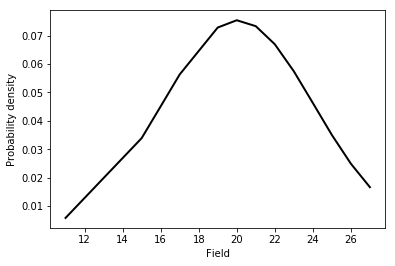

In [228]:
rand_point([19,21,15,22,16,19,17,24,21,16,25,26,22,23,11,20,20,27,17], True,"FGA" )

In [229]:
nba_stats["Stephen Curry"]

{'FGA': [20, 24, 23, 18, 24, 18, 26, 9, 20, 24, 17, 14, 21, 17, 20],
 'FG_PCT': [0.55,
  0.5416666666666666,
  0.43478260869565216,
  0.6111111111111112,
  0.625,
  0.5555555555555556,
  0.4230769230769231,
  0.7777777777777778,
  0.6,
  0.4583333333333333,
  0.35294117647058826,
  0.35714285714285715,
  0.47619047619047616,
  0.5882352941176471,
  0.55],
 'FG3A': [9, 9, 16, 13, 16, 11, 15, 4, 11, 12, 6, 4, 9, 10, 14],
 'FG3_PCT': [0.5555555555555556,
  0.5555555555555556,
  0.375,
  0.46153846153846156,
  0.6875,
  0.5454545454545454,
  0.4666666666666667,
  0.5,
  0.6363636363636364,
  0.3333333333333333,
  0.5,
  0.0,
  0.3333333333333333,
  0.6,
  0.6428571428571429],
 'FTA': [5, 1, 4, 2, 10, 3, 7, 7, 7, 2, 4, 0, 4, 4, 12],
 'FT_PCT': [1.0,
  0.0,
  1.0,
  0.5,
  1.0,
  1.0,
  0.8571428571428571,
  1.0,
  0.8571428571428571,
  1.0,
  1.0,
  0,
  1.0,
  1.0,
  0.9166666666666666]}

In [428]:
class Player:
    def __init__(self,name,year):
        self.name = name
        self.year = year
        if  nba_stats.get(name) == None:
            self.stat =  {"FGA":[0],'FG_PCT':[0],'FG3A':[0],'FG3_PCT':[0],'FTA':[0],"FT_PCT":[0]}
        else:
            self.stat = nba_stats[name]

    def update(self,FGM,FG3M,FTM,FG_PCT,FG3_PCT,FT_PCT):
        '''
        updates the stats based on a new game
        '''
        self.stat["FGA"].append(FGA)
        self.stat["FG3A"].append(FG3A)
        self.stat['FTA'].append(FTA)
        self.stat["FG_PCT"].append(FGA)
        self.stat["FG3_PCT"].append(FG3A)
        self.stat['FT_PCT'].append(FTA)
        print(self.stat)

    def instance(self):
        '''
        Samples stats from a probabilty distrubtion the player
        '''
        stat = [0,0,0,0,0,0]
        logic = False
        while logic == False:
            i = 0
            for k,v in self.stat.items():
                x = rand_point(v)
                stat[i] = x
                i += 1
            if stat[0] >= stat[1]:
                logic = True
        return stat

In [429]:
Player("Zach LaVine", yr).instance()

[22, 0.38461538461538464, 6, 0.2, 8, 0.7857142857142857]

In [439]:
class Team(Player):
    def __init__(self, name, year):
        self.team = name
        self.team_id = constants.TEAMS[name]['id']
        self.year = year
        players = []
        for i in roster[name]:
            players.append(Player(i,year))
        self.players = players
        rec = team.TeamGeneralSplits(self.team_id,season = year).wins_losses()
        self.record = [rec["W"][0],rec["L"][1]]
    
    def who_score(self):
        '''
        Samples for every stat for each player in the roster
        '''
        print("Calculating...")
        name = []
        fga = []
        fg_pct = []
        fg3a = []
        fg3_pct = []
        fta = []
        ft_pct = []
        for i in self.players:
            box = i.instance()
            name.append(i.name)
            while box[0] < box[2]:
                 box = i.instance()
            fga.append(box[0])
            fg_pct.append(box[1])
            fg3a.append(box[2])
            fg3_pct.append(box[3])
            fta.append(box[4])
            ft_pct.append(box[5])
            
        fga_prob = np.divide(fga, np.sum(fga))
        # might want to update player stats
        return(name,fga_prob,fga,fg_pct,fg3a,fg3_pct,fta,ft_pct)
    
    def scoring(self, defense = False, opp = None):
        '''
        Generates a list of scores per possesion
        '''
        name,fga_prob,fga,fg_pct,fg3a,fg3_pct,fta,ft_pct = self.who_score()
        if defense == True and opp != None: 
            fg_PCT = []
            dfg = def_fg[opp]
            for i in fg_pct:
                new_pct = np.mean([i,dfg])
                fg_PCT.append(new_pct)
            print(fg_pct)
            print(fg_PCT)
            fg_pct = fg_PCT
        
        
        names = dict(zip(name,range(len(name))))
        print(names)
        print(fg_pct)
        score = []
        for i in range(100):
            who = rng.choice(name, p = fga_prob)
            pos = names[who]
            print('pos:',pos)
            outcome = rng.choice(['score','miss'], p =[fg_pct[pos],1-fg_pct[pos]])
            if outcome == "score":
                print()
                dec = rng.choice([2,3], p = [(fga[pos]-fg3a[pos])/fga[pos], fg3a[pos]/fga[pos]])
                score.append(dec)
            else:
                score.append(0)
        ft_points = 0
        for j in name: 
            pos = names[j]
            for k in range(fta[pos]):
                ft_points += k
                oc = rng.choice(["score","miss"], p = [ft_pct[pos],1-ft_pct[pos]])
                if oc == "score":
                    score.append(1)
                else:
                    score.append(0)
        return np.cumsum(score)


    def update_rec(self,outcome):
        '''
        Updates the team's record
        '''
        
        if outcome  == "W":
            self.record[0] += 1
        else:
            self.record[1] += 1


In [459]:
class Game(Team):
    def __init__(self, home_team, away_team,year):
        self.home = home_team
        self.away = away_team

    def sim(self, plot = False):
        score_home = self.home.scoring(defense = True, opp = self.away.team)
        score_away = self.away.scoring(defense = True, opp = self.home.team)
        poss1= np.linspace(1,len(score_home),len(score_home))
        poss2= np.linspace(1,len(score_away),len(score_away))
        print(len(poss1))
        print(len(poss2))
        
        if plot == True:
            fig = plt.figure()
            axs = fig.add_subplot(111)
            axs.plot(poss1,score_home, label = "{}".format(self.home.team))
            axs.plot(poss2,score_away,label = "{}".format(self.away.team))
            home = constants.TEAMS[self.home.team]['name']
            away = constants.TEAMS[self.away.team]['name']
            axs.set_title("Away:{} vs Home:{}".format(away, home),fontweight="bold")
            axs.legend(loc='lower right')
            axs.set_xlabel("Possesions")
            axs.set_ylabel("Points")
            textfit = r"$\bf{Score}$: %s:%d - %s:%d"%(away,score_away[-1],home,score_home[-1])
            axs.text(0.05, 0.90, textfit, transform=axs.transAxes, fontsize=12,
                    verticalalignment='top')
            title = self.home.team +' vs '+ self.away.team
            plt.savefig(title)
        return(score_home[-1],score_away[-1])

[6, 20]
Calculating...
[0, 0.46153846153846156, 0.4, 0.4, 0.6666666666666666, 0.2, 0.4444444444444444, 0.5555555555555556, 0.0, 0, 0.5555555555555556, 0.3333333333333333, 0.3076923076923077, 0, 0.5, 0, 0.5]
[0.237, 0.46776923076923077, 0.437, 0.437, 0.5703333333333334, 0.33699999999999997, 0.4592222222222222, 0.5147777777777778, 0.237, 0.237, 0.5147777777777778, 0.4036666666666666, 0.39084615384615384, 0.237, 0.487, 0.237, 0.487]
{'Tyler Ulis': 0, 'Jabari Parker': 1, 'Shaquille Harrison': 2, 'Bobby Portis': 3, 'Cristiano Felicio': 4, 'Justin Holiday': 5, 'Zach LaVine': 6, 'Antonio Blakeney': 7, 'Chandler Hutchison': 8, 'Rawle Alkins': 9, 'Cameron Payne': 10, 'Lauri Markkanen': 11, 'Kris Dunn': 12, 'Wendell Carter Jr.': 13, 'Robin Lopez': 14, 'Denzel Valentine': 15, 'Ryan Arcidiacono': 16}
[0.237, 0.46776923076923077, 0.437, 0.437, 0.5703333333333334, 0.33699999999999997, 0.4592222222222222, 0.5147777777777778, 0.237, 0.237, 0.5147777777777778, 0.4036666666666666, 0.39084615384615384, 0

/Users/asbogale/anaconda3/lib/python3.6/site-packages/numpy/core/fromnumeric.py:2957: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/asbogale/anaconda3/lib/python3.6/site-packages/numpy/core/_methods.py:80: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/asbogale/anaconda3/lib/python3.6/site-packages/numpy/core/_methods.py:135: RuntimeWarning: Degrees of freedom <= 0 for slice
  keepdims=keepdims)
/Users/asbogale/anaconda3/lib/python3.6/site-packages/numpy/core/_methods.py:105: RuntimeWarning: invalid value encountered in true_divide
  arrmean, rcount, out=arrmean, casting='unsafe', subok=False)
/Users/asbogale/anaconda3/lib/python3.6/site-packages/numpy/core/_methods.py:127: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/asbogale/anaconda3/lib/python3.6/site-packages/scipy/stats/_distn_infrastructure.py:1652: RuntimeWarning: invalid value encountered in tr

(114, 130)

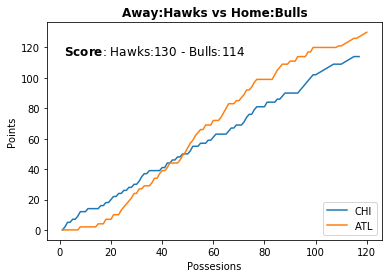

In [514]:
# Example of a game vis
chi = Team('CHI',yr)
atl = Team('ATL',yr)
print(chi.record)
Game(chi,atl,yr).sim(plot = True)

In [510]:
# Generates all the Team objects
nba_teams = {}
for t in nba:
    print(t)
    nba_teams[t] = Team(t,yr)

print(nba_teams)    

ATL
BOS
CLE
NOP
CHI
DAL
DEN
GSW
HOU
LAC
LAL
MIA
MIN
BKN
NYK
ORL
IND
PHI
PHX
POR
SAC
SAS
OKC
MIL
UTA
MEM
WAS
DET
CHA
TOR
{'ATL': <__main__.Team object at 0x1a24284e80>, 'BOS': <__main__.Team object at 0x1a2327df98>, 'CLE': <__main__.Team object at 0x1a25fe0ac8>, 'NOP': <__main__.Team object at 0x1a244762b0>, 'CHI': <__main__.Team object at 0x10ed8c978>, 'DAL': <__main__.Team object at 0x1a243587f0>, 'DEN': <__main__.Team object at 0x1a22c2ecc0>, 'GSW': <__main__.Team object at 0x1a24284be0>, 'HOU': <__main__.Team object at 0x1a230dec88>, 'LAC': <__main__.Team object at 0x1a2437a9b0>, 'LAL': <__main__.Team object at 0x1a263c92b0>, 'MIA': <__main__.Team object at 0x1a25dc9e48>, 'MIN': <__main__.Team object at 0x1a25ebdb00>, 'BKN': <__main__.Team object at 0x1a230de588>, 'NYK': <__main__.Team object at 0x1a17227438>, 'ORL': <__main__.Team object at 0x1a2433eeb8>, 'IND': <__main__.Team object at 0x1a2449a0b8>, 'PHI': <__main__.Team object at 0x1a263c2f60>, 'PHX': <__main__.Team object at 0x

In [511]:
# Iterate through all of the games
records = {}
print("SIMULATING...")
for k,v in nba_teams.items():
    print(k)
    outcome = "W"
    num_games = v.record[0] + v.record[1]
    print(v.team,":",v.record)
    d = 1
    for j in schedule[k][num_games:]:
        opp = nba_teams[j]
        score = Game(v,opp,year).sim()
        print("game:",d)
        d+=1
        print(score)
        if score[0] >= score[1]:
            outcome = "W"
        else:
            outcome = "L"
        v.update_rec(outcome)
    x = v.record
    print(x)
    records[k] = x

SIMULATING...
ATL
ATL : [5, 20]
Calculating...
[0.0, 0.375, 0.4, 0.0, 0.3333333333333333, 0.3333333333333333, 0.0, 0.3157894736842105, 0, 0.5384615384615384, 0.3333333333333333, 0.8333333333333334, 0.6, 0.5, 0.3, 0.3, 0.5]
[0.225, 0.4125, 0.42500000000000004, 0.225, 0.39166666666666666, 0.39166666666666666, 0.225, 0.3828947368421053, 0.225, 0.49423076923076925, 0.39166666666666666, 0.6416666666666667, 0.525, 0.475, 0.375, 0.375, 0.475]
{'Justin Anderson': 0, 'Tyler Dorsey': 1, 'Kevin Huerter': 2, 'Daniel Hamilton': 3, 'Omari Spellman': 4, 'Jeremy Lin': 5, 'Jaylen Adams': 6, 'Trae Young': 7, 'Taurean Prince': 8, 'Dewayne Dedmon': 9, 'Vince Carter': 10, 'Miles Plumlee': 11, 'John Collins': 12, 'Alex Poythress': 13, 'Kent Bazemore': 14, 'Alex Len': 15, "DeAndre' Bembry": 16}
[0.225, 0.4125, 0.42500000000000004, 0.225, 0.39166666666666666, 0.39166666666666666, 0.225, 0.3828947368421053, 0.225, 0.49423076923076925, 0.39166666666666666, 0.6416666666666667, 0.525, 0.475, 0.375, 0.375, 0.475]


/Users/asbogale/anaconda3/lib/python3.6/site-packages/scipy/stats/_distn_infrastructure.py:1652: RuntimeWarning: invalid value encountered in true_divide
  x = np.asarray((x - loc)/scale, dtype=dtyp)
/Users/asbogale/anaconda3/lib/python3.6/site-packages/scipy/stats/_distn_infrastructure.py:876: RuntimeWarning: invalid value encountered in greater_equal
  return (self.a <= x) & (x <= self.b)
/Users/asbogale/anaconda3/lib/python3.6/site-packages/scipy/stats/_distn_infrastructure.py:876: RuntimeWarning: invalid value encountered in less_equal
  return (self.a <= x) & (x <= self.b)
/Users/asbogale/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:10: RuntimeWarning: invalid value encountered in less
  # Remove the CWD from sys.path while we load stuff.
/Users/asbogale/anaconda3/lib/python3.6/site-packages/numpy/core/fromnumeric.py:2957: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/asbogale/anaconda3/lib/python3.6/site-packages/numpy/core/_methods.py:80: Runtim

[0, 0, 0.375, 0.6666666666666666, 0.6, 0.42857142857142855, 0.3333333333333333, 0.3333333333333333, 0, 0.5, 0, 0.375, 0, 0.5714285714285714, 0.0, 0.0, 0.3]
[0.237, 0.237, 0.4245, 0.5703333333333334, 0.5369999999999999, 0.4512857142857143, 0.4036666666666666, 0.4036666666666666, 0.237, 0.487, 0.237, 0.4245, 0.237, 0.5227142857142857, 0.237, 0.237, 0.387]
{'Dennis Smith Jr.': 0, 'Daryl Macon': 1, 'J.J. Barea': 2, 'DeAndre Jordan': 3, 'Dwight Powell': 4, 'Dorian Finney-Smith': 5, 'Jalen Brunson': 6, 'Wesley Matthews': 7, 'Ray Spalding': 8, 'Devin Harris': 9, 'Kostas Antetokounmpo': 10, 'Harrison Barnes': 11, 'Dirk Nowitzki': 12, 'Maxi Kleber': 13, 'Ryan Broekhoff': 14, 'Salah Mejri': 15, 'Luka Doncic': 16}
[0.237, 0.237, 0.4245, 0.5703333333333334, 0.5369999999999999, 0.4512857142857143, 0.4036666666666666, 0.4036666666666666, 0.237, 0.487, 0.237, 0.4245, 0.237, 0.5227142857142857, 0.237, 0.237, 0.387]
pos: 4

pos: 3

pos: 13
pos: 16

pos: 7
pos: 13
pos: 13

pos: 7
pos: 6

pos: 5
pos: 3



[0.483, 0.39966666666666667, 0.43300000000000005, 0.483, 0.39966666666666667, 0.5406923076923077, 0.233, 0.3758571428571429, 0.233, 0.5022307692307693, 0.483, 0.39966666666666667, 0.5859411764705883, 0.39966666666666667, 0.39966666666666667, 0.333, 0.5187142857142857]
{'Justin Anderson': 0, 'Tyler Dorsey': 1, 'Kevin Huerter': 2, 'Daniel Hamilton': 3, 'Omari Spellman': 4, 'Jeremy Lin': 5, 'Jaylen Adams': 6, 'Trae Young': 7, 'Taurean Prince': 8, 'Dewayne Dedmon': 9, 'Vince Carter': 10, 'Miles Plumlee': 11, 'John Collins': 12, 'Alex Poythress': 13, 'Kent Bazemore': 14, 'Alex Len': 15, "DeAndre' Bembry": 16}
[0.483, 0.39966666666666667, 0.43300000000000005, 0.483, 0.39966666666666667, 0.5406923076923077, 0.233, 0.3758571428571429, 0.233, 0.5022307692307693, 0.483, 0.39966666666666667, 0.5859411764705883, 0.39966666666666667, 0.39966666666666667, 0.333, 0.5187142857142857]
pos: 9

pos: 7
pos: 12

pos: 14

pos: 5
pos: 12
pos: 7
pos: 7
pos: 7

pos: 12
pos: 0

pos: 7
pos: 12

pos: 13

pos: 7
p

pos: 9
pos: 14

pos: 16

pos: 12
pos: 14

pos: 0

pos: 16

pos: 11
pos: 7

pos: 7
pos: 7
pos: 12
pos: 1
pos: 7

pos: 4
pos: 7
pos: 5
pos: 4

pos: 9
pos: 7

pos: 5
Calculating...
[0.6428571428571429, 0.5, 0.0, 0.4, 0.3333333333333333, 0.4, 0.5, 0, 0.3333333333333333, 0.2, 0, 0, 0.5714285714285714, 0.3333333333333333, 0.6666666666666666, 0.5, 0.0]
[0.5584285714285715, 0.487, 0.237, 0.437, 0.4036666666666666, 0.437, 0.487, 0.237, 0.4036666666666666, 0.33699999999999997, 0.237, 0.237, 0.5227142857142857, 0.4036666666666666, 0.5703333333333334, 0.487, 0.237]
{'Andre Drummond': 0, 'Reggie Jackson': 1, 'Luke Kennard': 2, 'Bruce Brown': 3, 'Stanley Johnson': 4, 'Henry Ellenson': 5, 'Langston Galloway': 6, 'Keenan Evans': 7, 'Khyri Thomas': 8, 'Ish Smith': 9, 'Zach Lofton': 10, 'Glenn Robinson III': 11, 'Blake Griffin': 12, 'Reggie Bullock': 13, 'Zaza Pachulia': 14, 'Jon Leuer': 15, 'Jose Calderon': 16}
[0.5584285714285715, 0.487, 0.237, 0.437, 0.4036666666666666, 0.437, 0.487, 0.237, 0.4036666

pos: 0
pos: 12

pos: 16

pos: 2

pos: 9

pos: 8
pos: 9
pos: 10

pos: 11
pos: 8
pos: 10

pos: 10
pos: 0

pos: 12
pos: 0

pos: 9

pos: 10
pos: 3
pos: 11
pos: 9

pos: 9
pos: 9
pos: 11
pos: 2
pos: 1
pos: 8

pos: 10

pos: 8
pos: 9

pos: 8
pos: 15

pos: 0

pos: 10

pos: 16

pos: 15

pos: 10

pos: 10

pos: 14
pos: 8

pos: 11

pos: 2
pos: 9
pos: 12

pos: 2
pos: 16

pos: 11
pos: 9
pos: 9
pos: 14
pos: 6
pos: 10

pos: 12
pos: 2
pos: 8

pos: 14

pos: 2
pos: 13

pos: 11
pos: 8
pos: 10
pos: 15

pos: 14

pos: 12

pos: 12

pos: 1

pos: 0
pos: 2
pos: 14

pos: 12

pos: 8

pos: 3
pos: 9

pos: 13
pos: 1

pos: 9
pos: 13
pos: 12

pos: 11
pos: 14
pos: 11
pos: 16

pos: 11
pos: 14
pos: 9
pos: 9
pos: 9

pos: 11
131
120
game: 9
(127, 121)
Calculating...
[0.0, 0.2, 0.0, 0.5, 0.5, 0.6363636363636364, 0.0, 0.16666666666666666, 0, 0.25, 0.2857142857142857, 0.75, 0.5, 0.625, 0.4375, 0.5, 0.3333333333333333]
[0.2435, 0.3435, 0.2435, 0.4935, 0.4935, 0.5616818181818182, 0.2435, 0.3268333333333333, 0.2435, 0.3685, 0.3863

pos: 4
pos: 4
pos: 5
pos: 7
pos: 0
pos: 7

pos: 7
pos: 7
pos: 14
pos: 7
pos: 13
pos: 2
pos: 0
pos: 12
pos: 12
pos: 0
pos: 14
pos: 11
pos: 9
pos: 12
pos: 4

pos: 14
pos: 11

pos: 7

pos: 7

pos: 13

pos: 12

pos: 10
pos: 12

pos: 12
pos: 12

pos: 4

pos: 14
pos: 9

pos: 4
pos: 14

pos: 12
pos: 7

pos: 12
pos: 12
pos: 12
pos: 12

pos: 11
pos: 7

pos: 14

pos: 4

pos: 4
pos: 2
pos: 13

pos: 11
pos: 16

pos: 14

pos: 11
pos: 0

pos: 9
pos: 3

pos: 10
pos: 9
pos: 7
pos: 12

pos: 0

pos: 10
pos: 7
pos: 9

pos: 7
pos: 7
pos: 12

pos: 0
pos: 12
pos: 1
pos: 12

pos: 12
pos: 7

pos: 9

pos: 14
pos: 10
pos: 16
pos: 4

pos: 0

pos: 7

pos: 15
pos: 4

pos: 12
pos: 1
pos: 11
pos: 14

pos: 7

pos: 14
pos: 15

pos: 13
pos: 0
pos: 14
pos: 0

pos: 7

pos: 9
pos: 15
Calculating...
[0, 0.6666666666666666, 0.5384615384615384, 0.4, 0.0, 0.2, 0.2222222222222222, 0.5, 0.42857142857142855, 0.4666666666666667, 0.0, 0.375, 0.3333333333333333, 0.5, 0.5, 0.0, 0.2857142857142857]
[0.237, 0.5703333333333334, 0.50623

pos: 12

pos: 2

pos: 15
pos: 4

pos: 0
pos: 3

pos: 14
pos: 0
pos: 9

pos: 0
pos: 16

pos: 12
pos: 15
pos: 1
pos: 12

pos: 13
pos: 15
pos: 7
pos: 7
pos: 12
pos: 9
pos: 12

pos: 6
pos: 4

pos: 0
pos: 11

pos: 2
pos: 13

pos: 9
pos: 14
pos: 7
pos: 1
pos: 14

pos: 14
pos: 5
pos: 14
pos: 6

pos: 14
pos: 9
pos: 9

pos: 16
pos: 1
pos: 10

pos: 7
pos: 5
pos: 7
pos: 12

pos: 9
pos: 14
pos: 0

pos: 7

pos: 13
pos: 12
pos: 2

pos: 5

pos: 0

pos: 1
pos: 14
pos: 7
pos: 16

pos: 14

pos: 7
pos: 14

pos: 14
pos: 2
pos: 9

pos: 15
pos: 4
pos: 14
pos: 12

pos: 3
pos: 3
pos: 12

pos: 14
pos: 12

pos: 14

Calculating...
[0.5, 0.4, 0.42857142857142855, 0.5454545454545454, 0.375, 0, 0.4, 0.0, 0, 0.6666666666666666, 0, 0.5882352941176471, 0.3333333333333333, 0.5, 0.5555555555555556, 0.5, 1.0]
[0.487, 0.437, 0.4512857142857143, 0.5097272727272727, 0.4245, 0.237, 0.437, 0.237, 0.237, 0.5703333333333334, 0.237, 0.5311176470588235, 0.4036666666666666, 0.487, 0.5147777777777778, 0.487, 0.737]
{'Rodions Kurucs


pos: 5

pos: 7
pos: 16

pos: 7
pos: 2

pos: 5
pos: 15

pos: 2

pos: 14
pos: 15

pos: 9
pos: 14

pos: 4

pos: 16
pos: 15
pos: 16

pos: 0
pos: 10
pos: 13

pos: 12
pos: 10
pos: 15

pos: 16

Calculating...
[0.5652173913043478, 0.3333333333333333, 0.6666666666666666, 0.42857142857142855, 0.16666666666666666, 0.0, 0.5, 1.0, 0.5833333333333334, 0.6153846153846154, 0.3157894736842105, 0, 0.42857142857142855, 0.0, 0, 0.3333333333333333]
[0.5196086956521739, 0.4036666666666666, 0.5703333333333334, 0.4512857142857143, 0.3203333333333333, 0.237, 0.487, 0.737, 0.5286666666666666, 0.5446923076923077, 0.39489473684210524, 0.237, 0.4512857142857143, 0.237, 0.237, 0.4036666666666666]
{'Russell Westbrook': 0, 'Raymond Felton': 1, 'Nerlens Noel': 2, 'Hamidou Diallo': 3, 'Timothe Luwawu-Cabarrot': 4, 'Alex Abrines': 5, 'Jerami Grant': 6, 'Abdel Nader': 7, 'Steven Adams': 8, 'Paul George': 9, 'Dennis Schroder': 10, 'Andre Roberson': 11, 'Terrance Ferguson': 12, 'Deonte Burton': 13, 'Tyler Davis': 14, 'Pat

pos: 11
pos: 6
pos: 16

pos: 16
pos: 12
pos: 16

pos: 6

pos: 1

pos: 5
pos: 7

pos: 1
pos: 12

pos: 6
pos: 8

pos: 16

pos: 12

pos: 6
pos: 11
pos: 3
pos: 11

pos: 1
pos: 16

pos: 16
pos: 11
pos: 16
pos: 11
pos: 16

pos: 11

pos: 6
pos: 14

pos: 7
pos: 5
pos: 3
pos: 11

pos: 5

pos: 16
pos: 1
pos: 11

pos: 3

pos: 16
pos: 12

pos: 11
pos: 5
pos: 6
pos: 7

pos: 12

pos: 6
pos: 2
pos: 6
pos: 1

pos: 11

pos: 12
pos: 10

pos: 11
pos: 11
pos: 11
pos: 5
pos: 1
pos: 11

pos: 11

pos: 2

pos: 12
pos: 2
pos: 12

pos: 6
pos: 14

pos: 14
pos: 11
pos: 12
pos: 2
pos: 11

121
119
game: 22
(116, 121)
Calculating...
[0.0, 0.5, 0.4, 0.0, 0.3333333333333333, 0.0, 0.0, 0.3157894736842105, 0, 0.5, 0.3333333333333333, 0.6, 0.6, 0.625, 0.4444444444444444, 0.5, 0.5]
[0.227, 0.477, 0.42700000000000005, 0.227, 0.39366666666666666, 0.227, 0.227, 0.3848947368421053, 0.227, 0.477, 0.39366666666666666, 0.527, 0.527, 0.5395, 0.4492222222222222, 0.477, 0.477]
{'Justin Anderson': 0, 'Tyler Dorsey': 1, 'Kevin Huerte

pos: 9

pos: 12

pos: 10
pos: 2
pos: 7

pos: 15

pos: 5

pos: 7

pos: 16

pos: 12

pos: 10
pos: 5
pos: 16
pos: 2
pos: 14

pos: 4

pos: 10

pos: 5
pos: 10
pos: 15
pos: 16
pos: 12
pos: 10

pos: 10
pos: 10
pos: 10

pos: 7
pos: 5
pos: 7

pos: 5

pos: 15
pos: 10
pos: 5

pos: 2

pos: 9

pos: 16
pos: 7

pos: 5

pos: 7

pos: 7

pos: 6
pos: 16
pos: 5
pos: 16
pos: 2
pos: 12
Calculating...
[0.6470588235294118, 0.5, 0.47058823529411764, 0.6666666666666666, 0.42857142857142855, 0.5714285714285714, 0.3333333333333333, 0.6666666666666666, 0, 0.0, 0.5, 0.42857142857142855, 0, 0, 0.75, 0, 0.0]
[0.5605294117647059, 0.487, 0.4722941176470588, 0.5703333333333334, 0.4512857142857143, 0.5227142857142857, 0.4036666666666666, 0.5703333333333334, 0.237, 0.237, 0.487, 0.4512857142857143, 0.237, 0.237, 0.612, 0.237, 0.237]
{'Willie Cauley-Stein': 0, 'Yogi Ferrell': 1, "De'Aaron Fox": 2, 'Skal Labissiere': 3, 'Bogdan Bogdanovic': 4, 'Iman Shumpert': 5, 'Frank Mason': 6, 'Troy Williams': 7, 'Harry Giles III': 8, '

pos: 9

pos: 9
pos: 15

pos: 9

pos: 9
pos: 5
pos: 9
pos: 10

pos: 11
pos: 7
pos: 10
pos: 7

pos: 7

pos: 14
pos: 12
pos: 4
pos: 9

pos: 7
pos: 15

pos: 10

pos: 2

pos: 16
pos: 9

pos: 12
pos: 6

pos: 15
pos: 12

pos: 9

pos: 14

pos: 16
pos: 11
pos: 2

pos: 10
pos: 14
pos: 16

pos: 12

pos: 7
pos: 9
pos: 9

pos: 16
pos: 10

pos: 9
pos: 14

pos: 4

pos: 4

pos: 10
pos: 12

pos: 7

pos: 16
pos: 16
pos: 7

pos: 4

pos: 7
pos: 14

pos: 9
pos: 12
pos: 12

pos: 14

pos: 4
pos: 15
pos: 7

pos: 7
pos: 5

pos: 16

pos: 7

pos: 16

pos: 15

pos: 16

pos: 7
pos: 9
pos: 12
pos: 9
pos: 5

pos: 7
pos: 9

pos: 16
pos: 12
pos: 14

pos: 2
pos: 12

pos: 9

pos: 5

pos: 14
pos: 5

pos: 14
pos: 7
pos: 5

pos: 1
pos: 14
pos: 14

Calculating...
[0.4, 0.4, 0.4, 0.5384615384615384, 0, 0.5, 0, 0, 0.2, 0.6666666666666666, 0, 0.625, 0, 0.5, 0.25, 0.36363636363636365, 0.0]
[0.437, 0.437, 0.437, 0.5062307692307693, 0.237, 0.487, 0.237, 0.237, 0.33699999999999997, 0.5703333333333334, 0.237, 0.5495, 0.237, 0.487, 


pos: 13
pos: 4
pos: 12

pos: 7

pos: 5
pos: 7
pos: 5
pos: 12
pos: 9
pos: 7

pos: 4

pos: 7

pos: 2

pos: 7
pos: 7
pos: 15

pos: 5
pos: 13
pos: 16

pos: 13

pos: 14
pos: 9
pos: 4

pos: 16

pos: 2
pos: 16
pos: 7
pos: 13
pos: 14

pos: 7
pos: 11
pos: 7

pos: 2
pos: 13

pos: 2

pos: 4

pos: 7
pos: 4
pos: 0
pos: 5

pos: 13

pos: 2

pos: 2

pos: 15
Calculating...
[0.4375, 0.36363636363636365, 0.2, 0, 0, 0.5, 0.4, 0, 0.0, 0.4444444444444444, 0.14285714285714285, 0, 0.3333333333333333, 0.6666666666666666, 0, 0.5, 0]
[0.45575, 0.4188181818181818, 0.33699999999999997, 0.237, 0.237, 0.487, 0.437, 0.237, 0.237, 0.4592222222222222, 0.3084285714285714, 0.237, 0.4036666666666666, 0.5703333333333334, 0.237, 0.487, 0.237]
{'Aaron Gordon': 0, 'Jonathan Isaac': 1, 'Jarell Martin': 2, 'Troy Caupain': 3, 'Mo Bamba': 4, 'Nikola Vucevic': 5, 'Evan Fournier': 6, 'Amile Jefferson': 7, 'Isaiah Briscoe': 8, 'D.J. Augustin': 9, 'Jonathon Simmons': 10, 'Timofey Mozgov': 11, 'Jerian Grant': 12, 'Khem Birch': 13, 'W

pos: 5

pos: 0
pos: 14
pos: 4

pos: 4

pos: 12

pos: 1
pos: 15

pos: 14
pos: 4
pos: 0
pos: 5

pos: 14

pos: 3

pos: 14

pos: 11
pos: 16

pos: 10

pos: 14
pos: 14

pos: 0
pos: 0
pos: 14

pos: 14

pos: 5

pos: 10

pos: 5

pos: 14

pos: 16

pos: 7
pos: 5
pos: 10

pos: 15
pos: 16
pos: 1
pos: 16
pos: 12

Calculating...
[0.4090909090909091, 0.5555555555555556, 0, 0.5625, 0.6, 0.25, 0.5454545454545454, 0, 0.4444444444444444, 0.42857142857142855, 0.0, 0.4444444444444444, 0.3333333333333333, 0.4, 0.16666666666666666]
[0.4415454545454546, 0.5147777777777778, 0.237, 0.51825, 0.5369999999999999, 0.362, 0.5097272727272727, 0.237, 0.4592222222222222, 0.4512857142857143, 0.237, 0.4592222222222222, 0.4036666666666666, 0.437, 0.3203333333333333]
{'Damian Lillard': 0, 'Evan Turner': 1, 'Wade Baldwin IV': 2, 'CJ McCollum': 3, 'Maurice Harkless': 4, 'Nik Stauskas': 5, 'Al-Farouq Aminu': 6, 'Gary Trent Jr.': 7, 'Jake Layman': 8, 'Meyers Leonard': 9, 'Anfernee Simons': 10, 'Jusuf Nurkic': 11, 'Seth Curry': 

pos: 8
pos: 16

pos: 10
pos: 14
pos: 0

pos: 13

pos: 9

pos: 13
pos: 14
pos: 8
pos: 16

pos: 12
pos: 14

pos: 12

pos: 13
pos: 0
pos: 9
pos: 14

pos: 12
pos: 12
pos: 9

pos: 0

pos: 13
pos: 15

pos: 0
pos: 15
pos: 11
pos: 0

pos: 10
pos: 13
pos: 2
pos: 9
pos: 9

pos: 1
pos: 14
pos: 10

pos: 16
pos: 10
pos: 12
pos: 15

pos: 16

pos: 10
pos: 14

pos: 11

pos: 14

pos: 1
pos: 0
pos: 9
pos: 10

pos: 12

pos: 16

pos: 8
pos: 10

pos: 10
pos: 13
pos: 3

pos: 15

pos: 12

pos: 15
pos: 9
pos: 9
pos: 10

pos: 14
pos: 1
pos: 14

pos: 16

pos: 12
pos: 12

pos: 12

pos: 6

pos: 16

pos: 15
pos: 13
pos: 2

125
131
game: 37
(107, 130)
Calculating...
[0.0, 0.5, 0.4, 0.5, 0.3333333333333333, 0.6, 0.0, 0.4, 0, 0.5, 0.5, 0.875, 0.5, 0.6666666666666666, 0.35714285714285715, 0.375, 0.375]
[0.2295, 0.47950000000000004, 0.4295, 0.47950000000000004, 0.39616666666666667, 0.5295, 0.2295, 0.4295, 0.2295, 0.47950000000000004, 0.47950000000000004, 0.667, 0.47950000000000004, 0.5628333333333333, 0.408071428571428

pos: 15
pos: 11
pos: 5

pos: 7

pos: 10

pos: 14
pos: 7

pos: 15

pos: 12

pos: 15
pos: 1
pos: 12
pos: 13
pos: 4

pos: 16
pos: 15

pos: 15

pos: 12
pos: 11
pos: 6
pos: 15

pos: 16
pos: 15
pos: 4
pos: 3

pos: 12

pos: 10

pos: 15
pos: 5
pos: 7
pos: 12

pos: 14

pos: 4
pos: 9
pos: 7
pos: 7
pos: 14
pos: 7
pos: 16
pos: 5
pos: 3

pos: 0
pos: 2
pos: 15
pos: 2

pos: 9

pos: 14
pos: 1

pos: 14
pos: 14
pos: 4
pos: 14
pos: 2

pos: 16
pos: 1
pos: 10
pos: 2
pos: 15
pos: 14
pos: 12
pos: 5
pos: 15
pos: 5
pos: 0
pos: 12

pos: 5

pos: 15
pos: 14

pos: 11
pos: 4

pos: 7
pos: 4

pos: 16
pos: 10

pos: 1

pos: 5
pos: 14

pos: 14
pos: 1
pos: 14
pos: 16
pos: 4
pos: 14

pos: 16
pos: 7

pos: 12

pos: 1
Calculating...
[0, 0.0, 0.375, 0, 0.0, 0.25, 0.4, 0.5, 0.5, 0.5, 0.5714285714285714, 0.5555555555555556, 0.6, 0.75, 0, 0.5, 0.6]
[0.237, 0.237, 0.4245, 0.237, 0.237, 0.362, 0.437, 0.487, 0.487, 0.487, 0.5227142857142857, 0.5147777777777778, 0.5369999999999999, 0.612, 0.237, 0.487, 0.5369999999999999]
{'Lonnie W

pos: 7
pos: 1
pos: 7
pos: 7
pos: 7
pos: 7
pos: 7
pos: 10
125
131
game: 43
(138, 114)
Calculating...
[0.5, 0.0, 0.4, 0.0, 0.14285714285714285, 1.0, 0.0, 0.16666666666666666, 0, 0.2, 0.3333333333333333, 0.0, 0.3, 0.0, 0.5454545454545454, 0.42857142857142855, 0.3]
[0.47350000000000003, 0.2235, 0.4235, 0.2235, 0.29492857142857143, 0.7235, 0.2235, 0.30683333333333335, 0.2235, 0.3235, 0.39016666666666666, 0.2235, 0.3735, 0.2235, 0.49622727272727274, 0.4377857142857143, 0.3735]
{'Justin Anderson': 0, 'Tyler Dorsey': 1, 'Kevin Huerter': 2, 'Daniel Hamilton': 3, 'Omari Spellman': 4, 'Jeremy Lin': 5, 'Jaylen Adams': 6, 'Trae Young': 7, 'Taurean Prince': 8, 'Dewayne Dedmon': 9, 'Vince Carter': 10, 'Miles Plumlee': 11, 'John Collins': 12, 'Alex Poythress': 13, 'Kent Bazemore': 14, 'Alex Len': 15, "DeAndre' Bembry": 16}
[0.47350000000000003, 0.2235, 0.4235, 0.2235, 0.29492857142857143, 0.7235, 0.2235, 0.30683333333333335, 0.2235, 0.3235, 0.39016666666666666, 0.2235, 0.3735, 0.2235, 0.49622727272727

pos: 14

Calculating...
[0.5833333333333334, 0.375, 0.0, 0, 0, 0.6666666666666666, 0.5384615384615384, 0, 0.0, 0.4, 0.36363636363636365, 0, 0.2, 0.0, 0, 0.5, 0]
[0.5286666666666666, 0.4245, 0.237, 0.237, 0.237, 0.5703333333333334, 0.5062307692307693, 0.237, 0.237, 0.437, 0.4188181818181818, 0.237, 0.33699999999999997, 0.237, 0.237, 0.487, 0.237]
{'Aaron Gordon': 0, 'Jonathan Isaac': 1, 'Jarell Martin': 2, 'Troy Caupain': 3, 'Mo Bamba': 4, 'Nikola Vucevic': 5, 'Evan Fournier': 6, 'Amile Jefferson': 7, 'Isaiah Briscoe': 8, 'D.J. Augustin': 9, 'Jonathon Simmons': 10, 'Timofey Mozgov': 11, 'Jerian Grant': 12, 'Khem Birch': 13, 'Wes Iwundu': 14, 'Terrence Ross': 15, 'Melvin Frazier Jr.': 16}
[0.5286666666666666, 0.4245, 0.237, 0.237, 0.237, 0.5703333333333334, 0.5062307692307693, 0.237, 0.237, 0.437, 0.4188181818181818, 0.237, 0.33699999999999997, 0.237, 0.237, 0.487, 0.237]
pos: 10
pos: 6
pos: 15
pos: 5
pos: 15

pos: 0

pos: 5
pos: 1
pos: 0

pos: 5
pos: 6
pos: 6

pos: 6

pos: 1

pos: 0

po

pos: 7
pos: 14
pos: 10
pos: 5
pos: 11

pos: 9
pos: 9
pos: 5

pos: 10
pos: 7
pos: 10
pos: 11

pos: 14
pos: 9
pos: 9

pos: 13
pos: 10
pos: 9
pos: 9
pos: 9
pos: 9
pos: 13
pos: 9

pos: 12

pos: 10
pos: 1
pos: 9
pos: 14
pos: 14
pos: 12

pos: 11
pos: 11

pos: 12

pos: 1
pos: 12
pos: 12
pos: 9
pos: 9

pos: 10

pos: 7
pos: 11
pos: 11

pos: 2
pos: 9

pos: 1

pos: 9
pos: 10

pos: 13
pos: 9

124
133
game: 49
(106, 115)
Calculating...
[0.3333333333333333, 1.0, 0.4444444444444444, 0.0, 0.16666666666666666, 0.5, 0.0, 0.4444444444444444, 0, 0.5, 0.3333333333333333, 0.8333333333333334, 0.6, 0.3333333333333333, 0.8181818181818182, 0.42857142857142855, 0.5]
[0.40016666666666667, 0.7335, 0.45572222222222225, 0.2335, 0.31683333333333336, 0.48350000000000004, 0.2335, 0.45572222222222225, 0.2335, 0.48350000000000004, 0.40016666666666667, 0.6501666666666667, 0.5335, 0.40016666666666667, 0.6425909090909091, 0.4477857142857143, 0.48350000000000004]
{'Justin Anderson': 0, 'Tyler Dorsey': 1, 'Kevin Huerter': 2, 

pos: 15

pos: 5
pos: 12
pos: 7
pos: 2

pos: 12
pos: 2
pos: 2

pos: 12

pos: 8
pos: 4

pos: 11
pos: 6

pos: 9

pos: 12
pos: 6

pos: 8
pos: 12

pos: 5
pos: 2
pos: 8

pos: 7

pos: 15

pos: 7
pos: 2
pos: 15

pos: 11
pos: 5
pos: 12
pos: 7

pos: 11

pos: 6
pos: 6
pos: 16
pos: 16
pos: 15

pos: 8

pos: 12
pos: 8
pos: 4
pos: 8

pos: 8
pos: 8
pos: 16

pos: 6
pos: 12
pos: 7

pos: 12
pos: 12

pos: 5
pos: 12

pos: 10

pos: 2
pos: 7

pos: 12

pos: 6
pos: 12
pos: 5

pos: 11

pos: 5

pos: 12
122
114
game: 53
(139, 118)
Calculating...
[0.5, 0.3333333333333333, 0.4444444444444444, 0.0, 0.3333333333333333, 0.3333333333333333, 0.0, 0.2727272727272727, 0, 0.375, 0.5, 0.6666666666666666, 0.7, 0.4, 0.3333333333333333, 0.75, 0.25]
[0.471, 0.38766666666666666, 0.4432222222222222, 0.221, 0.38766666666666666, 0.38766666666666666, 0.221, 0.35736363636363633, 0.221, 0.4085, 0.471, 0.5543333333333333, 0.571, 0.42100000000000004, 0.38766666666666666, 0.596, 0.346]
{'Justin Anderson': 0, 'Tyler Dorsey': 1, 'Kevin Hue

pos: 8
pos: 12
pos: 8
pos: 10

pos: 8
pos: 14
pos: 16
pos: 14

pos: 13
pos: 11

pos: 13
pos: 10
pos: 2
pos: 14
pos: 16
pos: 6
pos: 5

pos: 1
pos: 15
pos: 3

pos: 13
pos: 11
pos: 9
pos: 5

pos: 13

pos: 2

pos: 5

pos: 14
pos: 4
pos: 14
pos: 14
pos: 12

pos: 12

pos: 8
pos: 7

pos: 11
pos: 14
pos: 14

pos: 16
pos: 8
pos: 6

pos: 16

pos: 11
pos: 3
pos: 9

pos: 5

pos: 5
pos: 14
pos: 7
pos: 12
pos: 7

pos: 2

121
136
game: 56
(118, 115)
Calculating...
[0.5, 0.5, 0.5, 0.5, 0.5, 0.5555555555555556, 0.0, 0.3684210526315789, 0, 0.125, 0.5714285714285714, 0.3333333333333333, 0.7, 0.6666666666666666, 0.3333333333333333, 0.5555555555555556, 0.375]
[0.472, 0.472, 0.472, 0.472, 0.472, 0.49977777777777777, 0.222, 0.40621052631578947, 0.222, 0.2845, 0.5077142857142857, 0.38866666666666666, 0.572, 0.5553333333333333, 0.38866666666666666, 0.49977777777777777, 0.4095]
{'Justin Anderson': 0, 'Tyler Dorsey': 1, 'Kevin Huerter': 2, 'Daniel Hamilton': 3, 'Omari Spellman': 4, 'Jeremy Lin': 5, 'Jaylen Adams


pos: 3
pos: 1

pos: 12
pos: 12
pos: 2
pos: 11
pos: 1
pos: 7
pos: 9

pos: 7
pos: 7
pos: 2

pos: 12
pos: 2
pos: 1
pos: 3
pos: 11

pos: 5
pos: 7

pos: 3
pos: 11

pos: 12

pos: 3

pos: 11

pos: 11
pos: 12
pos: 11
pos: 3

pos: 7
pos: 16
pos: 11
pos: 7
pos: 10

pos: 11
pos: 3
pos: 12

pos: 6
pos: 12

pos: 16

pos: 2

pos: 11
pos: 7
pos: 12
pos: 2
pos: 11
pos: 3

pos: 7

pos: 11

pos: 16

pos: 3
pos: 11
pos: 2

pos: 11

pos: 2
pos: 7

pos: 16

pos: 16
pos: 12
pos: 6

pos: 14

pos: 11
pos: 16
pos: 6
pos: 2

pos: 13
pos: 11

pos: 7
pos: 12
pos: 6

pos: 16
pos: 7
pos: 6
pos: 3
pos: 16
pos: 11

pos: 2
pos: 11

pos: 11
pos: 11

pos: 12

pos: 13
pos: 6

pos: 11
pos: 6
pos: 7
pos: 2
pos: 9
pos: 3
pos: 3

pos: 3

pos: 3
pos: 3

pos: 3
pos: 7
pos: 7
pos: 15
pos: 1

118
132
game: 2
(126, 106)
Calculating...
[0.2222222222222222, 0.2727272727272727, 1.0, 0.3125, 0.3333333333333333, 0.45454545454545453, 0.3333333333333333, 0, 0.75, 0.0, 0.4444444444444444, 0.5, 0.5714285714285714, 0, 0, 0.5, 0.6]
[0.3441

pos: 14
pos: 6
pos: 1
pos: 5
pos: 13
pos: 12

pos: 6
pos: 11

pos: 5

pos: 9

pos: 11
pos: 0

pos: 1
pos: 3
pos: 8
pos: 0
pos: 0

pos: 11
pos: 8

pos: 3

pos: 0

pos: 5
pos: 1
pos: 6
pos: 4
pos: 9

115
122
game: 6
(117, 106)
Calculating...
[0.5, 0.2222222222222222, 0.3333333333333333, 0.5, 0.25, 0.5454545454545454, 0.46153846153846156, 0, 0.0, 0.0, 0.16666666666666666, 0.3333333333333333, 0.6666666666666666, 0, 0, 0.42857142857142855, 0.6]
[0.47, 0.33111111111111113, 0.38666666666666666, 0.47, 0.345, 0.4927272727272727, 0.4507692307692308, 0.22, 0.22, 0.22, 0.30333333333333334, 0.38666666666666666, 0.5533333333333333, 0.22, 0.22, 0.4342857142857143, 0.52]
{'Jayson Tatum': 0, 'Jaylen Brown': 1, 'Brad Wanamaker': 2, 'Kyrie Irving': 3, 'Terry Rozier': 4, 'Marcus Morris': 5, 'Gordon Hayward': 6, 'Jabari Bird': 7, 'Daniel Theis': 8, 'Guerschon Yabusele': 9, 'Marcus Smart': 10, 'Semi Ojeleye': 11, 'Al Horford': 12, 'Robert Williams III': 13, 'Walter Lemon Jr.': 14, 'Aron Baynes': 15, 'PJ Doz

pos: 4

pos: 12
pos: 0

pos: 3

pos: 0
pos: 5

pos: 8
pos: 5

pos: 10
pos: 12
pos: 4
pos: 15

pos: 2

pos: 6
pos: 0
pos: 4
pos: 6
pos: 1

pos: 5

pos: 0
pos: 12

pos: 10
pos: 1
pos: 3
pos: 5

pos: 10
pos: 5

pos: 3

pos: 3

pos: 3

pos: 4
pos: 5

pos: 12

pos: 2
pos: 5
pos: 3

pos: 4

pos: 11
pos: 15
pos: 6
pos: 0
pos: 16

pos: 3
pos: 3

pos: 1

pos: 3
pos: 3
pos: 0
pos: 0

pos: 3
pos: 0
pos: 11
pos: 15
pos: 1
pos: 0
pos: 12
pos: 16

pos: 5
pos: 12

pos: 3

pos: 3

pos: 11

pos: 8
pos: 5
pos: 0

pos: 1
pos: 3
pos: 12
pos: 3
pos: 15

pos: 11
pos: 0
pos: 3
pos: 15

pos: 1
pos: 3

pos: 3
pos: 1

pos: 12

pos: 1

pos: 12

pos: 10

pos: 6
pos: 12

pos: 5

pos: 11
pos: 12
pos: 4

pos: 0
pos: 15
pos: 10

pos: 0

pos: 5

pos: 15
pos: 2

pos: 6

pos: 1

Calculating...
[0, 0.375, 0.3333333333333333, 0, 1.0, 0.5, 0, 0.5, 0.375, 0.5555555555555556, 0.5714285714285714, 0.38461538461538464, 0.6666666666666666, 0.5555555555555556, 0.25, 0.5]
[0.219, 0.4065, 0.38566666666666666, 0.219, 0.719, 0.469, 0

pos: 16

pos: 6
pos: 12
pos: 0
pos: 1

pos: 0
pos: 12

pos: 8
pos: 4
pos: 0
pos: 0
pos: 15

pos: 0
pos: 12

pos: 3
pos: 0

pos: 3

pos: 1
pos: 3
pos: 3
pos: 4
pos: 0
pos: 12

pos: 1

pos: 8

Calculating...
[0.16666666666666666, 0.2727272727272727, 0.125, 0.2727272727272727, 0.5, 0, 0.0, 0.0, 0.38461538461538464, 0.36363636363636365, 0.25, 0.2857142857142857, 0.5454545454545454, 0.6666666666666666, 0.3333333333333333, 0.4, 0.7142857142857143]
[0.30233333333333334, 0.3553636363636363, 0.2815, 0.3553636363636363, 0.469, 0.219, 0.219, 0.219, 0.4113076923076923, 0.40081818181818185, 0.344, 0.3618571428571429, 0.4917272727272727, 0.5523333333333333, 0.38566666666666666, 0.41900000000000004, 0.5761428571428572]
{'Jeff Teague': 0, 'Tyus Jones': 1, 'Jared Terrell': 2, 'Gorgui Dieng': 3, 'James Nunnally': 4, 'Jerryd Bayless': 5, 'Luol Deng': 6, 'C.J. Williams': 7, 'Josh Okogie': 8, 'Andrew Wiggins': 9, 'Derrick Rose': 10, 'Keita Bates-Diop': 11, 'Karl-Anthony Towns': 12, 'Robert Covington': 13, 

pos: 6

pos: 0

pos: 3
pos: 9
pos: 6

pos: 7
pos: 7

pos: 3

pos: 6
pos: 7
pos: 1

pos: 9

pos: 0
pos: 4
pos: 3

pos: 1
pos: 10
pos: 11
pos: 15

pos: 3
pos: 15
pos: 9
pos: 1

pos: 14
pos: 3
pos: 11

pos: 10
pos: 0

pos: 4

pos: 1

pos: 2
pos: 11
pos: 9

pos: 2
pos: 14
pos: 10
pos: 9
pos: 4
pos: 0

pos: 7
pos: 12

pos: 6

pos: 16

pos: 4

pos: 11

pos: 11
pos: 4
pos: 1
pos: 16

pos: 3

pos: 6
pos: 12
pos: 3

pos: 9

pos: 6
pos: 9

pos: 11
pos: 6

pos: 1
pos: 11
pos: 1
pos: 14
pos: 7

pos: 15
pos: 0
pos: 13

pos: 3
pos: 0
pos: 3
pos: 14
pos: 14

pos: 9
pos: 6
pos: 0
pos: 2

pos: 2
pos: 2

pos: 1
pos: 12

pos: 7

pos: 13
pos: 14

pos: 14

pos: 15

pos: 14
pos: 1

pos: 4

109
126
game: 15
(86, 126)
Calculating...
[0.5333333333333333, 0.6666666666666666, 0.5, 0.48, 0.3333333333333333, 0.5, 0.42857142857142855, 0, 0.7777777777777778, 0.5, 0.6, 0.0, 0.5555555555555556, 0, 0, 0.5, 0.6]
[0.4886666666666667, 0.5553333333333333, 0.472, 0.46199999999999997, 0.38866666666666666, 0.472, 0.4362857142


pos: 15

pos: 12
pos: 4

pos: 16
pos: 6
pos: 1
pos: 11
pos: 2
pos: 16
pos: 15

pos: 6

pos: 11

pos: 11
pos: 15
pos: 14
116
129
game: 19
(109, 123)
Calculating...
[0.5, 0.2222222222222222, 1.0, 0.5263157894736842, 0.4, 0.45454545454545453, 0.3333333333333333, 0, 0.0, 0.0, 0.5, 0.0, 0.5555555555555556, 0, 0, 0.6, 0.6]
[0.47150000000000003, 0.3326111111111111, 0.7215, 0.48465789473684207, 0.4215, 0.44877272727272727, 0.38816666666666666, 0.2215, 0.2215, 0.2215, 0.47150000000000003, 0.2215, 0.4992777777777778, 0.2215, 0.2215, 0.5215, 0.5215]
{'Jayson Tatum': 0, 'Jaylen Brown': 1, 'Brad Wanamaker': 2, 'Kyrie Irving': 3, 'Terry Rozier': 4, 'Marcus Morris': 5, 'Gordon Hayward': 6, 'Jabari Bird': 7, 'Daniel Theis': 8, 'Guerschon Yabusele': 9, 'Marcus Smart': 10, 'Semi Ojeleye': 11, 'Al Horford': 12, 'Robert Williams III': 13, 'Walter Lemon Jr.': 14, 'Aron Baynes': 15, 'PJ Dozier': 16}
[0.47150000000000003, 0.3326111111111111, 0.7215, 0.48465789473684207, 0.4215, 0.44877272727272727, 0.388166

pos: 3

pos: 5

pos: 3
pos: 3

pos: 0
pos: 15

pos: 8
pos: 6

pos: 6
pos: 3
pos: 6
pos: 4
pos: 9
pos: 3

pos: 0

pos: 5
pos: 12

pos: 4

pos: 1

pos: 10
pos: 15
pos: 4
pos: 0

pos: 3

pos: 4
pos: 3
pos: 4

pos: 15

pos: 4
pos: 12

pos: 1

pos: 4
pos: 4

pos: 16
pos: 3
pos: 5

pos: 4
pos: 1
pos: 15

pos: 5
pos: 16

pos: 4
pos: 6

pos: 3
pos: 3
pos: 3

pos: 3
pos: 4
pos: 3

pos: 5
pos: 1

pos: 12
pos: 3
pos: 3
pos: 6

pos: 3
pos: 4
pos: 3
pos: 3

pos: 0

pos: 1
pos: 4

pos: 0
pos: 12

pos: 0
pos: 3
pos: 6

pos: 10
pos: 5
pos: 5

pos: 15

pos: 2

pos: 15
pos: 10
pos: 5

pos: 4
pos: 12

pos: 0
pos: 2

pos: 4

pos: 3

pos: 3

pos: 0

pos: 12
pos: 0
pos: 3
pos: 1
pos: 3
Calculating...
[0.3333333333333333, 0.5, 0.5555555555555556, 0.5, 0.75, 0.4, 0.0, 0.47368421052631576, 0, 0.4444444444444444, 0.3333333333333333, 0.0, 0.6875, 0.6666666666666666, 0.3333333333333333, 0.3, 0.5]
[0.38566666666666666, 0.469, 0.49677777777777776, 0.469, 0.594, 0.41900000000000004, 0.219, 0.4558421052631579, 0.219,

pos: 3
pos: 5

pos: 6
pos: 10

pos: 3

pos: 5

pos: 11

pos: 3
pos: 3

pos: 5
pos: 0
pos: 3

pos: 8
pos: 5

pos: 15
pos: 1
pos: 11

pos: 8
pos: 1
Calculating...
[0.6, 0.375, 0.6, 0.45454545454545453, 0.375, 0, 0.3333333333333333, 0.6, 0, 0.5, 0, 0.46153846153846156, 0.3333333333333333, 0.0, 0.5, 0.16666666666666666, 0.5]
[0.519, 0.4065, 0.519, 0.44627272727272727, 0.4065, 0.219, 0.38566666666666666, 0.519, 0.219, 0.469, 0.219, 0.4497692307692308, 0.38566666666666666, 0.219, 0.469, 0.30233333333333334, 0.469]
{'Rodions Kurucs': 0, "D'Angelo Russell": 1, 'Jared Dudley': 2, 'Spencer Dinwiddie': 3, 'DeMarre Carroll': 4, 'Theo Pinson': 5, 'Joe Harris': 6, 'Shabazz Napier': 7, 'Alan Williams': 8, 'Ed Davis': 9, 'Treveon Graham': 10, 'Caris LeVert': 11, 'Rondae Hollis-Jefferson': 12, 'Dzanan Musa': 13, 'Jarrett Allen': 14, 'Allen Crabbe': 15, 'Kenneth Faried': 16}
[0.519, 0.4065, 0.519, 0.44627272727272727, 0.4065, 0.219, 0.38566666666666666, 0.519, 0.219, 0.469, 0.219, 0.4497692307692308, 0.

pos: 10
pos: 4
pos: 0
pos: 0
pos: 1
pos: 10

pos: 5

pos: 9

pos: 0

pos: 8

pos: 0
pos: 13
pos: 13
pos: 0
pos: 0
pos: 8
pos: 0
pos: 0
pos: 13
pos: 8

pos: 9

pos: 0
pos: 8
pos: 0
pos: 8
pos: 9
pos: 6

pos: 8

pos: 12

pos: 13

pos: 1
pos: 13
pos: 15

pos: 5
pos: 9
pos: 15
pos: 10

pos: 0

pos: 3

pos: 2
pos: 8

pos: 3

pos: 8

pos: 12
pos: 0
pos: 10
pos: 9
pos: 13
pos: 5

pos: 2

pos: 6
pos: 0

pos: 5
pos: 13
pos: 0
pos: 15
pos: 13
pos: 8

pos: 8
pos: 12
pos: 9
pos: 15

pos: 12
124
125
game: 29
(125, 102)
Calculating...
[0.45454545454545453, 0.4, 0.25, 0.5, 0.42857142857142855, 0.3, 0.42857142857142855, 0, 0.4, 0.0, 0.3333333333333333, 0.2727272727272727, 0.5714285714285714, 0, 0, 0.3333333333333333, 0.6]
[0.47077272727272723, 0.4435, 0.3685, 0.4935, 0.45778571428571424, 0.39349999999999996, 0.45778571428571424, 0.2435, 0.4435, 0.2435, 0.4101666666666667, 0.37986363636363635, 0.5292142857142856, 0.2435, 0.2435, 0.4101666666666667, 0.5435]
{'Jayson Tatum': 0, 'Jaylen Brown': 1, 'Brad W

pos: 5

pos: 12

pos: 1
pos: 12
pos: 10

pos: 5

pos: 12

pos: 15

pos: 3
pos: 10
pos: 12
pos: 1
pos: 0

pos: 0

pos: 3

pos: 3
pos: 6

pos: 4
pos: 8
pos: 5

pos: 3
pos: 12

pos: 12
pos: 3
pos: 3
pos: 12

pos: 3

pos: 11
pos: 4
pos: 12
pos: 10
pos: 3
pos: 10
pos: 1

pos: 16
pos: 3

pos: 8

pos: 12

pos: 11
pos: 0
pos: 1

pos: 16

pos: 0

pos: 1
pos: 11
pos: 12

pos: 12

pos: 1

pos: 11
pos: 11
pos: 3
pos: 5

pos: 6

pos: 0
pos: 1
pos: 5
pos: 0

pos: 9

pos: 3
pos: 4
pos: 3
pos: 8
pos: 12
pos: 1

pos: 16

pos: 9
pos: 0
pos: 4

pos: 15
pos: 0

pos: 12

pos: 5

pos: 5

pos: 5
pos: 3
pos: 3
pos: 5
pos: 3

pos: 5

pos: 16

pos: 1

pos: 1
pos: 3

pos: 10
pos: 12

pos: 6
pos: 12
pos: 6

pos: 5
pos: 12

pos: 15
pos: 5
pos: 4
Calculating...
[0.47058823529411764, 0.5833333333333334, 0.3333333333333333, 0.5, 0.25, 0.4, 0.5, 0, 0.3333333333333333, 0.5714285714285714, 0, 0, 0.47058823529411764, 0.42857142857142855, 0.14285714285714285, 0.5, 0.25]
[0.45429411764705885, 0.5106666666666667, 0.38566666


pos: 4
pos: 1

pos: 3
pos: 5
pos: 0
pos: 3
pos: 4
pos: 5

pos: 16

pos: 10
pos: 12

pos: 11
pos: 0
pos: 12

pos: 12

pos: 10

pos: 3

pos: 4
pos: 0

pos: 9
pos: 3
pos: 15

pos: 3

pos: 0
pos: 15
pos: 3

pos: 12

pos: 6
pos: 5
pos: 0
Calculating...
[0.42857142857142855, 0.5, 0, 0.35294117647058826, 0.2, 0.375, 0.6363636363636364, 0, 0.75, 0.42857142857142855, 0.42857142857142855, 0.6363636363636364, 0.5, 0.7, 0.2]
[0.4332857142857143, 0.469, 0.219, 0.39547058823529413, 0.319, 0.4065, 0.5371818181818182, 0.219, 0.594, 0.4332857142857143, 0.4332857142857143, 0.5371818181818182, 0.469, 0.569, 0.319]
{'Damian Lillard': 0, 'Evan Turner': 1, 'Wade Baldwin IV': 2, 'CJ McCollum': 3, 'Maurice Harkless': 4, 'Nik Stauskas': 5, 'Al-Farouq Aminu': 6, 'Gary Trent Jr.': 7, 'Jake Layman': 8, 'Meyers Leonard': 9, 'Anfernee Simons': 10, 'Jusuf Nurkic': 11, 'Seth Curry': 12, 'Zach Collins': 13, 'Caleb Swanigan': 14}
[0.4332857142857143, 0.469, 0.219, 0.39547058823529413, 0.319, 0.4065, 0.5371818181818182

pos: 4

pos: 0
pos: 0

pos: 10

pos: 10
pos: 4
pos: 0

pos: 10
pos: 4
pos: 4
pos: 10
pos: 16

pos: 2

pos: 0

pos: 0
pos: 4

pos: 14

pos: 16
pos: 10
pos: 16
pos: 2

pos: 10

pos: 7

pos: 2

pos: 0
pos: 16
pos: 5
pos: 0
pos: 6

pos: 7

pos: 2
pos: 10
pos: 16

pos: 0
pos: 16
pos: 6

pos: 6
pos: 7
pos: 5

pos: 5

pos: 5
pos: 1
pos: 6
pos: 10
pos: 16
pos: 7

pos: 2
pos: 0
pos: 4

pos: 6

pos: 16

pos: 2
pos: 6
pos: 6

pos: 16

pos: 1
pos: 0

pos: 10

pos: 2
pos: 5

pos: 10
pos: 10

pos: 2

111
121
game: 42
(126, 117)
Calculating...
[0.35714285714285715, 0.46153846153846156, 1.0, 0.36, 0.5384615384615384, 0.5714285714285714, 0.42857142857142855, 0, 0.4, 0.4, 0.5, 0.0, 0.42857142857142855, 0, 0, 0.3333333333333333, 0.6]
[0.4015714285714286, 0.4537692307692308, 0.723, 0.403, 0.49223076923076925, 0.5087142857142857, 0.4372857142857143, 0.223, 0.42300000000000004, 0.42300000000000004, 0.473, 0.223, 0.4372857142857143, 0.223, 0.223, 0.38966666666666666, 0.523]
{'Jayson Tatum': 0, 'Jaylen Brown'

pos: 15
pos: 16

pos: 4
pos: 1
pos: 3

pos: 5

pos: 5

pos: 0
pos: 12

pos: 0

pos: 3
pos: 5

pos: 0
pos: 3

pos: 1
pos: 16

pos: 5
pos: 5

pos: 10
pos: 0
pos: 15

pos: 3
pos: 2
pos: 0
pos: 5

pos: 1

pos: 0

pos: 4
pos: 3

pos: 16
pos: 4
pos: 10
pos: 6
pos: 1

pos: 0
pos: 1

pos: 0

pos: 0

pos: 12
pos: 3
pos: 12

pos: 6

pos: 16

pos: 1

pos: 0
pos: 12
pos: 4
pos: 3

pos: 12
pos: 1
pos: 12
pos: 0

pos: 15
pos: 5
pos: 12
pos: 15
pos: 6
pos: 1

pos: 0

pos: 3

pos: 1

pos: 1

pos: 0
pos: 5

pos: 0

pos: 5

pos: 12

pos: 5

pos: 0

pos: 3
pos: 16

pos: 10
pos: 1

pos: 3
pos: 1

pos: 12

pos: 12
pos: 4

pos: 5
pos: 1

pos: 10
pos: 12

pos: 15
pos: 5

pos: 0
pos: 5

pos: 15

pos: 1
pos: 0
pos: 15
pos: 10
pos: 3
pos: 5

Calculating...
[0, 0, 0.2, 0.6, 0.6666666666666666, 0, 0.5, 0, 0.3333333333333333, 0.4375, 0.38461538461538464, 1.0, 0.3333333333333333, 1.0, 0.5, 0.5, 0, 0.0]
[0.219, 0.219, 0.319, 0.519, 0.5523333333333333, 0.219, 0.469, 0.219, 0.38566666666666666, 0.43775, 0.411307692307

pos: 3
pos: 1
pos: 0
pos: 11
pos: 1

pos: 16
pos: 3

pos: 5
pos: 12
pos: 16
pos: 3

pos: 3

pos: 3

pos: 16

pos: 3

pos: 10
pos: 12

pos: 3

pos: 12

pos: 4

pos: 3
pos: 10
Calculating...
[0, 0, 0.2727272727272727, 0.4, 0.6, 0.3333333333333333, 0.0, 0.5, 0, 0.5, 0, 0.39285714285714285, 0, 0.75, 0.0, 0.0, 0.45454545454545453]
[0.219, 0.219, 0.3553636363636363, 0.41900000000000004, 0.519, 0.38566666666666666, 0.219, 0.469, 0.219, 0.469, 0.219, 0.4154285714285714, 0.219, 0.594, 0.219, 0.219, 0.44627272727272727]
{'Dennis Smith Jr.': 0, 'Daryl Macon': 1, 'J.J. Barea': 2, 'DeAndre Jordan': 3, 'Dwight Powell': 4, 'Dorian Finney-Smith': 5, 'Jalen Brunson': 6, 'Wesley Matthews': 7, 'Ray Spalding': 8, 'Devin Harris': 9, 'Kostas Antetokounmpo': 10, 'Harrison Barnes': 11, 'Dirk Nowitzki': 12, 'Maxi Kleber': 13, 'Ryan Broekhoff': 14, 'Salah Mejri': 15, 'Luka Doncic': 16}
[0.219, 0.219, 0.3553636363636363, 0.41900000000000004, 0.519, 0.38566666666666666, 0.219, 0.469, 0.219, 0.469, 0.219, 0.415428

pos: 5
pos: 11
pos: 12
pos: 10

pos: 2
pos: 0

pos: 3
pos: 0

pos: 10

pos: 6

pos: 5
pos: 0
pos: 11
pos: 13

pos: 3
pos: 5
pos: 11
pos: 3

pos: 2
pos: 6
pos: 0

pos: 5
pos: 0

pos: 2
pos: 11

pos: 12
pos: 0
pos: 6
pos: 5

pos: 3

pos: 13

pos: 10
pos: 10
pos: 3
pos: 7

pos: 9

pos: 6
pos: 5
pos: 0

pos: 9
pos: 3
pos: 12

pos: 13
pos: 6

pos: 13
pos: 0
pos: 3

124
122
game: 55
(128, 114)
Calculating...
[0.4166666666666667, 0.2222222222222222, 1.0, 0.5263157894736842, 0.2727272727272727, 0.3333333333333333, 0.5, 0, 0.5714285714285714, 0.0, 0.16666666666666666, 0.0, 0.4375, 0, 0, 0.5, 0.6]
[0.43033333333333335, 0.33311111111111114, 0.722, 0.4851578947368421, 0.35836363636363633, 0.38866666666666666, 0.472, 0.222, 0.5077142857142857, 0.222, 0.30533333333333335, 0.222, 0.44075, 0.222, 0.222, 0.472, 0.522]
{'Jayson Tatum': 0, 'Jaylen Brown': 1, 'Brad Wanamaker': 2, 'Kyrie Irving': 3, 'Terry Rozier': 4, 'Marcus Morris': 5, 'Gordon Hayward': 6, 'Jabari Bird': 7, 'Daniel Theis': 8, 'Guerschon 

pos: 13

pos: 4
pos: 11

pos: 16
pos: 5

pos: 4
pos: 3

pos: 13

pos: 6
pos: 5
pos: 11
pos: 13

pos: 5
pos: 5
pos: 6

pos: 6
pos: 5
pos: 4
pos: 9

pos: 4

pos: 13
pos: 11

pos: 2
pos: 5
pos: 6
pos: 13
pos: 15
pos: 7

pos: 13
pos: 9

pos: 6
pos: 9

pos: 9
pos: 11
pos: 5
pos: 13

pos: 13

pos: 6

pos: 3

pos: 4

pos: 5

pos: 9
pos: 16
pos: 9
pos: 16

pos: 16

pos: 13
pos: 16
pos: 16

pos: 16

pos: 4

pos: 7
pos: 2
pos: 16

pos: 3

pos: 2
pos: 4

pos: 13
pos: 11
pos: 3

pos: 4

pos: 16
pos: 2

pos: 3

pos: 5

pos: 9

pos: 7

pos: 4
pos: 11
pos: 9

pos: 6
pos: 14
pos: 5
pos: 6
pos: 6

pos: 3
pos: 3
pos: 9
Calculating...
[0, 0.6666666666666666, 0.4444444444444444, 0.2, 0.25, 0.4, 0.5, 0.5833333333333334, 0.8, 0.2222222222222222, 0.6666666666666666, 0.625, 0.3333333333333333, 0.3333333333333333, 0.6875, 0.0, 0.5]
[0.2435, 0.5768333333333333, 0.4657222222222222, 0.3435, 0.3685, 0.4435, 0.4935, 0.5351666666666667, 0.6435, 0.3546111111111111, 0.5768333333333333, 0.556, 0.4101666666666667, 0.410

pos: 7

pos: 16
pos: 16

pos: 9
pos: 5

pos: 6
pos: 2

pos: 16
pos: 16
pos: 7
pos: 16
pos: 11

pos: 6
pos: 13

pos: 6

pos: 9
Calculating...
[0.375, 0.3333333333333333, 0.375, 0.5, 0.5, 0.0, 0.875, 0.5, 0, 0.5, 0.38461538461538464, 0, 0.0, 0, 0.4166666666666667, 0.36363636363636365]
[0.431, 0.4101666666666667, 0.431, 0.4935, 0.4935, 0.2435, 0.681, 0.4935, 0.2435, 0.4935, 0.43580769230769234, 0.2435, 0.2435, 0.2435, 0.4518333333333333, 0.4253181818181818]
{'Darren Collison': 0, 'Aaron Holiday': 1, 'Victor Oladipo': 2, 'Edmond Sumner': 3, 'Cory Joseph': 4, "Kyle O'Quinn": 5, 'Domantas Sabonis': 6, 'Tyreke Evans': 7, 'Ike Anigbogu': 8, 'Doug McDermott': 9, 'Thaddeus Young': 10, 'TJ Leaf': 11, 'Alize Johnson': 12, 'Davon Reed': 13, 'Myles Turner': 14, 'Bojan Bogdanovic': 15}
[0.431, 0.4101666666666667, 0.431, 0.4935, 0.4935, 0.2435, 0.681, 0.4935, 0.2435, 0.4935, 0.43580769230769234, 0.2435, 0.2435, 0.2435, 0.4518333333333333, 0.4253181818181818]
pos: 14

pos: 2
pos: 7

pos: 14
pos: 2
pos:

[0, 0.35294117647058826, 0.0, 0.5333333333333333, 0.6666666666666666, 0.3333333333333333, 0.52, 0.5714285714285714, 0.6, 0, 0.3333333333333333, 0.2857142857142857, 0.3076923076923077, 0, 0.5, 0, 0.6]
[0.2435, 0.4199705882352941, 0.2435, 0.5101666666666667, 0.5768333333333333, 0.4101666666666667, 0.5035000000000001, 0.5292142857142856, 0.5435, 0.2435, 0.4101666666666667, 0.38635714285714284, 0.39734615384615385, 0.2435, 0.4935, 0.2435, 0.5435]
{'Tyler Ulis': 0, 'Jabari Parker': 1, 'Shaquille Harrison': 2, 'Bobby Portis': 3, 'Cristiano Felicio': 4, 'Justin Holiday': 5, 'Zach LaVine': 6, 'Antonio Blakeney': 7, 'Chandler Hutchison': 8, 'Rawle Alkins': 9, 'Cameron Payne': 10, 'Lauri Markkanen': 11, 'Kris Dunn': 12, 'Wendell Carter Jr.': 13, 'Robin Lopez': 14, 'Denzel Valentine': 15, 'Ryan Arcidiacono': 16}
[0.2435, 0.4199705882352941, 0.2435, 0.5101666666666667, 0.5768333333333333, 0.4101666666666667, 0.5035000000000001, 0.5292142857142856, 0.5435, 0.2435, 0.4101666666666667, 0.386357142857

pos: 7
pos: 12
pos: 9

pos: 12

115
130
game: 12
(106, 132)
Calculating...
[0, 0, 0.5714285714285714, 0.6666666666666666, 0.5555555555555556, 0.5714285714285714, 0.0, 0.3684210526315789, 0, 0.5, 0, 0.375, 0, 0.5555555555555556, 0.0, 0.0, 0.42857142857142855]
[0.223, 0.223, 0.5087142857142857, 0.5563333333333333, 0.5007777777777778, 0.5087142857142857, 0.223, 0.40721052631578947, 0.223, 0.473, 0.223, 0.4105, 0.223, 0.5007777777777778, 0.223, 0.223, 0.4372857142857143]
{'Dennis Smith Jr.': 0, 'Daryl Macon': 1, 'J.J. Barea': 2, 'DeAndre Jordan': 3, 'Dwight Powell': 4, 'Dorian Finney-Smith': 5, 'Jalen Brunson': 6, 'Wesley Matthews': 7, 'Ray Spalding': 8, 'Devin Harris': 9, 'Kostas Antetokounmpo': 10, 'Harrison Barnes': 11, 'Dirk Nowitzki': 12, 'Maxi Kleber': 13, 'Ryan Broekhoff': 14, 'Salah Mejri': 15, 'Luka Doncic': 16}
[0.223, 0.223, 0.5087142857142857, 0.5563333333333333, 0.5007777777777778, 0.5087142857142857, 0.223, 0.40721052631578947, 0.223, 0.473, 0.223, 0.4105, 0.223, 0.5007777777

pos: 4
pos: 5

pos: 6

pos: 11

pos: 11
pos: 7
pos: 6
pos: 13
pos: 16
pos: 11
pos: 2

pos: 6
pos: 6
pos: 5

pos: 11

pos: 16
pos: 2

pos: 15
pos: 7

pos: 16

pos: 6

pos: 4
pos: 7
pos: 6
pos: 2

pos: 5

pos: 6
pos: 15
pos: 11
pos: 16

pos: 5

pos: 9
pos: 11
pos: 2
pos: 9
pos: 7
pos: 5

pos: 11

pos: 11

pos: 9
pos: 7

pos: 6
pos: 7
pos: 11
pos: 13
pos: 2

pos: 11

pos: 4

pos: 5

pos: 11
pos: 6
pos: 11
pos: 4
pos: 9
pos: 5
pos: 13

pos: 3

pos: 7
pos: 9
pos: 14

pos: 7

pos: 13

pos: 7

pos: 7
pos: 2
pos: 16

pos: 5

pos: 16

pos: 5

pos: 4

pos: 5

pos: 6
pos: 9
Calculating...
[0.0, 0.5, 0.6666666666666666, 0.38461538461538464, 0, 0.5, 0.6, 0.5454545454545454, 0.75, 0.14285714285714285, 0.5, 0.5238095238095238, 0.46153846153846156, 0.5, 0.0, 0.5, 0.52]
[0.2435, 0.4935, 0.5768333333333333, 0.43580769230769234, 0.2435, 0.4935, 0.5435, 0.5162272727272728, 0.6185, 0.31492857142857145, 0.4935, 0.5054047619047619, 0.4742692307692308, 0.4935, 0.2435, 0.4935, 0.5035000000000001]
{'Andrew Harr

pos: 11

pos: 5

pos: 4
pos: 5

pos: 16

pos: 16
pos: 11

Calculating...
[0.5, 0.2, 0.4, 0.4, 0, 0.3333333333333333, 0.4, 0.6153846153846154, 0.6666666666666666, 0.6666666666666666, 0.6666666666666666, 0.4, 0.0, 0, 0.75, 0.44, 0.0]
[0.4935, 0.3435, 0.4435, 0.4435, 0.2435, 0.4101666666666667, 0.4435, 0.5511923076923078, 0.5768333333333333, 0.5768333333333333, 0.5768333333333333, 0.4435, 0.2435, 0.2435, 0.6185, 0.4635, 0.2435]
{'Kyle Kuzma': 0, 'Kentavious Caldwell-Pope': 1, 'Lonzo Ball': 2, 'Josh Hart': 3, 'Alex Caruso': 4, 'Tyson Chandler': 5, 'Lance Stephenson': 6, 'JaVale McGee': 7, 'Rajon Rondo': 8, 'Svi Mykhailiuk': 9, 'Michael Beasley': 10, 'Brandon Ingram': 11, 'Moritz Wagner': 12, 'Isaac Bonga': 13, 'Johnathan Williams': 14, 'LeBron James': 15, 'Ivica Zubac': 16}
[0.4935, 0.3435, 0.4435, 0.4435, 0.2435, 0.4101666666666667, 0.4435, 0.5511923076923078, 0.5768333333333333, 0.5768333333333333, 0.5768333333333333, 0.4435, 0.2435, 0.2435, 0.6185, 0.4635, 0.2435]
pos: 3

pos: 2

pos: 9

pos: 1

pos: 6
pos: 12
pos: 8
pos: 6
pos: 6

pos: 6
pos: 5

pos: 14

pos: 11
pos: 7

pos: 6
pos: 12
pos: 7
pos: 7
pos: 6

pos: 1

pos: 1
pos: 10

pos: 6

pos: 10
pos: 12

pos: 1

pos: 1
pos: 10

pos: 5

pos: 3
pos: 7
pos: 7
pos: 1
pos: 1

pos: 5
pos: 7
pos: 10

pos: 11

pos: 1
pos: 11
pos: 16

pos: 11

pos: 1
pos: 12

127
121
game: 23
(100, 122)
Calculating...
[0, 0, 0.5, 0.7272727272727273, 0.75, 0.4, 0.42857142857142855, 0.4, 0, 0.5, 0, 0.5, 0, 0.0, 0.3333333333333333, 0.0, 0.5333333333333333]
[0.219, 0.219, 0.469, 0.5826363636363636, 0.594, 0.41900000000000004, 0.4332857142857143, 0.41900000000000004, 0.219, 0.469, 0.219, 0.469, 0.219, 0.219, 0.38566666666666666, 0.219, 0.4856666666666667]
{'Dennis Smith Jr.': 0, 'Daryl Macon': 1, 'J.J. Barea': 2, 'DeAndre Jordan': 3, 'Dwight Powell': 4, 'Dorian Finney-Smith': 5, 'Jalen Brunson': 6, 'Wesley Matthews': 7, 'Ray Spalding': 8, 'Devin Harris': 9, 'Kostas Antetokounmpo': 10, 'Harrison Barnes': 11, 'Dirk Nowitzki': 12, 'Maxi Kleber': 13, '

pos: 4

pos: 16

pos: 5

pos: 11
pos: 7
pos: 6
pos: 15

pos: 5
pos: 7

pos: 11

pos: 11
pos: 2

pos: 2

pos: 9

pos: 16
pos: 5
pos: 7
pos: 4
pos: 15
pos: 15
pos: 7

pos: 9

pos: 9
pos: 11

pos: 11

pos: 9

pos: 4
pos: 3
pos: 2
pos: 2
pos: 11

pos: 11
pos: 4

pos: 11

pos: 5
pos: 13
pos: 11

pos: 11

pos: 11
pos: 11
pos: 3
pos: 5

pos: 11
pos: 16

pos: 5
pos: 11

pos: 16
pos: 11

pos: 7
pos: 7

pos: 2

pos: 7

pos: 13

pos: 11
pos: 15

pos: 7

pos: 4

pos: 2

pos: 14

pos: 9
pos: 2

pos: 16

pos: 3
pos: 15

pos: 11
pos: 16

pos: 16

pos: 15

pos: 4

pos: 16

pos: 6
pos: 2

pos: 3
pos: 6
Calculating...
[0, 0, 0.42857142857142855, 0.5, 0.75, 0.42857142857142855, 0.2727272727272727, 0.4, 0, 0.14285714285714285, 0, 0.35714285714285715, 0, 0.0, 0.3333333333333333, 0.0, 0.45454545454545453]
[0.2435, 0.2435, 0.45778571428571424, 0.4935, 0.6185, 0.45778571428571424, 0.37986363636363635, 0.4435, 0.2435, 0.31492857142857145, 0.2435, 0.42207142857142854, 0.2435, 0.2435, 0.4101666666666667, 0.2435,


pos: 16

Calculating...
[0.4444444444444444, 0.2, 0, 0, 0, 0.3333333333333333, 0, 0.4, 0.42857142857142855, 0.36363636363636365, 0.25, 0.38461538461538464, 0.4166666666666667, 0.3333333333333333, 0.0, 0.5, 0.5]
[0.4657222222222222, 0.3435, 0.2435, 0.2435, 0.2435, 0.4101666666666667, 0.2435, 0.4435, 0.45778571428571424, 0.4253181818181818, 0.3685, 0.43580769230769234, 0.4518333333333333, 0.4101666666666667, 0.2435, 0.4935, 0.4935]
{'Enes Kanter': 0, 'Emmanuel Mudiay': 1, 'Luke Kornet': 2, 'Tim Hardaway Jr.': 3, 'Isaiah Hicks': 4, 'Courtney Lee': 5, 'Kristaps Porzingis': 6, 'Mario Hezonja': 7, 'Frank Ntilikina': 8, 'Allonzo Trier': 9, 'Kevin Knox': 10, 'Damyean Dotson': 11, 'Trey Burke': 12, 'Mitchell Robinson': 13, 'Ron Baker': 14, 'Noah Vonleh': 15, 'Lance Thomas': 16}
[0.4657222222222222, 0.3435, 0.2435, 0.2435, 0.2435, 0.4101666666666667, 0.2435, 0.4435, 0.45778571428571424, 0.4253181818181818, 0.3685, 0.43580769230769234, 0.4518333333333333, 0.4101666666666667, 0.2435, 0.4935, 0.49

pos: 13

pos: 6
pos: 5
pos: 6
pos: 8
pos: 3

pos: 0

pos: 3
pos: 13

pos: 3
pos: 11

pos: 3

pos: 6
pos: 13
pos: 14
pos: 3
pos: 6
pos: 6

pos: 6

pos: 3

pos: 3

pos: 5
pos: 1

pos: 12
pos: 1

pos: 11

pos: 12

pos: 13
pos: 6

pos: 6
pos: 14
pos: 4

pos: 8
126
113
game: 36
(139, 107)
Calculating...
[0, 0, 0.2727272727272727, 0.6666666666666666, 0.5, 0.45454545454545453, 0.3333333333333333, 0.3, 0, 0.5714285714285714, 0, 0.38461538461538464, 0, 0.0, 0.3333333333333333, 0.0, 0.5454545454545454]
[0.238, 0.238, 0.37436363636363634, 0.5713333333333332, 0.488, 0.4652727272727273, 0.4046666666666666, 0.388, 0.238, 0.5237142857142857, 0.238, 0.4303076923076923, 0.238, 0.238, 0.4046666666666666, 0.238, 0.5107272727272727]
{'Dennis Smith Jr.': 0, 'Daryl Macon': 1, 'J.J. Barea': 2, 'DeAndre Jordan': 3, 'Dwight Powell': 4, 'Dorian Finney-Smith': 5, 'Jalen Brunson': 6, 'Wesley Matthews': 7, 'Ray Spalding': 8, 'Devin Harris': 9, 'Kostas Antetokounmpo': 10, 'Harrison Barnes': 11, 'Dirk Nowitzki': 12,

pos: 9

pos: 5
pos: 16

pos: 9

pos: 11

pos: 2
pos: 3
pos: 6
pos: 16

pos: 16
pos: 15
pos: 11

pos: 6
pos: 7
pos: 16
pos: 11

pos: 5

pos: 5
pos: 11

pos: 2
pos: 5
pos: 5
pos: 16

pos: 16
pos: 9
pos: 5

pos: 11

pos: 11

pos: 13

pos: 2

pos: 4
pos: 16
pos: 7
pos: 4
pos: 2

pos: 2

pos: 3

pos: 11

pos: 16
pos: 11

pos: 7
pos: 16

pos: 3

pos: 2

pos: 7

pos: 2

pos: 16
pos: 3

pos: 4
pos: 2
pos: 7

pos: 11

pos: 7
pos: 14
pos: 7
pos: 2
pos: 11
pos: 13
pos: 11
pos: 2
pos: 9

pos: 11
pos: 9
pos: 5

pos: 3

pos: 16

pos: 16

pos: 11

pos: 5
pos: 14
pos: 2

pos: 11
pos: 9
pos: 5
pos: 16

pos: 11
pos: 6
pos: 6
pos: 2

pos: 5
pos: 2
pos: 16
pos: 16
pos: 16
pos: 2
pos: 6
pos: 5

pos: 16

pos: 16
pos: 11
pos: 2

pos: 16

pos: 7

pos: 16
pos: 11

pos: 6
pos: 5

pos: 16

pos: 9
pos: 11

Calculating...
[0.6153846153846154, 0.5555555555555556, 0.0, 0, 0, 0.5, 0.5, 0, 0.0, 0.5555555555555556, 0.3333333333333333, 0, 0.2857142857142857, 0.6666666666666666, 0, 0.5714285714285714, 0]
[0.5511923076923

pos: 11
pos: 3

pos: 11
pos: 4
pos: 4

pos: 11

pos: 11
pos: 2

pos: 2

pos: 11

pos: 7

pos: 5

pos: 9
pos: 7

pos: 11
pos: 13
pos: 7
pos: 7
pos: 3
pos: 5
pos: 4

pos: 6
pos: 11
pos: 14
pos: 2
pos: 16
pos: 4

pos: 5

pos: 2
pos: 11
pos: 7

pos: 11
pos: 16
pos: 5
pos: 7
Calculating...
[0, 0.5, 0.6666666666666666, 0, 1.0, 0.75, 0, 0.5, 0.5, 0.5, 0.0, 0.391304347826087, 0.7272727272727273, 0.5555555555555556, 0.6666666666666666, 0.0]
[0.2435, 0.4935, 0.5768333333333333, 0.2435, 0.7435, 0.6185, 0.2435, 0.4935, 0.4935, 0.4935, 0.2435, 0.4391521739130435, 0.6071363636363636, 0.5212777777777777, 0.5768333333333333, 0.2435]
{'Justin Patton': 0, 'Landry Shamet': 1, 'Amir Johnson': 2, 'Zhaire Smith': 3, 'Demetrius Jackson': 4, 'T.J. McConnell': 5, 'JJ Redick': 6, 'Shake Milton': 7, 'Markelle Fultz': 8, 'Joel Embiid': 9, 'Wilson Chandler': 10, 'Jimmy Butler': 11, 'Ben Simmons': 12, 'Furkan Korkmaz': 13, 'Mike Muscala': 14, 'Jonah Bolden': 15}
[0.2435, 0.4935, 0.5768333333333333, 0.2435, 0.7435, 

pos: 10
pos: 5
pos: 9
pos: 14

pos: 15
pos: 9
pos: 14
pos: 9
pos: 12
pos: 9

pos: 5

pos: 8

pos: 2
pos: 7

pos: 5

pos: 12

pos: 8

pos: 2
pos: 16
pos: 7

pos: 1

pos: 7
pos: 2

pos: 5

pos: 2

pos: 14

pos: 11

pos: 6

pos: 2

pos: 2
pos: 7
pos: 2
pos: 9

pos: 3
pos: 13

pos: 11

pos: 6
pos: 13
pos: 9

pos: 14
pos: 5
pos: 3
pos: 11
pos: 14
pos: 14

pos: 9
pos: 14

pos: 5

pos: 14

pos: 10

pos: 14

pos: 9

pos: 7

pos: 14

pos: 7

pos: 15

pos: 6
pos: 11
pos: 16

pos: 7

pos: 1
pos: 1

pos: 9

pos: 2
123
128
game: 47
(112, 146)
Calculating...
[0, 0, 0.375, 0.5454545454545454, 0.5714285714285714, 0.42857142857142855, 0.0, 0.38461538461538464, 0, 0.2, 0, 0.5833333333333334, 0, 0.3333333333333333, 0.3333333333333333, 0.5, 0.38461538461538464]
[0.2205, 0.2205, 0.40800000000000003, 0.49322727272727274, 0.5062142857142857, 0.4347857142857143, 0.2205, 0.4128076923076923, 0.2205, 0.3205, 0.2205, 0.5121666666666667, 0.2205, 0.38716666666666666, 0.38716666666666666, 0.47050000000000003, 0.4128

pos: 16

pos: 2
pos: 5

pos: 3

pos: 13
pos: 5

pos: 13

pos: 9
pos: 2
pos: 16

pos: 2

pos: 15

pos: 16
pos: 3

pos: 2
pos: 5
pos: 11

pos: 16
pos: 7

pos: 2

pos: 13
pos: 9

pos: 5
pos: 16
pos: 7
pos: 7
pos: 9

pos: 16
pos: 2

pos: 2

pos: 11
pos: 3

pos: 2

pos: 3
pos: 16

pos: 5
pos: 2
pos: 16
pos: 4

pos: 5
pos: 2
pos: 9

pos: 16

pos: 9

pos: 11
pos: 3

pos: 2
pos: 13
pos: 13
pos: 3

pos: 3
pos: 11

pos: 9
pos: 16
pos: 2
pos: 3
pos: 3
pos: 7
pos: 2
pos: 7
pos: 3
pos: 16

pos: 13
pos: 7

pos: 11
pos: 2
pos: 3

pos: 5
pos: 16
pos: 5

pos: 5
pos: 7
pos: 16
pos: 16

pos: 4

pos: 16
pos: 3
pos: 2
pos: 5

pos: 2
pos: 16

pos: 16
pos: 7

pos: 2
pos: 2

pos: 7
pos: 5
pos: 16
pos: 16

pos: 9
pos: 5
pos: 2

pos: 14

pos: 16

pos: 13

pos: 4
Calculating...
[0.0, 0.375, 0.0, 0.7, 0.5, 0.25, 0.6666666666666666, 0.45454545454545453, 0.5, 0.0, 0, 0.36363636363636365, 0.3333333333333333, 0.5, 0, 0.5, 0.5714285714285714]
[0.2435, 0.431, 0.2435, 0.5934999999999999, 0.4935, 0.3685, 0.57683333333333

pos: 2

pos: 2

pos: 11
pos: 6
pos: 16
pos: 9
pos: 9
pos: 11

pos: 11

pos: 7
pos: 16

pos: 7
pos: 7
pos: 14
pos: 9
pos: 5
pos: 7
pos: 5

pos: 11

pos: 5

pos: 5

pos: 13
pos: 4

pos: 7
pos: 15
pos: 2
pos: 16
Calculating...
[0, 0.5, 0.3333333333333333, 0, 0.0, 0.25, 0.5384615384615384, 0.45454545454545453, 0.18181818181818182, 0.6666666666666666, 0.5714285714285714, 0.3333333333333333, 0.42857142857142855, 0.75, 0, 1.0, 0.6]
[0.2435, 0.4935, 0.4101666666666667, 0.2435, 0.2435, 0.3685, 0.5127307692307692, 0.47077272727272723, 0.3344090909090909, 0.5768333333333333, 0.5292142857142856, 0.4101666666666667, 0.45778571428571424, 0.6185, 0.2435, 0.7435, 0.5435]
{'Lonnie Walker IV': 0, 'Quincy Pondexter': 1, 'Derrick White': 2, 'Dejounte Murray': 3, 'Chimezie Metu': 4, 'Patty Mills': 5, 'DeMar DeRozan': 6, 'Bryn Forbes': 7, 'LaMarcus Aldridge': 8, 'Drew Eubanks': 9, 'Pau Gasol': 10, 'Marco Belinelli': 11, 'Rudy Gay': 12, 'Jakob Poeltl': 13, 'Ben Moore': 14, 'Dante Cunningham': 15, 'Davis Bert

pos: 13

pos: 13

pos: 1

pos: 12
pos: 8
pos: 13
pos: 3

pos: 0

pos: 12

pos: 12
pos: 12
pos: 2

pos: 12
pos: 12

pos: 3
pos: 5
pos: 10
pos: 12
pos: 13

pos: 3
pos: 9

pos: 10

pos: 9
pos: 9

pos: 4
pos: 3
pos: 12
pos: 5
pos: 12

pos: 9

pos: 9
pos: 12
pos: 12

pos: 1
pos: 5

pos: 9
pos: 13
pos: 6
pos: 3
pos: 13

pos: 6
pos: 6

pos: 6
pos: 2

pos: 5

pos: 0

pos: 1
pos: 6
pos: 13

pos: 1
pos: 12
pos: 9
pos: 6

pos: 12
pos: 6

pos: 13
pos: 1
pos: 0
pos: 12
pos: 1

pos: 1

pos: 0

pos: 12
pos: 15
pos: 1
pos: 13
pos: 1

pos: 1

pos: 2

pos: 1
pos: 0

pos: 12

pos: 16
pos: 12

pos: 1

pos: 1

pos: 9

pos: 6
pos: 13

pos: 12
pos: 8
pos: 1
pos: 2

pos: 12

pos: 2
pos: 13

pos: 1
pos: 8
pos: 16

pos: 5

pos: 0

pos: 1

pos: 12
pos: 1

pos: 8
pos: 13
pos: 0
129
125
game: 1
(118, 124)
Calculating...
[0.0, 0.4, 0.5, 0.0, 0, 0.4444444444444444, 0.6, 0.4166666666666667, 0.8333333333333334, 0.2, 0.5, 0.5555555555555556, 0.5625, 0.5, 0.0, 0.3333333333333333, 0.3333333333333333]
[0.219, 0.4190000000

pos: 2

pos: 14

pos: 2
pos: 7

pos: 11
pos: 14
pos: 9

pos: 5

pos: 14
pos: 2
pos: 5

pos: 7

pos: 5
pos: 7

pos: 7

pos: 16
pos: 7

pos: 14

pos: 9
pos: 14
pos: 2

pos: 13
pos: 9
pos: 5
pos: 2
117
123
game: 5
(112, 124)
Calculating...
[0.0, 0.3333333333333333, 0.5, 0.4375, 0, 0.0, 0.6, 0.5454545454545454, 0.0, 0.2222222222222222, 0.4, 0.55, 0.5833333333333334, 0.6666666666666666, 0.0, 0.3333333333333333, 0.6875]
[0.223, 0.38966666666666666, 0.473, 0.44175, 0.223, 0.223, 0.523, 0.4957272727272727, 0.223, 0.33411111111111114, 0.42300000000000004, 0.498, 0.5146666666666667, 0.5563333333333333, 0.223, 0.38966666666666666, 0.56675]
{'Andrew Harrison': 0, 'Ian Clark': 1, 'Nikola Mirotic': 2, 'Elfrid Payton': 3, 'Trevon Bluiett': 4, 'Jahlil Okafor': 5, 'Tim Frazier': 6, 'Jrue Holiday': 7, 'Cheick Diallo': 8, 'Frank Jackson': 9, 'Darius Miller': 10, 'Anthony Davis': 11, 'Julius Randle': 12, 'Wesley Johnson': 13, 'Kenrich Williams': 14, 'Solomon Hill': 15, "E'Twaun Moore": 16}
[0.223, 0.38966

pos: 9
pos: 12

pos: 6

pos: 2

pos: 7
pos: 12
pos: 7

pos: 13
pos: 1
pos: 7

pos: 7

pos: 12

pos: 0
pos: 7

pos: 3
pos: 1
pos: 10

pos: 2

pos: 16
pos: 16

pos: 11
pos: 2
pos: 14

pos: 7

pos: 12
pos: 15

pos: 12
pos: 2
pos: 7
pos: 11

pos: 12

pos: 9

pos: 2
pos: 3
pos: 6
pos: 12
pos: 2

pos: 11

pos: 12

pos: 10
pos: 12

pos: 12
pos: 8
pos: 7
pos: 2
pos: 10
pos: 8

pos: 13

pos: 16
pos: 2

pos: 3
pos: 7

pos: 7
pos: 16

pos: 16
pos: 11

pos: 12

pos: 16

pos: 7
pos: 3
pos: 11

pos: 2

pos: 11
pos: 2
pos: 7
pos: 7

pos: 16

pos: 2
pos: 7

pos: 16

pos: 2
pos: 16
pos: 11
pos: 11
pos: 7

pos: 7

pos: 16
pos: 13
pos: 0
pos: 8

pos: 15

pos: 11

pos: 1
pos: 16

pos: 6
pos: 16
pos: 16
pos: 7

pos: 10

pos: 12

pos: 2
pos: 16

pos: 7

pos: 7
pos: 2

pos: 7
Calculating...
[0, 0, 0.5, 0.5555555555555556, 0.5714285714285714, 0.42857142857142855, 0.4, 0.3333333333333333, 0, 0.25, 0, 0.5, 0, 0.16666666666666666, 0.0, 0.0, 0.5]
[0.2335, 0.2335, 0.48350000000000004, 0.5112777777777778, 0.5192142

pos: 2
pos: 16

pos: 7
pos: 1
pos: 9
pos: 12
pos: 7

pos: 7

pos: 12

pos: 11

pos: 3
pos: 0

pos: 3
pos: 7

pos: 7
pos: 9
pos: 7

pos: 11
pos: 12

pos: 2

pos: 11

Calculating...
[0.5, 0.35714285714285715, 0.4444444444444444, 0.6, 0.3, 0, 0.6666666666666666, 0.5, 0, 0.5, 0, 0.5555555555555556, 0.3333333333333333, 0.3333333333333333, 0.8333333333333334, 0.4, 0.0]
[0.48350000000000004, 0.4120714285714286, 0.45572222222222225, 0.5335, 0.3835, 0.2335, 0.5668333333333333, 0.48350000000000004, 0.2335, 0.48350000000000004, 0.2335, 0.5112777777777778, 0.40016666666666667, 0.40016666666666667, 0.6501666666666667, 0.4335, 0.2335]
{'Rodions Kurucs': 0, "D'Angelo Russell": 1, 'Jared Dudley': 2, 'Spencer Dinwiddie': 3, 'DeMarre Carroll': 4, 'Theo Pinson': 5, 'Joe Harris': 6, 'Shabazz Napier': 7, 'Alan Williams': 8, 'Ed Davis': 9, 'Treveon Graham': 10, 'Caris LeVert': 11, 'Rondae Hollis-Jefferson': 12, 'Dzanan Musa': 13, 'Jarrett Allen': 14, 'Allen Crabbe': 15, 'Kenneth Faried': 16}
[0.483500000000

pos: 7
pos: 6

pos: 4
pos: 13

pos: 10
pos: 1

pos: 4
pos: 10
pos: 15

pos: 14
pos: 0
pos: 0

pos: 14
pos: 1
pos: 3

pos: 4
pos: 3
pos: 5
pos: 0
pos: 1
pos: 13

pos: 15

pos: 1
pos: 0
pos: 16
pos: 7
pos: 3

pos: 14

pos: 3

pos: 0

pos: 11
pos: 15
pos: 13
pos: 3
pos: 3
pos: 16
pos: 6
pos: 14
pos: 7
pos: 13
pos: 0

pos: 13

pos: 3

pos: 15
pos: 7

pos: 4

pos: 16
pos: 16
pos: 5
pos: 16

pos: 13

pos: 10

pos: 1
pos: 7
pos: 10
pos: 0

pos: 13
pos: 7
pos: 7
pos: 4
pos: 13
pos: 7

pos: 13

pos: 13
pos: 7
pos: 7
pos: 15
pos: 7
pos: 3

pos: 5

pos: 3
pos: 3

pos: 16

pos: 4
pos: 5

pos: 13
pos: 6

pos: 15

pos: 13

pos: 1

pos: 1

pos: 7
pos: 3
pos: 16
pos: 15
pos: 13
pos: 7

pos: 13
pos: 14

130
126
game: 14
(129, 110)
Calculating...
[0.0, 0.42857142857142855, 0.3076923076923077, 0.0, 0, 0.4444444444444444, 0.5, 0.45454545454545453, 0.5, 0.0, 0.5, 0.5, 0.6153846153846154, 0.25, 0.0, 0.25, 0.45454545454545453]
[0.2435, 0.45778571428571424, 0.39734615384615385, 0.2435, 0.2435, 0.4657222222222


pos: 13
pos: 10
pos: 11
pos: 9
pos: 7
pos: 2
pos: 8

pos: 13
pos: 16

pos: 7
pos: 16

pos: 7
pos: 7
pos: 7
pos: 3
pos: 0
pos: 16
pos: 2
pos: 11

pos: 13
pos: 3
pos: 2

pos: 2

pos: 13
pos: 3

pos: 11

pos: 1
pos: 11

pos: 2
pos: 3
pos: 2
Calculating...
[0, 0.0, 1.0, 0.5, 0.8, 0.42857142857142855, 0.0, 0.47058823529411764, 0.8571428571428571, 0.5, 0.25, 0.3333333333333333, 0.4230769230769231, 0.0, 0.5, 0.5]
[0.2335, 0.2335, 0.7335, 0.48350000000000004, 0.6335000000000001, 0.4477857142857143, 0.2335, 0.4687941176470588, 0.6620714285714285, 0.48350000000000004, 0.35850000000000004, 0.40016666666666667, 0.44503846153846155, 0.2335, 0.48350000000000004, 0.48350000000000004]
{'DeMarcus Cousins': 0, 'Damion Lee': 1, 'Jordan Bell': 2, 'Quinn Cook': 3, 'Kevon Looney': 4, 'Andre Iguodala': 5, 'Jacob Evans': 6, 'Klay Thompson': 7, 'Damian Jones': 8, 'Jonas Jerebko': 9, 'Draymond Green': 10, 'Alfonzo McKinnie': 11, 'Stephen Curry': 12, 'Marcus Derrickson': 13, 'Shaun Livingston': 14, 'Kevin Duran

pos: 10

pos: 16

pos: 7
pos: 2
pos: 16

pos: 6
pos: 2
pos: 7
pos: 2
pos: 16
pos: 12

pos: 2

pos: 11
pos: 12

pos: 12
pos: 16

pos: 16
pos: 2

pos: 2

pos: 11
pos: 16

pos: 11

pos: 3

pos: 11

pos: 11
pos: 12

pos: 11
pos: 12

pos: 14
pos: 12
pos: 15
pos: 2

pos: 11

pos: 10

pos: 16

pos: 2
pos: 2
pos: 15

pos: 12
pos: 7
pos: 8

pos: 7
pos: 7

pos: 7
pos: 10
pos: 12

pos: 6

pos: 7
pos: 15
pos: 7
pos: 12

pos: 11
pos: 6
pos: 12

pos: 11

pos: 16

pos: 11

pos: 15
pos: 15
pos: 16

pos: 11
pos: 12
pos: 11
pos: 15

pos: 7

pos: 12
pos: 3
pos: 10
pos: 11

Calculating...
[0.375, 0.3333333333333333, 0.5, 0.4, 0.0, 0.1111111111111111, 0.45454545454545453, 0.0, 0.5, 0.375, 0.3125, 0, 0.5, 0.5, 0, 0.16666666666666666]
[0.42100000000000004, 0.40016666666666667, 0.48350000000000004, 0.4335, 0.2335, 0.28905555555555557, 0.4607727272727273, 0.2335, 0.48350000000000004, 0.42100000000000004, 0.38975000000000004, 0.2335, 0.48350000000000004, 0.48350000000000004, 0.2335, 0.31683333333333336]
{'Russe

pos: 8

pos: 7

pos: 7
pos: 10

pos: 7

pos: 5
pos: 10

pos: 12
pos: 12
pos: 12
pos: 5
pos: 6
pos: 12

pos: 11
pos: 15

pos: 11
pos: 8
pos: 2
pos: 4
pos: 4

pos: 6

pos: 6
pos: 12

pos: 2
pos: 7
pos: 5
pos: 5

pos: 8
pos: 2

pos: 6
pos: 11

pos: 5
pos: 7

pos: 5
pos: 10
pos: 12
pos: 12
pos: 8

pos: 5

pos: 7
pos: 10
pos: 11
pos: 5
pos: 7
pos: 8
pos: 10

pos: 2

pos: 2
pos: 7

pos: 6
pos: 6
pos: 5
pos: 8
pos: 5

pos: 16

pos: 12

pos: 6
pos: 9
pos: 12
pos: 15

pos: 2

pos: 8

pos: 11

pos: 10

pos: 10
pos: 13

pos: 12

pos: 6

pos: 10

pos: 10

pos: 8
pos: 13

pos: 12
pos: 1

pos: 5
pos: 6
pos: 5

pos: 8
pos: 9
pos: 12

pos: 5

pos: 12
pos: 10

pos: 8
pos: 2
pos: 12

pos: 11
pos: 11
pos: 7
pos: 10

pos: 9
pos: 12
pos: 10
pos: 7
pos: 2

pos: 2

pos: 11

pos: 5

pos: 6

pos: 4
126
121
game: 26
(103, 112)
Calculating...
[0.16666666666666666, 0.4, 0.5333333333333333, 0.4375, 0, 0.0, 0.5, 0.47368421052631576, 0.0, 0.2222222222222222, 0.42857142857142855, 0.38461538461538464, 0.625, 0.3333333

pos: 5
pos: 3

pos: 10
pos: 15

pos: 5

pos: 13

pos: 15

pos: 4
pos: 7
pos: 3

pos: 7
pos: 0

pos: 15

pos: 11

pos: 15
pos: 6

pos: 15

pos: 10
pos: 4

pos: 3

pos: 7
pos: 13

pos: 4
pos: 11
pos: 15

pos: 15
pos: 11
pos: 7
pos: 3
pos: 5
pos: 15

pos: 0

129
119
game: 30
(140, 127)
Calculating...
[0.4, 0.25, 0.42857142857142855, 0.38461538461538464, 0, 0.0, 0.0, 0.5384615384615384, 0.5, 0.5, 0.16666666666666666, 0.35, 0.46153846153846156, 0.3333333333333333, 0.0, 0.0, 0.4444444444444444]
[0.43100000000000005, 0.356, 0.4452857142857143, 0.42330769230769233, 0.231, 0.231, 0.231, 0.5002307692307693, 0.481, 0.481, 0.31433333333333335, 0.406, 0.4617692307692308, 0.39766666666666667, 0.231, 0.231, 0.4532222222222222]
{'Andrew Harrison': 0, 'Ian Clark': 1, 'Nikola Mirotic': 2, 'Elfrid Payton': 3, 'Trevon Bluiett': 4, 'Jahlil Okafor': 5, 'Tim Frazier': 6, 'Jrue Holiday': 7, 'Cheick Diallo': 8, 'Frank Jackson': 9, 'Darius Miller': 10, 'Anthony Davis': 11, 'Julius Randle': 12, 'Wesley Johnson':

pos: 10
pos: 0
pos: 11

pos: 7
pos: 2

pos: 10
pos: 12

pos: 3
pos: 16

pos: 2

pos: 11
pos: 3
pos: 6
pos: 2

pos: 16

pos: 12

pos: 7

pos: 3
pos: 0
pos: 2

pos: 10

pos: 6
pos: 11
pos: 8
pos: 7
pos: 16
pos: 11
pos: 5
pos: 3
pos: 2

pos: 7

pos: 3

pos: 16

pos: 7

pos: 7
pos: 8

pos: 11

pos: 11
pos: 11

pos: 1
pos: 0
pos: 3
pos: 0

pos: 3

pos: 2
pos: 16

pos: 7
pos: 8

pos: 12

pos: 15
pos: 16

pos: 16
pos: 12
pos: 0
pos: 7
pos: 9

pos: 11
pos: 12

pos: 16

pos: 12
pos: 16

pos: 16
pos: 7
pos: 1

pos: 11
pos: 3

pos: 12

pos: 11

Calculating...
[0, 0.5714285714285714, 0.0, 0, 1.0, 0.2, 0, 0.5, 0.375, 0.5, 0.6666666666666666, 0.5, 0.5454545454545454, 0.5, 0.6666666666666666, 0.0]
[0.2335, 0.5192142857142857, 0.2335, 0.2335, 0.7335, 0.3335, 0.2335, 0.48350000000000004, 0.42100000000000004, 0.48350000000000004, 0.5668333333333333, 0.48350000000000004, 0.5062272727272727, 0.48350000000000004, 0.5668333333333333, 0.2335]
{'Justin Patton': 0, 'Landry Shamet': 1, 'Amir Johnson': 2, 'Zhair

pos: 7
pos: 8
pos: 0

pos: 4

pos: 15
pos: 1
pos: 15
pos: 4

pos: 15
pos: 15

pos: 7

pos: 7
pos: 9

pos: 2

pos: 2
pos: 4

pos: 4
pos: 15
pos: 4

pos: 9

pos: 1
pos: 15
pos: 7
pos: 15
pos: 0
pos: 7

pos: 8
pos: 2
pos: 7
pos: 15
pos: 7
pos: 1

pos: 15
pos: 15
pos: 15

pos: 1
pos: 0

pos: 6
pos: 11

pos: 0
pos: 10
pos: 15
pos: 1

pos: 9

pos: 0

pos: 1
pos: 16
pos: 0
pos: 15
pos: 2
pos: 15
pos: 5
pos: 0
pos: 0
pos: 15
pos: 9

pos: 10

pos: 10

pos: 10

pos: 6
pos: 1
pos: 11
pos: 0
pos: 0

pos: 4

pos: 9
pos: 0
pos: 12

pos: 9
pos: 1

pos: 9
pos: 9
pos: 15
pos: 7
pos: 2
pos: 16

pos: 0
pos: 0
pos: 7

pos: 1

pos: 12
pos: 0
pos: 0

pos: 15

pos: 7
pos: 15
pos: 16

pos: 1

pos: 0

pos: 7
pos: 15

pos: 10

pos: 2
pos: 4
pos: 15
pos: 0
pos: 15
124
122
game: 39
(124, 101)
Calculating...
[0.5, 0.0, 0.3333333333333333, 0.7142857142857143, 0, 0.0, 0.0, 0.6190476190476191, 0.5, 0.5, 0.42857142857142855, 0.5238095238095238, 0.5, 0.3333333333333333, 0.0, 0.5, 0.5]
[0.4855, 0.2355, 0.402166666666666

pos: 12

pos: 2

pos: 9

pos: 3

pos: 2
pos: 5
pos: 10

pos: 16

pos: 9
pos: 11

pos: 11
pos: 1
pos: 5
pos: 7

pos: 9

pos: 14
pos: 14

pos: 11

pos: 12
pos: 2
pos: 5
pos: 6

pos: 7

pos: 13

pos: 6
126
129
game: 43
(118, 132)
Calculating...
[0.16666666666666666, 0.42857142857142855, 0.4166666666666667, 0.4375, 0, 0.0, 0.42857142857142855, 0.45454545454545453, 0.0, 0.2, 0.5714285714285714, 0.6190476190476191, 0.38461538461538464, 0.5, 0.0, 0.3333333333333333, 0.5833333333333334]
[0.31033333333333335, 0.4412857142857143, 0.43533333333333335, 0.44575, 0.227, 0.227, 0.4412857142857143, 0.4542727272727273, 0.227, 0.327, 0.5127142857142857, 0.5365238095238095, 0.4193076923076923, 0.477, 0.227, 0.39366666666666666, 0.5186666666666667]
{'Andrew Harrison': 0, 'Ian Clark': 1, 'Nikola Mirotic': 2, 'Elfrid Payton': 3, 'Trevon Bluiett': 4, 'Jahlil Okafor': 5, 'Tim Frazier': 6, 'Jrue Holiday': 7, 'Cheick Diallo': 8, 'Frank Jackson': 9, 'Darius Miller': 10, 'Anthony Davis': 11, 'Julius Randle': 12, 

pos: 11
pos: 3
pos: 12
pos: 0

pos: 12
pos: 3
pos: 12

pos: 9
pos: 11
pos: 2

pos: 0
pos: 2
pos: 15
pos: 1
pos: 2
pos: 2

pos: 12

pos: 2

pos: 7
pos: 1
pos: 0
pos: 10
pos: 6

pos: 16

pos: 0
pos: 11

pos: 12
pos: 11

pos: 11
pos: 11

pos: 12

pos: 14
pos: 12

pos: 11
pos: 11
pos: 2

pos: 0
pos: 2

pos: 3

pos: 12
pos: 16
pos: 15

pos: 12

pos: 2
pos: 11
pos: 1
pos: 2

pos: 2

pos: 11

pos: 16

pos: 3
pos: 2
pos: 8
pos: 7

pos: 0
pos: 11

pos: 1

pos: 0
pos: 0

pos: 1
pos: 3
pos: 16
pos: 12
pos: 2
pos: 13

pos: 7
pos: 16

pos: 16

pos: 3
pos: 1
pos: 16

pos: 2
pos: 3
pos: 11

pos: 11
pos: 7

pos: 0
pos: 9

pos: 13

pos: 16

pos: 16
pos: 14
pos: 0
pos: 1
pos: 11

pos: 6
pos: 7
pos: 1
pos: 11
pos: 11
pos: 7

pos: 2

pos: 7

pos: 3
pos: 11

pos: 2

Calculating...
[0, 0, 0.5555555555555556, 0.6666666666666666, 0.5, 0.3333333333333333, 0.0, 0.38461538461538464, 0, 0.2, 0, 0.375, 0, 0.42857142857142855, 0.0, 0.0, 0.25]
[0.2335, 0.2335, 0.5112777777777778, 0.5668333333333333, 0.48350000000000

pos: 7

pos: 2
pos: 7
pos: 7

pos: 11
pos: 12
pos: 7
pos: 8
pos: 11

pos: 11
pos: 2
pos: 7
pos: 3
pos: 12
pos: 11
pos: 1

pos: 7
pos: 16
pos: 2
pos: 10

pos: 16
pos: 9
pos: 12
Calculating...
[0.6666666666666666, 0.3333333333333333, 0.45454545454545453, 1.0, 0.4, 0.2, 0.3333333333333333, 0.6666666666666666, 0, 0.0, 0.38461538461538464, 0.4, 0, 0, 0.16666666666666666, 0, 0.7777777777777778]
[0.5668333333333333, 0.40016666666666667, 0.4607727272727273, 0.7335, 0.4335, 0.3335, 0.40016666666666667, 0.5668333333333333, 0.2335, 0.2335, 0.42580769230769233, 0.4335, 0.2335, 0.2335, 0.31683333333333336, 0.2335, 0.6223888888888889]
{'Willie Cauley-Stein': 0, 'Yogi Ferrell': 1, "De'Aaron Fox": 2, 'Skal Labissiere': 3, 'Bogdan Bogdanovic': 4, 'Iman Shumpert': 5, 'Frank Mason': 6, 'Troy Williams': 7, 'Harry Giles III': 8, 'Ben McLemore': 9, 'Buddy Hield': 10, 'Justin Jackson': 11, 'Wenyen Gabriel': 12, 'Marvin Bagley III': 13, 'Kosta Koufos': 14, 'Zach Randolph': 15, 'Nemanja Bjelica': 16}
[0.566833

pos: 10

pos: 2
pos: 3

pos: 9

pos: 10
pos: 3

pos: 2
pos: 8
pos: 0
pos: 5
pos: 14
pos: 4
pos: 9

pos: 3

pos: 2
pos: 9

pos: 10

pos: 8

pos: 4

pos: 6

pos: 3
pos: 2
pos: 3
pos: 3

pos: 3

pos: 4
pos: 1
pos: 1

pos: 9

pos: 1
pos: 2
pos: 10

pos: 1
pos: 10

pos: 8

pos: 9

pos: 8

pos: 12

pos: 9

pos: 14

pos: 5
pos: 3

pos: 4
pos: 10
pos: 4
pos: 3
pos: 3

pos: 3

pos: 3
pos: 3

pos: 3
pos: 4

pos: 4
pos: 1

pos: 4
pos: 9

pos: 5

pos: 10

pos: 7
pos: 2

pos: 9
pos: 1

pos: 9

pos: 2

pos: 3

pos: 2
pos: 9

pos: 0
pos: 3
pos: 10

pos: 13

pos: 6
pos: 2

pos: 7
pos: 0
pos: 10

pos: 4
pos: 6

pos: 14
pos: 6

pos: 4
pos: 3

pos: 8
pos: 5
pos: 9

pos: 5
pos: 2

pos: 9

pos: 7
128
124
game: 52
(132, 133)
Calculating...
[0.0, 0.4, 0.55, 0.6363636363636364, 0, 0.0, 0.6, 0.3888888888888889, 0.5, 0.2, 0.5714285714285714, 0.36, 0.6923076923076923, 0.5, 0.0, 0.3333333333333333, 0.5454545454545454]
[0.242, 0.442, 0.517, 0.5601818181818181, 0.242, 0.242, 0.542, 0.4364444444444444, 0.492, 0.3419

pos: 0
pos: 12
pos: 4
pos: 0
pos: 2
pos: 3
pos: 1
pos: 0

pos: 16
pos: 0
pos: 2
pos: 0

pos: 0

pos: 0
pos: 0
pos: 15
pos: 4
pos: 12

pos: 0

pos: 6

pos: 12

115
123
game: 1
(111, 121)
Calculating...
[0, 0.5, 0.4, 0.4, 1.0, 0.5, 0.4, 0.2857142857142857, 0.6, 0, 0.5, 0.2857142857142857, 0.3076923076923077, 0, 0.8, 0, 0.3333333333333333]
[0.235, 0.485, 0.435, 0.435, 0.735, 0.485, 0.435, 0.37785714285714284, 0.5349999999999999, 0.235, 0.485, 0.37785714285714284, 0.38884615384615384, 0.235, 0.635, 0.235, 0.4016666666666666]
{'Tyler Ulis': 0, 'Jabari Parker': 1, 'Shaquille Harrison': 2, 'Bobby Portis': 3, 'Cristiano Felicio': 4, 'Justin Holiday': 5, 'Zach LaVine': 6, 'Antonio Blakeney': 7, 'Chandler Hutchison': 8, 'Rawle Alkins': 9, 'Cameron Payne': 10, 'Lauri Markkanen': 11, 'Kris Dunn': 12, 'Wendell Carter Jr.': 13, 'Robin Lopez': 14, 'Denzel Valentine': 15, 'Ryan Arcidiacono': 16}
[0.235, 0.485, 0.435, 0.435, 0.735, 0.485, 0.435, 0.37785714285714284, 0.5349999999999999, 0.235, 0.485, 0.

pos: 16

pos: 2
pos: 7
pos: 8

pos: 3
pos: 10
pos: 2
pos: 8
pos: 3

pos: 6

pos: 11
pos: 5
pos: 12
pos: 6

pos: 6

pos: 10
pos: 7

pos: 10
pos: 3
pos: 3

pos: 16

pos: 2
pos: 11

pos: 5

pos: 11
pos: 12

pos: 6
pos: 6
pos: 6

pos: 1
pos: 1
pos: 16

pos: 6
pos: 11

pos: 12

pos: 6

pos: 5
pos: 16
pos: 6

pos: 1
pos: 1

pos: 3

pos: 11
pos: 7
pos: 11

pos: 3

pos: 6
pos: 1
pos: 6

pos: 8
pos: 10
pos: 11

pos: 11
pos: 11
pos: 7
pos: 6

pos: 16

pos: 8

pos: 10

pos: 10

pos: 11
pos: 5
pos: 12

pos: 6

pos: 8

pos: 6
pos: 11
pos: 14

pos: 8

pos: 1
pos: 16

pos: 1
pos: 6
pos: 6
pos: 12
pos: 11

pos: 7

pos: 7

pos: 6
pos: 11

pos: 3
pos: 12

pos: 16

pos: 7

pos: 3
pos: 12
pos: 12
pos: 11
pos: 12
pos: 8

pos: 3
Calculating...
[0, 0.5, 0.625, 0, 0.0, 0.36363636363636365, 0.42105263157894735, 0.42857142857142855, 0.3, 0.5, 0.8, 0.35714285714285715, 0.5555555555555556, 0.5, 0, 0.5, 0.5]
[0.2295, 0.47950000000000004, 0.542, 0.2295, 0.2295, 0.4113181818181818, 0.4400263157894737, 0.443785714285

pos: 3

pos: 12
pos: 6
pos: 16
pos: 1

pos: 6
pos: 5
pos: 6
pos: 2

pos: 1
pos: 1

pos: 11

pos: 5

pos: 6
pos: 11
pos: 6
pos: 6
pos: 11
pos: 12
pos: 7
pos: 12

pos: 3
Calculating...
[0, 0, 0.5625, 0.4, 0.5555555555555556, 0.3333333333333333, 0.0, 0.3, 0, 0.25, 0, 0.5294117647058824, 0, 0.375, 0.0, 0.0, 0.42857142857142855]
[0.2295, 0.2295, 0.51075, 0.4295, 0.5072777777777778, 0.39616666666666667, 0.2295, 0.3795, 0.2295, 0.35450000000000004, 0.2295, 0.49420588235294116, 0.2295, 0.41700000000000004, 0.2295, 0.2295, 0.4437857142857143]
{'Dennis Smith Jr.': 0, 'Daryl Macon': 1, 'J.J. Barea': 2, 'DeAndre Jordan': 3, 'Dwight Powell': 4, 'Dorian Finney-Smith': 5, 'Jalen Brunson': 6, 'Wesley Matthews': 7, 'Ray Spalding': 8, 'Devin Harris': 9, 'Kostas Antetokounmpo': 10, 'Harrison Barnes': 11, 'Dirk Nowitzki': 12, 'Maxi Kleber': 13, 'Ryan Broekhoff': 14, 'Salah Mejri': 15, 'Luka Doncic': 16}
[0.2295, 0.2295, 0.51075, 0.4295, 0.5072777777777778, 0.39616666666666667, 0.2295, 0.3795, 0.2295, 0.35

pos: 3

pos: 3
pos: 8

pos: 2
pos: 2

pos: 0

pos: 3

pos: 0
pos: 1
pos: 3

pos: 15

pos: 1
pos: 15
pos: 3

pos: 11

pos: 14
pos: 13

pos: 10
pos: 13

pos: 2
pos: 2
pos: 11
pos: 3
pos: 3
pos: 11

pos: 2
pos: 1
pos: 1

pos: 15

pos: 2
pos: 2

pos: 3
pos: 1

pos: 3

pos: 1
pos: 1
pos: 2

pos: 1
pos: 8
pos: 3
pos: 11

pos: 2

pos: 1
pos: 0

pos: 2

pos: 2
pos: 0

pos: 0

pos: 2
pos: 11
pos: 3
pos: 14
pos: 2
pos: 2

pos: 15

pos: 2
pos: 2

pos: 0
pos: 2

pos: 1
pos: 1
pos: 3

pos: 1

pos: 0
pos: 2
pos: 1
pos: 2
pos: 2
pos: 2

pos: 3

pos: 3

pos: 13

pos: 8
pos: 3

pos: 1

pos: 15
pos: 2
pos: 2
pos: 11

pos: 0
pos: 3
pos: 2

pos: 8

pos: 1
pos: 1
pos: 0

pos: 2
113
124
game: 10
(107, 117)
Calculating...
[0, 0.46153846153846156, 0.5, 0.5333333333333333, 0.5, 0.2, 0.52, 0.3333333333333333, 0.5714285714285714, 0, 0.5555555555555556, 0.3333333333333333, 0.3076923076923077, 0, 0.5, 0, 0.7142857142857143]
[0.2215, 0.45226923076923076, 0.47150000000000003, 0.48816666666666664, 0.47150000000000003

pos: 9

pos: 12
pos: 2

pos: 3

pos: 3
pos: 11

pos: 1

pos: 2
pos: 14

pos: 1
pos: 1

pos: 16
118
138
game: 14
(99, 124)
Calculating...
[0, 0.4166666666666667, 0.0, 0.5555555555555556, 0.6666666666666666, 0.45454545454545453, 0.52, 0.5, 0.25, 0, 0.2857142857142857, 0.2857142857142857, 0.3076923076923077, 0, 0.6666666666666666, 0, 0.5]
[0.227, 0.43533333333333335, 0.227, 0.5047777777777778, 0.5603333333333333, 0.4542727272727273, 0.487, 0.477, 0.352, 0.227, 0.3698571428571429, 0.3698571428571429, 0.38084615384615383, 0.227, 0.5603333333333333, 0.227, 0.477]
{'Tyler Ulis': 0, 'Jabari Parker': 1, 'Shaquille Harrison': 2, 'Bobby Portis': 3, 'Cristiano Felicio': 4, 'Justin Holiday': 5, 'Zach LaVine': 6, 'Antonio Blakeney': 7, 'Chandler Hutchison': 8, 'Rawle Alkins': 9, 'Cameron Payne': 10, 'Lauri Markkanen': 11, 'Kris Dunn': 12, 'Wendell Carter Jr.': 13, 'Robin Lopez': 14, 'Denzel Valentine': 15, 'Ryan Arcidiacono': 16}
[0.227, 0.43533333333333335, 0.227, 0.5047777777777778, 0.560333333333

pos: 8
pos: 1
pos: 7
pos: 5
pos: 7

pos: 2

pos: 11

pos: 3
pos: 11

pos: 14
pos: 7
pos: 7
pos: 5

pos: 11
pos: 12
pos: 12
pos: 12
pos: 10

pos: 11
pos: 16

pos: 10
pos: 11
pos: 2

pos: 5

pos: 12

pos: 6
pos: 12

pos: 6

pos: 7

pos: 10

pos: 4

pos: 8
pos: 16
pos: 2
pos: 1

pos: 6
pos: 14
pos: 16

pos: 6
pos: 7
pos: 12

pos: 6

pos: 6

pos: 4
pos: 16
pos: 12

pos: 14
pos: 7
pos: 12
pos: 6
pos: 3

pos: 14
pos: 6
pos: 7
pos: 11
pos: 14

pos: 7
pos: 7

pos: 5

pos: 11

pos: 12
pos: 1
pos: 2
pos: 7

pos: 16

pos: 12
pos: 6
pos: 6

pos: 3

pos: 1

pos: 1

pos: 16
pos: 6
pos: 16
pos: 8
pos: 1
pos: 5
pos: 6
pos: 11
pos: 3

pos: 6

pos: 7

pos: 1

pos: 8

Calculating...
[0.375, 0.38461538461538464, 0.42857142857142855, 0, 0.6666666666666666, 0.0, 0.5, 0.0, 0.5, 0.16666666666666666, 0.6363636363636364, 0, 0.3333333333333333, 0.0, 0, 0.47619047619047616, 0.35714285714285715]
[0.41700000000000004, 0.42180769230769233, 0.4437857142857143, 0.2295, 0.5628333333333333, 0.2295, 0.47950000000000004, 

pos: 7
pos: 5

pos: 6
pos: 3
pos: 7

pos: 5
pos: 6

pos: 1
pos: 3
pos: 6
pos: 11
pos: 3
pos: 16

Calculating...
[0, 0, 0.625, 0.8, 0.75, 0.42857142857142855, 0.2, 0.5, 0, 0.6, 0, 0.5294117647058824, 0, 0.3333333333333333, 0.0, 0.0, 0.45454545454545453]
[0.2295, 0.2295, 0.542, 0.6295000000000001, 0.6045, 0.4437857142857143, 0.3295, 0.47950000000000004, 0.2295, 0.5295, 0.2295, 0.49420588235294116, 0.2295, 0.39616666666666667, 0.2295, 0.2295, 0.4567727272727273]
{'Dennis Smith Jr.': 0, 'Daryl Macon': 1, 'J.J. Barea': 2, 'DeAndre Jordan': 3, 'Dwight Powell': 4, 'Dorian Finney-Smith': 5, 'Jalen Brunson': 6, 'Wesley Matthews': 7, 'Ray Spalding': 8, 'Devin Harris': 9, 'Kostas Antetokounmpo': 10, 'Harrison Barnes': 11, 'Dirk Nowitzki': 12, 'Maxi Kleber': 13, 'Ryan Broekhoff': 14, 'Salah Mejri': 15, 'Luka Doncic': 16}
[0.2295, 0.2295, 0.542, 0.6295000000000001, 0.6045, 0.4437857142857143, 0.3295, 0.47950000000000004, 0.2295, 0.5295, 0.2295, 0.49420588235294116, 0.2295, 0.39616666666666667, 0.22

pos: 7
pos: 8
pos: 8
pos: 4
pos: 12
pos: 7
pos: 15
pos: 4

pos: 7
pos: 13
pos: 1
pos: 13

pos: 3

pos: 3

pos: 3

pos: 12
pos: 12

pos: 16

pos: 1

pos: 8

pos: 4
pos: 1

pos: 3

pos: 4

pos: 3
pos: 12
pos: 4
pos: 11
pos: 7

pos: 1
pos: 8
pos: 1

pos: 12

pos: 15
pos: 9
pos: 4
pos: 15
pos: 15
pos: 15

pos: 4
pos: 15

pos: 12

pos: 8
pos: 15

pos: 13
pos: 3
pos: 7

pos: 3
pos: 15

pos: 4

pos: 1

pos: 4

pos: 11

pos: 1

pos: 1
pos: 15

pos: 15

pos: 4
pos: 8

pos: 3
pos: 7

pos: 7

pos: 3

pos: 15
pos: 1
pos: 7
pos: 12
pos: 15

pos: 8

pos: 3
pos: 9

pos: 7
pos: 4
pos: 16

pos: 3
120
137
game: 23
(106, 128)
Calculating...
[0, 0.4375, 0.42857142857142855, 0.4, 0.6666666666666666, 0.5, 0.4444444444444444, 0.6923076923076923, 0.0, 0, 0.2, 0.2857142857142857, 0.3076923076923077, 0, 0.5, 0, 0.5]
[0.2435, 0.46225, 0.45778571428571424, 0.4435, 0.5768333333333333, 0.4935, 0.4657222222222222, 0.5896538461538461, 0.2435, 0.2435, 0.3435, 0.38635714285714284, 0.39734615384615385, 0.2435, 0.4935, 0

(100, 104)
Calculating...
[0, 0.4666666666666667, 0.375, 0.5333333333333333, 0.5, 0.2, 0.47368421052631576, 0.5, 0.0, 0, 0.3333333333333333, 0.2857142857142857, 0.3076923076923077, 0, 0.6, 0, 0.2857142857142857]
[0.2335, 0.4668333333333333, 0.42100000000000004, 0.5001666666666666, 0.48350000000000004, 0.3335, 0.4703421052631579, 0.48350000000000004, 0.2335, 0.2335, 0.40016666666666667, 0.37635714285714283, 0.3873461538461539, 0.2335, 0.5335, 0.2335, 0.37635714285714283]
{'Tyler Ulis': 0, 'Jabari Parker': 1, 'Shaquille Harrison': 2, 'Bobby Portis': 3, 'Cristiano Felicio': 4, 'Justin Holiday': 5, 'Zach LaVine': 6, 'Antonio Blakeney': 7, 'Chandler Hutchison': 8, 'Rawle Alkins': 9, 'Cameron Payne': 10, 'Lauri Markkanen': 11, 'Kris Dunn': 12, 'Wendell Carter Jr.': 13, 'Robin Lopez': 14, 'Denzel Valentine': 15, 'Ryan Arcidiacono': 16}
[0.2335, 0.4668333333333333, 0.42100000000000004, 0.5001666666666666, 0.48350000000000004, 0.3335, 0.4703421052631579, 0.48350000000000004, 0.2335, 0.2335, 0.4

pos: 5
pos: 16

pos: 1
pos: 6
pos: 10
pos: 7

pos: 16
pos: 11
pos: 11
pos: 14
pos: 8
pos: 11
pos: 12
pos: 12
pos: 1
pos: 6

pos: 6

pos: 3
pos: 6

pos: 11

pos: 1

pos: 11
pos: 6

pos: 7

pos: 7

pos: 12
pos: 6
pos: 1
pos: 5

pos: 14

pos: 5

pos: 6

pos: 6

pos: 6
pos: 6
pos: 2
pos: 7
pos: 1

pos: 11

pos: 6

pos: 12
pos: 2
pos: 11
pos: 11
pos: 3

pos: 2

pos: 2

pos: 6

pos: 14
pos: 14
pos: 7

pos: 11
pos: 7
pos: 5
pos: 2
pos: 16

pos: 6
pos: 2
pos: 5
pos: 7

pos: 12
pos: 8
pos: 7

pos: 3
pos: 6
pos: 8

pos: 11
Calculating...
[0.5, 0.45, 0.46153846153846156, 0.5294117647058824, 0, 0.5, 0, 0, 0.2, 0.25, 0, 0.5, 0, 0.0, 0.5714285714285714, 0.8333333333333334, 0.0]
[0.47950000000000004, 0.4545, 0.46026923076923076, 0.49420588235294116, 0.2295, 0.47950000000000004, 0.2295, 0.2295, 0.3295, 0.35450000000000004, 0.2295, 0.47950000000000004, 0.2295, 0.2295, 0.5152142857142857, 0.6461666666666667, 0.2295]
{'Austin Rivers': 0, 'John Wall': 1, 'Bradley Beal': 2, 'Markieff Morris': 3, 'Troy Brow

pos: 5

pos: 3

pos: 3

pos: 0
pos: 12

pos: 0
pos: 6

pos: 1
pos: 12

pos: 5
pos: 10
pos: 4

pos: 10
pos: 3

pos: 12
pos: 1

pos: 3
pos: 0
pos: 3
pos: 12
pos: 12

pos: 3

pos: 3

pos: 0
pos: 5

pos: 15

pos: 6
pos: 4
pos: 10
pos: 3
pos: 16
pos: 1

pos: 6
pos: 3
pos: 5
pos: 15
pos: 0

pos: 0
pos: 3

pos: 3
pos: 1
pos: 6
pos: 6
pos: 0
pos: 1

pos: 10
pos: 0
pos: 10

pos: 12
pos: 0
pos: 0
pos: 3

pos: 3
pos: 5

pos: 0
pos: 6

pos: 0
pos: 0
pos: 3
pos: 12
pos: 8
pos: 10
pos: 1
pos: 12

pos: 3
pos: 9
pos: 5
pos: 12

pos: 0
pos: 3
pos: 3
pos: 3

pos: 6

pos: 0

pos: 3

pos: 4
pos: 6
pos: 12

pos: 4

pos: 0
pos: 5
pos: 9

pos: 0
pos: 16
pos: 1

pos: 8
pos: 3

pos: 0
pos: 16
pos: 6

pos: 12

pos: 10

pos: 1
pos: 1

pos: 15
pos: 3

117
116
game: 34
(98, 101)
Calculating...
[0, 0.42857142857142855, 0.0, 0.4, 0.5, 0.5555555555555556, 0.47058823529411764, 0.5714285714285714, 0.4, 0, 0.0, 0.3333333333333333, 0.3076923076923077, 0, 0.6666666666666666, 0, 0.6666666666666666]
[0.22, 0.434285714285714

pos: 0

pos: 14

pos: 15

pos: 2
pos: 2
pos: 1
pos: 10
pos: 9

pos: 4
pos: 7
pos: 7
pos: 10
pos: 14
pos: 7
pos: 7

pos: 16
pos: 7

pos: 2

pos: 7

pos: 12

pos: 12

119
119
game: 38
(126, 126)
Calculating...
[0, 0.4666666666666667, 0.4, 0.4, 0.0, 0.45454545454545453, 0.5294117647058824, 0.375, 0.6, 0, 0.2, 0.2857142857142857, 0.3076923076923077, 0, 0.4, 0, 0.2]
[0.222, 0.45533333333333337, 0.42200000000000004, 0.42200000000000004, 0.222, 0.44927272727272727, 0.4867058823529412, 0.4095, 0.522, 0.222, 0.322, 0.3648571428571429, 0.37584615384615383, 0.222, 0.42200000000000004, 0.222, 0.322]
{'Tyler Ulis': 0, 'Jabari Parker': 1, 'Shaquille Harrison': 2, 'Bobby Portis': 3, 'Cristiano Felicio': 4, 'Justin Holiday': 5, 'Zach LaVine': 6, 'Antonio Blakeney': 7, 'Chandler Hutchison': 8, 'Rawle Alkins': 9, 'Cameron Payne': 10, 'Lauri Markkanen': 11, 'Kris Dunn': 12, 'Wendell Carter Jr.': 13, 'Robin Lopez': 14, 'Denzel Valentine': 15, 'Ryan Arcidiacono': 16}
[0.222, 0.45533333333333337, 0.42200000

pos: 7

pos: 2

pos: 3
pos: 6
pos: 5
pos: 2

pos: 7

pos: 4
pos: 1
pos: 7
pos: 7
pos: 6
pos: 1
pos: 2
pos: 6
pos: 4
pos: 12
pos: 4
pos: 11

pos: 11
pos: 6
pos: 16

pos: 5
pos: 6
pos: 11
pos: 2
pos: 7

pos: 11

pos: 4

pos: 11
pos: 7
pos: 12
pos: 6
pos: 8
pos: 5

pos: 4
pos: 2

pos: 12
pos: 7

pos: 12
pos: 7
pos: 3
pos: 7

pos: 16

pos: 4

pos: 12
pos: 6

pos: 7
pos: 6

pos: 7

pos: 5

pos: 3

pos: 2

pos: 4
pos: 3
pos: 2
pos: 14
pos: 14

pos: 1
pos: 16
pos: 4

pos: 11

pos: 12
pos: 7
pos: 3
pos: 5

pos: 12
pos: 7

pos: 1

pos: 11
pos: 6

pos: 1

pos: 11
pos: 10
pos: 4
pos: 11

pos: 6
pos: 1
pos: 3
pos: 11

pos: 7

pos: 4

pos: 12
pos: 7
pos: 6
Calculating...
[0.3333333333333333, 0.5, 0.6, 0.0, 0.5454545454545454, 0.4, 0.5, 0, 0.0, 0.2222222222222222, 0, 0, 0.47058823529411764, 0.2222222222222222, 0.0, 0.75, 0.0]
[0.39616666666666667, 0.47950000000000004, 0.5295, 0.2295, 0.5022272727272727, 0.4295, 0.47950000000000004, 0.2295, 0.2295, 0.3406111111111111, 0.2295, 0.2295, 0.46479411764705

pos: 1
pos: 7

pos: 6

pos: 1
pos: 3
pos: 1
pos: 11
pos: 5

pos: 1

pos: 6
pos: 11
Calculating...
[0.42857142857142855, 0.3333333333333333, 0.46153846153846156, 0.5, 0.3333333333333333, 0.3333333333333333, 0.3333333333333333, 0.3333333333333333, 0, 0.3333333333333333, 0.38461538461538464, 0.16666666666666666, 0, 0, 0.5714285714285714, 0, 0.46153846153846156]
[0.4437857142857143, 0.39616666666666667, 0.46026923076923076, 0.47950000000000004, 0.39616666666666667, 0.39616666666666667, 0.39616666666666667, 0.39616666666666667, 0.2295, 0.39616666666666667, 0.42180769230769233, 0.31283333333333335, 0.2295, 0.2295, 0.5152142857142857, 0.2295, 0.46026923076923076]
{'Willie Cauley-Stein': 0, 'Yogi Ferrell': 1, "De'Aaron Fox": 2, 'Skal Labissiere': 3, 'Bogdan Bogdanovic': 4, 'Iman Shumpert': 5, 'Frank Mason': 6, 'Troy Williams': 7, 'Harry Giles III': 8, 'Ben McLemore': 9, 'Buddy Hield': 10, 'Justin Jackson': 11, 'Wenyen Gabriel': 12, 'Marvin Bagley III': 13, 'Kosta Koufos': 14, 'Zach Randolph': 

pos: 1
pos: 1

pos: 2

pos: 11

pos: 3

pos: 2
pos: 14
pos: 2
pos: 11
pos: 1

pos: 1

pos: 1

pos: 3
pos: 2
pos: 0

pos: 3
pos: 2
pos: 1
pos: 10
pos: 3

pos: 11

pos: 11
pos: 11

pos: 2
pos: 9

pos: 11
pos: 11

pos: 2

pos: 11

pos: 1
pos: 11
pos: 2
pos: 2

pos: 15

pos: 11

pos: 3

pos: 2

pos: 2
pos: 2

pos: 11
pos: 11
pos: 1
pos: 11

pos: 3
pos: 2
pos: 11

pos: 2
pos: 15

pos: 15

pos: 2
pos: 3
pos: 11
pos: 1
pos: 11

pos: 0
pos: 1
pos: 0
pos: 2

pos: 1
pos: 1

pos: 1
pos: 1

pos: 2
pos: 14
pos: 3

pos: 15

pos: 2

pos: 11

pos: 0
pos: 9

pos: 0

pos: 11

pos: 1
pos: 11

pos: 2
pos: 15

pos: 9

pos: 9

pos: 9

118
128
game: 47
(125, 130)
Calculating...
[0, 0.5, 0.0, 0.5333333333333333, 0.0, 0.5, 0.5294117647058824, 0.5, 0.25, 0, 0.3333333333333333, 0.3333333333333333, 0.3076923076923077, 0, 0.6666666666666666, 0, 0.5]
[0.2355, 0.4855, 0.2355, 0.5021666666666667, 0.2355, 0.4855, 0.5002058823529412, 0.4855, 0.3605, 0.2355, 0.4021666666666667, 0.4021666666666667, 0.38934615384615384, 0

pos: 7
pos: 2

pos: 8

pos: 6
pos: 9
pos: 6

pos: 7
pos: 14

112
119
game: 51
(116, 126)
Calculating...
[0, 0.4375, 0.42857142857142855, 0.4, 0.0, 0.2857142857142857, 0.45454545454545453, 0.42857142857142855, 0.375, 0, 0.25, 0.2857142857142857, 0.3076923076923077, 0, 0.5, 0, 0.6666666666666666]
[0.238, 0.45675, 0.4522857142857143, 0.438, 0.238, 0.38085714285714284, 0.4652727272727273, 0.4522857142857143, 0.4255, 0.238, 0.363, 0.38085714285714284, 0.39184615384615384, 0.238, 0.488, 0.238, 0.5713333333333332]
{'Tyler Ulis': 0, 'Jabari Parker': 1, 'Shaquille Harrison': 2, 'Bobby Portis': 3, 'Cristiano Felicio': 4, 'Justin Holiday': 5, 'Zach LaVine': 6, 'Antonio Blakeney': 7, 'Chandler Hutchison': 8, 'Rawle Alkins': 9, 'Cameron Payne': 10, 'Lauri Markkanen': 11, 'Kris Dunn': 12, 'Wendell Carter Jr.': 13, 'Robin Lopez': 14, 'Denzel Valentine': 15, 'Ryan Arcidiacono': 16}
[0.238, 0.45675, 0.4522857142857143, 0.438, 0.238, 0.38085714285714284, 0.4652727272727273, 0.4522857142857143, 0.4255, 0

pos: 5

pos: 6

pos: 8
pos: 3

pos: 1

pos: 5

pos: 3
pos: 7

pos: 4

pos: 11

pos: 1

pos: 8
pos: 3
pos: 3
pos: 5
pos: 5
pos: 11
pos: 11
pos: 7

pos: 12

pos: 5

pos: 12

pos: 5

pos: 12
pos: 7
pos: 7
pos: 6
pos: 1

pos: 6
pos: 10
pos: 6
pos: 5

pos: 7
pos: 11
pos: 11

pos: 3

pos: 3
pos: 16
pos: 5
pos: 10
pos: 6

pos: 1
pos: 7

pos: 10
pos: 12
pos: 12

pos: 12

pos: 11

pos: 11

pos: 16

pos: 6
pos: 11

pos: 8
pos: 8

pos: 11

pos: 11
pos: 4
pos: 12

pos: 12

pos: 1
pos: 3

pos: 16

pos: 2
pos: 11

pos: 6

pos: 11

pos: 11
pos: 6
pos: 12

pos: 6
pos: 2

pos: 2
pos: 7

pos: 6
Calculating...
[0, 0.25, 0.0, 0, 1.0, 0.6666666666666666, 0, 0.5, 0.4444444444444444, 0.6153846153846154, 0.3333333333333333, 0.5714285714285714, 0.6, 0.42857142857142855, 0.3333333333333333, 0.0]
[0.2295, 0.35450000000000004, 0.2295, 0.2295, 0.7295, 0.5628333333333333, 0.2295, 0.47950000000000004, 0.45172222222222225, 0.5371923076923077, 0.39616666666666667, 0.5152142857142857, 0.5295, 0.4437857142857143, 0.3961

pos: 5
pos: 7
Calculating...
[0.45454545454545453, 0.42857142857142855, 0.0, 0, 0, 0.5, 0.3333333333333333, 0, 0.0, 0.23076923076923078, 0.16666666666666666, 0, 0.3333333333333333, 0.0, 0, 0.5, 0]
[0.4607727272727273, 0.4477857142857143, 0.2335, 0.2335, 0.2335, 0.48350000000000004, 0.40016666666666667, 0.2335, 0.2335, 0.3488846153846154, 0.31683333333333336, 0.2335, 0.40016666666666667, 0.2335, 0.2335, 0.48350000000000004, 0.2335]
{'Aaron Gordon': 0, 'Jonathan Isaac': 1, 'Jarell Martin': 2, 'Troy Caupain': 3, 'Mo Bamba': 4, 'Nikola Vucevic': 5, 'Evan Fournier': 6, 'Amile Jefferson': 7, 'Isaiah Briscoe': 8, 'D.J. Augustin': 9, 'Jonathon Simmons': 10, 'Timofey Mozgov': 11, 'Jerian Grant': 12, 'Khem Birch': 13, 'Wes Iwundu': 14, 'Terrence Ross': 15, 'Melvin Frazier Jr.': 16}
[0.4607727272727273, 0.4477857142857143, 0.2335, 0.2335, 0.2335, 0.48350000000000004, 0.40016666666666667, 0.2335, 0.2335, 0.3488846153846154, 0.31683333333333336, 0.2335, 0.40016666666666667, 0.2335, 0.2335, 0.483500

pos: 6
pos: 5

pos: 11

pos: 13

pos: 3

pos: 6

pos: 13
pos: 5

pos: 3
pos: 11

pos: 3

pos: 0

pos: 10
pos: 11
pos: 10

pos: 3

pos: 14
pos: 11
pos: 4

pos: 10
pos: 9
pos: 11

pos: 3

pos: 0

pos: 10
pos: 12
pos: 0

pos: 4
pos: 3

pos: 0

pos: 0
pos: 3
pos: 0

pos: 1

pos: 1

pos: 4

pos: 3

pos: 5

pos: 0

pos: 5

pos: 4

pos: 3

pos: 11

pos: 0

pos: 6
pos: 0

pos: 0
pos: 3

pos: 1
pos: 0

pos: 11

pos: 5
pos: 1
pos: 0
pos: 12
pos: 11
pos: 9
pos: 5
pos: 5

pos: 6
pos: 0
pos: 11
pos: 0

pos: 0
pos: 3
pos: 0

pos: 0
120
118
game: 4
(102, 151)
Calculating...
[0, 0, 0.4666666666666667, 0.5, 0.3333333333333333, 0.5714285714285714, 0.4, 0.29411764705882354, 0, 0.25, 0, 0.5, 0, 0.25, 0.3333333333333333, 0.6666666666666666, 0.25]
[0.235, 0.235, 0.4683333333333333, 0.485, 0.4016666666666666, 0.5207142857142857, 0.435, 0.3820588235294118, 0.235, 0.36, 0.235, 0.485, 0.235, 0.36, 0.4016666666666666, 0.5683333333333334, 0.36]
{'Dennis Smith Jr.': 0, 'Daryl Macon': 1, 'J.J. Barea': 2, 'DeAndre J

pos: 8

119
124
game: 8
(142, 108)
Calculating...
[0, 0, 0.2, 0.8, 0.6, 0.45454545454545453, 0.5555555555555556, 0.5555555555555556, 0, 0.14285714285714285, 0, 0.46153846153846156, 0, 0.42857142857142855, 0.0, 0.0, 0.3125]
[0.227, 0.227, 0.327, 0.627, 0.527, 0.4542727272727273, 0.5047777777777778, 0.5047777777777778, 0.227, 0.29842857142857143, 0.227, 0.4577692307692308, 0.227, 0.4412857142857143, 0.227, 0.227, 0.38325]
{'Dennis Smith Jr.': 0, 'Daryl Macon': 1, 'J.J. Barea': 2, 'DeAndre Jordan': 3, 'Dwight Powell': 4, 'Dorian Finney-Smith': 5, 'Jalen Brunson': 6, 'Wesley Matthews': 7, 'Ray Spalding': 8, 'Devin Harris': 9, 'Kostas Antetokounmpo': 10, 'Harrison Barnes': 11, 'Dirk Nowitzki': 12, 'Maxi Kleber': 13, 'Ryan Broekhoff': 14, 'Salah Mejri': 15, 'Luka Doncic': 16}
[0.227, 0.227, 0.327, 0.627, 0.527, 0.4542727272727273, 0.5047777777777778, 0.5047777777777778, 0.227, 0.29842857142857143, 0.227, 0.4577692307692308, 0.227, 0.4412857142857143, 0.227, 0.227, 0.38325]
pos: 16
pos: 2

po

pos: 7

pos: 11
pos: 3
pos: 6
pos: 6
pos: 11
pos: 11

pos: 5

pos: 11

pos: 7
pos: 9

pos: 9
pos: 3
pos: 3
pos: 11
pos: 4
pos: 14
pos: 16

pos: 13
pos: 16

pos: 16
pos: 7

pos: 3

pos: 7
pos: 4

pos: 11
pos: 2

pos: 3
pos: 7

pos: 4
pos: 3

pos: 7
pos: 16
pos: 11

pos: 6
pos: 16
pos: 7
pos: 3

pos: 7

pos: 7

pos: 16
pos: 7
pos: 7

pos: 6

pos: 3

pos: 11

pos: 7
pos: 7

pos: 11
pos: 9
pos: 2
pos: 11
pos: 16
pos: 13
pos: 7

pos: 9

pos: 3
pos: 5
pos: 6

pos: 6

pos: 6
pos: 9
pos: 5
pos: 13

pos: 9

pos: 11

pos: 7
pos: 9

pos: 11
Calculating...
[0.0, 0.2, 0.3333333333333333, 0.0, 0, 0.0, 0.6, 0.5384615384615384, 0.5, 0.3333333333333333, 0.6666666666666666, 0.3157894736842105, 0.6923076923076923, 0.25, 0.0, 0.4, 0.2857142857142857]
[0.2335, 0.3335, 0.40016666666666667, 0.2335, 0.2335, 0.2335, 0.5335, 0.5027307692307692, 0.48350000000000004, 0.40016666666666667, 0.5668333333333333, 0.39139473684210524, 0.5796538461538462, 0.35850000000000004, 0.2335, 0.4335, 0.37635714285714283]
{'Andrew

pos: 12

pos: 1

pos: 3

pos: 5
pos: 8

pos: 1
pos: 1
pos: 4
pos: 0
pos: 16
pos: 3
pos: 12

pos: 16

pos: 4
pos: 2
pos: 8

pos: 15

pos: 9
pos: 8

pos: 3
pos: 6

pos: 0
pos: 10
pos: 12

pos: 0

pos: 0
pos: 4
pos: 5
pos: 6

pos: 10
pos: 12
pos: 10
pos: 6
pos: 4

pos: 0

pos: 16

pos: 15
pos: 15

pos: 5

pos: 11
pos: 3

pos: 3
pos: 0

pos: 1

pos: 16

pos: 8
pos: 1
pos: 0

pos: 8

pos: 3
pos: 5
pos: 9

pos: 3

pos: 3
pos: 4

pos: 16

pos: 16
pos: 4

pos: 12

pos: 10
pos: 15
pos: 6
pos: 8
pos: 6

pos: 3

pos: 5

pos: 0
pos: 6

pos: 4
pos: 12
pos: 0
pos: 0

pos: 1

pos: 4

pos: 3
pos: 0
pos: 3

pos: 3
pos: 0
pos: 6

pos: 3

pos: 0
pos: 16
pos: 3
pos: 1

pos: 10
pos: 1

pos: 3
pos: 3
pos: 15
pos: 6

124
108
game: 15
(111, 112)
Calculating...
[0, 0, 0.2727272727272727, 0.5, 0.5, 0.3333333333333333, 0.4, 0.4, 0, 0.25, 0, 0.38461538461538464, 0, 0.0, 0.0, 0.0, 0.45454545454545453]
[0.221, 0.221, 0.35736363636363633, 0.471, 0.471, 0.38766666666666666, 0.42100000000000004, 0.42100000000000004, 0

pos: 9

pos: 0
pos: 12
pos: 7
pos: 2
pos: 12

pos: 6
pos: 8
pos: 12

pos: 10
pos: 16

pos: 14
pos: 0
pos: 8

pos: 14
pos: 12

pos: 9

pos: 14

pos: 16
pos: 4

pos: 1
pos: 13

pos: 10
128
126
game: 19
(118, 140)
Calculating...
[0, 0, 0.42857142857142855, 0.6666666666666666, 0.6, 0.5, 0.42857142857142855, 0.5555555555555556, 0, 0.0, 0, 0.5294117647058824, 0, 0.42857142857142855, 0.0, 0.5, 0.38461538461538464]
[0.2255, 0.2255, 0.4397857142857143, 0.5588333333333333, 0.5255, 0.47550000000000003, 0.4397857142857143, 0.5032777777777778, 0.2255, 0.2255, 0.2255, 0.49020588235294116, 0.2255, 0.4397857142857143, 0.2255, 0.47550000000000003, 0.4178076923076923]
{'Dennis Smith Jr.': 0, 'Daryl Macon': 1, 'J.J. Barea': 2, 'DeAndre Jordan': 3, 'Dwight Powell': 4, 'Dorian Finney-Smith': 5, 'Jalen Brunson': 6, 'Wesley Matthews': 7, 'Ray Spalding': 8, 'Devin Harris': 9, 'Kostas Antetokounmpo': 10, 'Harrison Barnes': 11, 'Dirk Nowitzki': 12, 'Maxi Kleber': 13, 'Ryan Broekhoff': 14, 'Salah Mejri': 15, 'Lu


pos: 5
pos: 16
pos: 14
pos: 15

pos: 2
pos: 14
pos: 5

pos: 11
pos: 14
pos: 5
pos: 16

pos: 16
pos: 13
pos: 7

pos: 14
pos: 2
pos: 2

pos: 2

pos: 5
pos: 2
pos: 5
pos: 11
pos: 16

pos: 16
pos: 6
pos: 2
pos: 6
pos: 2

pos: 11
pos: 7
pos: 16

pos: 5

pos: 11
pos: 2
pos: 16
pos: 6
pos: 2

pos: 11

pos: 14
pos: 11

pos: 9

pos: 14

pos: 9
pos: 7

pos: 16

pos: 5

pos: 11

pos: 7

pos: 9

pos: 14
pos: 9
pos: 13
pos: 16
pos: 7
pos: 7
pos: 2

pos: 16

pos: 11

pos: 11

pos: 5
pos: 7

pos: 16
pos: 14
pos: 6

pos: 4

pos: 11
pos: 4

pos: 9
pos: 7
pos: 3

pos: 11

pos: 3
pos: 11

pos: 3
pos: 6
pos: 14
pos: 6

pos: 7
pos: 13
pos: 2
pos: 7
pos: 16
pos: 2

pos: 14
pos: 2
pos: 11
pos: 5
pos: 11

pos: 11
pos: 2
pos: 15

pos: 7
pos: 6
Calculating...
[0.16666666666666666, 0.3333333333333333, 0.34782608695652173, 0.0, 0.3333333333333333, 0.0, 0.7777777777777778, 0.5, 0, 0.5, 0.38461538461538464, 0, 0.0, 0, 0.5714285714285714, 0.5454545454545454]
[0.31683333333333336, 0.40016666666666667, 0.407413043478

pos: 4
pos: 4

pos: 9
pos: 11
pos: 6
pos: 6

pos: 11
pos: 9

pos: 16

pos: 15
pos: 7

pos: 9

pos: 6
pos: 11

pos: 14
Calculating...
[0, 0.5416666666666666, 0.5, 0.0, 0.2727272727272727, 1.0, 0.4666666666666667, 0.5555555555555556, 0.2, 0.4, 0.5, 0.42857142857142855, 0.42857142857142855, 0.5, 0.5454545454545454, 0.5714285714285714]
[0.2335, 0.5043333333333333, 0.48350000000000004, 0.2335, 0.3698636363636364, 0.7335, 0.4668333333333333, 0.5112777777777778, 0.3335, 0.4335, 0.48350000000000004, 0.4477857142857143, 0.4477857142857143, 0.48350000000000004, 0.5062272727272727, 0.5192142857142857]
{'CJ Miles': 0, 'Kawhi Leonard': 1, 'OG Anunoby': 2, 'Lorenzo Brown': 3, 'Kyle Lowry': 4, 'Jordan Loyd': 5, 'Serge Ibaka': 6, 'Danny Green': 7, 'Greg Monroe': 8, 'Jonas Valanciunas': 9, 'Malachi Richardson': 10, 'Fred VanVleet': 11, 'Norman Powell': 12, 'Chris Boucher': 13, 'Pascal Siakam': 14, 'Delon Wright': 15}
[0.2335, 0.5043333333333333, 0.48350000000000004, 0.2335, 0.3698636363636364, 0.7335, 

pos: 4
pos: 2

pos: 6
pos: 4
pos: 12
pos: 5
pos: 13
pos: 13

pos: 0

pos: 12
pos: 1

pos: 0

pos: 0

pos: 0
pos: 10
pos: 9
pos: 13
pos: 9
pos: 8
pos: 6

pos: 12
pos: 12

pos: 13
pos: 12

pos: 8
pos: 1

pos: 1
pos: 12

pos: 3
pos: 12
pos: 0

pos: 9
pos: 2

pos: 4

pos: 0
pos: 12

pos: 12

pos: 4
pos: 13

pos: 6

pos: 4
pos: 0

pos: 4
pos: 9
pos: 2
pos: 0

pos: 12

pos: 12
pos: 12

pos: 4

pos: 4

pos: 4
pos: 12
pos: 1
pos: 13
pos: 6

pos: 12

pos: 0

pos: 12
pos: 14
pos: 14
pos: 4
pos: 1
pos: 0

pos: 1

pos: 2
pos: 12
pos: 12
pos: 0

pos: 9
pos: 10
pos: 4

pos: 15
pos: 0
pos: 5
pos: 0

pos: 3

pos: 8
pos: 9

pos: 9

pos: 16

pos: 12

pos: 5

134
129
game: 28
(122, 121)
Calculating...
[0, 0, 0.4666666666666667, 0.6666666666666666, 0.6, 0.3333333333333333, 0.4, 0.42857142857142855, 0, 0.5, 0, 0.38461538461538464, 0, 0.6, 0.3333333333333333, 0.0, 0.3888888888888889]
[0.2435, 0.2435, 0.47683333333333333, 0.5768333333333333, 0.5435, 0.4101666666666667, 0.4435, 0.45778571428571424, 0.2435, 0.

pos: 0
pos: 12
pos: 5
pos: 5

pos: 5
pos: 6

pos: 6

pos: 11
pos: 3

pos: 3

pos: 10
pos: 1
pos: 6
pos: 3

pos: 5

pos: 4
pos: 10
pos: 0
pos: 11
126
112
game: 32
(144, 106)
Calculating...
[0, 0, 0.5625, 0.5454545454545454, 0.5714285714285714, 0.42857142857142855, 0.5555555555555556, 0.5, 0, 0.2, 0, 0.5, 0, 0.0, 0.0, 1.0, 0.5]
[0.237, 0.237, 0.51825, 0.5097272727272727, 0.5227142857142857, 0.4512857142857143, 0.5147777777777778, 0.487, 0.237, 0.33699999999999997, 0.237, 0.487, 0.237, 0.237, 0.237, 0.737, 0.487]
{'Dennis Smith Jr.': 0, 'Daryl Macon': 1, 'J.J. Barea': 2, 'DeAndre Jordan': 3, 'Dwight Powell': 4, 'Dorian Finney-Smith': 5, 'Jalen Brunson': 6, 'Wesley Matthews': 7, 'Ray Spalding': 8, 'Devin Harris': 9, 'Kostas Antetokounmpo': 10, 'Harrison Barnes': 11, 'Dirk Nowitzki': 12, 'Maxi Kleber': 13, 'Ryan Broekhoff': 14, 'Salah Mejri': 15, 'Luka Doncic': 16}
[0.237, 0.237, 0.51825, 0.5097272727272727, 0.5227142857142857, 0.4512857142857143, 0.5147777777777778, 0.487, 0.237, 0.3369999

pos: 4
pos: 6

pos: 7

pos: 3
pos: 6
pos: 7
pos: 5

pos: 11
pos: 2

pos: 7
pos: 3

pos: 5

pos: 2

pos: 9

pos: 14
pos: 6

pos: 13
pos: 13
pos: 15
pos: 11

pos: 16

pos: 11

pos: 4

pos: 6

pos: 4

pos: 5

pos: 2
pos: 2
pos: 11
pos: 13
pos: 5
pos: 7

pos: 4
pos: 16
pos: 16
pos: 11

pos: 16
pos: 16

pos: 15
pos: 2
pos: 16

pos: 2

pos: 11

pos: 14
pos: 7

pos: 16
pos: 16
pos: 11

pos: 16

pos: 11

pos: 14
pos: 9

pos: 16

pos: 2
pos: 6
pos: 7
pos: 11

pos: 16

pos: 3
pos: 9

pos: 7
pos: 11
pos: 7

pos: 7

pos: 2

pos: 2
pos: 16
pos: 6

pos: 7

pos: 4

pos: 16

pos: 11
pos: 16
pos: 2

pos: 9
pos: 7

pos: 2
pos: 11
pos: 13
pos: 11
pos: 7
pos: 2

pos: 4
pos: 2
pos: 16
pos: 7

pos: 4

pos: 3

pos: 14
pos: 6

Calculating...
[0, 0, 0.6, 0.6428571428571429, 0.5, 0, 0.5, 0, 0.3, 0.3333333333333333, 0.375, 0.0, 0.5, 0.25, 0.5, 0.4375, 0, 0.0]
[0.2335, 0.2335, 0.5335, 0.5549285714285714, 0.48350000000000004, 0.2335, 0.48350000000000004, 0.2335, 0.3835, 0.40016666666666667, 0.42100000000000004, 0.

pos: 11
pos: 4
pos: 5
pos: 6
pos: 7
pos: 13
pos: 9
pos: 7
pos: 6

pos: 16

pos: 16

pos: 4
pos: 11
pos: 7
pos: 16

pos: 5
pos: 4

pos: 5
pos: 2
pos: 7
pos: 16
Calculating...
[0.625, 0.42857142857142855, 0, 0.2, 0.4166666666666667, 0.5, 0.5, 0.3333333333333333, 0, 0, 0.25, 0.0, 0, 0.375, 0.6666666666666666, 0.5714285714285714, 0.4]
[0.546, 0.4477857142857143, 0.2335, 0.3335, 0.44183333333333336, 0.48350000000000004, 0.48350000000000004, 0.40016666666666667, 0.2335, 0.2335, 0.35850000000000004, 0.2335, 0.2335, 0.42100000000000004, 0.5668333333333333, 0.5192142857142857, 0.4335]
{'JaMychal Green': 0, 'Kyle Anderson': 1, 'Jevon Carter': 2, 'Shelvin Mack': 3, 'Wayne Selden': 4, 'MarShon Brooks': 5, 'Ivan Rabb': 6, 'Mike Conley': 7, 'Yuta Watanabe': 8, 'Jaren Jackson Jr.': 9, 'Garrett Temple': 10, 'Omri Casspi': 11, 'DJ Stephens': 12, 'Dillon Brooks': 13, 'Chandler Parsons': 14, 'Marc Gasol': 15, 'Joakim Noah': 16}
[0.546, 0.4477857142857143, 0.2335, 0.3335, 0.44183333333333336, 0.4835000000

pos: 15
pos: 1
pos: 2

pos: 1

pos: 15
pos: 2
pos: 15

pos: 2
pos: 0

pos: 1

pos: 3

pos: 2

pos: 1
pos: 2
pos: 1

pos: 1

pos: 1

pos: 1
pos: 5
pos: 2
pos: 0

pos: 8

pos: 9
pos: 15
pos: 15
pos: 14
pos: 2

pos: 10
pos: 3
pos: 8

pos: 9

pos: 3

pos: 1

pos: 8

pos: 16
pos: 2
pos: 5

pos: 5

pos: 11

pos: 14

pos: 2
pos: 3
pos: 15
pos: 2
pos: 15

pos: 8

pos: 1
pos: 2
pos: 15

pos: 15

pos: 3

pos: 1

pos: 2
pos: 1
pos: 2

pos: 10

pos: 1

pos: 2
pos: 0
pos: 16
pos: 8
pos: 5

pos: 0
pos: 2
pos: 16
pos: 2
pos: 2

pos: 1
pos: 2
pos: 3

pos: 11

pos: 2
pos: 3

pos: 1
pos: 2

pos: 2
pos: 2
pos: 2

pos: 8
pos: 1

pos: 3

pos: 1
pos: 11
pos: 2
pos: 2
pos: 15
pos: 15

pos: 13
123
136
game: 41
(110, 133)
Calculating...
[0, 0, 0.5625, 0.6, 0.5, 0.4, 0.3333333333333333, 0.5, 0, 0.25, 0, 0.46153846153846156, 0, 0.75, 0.0, 1.0, 0.38461538461538464]
[0.231, 0.231, 0.51225, 0.531, 0.481, 0.43100000000000005, 0.39766666666666667, 0.481, 0.231, 0.356, 0.231, 0.4617692307692308, 0.231, 0.606, 0.231, 0

pos: 6

pos: 6
pos: 6
pos: 12

pos: 15
pos: 7

pos: 12

pos: 9

pos: 15
pos: 8
pos: 5
pos: 5
pos: 6
pos: 4
pos: 15
pos: 5
pos: 5
pos: 5
pos: 2
pos: 6
pos: 6

pos: 2
pos: 6

pos: 2
pos: 12

pos: 11

pos: 16

pos: 6
pos: 15
pos: 10

pos: 2
pos: 5

pos: 11
pos: 5
pos: 11

125
120
game: 44
(125, 95)
Calculating...
[0, 0, 0.375, 0.4, 0.6, 0.4, 0.7142857142857143, 0.4, 0, 0.25, 0, 0.4375, 0, 0.25, 0.42857142857142855, 0.5, 0.3]
[0.225, 0.225, 0.4125, 0.42500000000000004, 0.525, 0.42500000000000004, 0.5821428571428572, 0.42500000000000004, 0.225, 0.35, 0.225, 0.44375, 0.225, 0.35, 0.4392857142857143, 0.475, 0.375]
{'Dennis Smith Jr.': 0, 'Daryl Macon': 1, 'J.J. Barea': 2, 'DeAndre Jordan': 3, 'Dwight Powell': 4, 'Dorian Finney-Smith': 5, 'Jalen Brunson': 6, 'Wesley Matthews': 7, 'Ray Spalding': 8, 'Devin Harris': 9, 'Kostas Antetokounmpo': 10, 'Harrison Barnes': 11, 'Dirk Nowitzki': 12, 'Maxi Kleber': 13, 'Ryan Broekhoff': 14, 'Salah Mejri': 15, 'Luka Doncic': 16}
[0.225, 0.225, 0.4125, 0.425

pos: 6

pos: 13
pos: 11

pos: 16
pos: 11
pos: 9
pos: 13
pos: 9

pos: 13

pos: 15

pos: 16
pos: 11
pos: 9

pos: 11
pos: 15

pos: 5

pos: 6
pos: 3
pos: 6
pos: 9
pos: 11
pos: 6

pos: 6

pos: 11
pos: 3
pos: 5
pos: 5
pos: 7
pos: 11

pos: 3
pos: 7

pos: 15

pos: 11
pos: 7
pos: 9

pos: 9
pos: 9
pos: 2

pos: 16
pos: 16
pos: 16

pos: 4

pos: 11
pos: 5
pos: 4

pos: 15
pos: 4
pos: 3

pos: 5
pos: 11
pos: 3
pos: 13
pos: 7

pos: 11
pos: 4
pos: 11

pos: 13

pos: 4

pos: 11
pos: 14
pos: 11

pos: 13

pos: 4

pos: 16
pos: 11
Calculating...
[0.6470588235294118, 0.25, 0.7777777777777778, 0.3333333333333333, 0.5, 0.5714285714285714, 0.6, 0.3333333333333333, 0, 0.6666666666666666, 0.5, 0.8, 0, 0, 0.5, 0, 0.5714285714285714]
[0.5570294117647059, 0.35850000000000004, 0.6223888888888889, 0.40016666666666667, 0.48350000000000004, 0.5192142857142857, 0.5335, 0.40016666666666667, 0.2335, 0.5668333333333333, 0.48350000000000004, 0.6335000000000001, 0.2335, 0.2335, 0.48350000000000004, 0.2335, 0.5192142857142857]
{

pos: 3

Calculating...
[0.5333333333333333, 0.4, 1.0, 0.16666666666666666, 0.0, 0.25, 0.4, 0.6666666666666666, 0.5333333333333333, 0.4375, 0.4, 0, 0.42857142857142855, 0.0, 0, 0.2222222222222222]
[0.5001666666666666, 0.4335, 0.7335, 0.31683333333333336, 0.2335, 0.35850000000000004, 0.4335, 0.5668333333333333, 0.5001666666666666, 0.45225000000000004, 0.4335, 0.2335, 0.4477857142857143, 0.2335, 0.2335, 0.3446111111111111]
{'Russell Westbrook': 0, 'Raymond Felton': 1, 'Nerlens Noel': 2, 'Hamidou Diallo': 3, 'Timothe Luwawu-Cabarrot': 4, 'Alex Abrines': 5, 'Jerami Grant': 6, 'Abdel Nader': 7, 'Steven Adams': 8, 'Paul George': 9, 'Dennis Schroder': 10, 'Andre Roberson': 11, 'Terrance Ferguson': 12, 'Deonte Burton': 13, 'Tyler Davis': 14, 'Patrick Patterson': 15}
[0.5001666666666666, 0.4335, 0.7335, 0.31683333333333336, 0.2335, 0.35850000000000004, 0.4335, 0.5668333333333333, 0.5001666666666666, 0.45225000000000004, 0.4335, 0.2335, 0.4477857142857143, 0.2335, 0.2335, 0.3446111111111111]
pos:

pos: 16
pos: 4

pos: 11
pos: 15

pos: 13

pos: 13
pos: 0
pos: 7
pos: 13

pos: 5

pos: 0

pos: 7
pos: 7
pos: 7

pos: 16

pos: 7
pos: 4
pos: 3

pos: 0

pos: 3

pos: 13
pos: 14
pos: 15
pos: 7

pos: 3
pos: 1
pos: 3
pos: 13

pos: 14

pos: 16

pos: 5
pos: 15

pos: 11
pos: 0
pos: 15
pos: 5

pos: 3

pos: 13
pos: 7
pos: 14

pos: 5
pos: 0

pos: 7
pos: 7
pos: 15
pos: 7

pos: 5
pos: 7

pos: 14
126
123
game: 56
(108, 141)
Calculating...
[0, 0, 0.5555555555555556, 0.5, 0.5, 0.5714285714285714, 0.3333333333333333, 0.4, 0, 0.25, 0, 0.38461538461538464, 0, 0.6, 0.0, 0.5, 0.42857142857142855]
[0.2235, 0.2235, 0.5012777777777778, 0.47350000000000003, 0.47350000000000003, 0.5092142857142857, 0.39016666666666666, 0.4235, 0.2235, 0.34850000000000003, 0.2235, 0.4158076923076923, 0.2235, 0.5235, 0.2235, 0.47350000000000003, 0.4377857142857143]
{'Dennis Smith Jr.': 0, 'Daryl Macon': 1, 'J.J. Barea': 2, 'DeAndre Jordan': 3, 'Dwight Powell': 4, 'Dorian Finney-Smith': 5, 'Jalen Brunson': 6, 'Wesley Matthews': 7, 

pos: 9

pos: 15

pos: 2

pos: 9
pos: 10

pos: 15

pos: 14
pos: 10

pos: 10

pos: 9

pos: 4

pos: 9

pos: 15

pos: 15

pos: 10
pos: 15
pos: 14
pos: 13
pos: 8

pos: 6

pos: 10
pos: 10

pos: 4
pos: 8

pos: 15

pos: 15

pos: 3
pos: 10
pos: 15

pos: 10
pos: 17

pos: 8

pos: 9

pos: 4
pos: 6

pos: 10

pos: 10
pos: 15

pos: 15

pos: 9
pos: 10
pos: 10
pos: 8
pos: 10
pos: 15
pos: 8

pos: 3

pos: 15
pos: 3
pos: 4
pos: 6

pos: 3

pos: 8
pos: 8

pos: 8

pos: 10

pos: 10
pos: 10
pos: 4

pos: 13

pos: 10

pos: 10
pos: 3
pos: 14
pos: 15
pos: 15
pos: 2
pos: 15
pos: 14
pos: 15
pos: 10
pos: 10

pos: 10

pos: 12

pos: 10
pos: 10

pos: 4

pos: 15
pos: 4
pos: 4

pos: 3
pos: 10
pos: 4

pos: 10
pos: 4
pos: 9
pos: 6

Calculating...
[0.5714285714285714, 0.2727272727272727, 0, 0.5, 0.3333333333333333, 0.42857142857142855, 1.0, 0.3888888888888889, 0, 0, 0.2857142857142857, 0.6666666666666666, 0, 0.5, 0.0, 0.7, 0.4]
[0.5107142857142857, 0.36136363636363633, 0.225, 0.475, 0.39166666666666666, 0.4392857142857143, 0

pos: 3
pos: 15
pos: 15

pos: 10

pos: 8

pos: 2
pos: 3
pos: 6
pos: 13
pos: 9

pos: 15
pos: 8
pos: 8

pos: 9

pos: 9
pos: 15

pos: 6
pos: 10

pos: 14
pos: 3

pos: 4

Calculating...
[0.0, 0.42857142857142855, 1.0, 0.6, 0.5, 0.6666666666666666, 0.25, 0.2857142857142857, 0.5, 0.6, 0, 0.4, 0.47368421052631576, 0.75, 0, 0.375, 0.0]
[0.225, 0.4392857142857143, 0.725, 0.525, 0.475, 0.5583333333333333, 0.35, 0.3678571428571429, 0.475, 0.525, 0.225, 0.42500000000000004, 0.4618421052631579, 0.6, 0.225, 0.4125, 0.225]
{'Sindarius Thornwell': 0, 'Shai Gilgeous-Alexander': 1, 'Milos Teodosic': 2, 'Montrezl Harrell': 3, 'Danilo Gallinari': 4, 'Tyrone Wallace': 5, 'Jerome Robinson': 6, 'Avery Bradley': 7, 'Luc Mbah a Moute': 8, 'Marcin Gortat': 9, 'Johnathan Motley': 10, 'Patrick Beverley': 11, 'Lou Williams': 12, 'Mike Scott': 13, 'Angel Delgado': 14, 'Tobias Harris': 15, 'Boban Marjanovic': 16}
[0.225, 0.4392857142857143, 0.725, 0.525, 0.475, 0.5583333333333333, 0.35, 0.3678571428571429, 0.475, 0.52


pos: 11
pos: 15

pos: 9
pos: 12
pos: 8

pos: 11
pos: 12

pos: 1
pos: 7
pos: 0

pos: 1
pos: 0

pos: 12

pos: 11

pos: 0
pos: 2

pos: 1
pos: 7

pos: 9
pos: 11
pos: 1
pos: 12
pos: 15
pos: 5

pos: 11

pos: 15
pos: 0

pos: 0
pos: 8
pos: 10
pos: 12
pos: 12

pos: 15

pos: 12
pos: 1
pos: 11

pos: 0

pos: 1

pos: 1
pos: 7
pos: 0

pos: 0
pos: 0
pos: 11
pos: 12

pos: 12

pos: 9
pos: 0
pos: 0

pos: 5

pos: 11
pos: 0

pos: 12
pos: 1
118
117
game: 10
(135, 117)
Calculating...
[0, 0, 0.75, 0.5, 0.5, 0, 0.38461538461538464, 0, 0.3, 0.6666666666666666, 0.5, 0.0, 0.0, 0.25, 0.5555555555555556, 0.4375, 0, 0.0]
[0.235, 0.235, 0.61, 0.485, 0.485, 0.235, 0.4273076923076923, 0.235, 0.385, 0.5683333333333334, 0.485, 0.235, 0.235, 0.36, 0.5127777777777778, 0.45375, 0.235, 0.235]
{'Isaiah Thomas': 0, 'Michael Porter Jr.': 1, 'Torrey Craig': 2, 'Paul Millsap': 3, 'Will Barton': 4, 'Brandon Goodwin': 5, 'Trey Lyles': 6, 'Jarred Vanderbilt': 7, 'Monte Morris': 8, 'Gary Harris': 9, 'Nikola Jokic': 10, 'Tyler Lydon

pos: 4
pos: 10
pos: 9
pos: 15

pos: 8
pos: 2
pos: 9
pos: 2
pos: 4

pos: 4
pos: 9

pos: 14
pos: 3
pos: 14

pos: 15

pos: 10

pos: 4
pos: 6
pos: 2

pos: 10
pos: 6
pos: 6
pos: 15
pos: 8

pos: 15

pos: 13
pos: 15

pos: 3

pos: 10

pos: 4

pos: 15
pos: 8
pos: 3
pos: 15
pos: 8

pos: 10

pos: 15

pos: 14

pos: 3
pos: 6
pos: 10

pos: 15

pos: 15

pos: 10

pos: 9

pos: 15

pos: 8
pos: 15
pos: 4
pos: 9
pos: 9

pos: 4
pos: 15

pos: 10

pos: 4
pos: 15
pos: 4
pos: 15

pos: 8
pos: 4
pos: 15

pos: 14

pos: 9
pos: 9

pos: 14
pos: 8
pos: 15

pos: 4

pos: 6
pos: 6
pos: 10

pos: 8
pos: 11
pos: 10
pos: 4
pos: 3
pos: 9

pos: 4
pos: 4

pos: 10
pos: 10
pos: 4

pos: 15

pos: 14
pos: 10

pos: 15
pos: 8

Calculating...
[0.0, 0.5, 1.0, 0.8, 0.4375, 0.5, 0.6666666666666666, 0.6666666666666666, 0.5, 0.5, 0, 0.5, 0.4, 0.5, 0, 0.6428571428571429, 0.375]
[0.225, 0.475, 0.725, 0.625, 0.44375, 0.475, 0.5583333333333333, 0.5583333333333333, 0.475, 0.475, 0.225, 0.475, 0.42500000000000004, 0.475, 0.225, 0.546428571428571

pos: 15
pos: 9

pos: 15
pos: 15
pos: 4
pos: 11
pos: 10

pos: 15
pos: 10

pos: 2

pos: 13
pos: 4

pos: 10

pos: 15

pos: 6
pos: 10
pos: 4

pos: 15

pos: 9
Calculating...
[0, 0.5, 0.25, 0.4, 0.0, 0.5, 0.4444444444444444, 0.5833333333333334, 0.4, 0, 0.3333333333333333, 0.3333333333333333, 0.3076923076923077, 0, 0.25, 0, 0.5]
[0.225, 0.475, 0.35, 0.42500000000000004, 0.225, 0.475, 0.4472222222222222, 0.5166666666666667, 0.42500000000000004, 0.225, 0.39166666666666666, 0.39166666666666666, 0.37884615384615383, 0.225, 0.35, 0.225, 0.475]
{'Tyler Ulis': 0, 'Jabari Parker': 1, 'Shaquille Harrison': 2, 'Bobby Portis': 3, 'Cristiano Felicio': 4, 'Justin Holiday': 5, 'Zach LaVine': 6, 'Antonio Blakeney': 7, 'Chandler Hutchison': 8, 'Rawle Alkins': 9, 'Cameron Payne': 10, 'Lauri Markkanen': 11, 'Kris Dunn': 12, 'Wendell Carter Jr.': 13, 'Robin Lopez': 14, 'Denzel Valentine': 15, 'Ryan Arcidiacono': 16}
[0.225, 0.475, 0.35, 0.42500000000000004, 0.225, 0.475, 0.4472222222222222, 0.5166666666666667, 

pos: 2
pos: 16
pos: 15

pos: 9
pos: 6
pos: 16

pos: 5

pos: 16
pos: 1

pos: 15

pos: 4
pos: 4
pos: 1

pos: 10
pos: 15
pos: 15
pos: 1
pos: 16
pos: 2
pos: 15
pos: 16
pos: 8

pos: 0
pos: 4

pos: 1
pos: 15

pos: 16
pos: 7

pos: 4

pos: 9
pos: 7
pos: 8
pos: 16
pos: 12
pos: 10

pos: 1
pos: 8

pos: 15
pos: 15
pos: 0
pos: 16

pos: 9
pos: 0
pos: 15
pos: 16
pos: 16
pos: 4
pos: 15

pos: 15

pos: 15
pos: 5

pos: 15

pos: 0

pos: 15

pos: 2
pos: 0

pos: 16

pos: 7
pos: 15

pos: 1
pos: 1

pos: 0
pos: 16
pos: 8

pos: 16
pos: 5

pos: 15
pos: 15
pos: 1
pos: 1

pos: 0
pos: 10
pos: 4

pos: 15
pos: 15
pos: 1
pos: 12

pos: 1
pos: 0
pos: 6

pos: 15
pos: 8

pos: 8
pos: 16
pos: 4

pos: 12

pos: 9

119
115
game: 21
(130, 102)
Calculating...
[0, 0, 0.6, 0.6153846153846154, 0.6666666666666666, 0, 0.6363636363636364, 0, 0.4, 0.375, 0.3333333333333333, 1.0, 0.3333333333333333, 0.25, 0.3333333333333333, 0.3888888888888889, 0, 0.0]
[0.242, 0.242, 0.542, 0.5496923076923077, 0.5753333333333333, 0.242, 0.56018181818181

pos: 3
pos: 11

pos: 11
pos: 11

pos: 16

pos: 14
pos: 11

pos: 14
pos: 11
pos: 11

pos: 6

pos: 2

pos: 7
pos: 2
123
123
game: 25
(117, 141)
Calculating...
[0, 0, 0.5, 0.6, 0.6666666666666666, 0, 0.375, 0, 0.3, 0.3888888888888889, 0.42857142857142855, 0.0, 0.5, 0.6666666666666666, 0.3333333333333333, 0.4375, 0, 0.0]
[0.237, 0.237, 0.487, 0.5369999999999999, 0.5703333333333334, 0.237, 0.4245, 0.237, 0.387, 0.4314444444444444, 0.4512857142857143, 0.237, 0.487, 0.5703333333333334, 0.4036666666666666, 0.45575, 0.237, 0.237]
{'Isaiah Thomas': 0, 'Michael Porter Jr.': 1, 'Torrey Craig': 2, 'Paul Millsap': 3, 'Will Barton': 4, 'Brandon Goodwin': 5, 'Trey Lyles': 6, 'Jarred Vanderbilt': 7, 'Monte Morris': 8, 'Gary Harris': 9, 'Nikola Jokic': 10, 'Tyler Lydon': 11, 'DeVaughn Akoon-Purcell': 12, 'Mason Plumlee': 13, 'Malik Beasley': 14, 'Jamal Murray': 15, 'Juancho Hernangomez': 16, 'Thomas Welsh': 17}
[0.237, 0.237, 0.487, 0.5369999999999999, 0.5703333333333334, 0.237, 0.4245, 0.237, 0.387, 0.

pos: 15
pos: 8

pos: 8

pos: 15

pos: 10
pos: 14
pos: 4

pos: 2
pos: 6
pos: 6

pos: 9

pos: 8
pos: 2
pos: 12
pos: 14

pos: 9
pos: 3

pos: 6

pos: 2
pos: 14
pos: 8

pos: 4

pos: 12
pos: 9
pos: 4

pos: 3

pos: 12
pos: 9
pos: 9
pos: 15

pos: 10

pos: 11
pos: 6

pos: 3
pos: 12
pos: 15
pos: 9

pos: 10

pos: 3

pos: 10
pos: 11

pos: 15
pos: 13

pos: 3

pos: 10
pos: 14

pos: 9
pos: 9
pos: 15
pos: 10
pos: 4

pos: 9
pos: 13
pos: 2

pos: 14
pos: 3
pos: 6
pos: 11

pos: 10

pos: 14
pos: 8
pos: 6

pos: 8
pos: 6
pos: 6
pos: 8

pos: 15
pos: 3

pos: 3
pos: 4
pos: 8

pos: 13

pos: 8

pos: 9
pos: 4

pos: 15
pos: 2

pos: 10
pos: 3
pos: 15

pos: 3
pos: 9
pos: 13
pos: 13

Calculating...
[0.5, 0.5, 0.3333333333333333, 0.5714285714285714, 0.0, 0.4, 0.16666666666666666, 0, 0.0, 0.4444444444444444, 0, 0, 0.5, 0.375, 0.5, 0.5, 0.0]
[0.475, 0.475, 0.39166666666666666, 0.5107142857142857, 0.225, 0.42500000000000004, 0.30833333333333335, 0.225, 0.225, 0.4472222222222222, 0.225, 0.225, 0.475, 0.4125, 0.475, 0.475, 

pos: 6

pos: 14
pos: 2
pos: 15
pos: 14
pos: 13
pos: 6
pos: 4
Calculating...
[0.42857142857142855, 0.0, 0.46153846153846156, 0.6666666666666666, 0.4, 0.3125, 0.2222222222222222, 0.3333333333333333, 0, 0.0, 0.38461538461538464, 0.75, 0, 0, 0.6666666666666666, 0, 0.8333333333333334]
[0.4392857142857143, 0.225, 0.4557692307692308, 0.5583333333333333, 0.42500000000000004, 0.38125, 0.33611111111111114, 0.39166666666666666, 0.225, 0.225, 0.4173076923076923, 0.6, 0.225, 0.225, 0.5583333333333333, 0.225, 0.6416666666666667]
{'Willie Cauley-Stein': 0, 'Yogi Ferrell': 1, "De'Aaron Fox": 2, 'Skal Labissiere': 3, 'Bogdan Bogdanovic': 4, 'Iman Shumpert': 5, 'Frank Mason': 6, 'Troy Williams': 7, 'Harry Giles III': 8, 'Ben McLemore': 9, 'Buddy Hield': 10, 'Justin Jackson': 11, 'Wenyen Gabriel': 12, 'Marvin Bagley III': 13, 'Kosta Koufos': 14, 'Zach Randolph': 15, 'Nemanja Bjelica': 16}
[0.4392857142857143, 0.225, 0.4557692307692308, 0.5583333333333333, 0.42500000000000004, 0.38125, 0.33611111111111114

pos: 15
pos: 8
pos: 9
pos: 13

pos: 1
pos: 8
pos: 7

pos: 1
pos: 15

pos: 11
pos: 4

pos: 15

pos: 7

pos: 15
pos: 4
pos: 15
pos: 4
pos: 13
pos: 12

pos: 4

pos: 4
pos: 11
pos: 1

pos: 2
pos: 16
pos: 12
pos: 12

pos: 15

pos: 15

pos: 11

pos: 6
pos: 4
pos: 4
pos: 13

pos: 9
pos: 13

pos: 12

pos: 15
pos: 15

pos: 9
pos: 7
pos: 7
pos: 3

pos: 7

pos: 15
pos: 4

pos: 15
pos: 16
pos: 13
pos: 4

pos: 11

pos: 3

pos: 4
pos: 16

pos: 6
pos: 15
pos: 4
pos: 11
pos: 4

pos: 4
pos: 15
pos: 15

pos: 5

pos: 4
pos: 7

pos: 8

pos: 15

pos: 3

pos: 3
pos: 4

pos: 15
pos: 4
pos: 4
133
125
game: 34
(124, 118)
Calculating...
[0, 0, 0.4, 0.3333333333333333, 0.6666666666666666, 0, 0.5, 0, 0.3333333333333333, 0.4666666666666667, 0.4444444444444444, 1.0, 0.0, 0.5, 0.3333333333333333, 0.2857142857142857, 0, 0.0]
[0.22, 0.22, 0.42000000000000004, 0.38666666666666666, 0.5533333333333333, 0.22, 0.47, 0.22, 0.38666666666666666, 0.45333333333333337, 0.4422222222222222, 0.72, 0.22, 0.47, 0.38666666666666666, 0

pos: 6
pos: 6
pos: 10

pos: 12
pos: 9

pos: 8

pos: 9

pos: 2

pos: 6

pos: 9

pos: 10
pos: 15

pos: 8

pos: 15

pos: 15

pos: 15
pos: 3
pos: 6

pos: 4

pos: 2

pos: 14

pos: 6
pos: 6

pos: 15
pos: 15

pos: 14
pos: 6

pos: 8

pos: 3
pos: 15
pos: 14

pos: 6
pos: 9

pos: 9
pos: 8

pos: 10
pos: 2
pos: 15
pos: 14
pos: 9

pos: 9
pos: 6
pos: 9
pos: 2
pos: 15
pos: 8

pos: 15

pos: 14
pos: 6

pos: 15
pos: 8
pos: 9

pos: 15

pos: 15
pos: 9
pos: 9
pos: 15

pos: 9

pos: 8

pos: 8
pos: 6

pos: 12
pos: 8
pos: 15

pos: 2

pos: 3
pos: 15
pos: 3
pos: 15

pos: 3

pos: 3
pos: 3
pos: 3
pos: 4
pos: 13

pos: 15
pos: 14

pos: 3
pos: 15
pos: 15

pos: 9

pos: 9

pos: 3

pos: 8

pos: 15
pos: 15
pos: 15
pos: 15
pos: 15
pos: 4

pos: 14

pos: 17
pos: 6
pos: 9

pos: 15
pos: 15
Calculating...
[0.625, 0.3333333333333333, 0.5, 0.2857142857142857, 0, 0.0, 0.16666666666666666, 0.5333333333333333, 0.2857142857142857, 0.16666666666666666, 0.5, 0.4, 0.375, 0, 0.3333333333333333, 0.5294117647058824, 0.0]
[0.5375, 0.3916666

pos: 10
pos: 14
pos: 15

pos: 15
pos: 14
pos: 4

pos: 14

pos: 15

pos: 14

pos: 10
pos: 8
pos: 3

pos: 8
pos: 11

pos: 8
pos: 14

pos: 4
pos: 3

pos: 10
pos: 15

pos: 9

pos: 4
pos: 4
pos: 10
pos: 9
Calculating...
[0.5, 0.3333333333333333, 0.25, 0.0, 0.25, 0.0, 0.6666666666666666, 0.5, 0, 0.0, 0.46153846153846156, 0, 0.0, 0, 0.4166666666666667, 0.36363636363636365]
[0.475, 0.39166666666666666, 0.35, 0.225, 0.35, 0.225, 0.5583333333333333, 0.475, 0.225, 0.225, 0.4557692307692308, 0.225, 0.225, 0.225, 0.43333333333333335, 0.40681818181818186]
{'Darren Collison': 0, 'Aaron Holiday': 1, 'Victor Oladipo': 2, 'Edmond Sumner': 3, 'Cory Joseph': 4, "Kyle O'Quinn": 5, 'Domantas Sabonis': 6, 'Tyreke Evans': 7, 'Ike Anigbogu': 8, 'Doug McDermott': 9, 'Thaddeus Young': 10, 'TJ Leaf': 11, 'Alize Johnson': 12, 'Davon Reed': 13, 'Myles Turner': 14, 'Bojan Bogdanovic': 15}
[0.475, 0.39166666666666666, 0.35, 0.225, 0.35, 0.225, 0.5583333333333333, 0.475, 0.225, 0.225, 0.4557692307692308, 0.225, 0.225,

pos: 2
pos: 2
pos: 5
pos: 1
pos: 0

pos: 1
pos: 1
pos: 13
pos: 3

pos: 1
pos: 3
pos: 5
pos: 11
pos: 15
pos: 1
pos: 11

pos: 1

pos: 2

pos: 3
pos: 13

pos: 5
pos: 1
pos: 5

pos: 11

pos: 3

pos: 2

pos: 5
pos: 2

pos: 0
pos: 3

pos: 5

pos: 15

pos: 11

pos: 1
pos: 1

pos: 2

pos: 2

pos: 3

pos: 5

pos: 2

pos: 2

pos: 15

pos: 0

pos: 2
pos: 10

pos: 2
pos: 3
pos: 1

pos: 15
pos: 2
pos: 11

pos: 2

pos: 0

pos: 3

pos: 1

pos: 1

pos: 2
pos: 8

pos: 1

pos: 15

pos: 1
pos: 15

pos: 11

pos: 1
pos: 11
pos: 11
pos: 2

pos: 1
pos: 5

pos: 0
pos: 2
pos: 13
pos: 0
pos: 1
pos: 3
pos: 2

pos: 2
pos: 5
pos: 2
pos: 2

pos: 1

pos: 14
pos: 2
pos: 1
pos: 2

pos: 1
pos: 1
116
128
game: 45
(96, 137)
Calculating...
[0, 0, 0.5, 0.6153846153846154, 0.5, 0, 0.3333333333333333, 0, 0.3333333333333333, 0.375, 0.35714285714285715, 1.0, 0.0, 0.7142857142857143, 0.5, 0.3888888888888889, 0, 0.0]
[0.238, 0.238, 0.488, 0.5456923076923077, 0.488, 0.238, 0.4046666666666666, 0.238, 0.4046666666666666, 0.4255, 0.

pos: 12
pos: 14
pos: 12
pos: 13
pos: 3

pos: 7
pos: 12
pos: 10

pos: 13
pos: 13
pos: 12
pos: 3

pos: 7
pos: 10
pos: 17

pos: 14

pos: 3

121
127
game: 49
(96, 115)
Calculating...
[0, 0, 0.2, 0.625, 0.6666666666666666, 0, 0.5, 0, 0.5555555555555556, 0.375, 0.38461538461538464, 1.0, 1.0, 0.625, 0.25, 0.391304347826087, 0, 0.0]
[0.22, 0.22, 0.32, 0.5325, 0.5533333333333333, 0.22, 0.47, 0.22, 0.49777777777777776, 0.4075, 0.4123076923076923, 0.72, 0.72, 0.5325, 0.345, 0.4156521739130435, 0.22, 0.22]
{'Isaiah Thomas': 0, 'Michael Porter Jr.': 1, 'Torrey Craig': 2, 'Paul Millsap': 3, 'Will Barton': 4, 'Brandon Goodwin': 5, 'Trey Lyles': 6, 'Jarred Vanderbilt': 7, 'Monte Morris': 8, 'Gary Harris': 9, 'Nikola Jokic': 10, 'Tyler Lydon': 11, 'DeVaughn Akoon-Purcell': 12, 'Mason Plumlee': 13, 'Malik Beasley': 14, 'Jamal Murray': 15, 'Juancho Hernangomez': 16, 'Thomas Welsh': 17}
[0.22, 0.22, 0.32, 0.5325, 0.5533333333333333, 0.22, 0.47, 0.22, 0.49777777777777776, 0.4075, 0.4123076923076923, 0.72, 

pos: 4
pos: 8
pos: 4

pos: 10

pos: 10

pos: 13
pos: 9
pos: 15

pos: 10
pos: 13

pos: 15

pos: 13

pos: 4
pos: 9
pos: 9
pos: 2
pos: 15

pos: 13
pos: 6
pos: 10
pos: 10

pos: 6

pos: 15
pos: 15
pos: 15
pos: 9

pos: 9
pos: 9

pos: 10

pos: 4
pos: 4
pos: 9

pos: 14
pos: 10
pos: 2

pos: 9

pos: 9
pos: 15
pos: 13

pos: 4

pos: 14

pos: 13

pos: 14

pos: 4
pos: 9
pos: 15
pos: 14

pos: 13

pos: 9

pos: 9
pos: 15
pos: 9

pos: 15
pos: 6

pos: 4

pos: 13

pos: 10

pos: 15
pos: 9

pos: 13
pos: 9

pos: 4

pos: 9
pos: 15

pos: 4

pos: 2
pos: 8

pos: 8
pos: 15

pos: 3

pos: 13
pos: 2
pos: 15

pos: 4
pos: 4

pos: 17
pos: 6

pos: 15
pos: 4
pos: 10

pos: 2

pos: 2
pos: 9
pos: 4
pos: 3

Calculating...
[0, 0.5, 0.5, 0.4, 0.6, 0.6, 0.0, 0.3125, 1.0, 0.3333333333333333, 0.6, 0.6666666666666666, 0.55, 0.0, 0.5, 0.5]
[0.225, 0.475, 0.475, 0.42500000000000004, 0.525, 0.525, 0.225, 0.38125, 0.725, 0.39166666666666666, 0.525, 0.5583333333333333, 0.5, 0.225, 0.475, 0.475]
{'DeMarcus Cousins': 0, 'Damion Lee': 1, 

pos: 8
pos: 6
pos: 8
pos: 14
pos: 13
pos: 4
pos: 4

pos: 8

pos: 14
pos: 10

pos: 9
pos: 10

pos: 6

pos: 9

Calculating...
[0.5, 0.46153846153846156, 0.42857142857142855, 0, 0.6666666666666666, 0.0, 0.5, 0.0, 0.0, 0.5, 0.5555555555555556, 0, 0.5, 0.0, 0, 0.38095238095238093, 0.4]
[0.475, 0.4557692307692308, 0.4392857142857143, 0.225, 0.5583333333333333, 0.225, 0.475, 0.225, 0.225, 0.475, 0.5027777777777778, 0.225, 0.475, 0.225, 0.225, 0.41547619047619044, 0.42500000000000004]
{'Joe Ingles': 0, 'Ricky Rubio': 1, 'Dante Exum': 2, 'Tony Bradley': 3, 'Derrick Favors': 4, 'Thabo Sefolosha': 5, "Royce O'Neale": 6, 'Grayson Allen': 7, 'Raul Neto': 8, 'Kyle Korver': 9, 'Rudy Gobert': 10, 'Naz Mitrou-Long': 11, 'Georges Niang': 12, 'Ekpe Udoh': 13, 'Tyler Cavanaugh': 14, 'Donovan Mitchell': 15, 'Jae Crowder': 16}
[0.475, 0.4557692307692308, 0.4392857142857143, 0.225, 0.5583333333333333, 0.225, 0.475, 0.225, 0.225, 0.475, 0.5027777777777778, 0.225, 0.475, 0.225, 0.225, 0.41547619047619044, 0.42

pos: 9

pos: 9

pos: 16

pos: 10

pos: 10
pos: 14
pos: 4
pos: 13

pos: 10
pos: 10

pos: 0

pos: 10

pos: 8
pos: 1

pos: 9

pos: 12
pos: 2
pos: 9

pos: 13
pos: 11
pos: 8

pos: 1

pos: 6

pos: 2
pos: 13

pos: 9
pos: 0

pos: 14
pos: 2
pos: 0
pos: 2

pos: 15

pos: 10

pos: 14
pos: 3
pos: 10
pos: 10
pos: 8
pos: 15
pos: 12
pos: 16
pos: 8
pos: 10

pos: 9

pos: 10

pos: 0
pos: 10

pos: 9

pos: 9

pos: 6
pos: 11
pos: 9
pos: 0
pos: 9

pos: 8
pos: 10

pos: 10
pos: 15

pos: 11
pos: 1
pos: 10

pos: 10

pos: 15
pos: 9

pos: 16
pos: 15

pos: 15
pos: 6
pos: 14

pos: 11
pos: 1
pos: 6
pos: 8

pos: 14

pos: 6
pos: 12
pos: 4
pos: 0
pos: 14

pos: 14

pos: 12

124
129
game: 1
(127, 122)
Calculating...
[0, 0.0, 0.5, 0.375, 0.6666666666666666, 0.3333333333333333, 0.0, 0.42857142857142855, 1.0, 0.5, 0.0, 0.6666666666666666, 0.6111111111111112, 0.0, 0.4, 0.5294117647058824]
[0.2215, 0.2215, 0.47150000000000003, 0.40900000000000003, 0.5548333333333333, 0.38816666666666666, 0.2215, 0.4357857142857143, 0.7215, 0.4

pos: 15
pos: 0
pos: 15

pos: 16
pos: 16
pos: 1
pos: 16

pos: 9

pos: 9

pos: 15
pos: 2

pos: 2

pos: 16
pos: 15
pos: 10
119
125
game: 5
(144, 131)
Calculating...
[0, 0.5, 0.5, 0.4, 0.3333333333333333, 0.4444444444444444, 0.0, 0.4375, 0.42857142857142855, 0.2857142857142857, 0.5714285714285714, 0.4666666666666667, 0.55, 0.0, 0.0, 0.5555555555555556]
[0.2335, 0.48350000000000004, 0.48350000000000004, 0.4335, 0.40016666666666667, 0.45572222222222225, 0.2335, 0.45225000000000004, 0.4477857142857143, 0.37635714285714283, 0.5192142857142857, 0.4668333333333333, 0.5085000000000001, 0.2335, 0.2335, 0.5112777777777778]
{'DeMarcus Cousins': 0, 'Damion Lee': 1, 'Jordan Bell': 2, 'Quinn Cook': 3, 'Kevon Looney': 4, 'Andre Iguodala': 5, 'Jacob Evans': 6, 'Klay Thompson': 7, 'Damian Jones': 8, 'Jonas Jerebko': 9, 'Draymond Green': 10, 'Alfonzo McKinnie': 11, 'Stephen Curry': 12, 'Marcus Derrickson': 13, 'Shaun Livingston': 14, 'Kevin Durant': 15}
[0.2335, 0.48350000000000004, 0.48350000000000004, 0.

pos: 7

pos: 3

pos: 8
pos: 10

pos: 15
pos: 15
pos: 15
pos: 15

pos: 15
pos: 12

pos: 9
pos: 15

pos: 7

pos: 10

pos: 3

pos: 15
pos: 10

pos: 14

pos: 3
pos: 3
pos: 12
pos: 15
pos: 6

pos: 7

pos: 9
pos: 3
pos: 15
pos: 9

pos: 3
pos: 3
pos: 4

pos: 15

pos: 13
pos: 15
pos: 15
pos: 15

pos: 11
pos: 15

pos: 9

pos: 7

pos: 3

pos: 12
pos: 12
pos: 15
pos: 13
pos: 7
pos: 15

pos: 15

pos: 12

pos: 3

pos: 5

pos: 3

pos: 7
pos: 3
pos: 3

pos: 3
pos: 9

pos: 15

pos: 10
pos: 12

pos: 7
pos: 4

pos: 3

pos: 1
pos: 7

pos: 7
pos: 15
pos: 15

pos: 10
pos: 12
pos: 3

pos: 3
pos: 12
pos: 15

pos: 5

pos: 12

pos: 15
pos: 13

pos: 12
pos: 7

pos: 3

pos: 15

pos: 4

pos: 3
pos: 12

pos: 15
pos: 7

pos: 12
pos: 3

pos: 15

Calculating...
[0.42857142857142855, 0.4, 0.3333333333333333, 0.8571428571428571, 0, 1.0, 0.45454545454545453, 0.7, 0.14285714285714285, 0.0, 0.6666666666666666, 0.5, 0.0, 0, 0.4, 0.4090909090909091, 0.0]
[0.4397857142857143, 0.4255, 0.39216666666666666, 0.6540714285714285, 

pos: 7
pos: 1

pos: 11

pos: 7
pos: 9
pos: 12

pos: 15
pos: 6
pos: 4

pos: 6
pos: 1

pos: 15

pos: 12
pos: 1

pos: 3
pos: 7
pos: 12
pos: 1

pos: 15
pos: 12
pos: 15
pos: 12

pos: 10

Calculating...
[0.3333333333333333, 0.25, 0, 0.48148148148148145, 0, 0.2857142857142857, 0.42857142857142855, 0.5294117647058824, 0, 1.0, 0.3333333333333333, 0, 0.47058823529411764, 0.1, 0.6363636363636364, 0, 0, 0.5]
[0.39216666666666666, 0.35050000000000003, 0.2255, 0.46624074074074073, 0.2255, 0.3683571428571428, 0.4397857142857143, 0.49020588235294116, 0.2255, 0.7255, 0.39216666666666666, 0.2255, 0.4607941176470588, 0.2755, 0.5436818181818182, 0.2255, 0.2255, 0.47550000000000003]
{'Marquese Chriss': 0, 'Michael Carter-Williams': 1, 'Brandon Knight': 2, 'Chris Paul': 3, 'Danuel House Jr.': 4, 'Danuel House': 5, 'Gary Clark': 6, 'Carmelo Anthony': 7, 'James Ennis III': 8, 'Zhou Qi': 9, 'Eric Gordon': 10, 'Vincent Edwards': 11, 'James Harden': 12, 'Gerald Green': 13, 'Clint Capela': 14, 'PJ Tucker': 15, 'N

pos: 8
pos: 11

pos: 0

pos: 12

pos: 11
pos: 11
pos: 10

pos: 14

pos: 1

pos: 0

pos: 9

pos: 12
pos: 1
pos: 13
pos: 11
pos: 0
pos: 1
pos: 7
pos: 8

pos: 12

pos: 7

pos: 12
pos: 12

pos: 1

pos: 12
pos: 12
pos: 1

pos: 5
pos: 0

pos: 11
pos: 11
pos: 0

pos: 13

pos: 9

pos: 5
pos: 0
pos: 1
pos: 11

pos: 11
pos: 10

pos: 8
pos: 8

pos: 5

pos: 10

pos: 9

pos: 1
pos: 11
pos: 15
pos: 2
pos: 12

pos: 15
pos: 9
pos: 1
pos: 10
pos: 0
pos: 5
pos: 1

pos: 10

pos: 11
pos: 0
pos: 0
pos: 5
pos: 16
pos: 10

pos: 12

pos: 1

pos: 10

pos: 5
pos: 10

pos: 11

pos: 16
pos: 0

pos: 11
pos: 2
pos: 13

pos: 7

pos: 11
pos: 1
pos: 0

pos: 5
pos: 13

pos: 10

pos: 10

pos: 1

pos: 7
pos: 11
pos: 13
pos: 0
pos: 9
pos: 15
pos: 12
pos: 5
pos: 11
123
114
game: 14
(136, 107)
Calculating...
[0, 0.3333333333333333, 1.0, 0.4444444444444444, 0.6666666666666666, 0.4444444444444444, 0.0, 0.375, 0.6666666666666666, 0.5, 0.4444444444444444, 0.0, 0.4583333333333333, 0.0, 0.25, 0.5555555555555556]
[0.2295, 0.396166


pos: 3
pos: 11
pos: 3
pos: 2

pos: 2
pos: 0
pos: 10

pos: 8
pos: 6

pos: 11

pos: 5
pos: 11
pos: 11
pos: 3
pos: 7
pos: 9

pos: 3

pos: 3

pos: 2

pos: 7

pos: 16

pos: 7

pos: 12
pos: 7

pos: 2

122
133
game: 18
(128, 142)
Calculating...
[0, 0.5, 0.5, 0.5, 0.42857142857142855, 0.0, 0.0, 0.4230769230769231, 0.6666666666666666, 0.8, 0.0, 0.5, 0.43478260869565216, 0.3333333333333333, 0.2, 0.48484848484848486]
[0.2205, 0.47050000000000003, 0.47050000000000003, 0.47050000000000003, 0.4347857142857143, 0.2205, 0.2205, 0.43203846153846154, 0.5538333333333333, 0.6205, 0.2205, 0.47050000000000003, 0.4378913043478261, 0.38716666666666666, 0.3205, 0.46292424242424246]
{'DeMarcus Cousins': 0, 'Damion Lee': 1, 'Jordan Bell': 2, 'Quinn Cook': 3, 'Kevon Looney': 4, 'Andre Iguodala': 5, 'Jacob Evans': 6, 'Klay Thompson': 7, 'Damian Jones': 8, 'Jonas Jerebko': 9, 'Draymond Green': 10, 'Alfonzo McKinnie': 11, 'Stephen Curry': 12, 'Marcus Derrickson': 13, 'Shaun Livingston': 14, 'Kevin Durant': 15}
[0.2

pos: 9

pos: 7

pos: 12

pos: 9

pos: 15
pos: 12
pos: 15
pos: 14
pos: 9
pos: 15

pos: 12

pos: 7
pos: 9

pos: 5

pos: 7

pos: 9
pos: 3
pos: 12
pos: 3

pos: 12
pos: 15
pos: 14

pos: 7

pos: 15
pos: 9
pos: 9
pos: 15
pos: 7

pos: 9

pos: 9

pos: 12
pos: 12

pos: 3

pos: 9

pos: 12
pos: 8

pos: 15
pos: 7
pos: 15
pos: 15

pos: 15
pos: 12

pos: 7

pos: 3

pos: 2

pos: 4

pos: 3

pos: 12
pos: 12
pos: 14
pos: 15
pos: 11
pos: 11

pos: 7

pos: 12
pos: 14
pos: 15

pos: 14

pos: 7
pos: 15
pos: 11

pos: 7
pos: 10

pos: 7

pos: 15
pos: 6

pos: 12
pos: 5

pos: 15
pos: 14
pos: 7

pos: 7
pos: 15
pos: 3
pos: 7

pos: 7
pos: 4

pos: 9
pos: 8
pos: 7

pos: 8
pos: 7
pos: 7
pos: 14
pos: 12
pos: 7
pos: 10

pos: 12

pos: 3

pos: 14
pos: 15

pos: 12
pos: 15
pos: 7
pos: 12
pos: 3
Calculating...
[0.3333333333333333, 0.42857142857142855, 0.4666666666666667, 0.4, 0, 1.0, 0, 0, 0.5, 0.25, 0, 0.625, 0, 0.6666666666666666, 0.5, 0.625, 0.0]
[0.39216666666666666, 0.4397857142857143, 0.4588333333333333, 0.4255, 0.2255, 0.

pos: 5

pos: 3
pos: 7
pos: 15
pos: 12

pos: 15
pos: 11
pos: 8

pos: 7
pos: 12

pos: 15

pos: 11
pos: 15

pos: 2
pos: 15
pos: 15

pos: 12

pos: 3
pos: 10

pos: 5

pos: 12

pos: 7
pos: 12

pos: 15

Calculating...
[0.3333333333333333, 0.375, 0.25, 0.4, 0, 0.5, 0.45454545454545453, 0.75, 0.5, 0.14285714285714285, 0.0, 0.6, 0.0, 0, 0.3333333333333333, 0.5, 0.8]
[0.39216666666666666, 0.41300000000000003, 0.35050000000000003, 0.4255, 0.2255, 0.47550000000000003, 0.45277272727272727, 0.6005, 0.47550000000000003, 0.29692857142857143, 0.2255, 0.5255, 0.2255, 0.2255, 0.39216666666666666, 0.47550000000000003, 0.6255000000000001]
{'Kyle Kuzma': 0, 'Kentavious Caldwell-Pope': 1, 'Lonzo Ball': 2, 'Josh Hart': 3, 'Alex Caruso': 4, 'Tyson Chandler': 5, 'Lance Stephenson': 6, 'JaVale McGee': 7, 'Rajon Rondo': 8, 'Svi Mykhailiuk': 9, 'Michael Beasley': 10, 'Brandon Ingram': 11, 'Moritz Wagner': 12, 'Isaac Bonga': 13, 'Johnathan Williams': 14, 'LeBron James': 15, 'Ivica Zubac': 16}
[0.39216666666666666, 0

pos: 12

pos: 3

pos: 0
pos: 0
pos: 1
pos: 6
pos: 1

pos: 1

pos: 1
pos: 4
pos: 8
pos: 3

pos: 3
pos: 0

pos: 4
pos: 9

pos: 3
pos: 5
pos: 12

pos: 3

pos: 0
pos: 4
pos: 4

pos: 9
pos: 8

pos: 1
pos: 9

pos: 3
pos: 13
pos: 6
pos: 0

pos: 5
pos: 6
pos: 0

pos: 6
pos: 5
pos: 4
pos: 11
pos: 0

pos: 9

pos: 9
pos: 1

pos: 0

pos: 11
pos: 9

pos: 0
pos: 13
pos: 3
pos: 0
pos: 8

pos: 12

pos: 10
pos: 0

pos: 11
pos: 4
pos: 0
pos: 4
pos: 0

pos: 6

pos: 5

pos: 12
pos: 0
pos: 12
pos: 0

pos: 1
pos: 4

pos: 0

pos: 13

pos: 3

pos: 5

pos: 13

pos: 3
pos: 0
pos: 0

pos: 9
pos: 3

pos: 4

pos: 0
pos: 9

pos: 3

pos: 3

pos: 3

pos: 12
pos: 3

pos: 1
pos: 4
pos: 0
pos: 4

pos: 4
126
119
game: 27
(119, 114)
Calculating...
[0, 0.5, 0.6666666666666666, 0.6875, 0.7142857142857143, 0.3333333333333333, 0.0, 0.4117647058823529, 0.5, 1.0, 0.5714285714285714, 0.75, 0.4230769230769231, 0.0, 0.25, 0.6363636363636364]
[0.223, 0.473, 0.5563333333333333, 0.56675, 0.5801428571428572, 0.38966666666666666, 0.223


pos: 2
pos: 16
pos: 2

pos: 10

pos: 10
pos: 10

pos: 1
pos: 11

pos: 10
pos: 16
pos: 4
pos: 6

pos: 7

pos: 0

pos: 1
pos: 1

pos: 7
pos: 11
pos: 2
pos: 0
pos: 16
pos: 11
122
119
game: 31
(156, 120)
Calculating...
[0, 0.5, 0.0, 0.375, 0.7142857142857143, 0.6666666666666666, 0.0, 0.4375, 1.0, 0.5, 0.4444444444444444, 0.5, 0.55, 0.0, 0.4, 0.5806451612903226]
[0.237, 0.487, 0.237, 0.4245, 0.5941428571428571, 0.5703333333333334, 0.237, 0.45575, 0.737, 0.487, 0.4592222222222222, 0.487, 0.512, 0.237, 0.437, 0.5273225806451614]
{'DeMarcus Cousins': 0, 'Damion Lee': 1, 'Jordan Bell': 2, 'Quinn Cook': 3, 'Kevon Looney': 4, 'Andre Iguodala': 5, 'Jacob Evans': 6, 'Klay Thompson': 7, 'Damian Jones': 8, 'Jonas Jerebko': 9, 'Draymond Green': 10, 'Alfonzo McKinnie': 11, 'Stephen Curry': 12, 'Marcus Derrickson': 13, 'Shaun Livingston': 14, 'Kevin Durant': 15}
[0.237, 0.487, 0.237, 0.4245, 0.5941428571428571, 0.5703333333333334, 0.237, 0.45575, 0.737, 0.487, 0.4592222222222222, 0.487, 0.512, 0.237, 0

pos: 12
pos: 12
pos: 1

pos: 6
pos: 5
pos: 4

pos: 10

pos: 15
pos: 1

pos: 4
pos: 8

pos: 7

pos: 15
pos: 3

pos: 7

pos: 14
pos: 7

pos: 1

pos: 2

pos: 3
pos: 2
pos: 7

pos: 15

pos: 7
pos: 3

pos: 11

pos: 7
pos: 12

pos: 15

pos: 7
pos: 11
pos: 4

pos: 12

pos: 2
pos: 2
pos: 15
pos: 13
pos: 10
pos: 7

pos: 7
pos: 4
pos: 7
pos: 11

pos: 12

pos: 12

pos: 4

pos: 1

pos: 12
pos: 12
pos: 9
pos: 3

pos: 12
pos: 3

pos: 12

pos: 8

pos: 7

pos: 1
pos: 7

pos: 15

pos: 11
pos: 12
pos: 15

pos: 9

pos: 5
pos: 3

pos: 3

pos: 15
pos: 15

pos: 2

pos: 1

pos: 3
pos: 12

pos: 9

pos: 8
pos: 13
pos: 7
pos: 6
pos: 12

pos: 12
pos: 7
pos: 12

pos: 7
pos: 3
pos: 1

pos: 7

pos: 7

pos: 15
pos: 15

pos: 1

pos: 7

pos: 15

pos: 15

pos: 6

Calculating...
[0.38095238095238093, 0, 0.25, 0.5333333333333333, 0, 0.3888888888888889, 0.375, 0.5, 0, 0.5, 0.3333333333333333, 0.38461538461538464, 0.3, 0.6, 0.5, 0.3333333333333333]
[0.4159761904761905, 0.2255, 0.35050000000000003, 0.49216666666666664, 0.22

pos: 1

pos: 12

pos: 15
pos: 12

pos: 10
pos: 12
pos: 3

pos: 13
pos: 14

pos: 10
pos: 9

pos: 5

pos: 7
pos: 7

pos: 11

pos: 12

pos: 4
pos: 9

pos: 7

pos: 12
pos: 12

pos: 7
pos: 7
pos: 11

pos: 12
pos: 7

pos: 7
pos: 15
pos: 3
pos: 12

Calculating...
[0, 0, 0.0, 0.5, 0.6666666666666666, 0, 0.42857142857142855, 0, 0.42857142857142855, 0.375, 0.46153846153846156, 1.0, 0.5, 0.6666666666666666, 1.0, 0.4375, 0, 0.0]
[0.2255, 0.2255, 0.2255, 0.47550000000000003, 0.5588333333333333, 0.2255, 0.4397857142857143, 0.2255, 0.4397857142857143, 0.41300000000000003, 0.45626923076923076, 0.7255, 0.47550000000000003, 0.5588333333333333, 0.7255, 0.44425000000000003, 0.2255, 0.2255]
{'Isaiah Thomas': 0, 'Michael Porter Jr.': 1, 'Torrey Craig': 2, 'Paul Millsap': 3, 'Will Barton': 4, 'Brandon Goodwin': 5, 'Trey Lyles': 6, 'Jarred Vanderbilt': 7, 'Monte Morris': 8, 'Gary Harris': 9, 'Nikola Jokic': 10, 'Tyler Lydon': 11, 'DeVaughn Akoon-Purcell': 12, 'Mason Plumlee': 13, 'Malik Beasley': 14, 'Jamal M

pos: 3

pos: 12
pos: 0
pos: 7

pos: 14

pos: 14

pos: 12

pos: 7

pos: 12

pos: 14
pos: 10
pos: 7

pos: 1
pos: 12
pos: 6
pos: 12
pos: 10

pos: 7

pos: 12

pos: 12
pos: 12

pos: 12
pos: 14
pos: 12
pos: 12
pos: 10
pos: 13
pos: 1
pos: 14
pos: 14

pos: 7

pos: 7

pos: 5
pos: 5

pos: 13

pos: 7
pos: 3
pos: 14

pos: 12
pos: 17
pos: 3

pos: 0

pos: 1

pos: 10

pos: 3
pos: 14
pos: 13
pos: 12
pos: 12

pos: 12

pos: 1

pos: 3

pos: 7

pos: 6
pos: 12
pos: 1

pos: 12

pos: 12

pos: 1
pos: 3

pos: 12

pos: 14

pos: 3
pos: 13
pos: 12
pos: 12
pos: 5
pos: 12
pos: 10
pos: 14

pos: 13

pos: 3

pos: 14

pos: 14
pos: 14

pos: 7
pos: 12
pos: 12

pos: 10

pos: 12

pos: 6
pos: 10
pos: 12

pos: 14

pos: 7

pos: 7

pos: 12

pos: 12

pos: 6
pos: 10
pos: 14

pos: 1
pos: 10
pos: 1
pos: 3
pos: 14
pos: 10
127
125
game: 40
(127, 139)
Calculating...
[0, 0.0, 0.5, 0.4375, 0.42857142857142855, 0.25, 0.0, 0.4375, 1.0, 0.8, 0.5, 0.3333333333333333, 0.43478260869565216, 0.3333333333333333, 0.25, 0.5]
[0.22, 0.22, 0.47, 0.


pos: 9
pos: 14

pos: 2

pos: 6

pos: 8
pos: 0

pos: 0

pos: 7
pos: 9

pos: 12
pos: 6

pos: 7

pos: 15

pos: 14

pos: 6
pos: 2
pos: 12
pos: 0
pos: 14

pos: 8
pos: 15
pos: 6
pos: 1
pos: 14
pos: 2
120
119
game: 44
(98, 132)
Calculating...
[0, 1.0, 0.0, 0.5, 0.6, 0.7142857142857143, 0.0, 0.41935483870967744, 0.75, 0.42857142857142855, 0.0, 0.5, 0.6111111111111112, 0.0, 0.5, 0.4]
[0.2335, 0.7335, 0.2335, 0.48350000000000004, 0.5335, 0.5906428571428571, 0.2335, 0.44317741935483873, 0.6085, 0.4477857142857143, 0.2335, 0.48350000000000004, 0.5390555555555556, 0.2335, 0.48350000000000004, 0.4335]
{'DeMarcus Cousins': 0, 'Damion Lee': 1, 'Jordan Bell': 2, 'Quinn Cook': 3, 'Kevon Looney': 4, 'Andre Iguodala': 5, 'Jacob Evans': 6, 'Klay Thompson': 7, 'Damian Jones': 8, 'Jonas Jerebko': 9, 'Draymond Green': 10, 'Alfonzo McKinnie': 11, 'Stephen Curry': 12, 'Marcus Derrickson': 13, 'Shaun Livingston': 14, 'Kevin Durant': 15}
[0.2335, 0.7335, 0.2335, 0.48350000000000004, 0.5335, 0.5906428571428571, 0

pos: 5

pos: 7

pos: 3
pos: 7

pos: 15
pos: 12
pos: 15
pos: 7
pos: 4

pos: 15

pos: 12

pos: 7

pos: 13
pos: 9
pos: 15

pos: 8
pos: 7

pos: 12
pos: 12

pos: 15

pos: 4

pos: 12
pos: 7
pos: 10
pos: 3

pos: 15
pos: 15
pos: 7

pos: 3
pos: 12
pos: 3
pos: 9

pos: 12

pos: 1
pos: 11
pos: 14
pos: 4

pos: 12
pos: 3
pos: 7

pos: 5
pos: 1
pos: 7

pos: 15

pos: 12

pos: 12

pos: 15
pos: 15

pos: 3
pos: 1
pos: 5

pos: 12

pos: 7

pos: 14
pos: 9
pos: 7

pos: 5
pos: 9
pos: 12

pos: 3
pos: 15
pos: 14
pos: 3

pos: 15

pos: 1

pos: 8
pos: 3
pos: 14
pos: 6

pos: 5

pos: 15

pos: 8
pos: 6
pos: 8

pos: 7

pos: 4
pos: 15

pos: 12

pos: 3

pos: 15
pos: 1

pos: 15

pos: 12
pos: 1
pos: 13

pos: 9
pos: 1

pos: 1
pos: 7
pos: 4
pos: 8

pos: 7
pos: 7

pos: 15
pos: 7
Calculating...
[0.6, 0.75, 0, 0.4444444444444444, 0.3333333333333333, 0.5714285714285714, 0.0, 0.46153846153846156, 0, 0, 0.8333333333333334, 0.5, 0, 0.5, 0.0, 0.6153846153846154, 0.4]
[0.5255, 0.6005, 0.2255, 0.44772222222222224, 0.39216666666666666,

pos: 6
pos: 12

pos: 12

pos: 15

pos: 3
pos: 9
pos: 15
pos: 7
pos: 15
pos: 11

pos: 12

pos: 15

pos: 7

pos: 4

pos: 1

pos: 9
pos: 15
pos: 12

pos: 12

pos: 7

pos: 15

pos: 5
pos: 7
pos: 9
pos: 12

pos: 12
pos: 12

Calculating...
[0.4444444444444444, 0.42857142857142855, 0.16666666666666666, 0.38461538461538464, 0, 0.5, 0.25, 0.8333333333333334, 0.46153846153846156, 0.16666666666666666, 0.42857142857142855, 0.5714285714285714, 0.0, 0, 0.3333333333333333, 0.45, 0.0]
[0.44772222222222224, 0.4397857142857143, 0.30883333333333335, 0.4178076923076923, 0.2255, 0.47550000000000003, 0.35050000000000003, 0.6421666666666667, 0.45626923076923076, 0.30883333333333335, 0.4397857142857143, 0.5112142857142857, 0.2255, 0.2255, 0.39216666666666666, 0.4505, 0.2255]
{'Kyle Kuzma': 0, 'Kentavious Caldwell-Pope': 1, 'Lonzo Ball': 2, 'Josh Hart': 3, 'Alex Caruso': 4, 'Tyson Chandler': 5, 'Lance Stephenson': 6, 'JaVale McGee': 7, 'Rajon Rondo': 8, 'Svi Mykhailiuk': 9, 'Michael Beasley': 10, 'Brandon Ingr

pos: 4
pos: 15

pos: 7
pos: 12
pos: 1
pos: 12

pos: 7
pos: 3

pos: 4

pos: 15
pos: 11
pos: 16
pos: 3

pos: 3
pos: 11
pos: 15

pos: 1

pos: 4

pos: 1

pos: 9
pos: 15

pos: 15
pos: 15

pos: 6

pos: 4

pos: 4

pos: 3

pos: 15
pos: 15

pos: 12
pos: 15
pos: 6

pos: 4
pos: 2
pos: 4
pos: 9

pos: 11

pos: 4

pos: 1
pos: 12
pos: 1

pos: 15
pos: 12
pos: 4

pos: 12
pos: 12

pos: 15

pos: 1
pos: 7
pos: 15

pos: 9

pos: 12

pos: 12
pos: 3
pos: 1

pos: 7

pos: 15

pos: 4

pos: 6

pos: 6
pos: 12
pos: 15
pos: 15
pos: 8
pos: 7

pos: 8

pos: 1
pos: 4
pos: 12

pos: 15
pos: 12

pos: 6

pos: 1
pos: 8
pos: 4
pos: 1

pos: 4
pos: 4

pos: 1

pos: 8

pos: 3
pos: 15
pos: 4
pos: 12

pos: 3

pos: 3

pos: 3
pos: 12

pos: 6

pos: 4
pos: 6
123
124
game: 53
(120, 141)
Calculating...
[0, 0.5, 0.5, 0.4444444444444444, 0.42857142857142855, 0.5, 0.0, 0.5, 1.0, 0.3333333333333333, 0.6, 0.6666666666666666, 0.625, 0.0, 0.2, 0.3684210526315789]
[0.2335, 0.48350000000000004, 0.48350000000000004, 0.45572222222222225, 0.44778571

pos: 5
pos: 6
pos: 0
pos: 1

pos: 0
pos: 6

pos: 10
pos: 1
pos: 0

pos: 0

pos: 11

pos: 0
pos: 6
pos: 6
pos: 11
pos: 8

pos: 4

pos: 11

pos: 0

pos: 4
pos: 0

pos: 0

pos: 0

pos: 1
pos: 1

pos: 0
pos: 10
pos: 0
pos: 11

pos: 0
129
123
game: 2
(145, 147)
Calculating...
[0.3333333333333333, 0.0, 0, 0.38461538461538464, 0, 0.5, 0.16666666666666666, 0.375, 0, 1.0, 0.38461538461538464, 0, 0.3684210526315789, 0.375, 0.4444444444444444, 0, 0, 0.5]
[0.38966666666666666, 0.223, 0.223, 0.4153076923076923, 0.223, 0.473, 0.30633333333333335, 0.4105, 0.223, 0.723, 0.4153076923076923, 0.223, 0.40721052631578947, 0.4105, 0.4452222222222222, 0.223, 0.223, 0.473]
{'Marquese Chriss': 0, 'Michael Carter-Williams': 1, 'Brandon Knight': 2, 'Chris Paul': 3, 'Danuel House Jr.': 4, 'Danuel House': 5, 'Gary Clark': 6, 'Carmelo Anthony': 7, 'James Ennis III': 8, 'Zhou Qi': 9, 'Eric Gordon': 10, 'Vincent Edwards': 11, 'James Harden': 12, 'Gerald Green': 13, 'Clint Capela': 14, 'PJ Tucker': 15, 'Nene': 16, 'Is


pos: 3

pos: 7

pos: 14
pos: 7
pos: 14

pos: 14

pos: 5
pos: 1

pos: 14
pos: 3

pos: 12

pos: 10
pos: 12
pos: 6
pos: 14
pos: 13

pos: 3
pos: 7
pos: 5
pos: 3
pos: 12

pos: 12

pos: 3
pos: 14
pos: 12

pos: 7
pos: 12
pos: 12

pos: 1

pos: 10
pos: 3
pos: 7
pos: 14
pos: 10
pos: 3

pos: 9

pos: 5
pos: 3
pos: 12
pos: 14

pos: 14

pos: 3

pos: 6
pos: 14

pos: 5

pos: 14

pos: 10

pos: 3
pos: 1
pos: 7
pos: 14

pos: 13
pos: 13
pos: 7
pos: 14
pos: 14

pos: 14

pos: 3

pos: 10

pos: 13

pos: 1

pos: 13
pos: 3

pos: 14

pos: 3

pos: 5
pos: 13
pos: 14
Calculating...
[0.625, 0, 0.36363636363636365, 0.2, 0, 0.4117647058823529, 0.375, 0.75, 0, 0.4, 0.2857142857142857, 0.5, 0.25, 0.5555555555555556, 0.5, 0.0]
[0.5495, 0.237, 0.4188181818181818, 0.33699999999999997, 0.237, 0.44288235294117645, 0.4245, 0.612, 0.237, 0.437, 0.37985714285714284, 0.487, 0.362, 0.5147777777777778, 0.487, 0.237]
{'Josh Richardson': 0, 'Yante Maten': 1, 'Wayne Ellington': 2, 'Dwyane Wade': 3, 'Derrick Jones Jr.': 4, 'Goran Dra

pos: 12

Calculating...
[0.5, 0.4, 0.5714285714285714, 0.38461538461538464, 0, 0.0, 0.5, 0.5384615384615384, 0.3333333333333333, 0.2, 0.6, 0.55, 0.38461538461538464, 0.3333333333333333, 0.0, 0.4, 0.6875]
[0.487, 0.437, 0.5227142857142857, 0.4293076923076923, 0.237, 0.237, 0.487, 0.5062307692307693, 0.4036666666666666, 0.33699999999999997, 0.5369999999999999, 0.512, 0.4293076923076923, 0.4036666666666666, 0.237, 0.437, 0.58075]
{'Andrew Harrison': 0, 'Ian Clark': 1, 'Nikola Mirotic': 2, 'Elfrid Payton': 3, 'Trevon Bluiett': 4, 'Jahlil Okafor': 5, 'Tim Frazier': 6, 'Jrue Holiday': 7, 'Cheick Diallo': 8, 'Frank Jackson': 9, 'Darius Miller': 10, 'Anthony Davis': 11, 'Julius Randle': 12, 'Wesley Johnson': 13, 'Kenrich Williams': 14, 'Solomon Hill': 15, "E'Twaun Moore": 16}
[0.487, 0.437, 0.5227142857142857, 0.4293076923076923, 0.237, 0.237, 0.487, 0.5062307692307693, 0.4036666666666666, 0.33699999999999997, 0.5369999999999999, 0.512, 0.4293076923076923, 0.4036666666666666, 0.237, 0.437, 0.5

pos: 7
pos: 15
pos: 15

pos: 3

pos: 3
pos: 12
pos: 3

pos: 3
pos: 3

pos: 3
pos: 15

pos: 12
pos: 4

pos: 15

pos: 12
pos: 3
pos: 3

pos: 7
pos: 12
pos: 7

pos: 7

pos: 10
pos: 10
pos: 15
pos: 12

pos: 15
pos: 4
pos: 7
pos: 10

pos: 2
pos: 7
pos: 11
pos: 13
pos: 7
pos: 7

pos: 12
pos: 12

pos: 3
pos: 11

pos: 9
pos: 7
pos: 12

pos: 3
pos: 7
pos: 4
pos: 9

pos: 11

pos: 12
pos: 4

pos: 11
pos: 9
pos: 7

pos: 12

pos: 12

pos: 3

pos: 12
pos: 12
pos: 3
pos: 12
pos: 3
pos: 3

pos: 1
pos: 5
pos: 15
pos: 7
pos: 3
pos: 15

pos: 12

pos: 7

130
115
game: 13
(110, 112)
Calculating...
[0.3333333333333333, 0.0, 0, 0.2727272727272727, 0, 0.5, 0.16666666666666666, 0.3, 0, 1.0, 0.4166666666666667, 0, 0.5263157894736842, 0.375, 0.6666666666666666, 0, 0, 0.0]
[0.39366666666666666, 0.227, 0.227, 0.36336363636363633, 0.227, 0.477, 0.31033333333333335, 0.377, 0.227, 0.727, 0.43533333333333335, 0.227, 0.4901578947368421, 0.4145, 0.5603333333333333, 0.227, 0.227, 0.227]
{'Marquese Chriss': 0, 'Michael Ca

pos: 5
pos: 3

pos: 3
pos: 14

pos: 7
pos: 13

pos: 13

pos: 1
pos: 13

pos: 6

pos: 12

pos: 13
pos: 1

pos: 12

pos: 14
pos: 17
pos: 12
pos: 7

pos: 13
pos: 12
pos: 1
pos: 10

pos: 5
pos: 3
pos: 1
pos: 6

pos: 13
pos: 7
pos: 10
pos: 13

pos: 5
pos: 7
pos: 7
pos: 9

pos: 10

pos: 17
pos: 7
pos: 3

pos: 6
pos: 6
pos: 7
pos: 13

pos: 10
pos: 7

pos: 14
pos: 12
pos: 12

pos: 10
pos: 7
pos: 3

pos: 3

pos: 3
pos: 12
pos: 13
pos: 5
pos: 0
pos: 12

pos: 12

pos: 7
pos: 12

pos: 12
pos: 12
pos: 14

pos: 3
pos: 14

pos: 9
pos: 3
pos: 14

pos: 12
pos: 1
pos: 10
pos: 12
pos: 14

pos: 0

pos: 13
pos: 12
pos: 3

pos: 14
pos: 13

pos: 14

pos: 14
pos: 7

pos: 3

pos: 14

pos: 13
pos: 7

pos: 0
pos: 14
pos: 12

pos: 10

pos: 1

pos: 7
pos: 13
pos: 3
pos: 14
pos: 13

pos: 3
pos: 3

pos: 13

pos: 12

Calculating...
[0.55, 0.5555555555555556, 0.0, 0, 0, 0.6521739130434783, 0.3333333333333333, 0, 0.0, 0.5, 0.2857142857142857, 0, 0.3333333333333333, 0.0, 0, 0.3, 0]
[0.512, 0.5147777777777778, 0.237, 0.2

pos: 12
pos: 14

pos: 7

pos: 13
pos: 10
pos: 6

pos: 13
pos: 10

pos: 3
pos: 12
pos: 12

pos: 12
pos: 0
pos: 12
pos: 10

pos: 10
pos: 5

pos: 3
pos: 13

pos: 14
pos: 12

pos: 6
Calculating...
[0, 0.5, 0.6666666666666666, 0, 1.0, 0.6666666666666666, 0, 0.5, 0.375, 0.5238095238095238, 0.16666666666666666, 0.5, 0.5454545454545454, 0.2, 0.7142857142857143, 0.0]
[0.237, 0.487, 0.5703333333333334, 0.237, 0.737, 0.5703333333333334, 0.237, 0.487, 0.4245, 0.4989047619047619, 0.3203333333333333, 0.487, 0.5097272727272727, 0.33699999999999997, 0.5941428571428571, 0.237]
{'Justin Patton': 0, 'Landry Shamet': 1, 'Amir Johnson': 2, 'Zhaire Smith': 3, 'Demetrius Jackson': 4, 'T.J. McConnell': 5, 'JJ Redick': 6, 'Shake Milton': 7, 'Markelle Fultz': 8, 'Joel Embiid': 9, 'Wilson Chandler': 10, 'Jimmy Butler': 11, 'Ben Simmons': 12, 'Furkan Korkmaz': 13, 'Mike Muscala': 14, 'Jonah Bolden': 15}
[0.237, 0.487, 0.5703333333333334, 0.237, 0.737, 0.5703333333333334, 0.237, 0.487, 0.4245, 0.4989047619047619, 


pos: 10
pos: 3
pos: 2
pos: 4

pos: 9

pos: 14

pos: 1

pos: 1

pos: 3
pos: 14
pos: 4
pos: 9

pos: 6
pos: 6
pos: 14

pos: 4
pos: 14
pos: 13

pos: 7
pos: 4
pos: 1

pos: 1

pos: 14

pos: 2
pos: 7

pos: 13

pos: 1

pos: 15

pos: 14
pos: 15

pos: 12
pos: 1

pos: 6
pos: 3
pos: 6

pos: 11

pos: 14
pos: 11
pos: 4
pos: 6

pos: 2

pos: 12

pos: 5

pos: 1

pos: 11

pos: 2
pos: 7
pos: 1

pos: 15
pos: 7
pos: 3

pos: 7

pos: 14
pos: 12
pos: 11
pos: 7
pos: 6

pos: 1
pos: 3

pos: 1

pos: 4
pos: 15

pos: 1
pos: 3
pos: 8

pos: 10
pos: 12
pos: 3

pos: 14

pos: 6

pos: 1

pos: 1
pos: 15
pos: 1

pos: 1
pos: 14
pos: 4
pos: 1

pos: 11
pos: 11

pos: 14
pos: 1

pos: 9
pos: 6

pos: 14

pos: 6

pos: 14

pos: 7

118
128
game: 24
(110, 134)
Calculating...
[0.3333333333333333, 0.0, 0, 0.5, 0, 0.5, 0.2, 0.09090909090909091, 0, 1.0, 0.3076923076923077, 0, 0.4, 0.2, 0.5714285714285714, 0, 0, 0.5]
[0.39766666666666667, 0.231, 0.231, 0.481, 0.231, 0.481, 0.331, 0.27645454545454545, 0.231, 0.731, 0.38484615384615384, 0.

pos: 4

pos: 15

pos: 6
pos: 15

pos: 10
pos: 16
pos: 15

pos: 15
pos: 15

pos: 8

pos: 16

pos: 16
pos: 1
pos: 15
pos: 4
pos: 16
pos: 0
pos: 4

123
120
game: 28
(118, 128)
Calculating...
[0.4, 0.42857142857142855, 0, 0.5833333333333334, 0, 0.5, 0.3333333333333333, 0.3, 0, 1.0, 0.21428571428571427, 0, 0.4117647058823529, 0.4, 0.8, 0, 0, 0.0]
[0.442, 0.4562857142857143, 0.242, 0.5336666666666667, 0.242, 0.492, 0.4086666666666666, 0.392, 0.242, 0.742, 0.34914285714285714, 0.242, 0.44788235294117645, 0.442, 0.642, 0.242, 0.242, 0.242]
{'Marquese Chriss': 0, 'Michael Carter-Williams': 1, 'Brandon Knight': 2, 'Chris Paul': 3, 'Danuel House Jr.': 4, 'Danuel House': 5, 'Gary Clark': 6, 'Carmelo Anthony': 7, 'James Ennis III': 8, 'Zhou Qi': 9, 'Eric Gordon': 10, 'Vincent Edwards': 11, 'James Harden': 12, 'Gerald Green': 13, 'Clint Capela': 14, 'PJ Tucker': 15, 'Nene': 16, 'Isaiah Hartenstein': 17}
[0.442, 0.4562857142857143, 0.242, 0.5336666666666667, 0.242, 0.492, 0.4086666666666666, 0.392, 0

pos: 3

pos: 12
pos: 10

pos: 14

pos: 3
pos: 3
pos: 12

pos: 14

pos: 10
pos: 12
pos: 12
pos: 14
pos: 10
pos: 13

pos: 12

pos: 14

pos: 14

pos: 10
pos: 12
pos: 14
pos: 7
pos: 1
pos: 10

pos: 13

pos: 12
pos: 14
pos: 5
pos: 5

pos: 14

pos: 10

pos: 0
pos: 13

pos: 10

pos: 10
pos: 6

pos: 12
pos: 7

pos: 12
pos: 13
pos: 3
pos: 10

pos: 13

pos: 12
pos: 12
pos: 12
pos: 3
pos: 7
pos: 9
pos: 7

pos: 7
pos: 9

pos: 12
Calculating...
[0.42857142857142855, 0.3333333333333333, 0.125, 0.5, 0.5, 0, 0.0, 0.5, 0.0, 0.42857142857142855, 0.5454545454545454, 0.0, 0.5, 0.5454545454545454, 0.3333333333333333, 0.42857142857142855, 0.42857142857142855]
[0.4512857142857143, 0.4036666666666666, 0.2995, 0.487, 0.487, 0.237, 0.237, 0.487, 0.237, 0.4512857142857143, 0.5097272727272727, 0.237, 0.487, 0.5097272727272727, 0.4036666666666666, 0.4512857142857143, 0.4512857142857143]
{'Jeff Teague': 0, 'Tyus Jones': 1, 'Jared Terrell': 2, 'Gorgui Dieng': 3, 'James Nunnally': 4, 'Jerryd Bayless': 5, 'Luol Deng':

pos: 8

pos: 3
pos: 10
pos: 1

pos: 3
pos: 2
pos: 10

pos: 1
pos: 6

pos: 12

pos: 0

pos: 13

pos: 12

pos: 0

pos: 12

pos: 0
pos: 3

pos: 3
pos: 14
pos: 8

pos: 1
pos: 9

pos: 14

pos: 0

pos: 2
pos: 6

pos: 5

pos: 8

pos: 10

pos: 5
pos: 10
pos: 0
pos: 1

pos: 10
pos: 1
pos: 0

pos: 0

pos: 9
pos: 10

pos: 5
pos: 1

pos: 14
pos: 1

pos: 10
pos: 3

pos: 9
pos: 9

pos: 1

pos: 8

pos: 3
pos: 3

pos: 1
pos: 5

pos: 10
pos: 4
pos: 5
pos: 13
pos: 1
pos: 6
pos: 10
pos: 1

pos: 2

pos: 3
pos: 3
pos: 0
pos: 3

pos: 3

pos: 2
pos: 3
pos: 14

pos: 5
pos: 5
pos: 9

pos: 1
pos: 6
pos: 9
pos: 8
pos: 10
pos: 5
pos: 13
pos: 13
pos: 1
pos: 9
126
129
game: 37
(145, 118)
Calculating...
[0.4, 0.0, 0, 0.4, 0, 0.46153846153846156, 0.0, 0.16666666666666666, 0, 1.0, 0.5, 0, 0.4230769230769231, 0.4, 0.7857142857142857, 0, 0, 0.0]
[0.42300000000000004, 0.223, 0.223, 0.42300000000000004, 0.223, 0.4537692307692308, 0.223, 0.30633333333333335, 0.223, 0.723, 0.473, 0.223, 0.43453846153846154, 0.42300000000000

pos: 1
pos: 4

pos: 3

pos: 15
pos: 11

pos: 13

pos: 10
pos: 7
pos: 14
pos: 14

pos: 6
pos: 11
pos: 10
pos: 14
pos: 4
pos: 2

pos: 15
pos: 9
pos: 2

pos: 2
pos: 5

pos: 9

pos: 4
pos: 13
pos: 6
pos: 14

pos: 11

pos: 4
pos: 14
pos: 4
125
130
game: 40
(124, 132)
Calculating...
[0.4, 0.4, 0, 0.5294117647058824, 0, 0.2, 0.0, 0.3, 0, 1.0, 0.2857142857142857, 0, 0.4666666666666667, 0.2, 0.5625, 0, 0, 0.5]
[0.42100000000000004, 0.42100000000000004, 0.221, 0.4857058823529412, 0.221, 0.321, 0.221, 0.371, 0.221, 0.721, 0.3638571428571429, 0.221, 0.45433333333333337, 0.321, 0.50225, 0.221, 0.221, 0.471]
{'Marquese Chriss': 0, 'Michael Carter-Williams': 1, 'Brandon Knight': 2, 'Chris Paul': 3, 'Danuel House Jr.': 4, 'Danuel House': 5, 'Gary Clark': 6, 'Carmelo Anthony': 7, 'James Ennis III': 8, 'Zhou Qi': 9, 'Eric Gordon': 10, 'Vincent Edwards': 11, 'James Harden': 12, 'Gerald Green': 13, 'Clint Capela': 14, 'PJ Tucker': 15, 'Nene': 16, 'Isaiah Hartenstein': 17}
[0.42100000000000004, 0.421000000

pos: 10
pos: 3
pos: 1
pos: 3
pos: 5
pos: 3

pos: 14
pos: 12
pos: 14
pos: 10
pos: 6
pos: 12

pos: 1
pos: 5
pos: 12
pos: 3
pos: 10
pos: 13

pos: 14
pos: 1

pos: 14

pos: 7

pos: 12
pos: 3

pos: 7
pos: 5
pos: 3

pos: 3
pos: 14

pos: 10
pos: 1
pos: 5

pos: 3

pos: 14

pos: 5

pos: 14

pos: 0
pos: 10

pos: 13
pos: 12
pos: 10
pos: 7
pos: 10
pos: 12
pos: 3

pos: 3

pos: 13

pos: 14

pos: 10
pos: 13

pos: 14

pos: 6
pos: 1
pos: 12
pos: 7
pos: 3
pos: 7

Calculating...
[0.38461538461538464, 0.4, 0, 0.35294117647058826, 0.6, 0.42857142857142855, 0.6, 0, 0.42857142857142855, 0.25, 0.0, 0.5, 0.25, 0.5, 0.0]
[0.4293076923076923, 0.437, 0.237, 0.41347058823529415, 0.5369999999999999, 0.4512857142857143, 0.5369999999999999, 0.237, 0.4512857142857143, 0.362, 0.237, 0.487, 0.362, 0.487, 0.237]
{'Damian Lillard': 0, 'Evan Turner': 1, 'Wade Baldwin IV': 2, 'CJ McCollum': 3, 'Maurice Harkless': 4, 'Nik Stauskas': 5, 'Al-Farouq Aminu': 6, 'Gary Trent Jr.': 7, 'Jake Layman': 8, 'Meyers Leonard': 9, 'Anfernee

pos: 16
pos: 12
pos: 12
pos: 16

pos: 15
pos: 8
pos: 12
pos: 5
pos: 15
pos: 8
pos: 5
pos: 12
pos: 7
pos: 6
pos: 8
pos: 4
pos: 12

pos: 8

pos: 7
pos: 6

pos: 12

pos: 5
pos: 11

pos: 12
pos: 11
pos: 5

pos: 10
pos: 8
pos: 2

pos: 6
pos: 12
pos: 5
pos: 7

pos: 8

pos: 15
pos: 11
pos: 10

pos: 5
pos: 5
pos: 8

pos: 8

pos: 6

pos: 5
pos: 11
pos: 7

pos: 8

pos: 8
pos: 11
pos: 15
pos: 4
pos: 5
pos: 8
pos: 16
pos: 4
pos: 2

pos: 2
pos: 6
pos: 12

pos: 8

pos: 11

pos: 5
pos: 2
pos: 10
pos: 16
pos: 10

pos: 10

pos: 8

pos: 7
pos: 8
pos: 16
pos: 5
pos: 8

pos: 12
pos: 5

pos: 7
pos: 5
pos: 7
pos: 5
pos: 12
pos: 16

pos: 2

pos: 8

pos: 8
pos: 12

128
116
game: 49
(132, 84)
Calculating...
[0.5, 0.4, 0, 0.4, 0, 0.5, 0.16666666666666666, 0.16666666666666666, 0, 1.0, 0.3333333333333333, 0, 0.4117647058823529, 0.0, 0.5555555555555556, 0, 0, 0.5]
[0.48350000000000004, 0.4335, 0.2335, 0.4335, 0.2335, 0.48350000000000004, 0.31683333333333336, 0.31683333333333336, 0.2335, 0.7335, 0.40016666666666667

pos: 16

pos: 16
pos: 10

pos: 16

pos: 4
pos: 4

pos: 11

pos: 5

pos: 10
pos: 14

pos: 4

pos: 4

pos: 7

pos: 0
124
115
game: 53
(106, 141)
Calculating...
[0.3333333333333333, 0.625, 0, 0.4375, 0, 0.5, 0.16666666666666666, 0.375, 0, 1.0, 0.2857142857142857, 0, 0.4666666666666667, 0.0, 0.7272727272727273, 0, 0, 0.0]
[0.4016666666666666, 0.5475, 0.235, 0.45375, 0.235, 0.485, 0.3183333333333333, 0.4225, 0.235, 0.735, 0.37785714285714284, 0.235, 0.4683333333333333, 0.235, 0.5986363636363636, 0.235, 0.235, 0.235]
{'Marquese Chriss': 0, 'Michael Carter-Williams': 1, 'Brandon Knight': 2, 'Chris Paul': 3, 'Danuel House Jr.': 4, 'Danuel House': 5, 'Gary Clark': 6, 'Carmelo Anthony': 7, 'James Ennis III': 8, 'Zhou Qi': 9, 'Eric Gordon': 10, 'Vincent Edwards': 11, 'James Harden': 12, 'Gerald Green': 13, 'Clint Capela': 14, 'PJ Tucker': 15, 'Nene': 16, 'Isaiah Hartenstein': 17}
[0.4016666666666666, 0.5475, 0.235, 0.45375, 0.235, 0.485, 0.3183333333333333, 0.4225, 0.235, 0.735, 0.377857142857142

pos: 12

pos: 12
pos: 3

pos: 10

pos: 14

pos: 0

pos: 0
pos: 12

pos: 3

pos: 12

pos: 7

pos: 12
pos: 7
pos: 14

pos: 13
pos: 6
pos: 5

pos: 10
pos: 12
pos: 10
pos: 3
pos: 10
pos: 12

pos: 7
pos: 3

pos: 6

pos: 14

pos: 12
pos: 10
pos: 10

pos: 3

pos: 6

pos: 14

pos: 13

pos: 10
pos: 12
pos: 3

pos: 10
pos: 7
pos: 12
pos: 1
pos: 12
pos: 3

pos: 7
pos: 14
pos: 14

pos: 5
pos: 14

pos: 12
pos: 0
pos: 3

pos: 0
pos: 13
pos: 7
pos: 14
pos: 1

pos: 14
pos: 13
pos: 14

pos: 12
pos: 14

pos: 10

pos: 17
pos: 10

pos: 12

pos: 12
pos: 3
pos: 10
pos: 7
pos: 14

pos: 10

pos: 14
pos: 13

pos: 14

pos: 12
pos: 14

pos: 5
pos: 12
pos: 3
pos: 10

pos: 10

pos: 14

Calculating...
[0.6, 0.2, 0, 0, 0, 0.3333333333333333, 0, 0.5, 0.3333333333333333, 0.4, 0.5, 0.5, 0.16666666666666666, 0.5, 0.0, 0.5, 0.25]
[0.5369999999999999, 0.33699999999999997, 0.237, 0.237, 0.237, 0.4036666666666666, 0.237, 0.487, 0.4036666666666666, 0.437, 0.487, 0.487, 0.3203333333333333, 0.487, 0.237, 0.487, 0.362]
{'Enes K

pos: 4
pos: 15

pos: 11

pos: 11

pos: 1
pos: 3

pos: 11
pos: 0
pos: 2
pos: 16
pos: 15
Calculating...
[0.3333333333333333, 0.4, 0, 0.5, 0.2, 0.5, 0.6363636363636364, 0, 0.5, 0.2, 0.25, 0.5, 0.3333333333333333, 0.5, 0.0]
[0.38716666666666666, 0.4205, 0.2205, 0.47050000000000003, 0.3205, 0.47050000000000003, 0.5386818181818182, 0.2205, 0.47050000000000003, 0.3205, 0.34550000000000003, 0.47050000000000003, 0.38716666666666666, 0.47050000000000003, 0.2205]
{'Damian Lillard': 0, 'Evan Turner': 1, 'Wade Baldwin IV': 2, 'CJ McCollum': 3, 'Maurice Harkless': 4, 'Nik Stauskas': 5, 'Al-Farouq Aminu': 6, 'Gary Trent Jr.': 7, 'Jake Layman': 8, 'Meyers Leonard': 9, 'Anfernee Simons': 10, 'Jusuf Nurkic': 11, 'Seth Curry': 12, 'Zach Collins': 13, 'Caleb Swanigan': 14}
[0.38716666666666666, 0.4205, 0.2205, 0.47050000000000003, 0.3205, 0.47050000000000003, 0.5386818181818182, 0.2205, 0.47050000000000003, 0.3205, 0.34550000000000003, 0.47050000000000003, 0.38716666666666666, 0.47050000000000003, 0.2205]

pos: 8

pos: 11

pos: 6
pos: 1

pos: 5

pos: 7

pos: 6

pos: 15

pos: 12

pos: 2

pos: 11
pos: 8

pos: 1
pos: 8

pos: 11
pos: 15
pos: 9
pos: 11
pos: 8
pos: 2
pos: 6

pos: 12
pos: 8
pos: 7
pos: 12

pos: 8
pos: 12
pos: 7
pos: 8
pos: 10

pos: 5

pos: 11

pos: 13
pos: 8

pos: 1
pos: 11
pos: 8
pos: 4
pos: 5

pos: 8

pos: 7
pos: 5
pos: 7
pos: 12

pos: 11
pos: 8
pos: 6
pos: 12
pos: 12
pos: 10

pos: 6
pos: 6
pos: 6
pos: 8
pos: 6
pos: 6
pos: 6
pos: 8
pos: 6

pos: 13
pos: 15

pos: 16
pos: 6
pos: 1

pos: 7
pos: 11
pos: 5

pos: 8
pos: 9
pos: 10
pos: 16
pos: 8
pos: 10
pos: 8
pos: 8
pos: 13
pos: 8
pos: 6

pos: 8

121
121
game: 4
(133, 102)
Calculating...
[0.0, 0.6, 0.5, 0.5, 0.4375, 0.6, 0.5, 0.4, 0.5, 0.3333333333333333, 0, 0.5, 0.5384615384615384, 0.5, 0, 0.5, 0.4]
[0.22, 0.52, 0.47, 0.47, 0.43875, 0.52, 0.47, 0.42000000000000004, 0.47, 0.38666666666666666, 0.22, 0.47, 0.48923076923076925, 0.47, 0.22, 0.47, 0.42000000000000004]
{'Sindarius Thornwell': 0, 'Shai Gilgeous-Alexander': 1, 'Milos Teodos

pos: 6
pos: 15
pos: 10

pos: 3

pos: 9

pos: 14
pos: 3

pos: 4
pos: 10
124
114
game: 8
(120, 110)
Calculating...
[0.0, 0.45454545454545453, 0.75, 0.5, 0.3333333333333333, 0.6, 1.0, 0.6, 0.5, 0.4, 0, 0.2, 0.7777777777777778, 0.42857142857142855, 0, 0.625, 0.6666666666666666]
[0.2255, 0.45277272727272727, 0.6005, 0.47550000000000003, 0.39216666666666666, 0.5255, 0.7255, 0.5255, 0.47550000000000003, 0.4255, 0.2255, 0.3255, 0.6143888888888889, 0.4397857142857143, 0.2255, 0.538, 0.5588333333333333]
{'Sindarius Thornwell': 0, 'Shai Gilgeous-Alexander': 1, 'Milos Teodosic': 2, 'Montrezl Harrell': 3, 'Danilo Gallinari': 4, 'Tyrone Wallace': 5, 'Jerome Robinson': 6, 'Avery Bradley': 7, 'Luc Mbah a Moute': 8, 'Marcin Gortat': 9, 'Johnathan Motley': 10, 'Patrick Beverley': 11, 'Lou Williams': 12, 'Mike Scott': 13, 'Angel Delgado': 14, 'Tobias Harris': 15, 'Boban Marjanovic': 16}
[0.2255, 0.45277272727272727, 0.6005, 0.47550000000000003, 0.39216666666666666, 0.5255, 0.7255, 0.5255, 0.4755000000000

pos: 2

pos: 8

pos: 11

pos: 12

pos: 6
pos: 2

pos: 9

pos: 6
pos: 4

pos: 1
pos: 2
pos: 4

pos: 5
pos: 11

pos: 12
pos: 13
pos: 15
pos: 15

pos: 7
pos: 4

pos: 15

pos: 7

pos: 12

pos: 4
pos: 4
pos: 15

pos: 15

pos: 2

pos: 15
pos: 3
pos: 15
pos: 12
pos: 11
pos: 15
pos: 12
pos: 16

pos: 9
pos: 2

pos: 4
pos: 7
pos: 13
pos: 3
pos: 5
pos: 11

pos: 7

pos: 5
pos: 15
pos: 7

pos: 1

pos: 3
pos: 11
pos: 2

pos: 13

pos: 7
pos: 4

pos: 2
pos: 3

pos: 8

pos: 16
pos: 1
pos: 11

pos: 9

pos: 3

pos: 6

pos: 3

pos: 15

pos: 15

pos: 16
pos: 3
pos: 15
pos: 2
pos: 15

pos: 3

pos: 9

pos: 12

pos: 6

pos: 1

pos: 1
pos: 3
Calculating...
[0.4666666666666667, 0.375, 0.36363636363636365, 0.7142857142857143, 0, 0.25, 1.0, 0.75, 0.75, 0.0, 0.3333333333333333, 0.5384615384615384, 0.375, 0, 0.4, 0.47058823529411764, 0.0]
[0.4538333333333333, 0.40800000000000003, 0.4023181818181818, 0.5776428571428571, 0.2205, 0.34550000000000003, 0.7205, 0.5955, 0.5955, 0.2205, 0.38716666666666666, 0.4897307692307

pos: 13

pos: 16
pos: 4
pos: 12

pos: 1

pos: 12
pos: 12
pos: 6

pos: 5

pos: 8

pos: 4

pos: 15
pos: 7
pos: 15
pos: 1
pos: 1

pos: 15

pos: 12

pos: 1

pos: 1

pos: 3
pos: 12

pos: 4
pos: 13

pos: 15
pos: 11
pos: 8

pos: 1

Calculating...
[0.4375, 0.45454545454545453, 0, 0.4, 0.2, 0.5, 0.4, 0, 0.5, 0.5, 0.25, 0.5333333333333333, 0.3333333333333333, 0.5, 0.3333333333333333]
[0.43925000000000003, 0.44777272727272727, 0.2205, 0.4205, 0.3205, 0.47050000000000003, 0.4205, 0.2205, 0.47050000000000003, 0.47050000000000003, 0.34550000000000003, 0.48716666666666664, 0.38716666666666666, 0.47050000000000003, 0.38716666666666666]
{'Damian Lillard': 0, 'Evan Turner': 1, 'Wade Baldwin IV': 2, 'CJ McCollum': 3, 'Maurice Harkless': 4, 'Nik Stauskas': 5, 'Al-Farouq Aminu': 6, 'Gary Trent Jr.': 7, 'Jake Layman': 8, 'Meyers Leonard': 9, 'Anfernee Simons': 10, 'Jusuf Nurkic': 11, 'Seth Curry': 12, 'Zach Collins': 13, 'Caleb Swanigan': 14}
[0.43925000000000003, 0.44777272727272727, 0.2205, 0.4205, 0.3205

pos: 1

pos: 1
pos: 14

pos: 10
pos: 9
pos: 6

pos: 3

pos: 3

pos: 8

pos: 13

pos: 2
pos: 2

pos: 1

pos: 1
pos: 6
pos: 1

pos: 6
pos: 4
pos: 2
pos: 3

pos: 1
pos: 12

pos: 10
pos: 3

pos: 1
pos: 5

pos: 14

pos: 10
pos: 10
pos: 6

pos: 10
pos: 7
pos: 0

pos: 5
pos: 10
pos: 10
pos: 1

pos: 9
pos: 1

pos: 9
pos: 10
pos: 12
pos: 0
pos: 4
pos: 14
pos: 1
pos: 12

pos: 10
pos: 1

pos: 4

pos: 10
pos: 12
pos: 3
pos: 2

pos: 8

pos: 1
pos: 8
pos: 6

pos: 10
pos: 1
pos: 9

pos: 6
pos: 1

pos: 12

pos: 10
pos: 1
pos: 10
pos: 3

pos: 3
pos: 5
pos: 14
pos: 2

pos: 3

pos: 3
pos: 4
pos: 1
pos: 5
pos: 3
pos: 3
pos: 1

pos: 1
pos: 1
pos: 10
pos: 3
pos: 10

pos: 10

pos: 3
pos: 9
pos: 9

pos: 10
pos: 0

pos: 3

pos: 10

pos: 10
pos: 9
pos: 6
pos: 12

pos: 3
131
130
game: 16
(145, 102)
Calculating...
[0.0, 0.8333333333333334, 0.0, 0.7692307692307693, 0.42857142857142855, 0.25, 1.0, 0.4, 0.5, 0.6666666666666666, 0, 0.5, 0.47368421052631576, 0.42857142857142855, 0, 0.5333333333333333, 0.57142857142857

pos: 16

pos: 16

pos: 11
pos: 10

pos: 16

pos: 2
pos: 13

pos: 11

pos: 0

pos: 2
pos: 2

pos: 11
pos: 11
pos: 7

pos: 13
pos: 10
pos: 6
pos: 6
pos: 11
pos: 7
pos: 6
pos: 1
pos: 12
pos: 12
pos: 15

pos: 13

pos: 2

pos: 16

pos: 7
pos: 11

pos: 16
pos: 13

pos: 9

pos: 11

pos: 7
pos: 2
pos: 11

pos: 6
pos: 13
pos: 6
pos: 11
pos: 11

pos: 7

122
126
game: 19
(113, 117)
Calculating...
[0.0, 0.5, 1.0, 0.6, 0.5, 0.25, 0.5, 0.2727272727272727, 0.5, 0.6, 0, 0.5, 0.5384615384615384, 0.5, 0, 0.5, 0.4]
[0.2355, 0.4855, 0.7355, 0.5355, 0.4855, 0.3605, 0.4855, 0.37186363636363634, 0.4855, 0.5355, 0.2355, 0.4855, 0.5047307692307692, 0.4855, 0.2355, 0.4855, 0.4355]
{'Sindarius Thornwell': 0, 'Shai Gilgeous-Alexander': 1, 'Milos Teodosic': 2, 'Montrezl Harrell': 3, 'Danilo Gallinari': 4, 'Tyrone Wallace': 5, 'Jerome Robinson': 6, 'Avery Bradley': 7, 'Luc Mbah a Moute': 8, 'Marcin Gortat': 9, 'Johnathan Motley': 10, 'Patrick Beverley': 11, 'Lou Williams': 12, 'Mike Scott': 13, 'Angel Delgado': 14,

pos: 4
pos: 15

pos: 15

pos: 15

pos: 12

pos: 13

pos: 15
pos: 4
pos: 5
pos: 15

pos: 12
pos: 4

pos: 7
pos: 12

pos: 16
pos: 15

pos: 15

pos: 12
pos: 6
pos: 13
pos: 12
pos: 11
pos: 7
pos: 15
pos: 16
pos: 1
pos: 15

pos: 1

pos: 16
pos: 1
pos: 5
pos: 1

pos: 15
pos: 5

pos: 6

pos: 16

pos: 5

pos: 16

pos: 13

pos: 3
pos: 11
pos: 1

pos: 1
pos: 8

pos: 11

pos: 0
pos: 4

pos: 1

pos: 5

pos: 15
pos: 11
pos: 12

pos: 4

pos: 1

pos: 15
pos: 16
pos: 6

pos: 15

pos: 15
pos: 1
pos: 12

pos: 4

pos: 4
pos: 9

pos: 12

pos: 1

pos: 11

pos: 4
pos: 16
pos: 3
pos: 5

pos: 13
pos: 8
pos: 3

pos: 5

pos: 12

pos: 4

pos: 2
pos: 3
pos: 12

pos: 4

pos: 3

pos: 4
pos: 4
pos: 4
pos: 11

pos: 7
pos: 1

pos: 12

pos: 12
pos: 8

pos: 4
pos: 4

pos: 1
Calculating...
[0, 0, 0.4, 0.5, 0.3333333333333333, 0.42857142857142855, 0.2727272727272727, 0.42857142857142855, 0, 0.375, 0, 0.2857142857142857, 0, 0.5, 0.0, 1.0, 0.45454545454545453]
[0.2205, 0.2205, 0.4205, 0.47050000000000003, 0.3871666666666666

pos: 12
pos: 15
pos: 12
pos: 12

pos: 12

pos: 15

pos: 15
pos: 7

pos: 15
pos: 6
pos: 1
pos: 4

pos: 3

pos: 16

pos: 12
pos: 0

pos: 4
pos: 15
pos: 1
pos: 9

pos: 15

pos: 4
pos: 7
pos: 15

pos: 11
pos: 12

pos: 16

pos: 9
pos: 5
pos: 11
pos: 1

pos: 4
pos: 15
pos: 1
pos: 9
pos: 13
pos: 4
pos: 11
Calculating...
[0.6666666666666666, 0.42857142857142855, 0.47058823529411764, 0.3333333333333333, 0.5454545454545454, 0.375, 0.42857142857142855, 0.8333333333333334, 0, 0.0, 0.5454545454545454, 0.75, 0, 0, 0.16666666666666666, 0, 0.5714285714285714]
[0.5538333333333333, 0.4347857142857143, 0.4557941176470588, 0.38716666666666666, 0.49322727272727274, 0.40800000000000003, 0.4347857142857143, 0.6371666666666667, 0.2205, 0.2205, 0.49322727272727274, 0.5955, 0.2205, 0.2205, 0.30383333333333334, 0.2205, 0.5062142857142857]
{'Willie Cauley-Stein': 0, 'Yogi Ferrell': 1, "De'Aaron Fox": 2, 'Skal Labissiere': 3, 'Bogdan Bogdanovic': 4, 'Iman Shumpert': 5, 'Frank Mason': 6, 'Troy Williams': 7, 'Harry 

pos: 1
pos: 4

pos: 1

pos: 0
pos: 16
pos: 6
pos: 12
pos: 12

pos: 12

pos: 13

pos: 0

pos: 0
pos: 12

pos: 1
pos: 12

pos: 6
pos: 5
pos: 0
pos: 16
pos: 13
pos: 9
pos: 2
pos: 13
pos: 12
pos: 1

pos: 14
pos: 1

pos: 0
pos: 13

pos: 0
pos: 12
pos: 13
pos: 10

pos: 6

pos: 5

pos: 15
pos: 4

pos: 9
pos: 1

pos: 4
pos: 12

pos: 9

pos: 6
pos: 9
pos: 9
pos: 1
pos: 13
pos: 9

pos: 6

pos: 15

pos: 12

pos: 4

pos: 13

pos: 1
pos: 0
pos: 5

pos: 13
pos: 6

pos: 13

pos: 9
pos: 4
pos: 10
pos: 12
pos: 4

pos: 12
pos: 2
pos: 13
pos: 1
pos: 12
pos: 13
pos: 12
pos: 6

pos: 12
pos: 0

pos: 6

pos: 12

pos: 13

pos: 13

pos: 15

pos: 6
pos: 4

pos: 4
pos: 0

pos: 4
pos: 1

pos: 0

pos: 4
pos: 2
125
124
game: 29
(133, 130)
Calculating...
[0.0, 0.7272727272727273, 0.6666666666666666, 0.6, 0.4666666666666667, 0.25, 0.25, 0.6, 0.5, 0.3333333333333333, 0, 0.4, 0.3333333333333333, 0.2, 0, 0.5, 0.7142857142857143]
[0.2215, 0.5851363636363637, 0.5548333333333333, 0.5215, 0.4548333333333333, 0.3465000000000

pos: 7

pos: 10

pos: 14
pos: 6

pos: 10

pos: 9

pos: 0
pos: 6
pos: 4
pos: 4
pos: 4
pos: 10

pos: 2
pos: 7

pos: 2

pos: 4
pos: 14

pos: 4

pos: 12
pos: 0
pos: 2
pos: 2

pos: 15
pos: 10

pos: 15
pos: 10

pos: 2

pos: 6

pos: 15

pos: 15
pos: 4

pos: 2
pos: 14
122
117
game: 32
(99, 107)
Calculating...
[0.0, 0.4444444444444444, 0.75, 0.5, 0.35714285714285715, 0.3333333333333333, 0.6666666666666666, 0.6666666666666666, 0.5, 0.4, 0, 0.3333333333333333, 0.36363636363636365, 0.5, 0, 0.6470588235294118, 1.0]
[0.219, 0.4412222222222222, 0.594, 0.469, 0.3975714285714286, 0.38566666666666666, 0.5523333333333333, 0.5523333333333333, 0.469, 0.41900000000000004, 0.219, 0.38566666666666666, 0.40081818181818185, 0.469, 0.219, 0.5425294117647059, 0.719]
{'Sindarius Thornwell': 0, 'Shai Gilgeous-Alexander': 1, 'Milos Teodosic': 2, 'Montrezl Harrell': 3, 'Danilo Gallinari': 4, 'Tyrone Wallace': 5, 'Jerome Robinson': 6, 'Avery Bradley': 7, 'Luc Mbah a Moute': 8, 'Marcin Gortat': 9, 'Johnathan Motley': 1

pos: 4

pos: 4
pos: 7
pos: 4

pos: 13
pos: 3
pos: 12

pos: 12

pos: 3
pos: 3
Calculating...
[0.4666666666666667, 0.5833333333333334, 0, 0.4, 0.5, 0.2, 0.6, 0, 0.42857142857142855, 0.6666666666666666, 0.25, 0.38461538461538464, 0.3333333333333333, 0.5714285714285714, 0.0]
[0.4538333333333333, 0.5121666666666667, 0.2205, 0.4205, 0.47050000000000003, 0.3205, 0.5205, 0.2205, 0.4347857142857143, 0.5538333333333333, 0.34550000000000003, 0.4128076923076923, 0.38716666666666666, 0.5062142857142857, 0.2205]
{'Damian Lillard': 0, 'Evan Turner': 1, 'Wade Baldwin IV': 2, 'CJ McCollum': 3, 'Maurice Harkless': 4, 'Nik Stauskas': 5, 'Al-Farouq Aminu': 6, 'Gary Trent Jr.': 7, 'Jake Layman': 8, 'Meyers Leonard': 9, 'Anfernee Simons': 10, 'Jusuf Nurkic': 11, 'Seth Curry': 12, 'Zach Collins': 13, 'Caleb Swanigan': 14}
[0.4538333333333333, 0.5121666666666667, 0.2205, 0.4205, 0.47050000000000003, 0.3205, 0.5205, 0.2205, 0.4347857142857143, 0.5538333333333333, 0.34550000000000003, 0.4128076923076923, 0.3871

pos: 3
pos: 3

pos: 3

pos: 10

pos: 4

pos: 4
pos: 9

pos: 3

pos: 6

pos: 6

pos: 11

pos: 3

pos: 14
pos: 10
pos: 9
pos: 15
pos: 15
pos: 6

pos: 3
pos: 13

pos: 9
pos: 17
pos: 10

pos: 15
pos: 2
pos: 9

pos: 9

pos: 15
pos: 3

pos: 4
pos: 14
pos: 9

pos: 2
pos: 3
pos: 3
pos: 9

pos: 9

pos: 4
pos: 13

pos: 4
pos: 9

pos: 15

pos: 10

pos: 6

pos: 15
pos: 10
pos: 15
pos: 15
pos: 15
pos: 15

pos: 9
pos: 14
pos: 6
pos: 6
pos: 4
pos: 14
pos: 2

pos: 10
pos: 3
pos: 10
pos: 17
pos: 3

pos: 4

pos: 3
pos: 13
pos: 10

pos: 15

pos: 9

pos: 10

pos: 2
pos: 15

pos: 6
pos: 10
pos: 9
pos: 2
pos: 6
pos: 12
pos: 4
pos: 10

pos: 9

pos: 9
pos: 9

pos: 13

pos: 9

pos: 4

pos: 13
pos: 17
pos: 10
pos: 4
pos: 8
pos: 9

pos: 12

pos: 17
pos: 6

pos: 13
pos: 3
pos: 4

123
112
game: 37
(130, 112)
Calculating...
[0.0, 0.375, 0.5, 0.5, 0.3333333333333333, 0.0, 1.0, 0.6666666666666666, 0.5, 0.0, 0, 0.25, 0.25, 0.75, 0, 0.43478260869565216, 0.7142857142857143]
[0.2335, 0.42100000000000004, 0.48350000000000

pos: 1
pos: 5
pos: 12
pos: 9
pos: 5
pos: 7

pos: 11
pos: 1

pos: 1

pos: 0
pos: 1
pos: 0

pos: 5

pos: 16
pos: 13
pos: 11

pos: 0
pos: 0

pos: 12

pos: 1

pos: 0
pos: 0

pos: 1

pos: 11
pos: 7
pos: 1
pos: 8

pos: 11
pos: 12
pos: 1
pos: 0
pos: 12
pos: 12

pos: 5
pos: 7
pos: 11

pos: 11

pos: 9

pos: 1
pos: 1

pos: 1
pos: 16

pos: 1

pos: 11

pos: 12

pos: 0

pos: 1

pos: 1
pos: 8
pos: 11

pos: 8

pos: 0
pos: 5

pos: 13
pos: 15
pos: 15
pos: 0

pos: 9
pos: 16
pos: 11
pos: 1

pos: 0

pos: 5
pos: 0

pos: 12
pos: 12
pos: 16
pos: 1

pos: 9
pos: 1

pos: 11

pos: 9

pos: 5

pos: 12

pos: 8

pos: 0

pos: 16

pos: 7
pos: 7
pos: 8
pos: 0

pos: 0
pos: 16
pos: 1

pos: 9
pos: 12
pos: 7

pos: 15

pos: 15

pos: 8
pos: 16

pos: 1
pos: 7

pos: 12
pos: 0
pos: 11

pos: 11
pos: 0
pos: 11

pos: 0

136
109
game: 41
(126, 120)
Calculating...
[0.0, 0.2857142857142857, 1.0, 0.7, 0.3684210526315789, 1.0, 1.0, 0.4, 0.5, 0.3333333333333333, 0, 0.3333333333333333, 0.4666666666666667, 1.0, 0, 0.4666666666666667, 0.5]

[0.5333333333333333, 0.4, 0.25, 0.7333333333333333, 0.375, 0.38461538461538464, 0.42857142857142855, 0, 0.5, 0.5, 0.5, 0.2727272727272727, 0.5555555555555556, 0, 0, 0.6666666666666666, 0.6]
[0.48716666666666664, 0.4205, 0.34550000000000003, 0.5871666666666666, 0.40800000000000003, 0.4128076923076923, 0.4347857142857143, 0.2205, 0.47050000000000003, 0.47050000000000003, 0.47050000000000003, 0.3568636363636364, 0.4982777777777778, 0.2205, 0.2205, 0.5538333333333333, 0.5205]
{'Jayson Tatum': 0, 'Jaylen Brown': 1, 'Brad Wanamaker': 2, 'Kyrie Irving': 3, 'Terry Rozier': 4, 'Marcus Morris': 5, 'Gordon Hayward': 6, 'Jabari Bird': 7, 'Daniel Theis': 8, 'Guerschon Yabusele': 9, 'Marcus Smart': 10, 'Semi Ojeleye': 11, 'Al Horford': 12, 'Robert Williams III': 13, 'Walter Lemon Jr.': 14, 'Aron Baynes': 15, 'PJ Dozier': 16}
[0.48716666666666664, 0.4205, 0.34550000000000003, 0.5871666666666666, 0.40800000000000003, 0.4128076923076923, 0.4347857142857143, 0.2205, 0.47050000000000003, 0.47050000000000

pos: 3
pos: 6
pos: 11
pos: 14
pos: 1
pos: 10

pos: 14
130
121
game: 46
(114, 108)
Calculating...
[0.0, 0.45454545454545453, 0.0, 0.6, 0.2857142857142857, 0.0, 1.0, 0.4, 1.0, 0.6, 0, 0.5, 0.4666666666666667, 0.75, 0, 0.43478260869565216, 0.75]
[0.232, 0.4592727272727273, 0.232, 0.532, 0.3748571428571429, 0.232, 0.732, 0.43200000000000005, 0.732, 0.532, 0.232, 0.482, 0.4653333333333334, 0.607, 0.232, 0.4493913043478261, 0.607]
{'Sindarius Thornwell': 0, 'Shai Gilgeous-Alexander': 1, 'Milos Teodosic': 2, 'Montrezl Harrell': 3, 'Danilo Gallinari': 4, 'Tyrone Wallace': 5, 'Jerome Robinson': 6, 'Avery Bradley': 7, 'Luc Mbah a Moute': 8, 'Marcin Gortat': 9, 'Johnathan Motley': 10, 'Patrick Beverley': 11, 'Lou Williams': 12, 'Mike Scott': 13, 'Angel Delgado': 14, 'Tobias Harris': 15, 'Boban Marjanovic': 16}
[0.232, 0.4592727272727273, 0.232, 0.532, 0.3748571428571429, 0.232, 0.732, 0.43200000000000005, 0.732, 0.532, 0.232, 0.482, 0.4653333333333334, 0.607, 0.232, 0.4493913043478261, 0.607]
pos

pos: 4
pos: 1
pos: 6

pos: 15
pos: 15

pos: 1
pos: 4

pos: 12

pos: 4
pos: 15

pos: 4
pos: 5
pos: 4
pos: 8
pos: 5
pos: 11
pos: 4
pos: 9
pos: 12
pos: 4

pos: 13
pos: 2

pos: 5
pos: 15
pos: 4

pos: 6

pos: 15

pos: 12
pos: 15
pos: 1

pos: 11
pos: 5
pos: 15
pos: 4
pos: 6

pos: 9
pos: 12
pos: 15

pos: 4
pos: 4
pos: 6
pos: 1
pos: 7

pos: 7

pos: 12
pos: 4

pos: 16
pos: 4

pos: 16

pos: 7

pos: 12
pos: 9
pos: 4

pos: 7
pos: 4
pos: 16

pos: 8

pos: 12

pos: 3

pos: 4
pos: 7

pos: 4
pos: 12

pos: 11
pos: 4
pos: 15
pos: 12
pos: 2

pos: 15
pos: 4
pos: 1

pos: 15
pos: 12
pos: 2

pos: 15
pos: 1

pos: 4

pos: 11
pos: 15
pos: 4
pos: 8

Calculating...
[0, 0, 0.2, 0.8, 0.5, 0.5, 0.0, 0.3333333333333333, 0, 0.25, 0, 0.4375, 0, 0.42857142857142855, 0.0, 0.0, 0.5]
[0.2205, 0.2205, 0.3205, 0.6205, 0.47050000000000003, 0.47050000000000003, 0.2205, 0.38716666666666666, 0.2205, 0.34550000000000003, 0.2205, 0.43925000000000003, 0.2205, 0.4347857142857143, 0.2205, 0.2205, 0.47050000000000003]
{'Dennis Smith Jr

pos: 6
pos: 4
pos: 6
pos: 0
pos: 4

pos: 15

pos: 7

pos: 13

pos: 6
pos: 4

pos: 12
pos: 8
pos: 3
pos: 1
pos: 3

pos: 3
pos: 4

pos: 7

pos: 8

pos: 12
pos: 4

pos: 15
pos: 11
pos: 4

Calculating...
[0, 0.6666666666666666, 0.46153846153846156, 0.375, 0.0, 0.4444444444444444, 0.3, 0.5833333333333334, 0.0, 0.4444444444444444, 0.6666666666666666, 0.6363636363636364, 0.0, 0.5, 0.5909090909090909, 1.0, 0.6]
[0.2205, 0.5538333333333333, 0.45126923076923076, 0.40800000000000003, 0.2205, 0.44272222222222224, 0.3705, 0.5121666666666667, 0.2205, 0.44272222222222224, 0.5538333333333333, 0.5386818181818182, 0.2205, 0.47050000000000003, 0.5159545454545454, 0.7205, 0.5205]
{'Trevon Duval': 0, 'D.J. Wilson': 1, 'Eric Bledsoe': 2, 'Thon Maker': 3, 'Matthew Dellavedova': 4, 'Donte DiVincenzo': 5, 'Brook Lopez': 6, 'Malcolm Brogdon': 7, 'Tony Snell': 8, 'Khris Middleton': 9, 'Sterling Brown': 10, 'Pat Connaughton': 11, 'Jaylen Morris': 12, 'John Henson': 13, 'Giannis Antetokounmpo': 14, 'Christian Wood

pos: 15
pos: 0

pos: 4
pos: 4

pos: 4
pos: 4
pos: 1

pos: 1
pos: 4
pos: 4

pos: 7
pos: 3
pos: 1
pos: 15

pos: 4
pos: 8

Calculating...
[0.4, 0.42857142857142855, 0, 0.4375, 0, 0.5, 0.0, 0.3, 0, 1.0, 0.4, 0, 0.4230769230769231, 0.4, 0.8571428571428571, 0, 0, 0.0]
[0.4205, 0.4347857142857143, 0.2205, 0.43925000000000003, 0.2205, 0.47050000000000003, 0.2205, 0.3705, 0.2205, 0.7205, 0.4205, 0.2205, 0.43203846153846154, 0.4205, 0.6490714285714285, 0.2205, 0.2205, 0.2205]
{'Marquese Chriss': 0, 'Michael Carter-Williams': 1, 'Brandon Knight': 2, 'Chris Paul': 3, 'Danuel House Jr.': 4, 'Danuel House': 5, 'Gary Clark': 6, 'Carmelo Anthony': 7, 'James Ennis III': 8, 'Zhou Qi': 9, 'Eric Gordon': 10, 'Vincent Edwards': 11, 'James Harden': 12, 'Gerald Green': 13, 'Clint Capela': 14, 'PJ Tucker': 15, 'Nene': 16, 'Isaiah Hartenstein': 17}
[0.4205, 0.4347857142857143, 0.2205, 0.43925000000000003, 0.2205, 0.47050000000000003, 0.2205, 0.3705, 0.2205, 0.7205, 0.4205, 0.2205, 0.43203846153846154, 0.4205, 

pos: 15
pos: 9
pos: 16
pos: 10

pos: 10

pos: 7
pos: 10
pos: 15
pos: 4

pos: 15

117
121
game: 58
(99, 77)
[58, 24]
LAL
LAL : [15, 10]
Calculating...
[0.4444444444444444, 0.5, 0.3, 0.2857142857142857, 0, 0.3333333333333333, 0.3333333333333333, 0.8, 0.6666666666666666, 0.0, 0.0, 0.4, 0.0, 0, 0.0, 0.55, 0.0]
[0.44572222222222224, 0.47350000000000003, 0.3735, 0.3663571428571428, 0.2235, 0.39016666666666666, 0.39016666666666666, 0.6235, 0.5568333333333333, 0.2235, 0.2235, 0.4235, 0.2235, 0.2235, 0.2235, 0.49850000000000005, 0.2235]
{'Kyle Kuzma': 0, 'Kentavious Caldwell-Pope': 1, 'Lonzo Ball': 2, 'Josh Hart': 3, 'Alex Caruso': 4, 'Tyson Chandler': 5, 'Lance Stephenson': 6, 'JaVale McGee': 7, 'Rajon Rondo': 8, 'Svi Mykhailiuk': 9, 'Michael Beasley': 10, 'Brandon Ingram': 11, 'Moritz Wagner': 12, 'Isaac Bonga': 13, 'Johnathan Williams': 14, 'LeBron James': 15, 'Ivica Zubac': 16}
[0.44572222222222224, 0.47350000000000003, 0.3735, 0.3663571428571428, 0.2235, 0.39016666666666666, 0.390166666666


pos: 7

pos: 15
pos: 0

pos: 15

pos: 11

pos: 15
pos: 14

pos: 15
pos: 6
pos: 6
pos: 0
pos: 7

pos: 15

pos: 3

pos: 6
pos: 15
pos: 14

pos: 7

pos: 7
pos: 3

pos: 14

pos: 12
pos: 12
pos: 11
pos: 8
pos: 7
pos: 12

pos: 2

pos: 15

pos: 6
pos: 15
pos: 14

pos: 15

pos: 10
pos: 0
pos: 5
pos: 10

pos: 0

pos: 15

pos: 0

pos: 10

pos: 1
pos: 11

pos: 0
pos: 8

pos: 14
pos: 3

pos: 15
pos: 7
pos: 3
pos: 2

pos: 15

pos: 7
pos: 0
pos: 11

pos: 1

pos: 10
pos: 1
pos: 15

pos: 11

pos: 2
pos: 9
pos: 10

pos: 2

pos: 8
pos: 15

pos: 2
pos: 2

pos: 0

pos: 8

pos: 10
pos: 3
pos: 15

pos: 0

pos: 14
pos: 2
pos: 7

pos: 15
pos: 12

pos: 3
pos: 14
pos: 8

pos: 6

pos: 15
pos: 10
pos: 15
pos: 9

pos: 15
pos: 0
pos: 1
pos: 15

pos: 1
pos: 2
pos: 1

pos: 1

pos: 10

pos: 7

pos: 15
pos: 15

Calculating...
[0.4444444444444444, 0.6, 0.5714285714285714, 0.4166666666666667, 0.3333333333333333, 0.625, 0.6153846153846154, 0.3333333333333333, 0.25, 0.4, 0.5, 0, 0.5, 0.6666666666666666, 0.3333333333333333

pos: 0

pos: 3

pos: 6
pos: 14

pos: 14

pos: 14
pos: 11
pos: 3

pos: 1

Calculating...
[0.5, 0.2, 0.45454545454545453, 0.7142857142857143, 0, 0.4444444444444444, 0.6, 0.45454545454545453, 1.0, 0.5, 0.5714285714285714, 0.5, 0.6153846153846154, 0.25, 0.0, 0.3333333333333333, 0.52]
[0.473, 0.323, 0.45027272727272727, 0.5801428571428572, 0.223, 0.4452222222222222, 0.523, 0.45027272727272727, 0.723, 0.473, 0.5087142857142857, 0.473, 0.5306923076923077, 0.348, 0.223, 0.38966666666666666, 0.483]
{'Andrew Harrison': 0, 'Ian Clark': 1, 'Nikola Mirotic': 2, 'Elfrid Payton': 3, 'Trevon Bluiett': 4, 'Jahlil Okafor': 5, 'Tim Frazier': 6, 'Jrue Holiday': 7, 'Cheick Diallo': 8, 'Frank Jackson': 9, 'Darius Miller': 10, 'Anthony Davis': 11, 'Julius Randle': 12, 'Wesley Johnson': 13, 'Kenrich Williams': 14, 'Solomon Hill': 15, "E'Twaun Moore": 16}
[0.473, 0.323, 0.45027272727272727, 0.5801428571428572, 0.223, 0.4452222222222222, 0.523, 0.45027272727272727, 0.723, 0.473, 0.5087142857142857, 0.473, 0.530

pos: 4
pos: 0

pos: 10

pos: 1
pos: 7

pos: 2
pos: 5

pos: 7
pos: 0
pos: 1
pos: 4

pos: 5
pos: 0

pos: 0
pos: 9

pos: 0

pos: 16
pos: 4

pos: 0
pos: 2

pos: 10

pos: 16
pos: 9

pos: 6
pos: 0

pos: 10

pos: 11
pos: 9
pos: 5
pos: 9

pos: 0

pos: 11
pos: 16
pos: 0

pos: 5

pos: 4
pos: 4
pos: 10

pos: 9
pos: 1

pos: 16
pos: 10
pos: 10
pos: 4
pos: 7

pos: 5

pos: 4

pos: 5

pos: 2
pos: 5

pos: 7
pos: 10

pos: 11

pos: 5
pos: 0
pos: 4
pos: 0

pos: 10
127
119
game: 10
(103, 114)
Calculating...
[0.4444444444444444, 0.2857142857142857, 0.4444444444444444, 0.4, 0, 0.5, 0.7142857142857143, 0.625, 0.5, 0.0, 0.3333333333333333, 0.4375, 0.0, 0, 0.8, 0.44, 0.0]
[0.44272222222222224, 0.3633571428571428, 0.44272222222222224, 0.4205, 0.2205, 0.47050000000000003, 0.5776428571428571, 0.533, 0.47050000000000003, 0.2205, 0.38716666666666666, 0.43925000000000003, 0.2205, 0.2205, 0.6205, 0.4405, 0.2205]
{'Kyle Kuzma': 0, 'Kentavious Caldwell-Pope': 1, 'Lonzo Ball': 2, 'Josh Hart': 3, 'Alex Caruso': 4, 'Tyson 

[0.3333333333333333, 0.14285714285714285, 0.2, 0.4, 0, 0.7142857142857143, 0.25, 0.8333333333333334, 0.6666666666666666, 0.0, 0.3333333333333333, 0.4, 0.0, 0, 0.75, 0.5555555555555556, 0.0]
[0.4046666666666666, 0.3094285714285714, 0.33799999999999997, 0.438, 0.238, 0.5951428571428572, 0.363, 0.6546666666666667, 0.5713333333333332, 0.238, 0.4046666666666666, 0.438, 0.238, 0.238, 0.613, 0.5157777777777778, 0.238]
{'Kyle Kuzma': 0, 'Kentavious Caldwell-Pope': 1, 'Lonzo Ball': 2, 'Josh Hart': 3, 'Alex Caruso': 4, 'Tyson Chandler': 5, 'Lance Stephenson': 6, 'JaVale McGee': 7, 'Rajon Rondo': 8, 'Svi Mykhailiuk': 9, 'Michael Beasley': 10, 'Brandon Ingram': 11, 'Moritz Wagner': 12, 'Isaac Bonga': 13, 'Johnathan Williams': 14, 'LeBron James': 15, 'Ivica Zubac': 16}
[0.4046666666666666, 0.3094285714285714, 0.33799999999999997, 0.438, 0.238, 0.5951428571428572, 0.363, 0.6546666666666667, 0.5713333333333332, 0.238, 0.4046666666666666, 0.438, 0.238, 0.238, 0.613, 0.5157777777777778, 0.238]
pos: 8
p

pos: 14
pos: 15
pos: 15
pos: 5
pos: 8
pos: 11
pos: 6

pos: 7

pos: 15
pos: 10
pos: 8
pos: 0
pos: 15
pos: 1
pos: 3
pos: 11
pos: 8
pos: 7

pos: 11
pos: 0
pos: 2

pos: 9
pos: 15
pos: 1
pos: 15
pos: 3
pos: 15
pos: 0

pos: 1

pos: 11

pos: 2

pos: 0

pos: 0
pos: 6
pos: 6
pos: 15
pos: 2
pos: 8
pos: 7
pos: 7

pos: 0

pos: 8
pos: 5
pos: 2
pos: 15

pos: 15

pos: 14
pos: 0

pos: 0
pos: 15

pos: 14
pos: 11
pos: 8

pos: 15

pos: 0
pos: 3
pos: 15

pos: 16
pos: 2

pos: 15

pos: 6
pos: 15
pos: 2
pos: 3
pos: 1

pos: 0

pos: 8
pos: 0

pos: 11

pos: 3

Calculating...
[0, 0, 0.4666666666666667, 0.6, 0.5, 0.3333333333333333, 0.0, 0.4, 0, 0.375, 0, 0.3333333333333333, 0, 0.6666666666666666, 0.0, 0.0, 0.5]
[0.223, 0.223, 0.45633333333333337, 0.523, 0.473, 0.38966666666666666, 0.223, 0.42300000000000004, 0.223, 0.4105, 0.223, 0.38966666666666666, 0.223, 0.5563333333333333, 0.223, 0.223, 0.473]
{'Dennis Smith Jr.': 0, 'Daryl Macon': 1, 'J.J. Barea': 2, 'DeAndre Jordan': 3, 'Dwight Powell': 4, 'Dorian Finney-S

[0.3, 0.2857142857142857, 0.3, 0.3333333333333333, 0, 0.7142857142857143, 0.42857142857142855, 0.5384615384615384, 0.0, 0.0, 0.75, 0.4666666666666667, 0.0, 0, 0.3333333333333333, 0.5294117647058824, 0.3333333333333333]
[0.3795, 0.37235714285714283, 0.3795, 0.39616666666666667, 0.2295, 0.5866428571428571, 0.4437857142857143, 0.4987307692307692, 0.2295, 0.2295, 0.6045, 0.4628333333333333, 0.2295, 0.2295, 0.39616666666666667, 0.49420588235294116, 0.39616666666666667]
{'Kyle Kuzma': 0, 'Kentavious Caldwell-Pope': 1, 'Lonzo Ball': 2, 'Josh Hart': 3, 'Alex Caruso': 4, 'Tyson Chandler': 5, 'Lance Stephenson': 6, 'JaVale McGee': 7, 'Rajon Rondo': 8, 'Svi Mykhailiuk': 9, 'Michael Beasley': 10, 'Brandon Ingram': 11, 'Moritz Wagner': 12, 'Isaac Bonga': 13, 'Johnathan Williams': 14, 'LeBron James': 15, 'Ivica Zubac': 16}
[0.3795, 0.37235714285714283, 0.3795, 0.39616666666666667, 0.2295, 0.5866428571428571, 0.4437857142857143, 0.4987307692307692, 0.2295, 0.2295, 0.6045, 0.4628333333333333, 0.2295, 

pos: 12

pos: 12

pos: 3

pos: 7

pos: 3

pos: 13
pos: 5

pos: 7
pos: 13

pos: 6
pos: 7

pos: 10
pos: 13
pos: 3

pos: 12

pos: 12
pos: 12

pos: 0
pos: 5
pos: 12

pos: 14

pos: 3
pos: 3
pos: 7

pos: 10
pos: 3

pos: 13
pos: 10

pos: 7

pos: 13
pos: 12

pos: 10
pos: 10
pos: 0

pos: 5
pos: 10

pos: 6
pos: 12
pos: 0
pos: 13
pos: 14

pos: 6
pos: 14

pos: 3

pos: 14
pos: 3
pos: 10
pos: 7

pos: 13

pos: 14

pos: 6
pos: 12
pos: 3
pos: 6

pos: 14

pos: 12

pos: 3

pos: 10

pos: 0
pos: 13
119
122
game: 22
(99, 133)
Calculating...
[0.4666666666666667, 0.4, 0.2857142857142857, 0.3, 0, 0.5, 0.4, 0.3333333333333333, 0.2857142857142857, 0.0, 0.0, 0.6, 0.0, 0, 0.5, 0.5882352941176471, 0.0]
[0.4588333333333333, 0.4255, 0.3683571428571428, 0.3755, 0.2255, 0.47550000000000003, 0.4255, 0.39216666666666666, 0.3683571428571428, 0.2255, 0.2255, 0.5255, 0.2255, 0.2255, 0.47550000000000003, 0.5196176470588235, 0.2255]
{'Kyle Kuzma': 0, 'Kentavious Caldwell-Pope': 1, 'Lonzo Ball': 2, 'Josh Hart': 3, 'Alex Caruso

pos: 14

pos: 0
pos: 0

pos: 8
pos: 3
pos: 0
139
121
game: 25
(126, 109)
Calculating...
[0.42857142857142855, 0.2857142857142857, 0.5555555555555556, 0.3333333333333333, 0, 0.3333333333333333, 0.3333333333333333, 0.7142857142857143, 0.5, 0.16666666666666666, 0.3333333333333333, 0.4, 0.0, 0, 0.4, 0.5882352941176471, 0.0]
[0.4352857142857143, 0.3638571428571429, 0.49877777777777776, 0.38766666666666666, 0.221, 0.38766666666666666, 0.38766666666666666, 0.5781428571428572, 0.471, 0.30433333333333334, 0.38766666666666666, 0.42100000000000004, 0.221, 0.221, 0.42100000000000004, 0.5151176470588236, 0.221]
{'Kyle Kuzma': 0, 'Kentavious Caldwell-Pope': 1, 'Lonzo Ball': 2, 'Josh Hart': 3, 'Alex Caruso': 4, 'Tyson Chandler': 5, 'Lance Stephenson': 6, 'JaVale McGee': 7, 'Rajon Rondo': 8, 'Svi Mykhailiuk': 9, 'Michael Beasley': 10, 'Brandon Ingram': 11, 'Moritz Wagner': 12, 'Isaac Bonga': 13, 'Johnathan Williams': 14, 'LeBron James': 15, 'Ivica Zubac': 16}
[0.4352857142857143, 0.3638571428571429, 0

pos: 15
pos: 5
pos: 7

pos: 11

pos: 14
pos: 0
pos: 6
pos: 15
pos: 14
pos: 8
pos: 15
pos: 11

pos: 11

pos: 1
pos: 15
pos: 15

pos: 15
pos: 0

pos: 6
pos: 9

pos: 6
pos: 0
pos: 0
pos: 0
pos: 11

pos: 0

pos: 15

pos: 1

pos: 15
pos: 6

pos: 8
pos: 1

pos: 16

pos: 0
pos: 6
pos: 8

pos: 15
pos: 12
pos: 1
pos: 15

pos: 11
pos: 11
pos: 0
pos: 11

pos: 2
pos: 8
pos: 6
pos: 11
pos: 3

pos: 2
pos: 11
pos: 11

pos: 16
pos: 0
pos: 0

pos: 11
pos: 14
pos: 0

pos: 11

pos: 11

pos: 2

pos: 0
pos: 6
pos: 7

pos: 0

pos: 15

pos: 1
pos: 15
pos: 11
pos: 15
pos: 11
pos: 7

pos: 2
pos: 6
Calculating...
[0, 0.45454545454545453, 0.5, 0.375, 0.6666666666666666, 0.5, 0.0, 0.4782608695652174, 1.0, 0.2857142857142857, 0.6, 0.5, 0.5555555555555556, 0.0, 0.5, 0.6]
[0.223, 0.45027272727272727, 0.473, 0.4105, 0.5563333333333333, 0.473, 0.223, 0.46213043478260873, 0.723, 0.3658571428571429, 0.523, 0.473, 0.5007777777777778, 0.223, 0.473, 0.523]
{'DeMarcus Cousins': 0, 'Damion Lee': 1, 'Jordan Bell': 2, 'Quinn C

pos: 15
pos: 11

pos: 2
pos: 15
pos: 2
pos: 2

pos: 11
pos: 9

Calculating...
[0.5, 0.2, 0.6666666666666666, 0.0, 0.0, 0.36363636363636365, 0.0, 0.2857142857142857, 0, 0.4444444444444444, 0.3333333333333333, 0.6666666666666666, 0.6, 0.4, 0.4, 0.5, 0.3]
[0.473, 0.323, 0.5563333333333333, 0.223, 0.223, 0.40481818181818185, 0.223, 0.3658571428571429, 0.223, 0.4452222222222222, 0.38966666666666666, 0.5563333333333333, 0.523, 0.42300000000000004, 0.42300000000000004, 0.473, 0.373]
{'Justin Anderson': 0, 'Tyler Dorsey': 1, 'Kevin Huerter': 2, 'Daniel Hamilton': 3, 'Omari Spellman': 4, 'Jeremy Lin': 5, 'Jaylen Adams': 6, 'Trae Young': 7, 'Taurean Prince': 8, 'Dewayne Dedmon': 9, 'Vince Carter': 10, 'Miles Plumlee': 11, 'John Collins': 12, 'Alex Poythress': 13, 'Kent Bazemore': 14, 'Alex Len': 15, "DeAndre' Bembry": 16}
[0.473, 0.323, 0.5563333333333333, 0.223, 0.223, 0.40481818181818185, 0.223, 0.3658571428571429, 0.223, 0.4452222222222222, 0.38966666666666666, 0.5563333333333333, 0.523, 0.42

pos: 2

pos: 2

pos: 1
pos: 11
pos: 8

pos: 6

pos: 16

pos: 12
pos: 16
pos: 16
pos: 1
pos: 11
pos: 2
pos: 16
pos: 16

pos: 16
pos: 7

pos: 16
pos: 12
pos: 3
pos: 0

pos: 15
pos: 1
pos: 11

pos: 16

pos: 6
pos: 1

pos: 16

pos: 2

pos: 9
pos: 11
pos: 2

pos: 12
pos: 10
pos: 16
pos: 7

pos: 0
pos: 11

pos: 7
pos: 15

pos: 11

pos: 2
pos: 2

pos: 16

pos: 16
pos: 11

pos: 7

pos: 11
pos: 12

pos: 1

pos: 11
pos: 8
pos: 13

pos: 6

pos: 14
pos: 10

pos: 16
pos: 11

pos: 2
pos: 16

pos: 3
pos: 12
pos: 16

pos: 1
pos: 11
pos: 16
pos: 3

pos: 16

pos: 12

pos: 3

pos: 1

pos: 3
pos: 11
125
127
game: 34
(112, 132)
Calculating...
[0.4444444444444444, 0.36363636363636365, 0.3333333333333333, 0.0, 0, 1.0, 0.25, 0.7, 0.25, 0.3333333333333333, 0.0, 0.5384615384615384, 0.0, 0, 0.3333333333333333, 0.5555555555555556, 0.0]
[0.44572222222222224, 0.4053181818181818, 0.39016666666666666, 0.2235, 0.2235, 0.7235, 0.34850000000000003, 0.5735, 0.34850000000000003, 0.39016666666666666, 0.2235, 0.492730769230

pos: 9

pos: 1
pos: 0

pos: 5
pos: 0
pos: 6
132
123
game: 38
(86, 147)
Calculating...
[0.5714285714285714, 0.36363636363636365, 0.16666666666666666, 0.4444444444444444, 0, 0.3333333333333333, 0.7142857142857143, 0.6, 0.5, 0.0, 0.42857142857142855, 0.625, 0.0, 0, 0.4, 0.5882352941176471, 0.0]
[0.5062142857142857, 0.4023181818181818, 0.30383333333333334, 0.44272222222222224, 0.2205, 0.38716666666666666, 0.5776428571428571, 0.5205, 0.47050000000000003, 0.2205, 0.4347857142857143, 0.533, 0.2205, 0.2205, 0.4205, 0.5146176470588235, 0.2205]
{'Kyle Kuzma': 0, 'Kentavious Caldwell-Pope': 1, 'Lonzo Ball': 2, 'Josh Hart': 3, 'Alex Caruso': 4, 'Tyson Chandler': 5, 'Lance Stephenson': 6, 'JaVale McGee': 7, 'Rajon Rondo': 8, 'Svi Mykhailiuk': 9, 'Michael Beasley': 10, 'Brandon Ingram': 11, 'Moritz Wagner': 12, 'Isaac Bonga': 13, 'Johnathan Williams': 14, 'LeBron James': 15, 'Ivica Zubac': 16}
[0.5062142857142857, 0.4023181818181818, 0.30383333333333334, 0.44272222222222224, 0.2205, 0.38716666666666

pos: 11

pos: 15

pos: 8

pos: 10

pos: 15

pos: 8

pos: 3

pos: 15

pos: 6
pos: 0

pos: 15

pos: 7

pos: 0

pos: 15
pos: 11

pos: 8
pos: 7
pos: 8
pos: 14
pos: 2
pos: 8
pos: 2
pos: 0

pos: 6
pos: 9

pos: 15
pos: 15

pos: 9
pos: 3

pos: 2
pos: 11
pos: 3

pos: 11
pos: 5

pos: 0

pos: 15

pos: 8
pos: 15
pos: 9

pos: 1
pos: 6

pos: 3

pos: 6

pos: 15

pos: 9
pos: 6
pos: 2
pos: 14

pos: 8
pos: 7

pos: 2
pos: 14

pos: 9

Calculating...
[0, 0.42857142857142855, 0.25, 0.5333333333333333, 0.5, 0.5555555555555556, 0.4074074074074074, 0.375, 0.5, 0, 0.3333333333333333, 0.3333333333333333, 0.3076923076923077, 0, 0.5, 0, 0.5]
[0.223, 0.4372857142857143, 0.348, 0.4896666666666667, 0.473, 0.5007777777777778, 0.4267037037037037, 0.4105, 0.473, 0.223, 0.38966666666666666, 0.38966666666666666, 0.37684615384615383, 0.223, 0.473, 0.223, 0.473]
{'Tyler Ulis': 0, 'Jabari Parker': 1, 'Shaquille Harrison': 2, 'Bobby Portis': 3, 'Cristiano Felicio': 4, 'Justin Holiday': 5, 'Zach LaVine': 6, 'Antonio Blakeney':

pos: 7
pos: 11
pos: 12

pos: 12

pos: 7
pos: 7
pos: 9

pos: 13

pos: 7
pos: 8
pos: 15

pos: 10

pos: 15

pos: 1

pos: 16
pos: 9
pos: 11

pos: 7
pos: 7
pos: 7
pos: 12

pos: 0

pos: 12

pos: 1

pos: 7
pos: 15
pos: 12
pos: 7
pos: 10

pos: 7
pos: 5

pos: 11
pos: 5
pos: 11
pos: 11

pos: 12

pos: 9
pos: 7

pos: 0
pos: 15

pos: 10

pos: 11
pos: 8

pos: 12
pos: 11

pos: 12

pos: 0
pos: 15

pos: 8
pos: 8

pos: 8

pos: 0

pos: 7

pos: 13

pos: 8

pos: 7
pos: 13

pos: 1
pos: 0

pos: 7
pos: 7

pos: 1

pos: 7
pos: 12
pos: 5
pos: 11
pos: 9
pos: 7
pos: 5
pos: 1
pos: 8
pos: 12

pos: 0

pos: 7

pos: 12
pos: 7
pos: 8

pos: 1
pos: 7
pos: 9

pos: 9

pos: 7
pos: 16

pos: 1

pos: 8
pos: 7
pos: 8

pos: 12
pos: 7
pos: 7
pos: 10
pos: 16
pos: 11

pos: 12
pos: 8

132
119
game: 45
(104, 119)
Calculating...
[0.3333333333333333, 0.5, 0.3333333333333333, 0.3333333333333333, 0, 0.3333333333333333, 0.45454545454545453, 0.625, 0.46153846153846156, 0.14285714285714285, 0.3333333333333333, 0.5, 0.0, 0, 0.3333333333333333

pos: 4

pos: 4

pos: 11
pos: 7
pos: 2
pos: 10
pos: 7

pos: 10
pos: 7
pos: 4

pos: 5

pos: 6

pos: 0

pos: 9
pos: 2
pos: 10

pos: 2
pos: 6
pos: 7

pos: 11

pos: 7

pos: 9

pos: 11
pos: 0
pos: 10
pos: 0

pos: 16
pos: 11
pos: 10
pos: 6

pos: 10

pos: 10
pos: 5
pos: 2

pos: 14

pos: 5
pos: 2
pos: 4
pos: 14
pos: 4
pos: 16

pos: 10
pos: 10

pos: 10
pos: 1

118
117
game: 48
(116, 107)
Calculating...
[0.5833333333333334, 0.2857142857142857, 0.5, 0.3333333333333333, 0, 1.0, 0.45454545454545453, 0.5333333333333333, 0.6666666666666666, 0.0, 0.3333333333333333, 0.4666666666666667, 0.0, 0, 0.3333333333333333, 0.55, 0.0]
[0.5246666666666667, 0.3758571428571429, 0.483, 0.39966666666666667, 0.233, 0.733, 0.4602727272727273, 0.4996666666666667, 0.5663333333333334, 0.233, 0.39966666666666667, 0.4663333333333334, 0.233, 0.233, 0.39966666666666667, 0.508, 0.233]
{'Kyle Kuzma': 0, 'Kentavious Caldwell-Pope': 1, 'Lonzo Ball': 2, 'Josh Hart': 3, 'Alex Caruso': 4, 'Tyson Chandler': 5, 'Lance Stephenson': 6, '

pos: 9
pos: 15

pos: 7
pos: 15

pos: 6
pos: 0
pos: 11
pos: 15

pos: 0

pos: 8
pos: 1
pos: 9
pos: 6
pos: 1

pos: 15

pos: 1
pos: 7
pos: 16
pos: 8

pos: 15
pos: 7

pos: 12
pos: 2
pos: 15

pos: 2
pos: 6
pos: 1
pos: 1

pos: 8

pos: 7
pos: 0
pos: 3

pos: 11
pos: 7
pos: 15
pos: 7

pos: 0
pos: 2
pos: 8
pos: 7

pos: 9

pos: 6

pos: 8
pos: 9
pos: 15
pos: 9

pos: 0
pos: 2
pos: 9
pos: 2
pos: 12
pos: 15

pos: 16
pos: 15
pos: 11
pos: 14
pos: 1
pos: 7

pos: 7

pos: 2
pos: 1

pos: 16
pos: 2
pos: 11
pos: 1

pos: 1
pos: 15
pos: 9
pos: 7
pos: 14

pos: 7

pos: 11

pos: 6

pos: 0

pos: 8

pos: 15

pos: 3
pos: 3
pos: 6

pos: 0
pos: 1

pos: 8

pos: 2

pos: 7
pos: 1

pos: 10

pos: 5
pos: 8
pos: 0

pos: 11
pos: 15
pos: 2

pos: 0
pos: 8

pos: 6

pos: 1
pos: 8
pos: 7
pos: 2
pos: 8

Calculating...
[0.0, 0.2857142857142857, 0.36363636363636365, 0.38461538461538464, 0, 0.5, 0.42857142857142855, 0.4166666666666667, 1.0, 0.14285714285714285, 0.5, 0.6190476190476191, 0.5, 0.5, 0.0, 0.25, 0.2857142857142857]
[0.223, 0

pos: 8
pos: 14

pos: 8
pos: 11

pos: 15
pos: 2
pos: 15
pos: 8

pos: 3
pos: 3

pos: 15
pos: 11
pos: 6

pos: 14
pos: 14

pos: 8
pos: 10
pos: 1
pos: 0

pos: 11

pos: 11
pos: 1
pos: 1
pos: 16

pos: 14

pos: 11

pos: 0
pos: 8

pos: 15

pos: 3

pos: 0

pos: 11
pos: 5

pos: 11

pos: 0

pos: 16
pos: 15
pos: 7

pos: 6
pos: 15
pos: 10

pos: 16

pos: 15

pos: 16

pos: 15

pos: 11

pos: 2
Calculating...
[0.0, 0.5833333333333334, 0.0, 0.5, 0.26666666666666666, 0.0, 1.0, 0.5833333333333334, 0.0, 0.5, 0, 0.4444444444444444, 0.25, 0.2, 0, 0.6363636363636364, 0.5]
[0.223, 0.5146666666666667, 0.223, 0.473, 0.35633333333333334, 0.223, 0.723, 0.5146666666666667, 0.223, 0.473, 0.223, 0.4452222222222222, 0.348, 0.323, 0.223, 0.5411818181818182, 0.473]
{'Sindarius Thornwell': 0, 'Shai Gilgeous-Alexander': 1, 'Milos Teodosic': 2, 'Montrezl Harrell': 3, 'Danilo Gallinari': 4, 'Tyrone Wallace': 5, 'Jerome Robinson': 6, 'Avery Bradley': 7, 'Luc Mbah a Moute': 8, 'Marcin Gortat': 9, 'Johnathan Motley': 10, 'Patri

pos: 4

pos: 8

pos: 4
pos: 1
pos: 4

pos: 15
pos: 4
pos: 9

pos: 9

pos: 15

pos: 1

pos: 4

pos: 7
pos: 4

pos: 1
pos: 8
pos: 8
pos: 15
pos: 4
pos: 3
pos: 15
pos: 11

pos: 3
pos: 7
pos: 11

pos: 3
pos: 7

pos: 1

pos: 13

pos: 6

pos: 4

pos: 11
pos: 3

pos: 15

pos: 4

pos: 12

pos: 1
pos: 16

pos: 12
pos: 12
pos: 12

pos: 4
pos: 12
pos: 4
pos: 1

pos: 15
pos: 12

pos: 8
pos: 12
pos: 16
pos: 4
pos: 7

pos: 11

pos: 3

pos: 16

pos: 16

pos: 4

pos: 15
pos: 8
pos: 15

pos: 11
pos: 8
pos: 12
pos: 1
pos: 12

pos: 12

pos: 4

pos: 4

pos: 12
pos: 16

pos: 1

pos: 15

pos: 4
pos: 1

pos: 15

pos: 12
pos: 11

pos: 16

pos: 11
pos: 16

pos: 3

pos: 13
pos: 12
pos: 1
pos: 3

pos: 15
pos: 11
pos: 6
pos: 1
pos: 4
pos: 15

pos: 15
pos: 4

pos: 4
pos: 3

119
118
game: 1
(116, 125)
Calculating...
[0.35294117647058826, 0, 0.2857142857142857, 0.38461538461538464, 0, 0.4117647058823529, 0.36363636363636365, 0.5, 0, 0.8, 0.3333333333333333, 0.5, 0.25, 0.625, 0.0, 0.0]
[0.39947058823529413, 0.223, 0.


pos: 11

pos: 16

pos: 13

pos: 2
pos: 7

pos: 16
pos: 15
pos: 7
pos: 9
pos: 13

pos: 11
pos: 8

pos: 9

pos: 7
pos: 7
pos: 2

pos: 12

pos: 11
pos: 12
pos: 7

139
125
game: 5
(118, 116)
Calculating...
[0.35294117647058826, 0, 0.2857142857142857, 0.6, 0, 0.4666666666666667, 0.3333333333333333, 0.25, 0, 0.5, 0.3333333333333333, 0.375, 0.3333333333333333, 0.5, 0.0, 0.3333333333333333]
[0.41347058823529415, 0.237, 0.37985714285714284, 0.5369999999999999, 0.237, 0.4703333333333333, 0.4036666666666666, 0.362, 0.237, 0.487, 0.4036666666666666, 0.4245, 0.4036666666666666, 0.487, 0.237, 0.4036666666666666]
{'Josh Richardson': 0, 'Yante Maten': 1, 'Wayne Ellington': 2, 'Dwyane Wade': 3, 'Derrick Jones Jr.': 4, 'Goran Dragic': 5, 'Tyler Johnson': 6, 'Kelly Olynyk': 7, 'Dion Waiters': 8, 'Bam Adebayo': 9, 'James Johnson': 10, 'Rodney McGruder': 11, 'Justise Winslow': 12, 'Hassan Whiteside': 13, 'Udonis Haslem': 14, 'Duncan Robinson': 15}
[0.41347058823529415, 0.237, 0.37985714285714284, 0.536999

pos: 6

pos: 2
pos: 2
pos: 9
pos: 6
pos: 11
pos: 2

pos: 12

pos: 5

pos: 2

pos: 9

pos: 12

pos: 3

pos: 3
pos: 2

pos: 7

pos: 11
pos: 0
pos: 9
pos: 6
pos: 13
pos: 13

pos: 10
pos: 5
pos: 11

pos: 5
pos: 5

pos: 5

pos: 12

pos: 12
pos: 3

pos: 9
pos: 6
pos: 13

pos: 6

pos: 9
pos: 0

pos: 5
pos: 12
pos: 0
pos: 13
pos: 0

pos: 5

pos: 13
pos: 9
pos: 13

pos: 3
pos: 2

pos: 3
pos: 2

pos: 11
pos: 3

pos: 0

pos: 0
pos: 0
pos: 0
pos: 10

pos: 0
pos: 0
pos: 2

pos: 2
pos: 7
pos: 10
pos: 6
pos: 5

pos: 11
pos: 11

pos: 9

pos: 2

pos: 5
pos: 0
pos: 10
pos: 13

pos: 0
pos: 12

pos: 6
pos: 12

pos: 12

pos: 13
pos: 2
pos: 11
pos: 6
pos: 6
pos: 12

Calculating...
[0.3333333333333333, 0.5555555555555556, 0.0, 0, 0, 0.6666666666666666, 0.631578947368421, 0, 0.0, 0.6, 0.0, 0, 0.6666666666666666, 0.6666666666666666, 0, 0.25, 0]
[0.38966666666666666, 0.5007777777777778, 0.223, 0.223, 0.223, 0.5563333333333333, 0.5387894736842105, 0.223, 0.223, 0.523, 0.223, 0.223, 0.5563333333333333, 0.55633333

pos: 9

pos: 9
pos: 9
pos: 13
pos: 13
pos: 2
pos: 13
pos: 0
pos: 12

Calculating...
[0, 0, 0.5, 0.5555555555555556, 0.5, 0.3333333333333333, 0.3333333333333333, 0.29411764705882354, 0, 0.5, 0, 0.38461538461538464, 0, 0.6, 0.3333333333333333, 1.0, 0.45]
[0.223, 0.223, 0.473, 0.5007777777777778, 0.473, 0.38966666666666666, 0.38966666666666666, 0.3700588235294118, 0.223, 0.473, 0.223, 0.4153076923076923, 0.223, 0.523, 0.38966666666666666, 0.723, 0.448]
{'Dennis Smith Jr.': 0, 'Daryl Macon': 1, 'J.J. Barea': 2, 'DeAndre Jordan': 3, 'Dwight Powell': 4, 'Dorian Finney-Smith': 5, 'Jalen Brunson': 6, 'Wesley Matthews': 7, 'Ray Spalding': 8, 'Devin Harris': 9, 'Kostas Antetokounmpo': 10, 'Harrison Barnes': 11, 'Dirk Nowitzki': 12, 'Maxi Kleber': 13, 'Ryan Broekhoff': 14, 'Salah Mejri': 15, 'Luka Doncic': 16}
[0.223, 0.223, 0.473, 0.5007777777777778, 0.473, 0.38966666666666666, 0.38966666666666666, 0.3700588235294118, 0.223, 0.473, 0.223, 0.4153076923076923, 0.223, 0.523, 0.38966666666666666, 0.

pos: 6

pos: 6

pos: 11
pos: 8

pos: 3

pos: 15

pos: 8

pos: 15

pos: 3

pos: 14
pos: 9
pos: 15
pos: 9

pos: 2
pos: 15
pos: 9

pos: 6

pos: 3

pos: 15
pos: 8
pos: 9
pos: 10
pos: 15

pos: 9
pos: 17

pos: 9
pos: 9

pos: 6
pos: 15

pos: 8
pos: 14
pos: 2
pos: 10

pos: 9
pos: 9
pos: 10

pos: 4

pos: 3
pos: 6
pos: 15
pos: 6

pos: 6

pos: 3

pos: 8
pos: 15

pos: 9
pos: 8
pos: 9
pos: 8
pos: 4

pos: 9
pos: 6
pos: 2
128
118
game: 15
(106, 112)
Calculating...
[0.3333333333333333, 0, 0.5, 0.5333333333333333, 0, 0.2727272727272727, 0.3333333333333333, 0.5, 0, 0.8, 0.3333333333333333, 0.36363636363636365, 0.3333333333333333, 0.5555555555555556, 0.0, 0.3333333333333333]
[0.38566666666666666, 0.219, 0.469, 0.4856666666666667, 0.219, 0.3553636363636363, 0.38566666666666666, 0.469, 0.219, 0.619, 0.38566666666666666, 0.40081818181818185, 0.38566666666666666, 0.49677777777777776, 0.219, 0.38566666666666666]
{'Josh Richardson': 0, 'Yante Maten': 1, 'Wayne Ellington': 2, 'Dwyane Wade': 3, 'Derrick Jones Jr

pos: 10

pos: 3
pos: 0
pos: 13

pos: 0

pos: 11
pos: 7

pos: 0
pos: 5
pos: 12
pos: 0
pos: 13

pos: 12

pos: 0
pos: 6

pos: 6
pos: 11

pos: 11

pos: 11
pos: 3

pos: 0

pos: 3
pos: 0
pos: 13

pos: 0

pos: 10
pos: 5

pos: 5
pos: 0

pos: 6
pos: 7
pos: 5

pos: 10

pos: 13

pos: 3
pos: 2

pos: 13
pos: 2
pos: 2

pos: 11
pos: 9
pos: 10
pos: 13

pos: 5

pos: 0

pos: 11
pos: 5
pos: 0
pos: 5
pos: 6

pos: 0

pos: 14
pos: 9
pos: 10

pos: 5
pos: 6
pos: 3
pos: 6

pos: 3

pos: 11
pos: 5

pos: 2
pos: 11
pos: 9
pos: 0
pos: 3

pos: 2
pos: 7

pos: 3
pos: 5
pos: 7
pos: 5
pos: 14
pos: 5

pos: 9
pos: 12

pos: 11
pos: 2

pos: 2

pos: 13

pos: 5

pos: 5

Calculating...
[0, 0.5, 0.625, 0.4, 0.6666666666666666, 0.3333333333333333, 0.47058823529411764, 0.2727272727272727, 0.8, 0, 0.2, 0.3333333333333333, 0.3076923076923077, 0, 0.5, 0, 0.5]
[0.223, 0.473, 0.5355, 0.42300000000000004, 0.5563333333333333, 0.38966666666666666, 0.45829411764705885, 0.35936363636363633, 0.623, 0.223, 0.323, 0.38966666666666666, 0.37684

pos: 0
pos: 12

pos: 2
pos: 11
pos: 13

pos: 0
pos: 11
pos: 9
pos: 11
pos: 5
pos: 13
pos: 5

pos: 3

pos: 13
pos: 3

pos: 6
pos: 13

pos: 6

pos: 12
pos: 12

pos: 12

pos: 7

pos: 5

pos: 10

pos: 13
pos: 13
pos: 9

pos: 10

pos: 6

pos: 11
pos: 11
pos: 6
Calculating...
[0, 0, 0.375, 0.5, 0.6, 0.5, 0.42857142857142855, 0.5555555555555556, 0, 0.5714285714285714, 0, 0.375, 0, 0.42857142857142855, 0.0, 0.5, 0.45454545454545453]
[0.223, 0.223, 0.4105, 0.473, 0.523, 0.473, 0.4372857142857143, 0.5007777777777778, 0.223, 0.5087142857142857, 0.223, 0.4105, 0.223, 0.4372857142857143, 0.223, 0.473, 0.45027272727272727]
{'Dennis Smith Jr.': 0, 'Daryl Macon': 1, 'J.J. Barea': 2, 'DeAndre Jordan': 3, 'Dwight Powell': 4, 'Dorian Finney-Smith': 5, 'Jalen Brunson': 6, 'Wesley Matthews': 7, 'Ray Spalding': 8, 'Devin Harris': 9, 'Kostas Antetokounmpo': 10, 'Harrison Barnes': 11, 'Dirk Nowitzki': 12, 'Maxi Kleber': 13, 'Ryan Broekhoff': 14, 'Salah Mejri': 15, 'Luka Doncic': 16}
[0.223, 0.223, 0.4105, 0.4

pos: 10
pos: 0
pos: 10
pos: 15
pos: 15
pos: 12
pos: 6
pos: 12
pos: 0

pos: 5
pos: 8

pos: 2
pos: 1

pos: 1
pos: 9
pos: 15
pos: 9
pos: 5

pos: 0
pos: 10
pos: 5
pos: 0
pos: 3
pos: 8
pos: 12
pos: 9
pos: 10
pos: 15
pos: 2

pos: 0
pos: 9

pos: 9
pos: 8
pos: 9
pos: 9

pos: 2
pos: 3

pos: 9

pos: 6
pos: 9
pos: 7

pos: 0
pos: 0
pos: 0

pos: 10
pos: 9
pos: 6

pos: 6
pos: 6

pos: 15

pos: 13
pos: 13

pos: 0

pos: 0

pos: 0

pos: 8

pos: 9

pos: 3

pos: 5

pos: 12

pos: 10
pos: 9
pos: 4
pos: 8

pos: 5
pos: 10

pos: 0
pos: 8
pos: 14
pos: 10
pos: 5
pos: 0
pos: 9
pos: 6

pos: 10
pos: 15

pos: 9
128
122
game: 26
(107, 103)
Calculating...
[0.38095238095238093, 0, 0.3333333333333333, 0.4, 0, 0.5333333333333333, 0.3333333333333333, 0.5, 0, 0.5, 0.2857142857142857, 0.375, 0.375, 0.42857142857142855, 0.5, 0.3333333333333333]
[0.41247619047619044, 0.222, 0.38866666666666666, 0.42200000000000004, 0.222, 0.4886666666666667, 0.38866666666666666, 0.472, 0.222, 0.472, 0.3648571428571429, 0.4095, 0.4095, 0.43628

pos: 6
pos: 12
pos: 13

pos: 13
pos: 3

pos: 0

pos: 13
pos: 3
pos: 3

pos: 10

pos: 14
pos: 6

Calculating...
[0.5555555555555556, 0.3333333333333333, 0.5833333333333334, 0.6666666666666666, 0.3333333333333333, 0.42857142857142855, 0.3333333333333333, 0.3333333333333333, 0, 0.16666666666666666, 0.5, 0.3333333333333333, 0, 0, 0.0, 0, 0.8]
[0.5007777777777778, 0.38966666666666666, 0.5146666666666667, 0.5563333333333333, 0.38966666666666666, 0.4372857142857143, 0.38966666666666666, 0.38966666666666666, 0.223, 0.30633333333333335, 0.473, 0.38966666666666666, 0.223, 0.223, 0.223, 0.223, 0.623]
{'Willie Cauley-Stein': 0, 'Yogi Ferrell': 1, "De'Aaron Fox": 2, 'Skal Labissiere': 3, 'Bogdan Bogdanovic': 4, 'Iman Shumpert': 5, 'Frank Mason': 6, 'Troy Williams': 7, 'Harry Giles III': 8, 'Ben McLemore': 9, 'Buddy Hield': 10, 'Justin Jackson': 11, 'Wenyen Gabriel': 12, 'Marvin Bagley III': 13, 'Kosta Koufos': 14, 'Zach Randolph': 15, 'Nemanja Bjelica': 16}
[0.5007777777777778, 0.38966666666666666,

[0.25, 0, 0.25, 0.5, 0, 0.4666666666666667, 0.4, 0.3333333333333333, 0, 0.5, 0.3333333333333333, 0.375, 0.3333333333333333, 0.6470588235294118, 0.5, 0.0]
[0.35850000000000004, 0.2335, 0.35850000000000004, 0.48350000000000004, 0.2335, 0.4668333333333333, 0.4335, 0.40016666666666667, 0.2335, 0.48350000000000004, 0.40016666666666667, 0.42100000000000004, 0.40016666666666667, 0.5570294117647059, 0.48350000000000004, 0.2335]
{'Josh Richardson': 0, 'Yante Maten': 1, 'Wayne Ellington': 2, 'Dwyane Wade': 3, 'Derrick Jones Jr.': 4, 'Goran Dragic': 5, 'Tyler Johnson': 6, 'Kelly Olynyk': 7, 'Dion Waiters': 8, 'Bam Adebayo': 9, 'James Johnson': 10, 'Rodney McGruder': 11, 'Justise Winslow': 12, 'Hassan Whiteside': 13, 'Udonis Haslem': 14, 'Duncan Robinson': 15}
[0.35850000000000004, 0.2335, 0.35850000000000004, 0.48350000000000004, 0.2335, 0.4668333333333333, 0.4335, 0.40016666666666667, 0.2335, 0.48350000000000004, 0.40016666666666667, 0.42100000000000004, 0.40016666666666667, 0.5570294117647059, 

pos: 10
pos: 5
pos: 12
pos: 0

pos: 5
pos: 5

pos: 6
pos: 9

pos: 9
pos: 13
pos: 13

pos: 2

pos: 11

pos: 12

pos: 12
pos: 13

pos: 0
pos: 0

pos: 13
pos: 15
pos: 3
pos: 0

pos: 15
pos: 12
pos: 7
pos: 3
pos: 11

pos: 2

pos: 5
pos: 5
pos: 5

pos: 5
pos: 0

pos: 0
pos: 6

pos: 7
pos: 0
pos: 3

pos: 13
pos: 3

pos: 13
pos: 5
pos: 3
pos: 6
pos: 6
pos: 3
pos: 0

pos: 0

pos: 0
pos: 3
pos: 6

pos: 3
pos: 2

pos: 12
pos: 11
pos: 3
Calculating...
[0.5625, 0.45454545454545453, 0.16666666666666666, 0.6666666666666666, 0.3333333333333333, 0.4, 0.4, 0, 0.0, 0.25, 0, 0, 0.47058823529411764, 0.45454545454545453, 0.3333333333333333, 0.0, 0.0]
[0.50425, 0.45027272727272727, 0.30633333333333335, 0.5563333333333333, 0.38966666666666666, 0.42300000000000004, 0.42300000000000004, 0.223, 0.223, 0.348, 0.223, 0.223, 0.45829411764705885, 0.45027272727272727, 0.38966666666666666, 0.223, 0.223]
{'Andre Drummond': 0, 'Reggie Jackson': 1, 'Luke Kennard': 2, 'Bruce Brown': 3, 'Stanley Johnson': 4, 'Henry Ellens

[0.36363636363636365, 0, 0.25, 0.6, 0, 0.5333333333333333, 0.3333333333333333, 0.5, 0, 0.5, 0.25, 0.375, 0.3, 0.625, 0.0, 0.3333333333333333]
[0.41381818181818186, 0.232, 0.357, 0.532, 0.232, 0.4986666666666667, 0.39866666666666667, 0.482, 0.232, 0.482, 0.357, 0.4195, 0.382, 0.5445, 0.232, 0.39866666666666667]
{'Josh Richardson': 0, 'Yante Maten': 1, 'Wayne Ellington': 2, 'Dwyane Wade': 3, 'Derrick Jones Jr.': 4, 'Goran Dragic': 5, 'Tyler Johnson': 6, 'Kelly Olynyk': 7, 'Dion Waiters': 8, 'Bam Adebayo': 9, 'James Johnson': 10, 'Rodney McGruder': 11, 'Justise Winslow': 12, 'Hassan Whiteside': 13, 'Udonis Haslem': 14, 'Duncan Robinson': 15}
[0.41381818181818186, 0.232, 0.357, 0.532, 0.232, 0.4986666666666667, 0.39866666666666667, 0.482, 0.232, 0.482, 0.357, 0.4195, 0.382, 0.5445, 0.232, 0.39866666666666667]
pos: 11

pos: 6

pos: 3
pos: 3
pos: 11

pos: 5

pos: 6
pos: 9
pos: 2
pos: 13
pos: 7
pos: 11

pos: 3

pos: 12

pos: 0
pos: 2

pos: 5
pos: 12

pos: 13
pos: 11

pos: 5

pos: 5

pos: 7
po

pos: 3

pos: 4

pos: 11
pos: 13
pos: 7

pos: 7
pos: 7

pos: 11
pos: 4
pos: 13
pos: 7
pos: 7

pos: 5
pos: 2

pos: 5
pos: 4
pos: 2

pos: 9
pos: 16

pos: 13
pos: 11

pos: 13
pos: 13
pos: 6
pos: 7

pos: 11

pos: 4

pos: 14

pos: 3
pos: 4

pos: 7

pos: 7
pos: 11
130
125
game: 41
(130, 120)
Calculating...
[0.5714285714285714, 0, 0.42857142857142855, 0.36363636363636365, 0, 0.4117647058823529, 0.3333333333333333, 0.36363636363636365, 0, 0.5, 0.25, 0.5, 0.3333333333333333, 0.25, 0.5, 0.3333333333333333]
[0.5072142857142857, 0.2215, 0.4357857142857143, 0.4033181818181818, 0.2215, 0.42738235294117644, 0.38816666666666666, 0.4033181818181818, 0.2215, 0.47150000000000003, 0.34650000000000003, 0.47150000000000003, 0.38816666666666666, 0.34650000000000003, 0.47150000000000003, 0.38816666666666666]
{'Josh Richardson': 0, 'Yante Maten': 1, 'Wayne Ellington': 2, 'Dwyane Wade': 3, 'Derrick Jones Jr.': 4, 'Goran Dragic': 5, 'Tyler Johnson': 6, 'Kelly Olynyk': 7, 'Dion Waiters': 8, 'Bam Adebayo': 9, 'Jame

pos: 6
pos: 7
pos: 10

pos: 2
pos: 6
pos: 13
pos: 11
pos: 12

pos: 2
pos: 11
pos: 12

pos: 3
pos: 12
pos: 11
pos: 0

pos: 9
pos: 9
pos: 5
pos: 10
pos: 0
pos: 11
pos: 7

pos: 13
pos: 13

pos: 12
pos: 6
pos: 13
pos: 5

pos: 0
pos: 5

pos: 3

pos: 0
pos: 13

pos: 13

pos: 11
pos: 13

pos: 11
pos: 0
pos: 0
pos: 11
pos: 11
pos: 0
pos: 12
pos: 5
pos: 6
pos: 9
pos: 6
pos: 9

pos: 0
pos: 9
pos: 11

pos: 10
pos: 3

pos: 13
pos: 11
pos: 6

pos: 0

pos: 5
pos: 5
pos: 11
pos: 10

pos: 5
pos: 2
pos: 0
pos: 13

pos: 3
pos: 10

pos: 3
pos: 3

pos: 6

pos: 5
pos: 7

pos: 12

pos: 6
pos: 15

pos: 7
pos: 3

pos: 9

pos: 13

pos: 9
pos: 9
pos: 5

pos: 5
pos: 12
pos: 6
pos: 0
pos: 11

pos: 11

pos: 7

pos: 12
pos: 2

pos: 12

pos: 11

pos: 3

pos: 13
pos: 0
pos: 0
pos: 7

Calculating...
[0, 0.6666666666666666, 0.5454545454545454, 0.5714285714285714, 0.0, 0.5, 0.5882352941176471, 0.6, 0.4, 0.4444444444444444, 0.5, 0.42857142857142855, 0.3333333333333333, 0.6, 0.65, 0.6666666666666666, 0.5]
[0.223, 0.556333

pos: 11

pos: 10
pos: 2
pos: 3

pos: 2
pos: 9

pos: 3

pos: 0
pos: 5

pos: 6

pos: 6
pos: 10

pos: 11
pos: 11
pos: 14
pos: 5
pos: 10

pos: 12
pos: 3

pos: 2
pos: 14
pos: 12
pos: 3
Calculating...
[0, 0.6666666666666666, 0.5333333333333333, 0.5714285714285714, 0.0, 0.4, 0.5384615384615384, 0.5384615384615384, 0.0, 0.6, 0.6666666666666666, 0.5, 0.3333333333333333, 0.5, 0.5217391304347826, 0.25, 0.3333333333333333]
[0.223, 0.5563333333333333, 0.4896666666666667, 0.5087142857142857, 0.223, 0.42300000000000004, 0.49223076923076925, 0.49223076923076925, 0.223, 0.523, 0.5563333333333333, 0.473, 0.38966666666666666, 0.473, 0.48386956521739133, 0.348, 0.38966666666666666]
{'Trevon Duval': 0, 'D.J. Wilson': 1, 'Eric Bledsoe': 2, 'Thon Maker': 3, 'Matthew Dellavedova': 4, 'Donte DiVincenzo': 5, 'Brook Lopez': 6, 'Malcolm Brogdon': 7, 'Tony Snell': 8, 'Khris Middleton': 9, 'Sterling Brown': 10, 'Pat Connaughton': 11, 'Jaylen Morris': 12, 'John Henson': 13, 'Giannis Antetokounmpo': 14, 'Christian Wo


pos: 11
pos: 3

pos: 16

pos: 11
pos: 7

pos: 6
pos: 4

pos: 13

pos: 11

pos: 2
pos: 5
pos: 9
pos: 11
pos: 3

pos: 9

pos: 11
pos: 11
pos: 2
pos: 16

pos: 9

pos: 9

pos: 5
pos: 11

pos: 13

pos: 7
pos: 11
pos: 2
pos: 2
pos: 9

pos: 11
pos: 16

pos: 11
pos: 14
pos: 11

pos: 13
pos: 11

pos: 15
pos: 5

pos: 4

pos: 6
pos: 16
pos: 13

pos: 13

pos: 11
pos: 3

pos: 11
pos: 7
pos: 11
pos: 4

pos: 9
pos: 3
pos: 7

pos: 2

pos: 14
pos: 11
pos: 7
pos: 6
pos: 7

pos: 15
pos: 6
pos: 11

pos: 9

pos: 7
pos: 4
pos: 14

pos: 4
pos: 16
pos: 11
pos: 2
135
125
game: 51
(102, 113)
Calculating...
[0.5238095238095238, 0, 0.3076923076923077, 0.5384615384615384, 0, 0.375, 0.42857142857142855, 0.5, 0, 0.5, 0.375, 0.375, 0.3, 0.6153846153846154, 0.5, 0.0]
[0.4999047619047619, 0.238, 0.39184615384615384, 0.5072307692307692, 0.238, 0.4255, 0.4522857142857143, 0.488, 0.238, 0.488, 0.4255, 0.4255, 0.388, 0.5456923076923077, 0.488, 0.238]
{'Josh Richardson': 0, 'Yante Maten': 1, 'Wayne Ellington': 2, 'Dwyane W

pos: 10
pos: 12
pos: 9
pos: 3
pos: 6

pos: 2

pos: 5
pos: 5

pos: 10
pos: 0

pos: 3
pos: 6
pos: 11
pos: 11
pos: 11
pos: 6

pos: 5

pos: 9

pos: 6

pos: 10
pos: 5

pos: 11
pos: 11
pos: 0
pos: 13

pos: 5
pos: 3
pos: 11
pos: 2
pos: 3
pos: 2
pos: 7
pos: 0
pos: 0
pos: 2
pos: 2
pos: 0
pos: 3

pos: 3
pos: 10

pos: 6
pos: 2
pos: 5
pos: 15
pos: 12
pos: 10
pos: 6
pos: 5

pos: 0

pos: 3
pos: 5

pos: 6
pos: 5

pos: 0

pos: 6

pos: 3
pos: 2
pos: 14
pos: 5
pos: 3
pos: 3
pos: 13

pos: 5
pos: 0

pos: 6
pos: 3
pos: 12
pos: 2
pos: 13
pos: 5

pos: 11
pos: 15

pos: 6
pos: 13
pos: 0
pos: 11
pos: 0

pos: 15
pos: 2
pos: 12

pos: 3

pos: 5

pos: 5
pos: 2
pos: 2
pos: 12
pos: 5
pos: 9
pos: 5

pos: 2

pos: 6

pos: 5
pos: 0

pos: 5

pos: 0
pos: 0

pos: 13

Calculating...
[0, 0.5263157894736842, 0.3333333333333333, 0.0, 0.5714285714285714, 0.0, 0.6363636363636364, 0.5, 0.75, 0.6363636363636364, 0.0, 0.3333333333333333, 0.5, 0.5, 0.6923076923076923, 0.5714285714285714]
[0.223, 0.4861578947368421, 0.3896666666666666

pos: 1
pos: 2
pos: 12
pos: 16
pos: 12
pos: 9

pos: 14

pos: 12

pos: 16

pos: 14
pos: 16
pos: 9
pos: 11
pos: 13
pos: 0
pos: 11
pos: 4

pos: 14
pos: 15

pos: 15
pos: 0
pos: 14
pos: 2
pos: 9

pos: 8
pos: 10

pos: 12
pos: 10
pos: 12

pos: 10

pos: 9
pos: 13
pos: 8
pos: 0

pos: 13
pos: 12

pos: 10
pos: 2
pos: 13
pos: 9
pos: 8
pos: 12
pos: 2

Calculating...
[0.43478260869565216, 0.4, 0, 0.38095238095238093, 0.25, 0.6363636363636364, 0.14285714285714285, 0, 0.4444444444444444, 0.0, 0.25, 0.5, 0.5, 0.5, 0.3333333333333333]
[0.4423913043478261, 0.42500000000000004, 0.225, 0.41547619047619044, 0.35, 0.5431818181818182, 0.29642857142857143, 0.225, 0.4472222222222222, 0.225, 0.35, 0.475, 0.475, 0.475, 0.39166666666666666]
{'Damian Lillard': 0, 'Evan Turner': 1, 'Wade Baldwin IV': 2, 'CJ McCollum': 3, 'Maurice Harkless': 4, 'Nik Stauskas': 5, 'Al-Farouq Aminu': 6, 'Gary Trent Jr.': 7, 'Jake Layman': 8, 'Meyers Leonard': 9, 'Anfernee Simons': 10, 'Jusuf Nurkic': 11, 'Seth Curry': 12, 'Zach Collins'

pos: 0

pos: 0
pos: 11
pos: 0
pos: 12

pos: 0
pos: 3
pos: 13
pos: 8
pos: 5
pos: 3

pos: 1

pos: 5

pos: 0

pos: 11
pos: 3
pos: 12
pos: 5
pos: 13

pos: 0

pos: 14

pos: 1
pos: 3

pos: 13
pos: 0

pos: 14
pos: 8

pos: 0
pos: 0
pos: 11
pos: 0

pos: 9

pos: 13
pos: 5

pos: 4

pos: 8
pos: 10
pos: 1
pos: 0
pos: 6

pos: 13

pos: 5
pos: 11
pos: 8
pos: 0
pos: 4

pos: 11

pos: 14
pos: 3
pos: 5
pos: 10
pos: 13
pos: 11

pos: 3
pos: 3

pos: 0
pos: 5
pos: 6

pos: 8

pos: 6

pos: 8
pos: 3

pos: 0
pos: 0

pos: 14
pos: 0

pos: 6

pos: 5
pos: 10

pos: 14

pos: 3
pos: 1
pos: 3
pos: 13
pos: 0
pos: 3

pos: 12
pos: 0
pos: 0

pos: 0
pos: 6
pos: 14
pos: 1
pos: 0
pos: 13

pos: 14
127
117
game: 4
(119, 100)
Calculating...
[0.4, 0.5, 0.125, 0.75, 0.5, 0, 0.0, 0.0, 0.38461538461538464, 0.5454545454545454, 0.5, 0.2857142857142857, 0.5454545454545454, 0.36363636363636365, 0.375, 0.25, 0.42857142857142855]
[0.435, 0.485, 0.2975, 0.61, 0.485, 0.235, 0.235, 0.235, 0.4273076923076923, 0.5077272727272727, 0.485, 0.377857


pos: 7
pos: 11
pos: 1
pos: 9
pos: 7

pos: 12

pos: 4
pos: 8

pos: 6
pos: 16

pos: 6
pos: 7
pos: 7

pos: 6

pos: 10

pos: 8

pos: 6
pos: 16

pos: 10
pos: 8
pos: 9
pos: 6
pos: 6

pos: 13
pos: 6

pos: 6

pos: 2
pos: 12

pos: 7
pos: 12
135
116
game: 7
(136, 115)
Calculating...
[0.42857142857142855, 0.5, 0.125, 0.5, 0.5, 0, 0.2857142857142857, 0.2857142857142857, 0.38461538461538464, 0.4, 0.4444444444444444, 0.2857142857142857, 0.3125, 0.3333333333333333, 0.46153846153846156, 0.42857142857142855, 0.8571428571428571]
[0.4342857142857143, 0.47, 0.2825, 0.47, 0.47, 0.22, 0.3628571428571429, 0.3628571428571429, 0.4123076923076923, 0.42000000000000004, 0.4422222222222222, 0.3628571428571429, 0.37625, 0.38666666666666666, 0.4507692307692308, 0.4342857142857143, 0.6485714285714286]
{'Jeff Teague': 0, 'Tyus Jones': 1, 'Jared Terrell': 2, 'Gorgui Dieng': 3, 'James Nunnally': 4, 'Jerryd Bayless': 5, 'Luol Deng': 6, 'C.J. Williams': 7, 'Josh Okogie': 8, 'Andrew Wiggins': 9, 'Derrick Rose': 10, 'Keita

pos: 10
pos: 2
pos: 2
pos: 8
pos: 10
pos: 16

pos: 2
pos: 14
pos: 16

pos: 14
pos: 14

pos: 9
pos: 3
pos: 15

pos: 9
pos: 9

pos: 11
pos: 16

pos: 12
pos: 7
pos: 10

pos: 3
pos: 8
pos: 12
pos: 1

pos: 16

pos: 9
pos: 10

pos: 0
pos: 16
pos: 12

pos: 0

pos: 14
pos: 0
pos: 9

pos: 3
pos: 0

pos: 11
pos: 12

pos: 13
pos: 12
pos: 12

pos: 9
pos: 2
pos: 0

pos: 10

pos: 11
pos: 10

pos: 14

pos: 11
pos: 2
pos: 10

pos: 16

pos: 0
pos: 8
pos: 16

pos: 0

pos: 12

pos: 10
pos: 9

pos: 10

pos: 9

pos: 15
pos: 10

pos: 12

pos: 2
pos: 9
pos: 15
pos: 14
pos: 10
pos: 12

pos: 8
pos: 2
pos: 8
pos: 0

pos: 0
Calculating...
[0.5714285714285714, 0, 0.36363636363636365, 0.36363636363636365, 0, 0.0, 0.4166666666666667, 0.0, 0, 0.5, 0.4, 0.375, 0.3076923076923077, 0.6, 0.5, 0.0]
[0.5107142857142857, 0.225, 0.40681818181818186, 0.40681818181818186, 0.225, 0.225, 0.43333333333333335, 0.225, 0.225, 0.475, 0.42500000000000004, 0.4125, 0.37884615384615383, 0.525, 0.475, 0.225]
{'Josh Richardson': 0, 'Yante

pos: 9

pos: 0
pos: 3
pos: 6

pos: 13

pos: 8
pos: 12

pos: 13
pos: 3

pos: 10

pos: 12
pos: 2
pos: 10

pos: 12
pos: 9

pos: 1
pos: 4
pos: 13
pos: 1

pos: 0

pos: 10
Calculating...
[0.4375, 0.8, 0.0, 0, 0, 0.45454545454545453, 0.2, 0, 0.0, 0.5, 0.3333333333333333, 0, 0.42857142857142855, 0.0, 0, 0.6, 0]
[0.44375, 0.625, 0.225, 0.225, 0.225, 0.45227272727272727, 0.325, 0.225, 0.225, 0.475, 0.39166666666666666, 0.225, 0.4392857142857143, 0.225, 0.225, 0.525, 0.225]
{'Aaron Gordon': 0, 'Jonathan Isaac': 1, 'Jarell Martin': 2, 'Troy Caupain': 3, 'Mo Bamba': 4, 'Nikola Vucevic': 5, 'Evan Fournier': 6, 'Amile Jefferson': 7, 'Isaiah Briscoe': 8, 'D.J. Augustin': 9, 'Jonathon Simmons': 10, 'Timofey Mozgov': 11, 'Jerian Grant': 12, 'Khem Birch': 13, 'Wes Iwundu': 14, 'Terrence Ross': 15, 'Melvin Frazier Jr.': 16}
[0.44375, 0.625, 0.225, 0.225, 0.225, 0.45227272727272727, 0.325, 0.225, 0.225, 0.475, 0.39166666666666666, 0.225, 0.4392857142857143, 0.225, 0.225, 0.525, 0.225]
pos: 2
pos: 9

pos: 5

pos: 1
pos: 8
pos: 14
pos: 9

pos: 1

pos: 13
pos: 0

pos: 5
pos: 0
pos: 5
pos: 0

pos: 0

pos: 13
pos: 10
pos: 10

pos: 10
pos: 13
pos: 8
pos: 5
pos: 8
pos: 0
pos: 0

pos: 13

pos: 12

pos: 9
pos: 0

pos: 8
pos: 9

pos: 9
pos: 9
pos: 9
pos: 0
pos: 15

pos: 9

pos: 12
pos: 9
pos: 10

pos: 0

pos: 5

pos: 10
pos: 15

pos: 10
pos: 9
pos: 5

pos: 15
pos: 8
pos: 12
pos: 9
pos: 1

pos: 12
pos: 9
pos: 0
pos: 8
pos: 10
pos: 10

pos: 9
pos: 9
pos: 9
pos: 8

pos: 5

pos: 10
pos: 1

pos: 9
pos: 10
pos: 12

pos: 8

pos: 13

pos: 12

pos: 6

pos: 10

pos: 10
pos: 3
pos: 10
pos: 3
pos: 10
pos: 12
pos: 8
pos: 0

pos: 8

pos: 0

pos: 6

pos: 10
pos: 13
pos: 13
pos: 8

125
123
game: 16
(115, 115)
Calculating...
[0.4166666666666667, 0.3333333333333333, 0.125, 0.2, 0.5, 0, 0.2857142857142857, 0.0, 0.2857142857142857, 0.36363636363636365, 0.25, 0.0, 0.3888888888888889, 0.3333333333333333, 0.42857142857142855, 0.2, 0.36363636363636365]
[0.44183333333333336, 0.40016666666666667, 0.29600000000000004, 0.3335

pos: 10
pos: 8
pos: 1
pos: 8
pos: 9

pos: 11

pos: 1
pos: 8

pos: 8
pos: 5
pos: 1

pos: 13
pos: 9

pos: 10
pos: 1
pos: 9
pos: 5
pos: 13
pos: 10

pos: 11
pos: 8
pos: 5

pos: 9
pos: 11
pos: 8

pos: 9

pos: 14
125
125
game: 19
(120, 115)
Calculating...
[0.4, 0.25, 0.125, 0.75, 0.0, 0, 0.6666666666666666, 0.0, 0.42857142857142855, 0.4166666666666667, 0.6129032258064516, 0.2857142857142857, 0.6, 0.5333333333333333, 0.375, 0.2, 0.42857142857142855]
[0.443, 0.368, 0.3055, 0.618, 0.243, 0.243, 0.5763333333333334, 0.243, 0.4572857142857143, 0.45133333333333336, 0.5494516129032259, 0.38585714285714284, 0.5429999999999999, 0.5096666666666667, 0.4305, 0.34299999999999997, 0.4572857142857143]
{'Jeff Teague': 0, 'Tyus Jones': 1, 'Jared Terrell': 2, 'Gorgui Dieng': 3, 'James Nunnally': 4, 'Jerryd Bayless': 5, 'Luol Deng': 6, 'C.J. Williams': 7, 'Josh Okogie': 8, 'Andrew Wiggins': 9, 'Derrick Rose': 10, 'Keita Bates-Diop': 11, 'Karl-Anthony Towns': 12, 'Robert Covington': 13, 'Dario Saric': 14, 'Antho

pos: 9
pos: 11

pos: 9
pos: 6
pos: 1

pos: 12
pos: 13

pos: 12

pos: 12

pos: 1
pos: 10

pos: 0
pos: 14

pos: 14

pos: 0
pos: 10

pos: 1
pos: 13

pos: 16

pos: 16

pos: 16
pos: 16
pos: 9

pos: 1
pos: 15

pos: 3
pos: 8

pos: 3

pos: 16

pos: 11
pos: 8
pos: 1
pos: 12

pos: 12
pos: 3

pos: 10

pos: 14

pos: 9
pos: 2

pos: 10

pos: 8
pos: 10

pos: 2
pos: 16

pos: 0

pos: 10

pos: 9

pos: 15
pos: 8
pos: 10

pos: 8
pos: 8

pos: 0
pos: 9

pos: 3
pos: 13
pos: 10

pos: 13
pos: 9
pos: 4
pos: 13
pos: 9

pos: 0

pos: 8

pos: 16
pos: 10

pos: 14

pos: 9

pos: 9
pos: 4
pos: 12

pos: 4
pos: 10
pos: 12
pos: 9
pos: 9

pos: 13
pos: 0

pos: 13
pos: 16
pos: 14
pos: 0

pos: 0

pos: 14

pos: 9
pos: 16
pos: 13
pos: 14
pos: 15

pos: 1
pos: 12
pos: 2
pos: 8

pos: 12
Calculating...
[0.44, 0.45454545454545453, 0, 0.5625, 0.6, 0.3, 0.14285714285714285, 0, 0.5, 0.6, 0.0, 0.5, 0.25, 0.5, 0.0]
[0.445, 0.45227272727272727, 0.225, 0.50625, 0.525, 0.375, 0.29642857142857143, 0.225, 0.475, 0.525, 0.225, 0.475, 0.35, 0.4

pos: 12
pos: 12
pos: 2
pos: 13

pos: 7
pos: 2
pos: 16

pos: 16
pos: 9

pos: 15

pos: 14

pos: 14

pos: 14

pos: 12

pos: 8
pos: 10

pos: 0

pos: 9
pos: 9

pos: 8

pos: 16
pos: 9
pos: 4
pos: 13
pos: 6
pos: 16
pos: 16

pos: 11
pos: 9

pos: 0
pos: 4

pos: 13
pos: 16
pos: 10
pos: 2
pos: 1

pos: 14

pos: 6
pos: 8
pos: 16
pos: 14

pos: 9
pos: 15

pos: 12
Calculating...
[0.375, 0.3333333333333333, 0.0, 0, 0.5, 0.0, 0.3333333333333333, 0.0, 0.3333333333333333, 0.6, 0.6666666666666666, 0, 0.6666666666666666, 0.8, 0, 0.38095238095238093, 0.4]
[0.4125, 0.39166666666666666, 0.225, 0.225, 0.475, 0.225, 0.39166666666666666, 0.225, 0.39166666666666666, 0.525, 0.5583333333333333, 0.225, 0.5583333333333333, 0.625, 0.225, 0.41547619047619044, 0.42500000000000004]
{'Joe Ingles': 0, 'Ricky Rubio': 1, 'Dante Exum': 2, 'Tony Bradley': 3, 'Derrick Favors': 4, 'Thabo Sefolosha': 5, "Royce O'Neale": 6, 'Grayson Allen': 7, 'Raul Neto': 8, 'Kyle Korver': 9, 'Rudy Gobert': 10, 'Naz Mitrou-Long': 11, 'Georges Nian

pos: 15
pos: 7

pos: 10
pos: 5

pos: 10

pos: 14
pos: 7

pos: 4

pos: 4
pos: 15

pos: 15

pos: 7
pos: 16
pos: 15
pos: 0
pos: 4
pos: 7
pos: 0
pos: 7
pos: 7
pos: 5
pos: 5

pos: 0
pos: 5
pos: 7

pos: 3

pos: 15
pos: 4
pos: 7

pos: 5

pos: 15

pos: 15

pos: 15

pos: 3

pos: 15

pos: 7

pos: 15
pos: 1
pos: 14

pos: 1
pos: 15

pos: 5
pos: 15

pos: 5
pos: 3

pos: 14

pos: 1

pos: 5

pos: 3
pos: 13
pos: 3
pos: 5
pos: 4
pos: 7
pos: 15

pos: 7
pos: 15
pos: 0

pos: 10
pos: 14

pos: 15

pos: 16

pos: 14
pos: 3

pos: 0

pos: 15

pos: 14
pos: 15

pos: 15

pos: 1
pos: 4
pos: 7

pos: 10

pos: 4
pos: 15

pos: 7
pos: 0
pos: 15

pos: 4

pos: 13

pos: 10
pos: 0
pos: 13

pos: 1
pos: 5
pos: 7
pos: 7
pos: 3

pos: 13
pos: 15

pos: 1
pos: 3
124
121
game: 28
(135, 121)
Calculating...
[0.4166666666666667, 0.0, 0.125, 0.2, 0.0, 0, 0.0, 0.5, 0.2857142857142857, 0.2857142857142857, 0.5454545454545454, 0.0, 0.6153846153846154, 0.3, 0.5, 0.3333333333333333, 0.625]
[0.43933333333333335, 0.231, 0.2935, 0.331, 0.231, 0.

pos: 1

pos: 12

pos: 7
pos: 7
pos: 10

pos: 7

pos: 13
pos: 0
pos: 10

pos: 12
pos: 12
pos: 3
pos: 12

pos: 14
pos: 7
pos: 13

130
126
game: 32
(108, 98)
Calculating...
[0.4166666666666667, 0.5, 0.125, 0.5, 0.0, 0, 0.2857142857142857, 0.0, 0.42857142857142855, 0.3333333333333333, 0.6470588235294118, 0.0, 0.5652173913043478, 0.3333333333333333, 0.3333333333333333, 0.5, 0.6]
[0.44633333333333336, 0.488, 0.3005, 0.488, 0.238, 0.238, 0.38085714285714284, 0.238, 0.4522857142857143, 0.4046666666666666, 0.5615294117647058, 0.238, 0.5206086956521738, 0.4046666666666666, 0.4046666666666666, 0.488, 0.538]
{'Jeff Teague': 0, 'Tyus Jones': 1, 'Jared Terrell': 2, 'Gorgui Dieng': 3, 'James Nunnally': 4, 'Jerryd Bayless': 5, 'Luol Deng': 6, 'C.J. Williams': 7, 'Josh Okogie': 8, 'Andrew Wiggins': 9, 'Derrick Rose': 10, 'Keita Bates-Diop': 11, 'Karl-Anthony Towns': 12, 'Robert Covington': 13, 'Dario Saric': 14, 'Anthony Tolliver': 15, 'Taj Gibson': 16}
[0.44633333333333336, 0.488, 0.3005, 0.488, 0.238

pos: 16
pos: 8
pos: 4

pos: 2

pos: 4

pos: 15
pos: 4

pos: 12

pos: 0

pos: 9
pos: 10

pos: 16
pos: 3

pos: 2
pos: 2

pos: 9
pos: 7
pos: 12

pos: 12

pos: 4

pos: 6

pos: 15
pos: 9

pos: 0
pos: 9
pos: 0

pos: 13

pos: 10
pos: 6

pos: 6
pos: 13

pos: 9

pos: 3
pos: 8
pos: 1
pos: 13

pos: 10
pos: 10

pos: 9

pos: 10

pos: 9
pos: 2

pos: 8

pos: 10

pos: 14
pos: 10

pos: 4

pos: 10

pos: 2
pos: 14
pos: 8
pos: 0

pos: 9
pos: 13

pos: 13
pos: 2
pos: 8
pos: 15

pos: 6

pos: 16
pos: 0

pos: 10

pos: 9

pos: 10

pos: 10

pos: 2
pos: 10

pos: 14
pos: 0
pos: 15
pos: 10
pos: 9
pos: 1
pos: 10

pos: 10
pos: 1
pos: 2
pos: 3

pos: 13
pos: 12
pos: 15

pos: 1
pos: 9

pos: 0

Calculating...
[0.3333333333333333, 0.42857142857142855, 0.42857142857142855, 1.0, 0.42857142857142855, 0.375, 0.42857142857142855, 0.8333333333333334, 0, 0.0, 0.47058823529411764, 0.5, 0, 0, 0.5, 0, 0.5625]
[0.39166666666666666, 0.4392857142857143, 0.4392857142857143, 0.725, 0.4392857142857143, 0.4125, 0.4392857142857143, 0.64166

pos: 9

pos: 9
pos: 12

pos: 12
pos: 16

pos: 9
pos: 8
pos: 9
pos: 14
pos: 10

pos: 16

pos: 8
pos: 15
pos: 13
pos: 3

pos: 14

pos: 10

pos: 13
pos: 12
pos: 9

pos: 10
pos: 3

pos: 4
pos: 8

pos: 8
pos: 9
pos: 9

pos: 8
pos: 12

pos: 10

pos: 1

Calculating...
[0.6, 0.2631578947368421, 0.47058823529411764, 0.4166666666666667, 0, 0.5, 0, 0, 0.5, 0.3333333333333333, 0, 0.4444444444444444, 0, 1.0, 0.5, 0.3333333333333333, 0.0]
[0.525, 0.35657894736842105, 0.46029411764705885, 0.43333333333333335, 0.225, 0.475, 0.225, 0.225, 0.475, 0.39166666666666666, 0.225, 0.4472222222222222, 0.225, 0.725, 0.475, 0.39166666666666666, 0.225]
{'Austin Rivers': 0, 'John Wall': 1, 'Bradley Beal': 2, 'Markieff Morris': 3, 'Troy Brown Jr.': 4, 'Devin Robinson': 5, 'Chasson Randle': 6, 'Kelly Oubre Jr.': 7, 'Thomas Bryant': 8, 'Jason Smith': 9, 'Okaro White': 10, 'Dwight Howard': 11, 'Otto Porter Jr.': 12, 'Ian Mahinmi': 13, 'Tomas Satoransky': 14, 'Jeff Green': 15, 'Jordan McRae': 16}
[0.525, 0.3565789473684

pos: 2

pos: 8

pos: 9
pos: 2
pos: 15
pos: 0
pos: 1

pos: 2

pos: 2
pos: 1

pos: 1
pos: 2

pos: 11

pos: 9

pos: 1

pos: 15
pos: 2
pos: 1
pos: 1
pos: 2

pos: 1

pos: 2
pos: 3

pos: 0

pos: 2

pos: 2

pos: 1
pos: 15

pos: 16
pos: 15

pos: 1
pos: 2
pos: 8

pos: 1

pos: 3
pos: 2
pos: 14
pos: 11
pos: 1
pos: 8

pos: 1

pos: 2
pos: 0
pos: 1

pos: 9

pos: 10

pos: 2
pos: 15

pos: 3
pos: 1
pos: 2

pos: 0
pos: 2
pos: 11
pos: 15
pos: 10
pos: 5

pos: 8

pos: 2
pos: 3
pos: 1

pos: 2

pos: 2
pos: 8
pos: 3

pos: 0
pos: 5

pos: 1
pos: 8

pos: 2

pos: 2

pos: 14
126
127
game: 41
(92, 124)
Calculating...
[0.16666666666666666, 0.0, 0.125, 1.0, 0.0, 0, 0.6666666666666666, 0.0, 0.4444444444444444, 0.3333333333333333, 0.6111111111111112, 0.0, 0.5, 0.5714285714285714, 0.3333333333333333, 0.25, 0.8]
[0.3213333333333333, 0.238, 0.3005, 0.738, 0.238, 0.238, 0.5713333333333332, 0.238, 0.4602222222222222, 0.4046666666666666, 0.5435555555555556, 0.238, 0.488, 0.5237142857142857, 0.4046666666666666, 0.363, 0.638]


pos: 3

pos: 3
pos: 13

pos: 13

pos: 2
pos: 12
pos: 12
pos: 1
pos: 14
pos: 8

pos: 8
pos: 2
pos: 8

pos: 0
pos: 10

pos: 12

pos: 16

pos: 13
pos: 0
pos: 0
pos: 2

pos: 8

pos: 11

pos: 1
pos: 3

pos: 12

pos: 2
pos: 8

pos: 10

pos: 7

pos: 0

pos: 7

pos: 6

pos: 9
pos: 13
pos: 10

Calculating...
[0.5, 0.0, 0, 0.45454545454545453, 0, 0.46153846153846156, 0.4, 0.375, 0, 1.0, 0.375, 0, 0.3333333333333333, 0.36363636363636365, 0.4444444444444444, 0, 0, 1.0]
[0.475, 0.225, 0.225, 0.45227272727272727, 0.225, 0.4557692307692308, 0.42500000000000004, 0.4125, 0.225, 0.725, 0.4125, 0.225, 0.39166666666666666, 0.40681818181818186, 0.4472222222222222, 0.225, 0.225, 0.725]
{'Marquese Chriss': 0, 'Michael Carter-Williams': 1, 'Brandon Knight': 2, 'Chris Paul': 3, 'Danuel House Jr.': 4, 'Danuel House': 5, 'Gary Clark': 6, 'Carmelo Anthony': 7, 'James Ennis III': 8, 'Zhou Qi': 9, 'Eric Gordon': 10, 'Vincent Edwards': 11, 'James Harden': 12, 'Gerald Green': 13, 'Clint Capela': 14, 'PJ Tucker': 15, 

pos: 0
pos: 2
pos: 1
pos: 13

pos: 6
pos: 0

pos: 9

pos: 0
pos: 12

pos: 10

pos: 15
pos: 16

pos: 16
pos: 9
pos: 10

pos: 14
pos: 9
pos: 14
pos: 13
pos: 9
pos: 13

pos: 14
pos: 0
pos: 3

pos: 13
pos: 2
pos: 8
pos: 10
pos: 9
pos: 8
pos: 0
pos: 12

pos: 10

pos: 9
pos: 1
pos: 9
pos: 7
pos: 15

pos: 2
pos: 0

pos: 10

pos: 3
pos: 2
pos: 1
pos: 3
pos: 3

pos: 15

pos: 12

pos: 12

pos: 3

pos: 14

pos: 1
pos: 13

pos: 13
pos: 13

pos: 14
pos: 2
pos: 15

pos: 12
pos: 12

pos: 8

pos: 10
pos: 13
pos: 1
pos: 13
pos: 9
pos: 14
Calculating...
[0.625, 0.6666666666666666, 0, 0.3333333333333333, 0.5, 0.16666666666666666, 1.0, 0.5, 0, 0, 0.5, 0.5, 0, 0.14285714285714285, 0.0, 0.46153846153846156, 0.4]
[0.5375, 0.5583333333333333, 0.225, 0.39166666666666666, 0.475, 0.30833333333333335, 0.725, 0.475, 0.225, 0.225, 0.475, 0.475, 0.225, 0.29642857142857143, 0.225, 0.4557692307692308, 0.42500000000000004]
{'JaMychal Green': 0, 'Kyle Anderson': 1, 'Jevon Carter': 2, 'Shelvin Mack': 3, 'Wayne Selden': 4

pos: 16

pos: 8

pos: 9

pos: 10

pos: 8
pos: 13
pos: 12

pos: 0
pos: 12
pos: 14

pos: 9
pos: 10

Calculating...
[0, 0.5, 0.0, 0, 1.0, 0.6, 0, 0.5, 0.25, 0.5333333333333333, 0.16666666666666666, 0.5555555555555556, 0.7272727272727273, 0.4, 0.2222222222222222, 0.0]
[0.225, 0.475, 0.225, 0.225, 0.725, 0.525, 0.225, 0.475, 0.35, 0.4916666666666667, 0.30833333333333335, 0.5027777777777778, 0.5886363636363636, 0.42500000000000004, 0.33611111111111114, 0.225]
{'Justin Patton': 0, 'Landry Shamet': 1, 'Amir Johnson': 2, 'Zhaire Smith': 3, 'Demetrius Jackson': 4, 'T.J. McConnell': 5, 'JJ Redick': 6, 'Shake Milton': 7, 'Markelle Fultz': 8, 'Joel Embiid': 9, 'Wilson Chandler': 10, 'Jimmy Butler': 11, 'Ben Simmons': 12, 'Furkan Korkmaz': 13, 'Mike Muscala': 14, 'Jonah Bolden': 15}
[0.225, 0.475, 0.225, 0.225, 0.725, 0.525, 0.225, 0.475, 0.35, 0.4916666666666667, 0.30833333333333335, 0.5027777777777778, 0.5886363636363636, 0.42500000000000004, 0.33611111111111114, 0.225]
pos: 13

pos: 11
pos: 14

p

pos: 16
pos: 10

pos: 6

pos: 11
pos: 14
pos: 9
pos: 0

pos: 14

pos: 9

pos: 16
pos: 10

pos: 2
pos: 9
pos: 9
pos: 14
pos: 9
pos: 15
pos: 13

pos: 13

pos: 12
pos: 16

pos: 4

pos: 2
pos: 2

pos: 10
pos: 10
pos: 10
pos: 3
pos: 10
pos: 2
pos: 8

pos: 13

pos: 0

pos: 12

pos: 10

pos: 2
pos: 16

pos: 9

pos: 9

pos: 15
pos: 12
pos: 6

pos: 6

pos: 16

pos: 2

pos: 9
pos: 9

pos: 9
pos: 14
pos: 6
pos: 13
pos: 8
pos: 2

pos: 13
pos: 10
pos: 2
pos: 11

pos: 1

pos: 9
pos: 10

pos: 4
pos: 2

pos: 8
pos: 13
pos: 9
pos: 8
pos: 14
pos: 9

pos: 3

pos: 1
pos: 12
pos: 12
pos: 9

pos: 11
pos: 10

pos: 10
pos: 10

pos: 12

pos: 9
pos: 14

Calculating...
[0.35294117647058826, 0, 0.3333333333333333, 0.5833333333333334, 0, 0.4666666666666667, 0.3333333333333333, 0.0, 0, 0.25, 0.2857142857142857, 0.375, 0.3076923076923077, 0.5, 0.5, 0.3333333333333333]
[0.40147058823529413, 0.225, 0.39166666666666666, 0.5166666666666667, 0.225, 0.45833333333333337, 0.39166666666666666, 0.225, 0.225, 0.35, 0.367857142


pos: 7

pos: 9

pos: 3
pos: 10
pos: 7
pos: 1

pos: 14

pos: 1
pos: 8

pos: 14
pos: 3
pos: 14
pos: 11
pos: 8
pos: 4

pos: 15
pos: 4

pos: 7
pos: 12

119
135
game: 56
(86, 136)
Calculating...
[0.4166666666666667, 0.0, 0.125, 0.5, 0.0, 0, 0.0, 0.0, 0.46153846153846156, 0.375, 0.5454545454545454, 0.0, 0.5384615384615384, 0.5555555555555556, 0.3333333333333333, 0.4, 0.36363636363636365]
[0.43333333333333335, 0.225, 0.2875, 0.475, 0.225, 0.225, 0.225, 0.225, 0.4557692307692308, 0.4125, 0.4977272727272727, 0.225, 0.49423076923076925, 0.5027777777777778, 0.39166666666666666, 0.42500000000000004, 0.40681818181818186]
{'Jeff Teague': 0, 'Tyus Jones': 1, 'Jared Terrell': 2, 'Gorgui Dieng': 3, 'James Nunnally': 4, 'Jerryd Bayless': 5, 'Luol Deng': 6, 'C.J. Williams': 7, 'Josh Okogie': 8, 'Andrew Wiggins': 9, 'Derrick Rose': 10, 'Keita Bates-Diop': 11, 'Karl-Anthony Towns': 12, 'Robert Covington': 13, 'Dario Saric': 14, 'Anthony Tolliver': 15, 'Taj Gibson': 16}
[0.43333333333333335, 0.225, 0.2875,

pos: 1
pos: 11

pos: 15

pos: 12
pos: 12
pos: 0
pos: 12

pos: 3
pos: 4
pos: 9
pos: 2
pos: 11
pos: 4
pos: 0
pos: 2
pos: 14
pos: 12
pos: 16

pos: 3

pos: 7

pos: 15
pos: 15

pos: 1

pos: 1

pos: 15

pos: 11

pos: 12

pos: 15
pos: 16
pos: 11
pos: 3

pos: 6

pos: 15
pos: 15

pos: 6
pos: 6

pos: 4

pos: 9

pos: 12
pos: 3
pos: 1
pos: 9

pos: 4
pos: 1

pos: 11
pos: 12

pos: 15
pos: 3
pos: 9

pos: 15
pos: 3
pos: 3

pos: 1

pos: 2
pos: 11
pos: 12
pos: 11
pos: 15

pos: 11
pos: 1

pos: 7
pos: 1

pos: 6

pos: 6
pos: 9

pos: 9
pos: 9
pos: 12
pos: 6

pos: 6

pos: 2
pos: 3

pos: 1

pos: 9
pos: 6

pos: 1
pos: 11
pos: 9
pos: 9
pos: 1

pos: 16

pos: 15
pos: 1
pos: 11
pos: 15
pos: 6
pos: 3
pos: 11

pos: 1
Calculating...
[0, 0.3333333333333333, 1.0, 0, 1.0, 0.875, 0, 0.5, 0.4444444444444444, 0.391304347826087, 0.0, 0.391304347826087, 0.6, 0.25, 0.3, 0.0]
[0.232, 0.39866666666666667, 0.732, 0.232, 0.732, 0.6695, 0.232, 0.482, 0.4542222222222222, 0.4276521739130435, 0.232, 0.4276521739130435, 0.532, 0.357, 

pos: 14
pos: 11
pos: 11

pos: 2
pos: 0
pos: 1

pos: 3
pos: 6
pos: 10

pos: 14
pos: 15

pos: 15
pos: 15
pos: 2

pos: 1
pos: 1
pos: 11

pos: 3
pos: 10

pos: 8
pos: 3
pos: 15

pos: 6
pos: 12
pos: 16
pos: 8

pos: 15

pos: 6
pos: 6

pos: 6

pos: 1

pos: 15

pos: 0
121
123
game: 5
(106, 128)
Calculating...
[0.5, 0.4, 0.6666666666666666, 0.42857142857142855, 0.3333333333333333, 0, 0.4, 0.2, 0, 0.3333333333333333, 0, 0.5, 0.6428571428571429, 0.5, 0.5714285714285714, 0.2857142857142857, 0.0]
[0.47950000000000004, 0.4295, 0.5628333333333333, 0.4437857142857143, 0.39616666666666667, 0.2295, 0.4295, 0.3295, 0.2295, 0.39616666666666667, 0.2295, 0.47950000000000004, 0.5509285714285714, 0.47950000000000004, 0.5152142857142857, 0.37235714285714283, 0.2295]
{'Rodions Kurucs': 0, "D'Angelo Russell": 1, 'Jared Dudley': 2, 'Spencer Dinwiddie': 3, 'DeMarre Carroll': 4, 'Theo Pinson': 5, 'Joe Harris': 6, 'Shabazz Napier': 7, 'Alan Williams': 8, 'Ed Davis': 9, 'Treveon Graham': 10, 'Caris LeVert': 11, 'Ronda

[0.42857142857142855, 0.5, 0, 0.5, 0.2, 0.6363636363636364, 0.375, 0, 0.2, 0.5555555555555556, 0.25, 0.38461538461538464, 0.3333333333333333, 0.25, 0.0]
[0.4462857142857143, 0.482, 0.232, 0.482, 0.332, 0.5501818181818182, 0.4195, 0.232, 0.332, 0.5097777777777778, 0.357, 0.42430769230769233, 0.39866666666666667, 0.357, 0.232]
{'Damian Lillard': 0, 'Evan Turner': 1, 'Wade Baldwin IV': 2, 'CJ McCollum': 3, 'Maurice Harkless': 4, 'Nik Stauskas': 5, 'Al-Farouq Aminu': 6, 'Gary Trent Jr.': 7, 'Jake Layman': 8, 'Meyers Leonard': 9, 'Anfernee Simons': 10, 'Jusuf Nurkic': 11, 'Seth Curry': 12, 'Zach Collins': 13, 'Caleb Swanigan': 14}
[0.4462857142857143, 0.482, 0.232, 0.482, 0.332, 0.5501818181818182, 0.4195, 0.232, 0.332, 0.5097777777777778, 0.357, 0.42430769230769233, 0.39866666666666667, 0.357, 0.232]
pos: 3

pos: 6

pos: 5
pos: 0

pos: 0
pos: 5
pos: 3
pos: 3

pos: 0

pos: 6

pos: 12

pos: 11
pos: 11
pos: 6
pos: 13
pos: 13
pos: 0
pos: 3
pos: 0

pos: 3

pos: 9

pos: 1

pos: 3
pos: 11

pos: 1

pos: 1

pos: 10
pos: 10
pos: 13

pos: 12

pos: 8
pos: 10

pos: 3
pos: 3
pos: 3

pos: 5
pos: 13
pos: 9
pos: 3

pos: 2
pos: 6

pos: 10
pos: 12

pos: 10

pos: 10

pos: 10

pos: 14

pos: 3

pos: 8

pos: 3
pos: 5

pos: 6

pos: 9

pos: 8

pos: 3
pos: 5

pos: 10
pos: 9
pos: 10

pos: 5
pos: 12

pos: 0

pos: 5
pos: 3
pos: 13

pos: 12

pos: 10

pos: 6
pos: 0
pos: 10

pos: 8
pos: 12

pos: 10
pos: 3
pos: 10

pos: 9
pos: 13
pos: 4
pos: 12
pos: 0
pos: 13

pos: 10

pos: 10
pos: 13

pos: 10

pos: 10
pos: 6

pos: 12
pos: 10

pos: 10
pos: 3

pos: 0

pos: 12
pos: 12
pos: 6

pos: 5

pos: 3
pos: 0

pos: 8

pos: 6

pos: 12

pos: 10
pos: 13
pos: 9
pos: 9
pos: 2

pos: 10
pos: 2

126
125
game: 10
(115, 149)
Calculating...
[0.5555555555555556, 0.4166666666666667, 0.5, 0.5555555555555556, 0.3333333333333333, 0, 0.5, 0.25, 0, 0.5, 0, 0.4166666666666667, 0.2, 0.5, 0.6153846153846154, 0.2857142857142857, 1.0]
[0.49777777777777776, 0.42833333333333334, 0.47, 0.49777777777777776, 0.38666666666666666, 0.22, 0.47, 0.34

pos: 10

pos: 5

pos: 5

pos: 1
pos: 14

pos: 0
pos: 5

pos: 7

pos: 7
pos: 5
pos: 16
pos: 3
pos: 10

pos: 7
pos: 13
pos: 10
pos: 7
pos: 0
pos: 15
pos: 5
pos: 14
pos: 0
pos: 14

pos: 10
pos: 13
pos: 7
pos: 15
pos: 10
pos: 14
pos: 7

pos: 0

pos: 7
pos: 14
pos: 7
pos: 15
pos: 15

pos: 7

pos: 16
pos: 3
pos: 15
pos: 14
pos: 5
pos: 13
pos: 1
pos: 14
pos: 7

pos: 10
pos: 15

pos: 13
pos: 0

pos: 5
pos: 15
pos: 7

pos: 1

pos: 15

pos: 0
pos: 10

pos: 0

pos: 15

pos: 1

pos: 6
pos: 0
pos: 7
pos: 7
pos: 6

pos: 0
pos: 10
pos: 1

pos: 7

pos: 1

pos: 15
pos: 0
pos: 15
pos: 7
pos: 13
pos: 13

pos: 13

pos: 16
pos: 16

pos: 15

pos: 10
pos: 16
pos: 0
pos: 5
pos: 7

pos: 0
pos: 14

pos: 16

pos: 0

pos: 0
pos: 16
pos: 7

pos: 0

pos: 16
pos: 15

pos: 13
pos: 14

pos: 1
131
126
game: 13
(113, 101)
Calculating...
[0.5, 0.5, 0.6, 0.45454545454545453, 0.7, 0, 0.42857142857142855, 0.2857142857142857, 0, 0.6666666666666666, 0, 0.5, 0.0, 0.0, 0.5714285714285714, 0.36363636363636365, 1.0]
[0.4795000000

pos: 0

pos: 1
pos: 12

pos: 6
pos: 3

pos: 4
pos: 4

pos: 12
pos: 11

pos: 12
pos: 3
pos: 0
pos: 4

pos: 15

pos: 1
pos: 3
pos: 12
pos: 1

pos: 0
pos: 10
pos: 12

pos: 11
pos: 0
pos: 4
pos: 11
pos: 11

pos: 16

pos: 4
pos: 12
pos: 0
pos: 1

pos: 3

pos: 0
pos: 9

pos: 12

pos: 9
pos: 15
pos: 12

pos: 11

pos: 0

pos: 1

pos: 12

pos: 14

pos: 13
pos: 7
pos: 3

pos: 1

pos: 11
pos: 15

pos: 4
pos: 4
pos: 15
pos: 15

pos: 0
pos: 11
pos: 16
pos: 4
pos: 4
pos: 7
pos: 10
pos: 3
pos: 1
pos: 15
pos: 15

pos: 3

pos: 1

pos: 11
pos: 16
pos: 3
pos: 11

pos: 4
pos: 11

pos: 11

pos: 11
pos: 2
pos: 12

Calculating...
[0.3333333333333333, 0.3333333333333333, 0.3333333333333333, 0.5, 0.5454545454545454, 0.6, 0.0, 0.25, 0, 0.125, 0.3333333333333333, 0.875, 0.6, 0.3333333333333333, 0.3333333333333333, 0.5, 0.5]
[0.39866666666666667, 0.39866666666666667, 0.39866666666666667, 0.482, 0.5047272727272727, 0.532, 0.232, 0.357, 0.232, 0.2945, 0.39866666666666667, 0.6695, 0.532, 0.39866666666666667, 0.39866

[0.5, 0.375, 0.42857142857142855, 0.45454545454545453, 0.3333333333333333, 0, 0.38461538461538464, 0.5, 0, 0.6666666666666666, 0, 0.5, 0.5454545454545454, 0.5, 0.45454545454545453, 0.3, 1.0]
[0.481, 0.4185, 0.4452857142857143, 0.4582727272727273, 0.39766666666666667, 0.231, 0.42330769230769233, 0.481, 0.231, 0.5643333333333334, 0.231, 0.481, 0.5037272727272727, 0.481, 0.4582727272727273, 0.381, 0.731]
{'Rodions Kurucs': 0, "D'Angelo Russell": 1, 'Jared Dudley': 2, 'Spencer Dinwiddie': 3, 'DeMarre Carroll': 4, 'Theo Pinson': 5, 'Joe Harris': 6, 'Shabazz Napier': 7, 'Alan Williams': 8, 'Ed Davis': 9, 'Treveon Graham': 10, 'Caris LeVert': 11, 'Rondae Hollis-Jefferson': 12, 'Dzanan Musa': 13, 'Jarrett Allen': 14, 'Allen Crabbe': 15, 'Kenneth Faried': 16}
[0.481, 0.4185, 0.4452857142857143, 0.4582727272727273, 0.39766666666666667, 0.231, 0.42330769230769233, 0.481, 0.231, 0.5643333333333334, 0.231, 0.481, 0.5037272727272727, 0.481, 0.4582727272727273, 0.381, 0.731]
pos: 15
pos: 3

pos: 11



pos: 3

pos: 0
pos: 7
pos: 3

pos: 0
pos: 4
pos: 0
pos: 14
pos: 1
pos: 1
pos: 4
pos: 11
pos: 15

pos: 4
pos: 6

pos: 1

pos: 14

pos: 0
pos: 15
pos: 0

pos: 0

pos: 11
pos: 11
pos: 9
pos: 14
pos: 3

pos: 1
pos: 9
pos: 0

pos: 14

pos: 15

pos: 11
pos: 7

pos: 2

pos: 1

pos: 11

pos: 3

Calculating...
[0.5, 0.3076923076923077, 0, 0, 0, 0.25, 0, 0.42857142857142855, 0.5, 0.4444444444444444, 0.4444444444444444, 0.375, 0.5454545454545454, 0.3333333333333333, 0.0, 0.5, 0.3333333333333333]
[0.482, 0.38584615384615384, 0.232, 0.232, 0.232, 0.357, 0.232, 0.4462857142857143, 0.482, 0.4542222222222222, 0.4542222222222222, 0.4195, 0.5047272727272727, 0.39866666666666667, 0.232, 0.482, 0.39866666666666667]
{'Enes Kanter': 0, 'Emmanuel Mudiay': 1, 'Luke Kornet': 2, 'Tim Hardaway Jr.': 3, 'Isaiah Hicks': 4, 'Courtney Lee': 5, 'Kristaps Porzingis': 6, 'Mario Hezonja': 7, 'Frank Ntilikina': 8, 'Allonzo Trier': 9, 'Kevin Knox': 10, 'Damyean Dotson': 11, 'Trey Burke': 12, 'Mitchell Robinson': 13, 'Ron 

(137, 128)
Calculating...
[0.5, 0.3333333333333333, 0.8, 0.4444444444444444, 0.7, 0, 0.4, 0.42857142857142855, 0, 0.6666666666666666, 0, 0.34782608695652173, 0.5, 0.5, 0.625, 0.4666666666666667, 1.0]
[0.493, 0.4096666666666666, 0.643, 0.4652222222222222, 0.593, 0.243, 0.443, 0.4572857142857143, 0.243, 0.5763333333333334, 0.243, 0.41691304347826086, 0.493, 0.493, 0.5555, 0.47633333333333333, 0.743]
{'Rodions Kurucs': 0, "D'Angelo Russell": 1, 'Jared Dudley': 2, 'Spencer Dinwiddie': 3, 'DeMarre Carroll': 4, 'Theo Pinson': 5, 'Joe Harris': 6, 'Shabazz Napier': 7, 'Alan Williams': 8, 'Ed Davis': 9, 'Treveon Graham': 10, 'Caris LeVert': 11, 'Rondae Hollis-Jefferson': 12, 'Dzanan Musa': 13, 'Jarrett Allen': 14, 'Allen Crabbe': 15, 'Kenneth Faried': 16}
[0.493, 0.4096666666666666, 0.643, 0.4652222222222222, 0.593, 0.243, 0.443, 0.4572857142857143, 0.243, 0.5763333333333334, 0.243, 0.41691304347826086, 0.493, 0.493, 0.5555, 0.47633333333333333, 0.743]
pos: 4
pos: 14
pos: 11
pos: 11
pos: 3

pos

pos: 0

pos: 12

pos: 3

pos: 15
pos: 2

pos: 0

pos: 9
pos: 11

pos: 9
pos: 14
pos: 12

pos: 11

pos: 3
pos: 7
pos: 15
pos: 1

pos: 11

pos: 3
pos: 9
pos: 15

pos: 2
pos: 15
pos: 11
pos: 1

pos: 15
pos: 4
pos: 6
pos: 2

pos: 15

pos: 7
pos: 4
pos: 7

pos: 6

pos: 15
pos: 7
pos: 3

pos: 15

pos: 12

pos: 14
pos: 11

pos: 11
pos: 12

pos: 2
pos: 1
pos: 15
pos: 15

pos: 9
pos: 12
pos: 1

pos: 1

pos: 1
Calculating...
[0, 0, 0.4, 0.5, 0.5, 0, 0.5, 0, 0.6, 0.46153846153846156, 0.6363636363636364, 0.6666666666666666, 0.0, 0.625, 0.3333333333333333, 0.38461538461538464, 0, 0.0]
[0.232, 0.232, 0.43200000000000005, 0.482, 0.482, 0.232, 0.482, 0.232, 0.532, 0.4627692307692308, 0.5501818181818182, 0.5653333333333334, 0.232, 0.5445, 0.39866666666666667, 0.42430769230769233, 0.232, 0.232]
{'Isaiah Thomas': 0, 'Michael Porter Jr.': 1, 'Torrey Craig': 2, 'Paul Millsap': 3, 'Will Barton': 4, 'Brandon Goodwin': 5, 'Trey Lyles': 6, 'Jarred Vanderbilt': 7, 'Monte Morris': 8, 'Gary Harris': 9, 'Nikola Jo

pos: 16

pos: 9
pos: 14
pos: 2
pos: 4
pos: 5
pos: 11
pos: 16

pos: 5

pos: 16
pos: 11
pos: 7

pos: 16
pos: 9
pos: 7

pos: 6
pos: 11
pos: 11

pos: 2

pos: 16
pos: 11
pos: 2
pos: 11

pos: 2

pos: 13
pos: 7

pos: 16
pos: 13

pos: 11

pos: 16
pos: 7

pos: 7
pos: 15

pos: 9

pos: 13

pos: 7

pos: 7

pos: 11
pos: 11
pos: 7
pos: 9
pos: 2
pos: 13
pos: 11

pos: 3
pos: 4
pos: 11

pos: 5
pos: 11

pos: 16

pos: 3
pos: 4

pos: 3
pos: 7
pos: 16

pos: 11
pos: 7

pos: 7
pos: 16

pos: 16

pos: 11

pos: 3
pos: 3
pos: 7
pos: 7
pos: 15
pos: 16

pos: 16

pos: 11

pos: 4
pos: 11
pos: 5
pos: 9
pos: 11
pos: 5
pos: 16
pos: 11

pos: 11
pos: 13

pos: 16

pos: 16
pos: 5
pos: 16
pos: 13
pos: 9
pos: 3

pos: 4

pos: 11

pos: 2

pos: 3
pos: 7

pos: 7
pos: 5
pos: 13
pos: 9
pos: 11
pos: 4

pos: 15

pos: 7

pos: 2
132
127
game: 32
(105, 111)
Calculating...
[0.375, 0.37037037037037035, 0.4, 0.38461538461538464, 0.14285714285714285, 0, 0.5714285714285714, 0.5454545454545454, 0, 1.0, 0, 0.4166666666666667, 0.64285714285714

pos: 12
pos: 2
pos: 10
pos: 4

pos: 11

pos: 12
pos: 12

pos: 8

pos: 11
pos: 7
pos: 5
pos: 11
pos: 7
pos: 5
pos: 7
pos: 5
pos: 7

pos: 10

pos: 12

pos: 8
pos: 11

pos: 2

pos: 2
pos: 12

pos: 13

pos: 9

pos: 5

pos: 9

pos: 11

pos: 16

pos: 7
pos: 7
pos: 16

pos: 6
pos: 13

pos: 4
pos: 8
pos: 5
pos: 6

pos: 12
pos: 8
pos: 5

pos: 11
pos: 4
pos: 4

132
120
game: 35
(138, 115)
Calculating...
[0.5555555555555556, 0.3125, 0.4, 0.5555555555555556, 0.3333333333333333, 0, 0.5, 0.42857142857142855, 0, 0.6, 0, 0.4375, 0.2, 0.5, 0.5714285714285714, 0.375, 0.0]
[0.5107777777777778, 0.38925, 0.43300000000000005, 0.5107777777777778, 0.39966666666666667, 0.233, 0.483, 0.4472857142857143, 0.233, 0.533, 0.233, 0.45175, 0.333, 0.483, 0.5187142857142857, 0.4205, 0.233]
{'Rodions Kurucs': 0, "D'Angelo Russell": 1, 'Jared Dudley': 2, 'Spencer Dinwiddie': 3, 'DeMarre Carroll': 4, 'Theo Pinson': 5, 'Joe Harris': 6, 'Shabazz Napier': 7, 'Alan Williams': 8, 'Ed Davis': 9, 'Treveon Graham': 10, 'Caris LeVe

pos: 9
pos: 13
pos: 7
pos: 0
pos: 3
pos: 12
pos: 12

pos: 5
pos: 0
pos: 5
pos: 12
pos: 12
pos: 6
pos: 0

pos: 5
pos: 5

pos: 0
pos: 0

pos: 13
pos: 14

pos: 0
pos: 0

pos: 14
pos: 6

pos: 11

pos: 7

pos: 13
pos: 13
pos: 7
128
127
game: 38
(98, 112)
Calculating...
[0.5, 0.47619047619047616, 0.3333333333333333, 0.42857142857142855, 0.6, 0, 0.6666666666666666, 0.38461538461538464, 0, 0.3333333333333333, 0, 0.4375, 0.3333333333333333, 0.5, 0.75, 0.0, 1.0]
[0.48350000000000004, 0.47159523809523807, 0.40016666666666667, 0.4477857142857143, 0.5335, 0.2335, 0.5668333333333333, 0.42580769230769233, 0.2335, 0.40016666666666667, 0.2335, 0.45225000000000004, 0.40016666666666667, 0.48350000000000004, 0.6085, 0.2335, 0.7335]
{'Rodions Kurucs': 0, "D'Angelo Russell": 1, 'Jared Dudley': 2, 'Spencer Dinwiddie': 3, 'DeMarre Carroll': 4, 'Theo Pinson': 5, 'Joe Harris': 6, 'Shabazz Napier': 7, 'Alan Williams': 8, 'Ed Davis': 9, 'Treveon Graham': 10, 'Caris LeVert': 11, 'Rondae Hollis-Jefferson': 12, 'Dza

pos: 1

pos: 12
pos: 12

pos: 1

pos: 4
pos: 4
pos: 7
pos: 3
pos: 11
pos: 4

pos: 6

pos: 1
pos: 9

pos: 16

pos: 2
pos: 14

pos: 6

pos: 11
pos: 3
pos: 11
pos: 14
pos: 11

pos: 6

pos: 6

pos: 3
pos: 2

pos: 2

pos: 6
pos: 10

pos: 1
pos: 11
pos: 11
pos: 15
pos: 12
pos: 6

pos: 3

pos: 11

pos: 12

pos: 1
pos: 3

pos: 3
pos: 7

pos: 3

pos: 3

pos: 6
pos: 1
pos: 6
pos: 1

pos: 6

pos: 11
pos: 14
pos: 12
pos: 15

pos: 7
pos: 11
pos: 11

pos: 14

pos: 7
pos: 1
pos: 1
Calculating...
[0.45454545454545453, 0.2, 0.25, 0.0, 0.26666666666666666, 0.6, 0.0, 0.47368421052631576, 0, 0.5, 0.5714285714285714, 0.3333333333333333, 0.6875, 0.6666666666666666, 0.5, 0.4, 0.7]
[0.4592727272727273, 0.332, 0.357, 0.232, 0.36533333333333334, 0.532, 0.232, 0.4688421052631579, 0.232, 0.482, 0.5177142857142857, 0.39866666666666667, 0.57575, 0.5653333333333334, 0.482, 0.43200000000000005, 0.582]
{'Justin Anderson': 0, 'Tyler Dorsey': 1, 'Kevin Huerter': 2, 'Daniel Hamilton': 3, 'Omari Spellman': 4, 'Jeremy Lin'

pos: 11
pos: 5
pos: 11
pos: 6
pos: 3

pos: 1
pos: 4

pos: 6
pos: 11
pos: 16

pos: 2

pos: 6

pos: 15
pos: 2
pos: 2
pos: 11

pos: 15

pos: 1
pos: 13
pos: 7
pos: 0
pos: 15

pos: 3
pos: 3
pos: 14

pos: 3
pos: 16

pos: 11
pos: 6
pos: 1

pos: 14

pos: 13
pos: 15
pos: 1
pos: 7
pos: 1
pos: 10
pos: 15
pos: 1

pos: 6

pos: 3

pos: 1
pos: 6

pos: 3
pos: 5
pos: 3
Calculating...
[0.75, 0.25, 0.2727272727272727, 0, 0.5714285714285714, 0.0, 0.5, 0.4, 0.5, 0.5, 0.8, 0, 0.5, 0.0, 0, 0.47619047619047616, 0.5]
[0.607, 0.357, 0.36836363636363634, 0.232, 0.5177142857142857, 0.232, 0.482, 0.43200000000000005, 0.482, 0.482, 0.632, 0.232, 0.482, 0.232, 0.232, 0.4700952380952381, 0.482]
{'Joe Ingles': 0, 'Ricky Rubio': 1, 'Dante Exum': 2, 'Tony Bradley': 3, 'Derrick Favors': 4, 'Thabo Sefolosha': 5, "Royce O'Neale": 6, 'Grayson Allen': 7, 'Raul Neto': 8, 'Kyle Korver': 9, 'Rudy Gobert': 10, 'Naz Mitrou-Long': 11, 'Georges Niang': 12, 'Ekpe Udoh': 13, 'Tyler Cavanaugh': 14, 'Donovan Mitchell': 15, 'Jae Crowder

pos: 2
pos: 6
pos: 1
pos: 2

pos: 7

pos: 2

pos: 9

pos: 9

pos: 0

pos: 7
pos: 10
pos: 11
pos: 1

pos: 0
pos: 4

pos: 1

pos: 10
pos: 2
pos: 7
pos: 0

pos: 4

pos: 10
pos: 0

pos: 0
pos: 2
pos: 11
pos: 1

pos: 6
pos: 10
pos: 7

pos: 10
pos: 11
pos: 2

pos: 16
pos: 0

pos: 10

pos: 2

pos: 7
pos: 16

pos: 6

pos: 10

pos: 2

pos: 10
pos: 0
pos: 5

pos: 7
pos: 7

pos: 2

pos: 2
pos: 0

pos: 6

pos: 2

pos: 4

pos: 5
pos: 16

pos: 7
pos: 2
pos: 2

pos: 10
pos: 5
pos: 4

pos: 11
pos: 2
pos: 0
pos: 2

pos: 0

pos: 16
pos: 4
pos: 2
pos: 11
pos: 6
pos: 7

pos: 4

pos: 5
pos: 14

pos: 5
pos: 0

127
115
game: 46
(138, 120)
Calculating...
[0.5, 0.4166666666666667, 0.2222222222222222, 0.5, 0.3333333333333333, 0, 0.5, 0.6, 0, 0.6666666666666666, 0, 0.34782608695652173, 0.46153846153846156, 0.3333333333333333, 0.625, 0.36363636363636365, 1.0]
[0.473, 0.43133333333333335, 0.33411111111111114, 0.473, 0.38966666666666666, 0.223, 0.473, 0.523, 0.223, 0.5563333333333333, 0.223, 0.39691304347826084, 0.

pos: 1
pos: 8
pos: 14

pos: 12

pos: 12
pos: 8
pos: 12

pos: 10
pos: 9

pos: 10

pos: 11
pos: 10
pos: 10

pos: 10
pos: 8
pos: 12
pos: 9
pos: 14
pos: 7
pos: 9

pos: 8

pos: 9
pos: 10

pos: 8

pos: 5

pos: 11
pos: 12
pos: 5
pos: 11

pos: 9
pos: 12
pos: 13
pos: 14
pos: 11
pos: 9

pos: 7

pos: 2

pos: 9
pos: 2

pos: 8
pos: 12
pos: 11

pos: 12

pos: 10

pos: 1
pos: 8
pos: 11
pos: 10
pos: 9

pos: 5

pos: 12
pos: 13

pos: 9
pos: 15
pos: 9
pos: 9
pos: 9

pos: 9
pos: 11

pos: 11

pos: 13
pos: 11
121
120
game: 49
(115, 105)
Calculating...
[0.5, 0.3125, 0.2, 0.5555555555555556, 0.7, 0, 0.38461538461538464, 0.5, 0, 1.0, 0, 0.34782608695652173, 0.2222222222222222, 0.5, 0.625, 0.3, 0.5]
[0.469, 0.37525, 0.319, 0.49677777777777776, 0.569, 0.219, 0.4113076923076923, 0.469, 0.219, 0.719, 0.219, 0.39291304347826084, 0.33011111111111113, 0.469, 0.5315, 0.369, 0.469]
{'Rodions Kurucs': 0, "D'Angelo Russell": 1, 'Jared Dudley': 2, 'Spencer Dinwiddie': 3, 'DeMarre Carroll': 4, 'Theo Pinson': 5, 'Joe Harris'

pos: 9
pos: 6
pos: 14

pos: 3
pos: 0

pos: 2
pos: 3
pos: 7

pos: 1
pos: 1
pos: 6
pos: 2

pos: 0

pos: 12

pos: 6
pos: 1

pos: 12
pos: 1
pos: 1
pos: 11
pos: 0
pos: 6
pos: 11

pos: 1

pos: 12
pos: 15
pos: 14

pos: 3
pos: 1
pos: 1
pos: 6
pos: 12
Calculating...
[0, 0.4117647058823529, 0.5384615384615384, 0.0, 0.5, 1.0, 0.6666666666666666, 0.5555555555555556, 0.2, 0.625, 0.0, 0.6666666666666666, 0.6, 0.5, 0.6, 0.625]
[0.232, 0.4378823529411765, 0.5012307692307693, 0.232, 0.482, 0.732, 0.5653333333333334, 0.5097777777777778, 0.332, 0.5445, 0.232, 0.5653333333333334, 0.532, 0.482, 0.532, 0.5445]
{'CJ Miles': 0, 'Kawhi Leonard': 1, 'OG Anunoby': 2, 'Lorenzo Brown': 3, 'Kyle Lowry': 4, 'Jordan Loyd': 5, 'Serge Ibaka': 6, 'Danny Green': 7, 'Greg Monroe': 8, 'Jonas Valanciunas': 9, 'Malachi Richardson': 10, 'Fred VanVleet': 11, 'Norman Powell': 12, 'Chris Boucher': 13, 'Pascal Siakam': 14, 'Delon Wright': 15}
[0.232, 0.4378823529411765, 0.5012307692307693, 0.232, 0.482, 0.732, 0.5653333333333334,

pos: 1

pos: 11
pos: 0

pos: 16

pos: 7
pos: 15
pos: 14

pos: 12

pos: 11

pos: 11

pos: 7
pos: 14
pos: 15

pos: 2
pos: 15

pos: 12
pos: 3

pos: 3

pos: 1

pos: 15
pos: 12
pos: 12

pos: 11

pos: 9

pos: 6

pos: 12

Calculating...
[0.2727272727272727, 0, 0.38461538461538464, 0.6, 0, 0.5333333333333333, 0.36363636363636365, 0.5, 0, 0.5, 0.2857142857142857, 0.5714285714285714, 0.4444444444444444, 0.5454545454545454, 0.5, 0.3333333333333333]
[0.36836363636363634, 0.232, 0.42430769230769233, 0.532, 0.232, 0.4986666666666667, 0.41381818181818186, 0.482, 0.232, 0.482, 0.3748571428571429, 0.5177142857142857, 0.4542222222222222, 0.5047272727272727, 0.482, 0.39866666666666667]
{'Josh Richardson': 0, 'Yante Maten': 1, 'Wayne Ellington': 2, 'Dwyane Wade': 3, 'Derrick Jones Jr.': 4, 'Goran Dragic': 5, 'Tyler Johnson': 6, 'Kelly Olynyk': 7, 'Dion Waiters': 8, 'Bam Adebayo': 9, 'James Johnson': 10, 'Rodney McGruder': 11, 'Justise Winslow': 12, 'Hassan Whiteside': 13, 'Udonis Haslem': 14, 'Duncan Robi

pos: 2
pos: 4
pos: 11
pos: 11

pos: 7
pos: 11

pos: 5
pos: 16
pos: 16
pos: 14
pos: 3
pos: 11
pos: 5

pos: 4
pos: 5

pos: 4

pos: 4

pos: 16

pos: 7

pos: 16
pos: 9
pos: 14
pos: 7

pos: 7

pos: 7

pos: 16
pos: 2
pos: 3
pos: 7
pos: 5

pos: 13

pos: 7
pos: 5

pos: 3
pos: 5
pos: 3

pos: 4

pos: 16
pos: 6

pos: 9
pos: 14
pos: 7
pos: 11
pos: 13

pos: 4
pos: 7

pos: 5

pos: 7

pos: 5
pos: 2

pos: 16
pos: 11

pos: 16

pos: 7
pos: 7

pos: 15
pos: 5
pos: 9
pos: 16

pos: 13

pos: 16

pos: 11
pos: 9
pos: 9

pos: 11
pos: 16
pos: 3

pos: 11
pos: 7

pos: 5

pos: 5
pos: 13
pos: 4
pos: 13
pos: 14
pos: 11
pos: 13
pos: 16

pos: 9

pos: 11
pos: 2

122
125
game: 3
(123, 126)
Calculating...
[0.4, 0.4, 0, 0, 0, 0.3333333333333333, 0, 0.3333333333333333, 0.42857142857142855, 0.6363636363636364, 0.25, 0.5454545454545454, 0.25, 0.5, 0.0, 0.3333333333333333, 0.25]
[0.43100000000000005, 0.43100000000000005, 0.231, 0.231, 0.231, 0.39766666666666667, 0.231, 0.39766666666666667, 0.4452857142857143, 0.549181818181818

[0.4666666666666667, 0.25, 0, 0.35, 0.4, 0.5, 0.6363636363636364, 0, 0.7692307692307693, 0.42857142857142855, 0.0, 0.5333333333333333, 0.3333333333333333, 0.5, 0.16666666666666666]
[0.4713333333333333, 0.363, 0.238, 0.413, 0.438, 0.488, 0.5561818181818181, 0.238, 0.6226153846153846, 0.4522857142857143, 0.238, 0.5046666666666666, 0.4046666666666666, 0.488, 0.3213333333333333]
{'Damian Lillard': 0, 'Evan Turner': 1, 'Wade Baldwin IV': 2, 'CJ McCollum': 3, 'Maurice Harkless': 4, 'Nik Stauskas': 5, 'Al-Farouq Aminu': 6, 'Gary Trent Jr.': 7, 'Jake Layman': 8, 'Meyers Leonard': 9, 'Anfernee Simons': 10, 'Jusuf Nurkic': 11, 'Seth Curry': 12, 'Zach Collins': 13, 'Caleb Swanigan': 14}
[0.4713333333333333, 0.363, 0.238, 0.413, 0.438, 0.488, 0.5561818181818181, 0.238, 0.6226153846153846, 0.4522857142857143, 0.238, 0.5046666666666666, 0.4046666666666666, 0.488, 0.3213333333333333]
pos: 10
pos: 5
pos: 0

pos: 5
pos: 6
pos: 10
pos: 9
pos: 1
pos: 8

pos: 11

pos: 3
pos: 4
pos: 0

pos: 11
pos: 8
pos: 

pos: 9
pos: 7

pos: 11

pos: 8
pos: 1

pos: 10

pos: 9

pos: 11
pos: 11
pos: 0
pos: 12

pos: 7
pos: 8

pos: 9
pos: 8
pos: 13
pos: 8
pos: 7
pos: 11
pos: 12
pos: 12
pos: 11
pos: 5
pos: 10

pos: 9
pos: 0

pos: 13

pos: 7
pos: 16

pos: 0
pos: 12

pos: 11

pos: 8

pos: 15
pos: 8
pos: 12
pos: 5
pos: 9

pos: 15
pos: 7
pos: 7

pos: 11
pos: 16
pos: 10
pos: 8

pos: 10
pos: 0

pos: 9
pos: 9
pos: 13

pos: 9

pos: 7
pos: 10
pos: 14
pos: 9
pos: 1
pos: 1

pos: 7
pos: 10

pos: 9
pos: 16
pos: 10

pos: 10
pos: 10

pos: 5
pos: 5

pos: 15

pos: 2

pos: 11
pos: 13
pos: 10
pos: 7

pos: 16
pos: 11
pos: 7
pos: 8

pos: 7
pos: 11
pos: 8

pos: 9

pos: 11
pos: 7

pos: 0

pos: 11
pos: 9

pos: 10
pos: 1
pos: 10
pos: 11
pos: 5
pos: 11
pos: 1
pos: 7

Calculating...
[0, 0.6666666666666666, 0.375, 0.3, 0.0, 0.5, 0.5714285714285714, 0.6428571428571429, 0.5, 0.375, 0.25, 0.375, 0.3333333333333333, 0.5, 0.5909090909090909, 0.25, 0.2857142857142857]
[0.238, 0.5713333333333332, 0.4255, 0.388, 0.238, 0.488, 0.523714285714285

125
136
game: 11
(101, 131)
Calculating...
[0.35714285714285715, 0.4, 0, 0, 0, 0.3333333333333333, 0, 0.25, 0.3333333333333333, 0.25, 0.36363636363636365, 0.5, 0.46153846153846156, 0.0, 1.0, 0.6666666666666666, 0.3333333333333333]
[0.4035714285714286, 0.42500000000000004, 0.225, 0.225, 0.225, 0.39166666666666666, 0.225, 0.35, 0.39166666666666666, 0.35, 0.40681818181818186, 0.475, 0.4557692307692308, 0.225, 0.725, 0.5583333333333333, 0.39166666666666666]
{'Enes Kanter': 0, 'Emmanuel Mudiay': 1, 'Luke Kornet': 2, 'Tim Hardaway Jr.': 3, 'Isaiah Hicks': 4, 'Courtney Lee': 5, 'Kristaps Porzingis': 6, 'Mario Hezonja': 7, 'Frank Ntilikina': 8, 'Allonzo Trier': 9, 'Kevin Knox': 10, 'Damyean Dotson': 11, 'Trey Burke': 12, 'Mitchell Robinson': 13, 'Ron Baker': 14, 'Noah Vonleh': 15, 'Lance Thomas': 16}
[0.4035714285714286, 0.42500000000000004, 0.225, 0.225, 0.225, 0.39166666666666666, 0.225, 0.35, 0.39166666666666666, 0.35, 0.40681818181818186, 0.475, 0.4557692307692308, 0.225, 0.725, 0.55833333

{'Damian Lillard': 0, 'Evan Turner': 1, 'Wade Baldwin IV': 2, 'CJ McCollum': 3, 'Maurice Harkless': 4, 'Nik Stauskas': 5, 'Al-Farouq Aminu': 6, 'Gary Trent Jr.': 7, 'Jake Layman': 8, 'Meyers Leonard': 9, 'Anfernee Simons': 10, 'Jusuf Nurkic': 11, 'Seth Curry': 12, 'Zach Collins': 13, 'Caleb Swanigan': 14}
[0.4448965517241379, 0.488, 0.238, 0.438, 0.438, 0.388, 0.4255, 0.238, 0.488, 0.488, 0.488, 0.488, 0.538, 0.488, 0.238]
pos: 0
pos: 3
pos: 3

pos: 12

pos: 5
pos: 3
pos: 12

pos: 6

pos: 3
pos: 0

pos: 1

pos: 3

pos: 13

pos: 5
pos: 4
pos: 5

pos: 1
pos: 9
pos: 3

pos: 9
pos: 0

pos: 10

pos: 11

pos: 3
pos: 1
pos: 10
pos: 5

pos: 11

pos: 3

pos: 11
pos: 3
pos: 3
pos: 8
pos: 3
pos: 0
pos: 9
pos: 6
pos: 3

pos: 3
pos: 9
pos: 8
pos: 11

pos: 9
pos: 0

pos: 1

pos: 0

pos: 1
pos: 1

pos: 6
pos: 3
pos: 10
pos: 3
pos: 9

pos: 10
pos: 3

pos: 1
pos: 11
pos: 0
pos: 6

pos: 9

pos: 0
pos: 3
pos: 0

pos: 0

pos: 0
pos: 0
pos: 3
pos: 6

pos: 0

pos: 3
pos: 6

pos: 3
pos: 11

pos: 14
pos: 5

p

pos: 9
pos: 9
pos: 9

pos: 12

pos: 7

pos: 1

pos: 2
pos: 9
pos: 9
pos: 13

pos: 9
pos: 9
pos: 10
pos: 14

pos: 4

pos: 9

pos: 13
pos: 8
pos: 9

pos: 14

pos: 12
pos: 12

pos: 2
pos: 7
pos: 5

pos: 5

pos: 8

pos: 2
pos: 10
pos: 7

pos: 14

pos: 7

pos: 1

pos: 12
pos: 9

pos: 8
pos: 13
pos: 9

pos: 12

pos: 14
pos: 7
pos: 9

pos: 9
pos: 11
pos: 9
pos: 7
pos: 5

pos: 9

pos: 2
pos: 9
pos: 14

pos: 8
pos: 7
pos: 12

pos: 12
pos: 12
pos: 9
pos: 7

pos: 9
pos: 12

pos: 8
pos: 5
pos: 11
pos: 7
pos: 11
pos: 9
pos: 9

pos: 9

pos: 12

pos: 9

pos: 10
pos: 13
pos: 9
pos: 12

pos: 9
pos: 9

pos: 9
pos: 1

pos: 9

pos: 9

pos: 14

pos: 13
pos: 4

pos: 13

pos: 14

pos: 9

123
116
game: 17
(111, 112)
Calculating...
[0.5333333333333333, 0.5, 0, 0, 0, 0.25, 0, 0.4166666666666667, 0.0, 0.8571428571428571, 0.36363636363636365, 0.4166666666666667, 0.3333333333333333, 0.6666666666666666, 0.0, 0.6666666666666666, 0.3333333333333333]
[0.4996666666666667, 0.483, 0.233, 0.233, 0.233, 0.358, 0.233, 0.441

pos: 3

pos: 10

pos: 10

pos: 1
pos: 10
pos: 12
pos: 7
pos: 12
pos: 3
pos: 5

pos: 12

pos: 10
pos: 7
pos: 6

pos: 12

pos: 6
pos: 14
pos: 1

pos: 14

pos: 14
pos: 1
pos: 3

pos: 10
pos: 13
pos: 7
pos: 3
pos: 3
pos: 0
pos: 14

pos: 7
pos: 10

pos: 12

pos: 7
pos: 7
pos: 7

pos: 1
pos: 14

pos: 14
pos: 1
pos: 13
pos: 12

pos: 5

pos: 9

pos: 1

pos: 13
pos: 14
pos: 13
pos: 10

pos: 10
pos: 7
pos: 1

pos: 3
pos: 10

pos: 1

pos: 12
pos: 10
pos: 0

pos: 12
pos: 7
117
121
game: 20
(126, 115)
Calculating...
[0.5384615384615384, 0.4, 0, 0, 0, 0.3333333333333333, 0, 0.26666666666666666, 0.0, 0.8, 0.4, 0.38461538461538464, 0.4166666666666667, 0.3333333333333333, 0.0, 0.6666666666666666, 0.25]
[0.5012307692307693, 0.43200000000000005, 0.232, 0.232, 0.232, 0.39866666666666667, 0.232, 0.36533333333333334, 0.232, 0.632, 0.43200000000000005, 0.42430769230769233, 0.44033333333333335, 0.39866666666666667, 0.232, 0.5653333333333334, 0.357]
{'Enes Kanter': 0, 'Emmanuel Mudiay': 1, 'Luke Kornet': 2, 'T

pos: 8
pos: 5

pos: 11
pos: 1
pos: 16
pos: 15

pos: 0

pos: 0

pos: 10

pos: 1
pos: 5
pos: 10

pos: 11
pos: 12
pos: 10

pos: 1

pos: 12

pos: 8
pos: 7
pos: 0
pos: 0
pos: 10
pos: 1

pos: 7
pos: 10
pos: 5
pos: 12
pos: 15

pos: 11
pos: 1
pos: 9

pos: 9
pos: 11
pos: 11

pos: 11

pos: 15

pos: 7

pos: 1

pos: 12
pos: 0

pos: 0
pos: 13
pos: 9
pos: 1
pos: 11
pos: 11
pos: 7
pos: 5
pos: 1
pos: 1

pos: 8
pos: 0

pos: 11
pos: 0

pos: 0

pos: 10

pos: 11

pos: 9

pos: 5
pos: 11
pos: 11

pos: 10
pos: 0
pos: 10

pos: 12
pos: 16
pos: 11
pos: 11
pos: 10

pos: 1
pos: 15

pos: 0

pos: 10
pos: 0

pos: 1

pos: 12
pos: 12

pos: 0
pos: 11
pos: 10

pos: 1
pos: 5
pos: 12

pos: 12

pos: 10
pos: 0
pos: 0

pos: 11
pos: 10

pos: 10

pos: 10
pos: 10
pos: 10

pos: 1

pos: 8
pos: 10
pos: 10

pos: 0

Calculating...
[0, 0, 0.5, 0.5, 0.5, 0.3333333333333333, 0.2, 0.5714285714285714, 0, 0.0, 0, 0.6666666666666666, 0, 0.4, 0.0, 1.0, 0.45454545454545453]
[0.238, 0.238, 0.488, 0.488, 0.488, 0.4046666666666666, 0.3379999999

pos: 1

pos: 3
pos: 9

pos: 13
pos: 5
pos: 2
pos: 5

pos: 12
pos: 5

pos: 1

pos: 12
pos: 0
pos: 12
pos: 10
pos: 16

pos: 3
pos: 2
pos: 4
pos: 5

pos: 12
pos: 3
pos: 12

pos: 1

pos: 3

pos: 12

pos: 12
pos: 1

pos: 5

pos: 6

pos: 13
pos: 1

pos: 8
pos: 13
pos: 16
pos: 12

pos: 9
pos: 6

pos: 15

pos: 13

pos: 6
pos: 13
pos: 5
pos: 2

pos: 8
pos: 12

pos: 1

pos: 13
pos: 6

pos: 9

pos: 0

pos: 12

pos: 12
pos: 0
pos: 9
pos: 12
pos: 6
pos: 2
pos: 13

pos: 13

pos: 9

pos: 13
pos: 9
pos: 9
pos: 8
pos: 1

pos: 13

pos: 12

pos: 2

pos: 12

pos: 5

pos: 0

pos: 8
pos: 0

pos: 1

pos: 6

pos: 3
pos: 1

pos: 12
pos: 10
pos: 5
pos: 13

pos: 4
pos: 0

pos: 0

pos: 0

pos: 12
pos: 12
pos: 8
118
119
game: 27
(97, 129)
Calculating...
[0.5, 0.4, 0, 0, 0, 0.25, 0, 0.2, 0.25, 0.8, 0.5, 0.2857142857142857, 0.5, 0.6666666666666666, 0.0, 0.3, 0.3333333333333333]
[0.482, 0.43200000000000005, 0.232, 0.232, 0.232, 0.357, 0.232, 0.332, 0.357, 0.632, 0.482, 0.3748571428571429, 0.482, 0.5653333333333334, 0

pos: 9

pos: 7

pos: 9

pos: 14
pos: 10
pos: 14
pos: 12
pos: 8
pos: 2
pos: 2

pos: 13

pos: 14
pos: 9
pos: 2
pos: 12
pos: 8
pos: 10

pos: 13
pos: 9
116
124
game: 31
(104, 115)
Calculating...
[0.5625, 0.5454545454545454, 0, 0, 0, 0.3333333333333333, 0, 0.4444444444444444, 0.3333333333333333, 0.4166666666666667, 0.4444444444444444, 0.4, 0.5333333333333333, 0.5, 1.0, 0.4, 0.3333333333333333]
[0.51825, 0.5097272727272727, 0.237, 0.237, 0.237, 0.4036666666666666, 0.237, 0.4592222222222222, 0.4036666666666666, 0.44533333333333336, 0.4592222222222222, 0.437, 0.5036666666666667, 0.487, 0.737, 0.437, 0.4036666666666666]
{'Enes Kanter': 0, 'Emmanuel Mudiay': 1, 'Luke Kornet': 2, 'Tim Hardaway Jr.': 3, 'Isaiah Hicks': 4, 'Courtney Lee': 5, 'Kristaps Porzingis': 6, 'Mario Hezonja': 7, 'Frank Ntilikina': 8, 'Allonzo Trier': 9, 'Kevin Knox': 10, 'Damyean Dotson': 11, 'Trey Burke': 12, 'Mitchell Robinson': 13, 'Ron Baker': 14, 'Noah Vonleh': 15, 'Lance Thomas': 16}
[0.51825, 0.5097272727272727, 0.237

[0.4, 0.5555555555555556, 0, 0, 0, 0.3333333333333333, 0, 0.4166666666666667, 0.2857142857142857, 0.4, 0.36363636363636365, 0.38461538461538464, 0.4166666666666667, 1.0, 0.0, 0.5, 0.5]
[0.4435, 0.5212777777777777, 0.2435, 0.2435, 0.2435, 0.4101666666666667, 0.2435, 0.4518333333333333, 0.38635714285714284, 0.4435, 0.4253181818181818, 0.43580769230769234, 0.4518333333333333, 0.7435, 0.2435, 0.4935, 0.4935]
{'Enes Kanter': 0, 'Emmanuel Mudiay': 1, 'Luke Kornet': 2, 'Tim Hardaway Jr.': 3, 'Isaiah Hicks': 4, 'Courtney Lee': 5, 'Kristaps Porzingis': 6, 'Mario Hezonja': 7, 'Frank Ntilikina': 8, 'Allonzo Trier': 9, 'Kevin Knox': 10, 'Damyean Dotson': 11, 'Trey Burke': 12, 'Mitchell Robinson': 13, 'Ron Baker': 14, 'Noah Vonleh': 15, 'Lance Thomas': 16}
[0.4435, 0.5212777777777777, 0.2435, 0.2435, 0.2435, 0.4101666666666667, 0.2435, 0.4518333333333333, 0.38635714285714284, 0.4435, 0.4253181818181818, 0.43580769230769234, 0.4518333333333333, 0.7435, 0.2435, 0.4935, 0.4935]
pos: 10

pos: 0

pos: 1

pos: 11
pos: 10

pos: 14

pos: 5
pos: 12
pos: 11
pos: 8

pos: 15

pos: 12

pos: 1

pos: 8
pos: 15
Calculating...
[0.3333333333333333, 0.5, 0.5, 0.3333333333333333, 0.46153846153846156, 0.375, 0.5, 1.0, 0, 0.3333333333333333, 0.47058823529411764, 0.4, 0, 0, 0.6666666666666666, 0, 0.5625]
[0.4046666666666666, 0.488, 0.488, 0.4046666666666666, 0.46876923076923077, 0.4255, 0.488, 0.738, 0.238, 0.4046666666666666, 0.4732941176470588, 0.438, 0.238, 0.238, 0.5713333333333332, 0.238, 0.51925]
{'Willie Cauley-Stein': 0, 'Yogi Ferrell': 1, "De'Aaron Fox": 2, 'Skal Labissiere': 3, 'Bogdan Bogdanovic': 4, 'Iman Shumpert': 5, 'Frank Mason': 6, 'Troy Williams': 7, 'Harry Giles III': 8, 'Ben McLemore': 9, 'Buddy Hield': 10, 'Justin Jackson': 11, 'Wenyen Gabriel': 12, 'Marvin Bagley III': 13, 'Kosta Koufos': 14, 'Zach Randolph': 15, 'Nemanja Bjelica': 16}
[0.4046666666666666, 0.488, 0.488, 0.4046666666666666, 0.46876923076923077, 0.4255, 0.488, 0.738, 0.238, 0.4046666666666666, 0.4732941176470588, 0.4

pos: 10
pos: 9

pos: 16
pos: 0
pos: 0

pos: 2
pos: 1

pos: 12

pos: 0
pos: 10

pos: 8
pos: 10
pos: 0

pos: 1
pos: 0
pos: 8

Calculating...
[0.4, 0.35714285714285715, 0.5454545454545454, 0.0, 0.5333333333333333, 0.0, 0.6666666666666666, 0.4166666666666667, 0, 0.0, 0.5, 0, 0.0, 0, 0.4166666666666667, 0.4166666666666667]
[0.438, 0.4165714285714286, 0.5107272727272727, 0.238, 0.5046666666666666, 0.238, 0.5713333333333332, 0.44633333333333336, 0.238, 0.238, 0.488, 0.238, 0.238, 0.238, 0.44633333333333336, 0.44633333333333336]
{'Darren Collison': 0, 'Aaron Holiday': 1, 'Victor Oladipo': 2, 'Edmond Sumner': 3, 'Cory Joseph': 4, "Kyle O'Quinn": 5, 'Domantas Sabonis': 6, 'Tyreke Evans': 7, 'Ike Anigbogu': 8, 'Doug McDermott': 9, 'Thaddeus Young': 10, 'TJ Leaf': 11, 'Alize Johnson': 12, 'Davon Reed': 13, 'Myles Turner': 14, 'Bojan Bogdanovic': 15}
[0.438, 0.4165714285714286, 0.5107272727272727, 0.238, 0.5046666666666666, 0.238, 0.5713333333333332, 0.44633333333333336, 0.238, 0.238, 0.488, 0.238,

pos: 14
pos: 2

pos: 1

pos: 10
pos: 10

pos: 0

pos: 11

pos: 11

pos: 11

pos: 10
117
117
game: 44
(130, 96)
Calculating...
[0.6666666666666666, 0.4, 0, 0, 0, 0.25, 0, 0.3333333333333333, 0.25, 0.4166666666666667, 0.3125, 0.45454545454545453, 0.5, 0.6666666666666666, 0.0, 0.6666666666666666, 0.5]
[0.5548333333333333, 0.4215, 0.2215, 0.2215, 0.2215, 0.34650000000000003, 0.2215, 0.38816666666666666, 0.34650000000000003, 0.42983333333333335, 0.37775000000000003, 0.44877272727272727, 0.47150000000000003, 0.5548333333333333, 0.2215, 0.5548333333333333, 0.47150000000000003]
{'Enes Kanter': 0, 'Emmanuel Mudiay': 1, 'Luke Kornet': 2, 'Tim Hardaway Jr.': 3, 'Isaiah Hicks': 4, 'Courtney Lee': 5, 'Kristaps Porzingis': 6, 'Mario Hezonja': 7, 'Frank Ntilikina': 8, 'Allonzo Trier': 9, 'Kevin Knox': 10, 'Damyean Dotson': 11, 'Trey Burke': 12, 'Mitchell Robinson': 13, 'Ron Baker': 14, 'Noah Vonleh': 15, 'Lance Thomas': 16}
[0.5548333333333333, 0.4215, 0.2215, 0.2215, 0.2215, 0.34650000000000003, 0.2

pos: 0
pos: 15
pos: 10
pos: 7

pos: 11
pos: 15
pos: 10
pos: 8
pos: 12
pos: 11
pos: 16

pos: 12
pos: 12
pos: 12

pos: 12
pos: 8
pos: 0

pos: 9
pos: 0

pos: 15
pos: 12
pos: 7
pos: 12

pos: 5
pos: 10

pos: 0
pos: 8
pos: 0
pos: 14
pos: 10
pos: 12
pos: 12
pos: 0

pos: 1

pos: 0
pos: 7

pos: 1

pos: 12
pos: 9
pos: 10

pos: 5

pos: 9
pos: 7

pos: 13
pos: 8
pos: 12

pos: 9

pos: 10
pos: 0

pos: 5
pos: 12

pos: 9

pos: 12

pos: 10

pos: 7
pos: 7
pos: 0
pos: 7

pos: 12
pos: 12

pos: 0
pos: 15
pos: 7
pos: 13

pos: 14
pos: 5
pos: 0

pos: 7

pos: 0

pos: 12

pos: 0
pos: 9

pos: 9

pos: 16
pos: 12

pos: 12
pos: 9

pos: 9
pos: 0

pos: 8
pos: 11

Calculating...
[0, 0, 0.4, 0.5, 0.5, 0, 0.42857142857142855, 0, 0.3333333333333333, 0.4375, 0.3333333333333333, 1.0, 0.0, 0.6666666666666666, 0.3333333333333333, 0.42857142857142855, 0, 0.0]
[0.238, 0.238, 0.438, 0.488, 0.488, 0.238, 0.4522857142857143, 0.238, 0.4046666666666666, 0.45675, 0.4046666666666666, 0.738, 0.238, 0.5713333333333332, 0.404666666666666

pos: 1
pos: 6

pos: 13

pos: 1
pos: 1

pos: 11

pos: 4
pos: 9

pos: 2
pos: 9
pos: 10
pos: 11
pos: 6

pos: 6

pos: 2

pos: 15
pos: 11
pos: 1

pos: 1

pos: 9

pos: 1
pos: 1
pos: 6
pos: 4
pos: 1

pos: 11

pos: 2

pos: 4

pos: 14
pos: 6

pos: 8
pos: 6

pos: 1

pos: 1
pos: 12
pos: 1

pos: 4
pos: 1
pos: 6
pos: 1
pos: 6
pos: 12

pos: 2
pos: 1

pos: 9

pos: 15
pos: 12
pos: 6
pos: 7

pos: 9

pos: 1
pos: 11
pos: 6

pos: 12

pos: 4
pos: 11

pos: 2

116
117
game: 49
(99, 129)
Calculating...
[0.5, 0.5454545454545454, 0, 0, 0, 0.25, 0, 0.42857142857142855, 0.42857142857142855, 0.5, 0.5, 0.18181818181818182, 0.3333333333333333, 0.0, 0.0, 0.5, 0.5]
[0.473, 0.4957272727272727, 0.223, 0.223, 0.223, 0.348, 0.223, 0.4372857142857143, 0.4372857142857143, 0.473, 0.473, 0.3139090909090909, 0.38966666666666666, 0.223, 0.223, 0.473, 0.473]
{'Enes Kanter': 0, 'Emmanuel Mudiay': 1, 'Luke Kornet': 2, 'Tim Hardaway Jr.': 3, 'Isaiah Hicks': 4, 'Courtney Lee': 5, 'Kristaps Porzingis': 6, 'Mario Hezonja': 7, 'Frank N

pos: 3
pos: 14

pos: 12

pos: 12

pos: 13

pos: 12
pos: 13

pos: 1
pos: 14
pos: 14

pos: 3
pos: 1
pos: 14
pos: 3

pos: 6
pos: 13

pos: 13
pos: 0
pos: 17
pos: 7
pos: 17

pos: 3

pos: 12
pos: 3

pos: 14

pos: 12

pos: 14
pos: 7
pos: 5

pos: 3
pos: 10
pos: 3

pos: 6

pos: 7

pos: 3
pos: 14

pos: 14

pos: 7

pos: 1
pos: 12
pos: 7
pos: 12

pos: 6
pos: 13
pos: 13

pos: 10

pos: 14
pos: 6
pos: 5

pos: 12

pos: 3
pos: 17
pos: 6
pos: 12
pos: 12

pos: 14

pos: 13

pos: 13

pos: 12

pos: 3

pos: 7
pos: 12
pos: 12
pos: 10
pos: 12

pos: 12
pos: 10
pos: 7
pos: 13
pos: 12

pos: 14

pos: 12
pos: 3
pos: 12
pos: 10

pos: 13

pos: 14
pos: 12
pos: 10

pos: 12
pos: 12

pos: 12
pos: 14

pos: 3
pos: 13

pos: 12

pos: 12

pos: 5
pos: 12
pos: 10
pos: 12
pos: 13

pos: 12
pos: 12
pos: 12

pos: 7
pos: 3

pos: 12
pos: 12

116
129
game: 53
(109, 132)
Calculating...
[0.6, 0.3076923076923077, 0, 0, 0, 0.25, 0, 0.4444444444444444, 0.2857142857142857, 0.5, 0.4444444444444444, 0.5, 0.46153846153846156, 1.0, 0.0, 0.66666

pos: 2
pos: 0
pos: 15

pos: 0

pos: 5
pos: 1

pos: 14

pos: 12

pos: 0
pos: 0
pos: 0

pos: 3
pos: 6
pos: 12
pos: 2
pos: 9
pos: 12

pos: 12
pos: 2

pos: 12
pos: 13
pos: 9

125
123
game: 56
(116, 127)
[30, 52]
ORL
ORL : [12, 14]
Calculating...
[0.5384615384615384, 0.375, 0.75, 0, 0, 0.6111111111111112, 0.4666666666666667, 0, 0.0, 0.4, 0.5, 0, 0.3333333333333333, 0.0, 0, 0.25, 0]
[0.5027307692307692, 0.42100000000000004, 0.6085, 0.2335, 0.2335, 0.5390555555555556, 0.4668333333333333, 0.2335, 0.2335, 0.4335, 0.48350000000000004, 0.2335, 0.40016666666666667, 0.2335, 0.2335, 0.35850000000000004, 0.2335]
{'Aaron Gordon': 0, 'Jonathan Isaac': 1, 'Jarell Martin': 2, 'Troy Caupain': 3, 'Mo Bamba': 4, 'Nikola Vucevic': 5, 'Evan Fournier': 6, 'Amile Jefferson': 7, 'Isaiah Briscoe': 8, 'D.J. Augustin': 9, 'Jonathon Simmons': 10, 'Timofey Mozgov': 11, 'Jerian Grant': 12, 'Khem Birch': 13, 'Wes Iwundu': 14, 'Terrence Ross': 15, 'Melvin Frazier Jr.': 16}
[0.5027307692307692, 0.42100000000000004, 0.608

pos: 6
pos: 15

pos: 15
pos: 6

pos: 8

pos: 5
pos: 6
pos: 13

pos: 16
pos: 6
pos: 7

pos: 12

pos: 5

pos: 2

pos: 5
pos: 6
pos: 15
pos: 11
pos: 7

pos: 11
pos: 10
pos: 9
pos: 2

pos: 7
pos: 4
pos: 5

pos: 13
pos: 7

120
119
game: 4
(119, 115)
Calculating...
[0.5, 0.5, 0.0, 0, 0, 0.625, 0.4666666666666667, 0, 0.0, 0.6, 0.1111111111111111, 0, 0.0, 0.6666666666666666, 0, 0.4, 0]
[0.47950000000000004, 0.47950000000000004, 0.2295, 0.2295, 0.2295, 0.542, 0.4628333333333333, 0.2295, 0.2295, 0.5295, 0.28505555555555556, 0.2295, 0.2295, 0.5628333333333333, 0.2295, 0.4295, 0.2295]
{'Aaron Gordon': 0, 'Jonathan Isaac': 1, 'Jarell Martin': 2, 'Troy Caupain': 3, 'Mo Bamba': 4, 'Nikola Vucevic': 5, 'Evan Fournier': 6, 'Amile Jefferson': 7, 'Isaiah Briscoe': 8, 'D.J. Augustin': 9, 'Jonathon Simmons': 10, 'Timofey Mozgov': 11, 'Jerian Grant': 12, 'Khem Birch': 13, 'Wes Iwundu': 14, 'Terrence Ross': 15, 'Melvin Frazier Jr.': 16}
[0.47950000000000004, 0.47950000000000004, 0.2295, 0.2295, 0.2295, 0.542

pos: 5

Calculating...
[0, 0.5, 0.6666666666666666, 0.25, 0.4166666666666667, 1.0, 0.5833333333333334, 0.38461538461538464, 0.0, 0.6923076923076923, 0.0, 0.42857142857142855, 0.5, 0.5, 0.6666666666666666, 0.625]
[0.231, 0.481, 0.5643333333333334, 0.356, 0.43933333333333335, 0.731, 0.5226666666666667, 0.42330769230769233, 0.231, 0.5771538461538461, 0.231, 0.4452857142857143, 0.481, 0.481, 0.5643333333333334, 0.5435]
{'CJ Miles': 0, 'Kawhi Leonard': 1, 'OG Anunoby': 2, 'Lorenzo Brown': 3, 'Kyle Lowry': 4, 'Jordan Loyd': 5, 'Serge Ibaka': 6, 'Danny Green': 7, 'Greg Monroe': 8, 'Jonas Valanciunas': 9, 'Malachi Richardson': 10, 'Fred VanVleet': 11, 'Norman Powell': 12, 'Chris Boucher': 13, 'Pascal Siakam': 14, 'Delon Wright': 15}
[0.231, 0.481, 0.5643333333333334, 0.356, 0.43933333333333335, 0.731, 0.5226666666666667, 0.42330769230769233, 0.231, 0.5771538461538461, 0.231, 0.4452857142857143, 0.481, 0.481, 0.5643333333333334, 0.5435]
pos: 12
pos: 7
pos: 15

pos: 4
pos: 6

pos: 13

pos: 1
pos

pos: 6

pos: 11

pos: 3

pos: 11

pos: 16

pos: 12

pos: 6
pos: 8

pos: 6
pos: 3
pos: 12
pos: 1
pos: 6

pos: 1

pos: 1
pos: 6
pos: 1

pos: 4

pos: 11
pos: 7
pos: 7
pos: 8
pos: 3
pos: 3
pos: 1
pos: 4
pos: 3

pos: 11

pos: 7

pos: 10
pos: 5

pos: 4

pos: 6

pos: 7
pos: 5
pos: 14

pos: 6
pos: 3

pos: 3
pos: 6
pos: 3

pos: 6
pos: 6

pos: 6
pos: 1

pos: 6

pos: 16
pos: 6

pos: 10
pos: 4
pos: 3
120
119
game: 11
(100, 116)
Calculating...
[0.4666666666666667, 0.42857142857142855, 0.0, 0, 0, 0.5, 0.38461538461538464, 0, 0.0, 0.3333333333333333, 0.3333333333333333, 0, 0.42857142857142855, 0.0, 0, 0.4666666666666667, 0]
[0.45833333333333337, 0.4392857142857143, 0.225, 0.225, 0.225, 0.475, 0.4173076923076923, 0.225, 0.225, 0.39166666666666666, 0.39166666666666666, 0.225, 0.4392857142857143, 0.225, 0.225, 0.45833333333333337, 0.225]
{'Aaron Gordon': 0, 'Jonathan Isaac': 1, 'Jarell Martin': 2, 'Troy Caupain': 3, 'Mo Bamba': 4, 'Nikola Vucevic': 5, 'Evan Fournier': 6, 'Amile Jefferson': 7, 'Isaiah Br

[0.6666666666666666, 0.6666666666666666, 0.5, 0.0, 0.46153846153846156, 0.4444444444444444, 0.25, 0.6666666666666666, 0, 0.0, 0.42857142857142855, 0.5, 0, 0, 0.5, 0, 0.46153846153846156]
[0.5643333333333334, 0.5643333333333334, 0.481, 0.231, 0.4617692307692308, 0.4532222222222222, 0.356, 0.5643333333333334, 0.231, 0.231, 0.4452857142857143, 0.481, 0.231, 0.231, 0.481, 0.231, 0.4617692307692308]
{'Willie Cauley-Stein': 0, 'Yogi Ferrell': 1, "De'Aaron Fox": 2, 'Skal Labissiere': 3, 'Bogdan Bogdanovic': 4, 'Iman Shumpert': 5, 'Frank Mason': 6, 'Troy Williams': 7, 'Harry Giles III': 8, 'Ben McLemore': 9, 'Buddy Hield': 10, 'Justin Jackson': 11, 'Wenyen Gabriel': 12, 'Marvin Bagley III': 13, 'Kosta Koufos': 14, 'Zach Randolph': 15, 'Nemanja Bjelica': 16}
[0.5643333333333334, 0.5643333333333334, 0.481, 0.231, 0.4617692307692308, 0.4532222222222222, 0.356, 0.5643333333333334, 0.231, 0.231, 0.4452857142857143, 0.481, 0.231, 0.231, 0.481, 0.231, 0.4617692307692308]
pos: 7
pos: 16

pos: 10
pos: 

pos: 10

pos: 6
pos: 1
pos: 5
pos: 6
pos: 12
pos: 12
pos: 1

pos: 0
pos: 12

pos: 6

pos: 6

pos: 9
pos: 6
pos: 1
pos: 5

pos: 9

pos: 0
pos: 6

pos: 15
pos: 0
pos: 10
pos: 15

pos: 1

pos: 10

pos: 15
pos: 1
pos: 6

pos: 0
pos: 12

pos: 9

pos: 8

pos: 1
pos: 15
pos: 9

pos: 15

pos: 15
pos: 5

pos: 15
pos: 5
pos: 5

pos: 6
pos: 5

pos: 6
pos: 15

pos: 9
pos: 8

pos: 1
pos: 9

pos: 6

pos: 15
pos: 1
pos: 5

pos: 15

pos: 9
pos: 5

pos: 15
pos: 5

pos: 0

pos: 2
pos: 15
pos: 0

pos: 0

pos: 1

pos: 5
pos: 5
pos: 1

pos: 5

pos: 0
pos: 1

pos: 12
pos: 5

pos: 1

pos: 5
pos: 10
pos: 10
pos: 0
pos: 6

pos: 1
pos: 12
pos: 10
pos: 15
pos: 0
pos: 0
pos: 9

pos: 10

pos: 1

pos: 5
pos: 5

pos: 5

pos: 0

pos: 5

pos: 2
pos: 15
pos: 1

pos: 2
pos: 5

pos: 0

pos: 5

pos: 0
Calculating...
[0.3333333333333333, 0.375, 0, 0.6153846153846154, 0, 0.2857142857142857, 0.0, 0.4444444444444444, 0, 1.0, 0.4166666666666667, 0, 0.4666666666666667, 0.6, 0.7333333333333333, 0, 0, 0.5]
[0.39766666666666667, 0

pos: 1
pos: 7

pos: 6
pos: 3
pos: 1
pos: 14

pos: 6

pos: 14
pos: 15
pos: 2

pos: 2

pos: 4

pos: 1

pos: 6
pos: 1
pos: 15

pos: 15
pos: 7

pos: 11

pos: 3
pos: 2

pos: 3
pos: 2
pos: 2
pos: 9

pos: 4
pos: 14

pos: 14

pos: 4
pos: 0
pos: 11
pos: 7
pos: 1
pos: 1

pos: 7

pos: 0

pos: 15

pos: 1
pos: 6

pos: 9

pos: 1
pos: 11
pos: 12
pos: 1
pos: 1

pos: 6
pos: 7

pos: 7

pos: 1
pos: 14
pos: 6

pos: 4
pos: 14

pos: 12
pos: 6

pos: 1
pos: 6
pos: 12
pos: 1
pos: 14

pos: 4

pos: 3
pos: 14
pos: 11
pos: 12

pos: 6
pos: 4

pos: 1
pos: 11
pos: 4

pos: 11
pos: 11

pos: 14
pos: 0
pos: 4
pos: 9

pos: 6

pos: 11
pos: 6

pos: 12
pos: 6
pos: 2
pos: 7

pos: 10
pos: 14

pos: 2

pos: 15

pos: 2

pos: 7
pos: 15

pos: 3
pos: 14

pos: 6

pos: 1

pos: 9
116
127
game: 19
(118, 125)
Calculating...
[0.55, 0.25, 0.0, 0, 0, 0.5882352941176471, 0.3333333333333333, 0, 0.0, 0.5, 0.36363636363636365, 0, 0.2857142857142857, 0.0, 0, 0.4, 0]
[0.495, 0.345, 0.22, 0.22, 0.22, 0.5141176470588236, 0.38666666666666666, 0.22, 

pos: 1

pos: 14
pos: 16

pos: 1

pos: 9
pos: 11

pos: 4
pos: 3

pos: 4

pos: 2
pos: 3

pos: 1
pos: 16

pos: 6

pos: 14

pos: 3
pos: 12
pos: 4
pos: 3

pos: 12
pos: 15
pos: 15
pos: 11

pos: 0
pos: 1
pos: 7
pos: 12
pos: 11
pos: 0

pos: 3
pos: 0

pos: 12
pos: 11
pos: 6

pos: 1
pos: 15
pos: 6

pos: 1
pos: 1
pos: 7

pos: 12
pos: 6
pos: 12
pos: 14

pos: 14
pos: 7

pos: 0
pos: 1
pos: 2

pos: 0

pos: 16

pos: 1
pos: 1

pos: 1

pos: 7

pos: 11
pos: 3
pos: 6
pos: 6

pos: 6
pos: 14

pos: 3
pos: 7

pos: 1

pos: 1
pos: 3
pos: 7

pos: 0

pos: 14
pos: 3
pos: 15

pos: 12
pos: 0

pos: 6
pos: 15

pos: 12
pos: 11

115
128
game: 22
(126, 122)
Calculating...
[0.42857142857142855, 0.5555555555555556, 0.0, 0, 0, 0.47619047619047616, 0.55, 0, 0.0, 0.3333333333333333, 0.3333333333333333, 0, 0.6666666666666666, 0.6666666666666666, 0, 0.6666666666666666, 0]
[0.4472857142857143, 0.5107777777777778, 0.233, 0.233, 0.233, 0.4710952380952381, 0.508, 0.233, 0.233, 0.39966666666666667, 0.39966666666666667, 0.233, 0.5663

[0.625, 0.4, 0.75, 0.5, 0.0, 0.4, 0.7142857142857143, 0.6666666666666666, 0.5, 0.3888888888888889, 0.5333333333333333, 0, 0.14285714285714285, 0.0, 0, 0.6]
[0.5435, 0.43100000000000005, 0.606, 0.481, 0.231, 0.43100000000000005, 0.5881428571428572, 0.5643333333333334, 0.481, 0.42544444444444446, 0.4976666666666667, 0.231, 0.30242857142857144, 0.231, 0.231, 0.531]
{'Russell Westbrook': 0, 'Raymond Felton': 1, 'Nerlens Noel': 2, 'Hamidou Diallo': 3, 'Timothe Luwawu-Cabarrot': 4, 'Alex Abrines': 5, 'Jerami Grant': 6, 'Abdel Nader': 7, 'Steven Adams': 8, 'Paul George': 9, 'Dennis Schroder': 10, 'Andre Roberson': 11, 'Terrance Ferguson': 12, 'Deonte Burton': 13, 'Tyler Davis': 14, 'Patrick Patterson': 15}
[0.5435, 0.43100000000000005, 0.606, 0.481, 0.231, 0.43100000000000005, 0.5881428571428572, 0.5643333333333334, 0.481, 0.42544444444444446, 0.4976666666666667, 0.231, 0.30242857142857144, 0.231, 0.231, 0.531]
pos: 6
pos: 6
pos: 13
pos: 10

pos: 0

pos: 15

pos: 8

pos: 1

pos: 0
pos: 0

pos

pos: 0
pos: 6
pos: 15
pos: 9

pos: 5
pos: 5

pos: 10

pos: 15

pos: 12
pos: 0
pos: 9

pos: 6
pos: 5

pos: 15
pos: 0

pos: 5

pos: 13

pos: 0
pos: 15

pos: 10

pos: 10

pos: 5

pos: 0
pos: 9
pos: 0

pos: 6
pos: 5
pos: 0
pos: 10

pos: 5
pos: 10
pos: 9

pos: 12

pos: 5

pos: 5
pos: 15
pos: 15

pos: 5
pos: 15
pos: 15
pos: 1

pos: 10
pos: 6
pos: 5

pos: 1

pos: 0
pos: 5
pos: 1
pos: 13
pos: 5

pos: 9

pos: 0

pos: 15
pos: 12
pos: 0
pos: 5

pos: 0

pos: 15
pos: 0

pos: 5

pos: 0
pos: 1
pos: 9

pos: 9

pos: 0

pos: 6

pos: 10
pos: 1
pos: 0
pos: 15
pos: 5
pos: 5
pos: 8
pos: 5

pos: 0
pos: 0
pos: 5

pos: 15

pos: 5
pos: 1
pos: 6

pos: 0
pos: 15
pos: 15

pos: 0

pos: 10
pos: 10
pos: 0
pos: 13
pos: 5
pos: 1
pos: 0
Calculating...
[0.4117647058823529, 0.3333333333333333, 1.0, 0.0, 0.0, 0.3333333333333333, 0.6666666666666666, 0.3333333333333333, 0.75, 0.38095238095238093, 0.4166666666666667, 0, 0.6, 0.0, 0, 0.2222222222222222]
[0.4368823529411765, 0.39766666666666667, 0.731, 0.231, 0.231, 0.397666666

pos: 5
pos: 6
pos: 6

pos: 0
pos: 10
pos: 5

pos: 9

pos: 10

pos: 9
pos: 2

pos: 1
pos: 5

pos: 5
pos: 10

pos: 9

pos: 2
pos: 1

pos: 1
pos: 15
pos: 15
pos: 10
pos: 10
pos: 5

pos: 0
pos: 1

pos: 10
pos: 15

pos: 0

pos: 5

pos: 15

pos: 12

pos: 1

pos: 5

pos: 9

pos: 15

pos: 1

pos: 5

pos: 0
pos: 6
Calculating...
[0.45454545454545453, 0.5, 0.3333333333333333, 0.5, 0.5, 0.5555555555555556, 0.0, 0.3333333333333333, 0, 0.38461538461538464, 0.3333333333333333, 0.3333333333333333, 0.7058823529411765, 0.4, 0.5, 0.5, 0.5714285714285714]
[0.4582727272727273, 0.481, 0.39766666666666667, 0.481, 0.481, 0.5087777777777778, 0.231, 0.39766666666666667, 0.231, 0.42330769230769233, 0.39766666666666667, 0.39766666666666667, 0.5839411764705883, 0.43100000000000005, 0.481, 0.481, 0.5167142857142857]
{'Justin Anderson': 0, 'Tyler Dorsey': 1, 'Kevin Huerter': 2, 'Daniel Hamilton': 3, 'Omari Spellman': 4, 'Jeremy Lin': 5, 'Jaylen Adams': 6, 'Trae Young': 7, 'Taurean Prince': 8, 'Dewayne Dedmon': 9, '

pos: 8

pos: 12

pos: 1
pos: 8
pos: 7

pos: 5
pos: 12
pos: 3

pos: 5
pos: 5

pos: 5
pos: 2

pos: 10

pos: 10
pos: 14
pos: 3

pos: 7

pos: 3
pos: 10

pos: 4
pos: 2
pos: 2

pos: 13

pos: 10
pos: 9
pos: 14
pos: 5

pos: 0

pos: 3
pos: 3
pos: 1

pos: 3

pos: 2
pos: 3

pos: 8

pos: 13

pos: 10

pos: 0
pos: 1
pos: 4
pos: 3
pos: 10
pos: 10
pos: 8
pos: 4

pos: 9
pos: 3

pos: 1

pos: 8

pos: 14
pos: 2

pos: 9
pos: 12
pos: 8

pos: 7
pos: 10
pos: 9
pos: 10

pos: 4
pos: 10
pos: 10
pos: 2

pos: 12
pos: 10

pos: 8
pos: 9
pos: 14
pos: 8

pos: 10
pos: 10

pos: 4

pos: 1

pos: 4
pos: 4

pos: 12

pos: 9
pos: 4
pos: 10
pos: 10
pos: 0
pos: 10

pos: 9
pos: 9
pos: 9
pos: 5

pos: 14

pos: 5
pos: 0

pos: 8

pos: 10
pos: 2

112
131
game: 33
(132, 125)
Calculating...
[0.4375, 0.42857142857142855, 0.3333333333333333, 0, 0, 0.45454545454545453, 0.3333333333333333, 0, 0.0, 0.42857142857142855, 0.16666666666666666, 0, 0.2, 0.6666666666666666, 0, 0.5, 0]
[0.44825000000000004, 0.4437857142857143, 0.39616666666666667, 

[0.7142857142857143, 0.5454545454545454, 0, 0, 0, 0.3333333333333333, 0, 0.14285714285714285, 0.3333333333333333, 0.6, 0.14285714285714285, 0.375, 0.25, 0.0, 0.0, 0.6666666666666666, 0.3333333333333333]
[0.5881428571428572, 0.5037272727272727, 0.231, 0.231, 0.231, 0.39766666666666667, 0.231, 0.30242857142857144, 0.39766666666666667, 0.531, 0.30242857142857144, 0.4185, 0.356, 0.231, 0.231, 0.5643333333333334, 0.39766666666666667]
{'Enes Kanter': 0, 'Emmanuel Mudiay': 1, 'Luke Kornet': 2, 'Tim Hardaway Jr.': 3, 'Isaiah Hicks': 4, 'Courtney Lee': 5, 'Kristaps Porzingis': 6, 'Mario Hezonja': 7, 'Frank Ntilikina': 8, 'Allonzo Trier': 9, 'Kevin Knox': 10, 'Damyean Dotson': 11, 'Trey Burke': 12, 'Mitchell Robinson': 13, 'Ron Baker': 14, 'Noah Vonleh': 15, 'Lance Thomas': 16}
[0.5881428571428572, 0.5037272727272727, 0.231, 0.231, 0.231, 0.39766666666666667, 0.231, 0.30242857142857144, 0.39766666666666667, 0.531, 0.30242857142857144, 0.4185, 0.356, 0.231, 0.231, 0.5643333333333334, 0.3976666666

[0, 0, 0.375, 0.5555555555555556, 0.5555555555555556, 0.5, 0.3333333333333333, 0.3333333333333333, 0, 0.5, 0, 0.4375, 0, 0.0, 0.0, 0.0, 0.25]
[0.231, 0.231, 0.4185, 0.5087777777777778, 0.5087777777777778, 0.481, 0.39766666666666667, 0.39766666666666667, 0.231, 0.481, 0.231, 0.44975, 0.231, 0.231, 0.231, 0.231, 0.356]
{'Dennis Smith Jr.': 0, 'Daryl Macon': 1, 'J.J. Barea': 2, 'DeAndre Jordan': 3, 'Dwight Powell': 4, 'Dorian Finney-Smith': 5, 'Jalen Brunson': 6, 'Wesley Matthews': 7, 'Ray Spalding': 8, 'Devin Harris': 9, 'Kostas Antetokounmpo': 10, 'Harrison Barnes': 11, 'Dirk Nowitzki': 12, 'Maxi Kleber': 13, 'Ryan Broekhoff': 14, 'Salah Mejri': 15, 'Luka Doncic': 16}
[0.231, 0.231, 0.4185, 0.5087777777777778, 0.5087777777777778, 0.481, 0.39766666666666667, 0.39766666666666667, 0.231, 0.481, 0.231, 0.44975, 0.231, 0.231, 0.231, 0.231, 0.356]
pos: 5
pos: 11
pos: 9
pos: 16
pos: 6
pos: 5
pos: 13
pos: 3
pos: 2
pos: 7
pos: 16

pos: 13
pos: 6

pos: 9

pos: 4

pos: 7
pos: 11
pos: 15
pos: 3

po

pos: 14
pos: 1

pos: 7
pos: 15

pos: 5

pos: 15
pos: 4
pos: 13
pos: 1

pos: 3
pos: 0

pos: 3

pos: 1
pos: 4

pos: 0

pos: 0

pos: 3
pos: 7

pos: 8
pos: 10
pos: 10

pos: 7
pos: 7
pos: 4

pos: 15
pos: 15

pos: 0

pos: 11

pos: 16
pos: 11

pos: 0
pos: 10
pos: 14

pos: 7

pos: 5

pos: 0

pos: 1
pos: 16
pos: 1

pos: 14
pos: 7
pos: 7
pos: 4

pos: 1

pos: 5

pos: 13
pos: 0
pos: 13
119
124
game: 42
(94, 123)
Calculating...
[0.5384615384615384, 0.5, 0.16666666666666666, 0, 0, 0.5882352941176471, 0.38461538461538464, 0, 0.8, 0.3, 0.36363636363636365, 0, 0.6666666666666666, 0.0, 0, 0.3, 0]
[0.5022307692307693, 0.483, 0.31633333333333336, 0.233, 0.233, 0.5271176470588236, 0.42530769230769233, 0.233, 0.633, 0.383, 0.41481818181818186, 0.233, 0.5663333333333334, 0.233, 0.233, 0.383, 0.233]
{'Aaron Gordon': 0, 'Jonathan Isaac': 1, 'Jarell Martin': 2, 'Troy Caupain': 3, 'Mo Bamba': 4, 'Nikola Vucevic': 5, 'Evan Fournier': 6, 'Amile Jefferson': 7, 'Isaiah Briscoe': 8, 'D.J. Augustin': 9, 'Jonathon Simm

pos: 9
pos: 6
pos: 0

pos: 6

pos: 10
pos: 5

pos: 15

pos: 5
pos: 6
pos: 15
pos: 5

pos: 10

pos: 9

pos: 5
pos: 9
pos: 6
pos: 9
pos: 0

pos: 9
pos: 15

pos: 0
pos: 6
pos: 15
pos: 5

pos: 0

pos: 9
pos: 6

pos: 6
pos: 6
pos: 15
pos: 0
pos: 5

pos: 6
pos: 0
pos: 5

pos: 6

pos: 0
pos: 0
pos: 1

pos: 15
pos: 0

pos: 5
Calculating...
[0.0, 0.5, 0.5, 0.5, 0.36363636363636365, 0.5, 0.0, 0.42105263157894735, 0, 0.25, 0.2, 0.3333333333333333, 0.7058823529411765, 0.3333333333333333, 0.5, 0.5454545454545454, 0.5]
[0.231, 0.481, 0.481, 0.481, 0.41281818181818186, 0.481, 0.231, 0.44152631578947366, 0.231, 0.356, 0.331, 0.39766666666666667, 0.5839411764705883, 0.39766666666666667, 0.481, 0.5037272727272727, 0.481]
{'Justin Anderson': 0, 'Tyler Dorsey': 1, 'Kevin Huerter': 2, 'Daniel Hamilton': 3, 'Omari Spellman': 4, 'Jeremy Lin': 5, 'Jaylen Adams': 6, 'Trae Young': 7, 'Taurean Prince': 8, 'Dewayne Dedmon': 9, 'Vince Carter': 10, 'Miles Plumlee': 11, 'John Collins': 12, 'Alex Poythress': 13, 'Ken

[0.7647058823529411, 0.42857142857142855, 0.5, 0, 0, 0.625, 0.3333333333333333, 0, 0.0, 0.5, 0.3333333333333333, 0, 0.42857142857142855, 0.6666666666666666, 0, 0.35714285714285715, 0]
[0.6033529411764705, 0.4352857142857143, 0.471, 0.221, 0.221, 0.5335, 0.38766666666666666, 0.221, 0.221, 0.471, 0.38766666666666666, 0.221, 0.4352857142857143, 0.5543333333333333, 0.221, 0.3995714285714286, 0.221]
{'Aaron Gordon': 0, 'Jonathan Isaac': 1, 'Jarell Martin': 2, 'Troy Caupain': 3, 'Mo Bamba': 4, 'Nikola Vucevic': 5, 'Evan Fournier': 6, 'Amile Jefferson': 7, 'Isaiah Briscoe': 8, 'D.J. Augustin': 9, 'Jonathon Simmons': 10, 'Timofey Mozgov': 11, 'Jerian Grant': 12, 'Khem Birch': 13, 'Wes Iwundu': 14, 'Terrence Ross': 15, 'Melvin Frazier Jr.': 16}
[0.6033529411764705, 0.4352857142857143, 0.471, 0.221, 0.221, 0.5335, 0.38766666666666666, 0.221, 0.221, 0.471, 0.38766666666666666, 0.221, 0.4352857142857143, 0.5543333333333333, 0.221, 0.3995714285714286, 0.221]
pos: 9
pos: 12

pos: 5
pos: 13
pos: 10



pos: 0

pos: 4
pos: 0
pos: 4

pos: 5
pos: 9
pos: 0
pos: 12

pos: 9
pos: 0

pos: 5
pos: 2
pos: 12

pos: 2
pos: 1
pos: 0
pos: 12
pos: 9

pos: 5

pos: 6

pos: 15
pos: 0

pos: 4
pos: 5

pos: 1
pos: 9
pos: 13

pos: 6

pos: 16
pos: 9
pos: 0
pos: 1
pos: 4
pos: 14
pos: 13
pos: 1
pos: 0

pos: 0

pos: 9

pos: 1

pos: 3
pos: 0
pos: 14

pos: 12
pos: 0
pos: 6
pos: 1
pos: 1
pos: 0

pos: 13
pos: 1
pos: 1

pos: 9
111
123
game: 50
(126, 102)
Calculating...
[0.3333333333333333, 0.42857142857142855, 0.0, 0, 0, 0.5, 0.4666666666666667, 0, 0.0, 0.3333333333333333, 0.3333333333333333, 0, 0.2857142857142857, 0.0, 0, 0.45454545454545453, 0]
[0.38866666666666666, 0.4362857142857143, 0.222, 0.222, 0.222, 0.472, 0.45533333333333337, 0.222, 0.222, 0.38866666666666666, 0.38866666666666666, 0.222, 0.3648571428571429, 0.222, 0.222, 0.44927272727272727, 0.222]
{'Aaron Gordon': 0, 'Jonathan Isaac': 1, 'Jarell Martin': 2, 'Troy Caupain': 3, 'Mo Bamba': 4, 'Nikola Vucevic': 5, 'Evan Fournier': 6, 'Amile Jefferson': 7, '

pos: 6

pos: 5
pos: 1

pos: 5

pos: 15
pos: 6
pos: 15

pos: 1

pos: 10
pos: 6

pos: 2
pos: 6
pos: 15
pos: 1

pos: 5
pos: 9
pos: 1
pos: 1
pos: 5

pos: 1
pos: 15
pos: 5
pos: 6
pos: 10

pos: 15
pos: 9
pos: 5

pos: 12
pos: 2
pos: 6
pos: 8
pos: 9
pos: 6
pos: 5

pos: 1
pos: 6

pos: 10
pos: 6
pos: 1
pos: 0

pos: 6

pos: 5
pos: 6
pos: 13
pos: 9
pos: 13

pos: 5

pos: 15
pos: 10
pos: 15
pos: 12
pos: 0
pos: 1

pos: 5
pos: 6
pos: 5
pos: 9
pos: 9
pos: 9
pos: 5

pos: 15

pos: 12
pos: 9
pos: 10

pos: 6
pos: 5

pos: 0

pos: 10

pos: 6
pos: 5

pos: 10
pos: 8

pos: 5
pos: 2

pos: 15
pos: 0

pos: 6

Calculating...
[0.45454545454545453, 0.5, 0.6666666666666666, 0.0, 0.3333333333333333, 0.7777777777777778, 0.0, 0.38461538461538464, 0, 0.2, 0.25, 0.3333333333333333, 0.6, 0.5, 0.4444444444444444, 0.6, 0.5714285714285714]
[0.4582727272727273, 0.481, 0.5643333333333334, 0.231, 0.39766666666666667, 0.6198888888888889, 0.231, 0.42330769230769233, 0.231, 0.331, 0.356, 0.39766666666666667, 0.531, 0.481, 0.45322222

118
134
game: 56
(113, 130)
[34, 48]
IND
IND : [15, 10]
Calculating...
[0.5714285714285714, 0.5, 0.6666666666666666, 0.0, 0.42857142857142855, 0.0, 0.6666666666666666, 0.3, 0, 0.5, 0.5555555555555556, 0, 0.5, 0, 0.875, 0.5454545454545454]
[0.5207142857142857, 0.485, 0.5683333333333334, 0.235, 0.4492857142857143, 0.235, 0.5683333333333334, 0.385, 0.235, 0.485, 0.5127777777777778, 0.235, 0.485, 0.235, 0.6725, 0.5077272727272727]
{'Darren Collison': 0, 'Aaron Holiday': 1, 'Victor Oladipo': 2, 'Edmond Sumner': 3, 'Cory Joseph': 4, "Kyle O'Quinn": 5, 'Domantas Sabonis': 6, 'Tyreke Evans': 7, 'Ike Anigbogu': 8, 'Doug McDermott': 9, 'Thaddeus Young': 10, 'TJ Leaf': 11, 'Alize Johnson': 12, 'Davon Reed': 13, 'Myles Turner': 14, 'Bojan Bogdanovic': 15}
[0.5207142857142857, 0.485, 0.5683333333333334, 0.235, 0.4492857142857143, 0.235, 0.5683333333333334, 0.385, 0.235, 0.485, 0.5127777777777778, 0.235, 0.485, 0.235, 0.6725, 0.5077272727272727]
pos: 4
pos: 6

pos: 4
pos: 6

pos: 15

pos: 7
pos: 15


pos: 15
pos: 1

pos: 12

pos: 6
pos: 5

pos: 14
pos: 6

pos: 8

pos: 14
pos: 6
pos: 9
pos: 2
pos: 2

pos: 6
pos: 9

pos: 9

pos: 9
pos: 14

pos: 9

pos: 5

pos: 7
pos: 7
pos: 7

pos: 8
pos: 13

pos: 7

pos: 9
pos: 9
pos: 11
pos: 2
pos: 2

pos: 8
pos: 15
pos: 7

pos: 9
pos: 6

pos: 11
pos: 8

pos: 11

pos: 3
pos: 14

pos: 3
pos: 14
pos: 6
pos: 7

pos: 11
pos: 9
pos: 14
pos: 8
pos: 11
pos: 1
pos: 16

pos: 1

pos: 2
pos: 16

pos: 3
pos: 12

pos: 14

pos: 14
pos: 2
pos: 7

pos: 5
pos: 15
pos: 14

pos: 14

pos: 15

pos: 14
pos: 14

pos: 8
pos: 13

pos: 1

pos: 3
pos: 15
pos: 14

pos: 6
pos: 5
pos: 9
pos: 14

pos: 7

pos: 8
pos: 6
pos: 8

pos: 7

pos: 14

pos: 2

123
127
game: 3
(100, 124)
Calculating...
[0.5714285714285714, 0.6666666666666666, 0.5555555555555556, 0.0, 0.25, 0.5833333333333334, 0.6666666666666666, 0.3333333333333333, 0, 0.6153846153846154, 0.75, 0, 0.0, 0, 0.4166666666666667, 0.42857142857142855]
[0.5067142857142857, 0.5543333333333333, 0.49877777777777776, 0.221, 0.346, 0.5

pos: 7

pos: 6
pos: 3
pos: 3

pos: 2

pos: 4

pos: 7
pos: 5

pos: 9

pos: 15
pos: 7

pos: 11
pos: 2
pos: 5
pos: 11
pos: 11
pos: 4
pos: 7
pos: 15
pos: 6
pos: 7
pos: 4
pos: 16

pos: 2
pos: 3

pos: 16
pos: 11
pos: 11
pos: 16
pos: 3

pos: 7

pos: 7
pos: 2
pos: 3
pos: 6
pos: 6
pos: 16

pos: 2
pos: 3
pos: 11
pos: 4

pos: 2

pos: 2
pos: 6
pos: 7
pos: 15

pos: 7
pos: 7

pos: 16

pos: 16

pos: 4
pos: 2

pos: 16
pos: 11
pos: 7

pos: 11
115
130
game: 6
(129, 107)
Calculating...
[0.25, 0.35714285714285715, 0.3333333333333333, 0.0, 0.0, 0.0, 0.5, 0.5, 0, 0.5714285714285714, 0.5, 0, 0.0, 0, 0.4444444444444444, 0.6666666666666666]
[0.34650000000000003, 0.4000714285714286, 0.38816666666666666, 0.2215, 0.2215, 0.2215, 0.47150000000000003, 0.47150000000000003, 0.2215, 0.5072142857142857, 0.47150000000000003, 0.2215, 0.2215, 0.2215, 0.44372222222222224, 0.5548333333333333]
{'Darren Collison': 0, 'Aaron Holiday': 1, 'Victor Oladipo': 2, 'Edmond Sumner': 3, 'Cory Joseph': 4, "Kyle O'Quinn": 5, 'Domantas Sa

pos: 7

pos: 10

pos: 2
pos: 2
pos: 2
pos: 7
pos: 8
pos: 2
pos: 10

pos: 15

pos: 1
pos: 6

pos: 8
pos: 15
pos: 9

pos: 14
pos: 2
pos: 0
pos: 15
pos: 14
pos: 6
pos: 8
pos: 14
pos: 14
pos: 6

pos: 0
pos: 7

pos: 14
pos: 8
pos: 2

pos: 7

pos: 0
pos: 15
pos: 14

pos: 2
pos: 6
pos: 1
pos: 6

pos: 14
pos: 2
pos: 7
pos: 10

pos: 9

pos: 6
pos: 14

pos: 7

pos: 14
pos: 6
pos: 2

pos: 2

pos: 2

pos: 14

pos: 6

pos: 6

pos: 6

pos: 7

pos: 1
pos: 10
pos: 10
pos: 2

pos: 4

pos: 14
pos: 15
pos: 6

pos: 1

pos: 9

pos: 10
pos: 15
pos: 7
pos: 2
pos: 0

pos: 15

pos: 14
pos: 2

pos: 14
pos: 14
pos: 4

pos: 8

pos: 2
pos: 6

pos: 6

pos: 2
pos: 7
pos: 9
pos: 9
pos: 2

pos: 2
pos: 0
pos: 4

pos: 2
pos: 7
pos: 6

pos: 15
pos: 10
pos: 2

pos: 15

pos: 2
pos: 6

pos: 7

Calculating...
[0.42857142857142855, 0.4, 0.46153846153846156, 0.5, 0, 0.5, 0, 0, 0.625, 0.5, 0, 0.75, 0, 0.5, 0.42857142857142855, 0.3333333333333333, 0.0]
[0.4362857142857143, 0.42200000000000004, 0.4527692307692308, 0.472, 0.222, 0

pos: 4

pos: 9

pos: 10

pos: 14
pos: 2
pos: 6

pos: 1
pos: 8
pos: 0

pos: 7
pos: 1

pos: 15

pos: 15
pos: 7

pos: 2
pos: 15
pos: 14

pos: 9
pos: 7
pos: 1
pos: 2

pos: 0

pos: 4

pos: 15

pos: 4

pos: 10
pos: 10
pos: 14

pos: 15

pos: 7

pos: 15

pos: 5
pos: 6

pos: 1
pos: 4

pos: 9
pos: 9

pos: 7

pos: 15

pos: 4
pos: 2
pos: 4
pos: 9
pos: 14

pos: 6
Calculating...
[0.45454545454545453, 0.3333333333333333, 0.4, 0.0, 0.3333333333333333, 0.5, 0.5, 0.26666666666666666, 0, 0.3333333333333333, 0.4444444444444444, 0.6, 0.6875, 0.3333333333333333, 0.4375, 0.5555555555555556, 0.25]
[0.44927272727272727, 0.38866666666666666, 0.42200000000000004, 0.222, 0.38866666666666666, 0.472, 0.472, 0.35533333333333333, 0.222, 0.38866666666666666, 0.4442222222222222, 0.522, 0.56575, 0.38866666666666666, 0.44075, 0.49977777777777777, 0.347]
{'Justin Anderson': 0, 'Tyler Dorsey': 1, 'Kevin Huerter': 2, 'Daniel Hamilton': 3, 'Omari Spellman': 4, 'Jeremy Lin': 5, 'Jaylen Adams': 6, 'Trae Young': 7, 'Taurean Pri

pos: 2

pos: 6
pos: 14

pos: 12
pos: 2

pos: 14

pos: 6

pos: 8
pos: 14
pos: 1
pos: 1
pos: 1
pos: 1
pos: 1

pos: 1
pos: 7

pos: 4
pos: 2

pos: 1
pos: 1

pos: 9

pos: 9
pos: 8
pos: 6

pos: 6
pos: 4

pos: 6

pos: 14
pos: 6
pos: 9
pos: 4
pos: 6

pos: 2
pos: 12
pos: 9

pos: 4

pos: 1
pos: 4
pos: 3
pos: 4

pos: 6
pos: 13

pos: 12
pos: 7
pos: 1

pos: 7
pos: 8

pos: 11

pos: 14
pos: 2
pos: 7

pos: 4

pos: 9
pos: 1
114
119
game: 14
(125, 105)
Calculating...
[0.625, 0.2222222222222222, 0.5454545454545454, 0.5, 0.42857142857142855, 0.0, 0.6666666666666666, 0.5, 0, 0.5, 0.5714285714285714, 0, 0.0, 0, 0.4166666666666667, 0.5]
[0.556, 0.3546111111111111, 0.5162272727272728, 0.4935, 0.45778571428571424, 0.2435, 0.5768333333333333, 0.4935, 0.2435, 0.4935, 0.5292142857142856, 0.2435, 0.2435, 0.2435, 0.4518333333333333, 0.4935]
{'Darren Collison': 0, 'Aaron Holiday': 1, 'Victor Oladipo': 2, 'Edmond Sumner': 3, 'Cory Joseph': 4, "Kyle O'Quinn": 5, 'Domantas Sabonis': 6, 'Tyreke Evans': 7, 'Ike Anigbogu'

pos: 10
pos: 16
pos: 12
pos: 11

pos: 15

pos: 12

pos: 11
pos: 10
pos: 7

pos: 11

pos: 10
pos: 11
pos: 0

pos: 13

pos: 7
pos: 13

pos: 12
pos: 11
pos: 1

pos: 12

pos: 9

pos: 12
pos: 12
pos: 9
pos: 15

pos: 15
pos: 10

pos: 0

pos: 10

pos: 0
pos: 0

pos: 10
pos: 8
pos: 11

pos: 11
pos: 8
pos: 15

pos: 15
pos: 10

pos: 0

pos: 8
pos: 0

pos: 16

pos: 12
pos: 1

pos: 8

pos: 10
pos: 0
pos: 7

pos: 13
pos: 10
pos: 1
pos: 8
pos: 9

pos: 12

pos: 7
pos: 10
pos: 0

pos: 15

pos: 7
pos: 10

pos: 5

pos: 8
115
115
game: 17
(108, 95)
Calculating...
[0.4, 0.4, 0.375, 0.0, 0.8571428571428571, 0.0, 0.6666666666666666, 0.4166666666666667, 0, 0.625, 0.6666666666666666, 0, 0.0, 0, 0.5714285714285714, 0.36363636363636365]
[0.442, 0.442, 0.4295, 0.242, 0.6705714285714286, 0.242, 0.5753333333333333, 0.45033333333333336, 0.242, 0.5545, 0.5753333333333333, 0.242, 0.242, 0.242, 0.5277142857142857, 0.4238181818181818]
{'Darren Collison': 0, 'Aaron Holiday': 1, 'Victor Oladipo': 2, 'Edmond Sumner': 3, '

pos: 2

pos: 16
pos: 9
pos: 11
pos: 5
pos: 2

pos: 5
pos: 13

pos: 11
pos: 2
123
118
game: 20
(100, 101)
Calculating...
[0.2857142857142857, 0.5, 0.4666666666666667, 0.0, 0.25, 0.0, 0.6666666666666666, 0.3, 0, 0.8, 0.6, 0, 0.0, 0, 0.46153846153846156, 0.6153846153846154]
[0.3738571428571429, 0.481, 0.4643333333333334, 0.231, 0.356, 0.231, 0.5643333333333334, 0.381, 0.231, 0.631, 0.531, 0.231, 0.231, 0.231, 0.4617692307692308, 0.5386923076923077]
{'Darren Collison': 0, 'Aaron Holiday': 1, 'Victor Oladipo': 2, 'Edmond Sumner': 3, 'Cory Joseph': 4, "Kyle O'Quinn": 5, 'Domantas Sabonis': 6, 'Tyreke Evans': 7, 'Ike Anigbogu': 8, 'Doug McDermott': 9, 'Thaddeus Young': 10, 'TJ Leaf': 11, 'Alize Johnson': 12, 'Davon Reed': 13, 'Myles Turner': 14, 'Bojan Bogdanovic': 15}
[0.3738571428571429, 0.481, 0.4643333333333334, 0.231, 0.356, 0.231, 0.5643333333333334, 0.381, 0.231, 0.631, 0.531, 0.231, 0.231, 0.231, 0.4617692307692308, 0.5386923076923077]
pos: 0

pos: 7

pos: 7
pos: 7
pos: 2

pos: 10

po

[0.5714285714285714, 0.6666666666666666, 0, 0.5, 0.6666666666666666, 0.4444444444444444, 0.6666666666666666, 0.45454545454545453, 0, 0, 0.5, 0.5, 0, 0.2, 0.6666666666666666, 0.46153846153846156, 0.4]
[0.5077142857142857, 0.5553333333333333, 0.222, 0.472, 0.5553333333333333, 0.4442222222222222, 0.5553333333333333, 0.44927272727272727, 0.222, 0.222, 0.472, 0.472, 0.222, 0.322, 0.5553333333333333, 0.4527692307692308, 0.42200000000000004]
{'JaMychal Green': 0, 'Kyle Anderson': 1, 'Jevon Carter': 2, 'Shelvin Mack': 3, 'Wayne Selden': 4, 'MarShon Brooks': 5, 'Ivan Rabb': 6, 'Mike Conley': 7, 'Yuta Watanabe': 8, 'Jaren Jackson Jr.': 9, 'Garrett Temple': 10, 'Omri Casspi': 11, 'DJ Stephens': 12, 'Dillon Brooks': 13, 'Chandler Parsons': 14, 'Marc Gasol': 15, 'Joakim Noah': 16}
[0.5077142857142857, 0.5553333333333333, 0.222, 0.472, 0.5553333333333333, 0.4442222222222222, 0.5553333333333333, 0.44927272727272727, 0.222, 0.222, 0.472, 0.472, 0.222, 0.322, 0.5553333333333333, 0.4527692307692308, 0.4

pos: 9

pos: 2
pos: 1

pos: 1
pos: 1
pos: 3
128
124
game: 25
(111, 106)
Calculating...
[0.4, 0.75, 0.4666666666666667, 0.0, 0.5, 0.0, 0.7777777777777778, 0.4166666666666667, 0, 0.0, 0.6, 0, 0.0, 0, 0.47058823529411764, 0.5263157894736842]
[0.43100000000000005, 0.606, 0.4643333333333334, 0.231, 0.481, 0.231, 0.6198888888888889, 0.43933333333333335, 0.231, 0.231, 0.531, 0.231, 0.231, 0.231, 0.46629411764705886, 0.49415789473684213]
{'Darren Collison': 0, 'Aaron Holiday': 1, 'Victor Oladipo': 2, 'Edmond Sumner': 3, 'Cory Joseph': 4, "Kyle O'Quinn": 5, 'Domantas Sabonis': 6, 'Tyreke Evans': 7, 'Ike Anigbogu': 8, 'Doug McDermott': 9, 'Thaddeus Young': 10, 'TJ Leaf': 11, 'Alize Johnson': 12, 'Davon Reed': 13, 'Myles Turner': 14, 'Bojan Bogdanovic': 15}
[0.43100000000000005, 0.606, 0.4643333333333334, 0.231, 0.481, 0.231, 0.6198888888888889, 0.43933333333333335, 0.231, 0.231, 0.531, 0.231, 0.231, 0.231, 0.46629411764705886, 0.49415789473684213]
pos: 14
pos: 1

pos: 15

pos: 6

pos: 1

pos: 10

pos: 11

pos: 7

pos: 7
pos: 16
pos: 12

pos: 15

pos: 6
pos: 14
pos: 9

pos: 5

pos: 7

pos: 2
pos: 15

pos: 2
pos: 6
pos: 7
pos: 7

pos: 7

pos: 11

pos: 12

pos: 3
pos: 11
pos: 11
pos: 12
pos: 12

pos: 3

pos: 1
pos: 12

pos: 9

pos: 10
pos: 1

pos: 7
pos: 7
pos: 2

pos: 12
pos: 6

pos: 12
pos: 11

pos: 16
pos: 2

pos: 11
pos: 2

pos: 12
pos: 12

pos: 2

pos: 12
pos: 11
pos: 3
pos: 6
pos: 2
pos: 3

pos: 13
pos: 10
pos: 12

pos: 15
pos: 11
pos: 6
pos: 3

pos: 10

pos: 1
pos: 7
pos: 13

pos: 13
pos: 12
pos: 11

pos: 15

pos: 10
pos: 3
pos: 16
pos: 12
pos: 2

pos: 7

pos: 10

pos: 2

pos: 0
pos: 12

pos: 13
pos: 11
pos: 16

pos: 10

pos: 10
pos: 7
pos: 3

pos: 15

pos: 7

pos: 12

119
125
game: 28
(113, 123)
Calculating...
[0.2857142857142857, 0.0, 0.2916666666666667, 0.0, 0.25, 0.0, 0.42857142857142855, 0.3, 0, 0.5, 0.5555555555555556, 0, 0.0, 0, 0.47058823529411764, 0.5454545454545454]
[0.3658571428571429, 0.223, 0.36883333333333335, 0.223, 0.348, 0.223, 0.4372857142857143, 0.373, 0.

pos: 13

pos: 5

pos: 16
pos: 4
pos: 4

pos: 16
pos: 9

pos: 6
pos: 16

pos: 13
pos: 13

pos: 16

pos: 3
pos: 14

pos: 7

pos: 5
pos: 13

pos: 5
pos: 4
pos: 3
pos: 7

pos: 9
pos: 7

pos: 16

pos: 16
pos: 13

pos: 2

pos: 13

pos: 2
pos: 16

pos: 3
pos: 7
pos: 5

pos: 3
pos: 6
pos: 15
pos: 11
pos: 16

pos: 16

pos: 11

pos: 7

pos: 7

pos: 5
pos: 2

pos: 2

pos: 16
pos: 16
pos: 15
pos: 9

pos: 2

pos: 7

pos: 13

pos: 2
pos: 3

pos: 3

pos: 15
pos: 6

pos: 11
pos: 7
pos: 6
pos: 2

pos: 3
pos: 16
126
124
game: 31
(107, 135)
Calculating...
[0.16666666666666666, 0.35714285714285715, 0.4090909090909091, 0.0, 0.25, 0.0, 0.46153846153846156, 0.25, 0, 0.5, 0.375, 0, 0.0, 0, 0.36363636363636365, 0.6153846153846154]
[0.31433333333333335, 0.4095714285714286, 0.43554545454545457, 0.231, 0.356, 0.231, 0.4617692307692308, 0.356, 0.231, 0.481, 0.4185, 0.231, 0.231, 0.231, 0.41281818181818186, 0.5386923076923077]
{'Darren Collison': 0, 'Aaron Holiday': 1, 'Victor Oladipo': 2, 'Edmond Sumner': 3, 'Cory

pos: 7

pos: 2
pos: 13
pos: 2

pos: 2

pos: 13
pos: 7
pos: 11
pos: 10

pos: 11

pos: 7

pos: 11

pos: 3
pos: 2

pos: 1

pos: 3
pos: 2
pos: 3

pos: 7
pos: 9
pos: 12

pos: 2
pos: 11
pos: 10
pos: 10

pos: 16
pos: 3
pos: 7
pos: 7

pos: 9

pos: 13

pos: 7
pos: 12
pos: 12

pos: 8
pos: 16

pos: 16

pos: 14
pos: 7
pos: 12
pos: 7
pos: 11

pos: 11

pos: 2

pos: 9
pos: 9

pos: 7
pos: 1

pos: 16

pos: 3
pos: 16

pos: 11

pos: 12
pos: 2
pos: 3
pos: 7
pos: 3
pos: 12

pos: 11
pos: 10
pos: 15
pos: 7

pos: 13
pos: 13
pos: 7

pos: 13
pos: 9

pos: 12
pos: 9
pos: 5
pos: 2
pos: 8
pos: 11
pos: 2
pos: 16
pos: 12

pos: 7

pos: 12

pos: 7

pos: 11

pos: 3
pos: 2
pos: 7
pos: 1
116
127
game: 34
(102, 110)
Calculating...
[0.625, 0.4, 0.25, 0.0, 0.5, 0.0, 0.7777777777777778, 0.08333333333333333, 0, 0.3333333333333333, 0.5, 0, 0.0, 0, 0.625, 0.6666666666666666]
[0.5455, 0.43300000000000005, 0.358, 0.233, 0.483, 0.233, 0.6218888888888889, 0.27466666666666667, 0.233, 0.39966666666666667, 0.483, 0.233, 0.233, 0.233, 0

[0.375, 0.6666666666666666, 0.5, 0.0, 0.5, 0.0, 0.8571428571428571, 0.3333333333333333, 0, 0.625, 0.5, 0, 0.0, 0, 0.4444444444444444, 0.5555555555555556]
[0.4125, 0.5583333333333333, 0.475, 0.225, 0.475, 0.225, 0.6535714285714286, 0.39166666666666666, 0.225, 0.5375, 0.475, 0.225, 0.225, 0.225, 0.4472222222222222, 0.5027777777777778]
{'Darren Collison': 0, 'Aaron Holiday': 1, 'Victor Oladipo': 2, 'Edmond Sumner': 3, 'Cory Joseph': 4, "Kyle O'Quinn": 5, 'Domantas Sabonis': 6, 'Tyreke Evans': 7, 'Ike Anigbogu': 8, 'Doug McDermott': 9, 'Thaddeus Young': 10, 'TJ Leaf': 11, 'Alize Johnson': 12, 'Davon Reed': 13, 'Myles Turner': 14, 'Bojan Bogdanovic': 15}
[0.4125, 0.5583333333333333, 0.475, 0.225, 0.475, 0.225, 0.6535714285714286, 0.39166666666666666, 0.225, 0.5375, 0.475, 0.225, 0.225, 0.225, 0.4472222222222222, 0.5027777777777778]
pos: 14
pos: 14
pos: 2
pos: 14
pos: 7

pos: 6

pos: 10
pos: 2
pos: 2

pos: 2
pos: 10
pos: 6
pos: 14

pos: 14
pos: 7
pos: 15
pos: 6

pos: 2

pos: 10

pos: 9

pos:

pos: 14
pos: 2

pos: 4

pos: 4
pos: 2
pos: 10
pos: 0
pos: 2
pos: 14

pos: 5
pos: 14
pos: 8
pos: 7
pos: 15
pos: 6

pos: 10

pos: 7
pos: 15

pos: 7

pos: 2

pos: 15

pos: 14
pos: 2
pos: 4

pos: 2
pos: 7
pos: 2
pos: 10

pos: 9
pos: 10
pos: 14
Calculating...
[0, 0.35714285714285715, 0.4, 0.4, 0.6, 0.5555555555555556, 0.4444444444444444, 0.5, 0.4, 0, 0.25, 0.3333333333333333, 0.3076923076923077, 0, 0.5, 0, 0.5]
[0.222, 0.4005714285714286, 0.42200000000000004, 0.42200000000000004, 0.522, 0.49977777777777777, 0.4442222222222222, 0.472, 0.42200000000000004, 0.222, 0.347, 0.38866666666666666, 0.37584615384615383, 0.222, 0.472, 0.222, 0.472]
{'Tyler Ulis': 0, 'Jabari Parker': 1, 'Shaquille Harrison': 2, 'Bobby Portis': 3, 'Cristiano Felicio': 4, 'Justin Holiday': 5, 'Zach LaVine': 6, 'Antonio Blakeney': 7, 'Chandler Hutchison': 8, 'Rawle Alkins': 9, 'Cameron Payne': 10, 'Lauri Markkanen': 11, 'Kris Dunn': 12, 'Wendell Carter Jr.': 13, 'Robin Lopez': 14, 'Denzel Valentine': 15, 'Ryan Arcidiacono'


pos: 1
pos: 11
pos: 11

pos: 0
pos: 11

pos: 10
pos: 8
pos: 7
pos: 15
pos: 1
pos: 9
pos: 1

pos: 9
pos: 12
pos: 0
pos: 10

pos: 10
pos: 7

pos: 9

pos: 16
pos: 12
pos: 12
pos: 7
pos: 11

pos: 11

pos: 11

pos: 12
pos: 10
pos: 1

pos: 11
pos: 12
pos: 1
pos: 11

pos: 1

pos: 11

pos: 10
pos: 10
pos: 1

pos: 12
pos: 1
pos: 1
pos: 1

pos: 11
119
115
game: 43
(101, 94)
Calculating...
[0.5, 0.16666666666666666, 0.43478260869565216, 0.5, 0.5, 0.0, 0.5714285714285714, 0.25, 0, 0.6, 0.375, 0, 0.0, 0, 0.4166666666666667, 0.5833333333333334]
[0.47, 0.30333333333333334, 0.4373913043478261, 0.47, 0.47, 0.22, 0.5057142857142857, 0.345, 0.22, 0.52, 0.4075, 0.22, 0.22, 0.22, 0.42833333333333334, 0.5116666666666667]
{'Darren Collison': 0, 'Aaron Holiday': 1, 'Victor Oladipo': 2, 'Edmond Sumner': 3, 'Cory Joseph': 4, "Kyle O'Quinn": 5, 'Domantas Sabonis': 6, 'Tyreke Evans': 7, 'Ike Anigbogu': 8, 'Doug McDermott': 9, 'Thaddeus Young': 10, 'TJ Leaf': 11, 'Alize Johnson': 12, 'Davon Reed': 13, 'Myles Turn

[0.5, 0.4, 0.47368421052631576, 0.0, 0.8571428571428571, 0.0, 0.5, 0.2, 0, 0.5, 0.38461538461538464, 0, 0.0, 0, 0.3333333333333333, 0.4166666666666667]
[0.47050000000000003, 0.4205, 0.4573421052631579, 0.2205, 0.6490714285714285, 0.2205, 0.47050000000000003, 0.3205, 0.2205, 0.47050000000000003, 0.4128076923076923, 0.2205, 0.2205, 0.2205, 0.38716666666666666, 0.42883333333333334]
{'Darren Collison': 0, 'Aaron Holiday': 1, 'Victor Oladipo': 2, 'Edmond Sumner': 3, 'Cory Joseph': 4, "Kyle O'Quinn": 5, 'Domantas Sabonis': 6, 'Tyreke Evans': 7, 'Ike Anigbogu': 8, 'Doug McDermott': 9, 'Thaddeus Young': 10, 'TJ Leaf': 11, 'Alize Johnson': 12, 'Davon Reed': 13, 'Myles Turner': 14, 'Bojan Bogdanovic': 15}
[0.47050000000000003, 0.4205, 0.4573421052631579, 0.2205, 0.6490714285714285, 0.2205, 0.47050000000000003, 0.3205, 0.2205, 0.47050000000000003, 0.4128076923076923, 0.2205, 0.2205, 0.2205, 0.38716666666666666, 0.42883333333333334]
pos: 0
pos: 14
pos: 15
pos: 7

pos: 4

pos: 2

pos: 10

pos: 2
po

pos: 9

pos: 14
pos: 15

pos: 6

pos: 4
pos: 9

pos: 1
pos: 6
pos: 3
pos: 6

pos: 6
pos: 6
pos: 12
pos: 7
pos: 10
pos: 2

pos: 4
pos: 2
pos: 14
pos: 1

pos: 3

pos: 6

pos: 10
pos: 2
pos: 6

pos: 9

pos: 10

pos: 10

pos: 0
pos: 10

pos: 1
pos: 4
pos: 7

pos: 14
pos: 12
pos: 2

pos: 15
pos: 7

pos: 6
pos: 0

pos: 10

Calculating...
[0.391304347826087, 0.25, 0.75, 0.5, 0.0, 0.3333333333333333, 0.7142857142857143, 0.0, 0.7272727272727273, 0.38095238095238093, 0.4666666666666667, 0, 0.0, 0.5, 0, 0.0]
[0.4176521739130435, 0.347, 0.597, 0.472, 0.222, 0.38866666666666666, 0.5791428571428572, 0.222, 0.5856363636363636, 0.41247619047619044, 0.45533333333333337, 0.222, 0.222, 0.472, 0.222, 0.222]
{'Russell Westbrook': 0, 'Raymond Felton': 1, 'Nerlens Noel': 2, 'Hamidou Diallo': 3, 'Timothe Luwawu-Cabarrot': 4, 'Alex Abrines': 5, 'Jerami Grant': 6, 'Abdel Nader': 7, 'Steven Adams': 8, 'Paul George': 9, 'Dennis Schroder': 10, 'Andre Roberson': 11, 'Terrance Ferguson': 12, 'Deonte Burton': 13, 'Ty


pos: 15
pos: 5

pos: 13
pos: 12
pos: 1
pos: 9
pos: 13
pos: 4

pos: 5
pos: 16
pos: 0
pos: 5
pos: 1
pos: 12

pos: 2
pos: 0

pos: 9
pos: 12

pos: 5

pos: 12
pos: 13
pos: 3

pos: 9
pos: 0
pos: 4

pos: 0

pos: 8
pos: 1
pos: 9

pos: 0

pos: 1
pos: 9
pos: 13

pos: 0
pos: 9
pos: 0
pos: 9

pos: 12
pos: 6
pos: 0

pos: 12
pos: 12
pos: 12

pos: 0
pos: 12
pos: 0
pos: 12

pos: 0

pos: 13

pos: 4

pos: 1
pos: 9
pos: 12
pos: 16
pos: 9
pos: 12

pos: 12
pos: 3
pos: 12
pos: 0
pos: 6

pos: 9
pos: 9
pos: 12

pos: 0
pos: 3

pos: 0

pos: 16
pos: 1

pos: 2
pos: 12
pos: 1
pos: 12

pos: 0
pos: 2
pos: 9
pos: 13
pos: 9
pos: 0

pos: 5
pos: 0

pos: 12
pos: 4
pos: 12

pos: 0
pos: 12
pos: 5

pos: 13

pos: 5

121
124
game: 53
(105, 103)
Calculating...
[0.375, 0.4, 0.4666666666666667, 0.0, 0.6666666666666666, 0.0, 0.7, 0.4166666666666667, 0, 0.6666666666666666, 0.375, 0, 0.0, 0, 0.46153846153846156, 0.5]
[0.4195, 0.43200000000000005, 0.4653333333333334, 0.232, 0.5653333333333334, 0.232, 0.582, 0.44033333333333335, 0.2

pos: 14

pos: 0
pos: 9
pos: 15
pos: 14

pos: 1
pos: 14

pos: 3
pos: 6
pos: 11
pos: 0

pos: 1

pos: 1
pos: 6

pos: 7
pos: 11
pos: 12

pos: 6
pos: 3

pos: 7

pos: 14
pos: 1
pos: 9
pos: 2

pos: 3
pos: 9
pos: 1

pos: 12

pos: 6

pos: 3
pos: 7
pos: 4
pos: 14

pos: 2

pos: 6
119
133
game: 56
(128, 112)
Calculating...
[0.4444444444444444, 0.5, 0.4666666666666667, 0.0, 0.5, 0.0, 0.5, 0.4, 0, 0.5, 0.5, 0, 0.0, 0, 0.6, 0.4166666666666667]
[0.4592222222222222, 0.487, 0.4703333333333333, 0.237, 0.487, 0.237, 0.487, 0.437, 0.237, 0.487, 0.487, 0.237, 0.237, 0.237, 0.5369999999999999, 0.44533333333333336]
{'Darren Collison': 0, 'Aaron Holiday': 1, 'Victor Oladipo': 2, 'Edmond Sumner': 3, 'Cory Joseph': 4, "Kyle O'Quinn": 5, 'Domantas Sabonis': 6, 'Tyreke Evans': 7, 'Ike Anigbogu': 8, 'Doug McDermott': 9, 'Thaddeus Young': 10, 'TJ Leaf': 11, 'Alize Johnson': 12, 'Davon Reed': 13, 'Myles Turner': 14, 'Bojan Bogdanovic': 15}
[0.4592222222222222, 0.487, 0.4703333333333333, 0.237, 0.487, 0.237, 0.487, 0.


pos: 10
pos: 12
pos: 7
pos: 5

pos: 8

pos: 8
pos: 11

pos: 9

pos: 11
pos: 9
pos: 1
pos: 9

pos: 7

pos: 14
pos: 8

pos: 9

pos: 1
pos: 11
pos: 11
pos: 12
pos: 9

pos: 8

pos: 8

pos: 9

pos: 9
pos: 1
pos: 9

pos: 14
pos: 7
pos: 11
pos: 9
pos: 13

pos: 8

pos: 2
pos: 12
pos: 12
pos: 8
pos: 8

pos: 1
pos: 11
pos: 1

pos: 9
pos: 1

pos: 9

pos: 14
pos: 11

pos: 11
pos: 12

pos: 8

pos: 9

pos: 10

pos: 9
pos: 4

pos: 1

pos: 8

pos: 11

pos: 1
pos: 1
pos: 12

pos: 9
pos: 1

pos: 13

pos: 12

pos: 13
pos: 5

pos: 11

pos: 9

pos: 8

pos: 9
pos: 8

pos: 9
pos: 14
pos: 10
pos: 12

pos: 1
pos: 12

pos: 11

pos: 10

pos: 11

pos: 9
pos: 2
pos: 9
pos: 9

pos: 12
pos: 1

pos: 11

pos: 9

Calculating...
[0.5, 0.46153846153846156, 0.0, 0.38461538461538464, 0.3, 0, 0.4, 0.25, 0, 0.5714285714285714, 0, 0.4166666666666667, 0.3333333333333333, 0.3333333333333333, 0.5, 0.2857142857142857, 1.0]
[0.471, 0.4517692307692308, 0.221, 0.4133076923076923, 0.371, 0.221, 0.42100000000000004, 0.346, 0.221, 0.5

pos: 12

pos: 14

pos: 9

pos: 1
pos: 11
pos: 11

pos: 9
pos: 12
pos: 9
pos: 8
pos: 11

pos: 4

pos: 13
pos: 9
pos: 11

pos: 14

pos: 12
pos: 11
pos: 10

pos: 1
pos: 14

pos: 12

pos: 5

pos: 1
pos: 9

pos: 9

pos: 14

pos: 11
pos: 11
pos: 11

pos: 10
pos: 7

pos: 7

pos: 8

pos: 1
pos: 9
pos: 9

pos: 11
pos: 11

pos: 9

pos: 9
pos: 5

pos: 5
pos: 9

pos: 11

pos: 11
pos: 11

pos: 11
pos: 11

pos: 12

pos: 9

pos: 9

pos: 5
pos: 8

pos: 9

pos: 14
Calculating...
[0, 0.5, 0.2, 0, 0.0, 0.375, 0.5384615384615384, 0.42857142857142855, 0.4375, 0.6666666666666666, 0.5714285714285714, 0.2857142857142857, 0.3333333333333333, 0.5, 0, 0.5, 0.75]
[0.221, 0.471, 0.321, 0.221, 0.221, 0.4085, 0.49023076923076925, 0.4352857142857143, 0.43975, 0.5543333333333333, 0.5067142857142857, 0.3638571428571429, 0.38766666666666666, 0.471, 0.221, 0.471, 0.596]
{'Lonnie Walker IV': 0, 'Quincy Pondexter': 1, 'Derrick White': 2, 'Dejounte Murray': 3, 'Chimezie Metu': 4, 'Patty Mills': 5, 'DeMar DeRozan': 6, 'Bryn 

pos: 11
pos: 8

Calculating...
[0.5, 0.5714285714285714, 1.0, 0.5, 0.42857142857142855, 0.5714285714285714, 0.46153846153846156, 0, 1.0, 0.2857142857142857, 0.25, 0.5, 0.4, 0, 0, 0.5714285714285714, 0.6]
[0.471, 0.5067142857142857, 0.721, 0.471, 0.4352857142857143, 0.5067142857142857, 0.4517692307692308, 0.221, 0.721, 0.3638571428571429, 0.346, 0.471, 0.42100000000000004, 0.221, 0.221, 0.5067142857142857, 0.521]
{'Jayson Tatum': 0, 'Jaylen Brown': 1, 'Brad Wanamaker': 2, 'Kyrie Irving': 3, 'Terry Rozier': 4, 'Marcus Morris': 5, 'Gordon Hayward': 6, 'Jabari Bird': 7, 'Daniel Theis': 8, 'Guerschon Yabusele': 9, 'Marcus Smart': 10, 'Semi Ojeleye': 11, 'Al Horford': 12, 'Robert Williams III': 13, 'Walter Lemon Jr.': 14, 'Aron Baynes': 15, 'PJ Dozier': 16}
[0.471, 0.5067142857142857, 0.721, 0.471, 0.4352857142857143, 0.5067142857142857, 0.4517692307692308, 0.221, 0.721, 0.3638571428571429, 0.346, 0.471, 0.42100000000000004, 0.221, 0.221, 0.5067142857142857, 0.521]
pos: 16
pos: 0

pos: 16
po

pos: 13

pos: 11
pos: 9

pos: 8

pos: 10
pos: 9
pos: 9
pos: 8

pos: 9
pos: 8

pos: 12
pos: 9
pos: 5
pos: 8

pos: 12

pos: 9
pos: 9
pos: 11
pos: 12
pos: 1

pos: 11
pos: 8
pos: 9

pos: 14
pos: 12
pos: 11
pos: 14
pos: 2
pos: 8

pos: 11
pos: 14

pos: 14
pos: 5

pos: 11

pos: 14
pos: 11
pos: 13

pos: 4

pos: 11
Calculating...
[0.0, 0.2857142857142857, 0.0, 0.6428571428571429, 0.625, 0.3333333333333333, 0.25, 0.4, 0.5, 0.5, 0, 0.2857142857142857, 0.3333333333333333, 1.0, 0, 0.625, 0.5]
[0.221, 0.3638571428571429, 0.221, 0.5424285714285715, 0.5335, 0.38766666666666666, 0.346, 0.42100000000000004, 0.471, 0.471, 0.221, 0.3638571428571429, 0.38766666666666666, 0.721, 0.221, 0.5335, 0.471]
{'Sindarius Thornwell': 0, 'Shai Gilgeous-Alexander': 1, 'Milos Teodosic': 2, 'Montrezl Harrell': 3, 'Danilo Gallinari': 4, 'Tyrone Wallace': 5, 'Jerome Robinson': 6, 'Avery Bradley': 7, 'Luc Mbah a Moute': 8, 'Marcin Gortat': 9, 'Johnathan Motley': 10, 'Patrick Beverley': 11, 'Lou Williams': 12, 'Mike Scott': 

pos: 3
pos: 11

pos: 2
pos: 11

pos: 16

pos: 16
pos: 11
pos: 9

pos: 11

pos: 9

pos: 16
pos: 9
pos: 5

pos: 15
pos: 7

pos: 13

pos: 5
pos: 7
pos: 2
pos: 11
pos: 4
pos: 4
pos: 11
pos: 13
pos: 4
pos: 16

pos: 16

pos: 4

pos: 15

pos: 13

pos: 2

pos: 13
118
123
game: 13
(125, 120)
Calculating...
[0, 0.5714285714285714, 0.3333333333333333, 0, 1.0, 0.4, 0, 0.5, 0.375, 0.5789473684210527, 0.5, 0.391304347826087, 0.6923076923076923, 0.25, 0.5, 0.0]
[0.233, 0.5187142857142857, 0.39966666666666667, 0.233, 0.733, 0.43300000000000005, 0.233, 0.483, 0.4205, 0.5224736842105263, 0.483, 0.4286521739130435, 0.5791538461538461, 0.358, 0.483, 0.233]
{'Justin Patton': 0, 'Landry Shamet': 1, 'Amir Johnson': 2, 'Zhaire Smith': 3, 'Demetrius Jackson': 4, 'T.J. McConnell': 5, 'JJ Redick': 6, 'Shake Milton': 7, 'Markelle Fultz': 8, 'Joel Embiid': 9, 'Wilson Chandler': 10, 'Jimmy Butler': 11, 'Ben Simmons': 12, 'Furkan Korkmaz': 13, 'Mike Muscala': 14, 'Jonah Bolden': 15}
[0.233, 0.5187142857142857, 0.399

[0, 0.5, 0.6666666666666666, 0, 1.0, 0.2, 0, 0.5, 0.3, 0.5, 0.5714285714285714, 0.38461538461538464, 0.625, 0.4, 0.2727272727272727, 0.0]
[0.238, 0.488, 0.5713333333333332, 0.238, 0.738, 0.33799999999999997, 0.238, 0.488, 0.388, 0.488, 0.5237142857142857, 0.4303076923076923, 0.5505, 0.438, 0.37436363636363634, 0.238]
{'Justin Patton': 0, 'Landry Shamet': 1, 'Amir Johnson': 2, 'Zhaire Smith': 3, 'Demetrius Jackson': 4, 'T.J. McConnell': 5, 'JJ Redick': 6, 'Shake Milton': 7, 'Markelle Fultz': 8, 'Joel Embiid': 9, 'Wilson Chandler': 10, 'Jimmy Butler': 11, 'Ben Simmons': 12, 'Furkan Korkmaz': 13, 'Mike Muscala': 14, 'Jonah Bolden': 15}
[0.238, 0.488, 0.5713333333333332, 0.238, 0.738, 0.33799999999999997, 0.238, 0.488, 0.388, 0.488, 0.5237142857142857, 0.4303076923076923, 0.5505, 0.438, 0.37436363636363634, 0.238]
pos: 8
pos: 14
pos: 12

pos: 12
pos: 10

pos: 9

pos: 12

pos: 12

pos: 9
pos: 9
pos: 14

pos: 1
pos: 11

pos: 8
pos: 12

pos: 14

pos: 10

pos: 12

pos: 11

pos: 11

pos: 7
pos:

pos: 4

pos: 2
pos: 7
pos: 2
pos: 8
pos: 9

pos: 14

pos: 2
pos: 6

pos: 0

pos: 15

pos: 7
pos: 15

pos: 2

pos: 7
pos: 14
pos: 2
pos: 9
pos: 14
pos: 2
136
120
game: 19
(112, 100)
Calculating...
[0, 0.5, 0.5, 0, 1.0, 0.6, 0, 0.5, 0.4, 0.4782608695652174, 0.5, 0.5384615384615384, 0.6, 0.25, 0.3333333333333333, 0.0]
[0.22, 0.47, 0.47, 0.22, 0.72, 0.52, 0.22, 0.47, 0.42000000000000004, 0.45913043478260873, 0.47, 0.48923076923076925, 0.52, 0.345, 0.38666666666666666, 0.22]
{'Justin Patton': 0, 'Landry Shamet': 1, 'Amir Johnson': 2, 'Zhaire Smith': 3, 'Demetrius Jackson': 4, 'T.J. McConnell': 5, 'JJ Redick': 6, 'Shake Milton': 7, 'Markelle Fultz': 8, 'Joel Embiid': 9, 'Wilson Chandler': 10, 'Jimmy Butler': 11, 'Ben Simmons': 12, 'Furkan Korkmaz': 13, 'Mike Muscala': 14, 'Jonah Bolden': 15}
[0.22, 0.47, 0.47, 0.22, 0.72, 0.52, 0.22, 0.47, 0.42000000000000004, 0.45913043478260873, 0.47, 0.48923076923076925, 0.52, 0.345, 0.38666666666666666, 0.22]
pos: 5
pos: 13

pos: 12
pos: 13
pos: 5
pos: 1

[0, 0.3333333333333333, 0.0, 0, 1.0, 0.5, 0, 0.5, 0.42857142857142855, 0.42857142857142855, 0.5714285714285714, 0.5384615384615384, 0.7272727272727273, 0.5, 0.3, 0.0]
[0.225, 0.39166666666666666, 0.225, 0.225, 0.725, 0.475, 0.225, 0.475, 0.4392857142857143, 0.4392857142857143, 0.5107142857142857, 0.49423076923076925, 0.5886363636363636, 0.475, 0.375, 0.225]
{'Justin Patton': 0, 'Landry Shamet': 1, 'Amir Johnson': 2, 'Zhaire Smith': 3, 'Demetrius Jackson': 4, 'T.J. McConnell': 5, 'JJ Redick': 6, 'Shake Milton': 7, 'Markelle Fultz': 8, 'Joel Embiid': 9, 'Wilson Chandler': 10, 'Jimmy Butler': 11, 'Ben Simmons': 12, 'Furkan Korkmaz': 13, 'Mike Muscala': 14, 'Jonah Bolden': 15}
[0.225, 0.39166666666666666, 0.225, 0.225, 0.725, 0.475, 0.225, 0.475, 0.4392857142857143, 0.4392857142857143, 0.5107142857142857, 0.49423076923076925, 0.5886363636363636, 0.475, 0.375, 0.225]
pos: 9
pos: 8
pos: 11
pos: 15
pos: 14
pos: 15
pos: 11
pos: 9
pos: 5

pos: 12
pos: 12

pos: 8
pos: 9
pos: 7
pos: 7
pos: 8
pos:

pos: 9
pos: 7

pos: 7
pos: 3

pos: 11
pos: 4
pos: 3

pos: 11

pos: 5
pos: 2
pos: 7

pos: 5

pos: 12

pos: 7
pos: 2
pos: 3

pos: 15

pos: 7

pos: 3
pos: 2

pos: 7
pos: 3
pos: 2

pos: 11
121
123
game: 25
(114, 138)
Calculating...
[0, 0.5, 0.5, 0, 1.0, 0.6, 0, 0.5, 0.3, 0.3076923076923077, 0.5, 0.55, 0.6, 0.2, 0.2222222222222222, 0.0]
[0.235, 0.485, 0.485, 0.235, 0.735, 0.5349999999999999, 0.235, 0.485, 0.385, 0.38884615384615384, 0.485, 0.51, 0.5349999999999999, 0.33499999999999996, 0.3461111111111111, 0.235]
{'Justin Patton': 0, 'Landry Shamet': 1, 'Amir Johnson': 2, 'Zhaire Smith': 3, 'Demetrius Jackson': 4, 'T.J. McConnell': 5, 'JJ Redick': 6, 'Shake Milton': 7, 'Markelle Fultz': 8, 'Joel Embiid': 9, 'Wilson Chandler': 10, 'Jimmy Butler': 11, 'Ben Simmons': 12, 'Furkan Korkmaz': 13, 'Mike Muscala': 14, 'Jonah Bolden': 15}
[0.235, 0.485, 0.485, 0.235, 0.735, 0.5349999999999999, 0.235, 0.485, 0.385, 0.38884615384615384, 0.485, 0.51, 0.5349999999999999, 0.33499999999999996, 0.34611111111

pos: 1
pos: 8

pos: 9
pos: 9

pos: 12
pos: 11

pos: 13

pos: 9

pos: 9

pos: 9
pos: 12
pos: 7

pos: 13

pos: 8
pos: 11

pos: 9
pos: 11

pos: 9

pos: 14
pos: 9

pos: 9
pos: 11

pos: 9

pos: 9

pos: 11

pos: 13
pos: 10

pos: 11

pos: 9
pos: 4

pos: 4
pos: 8
pos: 11
pos: 9
pos: 10
pos: 1

pos: 12

pos: 1

pos: 9
pos: 11

pos: 9
pos: 12
pos: 12

pos: 12
pos: 7

pos: 13
pos: 14
pos: 11
pos: 14
pos: 12

pos: 11
pos: 9
pos: 12

Calculating...
[0.5, 0.46153846153846156, 1.0, 0.36, 0.4, 0.6, 0.5, 0, 0.6, 0.0, 0.25, 0.5, 0.42857142857142855, 0, 0, 0.25, 0.6]
[0.471, 0.4517692307692308, 0.721, 0.401, 0.42100000000000004, 0.521, 0.471, 0.221, 0.521, 0.221, 0.346, 0.471, 0.4352857142857143, 0.221, 0.221, 0.346, 0.521]
{'Jayson Tatum': 0, 'Jaylen Brown': 1, 'Brad Wanamaker': 2, 'Kyrie Irving': 3, 'Terry Rozier': 4, 'Marcus Morris': 5, 'Gordon Hayward': 6, 'Jabari Bird': 7, 'Daniel Theis': 8, 'Guerschon Yabusele': 9, 'Marcus Smart': 10, 'Semi Ojeleye': 11, 'Al Horford': 12, 'Robert Williams III': 13,

[0.4166666666666667, 0.5, 0, 0.35294117647058826, 0.5, 0.3333333333333333, 0.14285714285714285, 0, 0.4444444444444444, 0.25, 0.0, 0.7272727272727273, 0.3333333333333333, 0.5, 0.4]
[0.42933333333333334, 0.471, 0.221, 0.39747058823529413, 0.471, 0.38766666666666666, 0.2924285714285714, 0.221, 0.4432222222222222, 0.346, 0.221, 0.5846363636363636, 0.38766666666666666, 0.471, 0.42100000000000004]
{'Damian Lillard': 0, 'Evan Turner': 1, 'Wade Baldwin IV': 2, 'CJ McCollum': 3, 'Maurice Harkless': 4, 'Nik Stauskas': 5, 'Al-Farouq Aminu': 6, 'Gary Trent Jr.': 7, 'Jake Layman': 8, 'Meyers Leonard': 9, 'Anfernee Simons': 10, 'Jusuf Nurkic': 11, 'Seth Curry': 12, 'Zach Collins': 13, 'Caleb Swanigan': 14}
[0.42933333333333334, 0.471, 0.221, 0.39747058823529413, 0.471, 0.38766666666666666, 0.2924285714285714, 0.221, 0.4432222222222222, 0.346, 0.221, 0.5846363636363636, 0.38766666666666666, 0.471, 0.42100000000000004]
pos: 0
pos: 3

pos: 0
pos: 13

pos: 3
pos: 4
pos: 6
pos: 11

pos: 0
pos: 10
pos: 6


pos: 12

pos: 11

pos: 7

pos: 12

pos: 12
pos: 15

pos: 15

pos: 3

pos: 7

pos: 7

pos: 15

pos: 15
pos: 11
pos: 14

pos: 12

pos: 12

pos: 12
pos: 15
pos: 7

pos: 12

pos: 12

pos: 7

pos: 13
pos: 3

pos: 15

pos: 7
pos: 12
pos: 3
pos: 12

pos: 12
pos: 2
pos: 15
pos: 7

pos: 12

pos: 15
pos: 10
pos: 7

pos: 12

pos: 8

pos: 14

pos: 12
pos: 15
pos: 12

pos: 14

pos: 12
pos: 15
pos: 12

pos: 8

pos: 2

pos: 15

pos: 7

pos: 7
pos: 13
pos: 15
pos: 10
pos: 7
pos: 12
pos: 15

pos: 9

pos: 4
pos: 10

pos: 14
pos: 9
pos: 14

pos: 9
pos: 3
pos: 14
pos: 15
pos: 12

pos: 14
pos: 13
pos: 12

pos: 7
pos: 15
pos: 9
pos: 7

134
124
game: 36
(133, 135)
Calculating...
[0, 0.15384615384615385, 0.5, 0, 1.0, 0.75, 0, 0.5, 0.5, 0.5, 0.3, 0.6, 0.5454545454545454, 0.2, 0.6666666666666666, 0.0]
[0.231, 0.30792307692307697, 0.481, 0.231, 0.731, 0.606, 0.231, 0.481, 0.481, 0.481, 0.381, 0.531, 0.5037272727272727, 0.331, 0.5643333333333334, 0.231]
{'Justin Patton': 0, 'Landry Shamet': 1, 'Amir Johnson': 2, 

pos: 6

pos: 10

pos: 13

pos: 7

pos: 3
pos: 5
pos: 3

pos: 13
pos: 12

pos: 12

pos: 3
pos: 7
pos: 5

pos: 10
pos: 12
pos: 12

pos: 10
pos: 10
pos: 10
pos: 14
pos: 10
pos: 7
pos: 10

pos: 10
pos: 6
pos: 14

pos: 3

pos: 10
pos: 14

pos: 12

pos: 10
pos: 14

pos: 14

pos: 13

pos: 10
pos: 14

pos: 5
pos: 12

pos: 13

pos: 3

pos: 14
pos: 7
pos: 10

pos: 14
pos: 7
pos: 6
pos: 10
pos: 6
pos: 3
pos: 14

pos: 3
pos: 13

pos: 3
pos: 5

pos: 7
pos: 13

pos: 7

pos: 10

pos: 5

pos: 10

pos: 12
pos: 14
pos: 10

pos: 5
pos: 12

pos: 10
pos: 7
pos: 7
pos: 10

pos: 14

pos: 10
pos: 7
pos: 5

pos: 3
pos: 14
pos: 14

pos: 12

pos: 5
pos: 3
pos: 7
pos: 10
pos: 10

pos: 10
pos: 3

pos: 7

pos: 5
pos: 12

pos: 13
pos: 12
pos: 12
pos: 13
pos: 10

pos: 12
pos: 12

116
128
game: 39
(124, 136)
Calculating...
[0, 0.5, 0.3333333333333333, 0, 1.0, 0.75, 0, 0.5, 0.5, 0.5, 0.5, 0.55, 0.4, 0.5, 0.3333333333333333, 0.0]
[0.222, 0.472, 0.38866666666666666, 0.222, 0.722, 0.597, 0.222, 0.472, 0.472, 0.472, 0.472,

pos: 4

pos: 7
pos: 9

pos: 11
pos: 14
pos: 10
pos: 14
pos: 9

pos: 2
pos: 14
pos: 11
pos: 8
pos: 12
pos: 9

pos: 12
pos: 14

pos: 1
pos: 12
pos: 9
pos: 5

pos: 11
pos: 11

pos: 10
pos: 7

pos: 12

pos: 11
pos: 15
pos: 11

pos: 9
pos: 9

pos: 7

pos: 8
pos: 7

pos: 2
pos: 7

pos: 7
pos: 9

pos: 11

pos: 9
pos: 12

pos: 13
pos: 9

pos: 14
pos: 1

pos: 8

pos: 14
pos: 9

pos: 9
pos: 8

pos: 11

pos: 5

pos: 9
pos: 11
pos: 11
pos: 8

pos: 9

pos: 11
pos: 1
pos: 8

pos: 11
pos: 12
pos: 8

pos: 8

pos: 11
pos: 10
pos: 9
pos: 1

pos: 11
pos: 5

pos: 7
Calculating...
[0, 0.6666666666666666, 0.7692307692307693, 0.5714285714285714, 0.0, 0.4, 0.5882352941176471, 0.5833333333333334, 0.2857142857142857, 0.25, 0.3333333333333333, 0.5, 1.0, 0.5, 0.4482758620689655, 0.6666666666666666, 0.42857142857142855]
[0.221, 0.5543333333333333, 0.6056153846153847, 0.5067142857142857, 0.221, 0.42100000000000004, 0.5151176470588236, 0.5126666666666667, 0.3638571428571429, 0.346, 0.38766666666666666, 0.471, 0.721,

pos: 11

pos: 13

pos: 14

pos: 14

pos: 5
pos: 5

pos: 11
pos: 10
pos: 12

pos: 3

pos: 5

pos: 14

pos: 7
pos: 4

pos: 7

pos: 7
pos: 10

pos: 0

pos: 4
pos: 5
pos: 14

pos: 7
pos: 10
pos: 7

pos: 12
pos: 4
pos: 13
pos: 11
pos: 14

pos: 7

pos: 9
pos: 9

pos: 14

pos: 5

pos: 12
pos: 15
pos: 9
pos: 9
pos: 1

pos: 7

pos: 14
pos: 13
pos: 7

pos: 14
pos: 4

pos: 2

pos: 15
pos: 12
pos: 14
pos: 12
pos: 14
pos: 5
pos: 7

pos: 9

pos: 15
pos: 7
pos: 9

pos: 13

pos: 5

pos: 4
pos: 5
pos: 12
pos: 7
pos: 14

pos: 14

pos: 16
pos: 9
pos: 5
pos: 2

pos: 16
pos: 9
pos: 16

pos: 5

pos: 13

pos: 12

pos: 10

pos: 3

pos: 5
pos: 7

pos: 15
pos: 13
pos: 15
pos: 15
pos: 7
pos: 15
pos: 15
pos: 12
pos: 4
pos: 2

pos: 15
pos: 11
125
124
game: 46
(116, 116)
Calculating...
[0, 0.3333333333333333, 0.75, 0, 1.0, 0.875, 0, 0.5, 0.4, 0.5333333333333333, 0.25, 0.6, 0.7142857142857143, 0.5, 0.6666666666666666, 0.0]
[0.231, 0.39766666666666667, 0.606, 0.231, 0.731, 0.6685, 0.231, 0.481, 0.43100000000000005, 0

pos: 10

pos: 10

pos: 9
pos: 14

pos: 11
pos: 3
pos: 2
pos: 15
pos: 0
pos: 10

pos: 13

pos: 13

pos: 16

pos: 2
pos: 8

pos: 16

pos: 2

pos: 2
pos: 14
pos: 13
pos: 6
pos: 9
pos: 11
pos: 9

pos: 16

pos: 12
pos: 8
pos: 14
pos: 10

pos: 2
pos: 12
pos: 10
pos: 10

pos: 6

pos: 12

pos: 1
pos: 14

pos: 0
pos: 12

pos: 10

119
119
game: 49
(121, 114)
Calculating...
[0, 0.3333333333333333, 0.6, 0, 1.0, 0.5, 0, 0.5, 0.3333333333333333, 0.5, 0.6666666666666666, 0.6, 0.7142857142857143, 0.5, 0.5, 0.0]
[0.2335, 0.40016666666666667, 0.5335, 0.2335, 0.7335, 0.48350000000000004, 0.2335, 0.48350000000000004, 0.40016666666666667, 0.48350000000000004, 0.5668333333333333, 0.5335, 0.5906428571428571, 0.48350000000000004, 0.48350000000000004, 0.2335]
{'Justin Patton': 0, 'Landry Shamet': 1, 'Amir Johnson': 2, 'Zhaire Smith': 3, 'Demetrius Jackson': 4, 'T.J. McConnell': 5, 'JJ Redick': 6, 'Shake Milton': 7, 'Markelle Fultz': 8, 'Joel Embiid': 9, 'Wilson Chandler': 10, 'Jimmy Butler': 11, 'Ben Simmons':


pos: 10

pos: 8

pos: 8
pos: 14
pos: 11

pos: 9

pos: 4
pos: 12
pos: 9

pos: 9
pos: 1
pos: 11
pos: 12

pos: 11
pos: 14

pos: 9
pos: 9
pos: 1

pos: 12

pos: 13

pos: 10
pos: 11
pos: 11

pos: 10

pos: 11
pos: 14
pos: 11
pos: 12

pos: 9

pos: 2

pos: 5
pos: 1

pos: 13

pos: 11
pos: 12

pos: 4

pos: 12

pos: 11
pos: 12

pos: 10

pos: 12

pos: 13

pos: 10
pos: 14
pos: 14

pos: 9

pos: 5

pos: 11

pos: 11
pos: 8
pos: 14
pos: 11
pos: 9
pos: 10

pos: 9

pos: 9

pos: 1
pos: 8

pos: 9
pos: 8

pos: 13

pos: 2

pos: 10

pos: 9

pos: 7
pos: 12
pos: 11
pos: 12
pos: 12
pos: 9
pos: 13

pos: 11
pos: 2
pos: 8

pos: 5
pos: 8

pos: 9

pos: 10
pos: 9
pos: 13
pos: 13

pos: 14
pos: 1

pos: 11
pos: 9
pos: 11

pos: 9

pos: 11

pos: 9
pos: 12
pos: 9

Calculating...
[0, 0.4666666666666667, 0.0, 0.5555555555555556, 1.0, 0.3333333333333333, 0.5, 0.46153846153846156, 0.25, 0, 0.5, 0.3333333333333333, 0.3076923076923077, 0, 0.5, 0, 0.5]
[0.221, 0.45433333333333337, 0.221, 0.49877777777777776, 0.721, 0.3876666666666

pos: 13
pos: 0
pos: 10

pos: 0

pos: 8
pos: 14
pos: 13
pos: 13

pos: 0

pos: 13
pos: 1

pos: 0
pos: 3

pos: 13

pos: 11

pos: 0
pos: 11

pos: 6

pos: 14

pos: 14
pos: 13

pos: 0
pos: 13

pos: 9

pos: 12

pos: 0
pos: 8
pos: 11

pos: 0
pos: 3

pos: 0

pos: 0
pos: 11
pos: 0

pos: 0
pos: 0

pos: 3
pos: 0

pos: 3

pos: 12

pos: 14
pos: 0
pos: 0
pos: 3

pos: 11

Calculating...
[0.0, 0.42857142857142855, 1.0, 0.45454545454545453, 0.35714285714285715, 0.6666666666666666, 0.5, 0.2857142857142857, 0.5, 0.6, 0, 0.4, 0.5384615384615384, 0.6, 0, 0.2777777777777778, 0.4]
[0.242, 0.4562857142857143, 0.742, 0.4692727272727273, 0.4205714285714286, 0.5753333333333333, 0.492, 0.38485714285714284, 0.492, 0.542, 0.242, 0.442, 0.5112307692307692, 0.542, 0.242, 0.3808888888888889, 0.442]
{'Sindarius Thornwell': 0, 'Shai Gilgeous-Alexander': 1, 'Milos Teodosic': 2, 'Montrezl Harrell': 3, 'Danilo Gallinari': 4, 'Tyrone Wallace': 5, 'Jerome Robinson': 6, 'Avery Bradley': 7, 'Luc Mbah a Moute': 8, 'Marcin Gortat

[0.2777777777777778, 0.45454545454545453, 0, 0.4666666666666667, 0.6, 0.5555555555555556, 0.25, 0, 0.25, 0.5, 0.25, 0.5, 0.6, 0.5, 0.3333333333333333]
[0.36388888888888893, 0.45227272727272727, 0.225, 0.45833333333333337, 0.525, 0.5027777777777778, 0.35, 0.225, 0.35, 0.475, 0.35, 0.475, 0.525, 0.475, 0.39166666666666666]
{'Damian Lillard': 0, 'Evan Turner': 1, 'Wade Baldwin IV': 2, 'CJ McCollum': 3, 'Maurice Harkless': 4, 'Nik Stauskas': 5, 'Al-Farouq Aminu': 6, 'Gary Trent Jr.': 7, 'Jake Layman': 8, 'Meyers Leonard': 9, 'Anfernee Simons': 10, 'Jusuf Nurkic': 11, 'Seth Curry': 12, 'Zach Collins': 13, 'Caleb Swanigan': 14}
[0.36388888888888893, 0.45227272727272727, 0.225, 0.45833333333333337, 0.525, 0.5027777777777778, 0.35, 0.225, 0.35, 0.475, 0.35, 0.475, 0.525, 0.475, 0.39166666666666666]
pos: 3

pos: 4
pos: 0
pos: 0
pos: 0

pos: 4

pos: 11
pos: 1

pos: 12
pos: 0
pos: 11
pos: 3
pos: 11

pos: 6

pos: 5
pos: 4

pos: 13

pos: 5
pos: 14

pos: 6
pos: 9
pos: 3

pos: 1
pos: 6

pos: 10
pos: 

pos: 4
pos: 4
pos: 5
pos: 0

pos: 11
pos: 12

pos: 4

pos: 4
pos: 0

pos: 0
pos: 4
pos: 5

pos: 3
pos: 6

pos: 11

pos: 5
pos: 4
pos: 16

pos: 5
pos: 11

pos: 12
pos: 1
pos: 10
pos: 16

pos: 4

pos: 12
pos: 4
pos: 2
pos: 4
pos: 0
pos: 5
pos: 12
pos: 16

pos: 1

pos: 10
pos: 16

pos: 10
pos: 15
pos: 1

pos: 5
pos: 5
pos: 9
pos: 1

pos: 15

pos: 5

pos: 1
pos: 0

pos: 11
pos: 15

pos: 1

pos: 12

pos: 0
pos: 4
pos: 11

pos: 12

pos: 16

pos: 3
pos: 10
pos: 4

115
116
game: 6
(97, 120)
Calculating...
[0.43478260869565216, 0.6, 0, 0.3684210526315789, 0.2, 0.3, 0.2, 0, 0.5, 0.375, 0.0, 0.5, 0.5, 0.5, 0.3333333333333333]
[0.4503913043478261, 0.533, 0.233, 0.4172105263157895, 0.333, 0.383, 0.333, 0.233, 0.483, 0.4205, 0.233, 0.483, 0.483, 0.483, 0.39966666666666667]
{'Damian Lillard': 0, 'Evan Turner': 1, 'Wade Baldwin IV': 2, 'CJ McCollum': 3, 'Maurice Harkless': 4, 'Nik Stauskas': 5, 'Al-Farouq Aminu': 6, 'Gary Trent Jr.': 7, 'Jake Layman': 8, 'Meyers Leonard': 9, 'Anfernee Simons': 10, 'Ju

pos: 0

pos: 1
pos: 1

pos: 9

pos: 9
pos: 15

pos: 15
pos: 8
pos: 6

pos: 0

118
121
game: 9
(105, 148)
Calculating...
[0.4090909090909091, 0.5, 0, 0.35294117647058826, 0.25, 0.375, 0.375, 0, 0.7692307692307693, 0.5, 0.0, 0.5, 0.6, 0.5, 0.0]
[0.42454545454545456, 0.47, 0.22, 0.39647058823529413, 0.345, 0.4075, 0.4075, 0.22, 0.6046153846153847, 0.47, 0.22, 0.47, 0.52, 0.47, 0.22]
{'Damian Lillard': 0, 'Evan Turner': 1, 'Wade Baldwin IV': 2, 'CJ McCollum': 3, 'Maurice Harkless': 4, 'Nik Stauskas': 5, 'Al-Farouq Aminu': 6, 'Gary Trent Jr.': 7, 'Jake Layman': 8, 'Meyers Leonard': 9, 'Anfernee Simons': 10, 'Jusuf Nurkic': 11, 'Seth Curry': 12, 'Zach Collins': 13, 'Caleb Swanigan': 14}
[0.42454545454545456, 0.47, 0.22, 0.39647058823529413, 0.345, 0.4075, 0.4075, 0.22, 0.6046153846153847, 0.47, 0.22, 0.47, 0.52, 0.47, 0.22]
pos: 5

pos: 3
pos: 4

pos: 3
pos: 3
pos: 11

pos: 11
pos: 6
pos: 1
pos: 3
pos: 10

pos: 6
pos: 0

pos: 0
pos: 3
pos: 3
pos: 3
pos: 0
pos: 3

pos: 4
pos: 0
pos: 5
pos: 0


[0.43478260869565216, 0.3, 0, 0.35, 0.25, 0.375, 0.75, 0, 1.0, 0.42857142857142855, 0.0, 0.4444444444444444, 0.6, 0.4, 0.0]
[0.4378913043478261, 0.3705, 0.2205, 0.39549999999999996, 0.34550000000000003, 0.40800000000000003, 0.5955, 0.2205, 0.7205, 0.4347857142857143, 0.2205, 0.44272222222222224, 0.5205, 0.4205, 0.2205]
{'Damian Lillard': 0, 'Evan Turner': 1, 'Wade Baldwin IV': 2, 'CJ McCollum': 3, 'Maurice Harkless': 4, 'Nik Stauskas': 5, 'Al-Farouq Aminu': 6, 'Gary Trent Jr.': 7, 'Jake Layman': 8, 'Meyers Leonard': 9, 'Anfernee Simons': 10, 'Jusuf Nurkic': 11, 'Seth Curry': 12, 'Zach Collins': 13, 'Caleb Swanigan': 14}
[0.4378913043478261, 0.3705, 0.2205, 0.39549999999999996, 0.34550000000000003, 0.40800000000000003, 0.5955, 0.2205, 0.7205, 0.4347857142857143, 0.2205, 0.44272222222222224, 0.5205, 0.4205, 0.2205]
pos: 3

pos: 0
pos: 14

pos: 6

pos: 0

pos: 1

pos: 8

pos: 1

pos: 0

pos: 0
pos: 12
pos: 0

pos: 6
pos: 1

pos: 0

pos: 0

pos: 3
pos: 1
pos: 6

pos: 3
pos: 3
pos: 0

pos: 

pos: 11
pos: 2
pos: 7

pos: 6
pos: 16
pos: 11
pos: 2

pos: 11
pos: 2

pos: 11

pos: 4
pos: 11
pos: 16

pos: 9

pos: 16

pos: 6
pos: 4

pos: 9
pos: 7
pos: 9

pos: 9

pos: 11
pos: 11
pos: 16
pos: 3
pos: 6
pos: 7
pos: 2

pos: 7
pos: 5
pos: 9
pos: 11

pos: 7

pos: 2

pos: 2
pos: 7

pos: 16
pos: 5
pos: 5

pos: 9
pos: 11
pos: 2
pos: 5
pos: 7
pos: 16

pos: 2

pos: 2

pos: 7
pos: 16

pos: 16

pos: 2
pos: 7
pos: 16
pos: 2

pos: 2
pos: 9
pos: 7

pos: 11
pos: 2

pos: 11

pos: 5
pos: 11
pos: 9

pos: 16

pos: 2
pos: 13

pos: 16
pos: 7

pos: 16

pos: 3
pos: 16
pos: 11
pos: 9
pos: 5

pos: 2
pos: 9
pos: 2

pos: 16

pos: 7
pos: 16

pos: 13

pos: 4
pos: 16

pos: 16

pos: 11

pos: 15

pos: 5

pos: 13
pos: 5

pos: 11
pos: 5
pos: 11
130
118
game: 17
(121, 118)
Calculating...
[0.43478260869565216, 0.25, 0, 0.35294117647058826, 0.4, 0.5, 0.25, 0, 0.3333333333333333, 0.42857142857142855, 0.5, 0.5, 0.3333333333333333, 0.4, 0.2]
[0.4423913043478261, 0.35, 0.225, 0.40147058823529413, 0.42500000000000004, 0.475, 

pos: 15
pos: 14

pos: 15
pos: 2

pos: 2
pos: 2

pos: 9
pos: 12

pos: 2
pos: 14

pos: 9

pos: 1
pos: 1

pos: 8

pos: 14
pos: 7

pos: 11

pos: 4
pos: 4
pos: 8

pos: 9
pos: 11

pos: 9
pos: 1
pos: 11

pos: 10
pos: 1

pos: 11
pos: 15
pos: 14
pos: 6
pos: 13
pos: 5

pos: 10

pos: 5
pos: 7
pos: 12

pos: 1
pos: 11
pos: 9

121
116
game: 20
(107, 140)
Calculating...
[0.38461538461538464, 0.3333333333333333, 0, 0.5384615384615384, 0.4, 0.5, 0.6363636363636364, 0, 0.3333333333333333, 0.6, 0.25, 0.38461538461538464, 0.5, 0.5, 0.0]
[0.42330769230769233, 0.39766666666666667, 0.231, 0.5002307692307693, 0.43100000000000005, 0.481, 0.5491818181818182, 0.231, 0.39766666666666667, 0.531, 0.356, 0.42330769230769233, 0.481, 0.481, 0.231]
{'Damian Lillard': 0, 'Evan Turner': 1, 'Wade Baldwin IV': 2, 'CJ McCollum': 3, 'Maurice Harkless': 4, 'Nik Stauskas': 5, 'Al-Farouq Aminu': 6, 'Gary Trent Jr.': 7, 'Jake Layman': 8, 'Meyers Leonard': 9, 'Anfernee Simons': 10, 'Jusuf Nurkic': 11, 'Seth Curry': 12, 'Zach Coll

pos: 11
pos: 0

pos: 9
pos: 14
pos: 9
pos: 12
pos: 3
pos: 6

pos: 10
pos: 0

pos: 0
pos: 6

pos: 0

pos: 3

pos: 3
pos: 10
pos: 5
pos: 11
pos: 13

pos: 6
pos: 6
pos: 6

pos: 3

pos: 9
pos: 6

pos: 0

pos: 1
pos: 9

pos: 8
pos: 0
pos: 3

pos: 11
pos: 1
pos: 6
pos: 3

pos: 9

pos: 12

pos: 11

pos: 9
pos: 3

pos: 11
pos: 6

pos: 10

pos: 13

pos: 11
pos: 3
pos: 6
pos: 3
pos: 1
pos: 9
pos: 0

pos: 13

pos: 1

pos: 0
pos: 1
pos: 6
pos: 14
pos: 14
pos: 4

pos: 1

pos: 0
pos: 3
pos: 0
pos: 0

pos: 14

pos: 12
pos: 10
pos: 0
pos: 12
pos: 14

pos: 11
pos: 8
pos: 0
pos: 6

pos: 0
pos: 3
pos: 4
pos: 5

pos: 8

pos: 10

pos: 11
pos: 0
pos: 3
pos: 6

pos: 6
pos: 0

Calculating...
[0.44, 0.6666666666666666, 0, 0.6538461538461539, 0.2, 0.25, 0.7777777777777778, 0, 0.2, 0.42857142857142855, 0.0, 0.4666666666666667, 0.16666666666666666, 0.5, 0.3333333333333333]
[0.46199999999999997, 0.5753333333333333, 0.242, 0.5689230769230769, 0.34199999999999997, 0.367, 0.6308888888888888, 0.242, 0.3419999999999999

[0.34782608695652173, 0.3333333333333333, 0, 0.5625, 0.0, 0.6666666666666666, 0.2, 0, 0.3333333333333333, 0.5, 0.5, 0.38461538461538464, 0.2, 0.6666666666666666, 0.4]
[0.41691304347826086, 0.4096666666666666, 0.243, 0.52425, 0.243, 0.5763333333333334, 0.34299999999999997, 0.243, 0.4096666666666666, 0.493, 0.493, 0.4353076923076923, 0.34299999999999997, 0.5763333333333334, 0.443]
{'Damian Lillard': 0, 'Evan Turner': 1, 'Wade Baldwin IV': 2, 'CJ McCollum': 3, 'Maurice Harkless': 4, 'Nik Stauskas': 5, 'Al-Farouq Aminu': 6, 'Gary Trent Jr.': 7, 'Jake Layman': 8, 'Meyers Leonard': 9, 'Anfernee Simons': 10, 'Jusuf Nurkic': 11, 'Seth Curry': 12, 'Zach Collins': 13, 'Caleb Swanigan': 14}
[0.41691304347826086, 0.4096666666666666, 0.243, 0.52425, 0.243, 0.5763333333333334, 0.34299999999999997, 0.243, 0.4096666666666666, 0.493, 0.493, 0.4353076923076923, 0.34299999999999997, 0.5763333333333334, 0.443]
pos: 14

pos: 8
pos: 11
pos: 1
pos: 4
pos: 12
pos: 0
pos: 0
pos: 14

pos: 0

pos: 14

pos: 0
pos

pos: 3
pos: 10
pos: 12
pos: 12
pos: 7
pos: 10
pos: 10
pos: 3

pos: 10

pos: 10
pos: 3

pos: 10
pos: 12
pos: 12

pos: 10

pos: 10
pos: 5
pos: 3

pos: 7

pos: 13
pos: 3
pos: 3

pos: 10
pos: 7
pos: 10

pos: 12
pos: 7
pos: 14

pos: 10
pos: 14

pos: 12
pos: 3
pos: 12
pos: 14

pos: 14

pos: 13
pos: 7
pos: 10

pos: 3

pos: 3
pos: 5
pos: 13

pos: 10
pos: 10
pos: 7

pos: 3

pos: 1

pos: 3

pos: 10
pos: 3
pos: 12
pos: 7

pos: 12
pos: 3

pos: 3
pos: 7
pos: 14
pos: 7
pos: 0
pos: 12
pos: 12

pos: 7
pos: 12
pos: 12
pos: 6

pos: 3
pos: 10

pos: 9

pos: 5

pos: 12

pos: 10

pos: 7
pos: 10

pos: 12
pos: 10
pos: 14

pos: 12

pos: 14
pos: 10
pos: 10

pos: 14
pos: 3
pos: 12
pos: 10
pos: 12

pos: 3

pos: 10

pos: 14

pos: 10

pos: 14
pos: 14

pos: 12
pos: 17

pos: 17
pos: 12

120
124
game: 29
(128, 124)
Calculating...
[0.44, 0.3, 0, 0.5416666666666666, 0.5, 0.42857142857142855, 0.4, 0, 0.7692307692307693, 0.2, 0.0, 0.3333333333333333, 0.3333333333333333, 0.6666666666666666, 0.0]
[0.4555, 0.3854999999999999

[0.7333333333333333, 0.0, 0.47058823529411764, 0.0, 0.5555555555555556, 0.375, 0.6666666666666666, 0.5, 0, 0.5, 0.2857142857142857, 0.16666666666666666, 0, 0, 0.6666666666666666, 0, 0.4]
[0.6086666666666667, 0.242, 0.4772941176470588, 0.242, 0.5197777777777778, 0.4295, 0.5753333333333333, 0.492, 0.242, 0.492, 0.38485714285714284, 0.3253333333333333, 0.242, 0.242, 0.5753333333333333, 0.242, 0.442]
{'Willie Cauley-Stein': 0, 'Yogi Ferrell': 1, "De'Aaron Fox": 2, 'Skal Labissiere': 3, 'Bogdan Bogdanovic': 4, 'Iman Shumpert': 5, 'Frank Mason': 6, 'Troy Williams': 7, 'Harry Giles III': 8, 'Ben McLemore': 9, 'Buddy Hield': 10, 'Justin Jackson': 11, 'Wenyen Gabriel': 12, 'Marvin Bagley III': 13, 'Kosta Koufos': 14, 'Zach Randolph': 15, 'Nemanja Bjelica': 16}
[0.6086666666666667, 0.242, 0.4772941176470588, 0.242, 0.5197777777777778, 0.4295, 0.5753333333333333, 0.492, 0.242, 0.492, 0.38485714285714284, 0.3253333333333333, 0.242, 0.242, 0.5753333333333333, 0.242, 0.442]
pos: 6
pos: 2
pos: 4
pos:

pos: 3

pos: 12
pos: 11
pos: 5
pos: 1

pos: 4
pos: 3
pos: 3

pos: 11
pos: 1

pos: 0
pos: 3
pos: 3
pos: 5
pos: 11
pos: 0
pos: 0

pos: 1

pos: 5
pos: 13

pos: 3
pos: 3
pos: 1

Calculating...
[0.45454545454545453, 0.5, 0.3333333333333333, 0.5, 0.5714285714285714, 0.4, 0.0, 0.38461538461538464, 0, 0.4444444444444444, 0.3333333333333333, 0.0, 0.6, 0.5, 0.3333333333333333, 0.6, 0.38461538461538464]
[0.4692727272727273, 0.492, 0.4086666666666666, 0.492, 0.5277142857142857, 0.442, 0.242, 0.4343076923076923, 0.242, 0.4642222222222222, 0.4086666666666666, 0.242, 0.542, 0.492, 0.4086666666666666, 0.542, 0.4343076923076923]
{'Justin Anderson': 0, 'Tyler Dorsey': 1, 'Kevin Huerter': 2, 'Daniel Hamilton': 3, 'Omari Spellman': 4, 'Jeremy Lin': 5, 'Jaylen Adams': 6, 'Trae Young': 7, 'Taurean Prince': 8, 'Dewayne Dedmon': 9, 'Vince Carter': 10, 'Miles Plumlee': 11, 'John Collins': 12, 'Alex Poythress': 13, 'Kent Bazemore': 14, 'Alex Len': 15, "DeAndre' Bembry": 16}
[0.4692727272727273, 0.492, 0.4086666

[0.41379310344827586, 0.6, 0, 0.4, 0.6, 0.25, 0.7777777777777778, 0, 0.3333333333333333, 0.6, 0.0, 0.36363636363636365, 0.5, 0.3333333333333333, 0.0]
[0.42989655172413793, 0.523, 0.223, 0.42300000000000004, 0.523, 0.348, 0.6118888888888889, 0.223, 0.38966666666666666, 0.523, 0.223, 0.40481818181818185, 0.473, 0.38966666666666666, 0.223]
{'Damian Lillard': 0, 'Evan Turner': 1, 'Wade Baldwin IV': 2, 'CJ McCollum': 3, 'Maurice Harkless': 4, 'Nik Stauskas': 5, 'Al-Farouq Aminu': 6, 'Gary Trent Jr.': 7, 'Jake Layman': 8, 'Meyers Leonard': 9, 'Anfernee Simons': 10, 'Jusuf Nurkic': 11, 'Seth Curry': 12, 'Zach Collins': 13, 'Caleb Swanigan': 14}
[0.42989655172413793, 0.523, 0.223, 0.42300000000000004, 0.523, 0.348, 0.6118888888888889, 0.223, 0.38966666666666666, 0.523, 0.223, 0.40481818181818185, 0.473, 0.38966666666666666, 0.223]
pos: 0
pos: 6
pos: 8
pos: 1
pos: 3

pos: 8
pos: 9

pos: 0

pos: 9

pos: 0

pos: 3

pos: 1

pos: 3

pos: 5

pos: 11

pos: 6
pos: 0
pos: 3
pos: 3
pos: 1
pos: 0

pos: 4

[0.5833333333333334, 0.4375, 0, 0, 0, 0.25, 0, 0.3333333333333333, 0.2857142857142857, 0.375, 0.3333333333333333, 0.375, 0.5, 0.5, 1.0, 0.3, 0.3333333333333333]
[0.5336666666666667, 0.46075, 0.242, 0.242, 0.242, 0.367, 0.242, 0.4086666666666666, 0.38485714285714284, 0.4295, 0.4086666666666666, 0.4295, 0.492, 0.492, 0.742, 0.392, 0.4086666666666666]
{'Enes Kanter': 0, 'Emmanuel Mudiay': 1, 'Luke Kornet': 2, 'Tim Hardaway Jr.': 3, 'Isaiah Hicks': 4, 'Courtney Lee': 5, 'Kristaps Porzingis': 6, 'Mario Hezonja': 7, 'Frank Ntilikina': 8, 'Allonzo Trier': 9, 'Kevin Knox': 10, 'Damyean Dotson': 11, 'Trey Burke': 12, 'Mitchell Robinson': 13, 'Ron Baker': 14, 'Noah Vonleh': 15, 'Lance Thomas': 16}
[0.5336666666666667, 0.46075, 0.242, 0.242, 0.242, 0.367, 0.242, 0.4086666666666666, 0.38485714285714284, 0.4295, 0.4086666666666666, 0.4295, 0.492, 0.492, 0.742, 0.392, 0.4086666666666666]
pos: 15
pos: 11
pos: 0

pos: 9
pos: 7
pos: 0
pos: 1

pos: 8
pos: 11
pos: 1
pos: 1
pos: 8

pos: 11

pos: 0

pos: 5

[0.44, 0.6666666666666666, 0, 0.4, 0.0, 0.6666666666666666, 0.5714285714285714, 0, 0.6, 0.25, 0.25, 0.7272727272727273, 0.3333333333333333, 0.3333333333333333, 0.16666666666666666]
[0.4555, 0.5688333333333333, 0.2355, 0.4355, 0.2355, 0.5688333333333333, 0.5212142857142856, 0.2355, 0.5355, 0.3605, 0.3605, 0.5991363636363636, 0.4021666666666667, 0.4021666666666667, 0.3188333333333333]
{'Damian Lillard': 0, 'Evan Turner': 1, 'Wade Baldwin IV': 2, 'CJ McCollum': 3, 'Maurice Harkless': 4, 'Nik Stauskas': 5, 'Al-Farouq Aminu': 6, 'Gary Trent Jr.': 7, 'Jake Layman': 8, 'Meyers Leonard': 9, 'Anfernee Simons': 10, 'Jusuf Nurkic': 11, 'Seth Curry': 12, 'Zach Collins': 13, 'Caleb Swanigan': 14}
[0.4555, 0.5688333333333333, 0.2355, 0.4355, 0.2355, 0.5688333333333333, 0.5212142857142856, 0.2355, 0.5355, 0.3605, 0.3605, 0.5991363636363636, 0.4021666666666667, 0.4021666666666667, 0.3188333333333333]
pos: 4
pos: 11

pos: 1

pos: 10
pos: 3

pos: 1

pos: 8

pos: 9

pos: 3
pos: 0
pos: 6
pos: 4
pos: 3

po

[0.5, 0.4, 0.55, 0.4375, 0, 0.5, 0.5, 0.4375, 0.5, 0.2222222222222222, 0.0, 0.6190476190476191, 0.625, 0.25, 0.0, 0.2, 0.5]
[0.492, 0.442, 0.517, 0.46075, 0.242, 0.492, 0.492, 0.46075, 0.492, 0.3531111111111111, 0.242, 0.5515238095238095, 0.5545, 0.367, 0.242, 0.34199999999999997, 0.492]
{'Andrew Harrison': 0, 'Ian Clark': 1, 'Nikola Mirotic': 2, 'Elfrid Payton': 3, 'Trevon Bluiett': 4, 'Jahlil Okafor': 5, 'Tim Frazier': 6, 'Jrue Holiday': 7, 'Cheick Diallo': 8, 'Frank Jackson': 9, 'Darius Miller': 10, 'Anthony Davis': 11, 'Julius Randle': 12, 'Wesley Johnson': 13, 'Kenrich Williams': 14, 'Solomon Hill': 15, "E'Twaun Moore": 16}
[0.492, 0.442, 0.517, 0.46075, 0.242, 0.492, 0.492, 0.46075, 0.492, 0.3531111111111111, 0.242, 0.5515238095238095, 0.5545, 0.367, 0.242, 0.34199999999999997, 0.492]
pos: 7
pos: 12
pos: 10

pos: 3
pos: 11
pos: 3

pos: 7
pos: 11
pos: 12
pos: 7

pos: 12
pos: 3

pos: 11

pos: 11
pos: 7

pos: 7

pos: 11
pos: 0
pos: 2
pos: 7

pos: 7

pos: 3
pos: 12
pos: 6
pos: 11
pos

[0.375, 0.5555555555555556, 0, 0.38095238095238093, 0.2, 0.3333333333333333, 0.42857142857142855, 0, 0.6, 0.6, 0.5, 0.7, 0.5, 0.5, 0.0]
[0.4225, 0.5127777777777778, 0.235, 0.42547619047619045, 0.33499999999999996, 0.4016666666666666, 0.4492857142857143, 0.235, 0.5349999999999999, 0.5349999999999999, 0.485, 0.585, 0.485, 0.485, 0.235]
{'Damian Lillard': 0, 'Evan Turner': 1, 'Wade Baldwin IV': 2, 'CJ McCollum': 3, 'Maurice Harkless': 4, 'Nik Stauskas': 5, 'Al-Farouq Aminu': 6, 'Gary Trent Jr.': 7, 'Jake Layman': 8, 'Meyers Leonard': 9, 'Anfernee Simons': 10, 'Jusuf Nurkic': 11, 'Seth Curry': 12, 'Zach Collins': 13, 'Caleb Swanigan': 14}
[0.4225, 0.5127777777777778, 0.235, 0.42547619047619045, 0.33499999999999996, 0.4016666666666666, 0.4492857142857143, 0.235, 0.5349999999999999, 0.5349999999999999, 0.485, 0.585, 0.485, 0.485, 0.235]
pos: 0

pos: 11
pos: 0

pos: 0

pos: 3
pos: 14
pos: 0

pos: 10

pos: 5
pos: 1

pos: 4
pos: 11

pos: 6

pos: 8

pos: 3
pos: 9

pos: 0
pos: 3

pos: 0
pos: 10
p

[0.5, 0.45, 0.6666666666666666, 0.5294117647058824, 0, 0.5, 0, 0, 0.625, 0.25, 0, 0.625, 0, 0.6666666666666666, 0.5, 0.8571428571428571, 0.0]
[0.492, 0.46699999999999997, 0.5753333333333333, 0.5067058823529411, 0.242, 0.492, 0.242, 0.242, 0.5545, 0.367, 0.242, 0.5545, 0.242, 0.5753333333333333, 0.492, 0.6705714285714286, 0.242]
{'Austin Rivers': 0, 'John Wall': 1, 'Bradley Beal': 2, 'Markieff Morris': 3, 'Troy Brown Jr.': 4, 'Devin Robinson': 5, 'Chasson Randle': 6, 'Kelly Oubre Jr.': 7, 'Thomas Bryant': 8, 'Jason Smith': 9, 'Okaro White': 10, 'Dwight Howard': 11, 'Otto Porter Jr.': 12, 'Ian Mahinmi': 13, 'Tomas Satoransky': 14, 'Jeff Green': 15, 'Jordan McRae': 16}
[0.492, 0.46699999999999997, 0.5753333333333333, 0.5067058823529411, 0.242, 0.492, 0.242, 0.242, 0.5545, 0.367, 0.242, 0.5545, 0.242, 0.5753333333333333, 0.492, 0.6705714285714286, 0.242]
pos: 2
pos: 1
pos: 15

pos: 11
pos: 8
pos: 1
pos: 1

pos: 2
pos: 11
pos: 1
pos: 5
pos: 2

pos: 16
pos: 11
pos: 0
pos: 0

pos: 3
pos: 3

p

[0.5833333333333334, 0.46153846153846156, 0.5, 0, 0.6666666666666666, 0.0, 0.5, 0.2222222222222222, 0.3333333333333333, 0.5, 0.6666666666666666, 0, 0.0, 0.0, 0, 0.37142857142857144, 0.4]
[0.5336666666666667, 0.4727692307692308, 0.492, 0.242, 0.5753333333333333, 0.242, 0.492, 0.3531111111111111, 0.4086666666666666, 0.492, 0.5753333333333333, 0.242, 0.242, 0.242, 0.242, 0.4277142857142857, 0.442]
{'Joe Ingles': 0, 'Ricky Rubio': 1, 'Dante Exum': 2, 'Tony Bradley': 3, 'Derrick Favors': 4, 'Thabo Sefolosha': 5, "Royce O'Neale": 6, 'Grayson Allen': 7, 'Raul Neto': 8, 'Kyle Korver': 9, 'Rudy Gobert': 10, 'Naz Mitrou-Long': 11, 'Georges Niang': 12, 'Ekpe Udoh': 13, 'Tyler Cavanaugh': 14, 'Donovan Mitchell': 15, 'Jae Crowder': 16}
[0.5336666666666667, 0.4727692307692308, 0.492, 0.242, 0.5753333333333333, 0.242, 0.492, 0.3531111111111111, 0.4086666666666666, 0.492, 0.5753333333333333, 0.242, 0.242, 0.242, 0.242, 0.4277142857142857, 0.442]
pos: 5
pos: 4

pos: 15
pos: 2

pos: 15

pos: 15
pos: 0
p

pos: 4
pos: 0
pos: 4
pos: 3
pos: 6
pos: 3

pos: 0
pos: 12

pos: 0
pos: 14
pos: 6
pos: 3
pos: 9

pos: 13
pos: 3
pos: 11

pos: 0

pos: 1
pos: 4
pos: 8
pos: 3

pos: 0

pos: 0
pos: 1

pos: 0

pos: 0
pos: 12
pos: 0
pos: 0

pos: 1

pos: 5
pos: 12

pos: 6

pos: 3

pos: 8

pos: 1
pos: 0

pos: 0
pos: 6

pos: 0
pos: 8
pos: 6
pos: 3
pos: 9
pos: 10
pos: 3

pos: 6

pos: 3
pos: 0

pos: 6
pos: 3

pos: 4
pos: 6

pos: 9

pos: 9
pos: 12
Calculating...
[0, 0, 0.375, 0.6, 0.5714285714285714, 0.5, 0.42857142857142855, 0.42857142857142855, 0, 0.5714285714285714, 0, 0.3333333333333333, 0, 0.0, 0.0, 0.0, 0.45454545454545453]
[0.242, 0.242, 0.4295, 0.542, 0.5277142857142857, 0.492, 0.4562857142857143, 0.4562857142857143, 0.242, 0.5277142857142857, 0.242, 0.4086666666666666, 0.242, 0.242, 0.242, 0.242, 0.4692727272727273]
{'Dennis Smith Jr.': 0, 'Daryl Macon': 1, 'J.J. Barea': 2, 'DeAndre Jordan': 3, 'Dwight Powell': 4, 'Dorian Finney-Smith': 5, 'Jalen Brunson': 6, 'Wesley Matthews': 7, 'Ray Spalding': 8, 'Devi

pos: 6

pos: 12
pos: 14

pos: 13

pos: 6
pos: 12
pos: 7
pos: 3

pos: 12

pos: 0
pos: 14

pos: 7

pos: 12
pos: 12

pos: 12
pos: 7

pos: 14

pos: 12
pos: 10
pos: 12

pos: 3

pos: 12
pos: 12
pos: 12

pos: 14
pos: 3

pos: 14

pos: 5
pos: 12
pos: 14
pos: 14
pos: 10
pos: 13

pos: 0
pos: 7

pos: 13
pos: 7
pos: 5
pos: 7
pos: 7

pos: 12
pos: 12
pos: 12
pos: 3
pos: 0

pos: 14

pos: 10

pos: 12

pos: 3
pos: 12
pos: 12

pos: 12
pos: 14

pos: 7
pos: 3

pos: 10

pos: 6
pos: 12
pos: 12
pos: 14
pos: 3
pos: 10

pos: 13
pos: 3
pos: 10

pos: 14

pos: 13

pos: 12

124
123
game: 2
(124, 130)
Calculating...
[0.375, 0.45454545454545453, 0, 0.6666666666666666, 0.2, 0.25, 0.4, 0, 0.42857142857142855, 0.6666666666666666, 0.25, 0.5714285714285714, 0.2, 0.5, 0.4]
[0.41100000000000003, 0.45077272727272727, 0.2235, 0.5568333333333333, 0.3235, 0.34850000000000003, 0.4235, 0.2235, 0.4377857142857143, 0.5568333333333333, 0.34850000000000003, 0.5092142857142857, 0.3235, 0.47350000000000003, 0.4235]
{'Damian Lillard': 0

pos: 6
pos: 12

pos: 3
pos: 5
pos: 9

pos: 8

pos: 15
pos: 12
pos: 1
pos: 8

pos: 1
pos: 12
pos: 4
pos: 12
pos: 15
122
125
game: 5
(123, 122)
Calculating...
[0.375, 0.375, 0, 0.4, 0.6, 0.4, 0.25, 0, 1.0, 0.42857142857142855, 0.5, 0.3333333333333333, 0.3333333333333333, 0.5714285714285714, 0.3333333333333333]
[0.41100000000000003, 0.41100000000000003, 0.2235, 0.4235, 0.5235, 0.4235, 0.34850000000000003, 0.2235, 0.7235, 0.4377857142857143, 0.47350000000000003, 0.39016666666666666, 0.39016666666666666, 0.5092142857142857, 0.39016666666666666]
{'Damian Lillard': 0, 'Evan Turner': 1, 'Wade Baldwin IV': 2, 'CJ McCollum': 3, 'Maurice Harkless': 4, 'Nik Stauskas': 5, 'Al-Farouq Aminu': 6, 'Gary Trent Jr.': 7, 'Jake Layman': 8, 'Meyers Leonard': 9, 'Anfernee Simons': 10, 'Jusuf Nurkic': 11, 'Seth Curry': 12, 'Zach Collins': 13, 'Caleb Swanigan': 14}
[0.41100000000000003, 0.41100000000000003, 0.2235, 0.4235, 0.5235, 0.4235, 0.34850000000000003, 0.2235, 0.7235, 0.4377857142857143, 0.4735000000000

pos: 11
pos: 7

pos: 14
pos: 16
pos: 13
pos: 16

pos: 13
pos: 16

pos: 6

pos: 11

pos: 13
pos: 16

pos: 4

pos: 6
pos: 9
pos: 3

pos: 2

pos: 14
pos: 6
pos: 2
pos: 9

pos: 6

pos: 4

pos: 16
pos: 11

pos: 16
pos: 6

pos: 16
pos: 13

pos: 16
pos: 16
pos: 14
pos: 4
pos: 11

pos: 16

pos: 11

pos: 16
pos: 11
pos: 11
pos: 16
pos: 7
pos: 2
pos: 3

pos: 2
pos: 3

pos: 15
pos: 15

pos: 7

pos: 11
pos: 16

pos: 6
pos: 3

pos: 5
pos: 11

pos: 11

pos: 13
pos: 16

pos: 6

pos: 16
pos: 11

pos: 13
pos: 16
pos: 7
pos: 13
pos: 2
pos: 11
pos: 2

pos: 11

pos: 5

pos: 7
pos: 2

pos: 13
pos: 3

pos: 13
pos: 16

pos: 11
pos: 2
pos: 2

pos: 2

pos: 6

pos: 13
pos: 11
pos: 11

pos: 5

pos: 5
pos: 2

pos: 9

pos: 16

pos: 7
pos: 16
pos: 9

pos: 16
pos: 7
pos: 5

pos: 5

pos: 16

121
118
game: 8
(155, 132)
Calculating...
[0.44, 0.3333333333333333, 0, 0.5416666666666666, 0.4, 0.25, 0.6363636363636364, 0, 1.0, 0.6666666666666666, 0.0, 0.36363636363636365, 0.2, 0.5, 0.0]
[0.4555, 0.4021666666666667, 0.2355, 

pos: 14
pos: 0
pos: 6

pos: 0
pos: 11
pos: 3
pos: 11
pos: 6
pos: 4
pos: 4

pos: 13
pos: 3
pos: 11

pos: 11

pos: 0

pos: 1
pos: 0

pos: 0

pos: 0
pos: 0

pos: 0
pos: 4
pos: 11
pos: 6
pos: 1

pos: 14
pos: 13
pos: 13
pos: 0

pos: 3

pos: 12

pos: 4
pos: 1
pos: 3
pos: 1

pos: 1
pos: 14
pos: 0

pos: 14
pos: 5
pos: 0

pos: 6
pos: 0

pos: 11

pos: 11

pos: 11
pos: 5

pos: 3

pos: 0

pos: 12
pos: 3
pos: 0
pos: 14
pos: 11

pos: 11
pos: 5
Calculating...
[0, 0.5, 0.0, 0, 1.0, 0.75, 0, 0.5, 0.3333333333333333, 0.3076923076923077, 0.5, 0.5, 0.5384615384615384, 0.5, 0.3333333333333333, 0.0]
[0.227, 0.477, 0.227, 0.227, 0.727, 0.602, 0.227, 0.477, 0.39366666666666666, 0.38084615384615383, 0.477, 0.477, 0.49623076923076925, 0.477, 0.39366666666666666, 0.227]
{'Justin Patton': 0, 'Landry Shamet': 1, 'Amir Johnson': 2, 'Zhaire Smith': 3, 'Demetrius Jackson': 4, 'T.J. McConnell': 5, 'JJ Redick': 6, 'Shake Milton': 7, 'Markelle Fultz': 8, 'Joel Embiid': 9, 'Wilson Chandler': 10, 'Jimmy Butler': 11, 'Ben 

pos: 7

pos: 0
pos: 12

pos: 12

pos: 0
pos: 1
pos: 12
pos: 3

pos: 3

pos: 13
pos: 7
pos: 1
pos: 17

pos: 3
pos: 3
pos: 14
pos: 10
pos: 1

124
124
game: 15
(105, 141)
Calculating...
[0.4166666666666667, 0.5714285714285714, 0, 0.42105263157894735, 0.0, 0.25, 0.375, 0, 0.3333333333333333, 0.6666666666666666, 0.0, 0.5, 0.3333333333333333, 0.375, 0.0]
[0.44633333333333336, 0.5237142857142857, 0.238, 0.44852631578947366, 0.238, 0.363, 0.4255, 0.238, 0.4046666666666666, 0.5713333333333332, 0.238, 0.488, 0.4046666666666666, 0.4255, 0.238]
{'Damian Lillard': 0, 'Evan Turner': 1, 'Wade Baldwin IV': 2, 'CJ McCollum': 3, 'Maurice Harkless': 4, 'Nik Stauskas': 5, 'Al-Farouq Aminu': 6, 'Gary Trent Jr.': 7, 'Jake Layman': 8, 'Meyers Leonard': 9, 'Anfernee Simons': 10, 'Jusuf Nurkic': 11, 'Seth Curry': 12, 'Zach Collins': 13, 'Caleb Swanigan': 14}
[0.44633333333333336, 0.5237142857142857, 0.238, 0.44852631578947366, 0.238, 0.363, 0.4255, 0.238, 0.4046666666666666, 0.5713333333333332, 0.238, 0.488, 0

[0, 0, 0.3333333333333333, 0.625, 0.6666666666666666, 0, 0.375, 0, 0.6363636363636364, 0.4375, 0.42857142857142855, 0.6666666666666666, 0.3333333333333333, 0.3333333333333333, 0.5, 0.4, 0, 0.0]
[0.227, 0.227, 0.39366666666666666, 0.5395, 0.5603333333333333, 0.227, 0.4145, 0.227, 0.5451818181818182, 0.44575, 0.4412857142857143, 0.5603333333333333, 0.39366666666666666, 0.39366666666666666, 0.477, 0.42700000000000005, 0.227, 0.227]
{'Isaiah Thomas': 0, 'Michael Porter Jr.': 1, 'Torrey Craig': 2, 'Paul Millsap': 3, 'Will Barton': 4, 'Brandon Goodwin': 5, 'Trey Lyles': 6, 'Jarred Vanderbilt': 7, 'Monte Morris': 8, 'Gary Harris': 9, 'Nikola Jokic': 10, 'Tyler Lydon': 11, 'DeVaughn Akoon-Purcell': 12, 'Mason Plumlee': 13, 'Malik Beasley': 14, 'Jamal Murray': 15, 'Juancho Hernangomez': 16, 'Thomas Welsh': 17}
[0.227, 0.227, 0.39366666666666666, 0.5395, 0.5603333333333333, 0.227, 0.4145, 0.227, 0.5451818181818182, 0.44575, 0.4412857142857143, 0.5603333333333333, 0.39366666666666666, 0.393666666


pos: 7

pos: 16
pos: 3

pos: 16

pos: 7
pos: 8

pos: 9
pos: 10
pos: 12
pos: 15

pos: 12

pos: 16

pos: 2

pos: 10

pos: 12
pos: 12

pos: 12
pos: 8
pos: 2

pos: 2

pos: 5
pos: 7
pos: 16
pos: 11

pos: 16

pos: 8
pos: 12
pos: 12
pos: 3

pos: 16

pos: 3
pos: 12
pos: 13
pos: 11

pos: 12
pos: 16
pos: 11

pos: 10
pos: 1
pos: 11

pos: 12

pos: 6
pos: 7

pos: 10
pos: 13
pos: 5
pos: 13
pos: 11
pos: 0

pos: 5
pos: 5
pos: 11
pos: 11

pos: 11
pos: 7
pos: 10

pos: 11

pos: 3

pos: 3
pos: 7
pos: 12
pos: 9

pos: 0

pos: 15

pos: 11

pos: 11
122
135
game: 22
(123, 116)
Calculating...
[0.5714285714285714, 0.6, 0, 0.5625, 0.2, 0.4, 0.5, 0, 0.7692307692307693, 0.42857142857142855, 0.42857142857142855, 0.5, 0.5, 0.5714285714285714, 0.0]
[0.5212142857142856, 0.5355, 0.2355, 0.51675, 0.3355, 0.4355, 0.4855, 0.2355, 0.6201153846153846, 0.44978571428571423, 0.44978571428571423, 0.4855, 0.4855, 0.5212142857142856, 0.2355]
{'Damian Lillard': 0, 'Evan Turner': 1, 'Wade Baldwin IV': 2, 'CJ McCollum': 3, 'Maurice 

pos: 9
pos: 12

pos: 0

pos: 1
pos: 15

pos: 1
pos: 7

pos: 12

pos: 14
pos: 15

pos: 16
pos: 13
pos: 1

pos: 7
pos: 12
pos: 9
pos: 14

pos: 15
pos: 10

pos: 7

pos: 3
pos: 4

pos: 2
pos: 13
pos: 16

pos: 12

pos: 15

pos: 14

pos: 1
pos: 13
pos: 14
pos: 14
pos: 1
pos: 7

pos: 15
pos: 0
pos: 14
pos: 10
pos: 7

pos: 16

pos: 2
pos: 15

pos: 5
pos: 10
pos: 2
pos: 14
pos: 2

pos: 9
pos: 7
pos: 9
pos: 9

pos: 4

pos: 3
pos: 14

pos: 12

pos: 7
pos: 4

pos: 2
pos: 5

pos: 14

pos: 16

pos: 7
pos: 15

pos: 16
pos: 0

pos: 16

pos: 14
pos: 13

pos: 4
pos: 14
pos: 3
pos: 2
pos: 7
pos: 7
pos: 14
pos: 13
pos: 9
pos: 9

pos: 16

pos: 13

pos: 12

pos: 7
pos: 0

pos: 15
pos: 16

118
124
game: 26
(107, 115)
Calculating...
[0.2777777777777778, 0.3333333333333333, 0, 0.6538461538461539, 0.4, 0.3333333333333333, 0.07692307692307693, 0, 0.4444444444444444, 0.6, 0.0, 0.7, 0.3333333333333333, 0.5, 0.0]
[0.3743888888888889, 0.4021666666666667, 0.2355, 0.5624230769230769, 0.4355, 0.4021666666666667, 0.2739

pos: 7
pos: 7
pos: 15
pos: 8
pos: 8

pos: 11

pos: 6

pos: 5

pos: 7

pos: 16

pos: 6
pos: 13
pos: 16
pos: 16

pos: 6
pos: 11
pos: 15
pos: 11

pos: 16
pos: 12
pos: 7
pos: 7

pos: 4
pos: 8
pos: 13
pos: 5

pos: 15
pos: 8
pos: 15

pos: 12
pos: 11
pos: 16

pos: 8

pos: 6
pos: 8

pos: 7
pos: 6
pos: 12

pos: 11

pos: 5

pos: 2
pos: 11

pos: 4
pos: 12
pos: 15
pos: 7

pos: 8
pos: 8
pos: 13

pos: 5
pos: 11
pos: 15
pos: 11
pos: 6
pos: 5
pos: 8

pos: 7
pos: 8
pos: 5

pos: 12

pos: 8

pos: 8

pos: 2
pos: 8

pos: 7

pos: 6

pos: 5
pos: 10

pos: 10
pos: 11

pos: 6
pos: 11

pos: 15

pos: 16
pos: 8
pos: 13

pos: 6
123
129
game: 29
(127, 130)
Calculating...
[0.5714285714285714, 0.42857142857142855, 0, 0.5, 0.4, 0.3, 0.6, 0, 1.0, 0.2, 0.25, 0.7272727272727273, 0.0, 0.42857142857142855, 0.3333333333333333]
[0.5192142857142857, 0.4477857142857143, 0.2335, 0.48350000000000004, 0.4335, 0.3835, 0.5335, 0.2335, 0.7335, 0.3335, 0.35850000000000004, 0.5971363636363637, 0.2335, 0.4477857142857143, 0.400166666666

pos: 4
pos: 5

pos: 6
pos: 13
pos: 11

pos: 4

pos: 3

pos: 6
pos: 1
pos: 13
pos: 13
pos: 0
pos: 0
pos: 14
pos: 0

pos: 11
pos: 0
pos: 1
pos: 3
pos: 6

pos: 8
pos: 9
pos: 3
pos: 0

pos: 0

pos: 1

pos: 11

pos: 6

pos: 0
pos: 1

pos: 0
pos: 3
pos: 13

pos: 11
pos: 11

pos: 13

pos: 8
pos: 8

pos: 11

pos: 14
pos: 11
pos: 10

pos: 8
pos: 0

pos: 13
pos: 3
pos: 5
pos: 6

pos: 3

pos: 3

pos: 3
pos: 3
pos: 13
pos: 8

pos: 11

pos: 3
pos: 0
pos: 0
pos: 6
pos: 10
pos: 13

pos: 1
pos: 5
pos: 11

pos: 13

pos: 4
pos: 6

pos: 5
pos: 8

pos: 3

pos: 0
pos: 12
pos: 6

pos: 4

pos: 8
pos: 5
pos: 9
pos: 0
pos: 9
pos: 12

pos: 0
pos: 11

pos: 5

pos: 12

pos: 3

pos: 5

pos: 14
pos: 0
pos: 6
pos: 0
pos: 5

pos: 0
pos: 11
pos: 12

pos: 3

pos: 3
pos: 1
pos: 13
pos: 0
pos: 0
Calculating...
[0, 0.5, 0.5, 0.4444444444444444, 0.6666666666666666, 1.0, 0.0, 0.42105263157894735, 1.0, 0.6153846153846154, 0.4444444444444444, 0.2, 0.47619047619047616, 0.3333333333333333, 0.0, 0.5]
[0.227, 0.477, 0.477, 0.4492

pos: 12

pos: 12
pos: 0
pos: 9

pos: 14

pos: 0

pos: 8
pos: 12
pos: 3
pos: 1

pos: 12

pos: 0
pos: 6
pos: 11

pos: 6

pos: 11

pos: 0
pos: 3

pos: 9

pos: 1

pos: 1

pos: 6
pos: 0

pos: 0
pos: 6
pos: 13
pos: 4

pos: 0

pos: 11

pos: 0

pos: 13
pos: 3

pos: 0

pos: 12
pos: 3

pos: 0
pos: 12

pos: 3
pos: 5
pos: 6
pos: 6
pos: 11
pos: 12
pos: 3

pos: 0
pos: 12

pos: 1
Calculating...
[0, 0, 0.2727272727272727, 0.6666666666666666, 0.5, 0.5, 0.2857142857142857, 0.3333333333333333, 0, 0.25, 0, 0.38461538461538464, 0, 0.5714285714285714, 0.0, 0.0, 0.5]
[0.227, 0.227, 0.36336363636363633, 0.5603333333333333, 0.477, 0.477, 0.3698571428571429, 0.39366666666666666, 0.227, 0.352, 0.227, 0.4193076923076923, 0.227, 0.5127142857142857, 0.227, 0.227, 0.477]
{'Dennis Smith Jr.': 0, 'Daryl Macon': 1, 'J.J. Barea': 2, 'DeAndre Jordan': 3, 'Dwight Powell': 4, 'Dorian Finney-Smith': 5, 'Jalen Brunson': 6, 'Wesley Matthews': 7, 'Ray Spalding': 8, 'Devin Harris': 9, 'Kostas Antetokounmpo': 10, 'Harrison Barne

pos: 3

pos: 6
pos: 11
pos: 3
pos: 4

pos: 0
pos: 11

pos: 5
pos: 12
pos: 0
pos: 3

Calculating...
[0.7142857142857143, 0.4, 0.5, 0.5, 0.0, 0.3, 0.4, 0.0, 0.5, 0.7142857142857143, 0.5, 0, 0.6666666666666666, 0.625, 0.5714285714285714, 0]
[0.5841428571428572, 0.42700000000000005, 0.477, 0.477, 0.227, 0.377, 0.42700000000000005, 0.227, 0.477, 0.5841428571428572, 0.477, 0.227, 0.5603333333333333, 0.5395, 0.5127142857142857, 0.227]
{'Miles Bridges': 0, 'Malik Monk': 1, 'Marvin Williams': 2, 'Jeremy Lamb': 3, "Devonte' Graham": 4, 'Nicolas Batum': 5, 'Dwayne Bacon': 6, 'Bismack Biyombo': 7, 'Tony Parker': 8, 'Michael Kidd-Gilchrist': 9, 'Kemba Walker': 10, 'Joe Chealey': 11, 'Cody Zeller': 12, 'Willy Hernangomez': 13, 'Frank Kaminsky': 14, 'J.P. Macura': 15}
[0.5841428571428572, 0.42700000000000005, 0.477, 0.477, 0.227, 0.377, 0.42700000000000005, 0.227, 0.477, 0.5841428571428572, 0.477, 0.227, 0.5603333333333333, 0.5395, 0.5127142857142857, 0.227]
pos: 10
pos: 6

pos: 3

pos: 10
pos: 10
po

[0.4444444444444444, 0.4, 0, 0.6, 0.5, 0.42857142857142855, 0.8333333333333334, 0, 0.3333333333333333, 0.5, 0.42857142857142855, 0.5384615384615384, 0.5, 0.5, 0.16666666666666666]
[0.4642222222222222, 0.442, 0.242, 0.542, 0.492, 0.4562857142857143, 0.6586666666666667, 0.242, 0.4086666666666666, 0.492, 0.4562857142857143, 0.5112307692307692, 0.492, 0.492, 0.3253333333333333]
{'Damian Lillard': 0, 'Evan Turner': 1, 'Wade Baldwin IV': 2, 'CJ McCollum': 3, 'Maurice Harkless': 4, 'Nik Stauskas': 5, 'Al-Farouq Aminu': 6, 'Gary Trent Jr.': 7, 'Jake Layman': 8, 'Meyers Leonard': 9, 'Anfernee Simons': 10, 'Jusuf Nurkic': 11, 'Seth Curry': 12, 'Zach Collins': 13, 'Caleb Swanigan': 14}
[0.4642222222222222, 0.442, 0.242, 0.542, 0.492, 0.4562857142857143, 0.6586666666666667, 0.242, 0.4086666666666666, 0.492, 0.4562857142857143, 0.5112307692307692, 0.492, 0.492, 0.3253333333333333]
pos: 1

pos: 14
pos: 6
pos: 3
pos: 4

pos: 3
pos: 1
pos: 6

pos: 1
pos: 6

pos: 0

pos: 3

pos: 1

pos: 5
pos: 0

pos: 

pos: 6
pos: 12

pos: 4
pos: 10

pos: 12

pos: 6
pos: 11
pos: 12
pos: 12
pos: 16

pos: 6

pos: 6

pos: 6
pos: 16

pos: 6

pos: 7
pos: 2
pos: 6
119
126
game: 44
(132, 94)
Calculating...
[0.3333333333333333, 0.25, 0, 0.4666666666666667, 0.4, 0.6363636363636364, 0.7777777777777778, 0, 0.7692307692307693, 0.6666666666666666, 0.0, 0.5, 0.2, 0.5, 0.0]
[0.38866666666666666, 0.347, 0.222, 0.45533333333333337, 0.42200000000000004, 0.5401818181818182, 0.6108888888888889, 0.222, 0.6066153846153847, 0.5553333333333333, 0.222, 0.472, 0.322, 0.472, 0.222]
{'Damian Lillard': 0, 'Evan Turner': 1, 'Wade Baldwin IV': 2, 'CJ McCollum': 3, 'Maurice Harkless': 4, 'Nik Stauskas': 5, 'Al-Farouq Aminu': 6, 'Gary Trent Jr.': 7, 'Jake Layman': 8, 'Meyers Leonard': 9, 'Anfernee Simons': 10, 'Jusuf Nurkic': 11, 'Seth Curry': 12, 'Zach Collins': 13, 'Caleb Swanigan': 14}
[0.38866666666666666, 0.347, 0.222, 0.45533333333333337, 0.42200000000000004, 0.5401818181818182, 0.6108888888888889, 0.222, 0.6066153846153847, 0

pos: 1
pos: 0

pos: 14

pos: 0

pos: 11
pos: 3
pos: 11
pos: 12

pos: 0
pos: 12
pos: 14

pos: 8

pos: 1
pos: 0
pos: 0

pos: 13

pos: 3
pos: 5
pos: 6
pos: 3
pos: 0
pos: 4

pos: 3
pos: 0

pos: 6

pos: 14

pos: 11

pos: 0
pos: 11

pos: 0
pos: 9

pos: 11
pos: 0

pos: 14
pos: 6
pos: 0
pos: 6
pos: 6
pos: 3

pos: 6

Calculating...
[0.375, 0.4090909090909091, 0.0, 0.5, 0.5, 0, 0.4444444444444444, 0.2, 0, 0.6666666666666666, 0, 0.5555555555555556, 0.16666666666666666, 0.5, 0.75, 0.2857142857142857, 0.5]
[0.4145, 0.43154545454545457, 0.227, 0.477, 0.477, 0.227, 0.4492222222222222, 0.327, 0.227, 0.5603333333333333, 0.227, 0.5047777777777778, 0.31033333333333335, 0.477, 0.602, 0.3698571428571429, 0.477]
{'Rodions Kurucs': 0, "D'Angelo Russell": 1, 'Jared Dudley': 2, 'Spencer Dinwiddie': 3, 'DeMarre Carroll': 4, 'Theo Pinson': 5, 'Joe Harris': 6, 'Shabazz Napier': 7, 'Alan Williams': 8, 'Ed Davis': 9, 'Treveon Graham': 10, 'Caris LeVert': 11, 'Rondae Hollis-Jefferson': 12, 'Dzanan Musa': 13, 'Jarret

[0.5625, 0.4, 0.3333333333333333, 0.5714285714285714, 0.3076923076923077, 0.4, 0.2857142857142857, 0, 0.3333333333333333, 0.4166666666666667, 0, 0, 0.47058823529411764, 0.2222222222222222, 0.3333333333333333, 0.75, 0.0]
[0.50825, 0.42700000000000005, 0.39366666666666666, 0.5127142857142857, 0.38084615384615383, 0.42700000000000005, 0.3698571428571429, 0.227, 0.39366666666666666, 0.43533333333333335, 0.227, 0.227, 0.46229411764705886, 0.33811111111111114, 0.39366666666666666, 0.602, 0.227]
{'Andre Drummond': 0, 'Reggie Jackson': 1, 'Luke Kennard': 2, 'Bruce Brown': 3, 'Stanley Johnson': 4, 'Henry Ellenson': 5, 'Langston Galloway': 6, 'Keenan Evans': 7, 'Khyri Thomas': 8, 'Ish Smith': 9, 'Zach Lofton': 10, 'Glenn Robinson III': 11, 'Blake Griffin': 12, 'Reggie Bullock': 13, 'Zaza Pachulia': 14, 'Jon Leuer': 15, 'Jose Calderon': 16}
[0.50825, 0.42700000000000005, 0.39366666666666666, 0.5127142857142857, 0.38084615384615383, 0.42700000000000005, 0.3698571428571429, 0.227, 0.393666666666666


pos: 14

pos: 8

pos: 3

pos: 4
pos: 6
pos: 9

pos: 3
pos: 13
pos: 13
pos: 3
pos: 6
pos: 1
pos: 4
pos: 13

pos: 9

pos: 9
pos: 3

pos: 8
pos: 1
pos: 6
pos: 13

pos: 0
pos: 6
pos: 8

pos: 3
pos: 6

pos: 0
pos: 12
pos: 0
pos: 0

pos: 3

pos: 3
pos: 6
pos: 11

pos: 9
pos: 8

pos: 8

pos: 4
pos: 3
pos: 0
pos: 1
pos: 12

pos: 0
pos: 11

pos: 11

pos: 1
pos: 0

pos: 6
pos: 1

pos: 11
pos: 13
pos: 4
pos: 6

pos: 6

pos: 4
pos: 1

pos: 3
pos: 1

pos: 11

pos: 1
pos: 12
pos: 10

pos: 3

pos: 11

pos: 1

pos: 13
pos: 0
pos: 6
pos: 4

pos: 4
pos: 3
pos: 3

pos: 8
pos: 14

pos: 10

pos: 11
pos: 12
pos: 3
Calculating...
[0, 0, 0.4, 0.3333333333333333, 0.5, 0, 0.4166666666666667, 0, 0.2, 0.375, 0.3333333333333333, 0.0, 0.0, 0.6666666666666666, 0.5, 0.47368421052631576, 0, 0.0]
[0.227, 0.227, 0.42700000000000005, 0.39366666666666666, 0.477, 0.227, 0.43533333333333335, 0.227, 0.327, 0.4145, 0.39366666666666666, 0.227, 0.227, 0.5603333333333333, 0.477, 0.4638421052631579, 0.227, 0.227]
{'Isaiah Thomas

[0.4444444444444444, 0.3333333333333333, 0, 0.45, 0.6, 0.5, 0.5, 0, 0.5, 0.5, 0.25, 0.5384615384615384, 0.3333333333333333, 0.2857142857142857, 0.0]
[0.4572222222222222, 0.4016666666666666, 0.235, 0.45999999999999996, 0.5349999999999999, 0.485, 0.485, 0.235, 0.485, 0.485, 0.36, 0.5042307692307693, 0.4016666666666666, 0.37785714285714284, 0.235]
{'Damian Lillard': 0, 'Evan Turner': 1, 'Wade Baldwin IV': 2, 'CJ McCollum': 3, 'Maurice Harkless': 4, 'Nik Stauskas': 5, 'Al-Farouq Aminu': 6, 'Gary Trent Jr.': 7, 'Jake Layman': 8, 'Meyers Leonard': 9, 'Anfernee Simons': 10, 'Jusuf Nurkic': 11, 'Seth Curry': 12, 'Zach Collins': 13, 'Caleb Swanigan': 14}
[0.4572222222222222, 0.4016666666666666, 0.235, 0.45999999999999996, 0.5349999999999999, 0.485, 0.485, 0.235, 0.485, 0.485, 0.36, 0.5042307692307693, 0.4016666666666666, 0.37785714285714284, 0.235]
pos: 0

pos: 4
pos: 3

pos: 14

pos: 3
pos: 11
pos: 0
pos: 13
pos: 3
pos: 0
pos: 0
pos: 0
pos: 11
pos: 11

pos: 0
pos: 0
pos: 3
pos: 0

pos: 0
pos: 

pos: 10
pos: 16
pos: 11
pos: 16
pos: 3

pos: 11

pos: 5
pos: 6
pos: 8
pos: 10
pos: 4

pos: 6

pos: 3
pos: 16
pos: 1

pos: 11

pos: 11

pos: 11
pos: 1
pos: 3
pos: 14

pos: 16
pos: 3
pos: 6

pos: 7

pos: 11

pos: 12
pos: 6

pos: 16
pos: 11
pos: 10
pos: 11

pos: 7

pos: 1
pos: 11
pos: 11
pos: 11
pos: 11
pos: 11

pos: 16
pos: 5
pos: 11
pos: 11

pos: 11
pos: 6
pos: 10
pos: 6
pos: 3
pos: 12
pos: 10

pos: 11
pos: 5
pos: 8

pos: 16

pos: 6
pos: 3

pos: 11

pos: 4
pos: 11
pos: 16
pos: 11
pos: 6

pos: 5

pos: 16
pos: 5
pos: 6
pos: 6
pos: 12

pos: 8

pos: 11
pos: 12
pos: 11

pos: 2

pos: 8
pos: 11
pos: 6
pos: 3

pos: 11

pos: 11
pos: 7
pos: 11

pos: 6

pos: 6

122
118
game: 2
(162, 105)
Calculating...
[0.42857142857142855, 0.42857142857142855, 0.25, 0.0, 0.3684210526315789, 0.42857142857142855, 0.25, 0.5555555555555556, 0, 0.3333333333333333, 0.5714285714285714, 0.3333333333333333, 0, 0, 0.6666666666666666, 0, 0.8333333333333334]
[0.4392857142857143, 0.4392857142857143, 0.35, 0.225, 0.40921052631

Calculating...
[0.2222222222222222, 0.0, 0.125, 0.2, 0.5, 0, 0.0, 0.5, 0.0, 0.25, 0.4375, 0.2857142857142857, 0.4, 0.42857142857142855, 0.46153846153846156, 0.42857142857142855, 0.6666666666666666]
[0.3461111111111111, 0.235, 0.2975, 0.33499999999999996, 0.485, 0.235, 0.235, 0.485, 0.235, 0.36, 0.45375, 0.37785714285714284, 0.435, 0.4492857142857143, 0.46576923076923077, 0.4492857142857143, 0.5683333333333334]
{'Jeff Teague': 0, 'Tyus Jones': 1, 'Jared Terrell': 2, 'Gorgui Dieng': 3, 'James Nunnally': 4, 'Jerryd Bayless': 5, 'Luol Deng': 6, 'C.J. Williams': 7, 'Josh Okogie': 8, 'Andrew Wiggins': 9, 'Derrick Rose': 10, 'Keita Bates-Diop': 11, 'Karl-Anthony Towns': 12, 'Robert Covington': 13, 'Dario Saric': 14, 'Anthony Tolliver': 15, 'Taj Gibson': 16}
[0.3461111111111111, 0.235, 0.2975, 0.33499999999999996, 0.485, 0.235, 0.235, 0.485, 0.235, 0.36, 0.45375, 0.37785714285714284, 0.435, 0.4492857142857143, 0.46576923076923077, 0.4492857142857143, 0.5683333333333334]
pos: 10

pos: 10

pos: 

pos: 7

pos: 15

pos: 8
pos: 15

pos: 7

pos: 0

pos: 1
pos: 10
pos: 5
pos: 0
pos: 10
pos: 13
pos: 15
pos: 15
pos: 7

pos: 0
pos: 14
pos: 1

pos: 5
pos: 10

pos: 10
pos: 15
pos: 10
pos: 10

pos: 7

pos: 3
pos: 4
pos: 7
pos: 3
pos: 10

pos: 7
pos: 5
pos: 10

pos: 10

pos: 16
pos: 10
pos: 14
pos: 3
pos: 10

pos: 14
pos: 15

pos: 15
pos: 1

pos: 14

pos: 4
pos: 11

pos: 10
pos: 7
pos: 6
pos: 11

pos: 7

pos: 7
pos: 15
pos: 10
pos: 13

pos: 15
pos: 3
pos: 10

pos: 0
pos: 0

pos: 14

pos: 0

pos: 5

pos: 0

pos: 15
pos: 16

113
120
game: 8
(118, 100)
Calculating...
[0.42857142857142855, 0.42857142857142855, 0.5333333333333333, 0.0, 0.46153846153846156, 0.0, 0.3333333333333333, 0.5, 0, 0.16666666666666666, 0.5, 0.42857142857142855, 0, 0, 0.5, 0, 0.5625]
[0.4477857142857143, 0.4477857142857143, 0.5001666666666666, 0.2335, 0.46426923076923077, 0.2335, 0.40016666666666667, 0.48350000000000004, 0.2335, 0.31683333333333336, 0.48350000000000004, 0.4477857142857143, 0.2335, 0.2335, 0.48350000000000

pos: 6

pos: 10
pos: 4

pos: 10

pos: 2

pos: 7

pos: 0

pos: 9

pos: 2
pos: 5
pos: 0
pos: 9
pos: 0
pos: 4
pos: 10
pos: 4

pos: 2

pos: 5

pos: 0

pos: 6
pos: 2

pos: 0
pos: 7

pos: 11

pos: 1

pos: 1

pos: 0
pos: 16

pos: 14
pos: 10
pos: 6

pos: 10

pos: 9
pos: 10

pos: 1
pos: 9
Calculating...
[0.38461538461538464, 0.4, 0.3333333333333333, 0.4, 0, 0.3333333333333333, 0.5714285714285714, 0.75, 0.8, 0.6666666666666666, 0.5, 0.4666666666666667, 0.0, 0, 0.4, 0.4090909090909091, 0.0]
[0.4273076923076923, 0.435, 0.4016666666666666, 0.435, 0.235, 0.4016666666666666, 0.5207142857142857, 0.61, 0.635, 0.5683333333333334, 0.485, 0.4683333333333333, 0.235, 0.235, 0.435, 0.4395454545454546, 0.235]
{'Kyle Kuzma': 0, 'Kentavious Caldwell-Pope': 1, 'Lonzo Ball': 2, 'Josh Hart': 3, 'Alex Caruso': 4, 'Tyson Chandler': 5, 'Lance Stephenson': 6, 'JaVale McGee': 7, 'Rajon Rondo': 8, 'Svi Mykhailiuk': 9, 'Michael Beasley': 10, 'Brandon Ingram': 11, 'Moritz Wagner': 12, 'Isaac Bonga': 13, 'Johnathan William

[0.42857142857142855, 0.25, 0.4375, 0.6666666666666666, 0.46153846153846156, 0.25, 0.5384615384615384, 0.3333333333333333, 0, 0.16666666666666666, 0.5, 0.42857142857142855, 0, 0, 0.5, 0, 0.4666666666666667]
[0.4392857142857143, 0.35, 0.44375, 0.5583333333333333, 0.4557692307692308, 0.35, 0.49423076923076925, 0.39166666666666666, 0.225, 0.30833333333333335, 0.475, 0.4392857142857143, 0.225, 0.225, 0.475, 0.225, 0.45833333333333337]
{'Willie Cauley-Stein': 0, 'Yogi Ferrell': 1, "De'Aaron Fox": 2, 'Skal Labissiere': 3, 'Bogdan Bogdanovic': 4, 'Iman Shumpert': 5, 'Frank Mason': 6, 'Troy Williams': 7, 'Harry Giles III': 8, 'Ben McLemore': 9, 'Buddy Hield': 10, 'Justin Jackson': 11, 'Wenyen Gabriel': 12, 'Marvin Bagley III': 13, 'Kosta Koufos': 14, 'Zach Randolph': 15, 'Nemanja Bjelica': 16}
[0.4392857142857143, 0.35, 0.44375, 0.5583333333333333, 0.4557692307692308, 0.35, 0.49423076923076925, 0.39166666666666666, 0.225, 0.30833333333333335, 0.475, 0.4392857142857143, 0.225, 0.225, 0.475, 0.2

[0.5753333333333333, 0.492, 0.46075, 0.242, 0.5197777777777778, 0.4295, 0.4295, 0.5197777777777778, 0.242, 0.242, 0.5361176470588236, 0.4562857142857143, 0.242, 0.242, 0.617, 0.242, 0.4086666666666666]
{'Willie Cauley-Stein': 0, 'Yogi Ferrell': 1, "De'Aaron Fox": 2, 'Skal Labissiere': 3, 'Bogdan Bogdanovic': 4, 'Iman Shumpert': 5, 'Frank Mason': 6, 'Troy Williams': 7, 'Harry Giles III': 8, 'Ben McLemore': 9, 'Buddy Hield': 10, 'Justin Jackson': 11, 'Wenyen Gabriel': 12, 'Marvin Bagley III': 13, 'Kosta Koufos': 14, 'Zach Randolph': 15, 'Nemanja Bjelica': 16}
[0.5753333333333333, 0.492, 0.46075, 0.242, 0.5197777777777778, 0.4295, 0.4295, 0.5197777777777778, 0.242, 0.242, 0.5361176470588236, 0.4562857142857143, 0.242, 0.242, 0.617, 0.242, 0.4086666666666666]
pos: 10

pos: 0

pos: 0

pos: 7

pos: 16
pos: 2
pos: 0

pos: 0
pos: 4
pos: 10

pos: 10

pos: 2

pos: 7

pos: 0

pos: 10
pos: 10
pos: 9
pos: 1
pos: 10
pos: 10

pos: 16
pos: 4

pos: 0
pos: 0

pos: 0

pos: 4
pos: 4
pos: 10

pos: 10
pos: 

[0.43478260869565216, 0.5, 0, 0.38095238095238093, 0.25, 0.25, 0.25, 0, 0.25, 0.42857142857142855, 0.25, 0.5625, 0.5, 0.4, 0.4]
[0.45239130434782604, 0.485, 0.235, 0.42547619047619045, 0.36, 0.36, 0.36, 0.235, 0.36, 0.4492857142857143, 0.36, 0.51625, 0.485, 0.435, 0.435]
{'Damian Lillard': 0, 'Evan Turner': 1, 'Wade Baldwin IV': 2, 'CJ McCollum': 3, 'Maurice Harkless': 4, 'Nik Stauskas': 5, 'Al-Farouq Aminu': 6, 'Gary Trent Jr.': 7, 'Jake Layman': 8, 'Meyers Leonard': 9, 'Anfernee Simons': 10, 'Jusuf Nurkic': 11, 'Seth Curry': 12, 'Zach Collins': 13, 'Caleb Swanigan': 14}
[0.45239130434782604, 0.485, 0.235, 0.42547619047619045, 0.36, 0.36, 0.36, 0.235, 0.36, 0.4492857142857143, 0.36, 0.51625, 0.485, 0.435, 0.435]
pos: 0
pos: 3
pos: 1
pos: 9
pos: 12

pos: 0

pos: 9

pos: 3
pos: 12
pos: 13
pos: 8
pos: 12
pos: 3
pos: 0
pos: 0

pos: 9
pos: 9

pos: 5
pos: 0
pos: 3
pos: 13
pos: 3
pos: 8
pos: 3

pos: 0
pos: 13
pos: 11

pos: 12

pos: 0

pos: 0
pos: 1
pos: 0
pos: 11
pos: 3
pos: 0

pos: 9

pos: 

pos: 13

pos: 16
pos: 6
pos: 12
pos: 12

pos: 16
pos: 15
pos: 1
pos: 15
pos: 13

pos: 2

pos: 16

pos: 12

pos: 12
pos: 0

pos: 9
pos: 12

pos: 9

pos: 16

pos: 0

pos: 6

pos: 3

pos: 1
pos: 9

pos: 5
pos: 3
pos: 0
pos: 3

pos: 0

pos: 10
pos: 0
pos: 13

pos: 3
pos: 9
pos: 12

pos: 8

pos: 12

pos: 6
pos: 14
pos: 13

pos: 10
pos: 0

pos: 9
pos: 4
pos: 13

pos: 0

pos: 5

pos: 4

pos: 12

pos: 12
pos: 0
pos: 1
pos: 1
pos: 0
119
121
game: 22
(102, 132)
Calculating...
[0.6666666666666666, 0.5714285714285714, 0.45454545454545453, 0.5, 0.42857142857142855, 0.6666666666666666, 0.5, 0.6, 0, 0.3333333333333333, 0.5714285714285714, 0.4, 0, 0, 0.5714285714285714, 0, 0.4666666666666667]
[0.5653333333333334, 0.5177142857142857, 0.4592727272727273, 0.482, 0.4462857142857143, 0.5653333333333334, 0.482, 0.532, 0.232, 0.39866666666666667, 0.5177142857142857, 0.43200000000000005, 0.232, 0.232, 0.5177142857142857, 0.232, 0.4653333333333334]
{'Willie Cauley-Stein': 0, 'Yogi Ferrell': 1, "De'Aaron Fox": 

pos: 9

pos: 4

pos: 2
pos: 0

pos: 2

pos: 2
pos: 10

pos: 3
pos: 9
pos: 1
pos: 2

pos: 0
pos: 10
pos: 2
pos: 0

pos: 4
pos: 10

pos: 16
pos: 10
pos: 10

pos: 11
pos: 2

pos: 0

pos: 2

pos: 2

pos: 4
pos: 4
pos: 2

pos: 1
pos: 11
pos: 10
pos: 14
pos: 10
pos: 4
pos: 1
pos: 4

pos: 0

pos: 2

pos: 2

pos: 14

pos: 1
pos: 2
pos: 4

pos: 11

pos: 4
pos: 6
pos: 2
pos: 4
pos: 0

pos: 4
pos: 2

pos: 2

pos: 2
pos: 2
pos: 10
pos: 9

pos: 2
pos: 2
pos: 7

pos: 1
pos: 4
pos: 10

pos: 4
pos: 10

pos: 14

pos: 16
pos: 4

pos: 7

pos: 4

pos: 5

pos: 14

pos: 16
pos: 7
pos: 14

pos: 3
pos: 0

pos: 0

pos: 1
pos: 10
pos: 10
pos: 0
pos: 1

pos: 7
pos: 5
pos: 14

pos: 4
pos: 4

pos: 4
pos: 10

pos: 6
pos: 14

Calculating...
[0.0, 0.45454545454545453, 0.0, 0.6923076923076923, 0.42857142857142855, 0.6666666666666666, 0.6666666666666666, 0.2857142857142857, 0.0, 0.6666666666666666, 0, 0.3333333333333333, 0.3333333333333333, 0.75, 0, 0.6470588235294118, 0.8333333333333334]
[0.235, 0.4622727272727273, 0.

pos: 16

pos: 1

pos: 2

pos: 10
pos: 6
pos: 5

pos: 7

pos: 1
pos: 4
pos: 5

pos: 11

pos: 10

pos: 2

pos: 1
pos: 2

pos: 10
pos: 10

pos: 2
pos: 10
pos: 9

pos: 6
pos: 5
pos: 10
pos: 7

pos: 10
pos: 11

pos: 5

pos: 6

pos: 11
pos: 9

pos: 9
pos: 16

pos: 5
pos: 16
pos: 9
pos: 10

pos: 5

pos: 4

pos: 0
pos: 2

pos: 3
pos: 10
pos: 0

pos: 4
pos: 6
pos: 2
pos: 14
pos: 10
pos: 10
pos: 10
pos: 9
pos: 2

pos: 4

pos: 5

pos: 5
pos: 14

pos: 10

pos: 16

pos: 5

pos: 2

pos: 7
pos: 1

pos: 5

pos: 16

pos: 5
Calculating...
[0, 0.5, 0.2, 0, 0.25, 0.6666666666666666, 0.4444444444444444, 0.42857142857142855, 0.56, 0.6666666666666666, 0.5714285714285714, 0.3333333333333333, 0.3333333333333333, 1.0, 0, 0.5, 0.75]
[0.235, 0.485, 0.33499999999999996, 0.235, 0.36, 0.5683333333333334, 0.4572222222222222, 0.4492857142857143, 0.515, 0.5683333333333334, 0.5207142857142857, 0.4016666666666666, 0.4016666666666666, 0.735, 0.235, 0.485, 0.61]
{'Lonnie Walker IV': 0, 'Quincy Pondexter': 1, 'Derrick White

pos: 2

pos: 2
pos: 1
pos: 10
pos: 2

pos: 6
pos: 0
pos: 2
pos: 4
pos: 0
pos: 9

pos: 0

pos: 11
pos: 6
pos: 2
pos: 7
pos: 2
pos: 2

pos: 0

pos: 16
pos: 5

pos: 2
pos: 2

pos: 2

pos: 0
pos: 10
pos: 5

pos: 9
pos: 10

pos: 4

pos: 11
pos: 2
pos: 10
pos: 10
pos: 7

pos: 7
pos: 10
pos: 6

pos: 16
pos: 2

pos: 0
pos: 0
pos: 5

pos: 2
pos: 10

pos: 1

pos: 16
pos: 1

pos: 10
pos: 1

pos: 10

pos: 4
pos: 16
pos: 4

pos: 2

pos: 7

pos: 1

pos: 2

pos: 10
pos: 7

pos: 0

pos: 10
pos: 7
pos: 2
pos: 5
pos: 2
pos: 14

pos: 5

pos: 10
pos: 9
pos: 9
pos: 10

pos: 0

pos: 3
pos: 0
pos: 2
pos: 9
pos: 11
pos: 0
pos: 2
pos: 10

pos: 4

pos: 0

pos: 10
pos: 16
pos: 10
pos: 11
pos: 0

Calculating...
[0.3333333333333333, 0.5, 0, 0.6, 0.25, 0.2, 0.6, 0, 0.7692307692307693, 0.0, 0.25, 0.5555555555555556, 0.16666666666666666, 0.6, 0.0]
[0.4016666666666666, 0.485, 0.235, 0.5349999999999999, 0.36, 0.33499999999999996, 0.5349999999999999, 0.235, 0.6196153846153847, 0.235, 0.36, 0.5127777777777778, 0.31833333

pos: 9

pos: 14
pos: 2

pos: 5

pos: 2

pos: 1
pos: 11

pos: 10
pos: 5
pos: 4
pos: 14

pos: 9

pos: 7

pos: 10
pos: 10
pos: 2

pos: 10
pos: 5

pos: 5

pos: 5
pos: 1

pos: 9

pos: 2
pos: 14
pos: 1

pos: 2

pos: 11
pos: 4
pos: 16
pos: 14
pos: 9
pos: 0
pos: 4

pos: 11

pos: 0
pos: 6
pos: 0
pos: 11
pos: 11
pos: 10
pos: 16
pos: 11
pos: 7

pos: 11
pos: 2
pos: 2
pos: 5

pos: 2
pos: 1
pos: 2
pos: 10
pos: 5
Calculating...
[0.375, 0.3333333333333333, 0.3333333333333333, 0.45454545454545453, 0.0, 0.4, 0.6, 0.0, 0.5, 0.3333333333333333, 0.4166666666666667, 0, 0.5, 0.5, 0, 0.0]
[0.4225, 0.4016666666666666, 0.4016666666666666, 0.4622727272727273, 0.235, 0.435, 0.5349999999999999, 0.235, 0.485, 0.4016666666666666, 0.44333333333333336, 0.235, 0.485, 0.485, 0.235, 0.235]
{'Russell Westbrook': 0, 'Raymond Felton': 1, 'Nerlens Noel': 2, 'Hamidou Diallo': 3, 'Timothe Luwawu-Cabarrot': 4, 'Alex Abrines': 5, 'Jerami Grant': 6, 'Abdel Nader': 7, 'Steven Adams': 8, 'Paul George': 9, 'Dennis Schroder': 10, 'An

pos: 3

pos: 6
pos: 16
pos: 11
pos: 6

pos: 1

pos: 9
pos: 11

pos: 14

pos: 2
116
127
game: 37
(110, 149)
Calculating...
[0.42857142857142855, 0.4444444444444444, 0.42857142857142855, 0.0, 0.3684210526315789, 0.6666666666666666, 0.375, 0.4, 0, 0.5, 0.42857142857142855, 0.6666666666666666, 0, 0, 0.7142857142857143, 0, 0.8]
[0.4347857142857143, 0.44272222222222224, 0.4347857142857143, 0.2205, 0.40471052631578947, 0.5538333333333333, 0.40800000000000003, 0.4205, 0.2205, 0.47050000000000003, 0.4347857142857143, 0.5538333333333333, 0.2205, 0.2205, 0.5776428571428571, 0.2205, 0.6205]
{'Willie Cauley-Stein': 0, 'Yogi Ferrell': 1, "De'Aaron Fox": 2, 'Skal Labissiere': 3, 'Bogdan Bogdanovic': 4, 'Iman Shumpert': 5, 'Frank Mason': 6, 'Troy Williams': 7, 'Harry Giles III': 8, 'Ben McLemore': 9, 'Buddy Hield': 10, 'Justin Jackson': 11, 'Wenyen Gabriel': 12, 'Marvin Bagley III': 13, 'Kosta Koufos': 14, 'Zach Randolph': 15, 'Nemanja Bjelica': 16}
[0.4347857142857143, 0.44272222222222224, 0.43478571

pos: 10
pos: 5

pos: 3
pos: 15
pos: 3
pos: 5
pos: 5

pos: 12

pos: 1
pos: 8
pos: 11
pos: 12

pos: 1
pos: 10
pos: 16

pos: 12

pos: 4

pos: 16

pos: 5
pos: 4
pos: 3

pos: 16

pos: 16

pos: 5
pos: 9

pos: 0
pos: 10
pos: 3
pos: 8
pos: 0
114
116
game: 40
(105, 112)
Calculating...
[0.7333333333333333, 0.5, 0.42857142857142855, 0.5, 0.3684210526315789, 0.375, 0.5, 0.3333333333333333, 0, 0.16666666666666666, 0.5, 0.6363636363636364, 0, 0, 0.6666666666666666, 0, 0.5]
[0.6046666666666667, 0.488, 0.4522857142857143, 0.488, 0.4222105263157895, 0.4255, 0.488, 0.4046666666666666, 0.238, 0.3213333333333333, 0.488, 0.5561818181818181, 0.238, 0.238, 0.5713333333333332, 0.238, 0.488]
{'Willie Cauley-Stein': 0, 'Yogi Ferrell': 1, "De'Aaron Fox": 2, 'Skal Labissiere': 3, 'Bogdan Bogdanovic': 4, 'Iman Shumpert': 5, 'Frank Mason': 6, 'Troy Williams': 7, 'Harry Giles III': 8, 'Ben McLemore': 9, 'Buddy Hield': 10, 'Justin Jackson': 11, 'Wenyen Gabriel': 12, 'Marvin Bagley III': 13, 'Kosta Koufos': 14, 'Zach 

pos: 6
pos: 16
pos: 10

pos: 9

pos: 5
pos: 4
pos: 10
Calculating...
[0, 0.3333333333333333, 0.0, 0, 1.0, 0.2, 0, 0.5, 0.42857142857142855, 0.6153846153846154, 0.3333333333333333, 0.5, 0.6, 0.25, 0.5, 0.0]
[0.235, 0.4016666666666666, 0.235, 0.235, 0.735, 0.33499999999999996, 0.235, 0.485, 0.4492857142857143, 0.5426923076923077, 0.4016666666666666, 0.485, 0.5349999999999999, 0.36, 0.485, 0.235]
{'Justin Patton': 0, 'Landry Shamet': 1, 'Amir Johnson': 2, 'Zhaire Smith': 3, 'Demetrius Jackson': 4, 'T.J. McConnell': 5, 'JJ Redick': 6, 'Shake Milton': 7, 'Markelle Fultz': 8, 'Joel Embiid': 9, 'Wilson Chandler': 10, 'Jimmy Butler': 11, 'Ben Simmons': 12, 'Furkan Korkmaz': 13, 'Mike Muscala': 14, 'Jonah Bolden': 15}
[0.235, 0.4016666666666666, 0.235, 0.235, 0.735, 0.33499999999999996, 0.235, 0.485, 0.4492857142857143, 0.5426923076923077, 0.4016666666666666, 0.485, 0.5349999999999999, 0.36, 0.485, 0.235]
pos: 9

pos: 9

pos: 14

pos: 11

pos: 11

pos: 8
pos: 10

pos: 9

pos: 9
pos: 12
pos: 2
p

[0.6666666666666666, 0.4444444444444444, 0.47058823529411764, 0.5, 0.42857142857142855, 0.0, 0.3333333333333333, 0.6, 0, 0.0, 0.4090909090909091, 0.42857142857142855, 0, 0, 0.16666666666666666, 0, 0.5714285714285714]
[0.5668333333333333, 0.45572222222222225, 0.4687941176470588, 0.48350000000000004, 0.4477857142857143, 0.2335, 0.40016666666666667, 0.5335, 0.2335, 0.2335, 0.43804545454545457, 0.4477857142857143, 0.2335, 0.2335, 0.31683333333333336, 0.2335, 0.5192142857142857]
{'Willie Cauley-Stein': 0, 'Yogi Ferrell': 1, "De'Aaron Fox": 2, 'Skal Labissiere': 3, 'Bogdan Bogdanovic': 4, 'Iman Shumpert': 5, 'Frank Mason': 6, 'Troy Williams': 7, 'Harry Giles III': 8, 'Ben McLemore': 9, 'Buddy Hield': 10, 'Justin Jackson': 11, 'Wenyen Gabriel': 12, 'Marvin Bagley III': 13, 'Kosta Koufos': 14, 'Zach Randolph': 15, 'Nemanja Bjelica': 16}
[0.5668333333333333, 0.45572222222222225, 0.4687941176470588, 0.48350000000000004, 0.4477857142857143, 0.2335, 0.40016666666666667, 0.5335, 0.2335, 0.2335, 0.4

pos: 2

pos: 8

pos: 8
pos: 3

pos: 14
pos: 15
pos: 14
pos: 6
pos: 10
pos: 8

pos: 6
pos: 15

pos: 6
pos: 6
pos: 0
pos: 8
pos: 11

pos: 6
pos: 0
pos: 2

116
120
game: 49
(116, 100)
Calculating...
[0.6428571428571429, 0.75, 0.25, 0.0, 0.42857142857142855, 0.5714285714285714, 0.5, 0.5555555555555556, 0, 0.0, 0.47058823529411764, 0.16666666666666666, 0, 0, 0.6666666666666666, 0, 0.6363636363636364]
[0.5549285714285714, 0.6085, 0.35850000000000004, 0.2335, 0.4477857142857143, 0.5192142857142857, 0.48350000000000004, 0.5112777777777778, 0.2335, 0.2335, 0.4687941176470588, 0.31683333333333336, 0.2335, 0.2335, 0.5668333333333333, 0.2335, 0.5516818181818182]
{'Willie Cauley-Stein': 0, 'Yogi Ferrell': 1, "De'Aaron Fox": 2, 'Skal Labissiere': 3, 'Bogdan Bogdanovic': 4, 'Iman Shumpert': 5, 'Frank Mason': 6, 'Troy Williams': 7, 'Harry Giles III': 8, 'Ben McLemore': 9, 'Buddy Hield': 10, 'Justin Jackson': 11, 'Wenyen Gabriel': 12, 'Marvin Bagley III': 13, 'Kosta Koufos': 14, 'Zach Randolph': 15, 'N

pos: 2
pos: 7

pos: 1

pos: 2

pos: 0
pos: 5

pos: 2

pos: 4
pos: 14

pos: 9
pos: 10

pos: 5

pos: 0
pos: 0

pos: 16

pos: 10
pos: 9
pos: 4

pos: 14
pos: 4
pos: 16

pos: 0

pos: 16

pos: 2
pos: 4
pos: 0

pos: 0

pos: 2

pos: 4
pos: 6
pos: 0
pos: 9

pos: 0
pos: 2

pos: 7
pos: 4
pos: 14
pos: 4

pos: 10

pos: 4
pos: 4

pos: 0
pos: 7

pos: 6

pos: 10

pos: 10

pos: 0
pos: 6

pos: 6

pos: 16

pos: 10

pos: 14

pos: 10
pos: 2

pos: 3

pos: 10
pos: 4

pos: 4

pos: 3
pos: 5
pos: 10

pos: 2

pos: 1
pos: 16

pos: 7

pos: 0
pos: 7

pos: 4
pos: 10

pos: 14

pos: 9
pos: 10
pos: 0

pos: 3
pos: 10

Calculating...
[0, 0.5, 0.2, 0, 0.5, 0.7, 0.4444444444444444, 0.45454545454545453, 0.47619047619047616, 0.5, 0.5, 0.0, 0.5555555555555556, 0.5, 0, 0.3333333333333333, 0.5]
[0.235, 0.485, 0.33499999999999996, 0.235, 0.485, 0.585, 0.4572222222222222, 0.4622727272727273, 0.47309523809523807, 0.485, 0.485, 0.235, 0.5127777777777778, 0.485, 0.235, 0.4016666666666666, 0.485]
{'Lonnie Walker IV': 0, 'Quincy Ponde

pos: 5

pos: 5
pos: 5

pos: 4
pos: 11
pos: 14
pos: 3

pos: 14

pos: 11

pos: 2

pos: 16

pos: 4
pos: 2

pos: 7
pos: 4
pos: 11

pos: 14

pos: 3
pos: 0
pos: 0
pos: 14

pos: 16
Calculating...
[0.4, 0.38461538461538464, 0.3333333333333333, 0, 0.6666666666666666, 1.0, 0.0, 0.375, 0.3333333333333333, 0.16666666666666666, 0.7142857142857143, 0, 0.5, 0.0, 0, 0.47619047619047616, 0.25]
[0.435, 0.4273076923076923, 0.4016666666666666, 0.235, 0.5683333333333334, 0.735, 0.235, 0.4225, 0.4016666666666666, 0.3183333333333333, 0.5921428571428571, 0.235, 0.485, 0.235, 0.235, 0.47309523809523807, 0.36]
{'Joe Ingles': 0, 'Ricky Rubio': 1, 'Dante Exum': 2, 'Tony Bradley': 3, 'Derrick Favors': 4, 'Thabo Sefolosha': 5, "Royce O'Neale": 6, 'Grayson Allen': 7, 'Raul Neto': 8, 'Kyle Korver': 9, 'Rudy Gobert': 10, 'Naz Mitrou-Long': 11, 'Georges Niang': 12, 'Ekpe Udoh': 13, 'Tyler Cavanaugh': 14, 'Donovan Mitchell': 15, 'Jae Crowder': 16}
[0.435, 0.4273076923076923, 0.4016666666666666, 0.235, 0.5683333333333334

pos: 12
pos: 6
pos: 0
pos: 10
pos: 11

pos: 11

pos: 11
pos: 8
pos: 3
pos: 1

pos: 11
pos: 11
pos: 4
pos: 6

pos: 10
pos: 1

pos: 5
pos: 9
pos: 6

pos: 6
pos: 9
pos: 1

pos: 3
pos: 8

pos: 0

pos: 0
pos: 3
pos: 6
pos: 11
pos: 11
pos: 9

pos: 10
pos: 3
pos: 10

pos: 9
pos: 8
pos: 11

pos: 0

pos: 3

pos: 0
pos: 3

pos: 4
pos: 13
pos: 0

pos: 0

pos: 10
pos: 0

pos: 11

pos: 11
pos: 10
pos: 11

pos: 0

pos: 1

pos: 5

pos: 3
pos: 3
pos: 0
pos: 10
pos: 4

pos: 6
pos: 3
pos: 0

pos: 6

pos: 3
pos: 11

pos: 0
pos: 10

pos: 3
pos: 0

pos: 0
pos: 14
pos: 0
pos: 0

pos: 11
pos: 6
pos: 1
pos: 11

pos: 13
pos: 0

pos: 10
pos: 12

pos: 3
pos: 3
pos: 3

pos: 1

pos: 13
pos: 3
pos: 9
122
129
game: 58
(97, 113)
[36, 46]
SAS
SAS : [12, 14]
Calculating...
[0, 1.0, 0.5, 0, 0.5, 0.3333333333333333, 0.5, 0.5, 0.5, 0.5, 0.3333333333333333, 0.5, 0.5714285714285714, 0.5, 0, 0.5, 0.6]
[0.2355, 0.7355, 0.4855, 0.2355, 0.4855, 0.4021666666666667, 0.4855, 0.4855, 0.4855, 0.4855, 0.4021666666666667, 0.4855, 0.52

pos: 16
pos: 8

pos: 15
pos: 1
pos: 15

pos: 4
pos: 13

pos: 4

pos: 13
pos: 16
pos: 1

pos: 4

pos: 15
pos: 12
pos: 11
pos: 4
pos: 4
pos: 15

pos: 16

pos: 1
pos: 12
pos: 7

pos: 1
pos: 12
pos: 1
pos: 16
pos: 7
pos: 12
pos: 15
pos: 15
pos: 15
pos: 4
121
136
game: 3
(85, 110)
Calculating...
[0, 0.0, 0.625, 0, 0.0, 0.36363636363636365, 0.4666666666666667, 0.46153846153846156, 0.45454545454545453, 0.5, 0.3333333333333333, 0.25, 0.5, 0.75, 0, 0.0, 0.42857142857142855]
[0.2295, 0.2295, 0.542, 0.2295, 0.2295, 0.4113181818181818, 0.4628333333333333, 0.46026923076923076, 0.4567727272727273, 0.47950000000000004, 0.39616666666666667, 0.35450000000000004, 0.47950000000000004, 0.6045, 0.2295, 0.2295, 0.4437857142857143]
{'Lonnie Walker IV': 0, 'Quincy Pondexter': 1, 'Derrick White': 2, 'Dejounte Murray': 3, 'Chimezie Metu': 4, 'Patty Mills': 5, 'DeMar DeRozan': 6, 'Bryn Forbes': 7, 'LaMarcus Aldridge': 8, 'Drew Eubanks': 9, 'Pau Gasol': 10, 'Marco Belinelli': 11, 'Rudy Gay': 12, 'Jakob Poeltl': 1

pos: 11
pos: 6

pos: 5
pos: 8

pos: 4
pos: 8
pos: 10

pos: 15
pos: 12
pos: 6

pos: 10
pos: 8

pos: 15
pos: 7

pos: 6
pos: 7

pos: 2
pos: 5

pos: 15
pos: 6
pos: 11
pos: 9
pos: 9
pos: 9
pos: 7
pos: 6
pos: 11

pos: 2
pos: 1
pos: 6

pos: 12

pos: 6

pos: 6

pos: 6

pos: 5

pos: 6
pos: 4
pos: 13
pos: 6

pos: 8
pos: 13
pos: 12

pos: 2
pos: 4

pos: 7

pos: 2

pos: 11
pos: 6
pos: 13
pos: 11
pos: 6
pos: 6

pos: 16
pos: 5
pos: 10
pos: 15
pos: 13

pos: 6

pos: 16

pos: 11
pos: 5
pos: 4

pos: 11
pos: 15

pos: 6
pos: 6
pos: 11

pos: 7
pos: 4
pos: 8

pos: 12

pos: 7
pos: 6
pos: 11

pos: 7

pos: 6
pos: 11
pos: 7
pos: 6

pos: 12
pos: 5
pos: 8
pos: 10
pos: 11
pos: 15
pos: 6
pos: 5

pos: 1
pos: 2

pos: 6
pos: 9
pos: 6

pos: 16
pos: 8

pos: 11
pos: 6

pos: 5

Calculating...
[0.42857142857142855, 0.6666666666666666, 0.16666666666666666, 0, 0, 0.45454545454545453, 0.23076923076923078, 0, 0.0, 0.5555555555555556, 0.2857142857142857, 0, 0.2, 0.6666666666666666, 0, 0.4, 0]
[0.4572857142857143, 0.5763333333333

[0, 1.0, 0.0, 0, 0.0, 0.6666666666666666, 0.5, 0.375, 0.5238095238095238, 0.5, 0.5714285714285714, 0.375, 0.6666666666666666, 1.0, 0, 0.5, 0.5]
[0.225, 0.725, 0.225, 0.225, 0.225, 0.5583333333333333, 0.475, 0.4125, 0.48690476190476195, 0.475, 0.5107142857142857, 0.4125, 0.5583333333333333, 0.725, 0.225, 0.475, 0.475]
{'Lonnie Walker IV': 0, 'Quincy Pondexter': 1, 'Derrick White': 2, 'Dejounte Murray': 3, 'Chimezie Metu': 4, 'Patty Mills': 5, 'DeMar DeRozan': 6, 'Bryn Forbes': 7, 'LaMarcus Aldridge': 8, 'Drew Eubanks': 9, 'Pau Gasol': 10, 'Marco Belinelli': 11, 'Rudy Gay': 12, 'Jakob Poeltl': 13, 'Ben Moore': 14, 'Dante Cunningham': 15, 'Davis Bertans': 16}
[0.225, 0.725, 0.225, 0.225, 0.225, 0.5583333333333333, 0.475, 0.4125, 0.48690476190476195, 0.475, 0.5107142857142857, 0.4125, 0.5583333333333333, 0.725, 0.225, 0.475, 0.475]
pos: 12

pos: 6

pos: 12
pos: 16

pos: 5

pos: 4
pos: 8
pos: 7

pos: 11

pos: 7
pos: 6
pos: 6
pos: 6

pos: 4
pos: 5
pos: 11

pos: 6
pos: 16

pos: 8
pos: 9

pos:

pos: 8

pos: 8
pos: 7
pos: 12

pos: 6

pos: 2

pos: 5
pos: 11
pos: 10

pos: 6
pos: 4
pos: 12

pos: 11
pos: 12
pos: 2
pos: 6

pos: 8
pos: 2
pos: 5
pos: 8
pos: 6
pos: 6

pos: 1

pos: 12

pos: 12

pos: 16

pos: 4

pos: 1

pos: 5

pos: 7
pos: 12
pos: 6
pos: 6

pos: 8
pos: 6

pos: 8

pos: 4
pos: 6
pos: 4
pos: 13
pos: 10
pos: 11

pos: 6
pos: 15

pos: 5
pos: 2
pos: 8

pos: 8

pos: 4

pos: 8
pos: 4
pos: 5
pos: 12

Calculating...
[0.5454545454545454, 0.4, 0.3333333333333333, 0.6923076923076923, 0.2727272727272727, 0.5384615384615384, 0.2, 0, 0.0, 0.0, 0.4, 0.0, 0.5714285714285714, 0, 0, 0.5, 0.6]
[0.5157272727272727, 0.443, 0.4096666666666666, 0.5891538461538461, 0.37936363636363635, 0.5122307692307693, 0.34299999999999997, 0.243, 0.243, 0.243, 0.443, 0.243, 0.5287142857142857, 0.243, 0.243, 0.493, 0.5429999999999999]
{'Jayson Tatum': 0, 'Jaylen Brown': 1, 'Brad Wanamaker': 2, 'Kyrie Irving': 3, 'Terry Rozier': 4, 'Marcus Morris': 5, 'Gordon Hayward': 6, 'Jabari Bird': 7, 'Daniel Theis': 8, 'Gu

pos: 12

pos: 12
pos: 2

pos: 0
pos: 1
pos: 1
pos: 9

pos: 2
pos: 13

pos: 1

pos: 9
pos: 1
pos: 0
pos: 1

pos: 1

pos: 4
pos: 5

pos: 12

pos: 6
pos: 12

pos: 4
pos: 3
pos: 10
pos: 3
pos: 12

pos: 16
pos: 12

pos: 1

pos: 12
pos: 12

pos: 12

pos: 12
pos: 1

pos: 6
pos: 15
pos: 13

pos: 16
pos: 12

pos: 8
pos: 1
pos: 3
pos: 0

pos: 0

pos: 16
pos: 0

pos: 0
117
125
game: 15
(109, 114)
Calculating...
[0, 0.0, 0.25, 0, 0.5, 0.2857142857142857, 0.5384615384615384, 0.46153846153846156, 0.5, 0.6666666666666666, 0.5714285714285714, 0.3, 0.46153846153846156, 0.75, 0, 0.2, 0.5]
[0.2235, 0.2235, 0.34850000000000003, 0.2235, 0.47350000000000003, 0.3663571428571428, 0.4927307692307692, 0.45426923076923076, 0.47350000000000003, 0.5568333333333333, 0.5092142857142857, 0.3735, 0.45426923076923076, 0.5985, 0.2235, 0.3235, 0.47350000000000003]
{'Lonnie Walker IV': 0, 'Quincy Pondexter': 1, 'Derrick White': 2, 'Dejounte Murray': 3, 'Chimezie Metu': 4, 'Patty Mills': 5, 'DeMar DeRozan': 6, 'Bryn Forbes

pos: 7
pos: 1

pos: 16

pos: 7

pos: 2
pos: 2

pos: 2

pos: 6

pos: 9
pos: 5
pos: 6

pos: 5
pos: 8
pos: 10
pos: 15
pos: 12

pos: 7

pos: 7
pos: 8

pos: 15
pos: 12
pos: 8

pos: 5
pos: 10

pos: 10

pos: 11
pos: 6
pos: 12

pos: 6
pos: 15
pos: 12
pos: 5
pos: 1
pos: 2

pos: 8
pos: 7
pos: 6

pos: 2
pos: 10

pos: 10
pos: 8

pos: 10

pos: 7
pos: 12
pos: 7
pos: 5

pos: 8

pos: 16

pos: 6
pos: 10

pos: 4

pos: 7
pos: 12

pos: 2
pos: 16
pos: 5
pos: 16
pos: 10
pos: 5
pos: 6
pos: 16
pos: 12
pos: 5

pos: 15
pos: 9

pos: 10

pos: 10

pos: 10

pos: 13

pos: 11
pos: 7
pos: 7
pos: 2

pos: 7

pos: 2

pos: 12

pos: 9

pos: 13

pos: 4

pos: 9

pos: 7

pos: 8
pos: 12

pos: 7
pos: 15
pos: 6
pos: 6
pos: 6
pos: 7

pos: 6
pos: 10
Calculating...
[0.0, 0.2, 0.3333333333333333, 0.36363636363636365, 0.0, 0.4, 0.4, 0.0, 0.4, 0.6666666666666666, 0.45161290322580644, 0, 0.5, 0.25, 0.5, 0]
[0.243, 0.34299999999999997, 0.4096666666666666, 0.4248181818181818, 0.243, 0.443, 0.443, 0.243, 0.443, 0.5763333333333334, 0.46880

pos: 8

pos: 6

pos: 6

pos: 8

pos: 12
pos: 6

pos: 12
pos: 8

pos: 12

pos: 8

pos: 7

pos: 2
pos: 11
pos: 8
pos: 6

pos: 13
pos: 6

pos: 6

pos: 16

pos: 5
pos: 7
pos: 5

pos: 6
pos: 16

pos: 6

pos: 8
pos: 13
pos: 6
pos: 11
pos: 7

pos: 8
pos: 16

pos: 8
pos: 6
pos: 7
pos: 8
pos: 9
pos: 8

pos: 12
pos: 5
pos: 6
Calculating...
[0.0, 0.38461538461538464, 1.0, 0.6153846153846154, 0.3333333333333333, 0.6666666666666666, 0.5, 0.25, 0.5, 0.5, 0, 0.4, 0.25, 1.0, 0, 0.35714285714285715, 0.5714285714285714]
[0.243, 0.4353076923076923, 0.743, 0.5506923076923077, 0.4096666666666666, 0.5763333333333334, 0.493, 0.368, 0.493, 0.493, 0.243, 0.443, 0.368, 0.743, 0.243, 0.4215714285714286, 0.5287142857142857]
{'Sindarius Thornwell': 0, 'Shai Gilgeous-Alexander': 1, 'Milos Teodosic': 2, 'Montrezl Harrell': 3, 'Danilo Gallinari': 4, 'Tyrone Wallace': 5, 'Jerome Robinson': 6, 'Avery Bradley': 7, 'Luc Mbah a Moute': 8, 'Marcin Gortat': 9, 'Johnathan Motley': 10, 'Patrick Beverley': 11, 'Lou Williams': 

pos: 0

pos: 11
pos: 13

pos: 3
pos: 4
pos: 10

pos: 10

pos: 1
pos: 11

pos: 13

pos: 0
pos: 5

pos: 8
pos: 13
pos: 12
pos: 11
pos: 10
pos: 3

pos: 11
pos: 0
pos: 3

pos: 10
pos: 1

pos: 10
pos: 12

pos: 3

pos: 4

pos: 3
pos: 3

pos: 0
pos: 5
pos: 13
pos: 4

pos: 11
pos: 0
pos: 3
pos: 3
pos: 0

pos: 6
pos: 4

pos: 1

pos: 1

pos: 5

pos: 0
pos: 3
pos: 3
pos: 1
pos: 3

pos: 11
pos: 1

pos: 1
pos: 3
pos: 3
pos: 11

pos: 11

pos: 0
pos: 5
pos: 3
pos: 4
pos: 0

pos: 3
pos: 5

pos: 3
pos: 11

pos: 10

pos: 3

pos: 11

pos: 11

pos: 0

pos: 5
pos: 3

pos: 8
pos: 13

pos: 3

pos: 9

pos: 13

pos: 0

pos: 11
pos: 3
pos: 3

pos: 10

pos: 1
pos: 3

pos: 11
pos: 3

pos: 9
pos: 0

pos: 11

pos: 3
117
118
game: 26
(110, 122)
Calculating...
[0, 0.0, 0.3333333333333333, 0, 0.5, 0.42857142857142855, 0.5, 0.4, 0.5238095238095238, 0.0, 0.5, 0.2727272727272727, 0.5555555555555556, 0.6363636363636364, 0, 0.5, 0.5]
[0.232, 0.232, 0.39866666666666667, 0.232, 0.482, 0.4462857142857143, 0.482, 0.43200000000

[0.5555555555555556, 0.3333333333333333, 0.46153846153846156, 0.0, 0.5454545454545454, 0.5, 0.5, 0.3333333333333333, 0, 0.0, 0.5, 0.2222222222222222, 0, 0, 0.75, 0, 0.6666666666666666]
[0.5207777777777778, 0.4096666666666666, 0.4737692307692308, 0.243, 0.5157272727272727, 0.493, 0.493, 0.4096666666666666, 0.243, 0.243, 0.493, 0.3541111111111111, 0.243, 0.243, 0.618, 0.243, 0.5763333333333334]
{'Willie Cauley-Stein': 0, 'Yogi Ferrell': 1, "De'Aaron Fox": 2, 'Skal Labissiere': 3, 'Bogdan Bogdanovic': 4, 'Iman Shumpert': 5, 'Frank Mason': 6, 'Troy Williams': 7, 'Harry Giles III': 8, 'Ben McLemore': 9, 'Buddy Hield': 10, 'Justin Jackson': 11, 'Wenyen Gabriel': 12, 'Marvin Bagley III': 13, 'Kosta Koufos': 14, 'Zach Randolph': 15, 'Nemanja Bjelica': 16}
[0.5207777777777778, 0.4096666666666666, 0.4737692307692308, 0.243, 0.5157272727272727, 0.493, 0.493, 0.4096666666666666, 0.243, 0.243, 0.493, 0.3541111111111111, 0.243, 0.243, 0.618, 0.243, 0.5763333333333334]
pos: 7
pos: 0

pos: 7

pos: 1



pos: 4

pos: 1
pos: 10

pos: 9

pos: 12

pos: 15

pos: 8
pos: 2

pos: 1
pos: 15

pos: 16
pos: 4

pos: 4

pos: 15
pos: 16
pos: 4

pos: 0

pos: 4
pos: 0

pos: 15

pos: 4

pos: 0

pos: 1

pos: 15
pos: 16

pos: 15

pos: 1

pos: 6

pos: 16
pos: 1

pos: 2

pos: 10

pos: 15

pos: 1

pos: 9
pos: 2
pos: 15

pos: 11
pos: 4
pos: 0
pos: 2
pos: 0
pos: 2
pos: 7
pos: 7
pos: 16

pos: 8
pos: 0
pos: 13
pos: 0
pos: 7
pos: 5
pos: 13
pos: 0
pos: 1
pos: 15

pos: 12
pos: 10

pos: 4

pos: 0

pos: 4
pos: 6

pos: 10

pos: 4
pos: 7

pos: 0

pos: 9

pos: 5

pos: 10

pos: 4

pos: 0

pos: 0
pos: 9

115
130
game: 32
(106, 134)
Calculating...
[0, 1.0, 0.2, 0, 0.0, 0.36363636363636365, 0.5, 0.6, 0.30434782608695654, 0.6666666666666666, 0.5, 0.375, 0.5, 0.6363636363636364, 0, 0.2, 0.42857142857142855]
[0.2235, 0.7235, 0.3235, 0.2235, 0.2235, 0.4053181818181818, 0.47350000000000003, 0.5235, 0.3756739130434783, 0.5568333333333333, 0.47350000000000003, 0.41100000000000003, 0.47350000000000003, 0.5416818181818182, 0.2235, 

pos: 15

pos: 6

pos: 4
pos: 13

pos: 2
pos: 6

pos: 7

pos: 6
pos: 8
pos: 11
pos: 2

pos: 8
pos: 6
pos: 16
pos: 8
pos: 8
pos: 12

pos: 8

pos: 8
pos: 15
pos: 2

pos: 8
pos: 7

pos: 7

pos: 6
pos: 2

pos: 6
pos: 8
pos: 6

pos: 13

pos: 8
pos: 2

pos: 12
pos: 13
pos: 11
pos: 8
pos: 16
pos: 12
pos: 16
pos: 13
pos: 6

pos: 6
pos: 6
pos: 11

pos: 6

pos: 8
pos: 7

pos: 5

pos: 16

pos: 2
pos: 16

pos: 11
pos: 13
pos: 13
pos: 7

pos: 13

pos: 6
pos: 1
pos: 10
pos: 7

pos: 16
pos: 16

pos: 6
pos: 2

pos: 8

pos: 13
pos: 2

pos: 11

pos: 8
pos: 2

pos: 8
pos: 12

pos: 7
pos: 16

pos: 13
pos: 2

pos: 8

pos: 11
Calculating...
[0.6666666666666666, 0.5, 0, 0, 0, 0.3333333333333333, 0, 0.25, 0.5, 0.4, 0.14285714285714285, 0.4166666666666667, 0.42857142857142855, 0.75, 0.0, 0.4, 0.5]
[0.5763333333333334, 0.493, 0.243, 0.243, 0.243, 0.4096666666666666, 0.243, 0.368, 0.493, 0.443, 0.3144285714285714, 0.45133333333333336, 0.4572857142857143, 0.618, 0.243, 0.443, 0.493]
{'Enes Kanter': 0, 'Emmanuel Mu

pos: 2
pos: 15

pos: 13

pos: 12
pos: 2

pos: 9
pos: 9
pos: 1

pos: 4

pos: 4
pos: 2

pos: 14
pos: 9
pos: 4

pos: 0

pos: 14

pos: 1

pos: 0
pos: 12
pos: 1
pos: 15

pos: 6
pos: 4
pos: 12
pos: 5

pos: 4
pos: 2
pos: 1
pos: 6

pos: 4
pos: 0

pos: 14
pos: 1
pos: 15

pos: 15
pos: 0
pos: 13

pos: 6

pos: 0

pos: 0
pos: 13
pos: 15

pos: 5

pos: 13
pos: 12
pos: 12

pos: 13
pos: 1

pos: 12

pos: 6
pos: 1
pos: 1
pos: 12

pos: 6
pos: 1
pos: 2

pos: 12
pos: 13
pos: 15
pos: 15

pos: 2
pos: 4
pos: 1
pos: 13

pos: 12
pos: 0
pos: 12

pos: 12
pos: 6

pos: 13

pos: 0
pos: 12
pos: 5

pos: 2

pos: 5
pos: 12

pos: 15

pos: 1

pos: 13

pos: 1

pos: 6

pos: 12

pos: 13
pos: 12
pos: 12

pos: 1

pos: 6

pos: 1

pos: 8
pos: 13
pos: 4

pos: 6
pos: 13
pos: 12

pos: 4
pos: 5

pos: 13

pos: 9
pos: 9
122
119
game: 37
(117, 118)
Calculating...
[0, 1.0, 0.25, 0, 0.0, 0.375, 0.5, 0.5, 0.5909090909090909, 0.0, 0.3333333333333333, 0.45454545454545453, 0.6666666666666666, 0.6666666666666666, 0, 0.5, 0.5]
[0.22, 0.72, 0.34

pos: 12
pos: 4
pos: 7

pos: 4
pos: 2
pos: 7
pos: 7
pos: 5
pos: 14
pos: 7
pos: 2
pos: 12
pos: 14

pos: 5

pos: 12

pos: 10
pos: 2
pos: 7

pos: 12
pos: 12

pos: 12
pos: 12

pos: 5

pos: 12

pos: 12

pos: 9

pos: 10

pos: 6
pos: 14

pos: 16

pos: 10

pos: 7

pos: 14
pos: 15
pos: 9

pos: 7
pos: 9

pos: 12
pos: 15
pos: 9
pos: 7
pos: 16
pos: 5
pos: 7
pos: 16
pos: 10
pos: 12

pos: 13

pos: 13

115
128
game: 40
(103, 119)
Calculating...
[0, 0.5, 0.2, 0, 0.0, 0.5, 0.5384615384615384, 0.45454545454545453, 0.25, 0.6666666666666666, 0.5714285714285714, 0.375, 0.5, 0.0, 0, 0.3333333333333333, 0.3333333333333333]
[0.22, 0.47, 0.32, 0.22, 0.22, 0.47, 0.48923076923076925, 0.44727272727272727, 0.345, 0.5533333333333333, 0.5057142857142857, 0.4075, 0.47, 0.22, 0.22, 0.38666666666666666, 0.38666666666666666]
{'Lonnie Walker IV': 0, 'Quincy Pondexter': 1, 'Derrick White': 2, 'Dejounte Murray': 3, 'Chimezie Metu': 4, 'Patty Mills': 5, 'DeMar DeRozan': 6, 'Bryn Forbes': 7, 'LaMarcus Aldridge': 8, 'Drew Euba

[0.42857142857142855, 0.3076923076923077, 0, 0, 0, 0.25, 0, 0.4, 0.3333333333333333, 0.4166666666666667, 0.3333333333333333, 0.5, 0.42857142857142855, 1.0, 0.0, 0.6666666666666666, 0.25]
[0.4572857142857143, 0.39684615384615385, 0.243, 0.243, 0.243, 0.368, 0.243, 0.443, 0.4096666666666666, 0.45133333333333336, 0.4096666666666666, 0.493, 0.4572857142857143, 0.743, 0.243, 0.5763333333333334, 0.368]
{'Enes Kanter': 0, 'Emmanuel Mudiay': 1, 'Luke Kornet': 2, 'Tim Hardaway Jr.': 3, 'Isaiah Hicks': 4, 'Courtney Lee': 5, 'Kristaps Porzingis': 6, 'Mario Hezonja': 7, 'Frank Ntilikina': 8, 'Allonzo Trier': 9, 'Kevin Knox': 10, 'Damyean Dotson': 11, 'Trey Burke': 12, 'Mitchell Robinson': 13, 'Ron Baker': 14, 'Noah Vonleh': 15, 'Lance Thomas': 16}
[0.4572857142857143, 0.39684615384615385, 0.243, 0.243, 0.243, 0.368, 0.243, 0.443, 0.4096666666666666, 0.45133333333333336, 0.4096666666666666, 0.493, 0.4572857142857143, 0.743, 0.243, 0.5763333333333334, 0.368]
pos: 0
pos: 12
pos: 12
pos: 11
pos: 7

po

pos: 13

pos: 8
pos: 6

pos: 6
pos: 5
pos: 6

pos: 6
pos: 6
pos: 6

pos: 4
pos: 2
pos: 16
pos: 11
pos: 7

pos: 7
pos: 6
pos: 6

pos: 8
pos: 5

pos: 10

pos: 8

pos: 5
pos: 8

pos: 6

pos: 16

pos: 6
pos: 13

pos: 6
pos: 13

pos: 7
pos: 7
pos: 8

pos: 6
pos: 6

pos: 7

pos: 5

pos: 12
pos: 11

pos: 16

pos: 12
pos: 2

pos: 6
pos: 5
pos: 12
pos: 16

pos: 5

pos: 8

pos: 10
pos: 6

pos: 6

pos: 5

pos: 12
pos: 6

pos: 11
pos: 11
pos: 6
pos: 4

pos: 11
pos: 13
pos: 8
pos: 2

pos: 4
pos: 6
pos: 7

pos: 10

pos: 7
Calculating...
[0.4, 0.625, 0, 0.2727272727272727, 0, 0.2857142857142857, 0.16666666666666666, 0.375, 0, 1.0, 0.38461538461538464, 0, 0.45, 0.0, 0.7857142857142857, 0, 0, 0.0]
[0.443, 0.5555, 0.243, 0.37936363636363635, 0.243, 0.38585714285714284, 0.3263333333333333, 0.4305, 0.243, 0.743, 0.4353076923076923, 0.243, 0.46799999999999997, 0.243, 0.6358571428571429, 0.243, 0.243, 0.243]
{'Marquese Chriss': 0, 'Michael Carter-Williams': 1, 'Brandon Knight': 2, 'Chris Paul': 3, 'Danuel H

pos: 2
pos: 11
pos: 5
pos: 10
pos: 12

pos: 6

pos: 12

pos: 15
pos: 11
pos: 2

pos: 7
pos: 8

pos: 5
pos: 16
pos: 7

pos: 8

pos: 8
pos: 12
pos: 12

pos: 10
pos: 11
pos: 8
pos: 8

pos: 8

pos: 8
pos: 12
pos: 11
pos: 11
pos: 6
pos: 8
pos: 11
pos: 6

pos: 16

pos: 2
pos: 10
pos: 10
pos: 12

pos: 16
pos: 8

pos: 6
pos: 6
pos: 10
pos: 11
pos: 5

pos: 12

Calculating...
[0, 0, 0.2, 0.5, 0.5, 0.8, 0.3333333333333333, 0.3684210526315789, 0, 0.375, 0, 0.39285714285714285, 0, 0.4, 0.0, 0.0, 0.3]
[0.243, 0.243, 0.34299999999999997, 0.493, 0.493, 0.643, 0.4096666666666666, 0.4272105263157895, 0.243, 0.4305, 0.243, 0.4394285714285714, 0.243, 0.443, 0.243, 0.243, 0.393]
{'Dennis Smith Jr.': 0, 'Daryl Macon': 1, 'J.J. Barea': 2, 'DeAndre Jordan': 3, 'Dwight Powell': 4, 'Dorian Finney-Smith': 5, 'Jalen Brunson': 6, 'Wesley Matthews': 7, 'Ray Spalding': 8, 'Devin Harris': 9, 'Kostas Antetokounmpo': 10, 'Harrison Barnes': 11, 'Dirk Nowitzki': 12, 'Maxi Kleber': 13, 'Ryan Broekhoff': 14, 'Salah Mejri':

pos: 8
pos: 10
pos: 6
pos: 6

pos: 3
pos: 3
pos: 3

pos: 3
pos: 9

pos: 9

pos: 4

pos: 6

pos: 15
pos: 6
pos: 8

pos: 10
pos: 9
pos: 9

pos: 8

pos: 4
pos: 9

pos: 2
pos: 15
pos: 15
pos: 6
pos: 9
pos: 6

pos: 6

pos: 15
pos: 3
pos: 15

pos: 10

pos: 2
pos: 9

pos: 15

pos: 6

pos: 4

116
126
game: 53
(113, 125)
Calculating...
[0, 0.0, 0.5, 0, 0.0, 0.6666666666666666, 0.5, 0.42857142857142855, 0.7, 0.5, 0.5714285714285714, 0.3333333333333333, 0.5, 1.0, 0, 0.0, 0.5]
[0.233, 0.233, 0.483, 0.233, 0.233, 0.5663333333333334, 0.483, 0.4472857142857143, 0.583, 0.483, 0.5187142857142857, 0.39966666666666667, 0.483, 0.733, 0.233, 0.233, 0.483]
{'Lonnie Walker IV': 0, 'Quincy Pondexter': 1, 'Derrick White': 2, 'Dejounte Murray': 3, 'Chimezie Metu': 4, 'Patty Mills': 5, 'DeMar DeRozan': 6, 'Bryn Forbes': 7, 'LaMarcus Aldridge': 8, 'Drew Eubanks': 9, 'Pau Gasol': 10, 'Marco Belinelli': 11, 'Rudy Gay': 12, 'Jakob Poeltl': 13, 'Ben Moore': 14, 'Dante Cunningham': 15, 'Davis Bertans': 16}
[0.233, 0.2

pos: 9

pos: 10

pos: 0
pos: 7
pos: 8
pos: 9

pos: 9
pos: 10

pos: 9

pos: 6
pos: 9

pos: 0
pos: 9

pos: 3

pos: 5
pos: 0

pos: 9
pos: 5

pos: 7

pos: 8
pos: 9

pos: 8
pos: 9
pos: 9

pos: 3

pos: 1

pos: 1

pos: 9
pos: 0
pos: 6

pos: 0

pos: 0
pos: 3

pos: 14
pos: 9

pos: 1

pos: 9
pos: 8

pos: 0
pos: 5
pos: 9
pos: 10

pos: 10

pos: 7
pos: 9

pos: 9
pos: 10
pos: 0

pos: 6
pos: 0

pos: 9
pos: 10

pos: 7

pos: 1
pos: 10
pos: 15

pos: 10
pos: 6

pos: 8
pos: 12

pos: 10
pos: 0

pos: 9

pos: 9
pos: 9

pos: 3

pos: 9

pos: 10

pos: 6
pos: 9
pos: 5
pos: 0

pos: 3

pos: 10
pos: 3
pos: 9
pos: 9

pos: 10
pos: 3
pos: 1
pos: 15

pos: 6
pos: 9

pos: 6

pos: 1
pos: 9
pos: 9
pos: 3

pos: 6
pos: 6
pos: 4
pos: 5
pos: 8

pos: 9
pos: 12

pos: 0

Calculating...
[0.375, 0.5, 0.3333333333333333, 0, 0.6666666666666666, 0.0, 0.5, 0.4, 1.0, 0.7, 0.75, 0, 0.3333333333333333, 0.0, 0, 0.47619047619047616, 0.3]
[0.4075, 0.47, 0.38666666666666666, 0.22, 0.5533333333333333, 0.22, 0.47, 0.42000000000000004, 0.72, 0.5

pos: 15

pos: 10
pos: 0
pos: 0
pos: 0
pos: 9
pos: 13
pos: 4
pos: 0

pos: 9
pos: 8
pos: 15
pos: 2

pos: 4
pos: 10
pos: 9

pos: 0

pos: 4
pos: 12
pos: 1

pos: 13
pos: 15
pos: 8
pos: 15
pos: 6
pos: 9
pos: 0

pos: 4
pos: 15
pos: 10

pos: 9

pos: 4
pos: 0
pos: 6

pos: 1
pos: 3
pos: 9
pos: 0
pos: 3

pos: 9
pos: 10

pos: 15
pos: 10

pos: 4
pos: 0

pos: 9
Calculating...
[0.0, 0.3333333333333333, 0.5, 0.45454545454545453, 0.4666666666666667, 0.25, 0.5, 0.2727272727272727, 0.5, 0.5714285714285714, 0, 0.4, 0.36363636363636365, 0.5, 0, 0.625, 0.8333333333333334]
[0.22, 0.38666666666666666, 0.47, 0.44727272727272727, 0.45333333333333337, 0.345, 0.47, 0.3563636363636363, 0.47, 0.5057142857142857, 0.22, 0.42000000000000004, 0.40181818181818185, 0.47, 0.22, 0.5325, 0.6366666666666667]
{'Sindarius Thornwell': 0, 'Shai Gilgeous-Alexander': 1, 'Milos Teodosic': 2, 'Montrezl Harrell': 3, 'Danilo Gallinari': 4, 'Tyrone Wallace': 5, 'Jerome Robinson': 6, 'Avery Bradley': 7, 'Luc Mbah a Moute': 8, 'Marcin Go

pos: 1
pos: 0
pos: 9

pos: 3
pos: 10

pos: 12
pos: 8

pos: 1
pos: 1

pos: 5
pos: 15
pos: 9
pos: 10
pos: 0
pos: 0

pos: 1

pos: 9
pos: 12
pos: 10

pos: 5
pos: 3

pos: 8
pos: 6

pos: 15
pos: 0

pos: 6

pos: 6
pos: 7

pos: 14

pos: 0

pos: 10

pos: 5
pos: 0
pos: 15

pos: 5
pos: 13
pos: 3
pos: 9

pos: 6
pos: 9
pos: 6
pos: 5

pos: 8
pos: 8
pos: 0

pos: 5

pos: 10
pos: 9
pos: 12

pos: 9
pos: 0

pos: 8

pos: 5

pos: 0

pos: 1

pos: 12
pos: 0
pos: 9
pos: 6

pos: 0
pos: 6

pos: 10
pos: 0

pos: 0

pos: 12
pos: 12
pos: 3
pos: 12

pos: 1
pos: 1

pos: 8
pos: 9
pos: 10

pos: 10

pos: 8

pos: 6
pos: 0
pos: 9

pos: 3

pos: 10

pos: 9

pos: 1

pos: 3

pos: 10
pos: 0
pos: 10

pos: 2
pos: 15

pos: 9
pos: 15

pos: 13
pos: 0
pos: 6
pos: 9

pos: 10
pos: 13
pos: 15

pos: 10
pos: 12

pos: 5
Calculating...
[0.5, 0.26666666666666666, 0.25, 0, 0.4, 0.0, 0.5, 0.4, 0.5, 0.6, 0.8, 0, 0.0, 0.0, 0, 0.3181818181818182, 0.4]
[0.47, 0.35333333333333333, 0.345, 0.22, 0.42000000000000004, 0.22, 0.47, 0.42000000000000004, 

pos: 10
pos: 12
pos: 3

pos: 12

pos: 13

pos: 10

pos: 12
pos: 3

pos: 10
pos: 12
pos: 14

pos: 14
pos: 5

pos: 14
pos: 3
pos: 12

pos: 9
pos: 5
pos: 7

pos: 10

pos: 12

pos: 3

pos: 3

pos: 12
pos: 7

pos: 14
pos: 12
pos: 5

pos: 0

pos: 10
pos: 17

pos: 7

pos: 13
pos: 12

pos: 6

pos: 14

pos: 7

pos: 12

pos: 7
pos: 3

pos: 10
pos: 14

pos: 17
pos: 14

pos: 10
pos: 14
pos: 7

pos: 10
pos: 7
pos: 14
pos: 7

pos: 5

pos: 7

pos: 6

pos: 12
pos: 10

pos: 14

pos: 10
pos: 12
pos: 3
pos: 3

pos: 12

pos: 10

pos: 10

pos: 7

pos: 3

pos: 14

pos: 9

pos: 9

pos: 14

pos: 5
pos: 10

pos: 12
pos: 0

pos: 10
pos: 1
pos: 10
pos: 0
pos: 0
pos: 14
pos: 14

pos: 10

pos: 3

pos: 13

pos: 10
pos: 7

pos: 12
pos: 14

pos: 7

pos: 7

pos: 10

pos: 12

pos: 10
pos: 3
pos: 14
122
131
game: 9
(110, 173)
Calculating...
[0.391304347826087, 0.25, 0.5, 0.45454545454545453, 0.0, 0.25, 0.45454545454545453, 0.6666666666666666, 0.7272727272727273, 0.43478260869565216, 0.46153846153846156, 0, 0.5, 0.5, 0, 

pos: 5
pos: 11
pos: 5
pos: 11

pos: 3

pos: 7
120
124
game: 12
(118, 126)
Calculating...
[0.4117647058823529, 0.3333333333333333, 0.4, 0.5, 0.0, 0.3333333333333333, 0.6, 0.0, 0.42857142857142855, 0.5, 0.4, 0, 1.0, 0.0, 0, 0.6]
[0.4288823529411765, 0.38966666666666666, 0.42300000000000004, 0.473, 0.223, 0.38966666666666666, 0.523, 0.223, 0.4372857142857143, 0.473, 0.42300000000000004, 0.223, 0.723, 0.223, 0.223, 0.523]
{'Russell Westbrook': 0, 'Raymond Felton': 1, 'Nerlens Noel': 2, 'Hamidou Diallo': 3, 'Timothe Luwawu-Cabarrot': 4, 'Alex Abrines': 5, 'Jerami Grant': 6, 'Abdel Nader': 7, 'Steven Adams': 8, 'Paul George': 9, 'Dennis Schroder': 10, 'Andre Roberson': 11, 'Terrance Ferguson': 12, 'Deonte Burton': 13, 'Tyler Davis': 14, 'Patrick Patterson': 15}
[0.4288823529411765, 0.38966666666666666, 0.42300000000000004, 0.473, 0.223, 0.38966666666666666, 0.523, 0.223, 0.4372857142857143, 0.473, 0.42300000000000004, 0.223, 0.723, 0.223, 0.223, 0.523]
pos: 3
pos: 2
pos: 10
pos: 0
pos: 0
pos

pos: 1

pos: 1
pos: 1

pos: 9
pos: 11
pos: 2
pos: 11
pos: 1

pos: 15
pos: 14

pos: 1
pos: 15
pos: 2
pos: 8
pos: 15

pos: 1

pos: 0
pos: 13

pos: 1

pos: 1

pos: 14
pos: 2

pos: 2

pos: 1
pos: 14
pos: 1
pos: 9
pos: 2
pos: 0
pos: 11
pos: 14

pos: 15
pos: 2
pos: 3
pos: 13
pos: 15
pos: 2
pos: 1
pos: 8

pos: 1

pos: 15
pos: 2
pos: 2
pos: 1
pos: 2
pos: 2
pos: 14

pos: 2

pos: 11

pos: 0

pos: 1
pos: 1
pos: 3

pos: 1

pos: 15
pos: 0

pos: 1

pos: 13

pos: 3

pos: 1

pos: 1

pos: 2
pos: 2

pos: 1

pos: 15
pos: 5
pos: 1
pos: 1
pos: 9

pos: 3

pos: 2

pos: 0
pos: 14

pos: 3
pos: 2

pos: 11
pos: 0

pos: 3

pos: 3
pos: 2
pos: 3
pos: 3

pos: 2

pos: 1
pos: 2
pos: 0
pos: 8
pos: 2
pos: 11

pos: 1

pos: 2
pos: 11

pos: 15
123
123
game: 15
(93, 111)
Calculating...
[0.48, 0.25, 0.8, 0.2, 0.0, 0.3333333333333333, 0.42857142857142855, 0.0, 0.42857142857142855, 0.38095238095238093, 0.35714285714285715, 0, 0.6666666666666666, 0.5, 0, 0.3333333333333333]
[0.46499999999999997, 0.35, 0.625, 0.325, 0.225, 0.391

pos: 0
pos: 3
pos: 8

pos: 0

pos: 12
pos: 1

pos: 8

pos: 8

pos: 6

pos: 5

pos: 1
pos: 3
pos: 10

pos: 1

Calculating...
[0, 0.0, 0.2, 0, 0.0, 0.35714285714285715, 0.4444444444444444, 0.38461538461538464, 0.3, 0.5, 0.8, 0.375, 0.375, 0.5, 0, 0.25, 0.4]
[0.22, 0.22, 0.32, 0.22, 0.22, 0.3985714285714286, 0.4422222222222222, 0.4123076923076923, 0.37, 0.47, 0.62, 0.4075, 0.4075, 0.47, 0.22, 0.345, 0.42000000000000004]
{'Lonnie Walker IV': 0, 'Quincy Pondexter': 1, 'Derrick White': 2, 'Dejounte Murray': 3, 'Chimezie Metu': 4, 'Patty Mills': 5, 'DeMar DeRozan': 6, 'Bryn Forbes': 7, 'LaMarcus Aldridge': 8, 'Drew Eubanks': 9, 'Pau Gasol': 10, 'Marco Belinelli': 11, 'Rudy Gay': 12, 'Jakob Poeltl': 13, 'Ben Moore': 14, 'Dante Cunningham': 15, 'Davis Bertans': 16}
[0.22, 0.22, 0.32, 0.22, 0.22, 0.3985714285714286, 0.4422222222222222, 0.4123076923076923, 0.37, 0.47, 0.62, 0.4075, 0.4075, 0.47, 0.22, 0.345, 0.42000000000000004]
pos: 8
pos: 11
pos: 2

pos: 12

pos: 11

pos: 7

pos: 6

pos: 12

po


pos: 11

pos: 11
pos: 7
pos: 15
pos: 0

pos: 11
pos: 8

pos: 11

pos: 0
pos: 0
pos: 7
pos: 12

pos: 15

pos: 1

pos: 14

pos: 1

pos: 3

pos: 3
pos: 2
pos: 15

pos: 11

pos: 3

pos: 1

pos: 11

pos: 8

pos: 0
pos: 1

pos: 8
pos: 14
pos: 15
pos: 15
pos: 1
pos: 15

pos: 15

pos: 2
pos: 10

pos: 15
pos: 0

pos: 11

pos: 0
pos: 11
pos: 15

pos: 11

pos: 7
pos: 8
pos: 7

pos: 10
pos: 8

pos: 3
120
117
game: 20
(106, 122)
Calculating...
[0.48, 0.4, 0.5, 0.5, 0.0, 0.1111111111111111, 0.6, 0.0, 0.5, 0.5555555555555556, 0.631578947368421, 0, 0.0, 0.0, 0, 0.0]
[0.46099999999999997, 0.42100000000000004, 0.471, 0.471, 0.221, 0.27655555555555555, 0.521, 0.221, 0.471, 0.49877777777777776, 0.5367894736842105, 0.221, 0.221, 0.221, 0.221, 0.221]
{'Russell Westbrook': 0, 'Raymond Felton': 1, 'Nerlens Noel': 2, 'Hamidou Diallo': 3, 'Timothe Luwawu-Cabarrot': 4, 'Alex Abrines': 5, 'Jerami Grant': 6, 'Abdel Nader': 7, 'Steven Adams': 8, 'Paul George': 9, 'Dennis Schroder': 10, 'Andre Roberson': 11, 'Terra

pos: 14
pos: 6
pos: 9

pos: 12
126
117
game: 23
(101, 114)
Calculating...
[0.52, 0.25, 0.5, 0.75, 0.0, 0.4, 0.6, 0.0, 0.75, 0.35294117647058826, 0.4, 0, 0.42857142857142855, 0.0, 0, 0.2]
[0.49350000000000005, 0.35850000000000004, 0.48350000000000004, 0.6085, 0.2335, 0.4335, 0.5335, 0.2335, 0.6085, 0.40997058823529414, 0.4335, 0.2335, 0.4477857142857143, 0.2335, 0.2335, 0.3335]
{'Russell Westbrook': 0, 'Raymond Felton': 1, 'Nerlens Noel': 2, 'Hamidou Diallo': 3, 'Timothe Luwawu-Cabarrot': 4, 'Alex Abrines': 5, 'Jerami Grant': 6, 'Abdel Nader': 7, 'Steven Adams': 8, 'Paul George': 9, 'Dennis Schroder': 10, 'Andre Roberson': 11, 'Terrance Ferguson': 12, 'Deonte Burton': 13, 'Tyler Davis': 14, 'Patrick Patterson': 15}
[0.49350000000000005, 0.35850000000000004, 0.48350000000000004, 0.6085, 0.2335, 0.4335, 0.5335, 0.2335, 0.6085, 0.40997058823529414, 0.4335, 0.2335, 0.4477857142857143, 0.2335, 0.2335, 0.3335]
pos: 6

pos: 1
pos: 1
pos: 4
pos: 8
pos: 9
pos: 6

pos: 15
pos: 6
pos: 4
pos: 4

po

[0.4666666666666667, 0.5, 0.6, 0, 0, 0.5454545454545454, 0.38461538461538464, 0, 0.0, 0.4, 0.2857142857142857, 0, 0.25, 0.0, 0, 0.2, 0]
[0.45333333333333337, 0.47, 0.52, 0.22, 0.22, 0.4927272727272727, 0.4123076923076923, 0.22, 0.22, 0.42000000000000004, 0.3628571428571429, 0.22, 0.345, 0.22, 0.22, 0.32, 0.22]
{'Aaron Gordon': 0, 'Jonathan Isaac': 1, 'Jarell Martin': 2, 'Troy Caupain': 3, 'Mo Bamba': 4, 'Nikola Vucevic': 5, 'Evan Fournier': 6, 'Amile Jefferson': 7, 'Isaiah Briscoe': 8, 'D.J. Augustin': 9, 'Jonathon Simmons': 10, 'Timofey Mozgov': 11, 'Jerian Grant': 12, 'Khem Birch': 13, 'Wes Iwundu': 14, 'Terrence Ross': 15, 'Melvin Frazier Jr.': 16}
[0.45333333333333337, 0.47, 0.52, 0.22, 0.22, 0.4927272727272727, 0.4123076923076923, 0.22, 0.22, 0.42000000000000004, 0.3628571428571429, 0.22, 0.345, 0.22, 0.22, 0.32, 0.22]
pos: 0
pos: 1

pos: 0
pos: 6
pos: 6
pos: 6

pos: 5
pos: 15
pos: 1

pos: 15

pos: 1

pos: 1

pos: 15

pos: 5
pos: 1

pos: 5
pos: 0
pos: 6
pos: 5

pos: 15
pos: 2
pos:

[0.5, 0.3333333333333333, 0.3333333333333333, 0.0, 0.0, 0.3333333333333333, 0.6, 0.0, 0.5, 0.5, 0.5, 0, 1.0, 0.5, 0, 0.5]
[0.481, 0.39766666666666667, 0.39766666666666667, 0.231, 0.231, 0.39766666666666667, 0.531, 0.231, 0.481, 0.481, 0.481, 0.231, 0.731, 0.481, 0.231, 0.481]
{'Russell Westbrook': 0, 'Raymond Felton': 1, 'Nerlens Noel': 2, 'Hamidou Diallo': 3, 'Timothe Luwawu-Cabarrot': 4, 'Alex Abrines': 5, 'Jerami Grant': 6, 'Abdel Nader': 7, 'Steven Adams': 8, 'Paul George': 9, 'Dennis Schroder': 10, 'Andre Roberson': 11, 'Terrance Ferguson': 12, 'Deonte Burton': 13, 'Tyler Davis': 14, 'Patrick Patterson': 15}
[0.481, 0.39766666666666667, 0.39766666666666667, 0.231, 0.231, 0.39766666666666667, 0.531, 0.231, 0.481, 0.481, 0.481, 0.231, 0.731, 0.481, 0.231, 0.481]
pos: 5
pos: 9

pos: 2
pos: 9
pos: 8
pos: 13

pos: 0
pos: 10
pos: 13
pos: 9
pos: 5
pos: 10

pos: 9
pos: 6

pos: 6

pos: 8

pos: 0

pos: 0
pos: 7
pos: 4
pos: 12

pos: 8
pos: 6

pos: 13
pos: 12

pos: 5
pos: 12

pos: 0
pos: 6

p

pos: 14

pos: 13
pos: 12
pos: 10

pos: 9
pos: 3

pos: 8
pos: 0
pos: 8
pos: 0
pos: 9

pos: 0
pos: 10
pos: 6
pos: 10

pos: 0
pos: 9

Calculating...
[0.42857142857142855, 0.5, 0, 0.42105263157894735, 0.25, 0.6666666666666666, 0.375, 0, 0.6, 0.5714285714285714, 0.42857142857142855, 0.625, 0.25, 0.5, 0.0]
[0.4342857142857143, 0.47, 0.22, 0.43052631578947365, 0.345, 0.5533333333333333, 0.4075, 0.22, 0.52, 0.5057142857142857, 0.4342857142857143, 0.5325, 0.345, 0.47, 0.22]
{'Damian Lillard': 0, 'Evan Turner': 1, 'Wade Baldwin IV': 2, 'CJ McCollum': 3, 'Maurice Harkless': 4, 'Nik Stauskas': 5, 'Al-Farouq Aminu': 6, 'Gary Trent Jr.': 7, 'Jake Layman': 8, 'Meyers Leonard': 9, 'Anfernee Simons': 10, 'Jusuf Nurkic': 11, 'Seth Curry': 12, 'Zach Collins': 13, 'Caleb Swanigan': 14}
[0.4342857142857143, 0.47, 0.22, 0.43052631578947365, 0.345, 0.5533333333333333, 0.4075, 0.22, 0.52, 0.5057142857142857, 0.4342857142857143, 0.5325, 0.345, 0.47, 0.22]
pos: 0

pos: 6
pos: 9

pos: 3

pos: 5
pos: 3

pos: 1

p

pos: 2

pos: 2
pos: 11

pos: 8
pos: 7

pos: 0
pos: 15
pos: 15
pos: 1

pos: 7

pos: 0
pos: 6

pos: 7
pos: 15

pos: 16
pos: 16
pos: 15
pos: 9
pos: 2
pos: 5

pos: 0

pos: 0
pos: 0
pos: 9
pos: 1
pos: 7

pos: 10
pos: 15
pos: 15

pos: 1
pos: 0

pos: 8

pos: 6

pos: 10

pos: 10
pos: 9

pos: 1

pos: 7
pos: 13
pos: 16
pos: 15

pos: 15

pos: 0
pos: 15

pos: 8
pos: 9
pos: 16
pos: 10
pos: 8
pos: 16
pos: 0
131
125
game: 34
(132, 104)
Calculating...
[0.3333333333333333, 0.5, 0.5, 0.42857142857142855, 0.0, 0.3333333333333333, 0.6, 0.0, 0.5, 0.38095238095238093, 0.35714285714285715, 0, 0.42857142857142855, 0.5, 0, 0.16666666666666666]
[0.4016666666666666, 0.485, 0.485, 0.4492857142857143, 0.235, 0.4016666666666666, 0.5349999999999999, 0.235, 0.485, 0.42547619047619045, 0.4135714285714286, 0.235, 0.4492857142857143, 0.485, 0.235, 0.3183333333333333]
{'Russell Westbrook': 0, 'Raymond Felton': 1, 'Nerlens Noel': 2, 'Hamidou Diallo': 3, 'Timothe Luwawu-Cabarrot': 4, 'Alex Abrines': 5, 'Jerami Grant': 6, '

pos: 10
pos: 1

pos: 11
pos: 1

pos: 9
pos: 2

pos: 7
pos: 9
pos: 9

pos: 12
pos: 1
pos: 13
pos: 13

pos: 7

pos: 14
pos: 11

pos: 1
pos: 11
pos: 1
pos: 12
pos: 11
pos: 7

pos: 13
pos: 14
pos: 1
pos: 11

pos: 11
pos: 9

pos: 11
pos: 7

pos: 11
pos: 11
pos: 9
pos: 5
pos: 13

pos: 14
pos: 9

pos: 9

pos: 10
pos: 11

pos: 9

pos: 9
pos: 11
pos: 9

pos: 10
pos: 11
pos: 11
pos: 11

pos: 8
pos: 7

pos: 9
pos: 11

pos: 13
pos: 11

pos: 14

pos: 8
pos: 1

pos: 8
pos: 8

pos: 9
pos: 14
pos: 14
pos: 11

pos: 9
pos: 8
pos: 2
pos: 9
pos: 9

pos: 14
pos: 11

pos: 11

pos: 13
pos: 9

pos: 9
pos: 9
pos: 11

pos: 11

pos: 11
pos: 11
pos: 11
pos: 14
pos: 13
pos: 11
pos: 11

pos: 11

pos: 8

pos: 11
pos: 8
pos: 13

pos: 9
pos: 5

pos: 7
pos: 15

pos: 9

pos: 14
pos: 8

pos: 9
120
132
game: 37
(108, 109)
Calculating...
[0.391304347826087, 0.25, 0.5, 0.4, 0.0, 0.1111111111111111, 0.6666666666666666, 0.0, 0.42857142857142855, 0.38095238095238093, 0.4, 0, 0.5, 0.6666666666666666, 0, 0.2]
[0.4386521739130434

[0.4166666666666667, 0.0, 0.125, 0.6666666666666666, 0.0, 0, 0.0, 0.2857142857142857, 0.2857142857142857, 0.391304347826087, 0.4444444444444444, 0.0, 0.5555555555555556, 0.5555555555555556, 0.375, 0.25, 0.7142857142857143]
[0.42833333333333334, 0.22, 0.2825, 0.5533333333333333, 0.22, 0.22, 0.22, 0.3628571428571429, 0.3628571428571429, 0.4156521739130435, 0.4422222222222222, 0.22, 0.49777777777777776, 0.49777777777777776, 0.4075, 0.345, 0.5771428571428572]
{'Jeff Teague': 0, 'Tyus Jones': 1, 'Jared Terrell': 2, 'Gorgui Dieng': 3, 'James Nunnally': 4, 'Jerryd Bayless': 5, 'Luol Deng': 6, 'C.J. Williams': 7, 'Josh Okogie': 8, 'Andrew Wiggins': 9, 'Derrick Rose': 10, 'Keita Bates-Diop': 11, 'Karl-Anthony Towns': 12, 'Robert Covington': 13, 'Dario Saric': 14, 'Anthony Tolliver': 15, 'Taj Gibson': 16}
[0.42833333333333334, 0.22, 0.2825, 0.5533333333333333, 0.22, 0.22, 0.22, 0.3628571428571429, 0.3628571428571429, 0.4156521739130435, 0.4422222222222222, 0.22, 0.49777777777777776, 0.4977777777

127
game: 42
(98, 108)
Calculating...
[0.3333333333333333, 0.3333333333333333, 0.6666666666666666, 0.2, 0.0, 0.0, 0.8181818181818182, 0.0, 0.5, 0.3888888888888889, 0.2222222222222222, 0, 0.14285714285714285, 0.5, 0, 0.0]
[0.4021666666666667, 0.4021666666666667, 0.5688333333333333, 0.3355, 0.2355, 0.2355, 0.6445909090909091, 0.2355, 0.4855, 0.42994444444444446, 0.3466111111111111, 0.2355, 0.30692857142857144, 0.4855, 0.2355, 0.2355]
{'Russell Westbrook': 0, 'Raymond Felton': 1, 'Nerlens Noel': 2, 'Hamidou Diallo': 3, 'Timothe Luwawu-Cabarrot': 4, 'Alex Abrines': 5, 'Jerami Grant': 6, 'Abdel Nader': 7, 'Steven Adams': 8, 'Paul George': 9, 'Dennis Schroder': 10, 'Andre Roberson': 11, 'Terrance Ferguson': 12, 'Deonte Burton': 13, 'Tyler Davis': 14, 'Patrick Patterson': 15}
[0.4021666666666667, 0.4021666666666667, 0.5688333333333333, 0.3355, 0.2355, 0.2355, 0.6445909090909091, 0.2355, 0.4855, 0.42994444444444446, 0.3466111111111111, 0.2355, 0.30692857142857144, 0.4855, 0.2355, 0.2355]
pos: 

[0.5, 0.5, 0.5833333333333334, 0.0, 0.42857142857142855, 0.0, 0.5, 0.5, 0, 0.5, 0.5714285714285714, 0, 0.0, 0, 0.6, 0.5454545454545454]
[0.47, 0.47, 0.5116666666666667, 0.22, 0.4342857142857143, 0.22, 0.47, 0.47, 0.22, 0.47, 0.5057142857142857, 0.22, 0.22, 0.22, 0.52, 0.4927272727272727]
{'Darren Collison': 0, 'Aaron Holiday': 1, 'Victor Oladipo': 2, 'Edmond Sumner': 3, 'Cory Joseph': 4, "Kyle O'Quinn": 5, 'Domantas Sabonis': 6, 'Tyreke Evans': 7, 'Ike Anigbogu': 8, 'Doug McDermott': 9, 'Thaddeus Young': 10, 'TJ Leaf': 11, 'Alize Johnson': 12, 'Davon Reed': 13, 'Myles Turner': 14, 'Bojan Bogdanovic': 15}
[0.47, 0.47, 0.5116666666666667, 0.22, 0.4342857142857143, 0.22, 0.47, 0.47, 0.22, 0.47, 0.5057142857142857, 0.22, 0.22, 0.22, 0.52, 0.4927272727272727]
pos: 4
pos: 4
pos: 15

pos: 2
pos: 2

pos: 10
pos: 2

pos: 14

pos: 14

pos: 6

pos: 10

pos: 2
pos: 15
pos: 15
pos: 4
pos: 10
pos: 8
pos: 15

pos: 7

pos: 15
pos: 6
pos: 7
pos: 4
pos: 1
pos: 0

pos: 0

pos: 14

pos: 15
pos: 0

pos: 8


[0.6153846153846154, 0.25, 1.0, 0.2, 0.0, 0.25, 0.5714285714285714, 1.0, 0.6923076923076923, 0.4090909090909091, 0.47368421052631576, 0, 0.0, 0.6666666666666666, 0, 0.16666666666666666]
[0.5291923076923077, 0.34650000000000003, 0.7215, 0.3215, 0.2215, 0.34650000000000003, 0.5072142857142857, 0.7215, 0.5676538461538462, 0.42604545454545456, 0.4583421052631579, 0.2215, 0.2215, 0.5548333333333333, 0.2215, 0.30483333333333335]
{'Russell Westbrook': 0, 'Raymond Felton': 1, 'Nerlens Noel': 2, 'Hamidou Diallo': 3, 'Timothe Luwawu-Cabarrot': 4, 'Alex Abrines': 5, 'Jerami Grant': 6, 'Abdel Nader': 7, 'Steven Adams': 8, 'Paul George': 9, 'Dennis Schroder': 10, 'Andre Roberson': 11, 'Terrance Ferguson': 12, 'Deonte Burton': 13, 'Tyler Davis': 14, 'Patrick Patterson': 15}
[0.5291923076923077, 0.34650000000000003, 0.7215, 0.3215, 0.2215, 0.34650000000000003, 0.5072142857142857, 0.7215, 0.5676538461538462, 0.42604545454545456, 0.4583421052631579, 0.2215, 0.2215, 0.5548333333333333, 0.2215, 0.3048333

pos: 4
pos: 13

pos: 5

pos: 3
pos: 11
pos: 0

pos: 0
pos: 7
130
123
game: 50
(116, 106)
Calculating...
[0.52, 0.25, 1.0, 0.4, 0.16666666666666666, 0.375, 0.4166666666666667, 0.0, 0.42857142857142855, 0.5, 0.5, 0, 0.0, 0.5, 0, 0.5]
[0.482, 0.347, 0.722, 0.42200000000000004, 0.30533333333333335, 0.4095, 0.43033333333333335, 0.222, 0.4362857142857143, 0.472, 0.472, 0.222, 0.222, 0.472, 0.222, 0.472]
{'Russell Westbrook': 0, 'Raymond Felton': 1, 'Nerlens Noel': 2, 'Hamidou Diallo': 3, 'Timothe Luwawu-Cabarrot': 4, 'Alex Abrines': 5, 'Jerami Grant': 6, 'Abdel Nader': 7, 'Steven Adams': 8, 'Paul George': 9, 'Dennis Schroder': 10, 'Andre Roberson': 11, 'Terrance Ferguson': 12, 'Deonte Burton': 13, 'Tyler Davis': 14, 'Patrick Patterson': 15}
[0.482, 0.347, 0.722, 0.42200000000000004, 0.30533333333333335, 0.4095, 0.43033333333333335, 0.222, 0.4362857142857143, 0.472, 0.472, 0.222, 0.222, 0.472, 0.222, 0.472]
pos: 5
pos: 9

pos: 15
pos: 9

pos: 9
pos: 13

pos: 2

pos: 15

pos: 5

pos: 9
pos: 10

pos: 0

pos: 9
pos: 9
pos: 6
pos: 0

pos: 10

pos: 5

pos: 12

pos: 6
pos: 5

pos: 9
pos: 15
pos: 12

pos: 6

pos: 6
pos: 5

pos: 0
pos: 6
pos: 10

pos: 2
pos: 14
pos: 10
pos: 5
pos: 0
pos: 5
pos: 9
pos: 8
pos: 9
pos: 6
pos: 10

Calculating...
[0, 0, 0.2, 0.5, 0.6, 0.45454545454545453, 0.3333333333333333, 0.3684210526315789, 0, 0.25, 0, 0.38461538461538464, 0, 0.5714285714285714, 0.0, 0.6666666666666666, 0.45]
[0.22, 0.22, 0.32, 0.47, 0.52, 0.44727272727272727, 0.38666666666666666, 0.40421052631578946, 0.22, 0.345, 0.22, 0.4123076923076923, 0.22, 0.5057142857142857, 0.22, 0.5533333333333333, 0.445]
{'Dennis Smith Jr.': 0, 'Daryl Macon': 1, 'J.J. Barea': 2, 'DeAndre Jordan': 3, 'Dwight Powell': 4, 'Dorian Finney-Smith': 5, 'Jalen Brunson': 6, 'Wesley Matthews': 7, 'Ray Spalding': 8, 'Devin Harris': 9, 'Kostas Antetokounmpo': 10, 'Harrison Barnes': 11, 'Dirk Nowitzki': 12, 'Maxi Kleber': 13, 'Ryan Broekhoff': 14, 'Salah Mejri': 15, 'Luka Doncic': 16}
[0.22, 0.22, 0.32, 0.47, 0.52, 0.4472

pos: 9

pos: 12
pos: 8
pos: 0
pos: 9
pos: 9
pos: 9

pos: 1

pos: 5
pos: 10
pos: 5
pos: 1

pos: 10
pos: 8
pos: 10
pos: 0
pos: 9

pos: 3
pos: 0
pos: 2

pos: 1
pos: 5
pos: 12

pos: 10
pos: 12

pos: 5
pos: 10
pos: 5
pos: 1
pos: 9

pos: 8

pos: 2
pos: 1

pos: 2
pos: 0

pos: 5
pos: 2

pos: 0
pos: 10

pos: 1
pos: 5

pos: 9

pos: 9
pos: 9
pos: 10
pos: 0
pos: 1
pos: 5

pos: 10

pos: 6

pos: 8

pos: 2
pos: 9
pos: 12
pos: 9

pos: 15
pos: 10
pos: 0
pos: 5

pos: 1
pos: 12

pos: 9
pos: 3
pos: 9
pos: 12

pos: 8

pos: 0
pos: 8

pos: 0
pos: 6

pos: 9

pos: 6

pos: 2
pos: 12

pos: 5
pos: 10

pos: 0

pos: 9
pos: 8
pos: 12

pos: 10

pos: 10

pos: 5
pos: 10
pos: 5
pos: 10
pos: 0
pos: 12

pos: 5

pos: 9
pos: 9
pos: 9
pos: 13

pos: 13
pos: 5

pos: 5
pos: 6

pos: 2
pos: 9

pos: 10
Calculating...
[0.0, 0.0, 0, 0.3076923076923077, 0, 0.2, 0.2, 0.3, 0, 1.0, 0.3076923076923077, 0, 0.4117647058823529, 0.5, 1.0, 0, 0, 0.5]
[0.22, 0.22, 0.22, 0.37384615384615383, 0.22, 0.32, 0.32, 0.37, 0.22, 0.72, 0.373846153846153

pos: 10
pos: 13
pos: 12

pos: 14
pos: 6
pos: 2

pos: 1

pos: 6
pos: 7

pos: 13

pos: 2

pos: 3

pos: 11

pos: 2
pos: 2

pos: 13

pos: 4

pos: 1

pos: 4
pos: 1

pos: 1
pos: 6

pos: 6
pos: 3

pos: 3
pos: 6

pos: 1

pos: 4
pos: 3
pos: 15
pos: 2

pos: 12

pos: 6

pos: 9
pos: 11
pos: 4

pos: 6

pos: 6

pos: 15

pos: 7

pos: 13

pos: 14
pos: 6

pos: 7

pos: 7

pos: 6

pos: 9
pos: 2

pos: 3
pos: 6

pos: 1
pos: 2

pos: 14
pos: 4

pos: 4

pos: 2

pos: 8
pos: 9
pos: 7
pos: 9
pos: 13
pos: 1
pos: 9

pos: 9

pos: 14
pos: 11
pos: 6
pos: 8
pos: 1

pos: 14

pos: 6
pos: 1
pos: 11

pos: 1
pos: 3
pos: 6

pos: 6
pos: 6

pos: 11
pos: 4
pos: 2

pos: 4
pos: 11
pos: 3

pos: 6
pos: 1

pos: 8

pos: 1
pos: 4
pos: 1

pos: 13
pos: 6

123
137
game: 1
(122, 152)
Calculating...
[0, 0.6666666666666666, 0.4444444444444444, 0.2, 0.0, 0.5, 0.5, 0.5833333333333334, 0.5, 0.3333333333333333, 0.5, 0.6363636363636364, 0.0, 0.5714285714285714, 0.5882352941176471, 0.0, 0.6666666666666666]
[0.2435, 0.5768333333333333, 0.46572222

[0, 0.6666666666666666, 0.5454545454545454, 0.375, 0.0, 0.4, 0.5, 0.5454545454545454, 0.4, 0.3333333333333333, 0.25, 0.42857142857142855, 0.0, 0.5, 0.5882352941176471, 0.6666666666666666, 0.5]
[0.232, 0.5653333333333334, 0.5047272727272727, 0.4195, 0.232, 0.43200000000000005, 0.482, 0.5047272727272727, 0.43200000000000005, 0.39866666666666667, 0.357, 0.4462857142857143, 0.232, 0.482, 0.5261176470588236, 0.5653333333333334, 0.482]
{'Trevon Duval': 0, 'D.J. Wilson': 1, 'Eric Bledsoe': 2, 'Thon Maker': 3, 'Matthew Dellavedova': 4, 'Donte DiVincenzo': 5, 'Brook Lopez': 6, 'Malcolm Brogdon': 7, 'Tony Snell': 8, 'Khris Middleton': 9, 'Sterling Brown': 10, 'Pat Connaughton': 11, 'Jaylen Morris': 12, 'John Henson': 13, 'Giannis Antetokounmpo': 14, 'Christian Wood': 15, 'Ersan Ilyasova': 16}
[0.232, 0.5653333333333334, 0.5047272727272727, 0.4195, 0.232, 0.43200000000000005, 0.482, 0.5047272727272727, 0.43200000000000005, 0.39866666666666667, 0.357, 0.4462857142857143, 0.232, 0.482, 0.5261176470

pos: 6
pos: 11
pos: 1

pos: 11
pos: 11
pos: 3
pos: 6
pos: 3
pos: 3

pos: 0
pos: 11
pos: 6

pos: 3
pos: 0

pos: 10
pos: 3
pos: 15

pos: 15

pos: 10

pos: 6
pos: 1
pos: 3
pos: 3

pos: 4

pos: 4

pos: 8

pos: 10

pos: 12
pos: 12

pos: 11

pos: 6
pos: 0
pos: 9

pos: 0
pos: 1
pos: 1
pos: 8
pos: 0
pos: 8

pos: 8
pos: 4

pos: 1

pos: 10
pos: 0
pos: 3

pos: 12
pos: 8
pos: 3
pos: 3

pos: 3
pos: 1
pos: 10

pos: 2
pos: 1

127
110
game: 7
(140, 91)
Calculating...
[0, 0.6666666666666666, 0.3333333333333333, 0.6666666666666666, 0.0, 0.4444444444444444, 0.3333333333333333, 0.45454545454545453, 0.0, 0.5, 0.5, 0.5, 0.0, 0.5, 0.6111111111111112, 1.0, 0.6]
[0.223, 0.5563333333333333, 0.38966666666666666, 0.5563333333333333, 0.223, 0.4452222222222222, 0.38966666666666666, 0.45027272727272727, 0.223, 0.473, 0.473, 0.473, 0.223, 0.473, 0.5285555555555556, 0.723, 0.523]
{'Trevon Duval': 0, 'D.J. Wilson': 1, 'Eric Bledsoe': 2, 'Thon Maker': 3, 'Matthew Dellavedova': 4, 'Donte DiVincenzo': 5, 'Brook Lopez': 6,

pos: 7

pos: 2
pos: 9
pos: 16
pos: 6

pos: 14
pos: 14
pos: 14

pos: 7
pos: 2
pos: 13
pos: 14
pos: 11
pos: 12
pos: 16
pos: 14
pos: 9
pos: 1
pos: 11
pos: 7
pos: 16
pos: 5

pos: 5
pos: 7
pos: 2
pos: 9

pos: 11
pos: 6

pos: 5

pos: 13
pos: 11

pos: 2

pos: 14
pos: 7
pos: 4
pos: 9
pos: 2
pos: 14
pos: 1

pos: 5
pos: 14
pos: 12

pos: 2

pos: 2
pos: 9

pos: 7

pos: 2

pos: 14

pos: 16
pos: 7

pos: 11

pos: 6
pos: 6

pos: 14

pos: 3

pos: 4
pos: 16
pos: 9

pos: 2

pos: 9

pos: 16

pos: 3

pos: 7
pos: 9
pos: 16

pos: 8
pos: 7

pos: 6
pos: 14
pos: 16

pos: 9
pos: 13
Calculating...
[0.6, 0.4, 0.5, 0.45454545454545453, 0.3333333333333333, 0, 0.5714285714285714, 0.14285714285714285, 0, 0.5, 0, 0.4, 0.2222222222222222, 0.5, 0.6, 0.3333333333333333, 0.0]
[0.52, 0.42000000000000004, 0.47, 0.44727272727272727, 0.38666666666666666, 0.22, 0.5057142857142857, 0.2914285714285714, 0.22, 0.47, 0.22, 0.42000000000000004, 0.33111111111111113, 0.47, 0.52, 0.38666666666666666, 0.22]
{'Rodions Kurucs': 0, "D'Angel

pos: 9
pos: 2
pos: 7

pos: 16

pos: 9
pos: 2

pos: 11
pos: 11
pos: 9
pos: 2
pos: 16
pos: 10

pos: 11

pos: 14

pos: 8
pos: 2
pos: 7
pos: 14
pos: 9

pos: 11
Calculating...
[0, 0.45454545454545453, 0.4, 0.0, 0.3333333333333333, 1.0, 0.6153846153846154, 0.5, 0.0, 0.8, 0.0, 0.3333333333333333, 0.5, 0.5, 0.5, 0.3333333333333333]
[0.22, 0.44727272727272727, 0.42000000000000004, 0.22, 0.38666666666666666, 0.72, 0.5276923076923077, 0.47, 0.22, 0.62, 0.22, 0.38666666666666666, 0.47, 0.47, 0.47, 0.38666666666666666]
{'CJ Miles': 0, 'Kawhi Leonard': 1, 'OG Anunoby': 2, 'Lorenzo Brown': 3, 'Kyle Lowry': 4, 'Jordan Loyd': 5, 'Serge Ibaka': 6, 'Danny Green': 7, 'Greg Monroe': 8, 'Jonas Valanciunas': 9, 'Malachi Richardson': 10, 'Fred VanVleet': 11, 'Norman Powell': 12, 'Chris Boucher': 13, 'Pascal Siakam': 14, 'Delon Wright': 15}
[0.22, 0.44727272727272727, 0.42000000000000004, 0.22, 0.38666666666666666, 0.72, 0.5276923076923077, 0.47, 0.22, 0.62, 0.22, 0.38666666666666666, 0.47, 0.47, 0.47, 0.38666

pos: 14

pos: 2
pos: 1
pos: 6

pos: 14

pos: 9

pos: 13
pos: 1
pos: 10

pos: 12
pos: 5

pos: 14
pos: 7

pos: 8

pos: 2
pos: 2
pos: 14
pos: 11
pos: 6
pos: 9
pos: 13

pos: 7
pos: 8

pos: 16
pos: 14
pos: 7
pos: 7
pos: 2
pos: 13

pos: 2
pos: 11
pos: 9
pos: 7

pos: 9

pos: 11
pos: 13

pos: 2

pos: 2

pos: 13
pos: 14
pos: 14
pos: 8

pos: 14
pos: 14
pos: 4
pos: 14
pos: 13
pos: 14

pos: 14

pos: 11

pos: 14
pos: 13
pos: 9
pos: 5
pos: 9
pos: 13

pos: 9

pos: 13

pos: 7

pos: 6

pos: 2
pos: 12

pos: 2

pos: 12
pos: 14
pos: 10

pos: 7

pos: 11
pos: 12

pos: 14

pos: 14

pos: 6

pos: 12
pos: 7
pos: 14

pos: 10
Calculating...
[0.0, 0.3333333333333333, 0.25, 0.5, 0.3333333333333333, 0.5555555555555556, 0.0, 0.25, 0, 0.5, 0.2857142857142857, 0.8333333333333334, 0.6, 0.5, 0.3333333333333333, 0.375, 0.125]
[0.22, 0.38666666666666666, 0.345, 0.47, 0.38666666666666666, 0.49777777777777776, 0.22, 0.345, 0.22, 0.47, 0.3628571428571429, 0.6366666666666667, 0.52, 0.47, 0.38666666666666666, 0.4075, 0.2825]
{'

pos: 9

pos: 7
pos: 6

pos: 5
pos: 3

pos: 14
pos: 9

pos: 14
pos: 14
pos: 8
Calculating...
[0.5714285714285714, 0.5555555555555556, 0.2, 0, 0, 0.42857142857142855, 0.38461538461538464, 0, 0.0, 0.4, 0.3333333333333333, 0, 0.5, 0.0, 0, 0.3125, 0]
[0.5057142857142857, 0.49777777777777776, 0.32, 0.22, 0.22, 0.4342857142857143, 0.4123076923076923, 0.22, 0.22, 0.42000000000000004, 0.38666666666666666, 0.22, 0.47, 0.22, 0.22, 0.37625, 0.22]
{'Aaron Gordon': 0, 'Jonathan Isaac': 1, 'Jarell Martin': 2, 'Troy Caupain': 3, 'Mo Bamba': 4, 'Nikola Vucevic': 5, 'Evan Fournier': 6, 'Amile Jefferson': 7, 'Isaiah Briscoe': 8, 'D.J. Augustin': 9, 'Jonathon Simmons': 10, 'Timofey Mozgov': 11, 'Jerian Grant': 12, 'Khem Birch': 13, 'Wes Iwundu': 14, 'Terrence Ross': 15, 'Melvin Frazier Jr.': 16}
[0.5057142857142857, 0.49777777777777776, 0.32, 0.22, 0.22, 0.4342857142857143, 0.4123076923076923, 0.22, 0.22, 0.42000000000000004, 0.38666666666666666, 0.22, 0.47, 0.22, 0.22, 0.37625, 0.22]
pos: 0
pos: 15

pos:

pos: 9
pos: 7
pos: 6
pos: 16
pos: 9

pos: 9

pos: 13
pos: 5

pos: 8

pos: 14

pos: 16
pos: 9
pos: 8
pos: 3
pos: 14
pos: 13

pos: 15
pos: 2
pos: 1

pos: 15

pos: 2
pos: 10
pos: 16
pos: 10
pos: 2
pos: 4
pos: 6

pos: 6

pos: 10
pos: 2
pos: 16

pos: 7
pos: 8
pos: 7
pos: 7

pos: 7

pos: 7
pos: 6

pos: 2
pos: 14
pos: 6

pos: 16

pos: 14

pos: 14

pos: 8

pos: 6

pos: 2
pos: 7
pos: 2
pos: 14

pos: 6
pos: 5
pos: 8
Calculating...
[0.2608695652173913, 0.2, 0.4, 0.75, 0.0, 0.3333333333333333, 0.7142857142857143, 0.0, 0.7333333333333333, 0.391304347826087, 0.38095238095238093, 0, 0.5, 0.5, 0, 0.3333333333333333]
[0.35043478260869565, 0.32, 0.42000000000000004, 0.595, 0.22, 0.38666666666666666, 0.5771428571428572, 0.22, 0.5866666666666667, 0.4156521739130435, 0.41047619047619044, 0.22, 0.47, 0.47, 0.22, 0.38666666666666666]
{'Russell Westbrook': 0, 'Raymond Felton': 1, 'Nerlens Noel': 2, 'Hamidou Diallo': 3, 'Timothe Luwawu-Cabarrot': 4, 'Alex Abrines': 5, 'Jerami Grant': 6, 'Abdel Nader': 7, 'Stev

pos: 7

pos: 3
pos: 3
pos: 2
pos: 16

pos: 14

pos: 9

pos: 16
Calculating...
[0.4, 0.4, 0.4375, 0.16666666666666666, 0, 1.0, 0, 0, 0.75, 0.4, 0, 0.4444444444444444, 0, 0.5, 0.3333333333333333, 0.36363636363636365, 0.0]
[0.42000000000000004, 0.42000000000000004, 0.43875, 0.30333333333333334, 0.22, 0.72, 0.22, 0.22, 0.595, 0.42000000000000004, 0.22, 0.4422222222222222, 0.22, 0.47, 0.38666666666666666, 0.40181818181818185, 0.22]
{'Austin Rivers': 0, 'John Wall': 1, 'Bradley Beal': 2, 'Markieff Morris': 3, 'Troy Brown Jr.': 4, 'Devin Robinson': 5, 'Chasson Randle': 6, 'Kelly Oubre Jr.': 7, 'Thomas Bryant': 8, 'Jason Smith': 9, 'Okaro White': 10, 'Dwight Howard': 11, 'Otto Porter Jr.': 12, 'Ian Mahinmi': 13, 'Tomas Satoransky': 14, 'Jeff Green': 15, 'Jordan McRae': 16}
[0.42000000000000004, 0.42000000000000004, 0.43875, 0.30333333333333334, 0.22, 0.72, 0.22, 0.22, 0.595, 0.42000000000000004, 0.22, 0.4422222222222222, 0.22, 0.47, 0.38666666666666666, 0.40181818181818185, 0.22]
pos: 8
pos: 2

pos: 11

pos: 3
pos: 9

pos: 11
pos: 16

pos: 3
pos: 9

pos: 2

pos: 11

pos: 7

pos: 9

pos: 6
pos: 2

pos: 9
pos: 7
pos: 2

pos: 2

pos: 13
pos: 2
pos: 14
pos: 11

pos: 14
pos: 6
pos: 2

pos: 5

pos: 4
pos: 14
pos: 5

pos: 9

pos: 14

pos: 14

pos: 9

pos: 14

pos: 6

pos: 6
pos: 11

pos: 16
pos: 7
pos: 15
pos: 9
pos: 7
pos: 16

pos: 9
pos: 7

pos: 8

pos: 2
pos: 9

pos: 9
pos: 6

pos: 14
pos: 16

pos: 16

pos: 14
pos: 9

pos: 14
pos: 11

pos: 2

pos: 16
pos: 13

pos: 15

pos: 7
pos: 12
pos: 14
pos: 11
pos: 6

pos: 7
pos: 16

pos: 13

pos: 6

pos: 13

Calculating...
[0, 0, 0.5555555555555556, 0.5, 0.5, 0.5714285714285714, 0.3333333333333333, 0.3684210526315789, 0, 0.5, 0, 0.38461538461538464, 0, 0.5714285714285714, 0.3333333333333333, 0.5, 0.38461538461538464]
[0.22, 0.22, 0.49777777777777776, 0.47, 0.47, 0.5057142857142857, 0.38666666666666666, 0.40421052631578946, 0.22, 0.47, 0.22, 0.4123076923076923, 0.22, 0.5057142857142857, 0.38666666666666666, 0.47, 0.4123076923076923]
{'Dennis

pos: 14
pos: 13

pos: 3
pos: 3
pos: 9

pos: 2
pos: 2
pos: 14
pos: 7
pos: 3
pos: 3
Calculating...
[0.5714285714285714, 0.2222222222222222, 0.43478260869565216, 0.0, 0.75, 0.0, 0.6666666666666666, 0.3, 0, 0.625, 0.42857142857142855, 0, 0.0, 0, 0.36363636363636365, 0.625]
[0.5057142857142857, 0.33111111111111113, 0.4373913043478261, 0.22, 0.595, 0.22, 0.5533333333333333, 0.37, 0.22, 0.5325, 0.4342857142857143, 0.22, 0.22, 0.22, 0.40181818181818185, 0.5325]
{'Darren Collison': 0, 'Aaron Holiday': 1, 'Victor Oladipo': 2, 'Edmond Sumner': 3, 'Cory Joseph': 4, "Kyle O'Quinn": 5, 'Domantas Sabonis': 6, 'Tyreke Evans': 7, 'Ike Anigbogu': 8, 'Doug McDermott': 9, 'Thaddeus Young': 10, 'TJ Leaf': 11, 'Alize Johnson': 12, 'Davon Reed': 13, 'Myles Turner': 14, 'Bojan Bogdanovic': 15}
[0.5057142857142857, 0.33111111111111113, 0.4373913043478261, 0.22, 0.595, 0.22, 0.5533333333333333, 0.37, 0.22, 0.5325, 0.4342857142857143, 0.22, 0.22, 0.22, 0.40181818181818185, 0.5325]
pos: 9

pos: 10
pos: 14
pos: 10

pos: 4

pos: 4
pos: 5

pos: 16

pos: 6
pos: 12
pos: 5
pos: 12
pos: 8
pos: 1
pos: 6

pos: 11

pos: 11

pos: 5
pos: 3

pos: 6
pos: 12
pos: 6

pos: 3
pos: 10
pos: 12
pos: 6

pos: 10

pos: 4

pos: 4
pos: 1
pos: 12
pos: 12

pos: 6

pos: 2

pos: 4
pos: 11

pos: 2

pos: 12

pos: 16
pos: 5
pos: 7
pos: 11
pos: 1

pos: 6

pos: 6
pos: 6

pos: 16
pos: 1

pos: 3

pos: 12
pos: 3

pos: 1
pos: 2
pos: 11
pos: 6

pos: 5
pos: 14
pos: 1

pos: 3

pos: 4

pos: 6

pos: 16
pos: 1

pos: 11
pos: 3
pos: 11
pos: 11
pos: 4
pos: 10
pos: 5
pos: 3

115
112
game: 36
(129, 112)
Calculating...
[0, 0.6666666666666666, 0.5384615384615384, 0.3, 0.25, 0.4, 0.4, 0.6, 0.5, 0.46153846153846156, 0.6666666666666666, 0.375, 0.3333333333333333, 0.5714285714285714, 0.52, 0.6666666666666666, 0.3333333333333333]
[0.235, 0.5683333333333334, 0.5042307692307693, 0.385, 0.36, 0.435, 0.435, 0.5349999999999999, 0.485, 0.46576923076923077, 0.5683333333333334, 0.4225, 0.4016666666666666, 0.5207142857142857, 0.495, 0.5683333333333334, 0.40166

[0.5, 0.3, 0.2, 0, 0.6, 0.0, 0.6, 0.2222222222222222, 0.3333333333333333, 0.2, 0.6666666666666666, 0, 0.5, 0.0, 0, 0.3181818181818182, 0.5]
[0.47, 0.37, 0.32, 0.22, 0.52, 0.22, 0.52, 0.33111111111111113, 0.38666666666666666, 0.32, 0.5533333333333333, 0.22, 0.47, 0.22, 0.22, 0.3790909090909091, 0.47]
{'Joe Ingles': 0, 'Ricky Rubio': 1, 'Dante Exum': 2, 'Tony Bradley': 3, 'Derrick Favors': 4, 'Thabo Sefolosha': 5, "Royce O'Neale": 6, 'Grayson Allen': 7, 'Raul Neto': 8, 'Kyle Korver': 9, 'Rudy Gobert': 10, 'Naz Mitrou-Long': 11, 'Georges Niang': 12, 'Ekpe Udoh': 13, 'Tyler Cavanaugh': 14, 'Donovan Mitchell': 15, 'Jae Crowder': 16}
[0.47, 0.37, 0.32, 0.22, 0.52, 0.22, 0.52, 0.33111111111111113, 0.38666666666666666, 0.32, 0.5533333333333333, 0.22, 0.47, 0.22, 0.22, 0.3790909090909091, 0.47]
pos: 9
pos: 15

pos: 16

pos: 16

pos: 7
pos: 1

pos: 2
pos: 15
pos: 1
pos: 15
pos: 15
pos: 6

pos: 1
pos: 1

pos: 9
pos: 15
pos: 16
pos: 1
pos: 8
pos: 15
pos: 16
pos: 7
pos: 16
pos: 10

pos: 15
pos: 15


[0.3333333333333333, 0.5, 0.5, 0.42857142857142855, 0.3333333333333333, 0.5714285714285714, 0.4, 0.3333333333333333, 0.5, 0.5, 0.5, 0, 0.5555555555555556, 0.5, 0.3333333333333333, 0]
[0.38666666666666666, 0.47, 0.47, 0.4342857142857143, 0.38666666666666666, 0.5057142857142857, 0.42000000000000004, 0.38666666666666666, 0.47, 0.47, 0.47, 0.22, 0.49777777777777776, 0.47, 0.38666666666666666, 0.22]
{'Miles Bridges': 0, 'Malik Monk': 1, 'Marvin Williams': 2, 'Jeremy Lamb': 3, "Devonte' Graham": 4, 'Nicolas Batum': 5, 'Dwayne Bacon': 6, 'Bismack Biyombo': 7, 'Tony Parker': 8, 'Michael Kidd-Gilchrist': 9, 'Kemba Walker': 10, 'Joe Chealey': 11, 'Cody Zeller': 12, 'Willy Hernangomez': 13, 'Frank Kaminsky': 14, 'J.P. Macura': 15}
[0.38666666666666666, 0.47, 0.47, 0.4342857142857143, 0.38666666666666666, 0.5057142857142857, 0.42000000000000004, 0.38666666666666666, 0.47, 0.47, 0.47, 0.22, 0.49777777777777776, 0.47, 0.38666666666666666, 0.22]
pos: 14
pos: 8

pos: 10
pos: 10
pos: 10
pos: 9

pos: 10

pos: 11
pos: 11
pos: 13
pos: 12
pos: 9
pos: 7
pos: 16

pos: 16
pos: 9
pos: 2
pos: 7
pos: 8
pos: 11

pos: 7
pos: 7
pos: 0
pos: 7

pos: 7
pos: 16
pos: 8
pos: 9

pos: 11
pos: 14
pos: 7
pos: 13
pos: 3
pos: 2
pos: 8
pos: 15

pos: 2
pos: 2

pos: 12
pos: 11

pos: 11
pos: 16

pos: 3

pos: 10

pos: 7
pos: 11
pos: 11

pos: 7

pos: 12
pos: 2

pos: 3
pos: 5

pos: 8
pos: 3

pos: 3
pos: 1

pos: 10
pos: 11
pos: 15

pos: 7
pos: 16
pos: 8

pos: 12
122
136
game: 44
(123, 93)
Calculating...
[0, 0.6666666666666666, 0.5384615384615384, 0.25, 0.0, 0.5, 0.5384615384615384, 0.4444444444444444, 0.2857142857142857, 0.42105263157894735, 0.5, 0.6363636363636364, 0.0, 0.6, 0.5789473684210527, 0.0, 0.5]
[0.223, 0.5563333333333333, 0.49223076923076925, 0.348, 0.223, 0.473, 0.49223076923076925, 0.4452222222222222, 0.3658571428571429, 0.43352631578947365, 0.473, 0.5411818181818182, 0.223, 0.523, 0.5124736842105263, 0.223, 0.473]
{'Trevon Duval': 0, 'D.J. Wilson': 1, 'Eric Bledsoe': 2, 'Thon Maker': 3, 'Matthew Dellave

[0.3333333333333333, 0.2, 0.4166666666666667, 0.4, 0, 1.0, 0.4, 0.7, 0.46153846153846156, 0.3333333333333333, 0.0, 0.625, 0.0, 0, 0.75, 0.5882352941176471, 0.3333333333333333]
[0.38666666666666666, 0.32, 0.42833333333333334, 0.42000000000000004, 0.22, 0.72, 0.42000000000000004, 0.57, 0.4507692307692308, 0.38666666666666666, 0.22, 0.5325, 0.22, 0.22, 0.595, 0.5141176470588236, 0.38666666666666666]
{'Kyle Kuzma': 0, 'Kentavious Caldwell-Pope': 1, 'Lonzo Ball': 2, 'Josh Hart': 3, 'Alex Caruso': 4, 'Tyson Chandler': 5, 'Lance Stephenson': 6, 'JaVale McGee': 7, 'Rajon Rondo': 8, 'Svi Mykhailiuk': 9, 'Michael Beasley': 10, 'Brandon Ingram': 11, 'Moritz Wagner': 12, 'Isaac Bonga': 13, 'Johnathan Williams': 14, 'LeBron James': 15, 'Ivica Zubac': 16}
[0.38666666666666666, 0.32, 0.42833333333333334, 0.42000000000000004, 0.22, 0.72, 0.42000000000000004, 0.57, 0.4507692307692308, 0.38666666666666666, 0.22, 0.5325, 0.22, 0.22, 0.595, 0.5141176470588236, 0.38666666666666666]
pos: 7
pos: 7
pos: 16
po

[0, 0.6666666666666666, 0.6666666666666666, 0.4, 0.25, 0.4, 0.6, 0.5833333333333334, 0.0, 0.4444444444444444, 0.5, 0.375, 0.3333333333333333, 0.5, 0.7272727272727273, 0.0, 0.3333333333333333]
[0.2435, 0.5768333333333333, 0.5768333333333333, 0.4435, 0.3685, 0.4435, 0.5435, 0.5351666666666667, 0.2435, 0.4657222222222222, 0.4935, 0.431, 0.4101666666666667, 0.4935, 0.6071363636363636, 0.2435, 0.4101666666666667]
{'Trevon Duval': 0, 'D.J. Wilson': 1, 'Eric Bledsoe': 2, 'Thon Maker': 3, 'Matthew Dellavedova': 4, 'Donte DiVincenzo': 5, 'Brook Lopez': 6, 'Malcolm Brogdon': 7, 'Tony Snell': 8, 'Khris Middleton': 9, 'Sterling Brown': 10, 'Pat Connaughton': 11, 'Jaylen Morris': 12, 'John Henson': 13, 'Giannis Antetokounmpo': 14, 'Christian Wood': 15, 'Ersan Ilyasova': 16}
[0.2435, 0.5768333333333333, 0.5768333333333333, 0.4435, 0.3685, 0.4435, 0.5435, 0.5351666666666667, 0.2435, 0.4657222222222222, 0.4935, 0.431, 0.4101666666666667, 0.4935, 0.6071363636363636, 0.2435, 0.4101666666666667]
pos: 2



[0.0, 0.42857142857142855, 0.5, 0.7333333333333333, 0.6428571428571429, 0.0, 0.3333333333333333, 0.6, 0.0, 0.75, 0, 0.2857142857142857, 0.47368421052631576, 0.75, 0, 0.6, 0.6666666666666666]
[0.22, 0.4342857142857143, 0.47, 0.5866666666666667, 0.5414285714285715, 0.22, 0.38666666666666666, 0.52, 0.22, 0.595, 0.22, 0.3628571428571429, 0.4568421052631579, 0.595, 0.22, 0.52, 0.5533333333333333]
{'Sindarius Thornwell': 0, 'Shai Gilgeous-Alexander': 1, 'Milos Teodosic': 2, 'Montrezl Harrell': 3, 'Danilo Gallinari': 4, 'Tyrone Wallace': 5, 'Jerome Robinson': 6, 'Avery Bradley': 7, 'Luc Mbah a Moute': 8, 'Marcin Gortat': 9, 'Johnathan Motley': 10, 'Patrick Beverley': 11, 'Lou Williams': 12, 'Mike Scott': 13, 'Angel Delgado': 14, 'Tobias Harris': 15, 'Boban Marjanovic': 16}
[0.22, 0.4342857142857143, 0.47, 0.5866666666666667, 0.5414285714285715, 0.22, 0.38666666666666666, 0.52, 0.22, 0.595, 0.22, 0.3628571428571429, 0.4568421052631579, 0.595, 0.22, 0.52, 0.5533333333333333]
pos: 5
pos: 16

pos


pos: 3

pos: 6

pos: 6

pos: 9

pos: 12

pos: 6
pos: 10
pos: 6

127
124
game: 54
(123, 120)
Calculating...
[0, 0.6666666666666666, 0.5555555555555556, 0.3333333333333333, 0.0, 0.4444444444444444, 0.26666666666666666, 0.3333333333333333, 0.25, 0.4666666666666667, 0.0, 0.5, 0.0, 0.5, 0.7142857142857143, 0.6666666666666666, 0.6]
[0.221, 0.5543333333333333, 0.49877777777777776, 0.38766666666666666, 0.221, 0.4432222222222222, 0.35433333333333333, 0.38766666666666666, 0.346, 0.45433333333333337, 0.221, 0.471, 0.221, 0.471, 0.5781428571428572, 0.5543333333333333, 0.521]
{'Trevon Duval': 0, 'D.J. Wilson': 1, 'Eric Bledsoe': 2, 'Thon Maker': 3, 'Matthew Dellavedova': 4, 'Donte DiVincenzo': 5, 'Brook Lopez': 6, 'Malcolm Brogdon': 7, 'Tony Snell': 8, 'Khris Middleton': 9, 'Sterling Brown': 10, 'Pat Connaughton': 11, 'Jaylen Morris': 12, 'John Henson': 13, 'Giannis Antetokounmpo': 14, 'Christian Wood': 15, 'Ersan Ilyasova': 16}
[0.221, 0.5543333333333333, 0.49877777777777776, 0.38766666666666666,

[0.5, 0.5, 0.6666666666666666, 0.0, 0.16666666666666666, 0.25, 0.0, 0.4, 0, 0.5384615384615384, 0.5, 0.5, 0.7857142857142857, 0.6666666666666666, 0.5, 0.42857142857142855, 0.36363636363636365]
[0.47, 0.47, 0.5533333333333333, 0.22, 0.30333333333333334, 0.345, 0.22, 0.42000000000000004, 0.22, 0.48923076923076925, 0.47, 0.47, 0.6128571428571429, 0.5533333333333333, 0.47, 0.4342857142857143, 0.40181818181818185]
{'Justin Anderson': 0, 'Tyler Dorsey': 1, 'Kevin Huerter': 2, 'Daniel Hamilton': 3, 'Omari Spellman': 4, 'Jeremy Lin': 5, 'Jaylen Adams': 6, 'Trae Young': 7, 'Taurean Prince': 8, 'Dewayne Dedmon': 9, 'Vince Carter': 10, 'Miles Plumlee': 11, 'John Collins': 12, 'Alex Poythress': 13, 'Kent Bazemore': 14, 'Alex Len': 15, "DeAndre' Bembry": 16}
[0.47, 0.47, 0.5533333333333333, 0.22, 0.30333333333333334, 0.345, 0.22, 0.42000000000000004, 0.22, 0.48923076923076925, 0.47, 0.47, 0.6128571428571429, 0.5533333333333333, 0.47, 0.4342857142857143, 0.40181818181818185]
pos: 7
pos: 10

pos: 10


pos: 12
pos: 1

pos: 12
pos: 15
pos: 7

pos: 12
pos: 7

pos: 7

pos: 2

pos: 5
pos: 5
pos: 12
pos: 12
pos: 12
pos: 8

pos: 2

pos: 12

pos: 11
pos: 7

pos: 12

pos: 12

pos: 6

pos: 8
pos: 8

pos: 16
pos: 7
pos: 8

pos: 11

pos: 7

pos: 13

pos: 11
pos: 12

pos: 8

pos: 7
pos: 2
pos: 12
pos: 8
pos: 6

pos: 5
pos: 12

pos: 12
pos: 12
pos: 10
pos: 10

117
123
game: 1
(128, 113)
Calculating...
[0.5, 0.5294117647058824, 0.25, 0, 0.6666666666666666, 0.0, 0.2, 0.0, 1.0, 0.7142857142857143, 0.6923076923076923, 0, 0.5, 0.0, 0, 0.4166666666666667, 0.4]
[0.47, 0.4847058823529412, 0.345, 0.22, 0.5533333333333333, 0.22, 0.32, 0.22, 0.72, 0.5771428571428572, 0.5661538461538461, 0.22, 0.47, 0.22, 0.22, 0.42833333333333334, 0.42000000000000004]
{'Joe Ingles': 0, 'Ricky Rubio': 1, 'Dante Exum': 2, 'Tony Bradley': 3, 'Derrick Favors': 4, 'Thabo Sefolosha': 5, "Royce O'Neale": 6, 'Grayson Allen': 7, 'Raul Neto': 8, 'Kyle Korver': 9, 'Rudy Gobert': 10, 'Naz Mitrou-Long': 11, 'Georges Niang': 12, 'Ekpe Ud

pos: 6
pos: 9
pos: 10

pos: 15
pos: 5

pos: 5

pos: 2
pos: 15

pos: 6

pos: 15
pos: 6

pos: 0

pos: 0

pos: 5

pos: 10
pos: 1
pos: 0
pos: 6
pos: 13
pos: 9

pos: 10
pos: 12
pos: 10
pos: 10

pos: 6
pos: 15

pos: 0

pos: 0

pos: 8
pos: 5

pos: 6
pos: 6
pos: 9
pos: 15
pos: 0

pos: 15

pos: 0

pos: 0

pos: 1
pos: 15

pos: 9
pos: 0
pos: 6
pos: 0

pos: 15

127
116
game: 4
(100, 103)
Calculating...
[0.3333333333333333, 0.125, 0.42857142857142855, 0, 0.5555555555555556, 0.0, 0.5, 0.2222222222222222, 0.5, 0.5, 0.8461538461538461, 0, 0.42857142857142855, 0.0, 0, 0.3333333333333333, 0.5333333333333333]
[0.4036666666666666, 0.2995, 0.4512857142857143, 0.237, 0.5147777777777778, 0.237, 0.487, 0.3481111111111111, 0.487, 0.487, 0.660076923076923, 0.237, 0.4512857142857143, 0.237, 0.237, 0.4036666666666666, 0.5036666666666667]
{'Joe Ingles': 0, 'Ricky Rubio': 1, 'Dante Exum': 2, 'Tony Bradley': 3, 'Derrick Favors': 4, 'Thabo Sefolosha': 5, "Royce O'Neale": 6, 'Grayson Allen': 7, 'Raul Neto': 8, 'Kyle K

[0.43478260869565216, 0.5833333333333334, 0, 0.4666666666666667, 0.5, 0.4, 0.07692307692307693, 0, 0.3333333333333333, 0.5, 0.42857142857142855, 0.5, 0.3333333333333333, 0.75, 0.4]
[0.4528913043478261, 0.5271666666666667, 0.2355, 0.4688333333333333, 0.4855, 0.4355, 0.2739615384615385, 0.2355, 0.4021666666666667, 0.4855, 0.44978571428571423, 0.4855, 0.4021666666666667, 0.6105, 0.4355]
{'Damian Lillard': 0, 'Evan Turner': 1, 'Wade Baldwin IV': 2, 'CJ McCollum': 3, 'Maurice Harkless': 4, 'Nik Stauskas': 5, 'Al-Farouq Aminu': 6, 'Gary Trent Jr.': 7, 'Jake Layman': 8, 'Meyers Leonard': 9, 'Anfernee Simons': 10, 'Jusuf Nurkic': 11, 'Seth Curry': 12, 'Zach Collins': 13, 'Caleb Swanigan': 14}
[0.4528913043478261, 0.5271666666666667, 0.2355, 0.4688333333333333, 0.4855, 0.4355, 0.2739615384615385, 0.2355, 0.4021666666666667, 0.4855, 0.44978571428571423, 0.4855, 0.4021666666666667, 0.6105, 0.4355]
pos: 10

pos: 0
pos: 13

pos: 11
pos: 0
pos: 12
pos: 0
pos: 13
pos: 3

pos: 0

pos: 1

pos: 4

pos: 

Calculating...
[0, 0.25, 0.0, 0, 1.0, 0.4, 0, 0.5, 0.4444444444444444, 0.42857142857142855, 0.6666666666666666, 0.46153846153846156, 0.625, 0.0, 0.42857142857142855, 0.4]
[0.2355, 0.3605, 0.2355, 0.2355, 0.7355, 0.4355, 0.2355, 0.4855, 0.4577222222222222, 0.44978571428571423, 0.5688333333333333, 0.46626923076923077, 0.548, 0.2355, 0.44978571428571423, 0.4355]
{'Justin Patton': 0, 'Landry Shamet': 1, 'Amir Johnson': 2, 'Zhaire Smith': 3, 'Demetrius Jackson': 4, 'T.J. McConnell': 5, 'JJ Redick': 6, 'Shake Milton': 7, 'Markelle Fultz': 8, 'Joel Embiid': 9, 'Wilson Chandler': 10, 'Jimmy Butler': 11, 'Ben Simmons': 12, 'Furkan Korkmaz': 13, 'Mike Muscala': 14, 'Jonah Bolden': 15}
[0.2355, 0.3605, 0.2355, 0.2355, 0.7355, 0.4355, 0.2355, 0.4855, 0.4577222222222222, 0.44978571428571423, 0.5688333333333333, 0.46626923076923077, 0.548, 0.2355, 0.44978571428571423, 0.4355]
pos: 5
pos: 14

pos: 8

pos: 12
pos: 12

pos: 7

pos: 5
pos: 5
pos: 14
pos: 11
pos: 14
pos: 10
pos: 12
pos: 8

pos: 1
pos: 9


pos: 8
pos: 16

pos: 8

pos: 16

pos: 15
pos: 9

pos: 7

pos: 1

pos: 15

pos: 15

pos: 2
pos: 2
pos: 0
pos: 11
pos: 16

pos: 8
pos: 15
pos: 15
pos: 4
pos: 0
pos: 6

pos: 6

pos: 16

pos: 15

pos: 15

pos: 15
Calculating...
[0, 0, 0.2727272727272727, 0.6666666666666666, 0.5555555555555556, 0.5, 0.3333333333333333, 0.5555555555555556, 0, 0.14285714285714285, 0, 0.3333333333333333, 0, 0.75, 0.0, 0.0, 0.38461538461538464]
[0.2355, 0.2355, 0.37186363636363634, 0.5688333333333333, 0.5132777777777777, 0.4855, 0.4021666666666667, 0.5132777777777777, 0.2355, 0.30692857142857144, 0.2355, 0.4021666666666667, 0.2355, 0.6105, 0.2355, 0.2355, 0.42780769230769233]
{'Dennis Smith Jr.': 0, 'Daryl Macon': 1, 'J.J. Barea': 2, 'DeAndre Jordan': 3, 'Dwight Powell': 4, 'Dorian Finney-Smith': 5, 'Jalen Brunson': 6, 'Wesley Matthews': 7, 'Ray Spalding': 8, 'Devin Harris': 9, 'Kostas Antetokounmpo': 10, 'Harrison Barnes': 11, 'Dirk Nowitzki': 12, 'Maxi Kleber': 13, 'Ryan Broekhoff': 14, 'Salah Mejri': 15, 'Lu

pos: 7
pos: 9
pos: 14

pos: 5

pos: 5
pos: 14

pos: 3
pos: 9

pos: 6
pos: 4
pos: 2

pos: 9

pos: 11

pos: 7

pos: 9
pos: 14
pos: 2

pos: 1

pos: 13
pos: 9
pos: 5

pos: 5
pos: 14

pos: 7

pos: 3
pos: 7
pos: 5
pos: 2

pos: 3

pos: 6
pos: 7

pos: 12

pos: 6

pos: 13
pos: 16
pos: 2

pos: 14

pos: 16

pos: 5
pos: 14
pos: 7
pos: 7

pos: 5

pos: 9
pos: 6

pos: 14

pos: 3
pos: 16
pos: 2
pos: 14

pos: 16

pos: 16
pos: 9

pos: 16

pos: 9

pos: 3

pos: 16
pos: 7

pos: 6

pos: 9

pos: 6
pos: 15

pos: 2

pos: 14
pos: 16
pos: 14

pos: 2
pos: 14

pos: 14

pos: 11

pos: 6
pos: 1
pos: 2

pos: 11

pos: 14
pos: 3
pos: 2
pos: 14

pos: 13
pos: 14

pos: 7
pos: 14

pos: 11

pos: 2
pos: 2

pos: 7

pos: 7

pos: 14
pos: 5
pos: 9
128
123
game: 15
(100, 137)
Calculating...
[0.75, 0.46153846153846156, 0.3333333333333333, 0, 0.2727272727272727, 0.0, 0.42857142857142855, 0.0, 0.3333333333333333, 0.7142857142857143, 0.6, 0, 0.0, 0.0, 0, 0.35294117647058826, 0.46153846153846156]
[0.606, 0.4617692307692308, 0.397666666

[0, 0.4666666666666667, 0.42857142857142855, 0.5555555555555556, 0.0, 0.5, 0.38461538461538464, 0.6, 0.0, 0, 1.0, 0.2857142857142857, 0.3076923076923077, 0, 0.5, 0, 0.5]
[0.2355, 0.4688333333333333, 0.44978571428571423, 0.5132777777777777, 0.2355, 0.4855, 0.42780769230769233, 0.5355, 0.2355, 0.2355, 0.7355, 0.37835714285714284, 0.38934615384615384, 0.2355, 0.4855, 0.2355, 0.4855]
{'Tyler Ulis': 0, 'Jabari Parker': 1, 'Shaquille Harrison': 2, 'Bobby Portis': 3, 'Cristiano Felicio': 4, 'Justin Holiday': 5, 'Zach LaVine': 6, 'Antonio Blakeney': 7, 'Chandler Hutchison': 8, 'Rawle Alkins': 9, 'Cameron Payne': 10, 'Lauri Markkanen': 11, 'Kris Dunn': 12, 'Wendell Carter Jr.': 13, 'Robin Lopez': 14, 'Denzel Valentine': 15, 'Ryan Arcidiacono': 16}
[0.2355, 0.4688333333333333, 0.44978571428571423, 0.5132777777777777, 0.2355, 0.4855, 0.42780769230769233, 0.5355, 0.2355, 0.2355, 0.7355, 0.37835714285714284, 0.38934615384615384, 0.2355, 0.4855, 0.2355, 0.4855]
pos: 6
pos: 11
pos: 11

pos: 6
pos: 12

Calculating...
[0.375, 0.2222222222222222, 0.3333333333333333, 0, 0.6666666666666666, 0.0, 0.5, 0.0, 0.5, 0.6, 0.5555555555555556, 0, 0.8, 0.0, 0, 0.2222222222222222, 0.5]
[0.431, 0.3546111111111111, 0.4101666666666667, 0.2435, 0.5768333333333333, 0.2435, 0.4935, 0.2435, 0.4935, 0.5435, 0.5212777777777777, 0.2435, 0.6435, 0.2435, 0.2435, 0.3546111111111111, 0.4935]
{'Joe Ingles': 0, 'Ricky Rubio': 1, 'Dante Exum': 2, 'Tony Bradley': 3, 'Derrick Favors': 4, 'Thabo Sefolosha': 5, "Royce O'Neale": 6, 'Grayson Allen': 7, 'Raul Neto': 8, 'Kyle Korver': 9, 'Rudy Gobert': 10, 'Naz Mitrou-Long': 11, 'Georges Niang': 12, 'Ekpe Udoh': 13, 'Tyler Cavanaugh': 14, 'Donovan Mitchell': 15, 'Jae Crowder': 16}
[0.431, 0.3546111111111111, 0.4101666666666667, 0.2435, 0.5768333333333333, 0.2435, 0.4935, 0.2435, 0.4935, 0.5435, 0.5212777777777777, 0.2435, 0.6435, 0.2435, 0.2435, 0.3546111111111111, 0.4935]
pos: 4

pos: 8
pos: 16
pos: 10
pos: 15
pos: 6

pos: 4
pos: 4
pos: 15

pos: 0
pos: 1
pos: 1
pos: 4

po

pos: 1

pos: 16
pos: 9

pos: 8

pos: 16
pos: 1
pos: 9
pos: 5
pos: 9
pos: 15

pos: 15
pos: 1

pos: 16
pos: 10
pos: 16

pos: 9

pos: 15
pos: 2
pos: 15

pos: 12

pos: 5
pos: 10

pos: 1
pos: 9

pos: 15

pos: 2
pos: 1

pos: 15
pos: 6

pos: 10

pos: 9
pos: 15
pos: 5

pos: 1

pos: 2

pos: 0

pos: 15
pos: 0
pos: 15
pos: 16
pos: 1
pos: 1
pos: 15
pos: 15

pos: 10

pos: 15

pos: 16

pos: 16
pos: 1
pos: 16
pos: 15
pos: 10
pos: 10

pos: 15
pos: 15

pos: 2
pos: 0
pos: 15

pos: 15
pos: 0
pos: 0
pos: 16
pos: 16
pos: 2

pos: 0
pos: 15
pos: 0

pos: 7

pos: 16

pos: 7
pos: 16
pos: 15

pos: 2

pos: 15

pos: 8
pos: 15
pos: 16
pos: 1
pos: 7

pos: 15
pos: 4

pos: 9

pos: 16
pos: 2
pos: 0

pos: 4
pos: 10
pos: 1
pos: 2

pos: 0

pos: 1
pos: 2
pos: 10

pos: 15
pos: 16

pos: 15
Calculating...
[0.3333333333333333, 0.5, 0.125, 0.4, 0.5, 0, 0.2857142857142857, 0.0, 0.38461538461538464, 0.4, 0.5384615384615384, 0.0, 0.4, 0.5333333333333333, 0.42857142857142855, 0.4444444444444444, 0.7142857142857143]
[0.4021666666666

pos: 1
pos: 10

pos: 1
pos: 15

pos: 15
pos: 10
pos: 1
pos: 15

pos: 9

pos: 16

pos: 15
pos: 16
pos: 15
pos: 1
pos: 15
pos: 9
pos: 12

pos: 2
pos: 5
pos: 2
pos: 15
pos: 15
pos: 16

pos: 6
pos: 15

pos: 15
pos: 2
pos: 16
pos: 15

pos: 4

pos: 16

pos: 15

pos: 16

pos: 11
pos: 9

pos: 15
pos: 2

pos: 9
pos: 1
pos: 16
pos: 15
pos: 1
pos: 0
pos: 8

pos: 15
pos: 4
pos: 1
pos: 15
pos: 10

pos: 6

pos: 16

pos: 10

pos: 15

pos: 8
pos: 8
pos: 1

pos: 10

pos: 15
pos: 1

pos: 10
pos: 0
pos: 16
pos: 1
pos: 15
pos: 16

pos: 15
pos: 12

pos: 9
pos: 15

pos: 10

pos: 0
pos: 9
pos: 15
pos: 15

pos: 8

pos: 16
pos: 9

pos: 7

Calculating...
[0.3333333333333333, 0.3333333333333333, 0.5555555555555556, 0.5, 0.3333333333333333, 0.36363636363636365, 0.0, 0.3076923076923077, 0, 0.375, 0.25, 0.0, 0.7058823529411765, 0.3333333333333333, 0.5, 0.6, 0.3333333333333333]
[0.4021666666666667, 0.4021666666666667, 0.5132777777777777, 0.4855, 0.4021666666666667, 0.4173181818181818, 0.2355, 0.38934615384615384, 0.

pos: 8
pos: 2

pos: 6

pos: 2
pos: 16

pos: 16
pos: 6
pos: 7

pos: 11

pos: 8
pos: 8
pos: 16
pos: 8

pos: 8
pos: 10

pos: 6
pos: 16

pos: 11

pos: 5

pos: 16

pos: 1
pos: 12

pos: 8

pos: 6
pos: 6

pos: 11

pos: 12
pos: 10

pos: 5
pos: 12

pos: 8

pos: 8

pos: 7

pos: 8
pos: 6
pos: 6

pos: 7
pos: 6

pos: 8

pos: 5
pos: 8

pos: 12

pos: 8
pos: 11
pos: 7

pos: 2
pos: 6

pos: 9

pos: 16
pos: 7
pos: 15

pos: 7
119
124
game: 30
(141, 130)
Calculating...
[0.3333333333333333, 0.3333333333333333, 0.4, 0, 0.5714285714285714, 0.0, 0.42857142857142855, 0.375, 0.5, 0.7, 0.6666666666666666, 0, 0.0, 0.0, 0, 0.3333333333333333, 0.5333333333333333]
[0.39216666666666666, 0.39216666666666666, 0.4255, 0.2255, 0.5112142857142857, 0.2255, 0.4397857142857143, 0.41300000000000003, 0.47550000000000003, 0.5755, 0.5588333333333333, 0.2255, 0.2255, 0.2255, 0.2255, 0.39216666666666666, 0.49216666666666664]
{'Joe Ingles': 0, 'Ricky Rubio': 1, 'Dante Exum': 2, 'Tony Bradley': 3, 'Derrick Favors': 4, 'Thabo Sefolosh

pos: 16
pos: 11
pos: 13
pos: 16
pos: 2
pos: 2

pos: 16
pos: 2

pos: 11

pos: 11

pos: 5

pos: 11
pos: 4
pos: 5

pos: 4

pos: 7

pos: 7

pos: 6
pos: 2
pos: 4

pos: 11

pos: 6

pos: 9

pos: 5
pos: 11
pos: 16
pos: 5

pos: 6

pos: 14
pos: 11

pos: 16
pos: 7

pos: 7
pos: 11
pos: 6

pos: 11

pos: 2
pos: 6
pos: 4

pos: 11
pos: 11
pos: 7
pos: 2

pos: 9

pos: 3
pos: 13
pos: 16
pos: 5

pos: 4

pos: 6
pos: 2
pos: 6
pos: 7
pos: 6
pos: 2

pos: 11
pos: 11

pos: 11
pos: 7

pos: 4
pos: 4
pos: 7
pos: 5

pos: 3

pos: 2
pos: 2
pos: 11
117
117
game: 33
(112, 116)
Calculating...
[0.375, 0.0, 0.75, 0, 0.6666666666666666, 0.0, 0.625, 0.0, 0.6, 0.5, 0.75, 0, 0.5, 0.0, 0, 0.38095238095238093, 0.46153846153846156]
[0.40800000000000003, 0.2205, 0.5955, 0.2205, 0.5538333333333333, 0.2205, 0.533, 0.2205, 0.5205, 0.47050000000000003, 0.5955, 0.2205, 0.47050000000000003, 0.2205, 0.2205, 0.4109761904761905, 0.45126923076923076]
{'Joe Ingles': 0, 'Ricky Rubio': 1, 'Dante Exum': 2, 'Tony Bradley': 3, 'Derrick Favors': 

[0, 0.6666666666666666, 0.4, 0.2, 0.0, 0.5, 0.4, 0.45454545454545453, 0.5, 0.3333333333333333, 0.6666666666666666, 0.0, 0.3333333333333333, 0.3333333333333333, 0.5555555555555556, 0.0, 0.2222222222222222]
[0.2355, 0.5688333333333333, 0.4355, 0.3355, 0.2355, 0.4855, 0.4355, 0.4627727272727272, 0.4855, 0.4021666666666667, 0.5688333333333333, 0.2355, 0.4021666666666667, 0.4021666666666667, 0.5132777777777777, 0.2355, 0.3466111111111111]
{'Trevon Duval': 0, 'D.J. Wilson': 1, 'Eric Bledsoe': 2, 'Thon Maker': 3, 'Matthew Dellavedova': 4, 'Donte DiVincenzo': 5, 'Brook Lopez': 6, 'Malcolm Brogdon': 7, 'Tony Snell': 8, 'Khris Middleton': 9, 'Sterling Brown': 10, 'Pat Connaughton': 11, 'Jaylen Morris': 12, 'John Henson': 13, 'Giannis Antetokounmpo': 14, 'Christian Wood': 15, 'Ersan Ilyasova': 16}
[0.2355, 0.5688333333333333, 0.4355, 0.3355, 0.2355, 0.4855, 0.4355, 0.4627727272727272, 0.4855, 0.4021666666666667, 0.5688333333333333, 0.2355, 0.4021666666666667, 0.4021666666666667, 0.513277777777777

pos: 8

pos: 8

pos: 0

pos: 10

pos: 0
pos: 1
pos: 16
pos: 4

pos: 9

pos: 10

pos: 5

pos: 10

pos: 10
pos: 0

pos: 1

pos: 16

pos: 9
pos: 2
pos: 0

pos: 1
pos: 8

pos: 6
pos: 4
pos: 8
pos: 9
pos: 12

pos: 10

pos: 6

pos: 9
pos: 16
pos: 6

pos: 15
pos: 2

pos: 1
pos: 2
pos: 0

Calculating...
[0.5, 0.6666666666666666, 0, 0.4444444444444444, 0.5, 0.4444444444444444, 1.0, 0.35294117647058826, 0, 0, 0.4, 0.5, 0, 0.46153846153846156, 0.6666666666666666, 0.46153846153846156, 0.4]
[0.4855, 0.5688333333333333, 0.2355, 0.4577222222222222, 0.4855, 0.4577222222222222, 0.7355, 0.4119705882352941, 0.2355, 0.2355, 0.4355, 0.4855, 0.2355, 0.46626923076923077, 0.5688333333333333, 0.46626923076923077, 0.4355]
{'JaMychal Green': 0, 'Kyle Anderson': 1, 'Jevon Carter': 2, 'Shelvin Mack': 3, 'Wayne Selden': 4, 'MarShon Brooks': 5, 'Ivan Rabb': 6, 'Mike Conley': 7, 'Yuta Watanabe': 8, 'Jaren Jackson Jr.': 9, 'Garrett Temple': 10, 'Omri Casspi': 11, 'DJ Stephens': 12, 'Dillon Brooks': 13, 'Chandler Parso

[0.4, 0.0, 0.6, 0, 0.8, 0.0, 0.42857142857142855, 0.375, 0.5, 0.5, 0.625, 0, 0.0, 0.0, 0, 0.4166666666666667, 0.35714285714285715]
[0.42500000000000004, 0.225, 0.525, 0.225, 0.625, 0.225, 0.4392857142857143, 0.4125, 0.475, 0.475, 0.5375, 0.225, 0.225, 0.225, 0.225, 0.43333333333333335, 0.4035714285714286]
{'Joe Ingles': 0, 'Ricky Rubio': 1, 'Dante Exum': 2, 'Tony Bradley': 3, 'Derrick Favors': 4, 'Thabo Sefolosha': 5, "Royce O'Neale": 6, 'Grayson Allen': 7, 'Raul Neto': 8, 'Kyle Korver': 9, 'Rudy Gobert': 10, 'Naz Mitrou-Long': 11, 'Georges Niang': 12, 'Ekpe Udoh': 13, 'Tyler Cavanaugh': 14, 'Donovan Mitchell': 15, 'Jae Crowder': 16}
[0.42500000000000004, 0.225, 0.525, 0.225, 0.625, 0.225, 0.4392857142857143, 0.4125, 0.475, 0.475, 0.5375, 0.225, 0.225, 0.225, 0.225, 0.43333333333333335, 0.4035714285714286]
pos: 15

pos: 2
pos: 10

pos: 16
pos: 10

pos: 16
pos: 2
pos: 6
pos: 15
pos: 7
pos: 9
pos: 0

pos: 2
pos: 15
pos: 16
pos: 6

pos: 7
pos: 4

pos: 15

pos: 2
pos: 15

pos: 15

pos: 9
p

[0.6666666666666666, 0.2222222222222222, 0.0, 0, 0.4, 0.0, 0.0, 0.25, 0.5, 0.5, 0.7777777777777778, 0, 0.0, 0.0, 0, 0.375, 0.5384615384615384]
[0.5713333333333332, 0.3491111111111111, 0.238, 0.238, 0.438, 0.238, 0.238, 0.363, 0.488, 0.488, 0.6268888888888888, 0.238, 0.238, 0.238, 0.238, 0.4255, 0.5072307692307692]
{'Joe Ingles': 0, 'Ricky Rubio': 1, 'Dante Exum': 2, 'Tony Bradley': 3, 'Derrick Favors': 4, 'Thabo Sefolosha': 5, "Royce O'Neale": 6, 'Grayson Allen': 7, 'Raul Neto': 8, 'Kyle Korver': 9, 'Rudy Gobert': 10, 'Naz Mitrou-Long': 11, 'Georges Niang': 12, 'Ekpe Udoh': 13, 'Tyler Cavanaugh': 14, 'Donovan Mitchell': 15, 'Jae Crowder': 16}
[0.5713333333333332, 0.3491111111111111, 0.238, 0.238, 0.438, 0.238, 0.238, 0.363, 0.488, 0.488, 0.6268888888888888, 0.238, 0.238, 0.238, 0.238, 0.4255, 0.5072307692307692]
pos: 4

pos: 0

pos: 12
pos: 10

pos: 16
pos: 10

pos: 5
pos: 1
pos: 16
pos: 15
pos: 5

pos: 10

pos: 13
pos: 6
pos: 6
pos: 12

pos: 10

pos: 0
pos: 16

pos: 5
pos: 15
pos: 15


[0, 0.46153846153846156, 0.42857142857142855, 0.5333333333333333, 0.6666666666666666, 0.2, 0.4444444444444444, 0.3333333333333333, 0.5, 0, 0.2857142857142857, 0.3333333333333333, 0.3076923076923077, 0, 0.8, 0, 0.3333333333333333]
[0.2355, 0.46626923076923077, 0.44978571428571423, 0.5021666666666667, 0.5688333333333333, 0.3355, 0.4577222222222222, 0.4021666666666667, 0.4855, 0.2355, 0.37835714285714284, 0.4021666666666667, 0.38934615384615384, 0.2355, 0.6355, 0.2355, 0.4021666666666667]
{'Tyler Ulis': 0, 'Jabari Parker': 1, 'Shaquille Harrison': 2, 'Bobby Portis': 3, 'Cristiano Felicio': 4, 'Justin Holiday': 5, 'Zach LaVine': 6, 'Antonio Blakeney': 7, 'Chandler Hutchison': 8, 'Rawle Alkins': 9, 'Cameron Payne': 10, 'Lauri Markkanen': 11, 'Kris Dunn': 12, 'Wendell Carter Jr.': 13, 'Robin Lopez': 14, 'Denzel Valentine': 15, 'Ryan Arcidiacono': 16}
[0.2355, 0.46626923076923077, 0.44978571428571423, 0.5021666666666667, 0.5688333333333333, 0.3355, 0.4577222222222222, 0.4021666666666667, 0.48

pos: 15

pos: 10
pos: 1
pos: 2
pos: 0
pos: 15

pos: 11

pos: 3
pos: 11

pos: 6
pos: 11
pos: 2

pos: 8

pos: 15
pos: 8

pos: 2

pos: 14

pos: 9
pos: 7

pos: 11

pos: 1
pos: 3
pos: 9
pos: 1
pos: 0
pos: 11

pos: 3
pos: 2
pos: 0
pos: 8

pos: 15
pos: 0

pos: 9
pos: 9

pos: 8

pos: 2
pos: 0
pos: 11

pos: 0
pos: 11
pos: 8

pos: 8
pos: 11

pos: 8
pos: 8

pos: 1

pos: 15
pos: 11
pos: 3
pos: 10
pos: 11
pos: 9
121
121
game: 49
(115, 116)
Calculating...
[0.3333333333333333, 0.5, 0.75, 0, 0.6, 0.5, 0.5, 0.0, 0.3333333333333333, 0.5, 0.8, 0, 0.42857142857142855, 0.0, 0, 0.47619047619047616, 0.2222222222222222]
[0.39966666666666667, 0.483, 0.608, 0.233, 0.533, 0.483, 0.483, 0.233, 0.39966666666666667, 0.483, 0.633, 0.233, 0.4472857142857143, 0.233, 0.233, 0.4710952380952381, 0.34411111111111115]
{'Joe Ingles': 0, 'Ricky Rubio': 1, 'Dante Exum': 2, 'Tony Bradley': 3, 'Derrick Favors': 4, 'Thabo Sefolosha': 5, "Royce O'Neale": 6, 'Grayson Allen': 7, 'Raul Neto': 8, 'Kyle Korver': 9, 'Rudy Gobert': 10, 


pos: 1
pos: 3

pos: 0
pos: 5
pos: 6
pos: 9
pos: 5
pos: 0

pos: 6

pos: 5

pos: 6
pos: 8
pos: 3
pos: 3

pos: 0

pos: 5

pos: 13
pos: 0
134
121
game: 52
(148, 116)
Calculating...
[0.46153846153846156, 0.3333333333333333, 0.5, 0, 0.5555555555555556, 0.0, 0.0, 0.3333333333333333, 0.5, 0.25, 0.7142857142857143, 0, 0.5, 0.0, 0, 0.35294117647058826, 0.2727272727272727]
[0.46576923076923077, 0.4016666666666666, 0.485, 0.235, 0.5127777777777778, 0.235, 0.235, 0.4016666666666666, 0.485, 0.36, 0.5921428571428571, 0.235, 0.485, 0.235, 0.235, 0.41147058823529414, 0.37136363636363634]
{'Joe Ingles': 0, 'Ricky Rubio': 1, 'Dante Exum': 2, 'Tony Bradley': 3, 'Derrick Favors': 4, 'Thabo Sefolosha': 5, "Royce O'Neale": 6, 'Grayson Allen': 7, 'Raul Neto': 8, 'Kyle Korver': 9, 'Rudy Gobert': 10, 'Naz Mitrou-Long': 11, 'Georges Niang': 12, 'Ekpe Udoh': 13, 'Tyler Cavanaugh': 14, 'Donovan Mitchell': 15, 'Jae Crowder': 16}
[0.46576923076923077, 0.4016666666666666, 0.485, 0.235, 0.5127777777777778, 0.235, 0.2

pos: 4

pos: 8

pos: 14

pos: 9

pos: 3
pos: 3

pos: 8
pos: 12
pos: 8
pos: 15

pos: 4

pos: 6
pos: 3
pos: 4
pos: 14

pos: 13
pos: 9
pos: 15

pos: 9

pos: 10
pos: 8

pos: 6

pos: 15
pos: 13
pos: 3
pos: 2
pos: 4
pos: 8
pos: 6
pos: 9

pos: 15

pos: 8

pos: 9
pos: 4
pos: 10
pos: 8

pos: 10

pos: 14

pos: 9

pos: 8

pos: 10
pos: 2
pos: 15

pos: 9
pos: 4
pos: 14

pos: 4
pos: 15
pos: 2
pos: 2
pos: 3
pos: 9
pos: 15
pos: 14
pos: 15
pos: 15
pos: 4

pos: 9
pos: 8
pos: 8
pos: 9
pos: 2
133
121
game: 55
(109, 116)
Calculating...
[0.38461538461538464, 0.25, 0.5, 0, 0.6666666666666666, 0.0, 0.5, 0.0, 0.3333333333333333, 0.5833333333333334, 0.625, 0, 0.5, 0.0, 0, 0.56, 0.35714285714285715]
[0.4128076923076923, 0.34550000000000003, 0.47050000000000003, 0.2205, 0.5538333333333333, 0.2205, 0.47050000000000003, 0.2205, 0.38716666666666666, 0.5121666666666667, 0.533, 0.2205, 0.47050000000000003, 0.2205, 0.2205, 0.5005000000000001, 0.3990714285714286]
{'Joe Ingles': 0, 'Ricky Rubio': 1, 'Dante Exum': 2, 'Ton

[0, 0, 0.4, 0.5, 0.6666666666666666, 0, 0.3333333333333333, 0, 0.42857142857142855, 0.375, 0.5, 0.6666666666666666, 0.3333333333333333, 0.5, 0.75, 0.391304347826087, 0, 1.0]
[0.2235, 0.2235, 0.4235, 0.47350000000000003, 0.5568333333333333, 0.2235, 0.39016666666666666, 0.2235, 0.4377857142857143, 0.41100000000000003, 0.47350000000000003, 0.5568333333333333, 0.39016666666666666, 0.47350000000000003, 0.5985, 0.4191521739130435, 0.2235, 0.7235]
{'Isaiah Thomas': 0, 'Michael Porter Jr.': 1, 'Torrey Craig': 2, 'Paul Millsap': 3, 'Will Barton': 4, 'Brandon Goodwin': 5, 'Trey Lyles': 6, 'Jarred Vanderbilt': 7, 'Monte Morris': 8, 'Gary Harris': 9, 'Nikola Jokic': 10, 'Tyler Lydon': 11, 'DeVaughn Akoon-Purcell': 12, 'Mason Plumlee': 13, 'Malik Beasley': 14, 'Jamal Murray': 15, 'Juancho Hernangomez': 16, 'Thomas Welsh': 17}
[0.2235, 0.2235, 0.4235, 0.47350000000000003, 0.5568333333333333, 0.2235, 0.39016666666666666, 0.2235, 0.4377857142857143, 0.41100000000000003, 0.47350000000000003, 0.55683333

pos: 12
pos: 12

pos: 13
pos: 12
pos: 12

pos: 10
pos: 13

pos: 12

pos: 0
pos: 5

pos: 5
pos: 5

pos: 10

pos: 0
pos: 0
pos: 13

pos: 12
pos: 10
pos: 10
pos: 7

pos: 7

pos: 12
pos: 12
pos: 7
pos: 14
pos: 10

pos: 12
pos: 13

pos: 12
pos: 7

pos: 14
pos: 5

pos: 10
pos: 12
pos: 10
pos: 7
pos: 0
pos: 17
pos: 5

pos: 14
pos: 5
pos: 7

pos: 12

pos: 14
pos: 14
pos: 3

pos: 5

pos: 7

pos: 3

pos: 12
pos: 7
pos: 13
pos: 12
pos: 0

pos: 12

pos: 5

pos: 7

pos: 7
pos: 12

pos: 7
pos: 12
pos: 17
pos: 6
pos: 12
pos: 12
pos: 10
pos: 7

pos: 3

pos: 3
pos: 14

pos: 14

pos: 10
pos: 13

128
122
game: 5
(132, 129)
Calculating...
[0.5714285714285714, 0.3333333333333333, 0, 0.2857142857142857, 0.6666666666666666, 0.4444444444444444, 1.0, 0.4375, 0, 0, 0.2, 0.5, 0, 0.4, 0.3333333333333333, 0.6666666666666666, 0.4]
[0.5112142857142857, 0.39216666666666666, 0.2255, 0.3683571428571428, 0.5588333333333333, 0.44772222222222224, 0.7255, 0.44425000000000003, 0.2255, 0.2255, 0.3255, 0.47550000000000003, 0.

pos: 15

pos: 7

pos: 4
pos: 7

pos: 13
pos: 7
pos: 3
pos: 0
pos: 13
pos: 0
pos: 0

pos: 5
pos: 3

pos: 7
pos: 3
pos: 7
Calculating...
[0.6, 0.5, 0.4375, 0.3333333333333333, 0.42857142857142855, 0.375, 0.6666666666666666, 0.375, 0, 0.0, 0.5, 0.6666666666666666, 0, 0, 0.5, 0, 0.6153846153846154]
[0.5235, 0.47350000000000003, 0.44225000000000003, 0.39016666666666666, 0.4377857142857143, 0.41100000000000003, 0.5568333333333333, 0.41100000000000003, 0.2235, 0.2235, 0.47350000000000003, 0.5568333333333333, 0.2235, 0.2235, 0.47350000000000003, 0.2235, 0.5311923076923077]
{'Willie Cauley-Stein': 0, 'Yogi Ferrell': 1, "De'Aaron Fox": 2, 'Skal Labissiere': 3, 'Bogdan Bogdanovic': 4, 'Iman Shumpert': 5, 'Frank Mason': 6, 'Troy Williams': 7, 'Harry Giles III': 8, 'Ben McLemore': 9, 'Buddy Hield': 10, 'Justin Jackson': 11, 'Wenyen Gabriel': 12, 'Marvin Bagley III': 13, 'Kosta Koufos': 14, 'Zach Randolph': 15, 'Nemanja Bjelica': 16}
[0.5235, 0.47350000000000003, 0.44225000000000003, 0.3901666666666

[0.45454545454545453, 0.46153846153846156, 0.3333333333333333, 0.75, 0.5, 0.4444444444444444, 0.5, 0, 0.75, 0.0, 0.25, 0.3333333333333333, 0.42857142857142855, 0, 0, 0.3333333333333333, 0.6]
[0.45077272727272727, 0.45426923076923076, 0.39016666666666666, 0.5985, 0.47350000000000003, 0.44572222222222224, 0.47350000000000003, 0.2235, 0.5985, 0.2235, 0.34850000000000003, 0.39016666666666666, 0.4377857142857143, 0.2235, 0.2235, 0.39016666666666666, 0.5235]
{'Jayson Tatum': 0, 'Jaylen Brown': 1, 'Brad Wanamaker': 2, 'Kyrie Irving': 3, 'Terry Rozier': 4, 'Marcus Morris': 5, 'Gordon Hayward': 6, 'Jabari Bird': 7, 'Daniel Theis': 8, 'Guerschon Yabusele': 9, 'Marcus Smart': 10, 'Semi Ojeleye': 11, 'Al Horford': 12, 'Robert Williams III': 13, 'Walter Lemon Jr.': 14, 'Aron Baynes': 15, 'PJ Dozier': 16}
[0.45077272727272727, 0.45426923076923076, 0.39016666666666666, 0.5985, 0.47350000000000003, 0.44572222222222224, 0.47350000000000003, 0.2235, 0.5985, 0.2235, 0.34850000000000003, 0.390166666666666


pos: 13

pos: 9
pos: 13

pos: 0
pos: 12
pos: 4

pos: 9

pos: 12

pos: 13

pos: 0

pos: 13
pos: 3

pos: 9
pos: 12
pos: 5
pos: 4
pos: 13

pos: 5
pos: 0
pos: 1

pos: 9

pos: 9
pos: 12
pos: 4

pos: 0

pos: 4
113
117
game: 13
(118, 122)
Calculating...
[0.6, 0.4, 0, 0.3333333333333333, 0.3333333333333333, 0.25, 0.6666666666666666, 0.4782608695652174, 0, 0, 0.3076923076923077, 0.5, 0, 0.375, 0.3333333333333333, 0.375, 0.4]
[0.532, 0.43200000000000005, 0.232, 0.39866666666666667, 0.39866666666666667, 0.357, 0.5653333333333334, 0.47113043478260874, 0.232, 0.232, 0.38584615384615384, 0.482, 0.232, 0.4195, 0.39866666666666667, 0.4195, 0.43200000000000005]
{'JaMychal Green': 0, 'Kyle Anderson': 1, 'Jevon Carter': 2, 'Shelvin Mack': 3, 'Wayne Selden': 4, 'MarShon Brooks': 5, 'Ivan Rabb': 6, 'Mike Conley': 7, 'Yuta Watanabe': 8, 'Jaren Jackson Jr.': 9, 'Garrett Temple': 10, 'Omri Casspi': 11, 'DJ Stephens': 12, 'Dillon Brooks': 13, 'Chandler Parsons': 14, 'Marc Gasol': 15, 'Joakim Noah': 16}
[0.532

[0.0, 0.5, 0.2857142857142857, 0.38461538461538464, 0, 0.0, 0.42857142857142855, 0.4, 0.3333333333333333, 0.0, 0.5714285714285714, 0.375, 0.45454545454545453, 0.5, 0.0, 0.3333333333333333, 0.5454545454545454]
[0.2235, 0.47350000000000003, 0.3663571428571428, 0.4158076923076923, 0.2235, 0.2235, 0.4377857142857143, 0.4235, 0.39016666666666666, 0.2235, 0.5092142857142857, 0.41100000000000003, 0.45077272727272727, 0.47350000000000003, 0.2235, 0.39016666666666666, 0.49622727272727274]
{'Andrew Harrison': 0, 'Ian Clark': 1, 'Nikola Mirotic': 2, 'Elfrid Payton': 3, 'Trevon Bluiett': 4, 'Jahlil Okafor': 5, 'Tim Frazier': 6, 'Jrue Holiday': 7, 'Cheick Diallo': 8, 'Frank Jackson': 9, 'Darius Miller': 10, 'Anthony Davis': 11, 'Julius Randle': 12, 'Wesley Johnson': 13, 'Kenrich Williams': 14, 'Solomon Hill': 15, "E'Twaun Moore": 16}
[0.2235, 0.47350000000000003, 0.3663571428571428, 0.4158076923076923, 0.2235, 0.2235, 0.4377857142857143, 0.4235, 0.39016666666666666, 0.2235, 0.5092142857142857, 0.41

pos: 0
pos: 6
pos: 5
pos: 0

pos: 7

pos: 12
pos: 7

pos: 0
pos: 7
pos: 5
pos: 0
pos: 13
pos: 12
pos: 6

pos: 3

pos: 0

pos: 3

pos: 0

pos: 12

pos: 5

pos: 0
pos: 9
pos: 10
pos: 12
pos: 12
pos: 5

pos: 7
124
136
game: 18
(124, 129)
Calculating...
[0.625, 0.5555555555555556, 0, 0.7, 0.375, 0.25, 0.0, 0.5555555555555556, 0, 0, 0.6, 0.5, 0, 0.25, 0.3333333333333333, 0.18181818181818182, 0.4]
[0.5495, 0.5147777777777778, 0.237, 0.587, 0.4245, 0.362, 0.237, 0.5147777777777778, 0.237, 0.237, 0.5369999999999999, 0.487, 0.237, 0.362, 0.4036666666666666, 0.32790909090909093, 0.437]
{'JaMychal Green': 0, 'Kyle Anderson': 1, 'Jevon Carter': 2, 'Shelvin Mack': 3, 'Wayne Selden': 4, 'MarShon Brooks': 5, 'Ivan Rabb': 6, 'Mike Conley': 7, 'Yuta Watanabe': 8, 'Jaren Jackson Jr.': 9, 'Garrett Temple': 10, 'Omri Casspi': 11, 'DJ Stephens': 12, 'Dillon Brooks': 13, 'Chandler Parsons': 14, 'Marc Gasol': 15, 'Joakim Noah': 16}
[0.5495, 0.5147777777777778, 0.237, 0.587, 0.4245, 0.362, 0.237, 0.5147777777

pos: 0
pos: 7

pos: 5
pos: 10
pos: 3

pos: 15
pos: 10
pos: 11

Calculating...
[0.45454545454545453, 0.4, 0.5, 0.4, 0.5, 0.4444444444444444, 0.5, 0, 0.4, 0.3333333333333333, 0.25, 0.5, 0.5555555555555556, 0, 0, 0.5714285714285714, 0.6]
[0.45077272727272727, 0.4235, 0.47350000000000003, 0.4235, 0.47350000000000003, 0.44572222222222224, 0.47350000000000003, 0.2235, 0.4235, 0.39016666666666666, 0.34850000000000003, 0.47350000000000003, 0.5012777777777778, 0.2235, 0.2235, 0.5092142857142857, 0.5235]
{'Jayson Tatum': 0, 'Jaylen Brown': 1, 'Brad Wanamaker': 2, 'Kyrie Irving': 3, 'Terry Rozier': 4, 'Marcus Morris': 5, 'Gordon Hayward': 6, 'Jabari Bird': 7, 'Daniel Theis': 8, 'Guerschon Yabusele': 9, 'Marcus Smart': 10, 'Semi Ojeleye': 11, 'Al Horford': 12, 'Robert Williams III': 13, 'Walter Lemon Jr.': 14, 'Aron Baynes': 15, 'PJ Dozier': 16}
[0.45077272727272727, 0.4235, 0.47350000000000003, 0.4235, 0.47350000000000003, 0.44572222222222224, 0.47350000000000003, 0.2235, 0.4235, 0.39016666666666

[0.5555555555555556, 0.6, 0, 0.6363636363636364, 0.2857142857142857, 0.42857142857142855, 0.0, 0.5625, 0, 0, 0.3076923076923077, 0.6666666666666666, 0, 0.5, 0.3333333333333333, 0.4, 0.4]
[0.5087777777777778, 0.531, 0.231, 0.5491818181818182, 0.3738571428571429, 0.4452857142857143, 0.231, 0.51225, 0.231, 0.231, 0.38484615384615384, 0.5643333333333334, 0.231, 0.481, 0.39766666666666667, 0.43100000000000005, 0.43100000000000005]
{'JaMychal Green': 0, 'Kyle Anderson': 1, 'Jevon Carter': 2, 'Shelvin Mack': 3, 'Wayne Selden': 4, 'MarShon Brooks': 5, 'Ivan Rabb': 6, 'Mike Conley': 7, 'Yuta Watanabe': 8, 'Jaren Jackson Jr.': 9, 'Garrett Temple': 10, 'Omri Casspi': 11, 'DJ Stephens': 12, 'Dillon Brooks': 13, 'Chandler Parsons': 14, 'Marc Gasol': 15, 'Joakim Noah': 16}
[0.5087777777777778, 0.531, 0.231, 0.5491818181818182, 0.3738571428571429, 0.4452857142857143, 0.231, 0.51225, 0.231, 0.231, 0.38484615384615384, 0.5643333333333334, 0.231, 0.481, 0.39766666666666667, 0.43100000000000005, 0.431000

Calculating...
[0.4, 0.16666666666666666, 0.5238095238095238, 0.0, 0.5, 0.5, 0.6363636363636364, 0.3, 0, 0.625, 0.7142857142857143, 0, 0.5, 0, 0.47058823529411764, 0.36363636363636365]
[0.4235, 0.30683333333333335, 0.4854047619047619, 0.2235, 0.47350000000000003, 0.47350000000000003, 0.5416818181818182, 0.3735, 0.2235, 0.536, 0.5806428571428571, 0.2235, 0.47350000000000003, 0.2235, 0.4587941176470588, 0.4053181818181818]
{'Darren Collison': 0, 'Aaron Holiday': 1, 'Victor Oladipo': 2, 'Edmond Sumner': 3, 'Cory Joseph': 4, "Kyle O'Quinn": 5, 'Domantas Sabonis': 6, 'Tyreke Evans': 7, 'Ike Anigbogu': 8, 'Doug McDermott': 9, 'Thaddeus Young': 10, 'TJ Leaf': 11, 'Alize Johnson': 12, 'Davon Reed': 13, 'Myles Turner': 14, 'Bojan Bogdanovic': 15}
[0.4235, 0.30683333333333335, 0.4854047619047619, 0.2235, 0.47350000000000003, 0.47350000000000003, 0.5416818181818182, 0.3735, 0.2235, 0.536, 0.5806428571428571, 0.2235, 0.47350000000000003, 0.2235, 0.4587941176470588, 0.4053181818181818]
pos: 6

pos:

pos: 7

pos: 15
pos: 14

pos: 1
pos: 5

pos: 6

pos: 0
pos: 5

pos: 7
pos: 7
pos: 3

pos: 1

pos: 3
pos: 3

pos: 1

pos: 3
pos: 16
pos: 6

pos: 14
pos: 7

pos: 1
pos: 0
pos: 3
pos: 0

pos: 0
pos: 7

pos: 7
Calculating...
[0.3333333333333333, 0.2857142857142857, 0.5, 0.5, 0.3333333333333333, 0.3333333333333333, 0.5, 0.0, 0.5333333333333333, 0.6, 0.5, 0, 0.5, 0.4444444444444444, 0.4, 0]
[0.39016666666666666, 0.3663571428571428, 0.47350000000000003, 0.47350000000000003, 0.39016666666666666, 0.39016666666666666, 0.47350000000000003, 0.2235, 0.49016666666666664, 0.5235, 0.47350000000000003, 0.2235, 0.47350000000000003, 0.44572222222222224, 0.4235, 0.2235]
{'Miles Bridges': 0, 'Malik Monk': 1, 'Marvin Williams': 2, 'Jeremy Lamb': 3, "Devonte' Graham": 4, 'Nicolas Batum': 5, 'Dwayne Bacon': 6, 'Bismack Biyombo': 7, 'Tony Parker': 8, 'Michael Kidd-Gilchrist': 9, 'Kemba Walker': 10, 'Joe Chealey': 11, 'Cody Zeller': 12, 'Willy Hernangomez': 13, 'Frank Kaminsky': 14, 'J.P. Macura': 15}
[0.390166

pos: 4
pos: 7

pos: 3

pos: 13

pos: 14

pos: 7

pos: 15
pos: 15

pos: 15
pos: 5
pos: 16
pos: 16

pos: 5
pos: 7

pos: 7

pos: 5
pos: 0
pos: 5
pos: 1

pos: 14
pos: 1

pos: 15

pos: 15
pos: 14
pos: 4
pos: 7

pos: 7
pos: 13

pos: 0
pos: 10
pos: 0
pos: 0
pos: 10
pos: 7

pos: 1

pos: 0
pos: 6
pos: 1

pos: 6

pos: 7
pos: 10
pos: 1

pos: 3
pos: 1

pos: 3
pos: 10

pos: 1
pos: 7
pos: 7
pos: 16
pos: 15
Calculating...
[0.375, 0.5555555555555556, 1.0, 0.75, 0.0, 0.0, 0.5714285714285714, 0.3333333333333333, 0.7272727272727273, 0.43478260869565216, 0.3125, 0, 0.0, 0.6666666666666666, 0, 0.6]
[0.41100000000000003, 0.5012777777777778, 0.7235, 0.5985, 0.2235, 0.2235, 0.5092142857142857, 0.39016666666666666, 0.5871363636363637, 0.4408913043478261, 0.37975000000000003, 0.2235, 0.2235, 0.5568333333333333, 0.2235, 0.5235]
{'Russell Westbrook': 0, 'Raymond Felton': 1, 'Nerlens Noel': 2, 'Hamidou Diallo': 3, 'Timothe Luwawu-Cabarrot': 4, 'Alex Abrines': 5, 'Jerami Grant': 6, 'Abdel Nader': 7, 'Steven Adams':

pos: 7
pos: 10
pos: 15

pos: 15

pos: 7

pos: 7

pos: 3
pos: 0

pos: 16

pos: 3
pos: 13
pos: 15

pos: 7

pos: 5
pos: 0
pos: 0

pos: 13

pos: 13

pos: 7

pos: 4
pos: 4
pos: 1

pos: 4
pos: 16
pos: 0
pos: 1

pos: 14
pos: 5
pos: 1
pos: 14

pos: 14

pos: 4

pos: 10

pos: 7
pos: 16
pos: 15
pos: 15
pos: 4
pos: 0

pos: 5
pos: 7

pos: 15

pos: 10

pos: 4

pos: 15
pos: 0
pos: 0

pos: 5
pos: 10

pos: 0
pos: 0

pos: 4
Calculating...
[0, 0.5, 0.0, 0.4, 0.5, 0.3333333333333333, 0.4583333333333333, 0.8333333333333334, 0.25, 0, 0.3, 0.2857142857142857, 0.3076923076923077, 0, 0.4444444444444444, 0, 0.25]
[0.2235, 0.47350000000000003, 0.2235, 0.4235, 0.47350000000000003, 0.39016666666666666, 0.45266666666666666, 0.6401666666666667, 0.34850000000000003, 0.2235, 0.3735, 0.3663571428571428, 0.3773461538461539, 0.2235, 0.44572222222222224, 0.2235, 0.34850000000000003]
{'Tyler Ulis': 0, 'Jabari Parker': 1, 'Shaquille Harrison': 2, 'Bobby Portis': 3, 'Cristiano Felicio': 4, 'Justin Holiday': 5, 'Zach LaVine':

pos: 7
pos: 7
pos: 10
pos: 10
pos: 3

pos: 1
pos: 7
pos: 14

pos: 1
pos: 3

pos: 8
pos: 7
pos: 15
pos: 10
pos: 7
pos: 7
pos: 15

pos: 10

pos: 4
pos: 7

pos: 4
pos: 15
pos: 15

pos: 3
pos: 1

pos: 7
pos: 7
pos: 0
pos: 4
pos: 0
pos: 7
pos: 3
pos: 0

pos: 14
pos: 7

pos: 15
pos: 3

pos: 14
pos: 16

pos: 7
pos: 16
pos: 15

pos: 7
pos: 7
pos: 7

pos: 15
pos: 0

pos: 4
pos: 1
pos: 4

pos: 7
pos: 15

pos: 7

pos: 7
pos: 3
pos: 16

pos: 15

pos: 1

pos: 4
pos: 7
pos: 10
pos: 3
pos: 15

pos: 7
pos: 0

pos: 0
pos: 4

pos: 4

pos: 15
pos: 15
pos: 7
pos: 0
pos: 10

pos: 3
pos: 15
pos: 3
pos: 7

pos: 7
pos: 3
pos: 16
pos: 15
pos: 13

pos: 4

pos: 7
pos: 15

pos: 6
pos: 6
pos: 15

pos: 10

pos: 3
pos: 15
pos: 10
pos: 15
Calculating...
[0.4444444444444444, 0.16666666666666666, 0.3333333333333333, 0.6666666666666666, 0, 1.0, 0.4, 0.6153846153846154, 0.14285714285714285, 0.3333333333333333, 0.6666666666666666, 0.6, 0.0, 0, 0.3333333333333333, 0.55, 0.0]
[0.44572222222222224, 0.30683333333333335, 0.390

[0.4117647058823529, 0.4, 0.75, 0.42857142857142855, 0.16666666666666666, 0.1111111111111111, 0.4166666666666667, 0.0, 0.6923076923076923, 0.38095238095238093, 0.5, 0, 0.5, 0.0, 0, 0.2]
[0.42938235294117644, 0.4235, 0.5985, 0.4377857142857143, 0.30683333333333335, 0.27905555555555556, 0.43183333333333335, 0.2235, 0.5696538461538462, 0.4139761904761905, 0.47350000000000003, 0.2235, 0.47350000000000003, 0.2235, 0.2235, 0.3235]
{'Russell Westbrook': 0, 'Raymond Felton': 1, 'Nerlens Noel': 2, 'Hamidou Diallo': 3, 'Timothe Luwawu-Cabarrot': 4, 'Alex Abrines': 5, 'Jerami Grant': 6, 'Abdel Nader': 7, 'Steven Adams': 8, 'Paul George': 9, 'Dennis Schroder': 10, 'Andre Roberson': 11, 'Terrance Ferguson': 12, 'Deonte Burton': 13, 'Tyler Davis': 14, 'Patrick Patterson': 15}
[0.42938235294117644, 0.4235, 0.5985, 0.4377857142857143, 0.30683333333333335, 0.27905555555555556, 0.43183333333333335, 0.2235, 0.5696538461538462, 0.4139761904761905, 0.47350000000000003, 0.2235, 0.47350000000000003, 0.2235, 

pos: 15

pos: 15
pos: 2

pos: 15

pos: 10
pos: 4

pos: 12

pos: 1
pos: 1
pos: 4
pos: 15
pos: 16

pos: 12
pos: 2
pos: 11
pos: 8
pos: 2
pos: 1

pos: 4
pos: 1

pos: 10
pos: 16
pos: 1
pos: 7
pos: 4
pos: 15

pos: 6

128
123
game: 43
(115, 115)
Calculating...
[0.625, 0.5555555555555556, 0, 0.5454545454545454, 0.3333333333333333, 0.5, 0.0, 0.2727272727272727, 0, 0, 0.6, 0.0, 0, 0.4, 0.3333333333333333, 0.5714285714285714, 0.4]
[0.5435, 0.5087777777777778, 0.231, 0.5037272727272727, 0.39766666666666667, 0.481, 0.231, 0.36736363636363634, 0.231, 0.231, 0.531, 0.231, 0.231, 0.43100000000000005, 0.39766666666666667, 0.5167142857142857, 0.43100000000000005]
{'JaMychal Green': 0, 'Kyle Anderson': 1, 'Jevon Carter': 2, 'Shelvin Mack': 3, 'Wayne Selden': 4, 'MarShon Brooks': 5, 'Ivan Rabb': 6, 'Mike Conley': 7, 'Yuta Watanabe': 8, 'Jaren Jackson Jr.': 9, 'Garrett Temple': 10, 'Omri Casspi': 11, 'DJ Stephens': 12, 'Dillon Brooks': 13, 'Chandler Parsons': 14, 'Marc Gasol': 15, 'Joakim Noah': 16}
[0.543

[0.5, 0.6153846153846154, 0.47619047619047616, 0.45454545454545453, 0, 1.0, 0, 0, 1.0, 0.5, 0, 0.6666666666666666, 0, 0.5, 0.8, 0.7272727272727273, 0.0]
[0.47350000000000003, 0.5311923076923077, 0.46159523809523806, 0.45077272727272727, 0.2235, 0.7235, 0.2235, 0.2235, 0.7235, 0.47350000000000003, 0.2235, 0.5568333333333333, 0.2235, 0.47350000000000003, 0.6235, 0.5871363636363637, 0.2235]
{'Austin Rivers': 0, 'John Wall': 1, 'Bradley Beal': 2, 'Markieff Morris': 3, 'Troy Brown Jr.': 4, 'Devin Robinson': 5, 'Chasson Randle': 6, 'Kelly Oubre Jr.': 7, 'Thomas Bryant': 8, 'Jason Smith': 9, 'Okaro White': 10, 'Dwight Howard': 11, 'Otto Porter Jr.': 12, 'Ian Mahinmi': 13, 'Tomas Satoransky': 14, 'Jeff Green': 15, 'Jordan McRae': 16}
[0.47350000000000003, 0.5311923076923077, 0.46159523809523806, 0.45077272727272727, 0.2235, 0.7235, 0.2235, 0.2235, 0.7235, 0.47350000000000003, 0.2235, 0.5568333333333333, 0.2235, 0.47350000000000003, 0.6235, 0.5871363636363637, 0.2235]
pos: 15
pos: 2

pos: 11

p

pos: 15
pos: 6

pos: 5

pos: 15

pos: 5

pos: 9

pos: 6

pos: 1

pos: 15

pos: 5
pos: 1
pos: 15
pos: 0
pos: 5
pos: 6
pos: 6
pos: 5

pos: 15
pos: 15
pos: 9
pos: 6
pos: 15

pos: 0
pos: 5

pos: 15

pos: 10

pos: 6
pos: 0
pos: 10

pos: 10

pos: 10

pos: 6
pos: 1
pos: 6
pos: 10

pos: 0

pos: 9
pos: 0

pos: 5
pos: 5
pos: 6
pos: 9

pos: 15
pos: 15
pos: 10

pos: 15
pos: 0
pos: 15

pos: 0

pos: 6
pos: 5
pos: 0

pos: 15
pos: 0

pos: 9
pos: 10
pos: 10

pos: 15

pos: 15

pos: 6
pos: 6
pos: 15
pos: 6
pos: 5

pos: 15
pos: 5

pos: 12
pos: 10
pos: 2

pos: 1

132
121
game: 48
(114, 114)
Calculating...
[0.5714285714285714, 0.5, 0, 0.2857142857142857, 0.2857142857142857, 0.5, 0.0, 0.52, 0, 0, 0.3333333333333333, 0.5, 0, 0.5, 0.0, 0.5, 0.4]
[0.5107142857142857, 0.475, 0.225, 0.3678571428571429, 0.3678571428571429, 0.475, 0.225, 0.485, 0.225, 0.225, 0.39166666666666666, 0.475, 0.225, 0.475, 0.225, 0.475, 0.42500000000000004]
{'JaMychal Green': 0, 'Kyle Anderson': 1, 'Jevon Carter': 2, 'Shelvin Mack': 3, 'W

pos: 4

pos: 10

pos: 0
pos: 7
pos: 13

pos: 6

pos: 7
pos: 11

pos: 5

pos: 3
pos: 4
pos: 15

pos: 14
pos: 15
pos: 7
Calculating...
[0, 0.5, 0.5, 0.5, 0.42857142857142855, 0.3333333333333333, 0.0, 0.41935483870967744, 1.0, 0.2857142857142857, 0.6666666666666666, 0.4666666666666667, 0.6, 0.0, 0.25, 0.5625]
[0.2235, 0.47350000000000003, 0.47350000000000003, 0.47350000000000003, 0.4377857142857143, 0.39016666666666666, 0.2235, 0.4331774193548387, 0.7235, 0.3663571428571428, 0.5568333333333333, 0.4568333333333333, 0.5235, 0.2235, 0.34850000000000003, 0.50475]
{'DeMarcus Cousins': 0, 'Damion Lee': 1, 'Jordan Bell': 2, 'Quinn Cook': 3, 'Kevon Looney': 4, 'Andre Iguodala': 5, 'Jacob Evans': 6, 'Klay Thompson': 7, 'Damian Jones': 8, 'Jonas Jerebko': 9, 'Draymond Green': 10, 'Alfonzo McKinnie': 11, 'Stephen Curry': 12, 'Marcus Derrickson': 13, 'Shaun Livingston': 14, 'Kevin Durant': 15}
[0.2235, 0.47350000000000003, 0.47350000000000003, 0.47350000000000003, 0.4377857142857143, 0.39016666666666

pos: 7
pos: 15

pos: 4

pos: 9

pos: 16
pos: 7

pos: 15

pos: 4

pos: 16
pos: 12

pos: 3

pos: 4

pos: 12
pos: 9
pos: 3
pos: 6
pos: 15
pos: 4
pos: 11
pos: 11
pos: 7

pos: 16
pos: 3
pos: 9

pos: 16

pos: 16

pos: 11
pos: 11
pos: 15
pos: 1
pos: 2
pos: 9
pos: 4

pos: 15

pos: 12
pos: 9

pos: 1
pos: 15

pos: 7
pos: 12
pos: 16
pos: 13
pos: 9
pos: 2
pos: 11

pos: 12

pos: 13
pos: 16
pos: 3
pos: 4
pos: 16
pos: 3

pos: 12
pos: 12
pos: 7
pos: 1

pos: 15
pos: 1

pos: 11
pos: 3
pos: 12
pos: 8

pos: 15
pos: 4

pos: 6
pos: 13
pos: 3
pos: 5
pos: 12
pos: 12
pos: 6
pos: 5
pos: 5

pos: 9

pos: 15

pos: 15
pos: 7

pos: 7

pos: 12
pos: 4

pos: 12
pos: 16
pos: 16
pos: 15

pos: 7
128
128
game: 53
(117, 101)
Calculating...
[0.625, 0.5, 0, 0.5714285714285714, 0.25, 0.4444444444444444, 1.0, 0.1875, 0, 0, 0.38461538461538464, 0.5, 0, 0.4, 0.3333333333333333, 0.5, 0.4]
[0.5395, 0.477, 0.227, 0.5127142857142857, 0.352, 0.4492222222222222, 0.727, 0.32075, 0.227, 0.227, 0.4193076923076923, 0.477, 0.227, 0.42700000

pos: 16
pos: 5
pos: 15

pos: 10
pos: 13
pos: 3
pos: 13
pos: 1
pos: 15
pos: 1
pos: 7
pos: 7
pos: 6

pos: 15

pos: 10

pos: 13
pos: 15

pos: 15

pos: 7

pos: 5

pos: 4

pos: 15
pos: 5

pos: 1
pos: 15

pos: 16

pos: 14
pos: 10

pos: 1

pos: 4
pos: 13
pos: 15
pos: 3

pos: 15
pos: 4

pos: 5
pos: 7

pos: 16

pos: 0
pos: 15
pos: 7
pos: 15
pos: 5

Calculating...
[0.42857142857142855, 0.5, 0.0, 0.4, 0.4, 0.4, 0.5, 0, 0.3333333333333333, 0.36363636363636365, 0, 0, 0.5714285714285714, 0.5384615384615384, 0.3333333333333333, 0.0, 0.0]
[0.4377857142857143, 0.47350000000000003, 0.2235, 0.4235, 0.4235, 0.4235, 0.47350000000000003, 0.2235, 0.39016666666666666, 0.4053181818181818, 0.2235, 0.2235, 0.5092142857142857, 0.4927307692307692, 0.39016666666666666, 0.2235, 0.2235]
{'Andre Drummond': 0, 'Reggie Jackson': 1, 'Luke Kennard': 2, 'Bruce Brown': 3, 'Stanley Johnson': 4, 'Henry Ellenson': 5, 'Langston Galloway': 6, 'Keenan Evans': 7, 'Khyri Thomas': 8, 'Ish Smith': 9, 'Zach Lofton': 10, 'Glenn Robinso

pos: 7
pos: 16
pos: 3
pos: 16

pos: 11
pos: 4

pos: 16

pos: 11

pos: 16

pos: 7
pos: 2
pos: 11
pos: 11

pos: 2

pos: 4

pos: 4

pos: 14
pos: 7

pos: 2
pos: 16
pos: 11

pos: 11
pos: 9
pos: 3
pos: 7

pos: 11

pos: 11

pos: 16

pos: 11

pos: 3

pos: 9

pos: 4

pos: 3
pos: 16
pos: 11

pos: 6
pos: 11
pos: 11
pos: 6
pos: 2
pos: 2
pos: 5
pos: 6
pos: 11
pos: 9
pos: 7
pos: 4

pos: 6
pos: 4
pos: 3
pos: 11

pos: 7

pos: 2
pos: 5
pos: 9

pos: 16
pos: 2

pos: 11
pos: 16
pos: 11

pos: 9
pos: 7
pos: 11

pos: 16
pos: 7

pos: 13
pos: 9
pos: 11

pos: 5
pos: 16
pos: 6
pos: 5

pos: 6
pos: 7
pos: 9
pos: 16
pos: 11
pos: 5
pos: 9
pos: 16

pos: 16

pos: 9

pos: 5

pos: 9

pos: 11

pos: 16
pos: 13

pos: 7

pos: 4

pos: 9
pos: 16

pos: 16
123
114
game: 1
(131, 108)
Calculating...
[0.3, 0.45, 0.5454545454545454, 0.3333333333333333, 0, 1.0, 0, 0, 1.0, 0.25, 0, 0.5, 0, 0.6666666666666666, 0.4, 0.5, 0.0]
[0.372, 0.447, 0.4947272727272727, 0.38866666666666666, 0.222, 0.722, 0.222, 0.222, 0.722, 0.347, 0.222, 0.472,

pos: 14

pos: 12

pos: 0

pos: 4
pos: 0
pos: 1
pos: 1

pos: 15

pos: 4
pos: 6
pos: 0
pos: 7
pos: 3

pos: 7
pos: 15

pos: 1
pos: 2
pos: 1
pos: 14

pos: 6
pos: 2

pos: 1

pos: 3

pos: 7

pos: 16
pos: 6

pos: 14
pos: 14

pos: 1
pos: 7
pos: 11
pos: 13

pos: 4

pos: 15

pos: 2

pos: 1

pos: 11
pos: 2

pos: 4
pos: 3
pos: 1
pos: 0

pos: 1
pos: 12

pos: 11
pos: 0
pos: 2
pos: 11
pos: 16

pos: 7
pos: 2
pos: 12

pos: 9

pos: 6
pos: 11
pos: 0

pos: 3
pos: 3
pos: 14

pos: 2

pos: 7

pos: 0

pos: 11

pos: 11

pos: 14
pos: 9
pos: 6

pos: 11
pos: 15

pos: 3
pos: 9
pos: 3

pos: 6

pos: 11
pos: 3
pos: 2
pos: 16

pos: 1

pos: 0
pos: 11
pos: 1
pos: 15

pos: 14

pos: 1

pos: 1

pos: 2

pos: 12
pos: 12

pos: 3
pos: 6
pos: 12
130
119
game: 4
(121, 115)
Calculating...
[0.2857142857142857, 0.6153846153846154, 0.4375, 0.375, 0, 1.0, 0, 0, 0.7142857142857143, 0.25, 0, 0.875, 0, 0.0, 0.5, 0.42857142857142855, 0.0]
[0.3658571428571429, 0.5306923076923077, 0.44175, 0.4105, 0.223, 0.723, 0.223, 0.223, 0.580142857142

pos: 0
pos: 2

pos: 1

pos: 11
pos: 1
pos: 11
pos: 3
pos: 11

pos: 2

pos: 11
pos: 1

Calculating...
[0.0, 0.375, 0, 0.3333333333333333, 0, 0.2857142857142857, 0.0, 0.3, 0, 1.0, 0.2857142857142857, 0, 0.4375, 0.3333333333333333, 0.7333333333333333, 0, 0, 0.0]
[0.233, 0.4205, 0.233, 0.39966666666666667, 0.233, 0.3758571428571429, 0.233, 0.383, 0.233, 0.733, 0.3758571428571429, 0.233, 0.45175, 0.39966666666666667, 0.5996666666666667, 0.233, 0.233, 0.233]
{'Marquese Chriss': 0, 'Michael Carter-Williams': 1, 'Brandon Knight': 2, 'Chris Paul': 3, 'Danuel House Jr.': 4, 'Danuel House': 5, 'Gary Clark': 6, 'Carmelo Anthony': 7, 'James Ennis III': 8, 'Zhou Qi': 9, 'Eric Gordon': 10, 'Vincent Edwards': 11, 'James Harden': 12, 'Gerald Green': 13, 'Clint Capela': 14, 'PJ Tucker': 15, 'Nene': 16, 'Isaiah Hartenstein': 17}
[0.233, 0.4205, 0.233, 0.39966666666666667, 0.233, 0.3758571428571429, 0.233, 0.383, 0.233, 0.733, 0.3758571428571429, 0.233, 0.45175, 0.39966666666666667, 0.5996666666666667, 0.

pos: 2
pos: 3
pos: 3
pos: 2
pos: 2
pos: 9
pos: 1
pos: 3
pos: 1

pos: 1
pos: 2
pos: 3
pos: 1
pos: 2

pos: 1

pos: 3

pos: 1

pos: 2
pos: 15

pos: 8
pos: 3

pos: 2
pos: 14
pos: 1
pos: 2
pos: 14

pos: 11
pos: 3
pos: 3

pos: 1
pos: 11
pos: 1

pos: 1

pos: 1

pos: 2
pos: 3

pos: 1
pos: 9
pos: 2
pos: 15

pos: 2

pos: 5

pos: 15
pos: 2
pos: 2
pos: 2
pos: 3
pos: 13
pos: 15
pos: 3
pos: 2

pos: 2

pos: 2

pos: 1

pos: 1
pos: 9
pos: 1
pos: 2
pos: 13
pos: 2
pos: 3

pos: 11
pos: 1
pos: 8

pos: 0

pos: 1
pos: 1
pos: 0
pos: 2

pos: 2
pos: 5
Calculating...
[0.38461538461538464, 0.4090909090909091, 0.16666666666666666, 0.3333333333333333, 0.4444444444444444, 0.4, 0.5, 0, 0.0, 0.45454545454545453, 0, 0, 0.5833333333333334, 0.3333333333333333, 0.0, 0.5714285714285714, 0.0]
[0.42530769230769233, 0.43754545454545457, 0.31633333333333336, 0.39966666666666667, 0.4552222222222222, 0.43300000000000005, 0.483, 0.233, 0.233, 0.4602727272727273, 0.233, 0.233, 0.5246666666666667, 0.39966666666666667, 0.233, 0.5187

pos: 1
pos: 5
pos: 0

pos: 2
pos: 8

pos: 9

pos: 10
pos: 10
pos: 10

pos: 5
pos: 10
pos: 10
pos: 10

pos: 8

pos: 10
pos: 10
pos: 10
pos: 8
pos: 8
pos: 1
pos: 1
pos: 6
pos: 10
pos: 3

pos: 1

pos: 5

pos: 10
pos: 0

pos: 4
pos: 13
pos: 3

pos: 0

pos: 3
pos: 10

pos: 4

pos: 6

pos: 5
pos: 10
pos: 10
pos: 4
pos: 4
pos: 9
pos: 5

pos: 10

pos: 3
pos: 10

pos: 7
pos: 9

pos: 10
pos: 1
pos: 10
pos: 12

pos: 8
pos: 1
pos: 12

pos: 1
120
120
game: 12
(125, 115)
Calculating...
[0.42857142857142855, 0.42857142857142855, 0.47058823529411764, 0.5, 0, 1.0, 0, 0, 0.2, 0.25, 0, 0.6666666666666666, 0, 0.6666666666666666, 0.5714285714285714, 0.5, 0.0]
[0.4512857142857143, 0.4512857142857143, 0.4722941176470588, 0.487, 0.237, 0.737, 0.237, 0.237, 0.33699999999999997, 0.362, 0.237, 0.5703333333333334, 0.237, 0.5703333333333334, 0.5227142857142857, 0.487, 0.237]
{'Austin Rivers': 0, 'John Wall': 1, 'Bradley Beal': 2, 'Markieff Morris': 3, 'Troy Brown Jr.': 4, 'Devin Robinson': 5, 'Chasson Randle': 6, 

pos: 5

pos: 10
pos: 15
pos: 15
pos: 0
pos: 2
Calculating...
[0.48, 0.2, 0.5, 0.16666666666666666, 0.0, 0.375, 0.25, 0.0, 0.5, 0.35294117647058826, 0.47368421052631576, 0, 0.6, 0.0, 0, 0.5]
[0.473, 0.333, 0.483, 0.31633333333333336, 0.233, 0.4205, 0.358, 0.233, 0.483, 0.40947058823529414, 0.4698421052631579, 0.233, 0.533, 0.233, 0.233, 0.483]
{'Russell Westbrook': 0, 'Raymond Felton': 1, 'Nerlens Noel': 2, 'Hamidou Diallo': 3, 'Timothe Luwawu-Cabarrot': 4, 'Alex Abrines': 5, 'Jerami Grant': 6, 'Abdel Nader': 7, 'Steven Adams': 8, 'Paul George': 9, 'Dennis Schroder': 10, 'Andre Roberson': 11, 'Terrance Ferguson': 12, 'Deonte Burton': 13, 'Tyler Davis': 14, 'Patrick Patterson': 15}
[0.473, 0.333, 0.483, 0.31633333333333336, 0.233, 0.4205, 0.358, 0.233, 0.483, 0.40947058823529414, 0.4698421052631579, 0.233, 0.533, 0.233, 0.233, 0.483]
pos: 10
pos: 0
pos: 10
pos: 15
pos: 0
pos: 10
pos: 15
pos: 14
pos: 1
pos: 6
pos: 0
pos: 8

pos: 0
pos: 0

pos: 10

pos: 9

pos: 10

pos: 12
pos: 6
pos: 1

p

pos: 3

pos: 11

pos: 11
pos: 2

pos: 8
pos: 16
pos: 1
pos: 2
pos: 2
pos: 2
pos: 13

pos: 2
pos: 11

pos: 3
pos: 2
pos: 0

pos: 16
pos: 1
pos: 15
pos: 2
pos: 9

pos: 13
pos: 1
pos: 0
pos: 2

pos: 8

pos: 1
pos: 5
pos: 3
pos: 14

pos: 2
pos: 11

pos: 2
Calculating...
[0, 0.6666666666666666, 0.46153846153846156, 0.5, 0.0, 0.3333333333333333, 0.5882352941176471, 0.5, 0.6, 0.36363636363636365, 0.5, 0.625, 0.3333333333333333, 0.5, 0.42857142857142855, 1.0, 0.5]
[0.233, 0.5663333333333334, 0.4637692307692308, 0.483, 0.233, 0.39966666666666667, 0.5271176470588236, 0.483, 0.533, 0.41481818181818186, 0.483, 0.5455, 0.39966666666666667, 0.483, 0.4472857142857143, 0.733, 0.483]
{'Trevon Duval': 0, 'D.J. Wilson': 1, 'Eric Bledsoe': 2, 'Thon Maker': 3, 'Matthew Dellavedova': 4, 'Donte DiVincenzo': 5, 'Brook Lopez': 6, 'Malcolm Brogdon': 7, 'Tony Snell': 8, 'Khris Middleton': 9, 'Sterling Brown': 10, 'Pat Connaughton': 11, 'Jaylen Morris': 12, 'John Henson': 13, 'Giannis Antetokounmpo': 14, 'Christi

[0.14285714285714285, 0.4, 0.42105263157894735, 0.5555555555555556, 0, 0.5, 0, 0, 0.5, 0.25, 0, 0.6923076923076923, 0, 0.5, 0.0, 0.38461538461538464, 0.0]
[0.30342857142857144, 0.43200000000000005, 0.44252631578947366, 0.5097777777777778, 0.232, 0.482, 0.232, 0.232, 0.482, 0.357, 0.232, 0.5781538461538461, 0.232, 0.482, 0.232, 0.42430769230769233, 0.232]
{'Austin Rivers': 0, 'John Wall': 1, 'Bradley Beal': 2, 'Markieff Morris': 3, 'Troy Brown Jr.': 4, 'Devin Robinson': 5, 'Chasson Randle': 6, 'Kelly Oubre Jr.': 7, 'Thomas Bryant': 8, 'Jason Smith': 9, 'Okaro White': 10, 'Dwight Howard': 11, 'Otto Porter Jr.': 12, 'Ian Mahinmi': 13, 'Tomas Satoransky': 14, 'Jeff Green': 15, 'Jordan McRae': 16}
[0.30342857142857144, 0.43200000000000005, 0.44252631578947366, 0.5097777777777778, 0.232, 0.482, 0.232, 0.232, 0.482, 0.357, 0.232, 0.5781538461538461, 0.232, 0.482, 0.232, 0.42430769230769233, 0.232]
pos: 2

pos: 2
pos: 1

pos: 15

pos: 3

pos: 0

pos: 15
pos: 16

pos: 1

pos: 1
pos: 3

pos: 9



pos: 1

pos: 3

pos: 1
Calculating...
[0.4375, 0.25, 0.0, 0, 0, 0.7, 0.4, 0, 0.0, 0.42857142857142855, 0.3333333333333333, 0, 0.0, 0.0, 0, 0.3, 0]
[0.45175, 0.358, 0.233, 0.233, 0.233, 0.583, 0.43300000000000005, 0.233, 0.233, 0.4472857142857143, 0.39966666666666667, 0.233, 0.233, 0.233, 0.233, 0.383, 0.233]
{'Aaron Gordon': 0, 'Jonathan Isaac': 1, 'Jarell Martin': 2, 'Troy Caupain': 3, 'Mo Bamba': 4, 'Nikola Vucevic': 5, 'Evan Fournier': 6, 'Amile Jefferson': 7, 'Isaiah Briscoe': 8, 'D.J. Augustin': 9, 'Jonathon Simmons': 10, 'Timofey Mozgov': 11, 'Jerian Grant': 12, 'Khem Birch': 13, 'Wes Iwundu': 14, 'Terrence Ross': 15, 'Melvin Frazier Jr.': 16}
[0.45175, 0.358, 0.233, 0.233, 0.233, 0.583, 0.43300000000000005, 0.233, 0.233, 0.4472857142857143, 0.39966666666666667, 0.233, 0.233, 0.233, 0.233, 0.383, 0.233]
pos: 9
pos: 15
pos: 5

pos: 6

pos: 9
pos: 12
pos: 0

pos: 2
pos: 2

pos: 6
pos: 6

pos: 12

pos: 8

pos: 15
pos: 5
pos: 5

pos: 9
pos: 6

pos: 12
pos: 9
pos: 0
pos: 13

pos: 2
po

[0.25, 0.38461538461538464, 0.42105263157894735, 0.5, 0, 0.5, 0, 0, 0.5, 0.6666666666666666, 0, 0.6, 0, 0.0, 0.25, 0.625, 0.2]
[0.347, 0.4143076923076923, 0.43252631578947365, 0.472, 0.222, 0.472, 0.222, 0.222, 0.472, 0.5553333333333333, 0.222, 0.522, 0.222, 0.222, 0.347, 0.5345, 0.322]
{'Austin Rivers': 0, 'John Wall': 1, 'Bradley Beal': 2, 'Markieff Morris': 3, 'Troy Brown Jr.': 4, 'Devin Robinson': 5, 'Chasson Randle': 6, 'Kelly Oubre Jr.': 7, 'Thomas Bryant': 8, 'Jason Smith': 9, 'Okaro White': 10, 'Dwight Howard': 11, 'Otto Porter Jr.': 12, 'Ian Mahinmi': 13, 'Tomas Satoransky': 14, 'Jeff Green': 15, 'Jordan McRae': 16}
[0.347, 0.4143076923076923, 0.43252631578947365, 0.472, 0.222, 0.472, 0.222, 0.222, 0.472, 0.5553333333333333, 0.222, 0.522, 0.222, 0.222, 0.347, 0.5345, 0.322]
pos: 1
pos: 2

pos: 14
pos: 2
pos: 1

pos: 15
pos: 11

pos: 3

pos: 3
pos: 16

pos: 16
pos: 2
pos: 1
pos: 2
pos: 0
pos: 13

pos: 3
pos: 13
pos: 2
pos: 5

pos: 15

pos: 2

pos: 8
pos: 3

pos: 3
pos: 2
pos: 2

[0.0, 0.5, 0.3333333333333333, 0.5, 0.3333333333333333, 0.3333333333333333, 0.5, 0.2857142857142857, 0, 0.375, 0.5, 0.3333333333333333, 0.5, 0.3333333333333333, 0.5, 0.5555555555555556, 0.36363636363636365]
[0.233, 0.483, 0.39966666666666667, 0.483, 0.39966666666666667, 0.39966666666666667, 0.483, 0.3758571428571429, 0.233, 0.4205, 0.483, 0.39966666666666667, 0.483, 0.39966666666666667, 0.483, 0.5107777777777778, 0.41481818181818186]
{'Justin Anderson': 0, 'Tyler Dorsey': 1, 'Kevin Huerter': 2, 'Daniel Hamilton': 3, 'Omari Spellman': 4, 'Jeremy Lin': 5, 'Jaylen Adams': 6, 'Trae Young': 7, 'Taurean Prince': 8, 'Dewayne Dedmon': 9, 'Vince Carter': 10, 'Miles Plumlee': 11, 'John Collins': 12, 'Alex Poythress': 13, 'Kent Bazemore': 14, 'Alex Len': 15, "DeAndre' Bembry": 16}
[0.233, 0.483, 0.39966666666666667, 0.483, 0.39966666666666667, 0.39966666666666667, 0.483, 0.3758571428571429, 0.233, 0.4205, 0.483, 0.39966666666666667, 0.483, 0.39966666666666667, 0.483, 0.5107777777777778, 0.4148181

[0.2857142857142857, 0.4, 0.4375, 0.5, 0, 0.5, 0, 0, 1.0, 0.3333333333333333, 0, 0.5, 0, 0.5, 0.42857142857142855, 0.3333333333333333, 0.2]
[0.37235714285714283, 0.4295, 0.44825000000000004, 0.47950000000000004, 0.2295, 0.47950000000000004, 0.2295, 0.2295, 0.7295, 0.39616666666666667, 0.2295, 0.47950000000000004, 0.2295, 0.47950000000000004, 0.4437857142857143, 0.39616666666666667, 0.3295]
{'Austin Rivers': 0, 'John Wall': 1, 'Bradley Beal': 2, 'Markieff Morris': 3, 'Troy Brown Jr.': 4, 'Devin Robinson': 5, 'Chasson Randle': 6, 'Kelly Oubre Jr.': 7, 'Thomas Bryant': 8, 'Jason Smith': 9, 'Okaro White': 10, 'Dwight Howard': 11, 'Otto Porter Jr.': 12, 'Ian Mahinmi': 13, 'Tomas Satoransky': 14, 'Jeff Green': 15, 'Jordan McRae': 16}
[0.37235714285714283, 0.4295, 0.44825000000000004, 0.47950000000000004, 0.2295, 0.47950000000000004, 0.2295, 0.2295, 0.7295, 0.39616666666666667, 0.2295, 0.47950000000000004, 0.2295, 0.47950000000000004, 0.4437857142857143, 0.39616666666666667, 0.3295]
pos: 15
p

[0, 0.5263157894736842, 0.3333333333333333, 0.25, 0.2857142857142857, 1.0, 0.4666666666666667, 0.42857142857142855, 0.0, 0.5, 0.0, 0.45454545454545453, 0.6666666666666666, 0.25, 0.5454545454545454, 0.6666666666666666]
[0.233, 0.49615789473684213, 0.39966666666666667, 0.358, 0.3758571428571429, 0.733, 0.4663333333333334, 0.4472857142857143, 0.233, 0.483, 0.233, 0.4602727272727273, 0.5663333333333334, 0.358, 0.5057272727272727, 0.5663333333333334]
{'CJ Miles': 0, 'Kawhi Leonard': 1, 'OG Anunoby': 2, 'Lorenzo Brown': 3, 'Kyle Lowry': 4, 'Jordan Loyd': 5, 'Serge Ibaka': 6, 'Danny Green': 7, 'Greg Monroe': 8, 'Jonas Valanciunas': 9, 'Malachi Richardson': 10, 'Fred VanVleet': 11, 'Norman Powell': 12, 'Chris Boucher': 13, 'Pascal Siakam': 14, 'Delon Wright': 15}
[0.233, 0.49615789473684213, 0.39966666666666667, 0.358, 0.3758571428571429, 0.733, 0.4663333333333334, 0.4472857142857143, 0.233, 0.483, 0.233, 0.4602727272727273, 0.5663333333333334, 0.358, 0.5057272727272727, 0.5663333333333334]
po

[0.5833333333333334, 0.4375, 0.4666666666666667, 0.5, 0, 1.0, 0, 0, 0.5, 0.5, 0, 0.6, 0, 0.0, 0.5714285714285714, 0.4, 0.0]
[0.5236666666666667, 0.45075, 0.4653333333333334, 0.482, 0.232, 0.732, 0.232, 0.232, 0.482, 0.482, 0.232, 0.532, 0.232, 0.232, 0.5177142857142857, 0.43200000000000005, 0.232]
{'Austin Rivers': 0, 'John Wall': 1, 'Bradley Beal': 2, 'Markieff Morris': 3, 'Troy Brown Jr.': 4, 'Devin Robinson': 5, 'Chasson Randle': 6, 'Kelly Oubre Jr.': 7, 'Thomas Bryant': 8, 'Jason Smith': 9, 'Okaro White': 10, 'Dwight Howard': 11, 'Otto Porter Jr.': 12, 'Ian Mahinmi': 13, 'Tomas Satoransky': 14, 'Jeff Green': 15, 'Jordan McRae': 16}
[0.5236666666666667, 0.45075, 0.4653333333333334, 0.482, 0.232, 0.732, 0.232, 0.232, 0.482, 0.482, 0.232, 0.532, 0.232, 0.232, 0.5177142857142857, 0.43200000000000005, 0.232]
pos: 1
pos: 1
pos: 0
pos: 3

pos: 1

pos: 1
pos: 15
pos: 2
pos: 2
pos: 1

pos: 15

pos: 2

pos: 9

pos: 1

pos: 2
pos: 2

pos: 3
pos: 5

pos: 13

pos: 3
pos: 1
pos: 1
pos: 3

pos: 1

[0.42857142857142855, 0.4, 0.125, 0.5, 0.5, 0, 0.0, 0.0, 0.4444444444444444, 0.4166666666666667, 0.75, 0.0, 0.5294117647058824, 0.3, 0.3333333333333333, 0.0, 0.8571428571428571]
[0.4472857142857143, 0.43300000000000005, 0.2955, 0.483, 0.483, 0.233, 0.233, 0.233, 0.4552222222222222, 0.44133333333333336, 0.608, 0.233, 0.4977058823529412, 0.383, 0.39966666666666667, 0.233, 0.6615714285714286]
{'Jeff Teague': 0, 'Tyus Jones': 1, 'Jared Terrell': 2, 'Gorgui Dieng': 3, 'James Nunnally': 4, 'Jerryd Bayless': 5, 'Luol Deng': 6, 'C.J. Williams': 7, 'Josh Okogie': 8, 'Andrew Wiggins': 9, 'Derrick Rose': 10, 'Keita Bates-Diop': 11, 'Karl-Anthony Towns': 12, 'Robert Covington': 13, 'Dario Saric': 14, 'Anthony Tolliver': 15, 'Taj Gibson': 16}
[0.4472857142857143, 0.43300000000000005, 0.2955, 0.483, 0.483, 0.233, 0.233, 0.233, 0.4552222222222222, 0.44133333333333336, 0.608, 0.233, 0.4977058823529412, 0.383, 0.39966666666666667, 0.233, 0.6615714285714286]
pos: 13
pos: 6
pos: 10
pos: 16

pos: 6
pos: 0

[0.4, 0.38461538461538464, 0.47619047619047616, 0.375, 0, 0.5, 0, 0, 0.0, 0.4, 0, 0.75, 0, 0.0, 0.5, 0.5, 0.2]
[0.42500000000000004, 0.4173076923076923, 0.4630952380952381, 0.4125, 0.225, 0.475, 0.225, 0.225, 0.225, 0.42500000000000004, 0.225, 0.6, 0.225, 0.225, 0.475, 0.475, 0.325]
{'Austin Rivers': 0, 'John Wall': 1, 'Bradley Beal': 2, 'Markieff Morris': 3, 'Troy Brown Jr.': 4, 'Devin Robinson': 5, 'Chasson Randle': 6, 'Kelly Oubre Jr.': 7, 'Thomas Bryant': 8, 'Jason Smith': 9, 'Okaro White': 10, 'Dwight Howard': 11, 'Otto Porter Jr.': 12, 'Ian Mahinmi': 13, 'Tomas Satoransky': 14, 'Jeff Green': 15, 'Jordan McRae': 16}
[0.42500000000000004, 0.4173076923076923, 0.4630952380952381, 0.4125, 0.225, 0.475, 0.225, 0.225, 0.225, 0.42500000000000004, 0.225, 0.6, 0.225, 0.225, 0.475, 0.475, 0.325]
pos: 14

pos: 3

pos: 3
pos: 2

pos: 5
pos: 0
pos: 3

pos: 2

pos: 1
pos: 2
pos: 1
pos: 5
pos: 1
pos: 11
pos: 15
pos: 15

pos: 1
pos: 3
pos: 0
pos: 1
pos: 13
pos: 15

pos: 1
pos: 2
pos: 3
pos: 15

p

[0.42857142857142855, 0.25, 0.6666666666666666, 0, 0, 0.5882352941176471, 0.2, 0, 0.0, 0.6, 0.3333333333333333, 0, 0.3333333333333333, 0.0, 0, 0.5, 0]
[0.4472857142857143, 0.358, 0.5663333333333334, 0.233, 0.233, 0.5271176470588236, 0.333, 0.233, 0.233, 0.533, 0.39966666666666667, 0.233, 0.39966666666666667, 0.233, 0.233, 0.483, 0.233]
{'Aaron Gordon': 0, 'Jonathan Isaac': 1, 'Jarell Martin': 2, 'Troy Caupain': 3, 'Mo Bamba': 4, 'Nikola Vucevic': 5, 'Evan Fournier': 6, 'Amile Jefferson': 7, 'Isaiah Briscoe': 8, 'D.J. Augustin': 9, 'Jonathon Simmons': 10, 'Timofey Mozgov': 11, 'Jerian Grant': 12, 'Khem Birch': 13, 'Wes Iwundu': 14, 'Terrence Ross': 15, 'Melvin Frazier Jr.': 16}
[0.4472857142857143, 0.358, 0.5663333333333334, 0.233, 0.233, 0.5271176470588236, 0.333, 0.233, 0.233, 0.533, 0.39966666666666667, 0.233, 0.39966666666666667, 0.233, 0.233, 0.483, 0.233]
pos: 10
pos: 5
pos: 0
pos: 5
pos: 0

pos: 5

pos: 5
pos: 15

pos: 0
pos: 10
pos: 0

pos: 12
pos: 15

pos: 5
pos: 6
pos: 9
pos: 

pos: 14
pos: 2

pos: 11
pos: 2
pos: 11

pos: 0

pos: 11

pos: 1
pos: 11
pos: 9
pos: 1
pos: 11
pos: 15

pos: 8

Calculating...
[0.5833333333333334, 0.3, 0.16666666666666666, 0, 0.6666666666666666, 0.5, 0.25, 0.0, 0.3333333333333333, 0.625, 0.8, 0, 0.0, 0.0, 0, 0.37142857142857144, 0.6153846153846154]
[0.5246666666666667, 0.383, 0.31633333333333336, 0.233, 0.5663333333333334, 0.483, 0.358, 0.233, 0.39966666666666667, 0.5455, 0.633, 0.233, 0.233, 0.233, 0.233, 0.4187142857142857, 0.5406923076923077]
{'Joe Ingles': 0, 'Ricky Rubio': 1, 'Dante Exum': 2, 'Tony Bradley': 3, 'Derrick Favors': 4, 'Thabo Sefolosha': 5, "Royce O'Neale": 6, 'Grayson Allen': 7, 'Raul Neto': 8, 'Kyle Korver': 9, 'Rudy Gobert': 10, 'Naz Mitrou-Long': 11, 'Georges Niang': 12, 'Ekpe Udoh': 13, 'Tyler Cavanaugh': 14, 'Donovan Mitchell': 15, 'Jae Crowder': 16}
[0.5246666666666667, 0.383, 0.31633333333333336, 0.233, 0.5663333333333334, 0.483, 0.358, 0.233, 0.39966666666666667, 0.5455, 0.633, 0.233, 0.233, 0.233, 0.233, 0.

[0.25, 0.5625, 0.4666666666666667, 0.5294117647058824, 0, 1.0, 0, 0, 0.5, 0.25, 0, 0.4444444444444444, 0, 0.0, 0.0, 0.5, 0.2]
[0.348, 0.50425, 0.45633333333333337, 0.4877058823529412, 0.223, 0.723, 0.223, 0.223, 0.473, 0.348, 0.223, 0.4452222222222222, 0.223, 0.223, 0.223, 0.473, 0.323]
{'Austin Rivers': 0, 'John Wall': 1, 'Bradley Beal': 2, 'Markieff Morris': 3, 'Troy Brown Jr.': 4, 'Devin Robinson': 5, 'Chasson Randle': 6, 'Kelly Oubre Jr.': 7, 'Thomas Bryant': 8, 'Jason Smith': 9, 'Okaro White': 10, 'Dwight Howard': 11, 'Otto Porter Jr.': 12, 'Ian Mahinmi': 13, 'Tomas Satoransky': 14, 'Jeff Green': 15, 'Jordan McRae': 16}
[0.348, 0.50425, 0.45633333333333337, 0.4877058823529412, 0.223, 0.723, 0.223, 0.223, 0.473, 0.348, 0.223, 0.4452222222222222, 0.223, 0.223, 0.223, 0.473, 0.323]
pos: 8
pos: 3

pos: 2

pos: 5

pos: 9
pos: 15
pos: 3

pos: 1

pos: 1

pos: 13

pos: 3
pos: 2
pos: 15
pos: 8

pos: 1

pos: 3

pos: 11

pos: 9

pos: 11

pos: 1
pos: 5

pos: 2

pos: 0
pos: 1
pos: 0

pos: 11
p

pos: 5

pos: 0

pos: 13

pos: 6

pos: 13

pos: 13
pos: 8

pos: 6

pos: 1
pos: 3
pos: 0
pos: 4
pos: 4

129
125
game: 51
(134, 146)
Calculating...
[0.3333333333333333, 0.5, 0.6, 0.375, 0, 0.5, 0, 0, 0.5, 0.5, 0, 0.5, 0, 0.5, 0.25, 0.4, 0.0]
[0.4021666666666667, 0.4855, 0.5355, 0.423, 0.2355, 0.4855, 0.2355, 0.2355, 0.4855, 0.4855, 0.2355, 0.4855, 0.2355, 0.4855, 0.3605, 0.4355, 0.2355]
{'Austin Rivers': 0, 'John Wall': 1, 'Bradley Beal': 2, 'Markieff Morris': 3, 'Troy Brown Jr.': 4, 'Devin Robinson': 5, 'Chasson Randle': 6, 'Kelly Oubre Jr.': 7, 'Thomas Bryant': 8, 'Jason Smith': 9, 'Okaro White': 10, 'Dwight Howard': 11, 'Otto Porter Jr.': 12, 'Ian Mahinmi': 13, 'Tomas Satoransky': 14, 'Jeff Green': 15, 'Jordan McRae': 16}
[0.4021666666666667, 0.4855, 0.5355, 0.423, 0.2355, 0.4855, 0.2355, 0.2355, 0.4855, 0.4855, 0.2355, 0.4855, 0.2355, 0.4855, 0.3605, 0.4355, 0.2355]
pos: 3
pos: 1
pos: 3

pos: 3
pos: 3

pos: 11
pos: 0
pos: 11

pos: 3

pos: 0

pos: 15
pos: 13

pos: 11
pos: 3
pos: 2

pos

[0.375, 0.375, 0.47058823529411764, 0.5555555555555556, 0, 0.5, 0, 0, 0.5, 0.5, 0, 0.6923076923076923, 0, 0.0, 0.4, 0.5, 0.0]
[0.4305, 0.4305, 0.4782941176470588, 0.5207777777777778, 0.243, 0.493, 0.243, 0.243, 0.493, 0.493, 0.243, 0.5891538461538461, 0.243, 0.243, 0.443, 0.493, 0.243]
{'Austin Rivers': 0, 'John Wall': 1, 'Bradley Beal': 2, 'Markieff Morris': 3, 'Troy Brown Jr.': 4, 'Devin Robinson': 5, 'Chasson Randle': 6, 'Kelly Oubre Jr.': 7, 'Thomas Bryant': 8, 'Jason Smith': 9, 'Okaro White': 10, 'Dwight Howard': 11, 'Otto Porter Jr.': 12, 'Ian Mahinmi': 13, 'Tomas Satoransky': 14, 'Jeff Green': 15, 'Jordan McRae': 16}
[0.4305, 0.4305, 0.4782941176470588, 0.5207777777777778, 0.243, 0.493, 0.243, 0.243, 0.493, 0.493, 0.243, 0.5891538461538461, 0.243, 0.243, 0.443, 0.493, 0.243]
pos: 15

pos: 1

pos: 0
pos: 9

pos: 2
pos: 14

pos: 9

pos: 11

pos: 11

pos: 1
pos: 2
pos: 15
pos: 11

pos: 3

pos: 2
pos: 3
pos: 8
pos: 15

pos: 9
pos: 3

pos: 2
pos: 13
pos: 2
pos: 2

pos: 14
pos: 3
pos:

pos: 6
pos: 12

pos: 12
pos: 1

pos: 3

pos: 2
pos: 15

pos: 9

pos: 14

pos: 13
pos: 3
pos: 1
pos: 12

pos: 15

pos: 4
pos: 4
pos: 0

pos: 14

pos: 5

pos: 14

pos: 1

pos: 1
pos: 0

pos: 1

pos: 12
pos: 12

pos: 14
pos: 0
pos: 3
pos: 4
pos: 0

pos: 13
pos: 1
pos: 12

pos: 15
pos: 5
pos: 1
pos: 0

pos: 12
pos: 0
pos: 16
pos: 9

pos: 12
pos: 14

pos: 3
pos: 9

pos: 3
pos: 0

pos: 12

pos: 12
pos: 13

pos: 1
pos: 2

pos: 13
pos: 4

pos: 0

pos: 0

pos: 13
pos: 6

pos: 15
pos: 5

pos: 16
pos: 1

pos: 2

pos: 0

pos: 3
pos: 9
pos: 4
pos: 8
pos: 13

pos: 9

pos: 12
pos: 15

pos: 9
pos: 13

pos: 4
Calculating...
[0.5, 0.0, 0.5833333333333334, 0.38461538461538464, 0, 0.0, 0.0, 0.5454545454545454, 0.0, 0.5, 0.5, 0.631578947368421, 0.5833333333333334, 0.3333333333333333, 0.0, 0.3333333333333333, 0.4444444444444444]
[0.482, 0.232, 0.5236666666666667, 0.42430769230769233, 0.232, 0.232, 0.232, 0.5047272727272727, 0.232, 0.482, 0.482, 0.5477894736842105, 0.5236666666666667, 0.39866666666666667, 0.

[0.625, 0.4444444444444444, 1.0, 0.5, 0.2222222222222222, 0.4, 0.5, 0, 0.0, 0.4444444444444444, 0, 0, 0.5, 0.375, 0.3333333333333333, 0.6, 0.0]
[0.5315, 0.4412222222222222, 0.719, 0.469, 0.33011111111111113, 0.41900000000000004, 0.469, 0.219, 0.219, 0.4412222222222222, 0.219, 0.219, 0.469, 0.4065, 0.38566666666666666, 0.519, 0.219]
{'Andre Drummond': 0, 'Reggie Jackson': 1, 'Luke Kennard': 2, 'Bruce Brown': 3, 'Stanley Johnson': 4, 'Henry Ellenson': 5, 'Langston Galloway': 6, 'Keenan Evans': 7, 'Khyri Thomas': 8, 'Ish Smith': 9, 'Zach Lofton': 10, 'Glenn Robinson III': 11, 'Blake Griffin': 12, 'Reggie Bullock': 13, 'Zaza Pachulia': 14, 'Jon Leuer': 15, 'Jose Calderon': 16}
[0.5315, 0.4412222222222222, 0.719, 0.469, 0.33011111111111113, 0.41900000000000004, 0.469, 0.219, 0.219, 0.4412222222222222, 0.219, 0.219, 0.469, 0.4065, 0.38566666666666666, 0.519, 0.219]
pos: 0
pos: 1
pos: 12
pos: 12
pos: 4
pos: 13
pos: 9

pos: 0

pos: 1
pos: 6

pos: 0

pos: 4
pos: 12
pos: 0

pos: 8
pos: 12
pos: 1

pos: 6
pos: 14
pos: 16
pos: 2
pos: 16

pos: 8

pos: 10
pos: 10

pos: 14

pos: 2
pos: 16
pos: 14

pos: 0
pos: 12

pos: 8

pos: 6

pos: 4
pos: 8
pos: 9
pos: 8

pos: 16
pos: 13
pos: 0
pos: 0

pos: 4
pos: 8
pos: 6

pos: 16
pos: 0

pos: 9
pos: 12

pos: 10
pos: 6
pos: 12
pos: 1
pos: 0

pos: 8
pos: 12
pos: 12
pos: 12
pos: 16
pos: 8
pos: 15

pos: 10

pos: 10
pos: 9
pos: 8

pos: 0

pos: 12
pos: 0
pos: 13
pos: 8
pos: 8
pos: 13

pos: 10

pos: 16
pos: 8
pos: 16

pos: 9

pos: 15
pos: 12

pos: 14
pos: 3
pos: 10
pos: 16

pos: 8
pos: 9
pos: 9
131
124
game: 6
(102, 108)
Calculating...
[0.5263157894736842, 0.42857142857142855, 0.3333333333333333, 0.5, 0.5, 0.4, 0.5, 0, 0.3333333333333333, 0.25, 0, 0, 0.5833333333333334, 0.5, 0.3333333333333333, 0.0, 0.0]
[0.49415789473684213, 0.4452857142857143, 0.39766666666666667, 0.481, 0.481, 0.43100000000000005, 0.481, 0.231, 0.39766666666666667, 0.356, 0.231, 0.231, 0.5226666666666667, 0.481, 0.39766666666666667, 0.231, 0.231]
{'Andre Drummond': 0, 'Reggie Jackson

pos: 12
pos: 6
pos: 12
pos: 4

pos: 12
pos: 15

pos: 0
pos: 4

pos: 12
pos: 9
pos: 4

pos: 4
pos: 14
pos: 0

pos: 12
pos: 6
pos: 15
pos: 6
pos: 4
pos: 2
pos: 0
pos: 1
pos: 1
pos: 1

pos: 12

pos: 1

pos: 0

pos: 15

pos: 0
pos: 12

pos: 9
pos: 1
pos: 0
pos: 0

pos: 13
pos: 1

pos: 0
pos: 1

pos: 1

pos: 1
pos: 12

pos: 6

pos: 9

pos: 3
pos: 13

pos: 2
pos: 12
pos: 12
pos: 5
pos: 13
pos: 12

pos: 1

pos: 4

pos: 5
pos: 6
pos: 0
pos: 10

pos: 2
pos: 12
pos: 0
pos: 10
pos: 12
pos: 15

pos: 10
pos: 2
pos: 15

pos: 9
pos: 1
pos: 0

pos: 9

pos: 10
pos: 5

pos: 12

pos: 8

pos: 14

pos: 6
pos: 9

pos: 9
pos: 0

pos: 1

pos: 13
pos: 0

pos: 0

pos: 9
pos: 14
pos: 9
pos: 9
pos: 12

pos: 13

pos: 2
pos: 4
Calculating...
[0.4, 0.4166666666666667, 0.4375, 0.5384615384615384, 0, 1.0, 0, 0, 0.6, 0.6666666666666666, 0, 0.6, 0, 0.5, 0.5714285714285714, 0.38461538461538464, 0.0]
[0.43200000000000005, 0.44033333333333335, 0.45075, 0.5012307692307693, 0.232, 0.732, 0.232, 0.232, 0.532, 0.56533333333333

pos: 1
pos: 4
pos: 12
pos: 13
pos: 16
pos: 12
pos: 1
pos: 2

pos: 9

pos: 6

pos: 9

pos: 8

pos: 16
pos: 12

pos: 4
pos: 9

pos: 16
pos: 9

pos: 8

pos: 16
pos: 8

pos: 12
pos: 6

pos: 0

pos: 16
pos: 12

pos: 0
pos: 2
pos: 12
pos: 9

pos: 2
pos: 9

pos: 6
pos: 12

pos: 9

pos: 0
pos: 4

pos: 3
pos: 1
pos: 13
pos: 9
pos: 9
pos: 1
pos: 13

pos: 12

pos: 15
pos: 12

pos: 9
pos: 14
pos: 2

pos: 16

pos: 4

pos: 13

pos: 0
pos: 9
pos: 12
pos: 12
pos: 12

pos: 4

pos: 12
pos: 9
pos: 4
pos: 4
pos: 9
pos: 1
pos: 12
pos: 9

pos: 1

pos: 9
pos: 4

pos: 0
pos: 0

pos: 0

pos: 4
pos: 6
pos: 12
pos: 6
pos: 6
pos: 9
pos: 5
pos: 10
pos: 1
pos: 2
pos: 9
pos: 6
pos: 12
pos: 0
Calculating...
[0, 0.6666666666666666, 0.5384615384615384, 0.3333333333333333, 0.0, 0.4444444444444444, 0.5882352941176471, 0.45454545454545453, 0.6, 0.26666666666666666, 0.5, 0.42857142857142855, 0.0, 0.5714285714285714, 0.5625, 0.0, 0.42857142857142855]
[0.232, 0.5653333333333334, 0.5012307692307693, 0.39866666666666667, 0.232

pos: 15

pos: 16
pos: 4
pos: 4

pos: 0

pos: 9
pos: 6
pos: 10

pos: 15

pos: 9
129
115
game: 14
(120, 120)
Calculating...
[0.47619047619047616, 0.4090909090909091, 0.0, 0.4, 0.375, 0.4, 0.3333333333333333, 0, 0.3333333333333333, 0.36363636363636365, 0, 0, 0.5833333333333334, 0.5384615384615384, 0.5, 0.5, 0.0]
[0.4810952380952381, 0.4475454545454546, 0.243, 0.443, 0.4305, 0.443, 0.4096666666666666, 0.243, 0.4096666666666666, 0.4248181818181818, 0.243, 0.243, 0.5346666666666666, 0.5122307692307693, 0.493, 0.493, 0.243]
{'Andre Drummond': 0, 'Reggie Jackson': 1, 'Luke Kennard': 2, 'Bruce Brown': 3, 'Stanley Johnson': 4, 'Henry Ellenson': 5, 'Langston Galloway': 6, 'Keenan Evans': 7, 'Khyri Thomas': 8, 'Ish Smith': 9, 'Zach Lofton': 10, 'Glenn Robinson III': 11, 'Blake Griffin': 12, 'Reggie Bullock': 13, 'Zaza Pachulia': 14, 'Jon Leuer': 15, 'Jose Calderon': 16}
[0.4810952380952381, 0.4475454545454546, 0.243, 0.443, 0.4305, 0.443, 0.4096666666666666, 0.243, 0.4096666666666666, 0.4248181818

[0.3333333333333333, 0.25, 0.6923076923076923, 0.0, 0.42857142857142855, 0.375, 0.25, 0.4, 0, 0.5, 0.5, 0.42857142857142855, 0, 0, 0.16666666666666666, 0, 0.5714285714285714]
[0.39866666666666667, 0.357, 0.5781538461538461, 0.232, 0.4462857142857143, 0.4195, 0.357, 0.43200000000000005, 0.232, 0.482, 0.482, 0.4462857142857143, 0.232, 0.232, 0.31533333333333335, 0.232, 0.5177142857142857]
{'Willie Cauley-Stein': 0, 'Yogi Ferrell': 1, "De'Aaron Fox": 2, 'Skal Labissiere': 3, 'Bogdan Bogdanovic': 4, 'Iman Shumpert': 5, 'Frank Mason': 6, 'Troy Williams': 7, 'Harry Giles III': 8, 'Ben McLemore': 9, 'Buddy Hield': 10, 'Justin Jackson': 11, 'Wenyen Gabriel': 12, 'Marvin Bagley III': 13, 'Kosta Koufos': 14, 'Zach Randolph': 15, 'Nemanja Bjelica': 16}
[0.39866666666666667, 0.357, 0.5781538461538461, 0.232, 0.4462857142857143, 0.4195, 0.357, 0.43200000000000005, 0.232, 0.482, 0.482, 0.4462857142857143, 0.232, 0.232, 0.31533333333333335, 0.232, 0.5177142857142857]
pos: 0
pos: 5
pos: 0
pos: 4

pos:

[0.5833333333333334, 0.6666666666666666, 0.0, 0, 0, 0.47058823529411764, 0.3333333333333333, 0, 0.0, 0.3333333333333333, 0.6666666666666666, 0, 0.3333333333333333, 0.6666666666666666, 0, 0.4666666666666667, 0]
[0.5236666666666667, 0.5653333333333334, 0.232, 0.232, 0.232, 0.46729411764705886, 0.39866666666666667, 0.232, 0.232, 0.39866666666666667, 0.5653333333333334, 0.232, 0.39866666666666667, 0.5653333333333334, 0.232, 0.4653333333333334, 0.232]
{'Aaron Gordon': 0, 'Jonathan Isaac': 1, 'Jarell Martin': 2, 'Troy Caupain': 3, 'Mo Bamba': 4, 'Nikola Vucevic': 5, 'Evan Fournier': 6, 'Amile Jefferson': 7, 'Isaiah Briscoe': 8, 'D.J. Augustin': 9, 'Jonathon Simmons': 10, 'Timofey Mozgov': 11, 'Jerian Grant': 12, 'Khem Birch': 13, 'Wes Iwundu': 14, 'Terrence Ross': 15, 'Melvin Frazier Jr.': 16}
[0.5236666666666667, 0.5653333333333334, 0.232, 0.232, 0.232, 0.46729411764705886, 0.39866666666666667, 0.232, 0.232, 0.39866666666666667, 0.5653333333333334, 0.232, 0.39866666666666667, 0.565333333333

pos: 11

pos: 14

pos: 2

pos: 14
pos: 0
pos: 5

pos: 10
pos: 5

pos: 11

pos: 11

pos: 10
pos: 1
pos: 9
pos: 16
pos: 4

pos: 10

pos: 0
pos: 10

pos: 10
pos: 14

pos: 11

pos: 1
pos: 16
pos: 14
pos: 5
pos: 10

pos: 2

pos: 9

pos: 2
pos: 5

pos: 2

pos: 4

pos: 11
pos: 2
pos: 6

pos: 0

pos: 4
pos: 1
pos: 16
pos: 6
pos: 2

pos: 14
pos: 10

pos: 11

pos: 0
pos: 0
pos: 0
pos: 2
pos: 10

pos: 16
pos: 14
pos: 4
pos: 5
pos: 5

pos: 2

pos: 0

pos: 1
pos: 1
pos: 1

pos: 11
pos: 10

pos: 0
pos: 14
pos: 2
pos: 0
pos: 7

pos: 3
pos: 5
pos: 14
pos: 0
pos: 4

pos: 5
pos: 9

pos: 14
pos: 0
pos: 2
pos: 10

pos: 11

pos: 11

pos: 9

pos: 2

pos: 10

pos: 14
pos: 0

pos: 2

pos: 10

pos: 10
pos: 0
pos: 6

pos: 10

pos: 5

pos: 0

pos: 10
pos: 10

pos: 2

pos: 1

125
119
game: 22
(135, 133)
Calculating...
[0.6428571428571429, 0.4, 0.6, 0.3333333333333333, 0.4, 0.4, 0.4666666666666667, 0, 0.3333333333333333, 0.4166666666666667, 0, 0, 0.5, 0.5555555555555556, 0.14285714285714285, 0.6666666666666666, 0.

pos: 0
pos: 12
pos: 8
pos: 2
pos: 13
pos: 12
pos: 9
pos: 1
pos: 9
pos: 9
pos: 0

pos: 1

pos: 0

pos: 2
pos: 12
pos: 9
pos: 1

pos: 12

pos: 5
pos: 9

pos: 6

pos: 3
pos: 2
pos: 4
pos: 13
pos: 6

pos: 12
pos: 13

pos: 15

pos: 12

pos: 12
pos: 13
pos: 8

pos: 0

pos: 4
pos: 2
pos: 2
pos: 9
pos: 0
pos: 1

pos: 0

pos: 8

pos: 0
pos: 0
pos: 2
pos: 1
pos: 12

pos: 2
pos: 6

pos: 13
pos: 12
pos: 5

pos: 9
pos: 2

pos: 9

pos: 14
pos: 16
pos: 14
pos: 12

pos: 12
pos: 0

pos: 1

pos: 1

pos: 4

pos: 0

pos: 12
pos: 13
pos: 1
pos: 13

pos: 0

pos: 4

pos: 12
pos: 13
pos: 16
pos: 13

pos: 0
pos: 3
pos: 3
pos: 3

pos: 1

pos: 4
pos: 4
pos: 10
pos: 13
pos: 8
pos: 14

pos: 2
pos: 16
pos: 0
pos: 6
pos: 13

pos: 8
pos: 4
pos: 13
pos: 2
pos: 14
pos: 6

Calculating...
[0, 0, 0.5, 0.7272727272727273, 0.5, 0.5, 0.3333333333333333, 0.5555555555555556, 0, 0.25, 0, 0.4375, 0, 0.75, 0.0, 0.0, 0.38461538461538464]
[0.232, 0.232, 0.482, 0.5956363636363636, 0.482, 0.482, 0.39866666666666667, 0.509777777777777

pos: 5
pos: 9
pos: 11
pos: 4

pos: 11

pos: 3

pos: 4

pos: 2

pos: 6
pos: 11

pos: 11
pos: 11

pos: 11
pos: 16
pos: 16

pos: 11

pos: 2

pos: 13
pos: 5
pos: 16
pos: 5
pos: 11
pos: 7

pos: 7

pos: 16
pos: 5

pos: 2
pos: 11

pos: 15

pos: 16
pos: 14
pos: 2
pos: 3

pos: 2

pos: 6
pos: 6
pos: 5
pos: 2
pos: 16

pos: 11
pos: 9
pos: 6

pos: 2
pos: 16

pos: 11
pos: 7
pos: 5

pos: 16
pos: 2

pos: 13
pos: 2
pos: 11
pos: 13
pos: 7

pos: 4

pos: 2
pos: 3
pos: 4
pos: 11
pos: 7
pos: 11
pos: 2
pos: 3

pos: 7

pos: 4

pos: 4
pos: 11
pos: 4

pos: 3

pos: 13

pos: 11
pos: 11

pos: 11
pos: 16

pos: 11

pos: 11
pos: 16

pos: 3
pos: 11
pos: 2

pos: 2

pos: 7

pos: 4

pos: 7

122
120
game: 27
(109, 122)
Calculating...
[0.5, 0.5, 1.0, 0.0, 0.4444444444444444, 0.4, 0.5555555555555556, 0, 0.0, 0.25, 0, 0, 0.3888888888888889, 0.38461538461538464, 0.3333333333333333, 0.5, 0.0]
[0.47050000000000003, 0.47050000000000003, 0.7205, 0.2205, 0.44272222222222224, 0.4205, 0.4982777777777778, 0.2205, 0.2205, 0.3455000000

pos: 11
pos: 1

pos: 12

pos: 7
pos: 10

pos: 1
pos: 9
pos: 10
pos: 7
pos: 12
pos: 9

pos: 8

pos: 9

126
120
game: 30
(114, 97)
Calculating...
[0.6470588235294118, 0.4, 1.0, 0.4, 0.4, 0.4, 0.2, 0, 0.0, 0.3, 0, 0, 0.42857142857142855, 0.42857142857142855, 0.0, 0.5714285714285714, 0.0]
[0.5615294117647058, 0.438, 0.738, 0.438, 0.438, 0.438, 0.33799999999999997, 0.238, 0.238, 0.388, 0.238, 0.238, 0.4522857142857143, 0.4522857142857143, 0.238, 0.5237142857142857, 0.238]
{'Andre Drummond': 0, 'Reggie Jackson': 1, 'Luke Kennard': 2, 'Bruce Brown': 3, 'Stanley Johnson': 4, 'Henry Ellenson': 5, 'Langston Galloway': 6, 'Keenan Evans': 7, 'Khyri Thomas': 8, 'Ish Smith': 9, 'Zach Lofton': 10, 'Glenn Robinson III': 11, 'Blake Griffin': 12, 'Reggie Bullock': 13, 'Zaza Pachulia': 14, 'Jon Leuer': 15, 'Jose Calderon': 16}
[0.5615294117647058, 0.438, 0.738, 0.438, 0.438, 0.438, 0.33799999999999997, 0.238, 0.238, 0.388, 0.238, 0.238, 0.4522857142857143, 0.4522857142857143, 0.238, 0.5237142857142857, 0

pos: 2

pos: 3

pos: 16

pos: 1

pos: 6
pos: 4
pos: 4

pos: 6
pos: 15
pos: 12
pos: 16

pos: 6
pos: 0
pos: 0
pos: 3
pos: 12

pos: 15

pos: 0
pos: 6
pos: 6

pos: 11

pos: 0
pos: 1

pos: 10
pos: 4
pos: 3
pos: 12

pos: 12

pos: 11

pos: 4
pos: 1

pos: 1

pos: 0
pos: 5
pos: 3
pos: 15

pos: 10

pos: 11
pos: 3

pos: 1
pos: 3

pos: 9

pos: 3
pos: 12
pos: 3

pos: 10
pos: 16

pos: 0
pos: 5

pos: 0
pos: 10
pos: 4
pos: 3
pos: 1
pos: 4
pos: 11
pos: 3
pos: 1
pos: 1

pos: 3
pos: 0

pos: 5
pos: 5

pos: 1
pos: 5

pos: 0
pos: 12
pos: 0
pos: 16

pos: 0

pos: 0
pos: 6

pos: 4
pos: 3

pos: 3

pos: 4
pos: 0
pos: 6
pos: 3
pos: 5
pos: 8

pos: 11

pos: 3
pos: 12
pos: 3
pos: 6
pos: 0
pos: 3
pos: 1

pos: 4
120
116
game: 33
(112, 110)
Calculating...
[0.5, 0.5, 0.16666666666666666, 0.5714285714285714, 0.3076923076923077, 0.4, 0.16666666666666666, 0, 0.3333333333333333, 0.4444444444444444, 0, 0, 0.4117647058823529, 0.4, 0.5, 0.0, 0.0]
[0.487, 0.487, 0.3203333333333333, 0.5227142857142857, 0.39084615384615384, 0.437

pos: 14
pos: 9

pos: 7
pos: 2

pos: 0
pos: 4
pos: 1
pos: 6
pos: 0
pos: 7

pos: 9

pos: 6

pos: 2
pos: 6

pos: 6

pos: 10
pos: 2

pos: 15
pos: 10
pos: 2

pos: 1
pos: 2
pos: 10

pos: 9

pos: 0

pos: 7

pos: 9

pos: 2
pos: 2

pos: 2

pos: 2

pos: 1

126
113
game: 36
(98, 128)
Calculating...
[0.5, 0.4, 0.16666666666666666, 0.5714285714285714, 0.375, 0.4, 0.5, 0, 0.3333333333333333, 0.4166666666666667, 0, 0, 0.4117647058823529, 0.5555555555555556, 0.75, 0.6, 0.0]
[0.493, 0.443, 0.3263333333333333, 0.5287142857142857, 0.4305, 0.443, 0.493, 0.243, 0.4096666666666666, 0.45133333333333336, 0.243, 0.243, 0.44888235294117645, 0.5207777777777778, 0.618, 0.5429999999999999, 0.243]
{'Andre Drummond': 0, 'Reggie Jackson': 1, 'Luke Kennard': 2, 'Bruce Brown': 3, 'Stanley Johnson': 4, 'Henry Ellenson': 5, 'Langston Galloway': 6, 'Keenan Evans': 7, 'Khyri Thomas': 8, 'Ish Smith': 9, 'Zach Lofton': 10, 'Glenn Robinson III': 11, 'Blake Griffin': 12, 'Reggie Bullock': 13, 'Zaza Pachulia': 14, 'Jon Leuer': 

pos: 13
pos: 13

pos: 6
pos: 9
pos: 0
pos: 5
pos: 9
pos: 0

pos: 5

pos: 1
pos: 9
pos: 9
pos: 5

pos: 12
pos: 12

pos: 0
pos: 13
pos: 13
pos: 4
pos: 1
pos: 2
pos: 6
pos: 6

pos: 13

pos: 4
pos: 9

pos: 10

pos: 12
pos: 14

pos: 0
pos: 3
pos: 13
pos: 0

pos: 1
pos: 12
pos: 0

pos: 12
pos: 0

pos: 1

pos: 0
pos: 9
pos: 2
pos: 1
pos: 5

pos: 12
pos: 13
pos: 12
pos: 12

pos: 12

pos: 12

pos: 1
pos: 12

pos: 14

pos: 9

pos: 9

pos: 13
pos: 16

pos: 0

pos: 0
pos: 12
pos: 1
pos: 6
pos: 9

pos: 1
pos: 0
pos: 0
pos: 6

pos: 3
pos: 4

pos: 16
pos: 12

pos: 12

pos: 13

pos: 0

pos: 1

pos: 14
pos: 0
pos: 9

pos: 2
pos: 1

pos: 9
pos: 13
pos: 0

pos: 1
pos: 0
Calculating...
[0.5, 0.3076923076923077, 0.125, 0.5, 0.5, 0, 0.0, 0.0, 0.25, 0.36363636363636365, 0.5454545454545454, 0.2857142857142857, 0.4, 0.3, 0.375, 0.4444444444444444, 0.4444444444444444]
[0.482, 0.38584615384615384, 0.2945, 0.482, 0.482, 0.232, 0.232, 0.232, 0.357, 0.41381818181818186, 0.5047272727272727, 0.3748571428571429, 0.432

pos: 5

pos: 3

pos: 3
pos: 2
pos: 7

pos: 3

pos: 11
pos: 7

pos: 1
pos: 14

pos: 11

pos: 6
pos: 6
pos: 11
pos: 11
pos: 4

pos: 3

pos: 16

pos: 11
pos: 7
pos: 7
pos: 16
pos: 11
pos: 6

pos: 2

pos: 3

pos: 8
pos: 3
pos: 5

pos: 11

pos: 7
pos: 1

pos: 6
pos: 16

pos: 3
pos: 8
pos: 8
pos: 7
pos: 7

pos: 5

pos: 6
pos: 6
pos: 2
pos: 1
pos: 11

pos: 11

pos: 11

pos: 4

pos: 3
pos: 3
pos: 12
pos: 7
pos: 6
pos: 5
pos: 12
pos: 1

pos: 6

pos: 11

pos: 5

pos: 6
120
112
game: 42
(113, 116)
Calculating...
[0.5263157894736842, 0.35, 0.0, 0.0, 0.625, 0.4, 0.5, 0, 0.0, 0.5, 0, 0, 0.47058823529411764, 0.3333333333333333, 0.5, 0.5, 0.0]
[0.49515789473684213, 0.40700000000000003, 0.232, 0.232, 0.5445, 0.43200000000000005, 0.482, 0.232, 0.232, 0.482, 0.232, 0.232, 0.46729411764705886, 0.39866666666666667, 0.482, 0.482, 0.232]
{'Andre Drummond': 0, 'Reggie Jackson': 1, 'Luke Kennard': 2, 'Bruce Brown': 3, 'Stanley Johnson': 4, 'Henry Ellenson': 5, 'Langston Galloway': 6, 'Keenan Evans': 7, 'Khyri 

pos: 12
pos: 0

pos: 12

pos: 0

pos: 16
pos: 9

pos: 13
pos: 2
pos: 9
pos: 4
pos: 3
pos: 2

pos: 0

pos: 12
pos: 12

pos: 9
pos: 9

pos: 9
pos: 1
pos: 4
pos: 13

pos: 3
pos: 0
pos: 12
pos: 9
pos: 9

pos: 8
pos: 9
pos: 6
pos: 8

pos: 16
pos: 0

pos: 0
pos: 0

pos: 4

pos: 1

pos: 0
pos: 2

pos: 1

pos: 10
pos: 9

pos: 2

pos: 1

pos: 1
pos: 2

pos: 12
pos: 5

pos: 16
pos: 4
pos: 12
pos: 9
pos: 0

pos: 4
pos: 0

pos: 9
pos: 0

pos: 16
pos: 9

pos: 9

pos: 0
pos: 0

pos: 1
pos: 0
pos: 0

pos: 0

pos: 0

pos: 16

pos: 5
pos: 0

pos: 14
pos: 6
Calculating...
[0, 0.5263157894736842, 0.5384615384615384, 0.0, 0.42105263157894735, 0.0, 0.6666666666666666, 0.3333333333333333, 0.0, 0.4, 0.16666666666666666, 0.3333333333333333, 0.2, 1.0, 0.75, 0.25]
[0.232, 0.49515789473684213, 0.5012307692307693, 0.232, 0.44252631578947366, 0.232, 0.5653333333333334, 0.39866666666666667, 0.232, 0.43200000000000005, 0.31533333333333335, 0.39866666666666667, 0.332, 0.732, 0.607, 0.357]
{'CJ Miles': 0, 'Kawhi Leona

[0.3333333333333333, 0.5833333333333334, 0, 0.5652173913043478, 0.25, 0.375, 0.7777777777777778, 0, 0.5, 0.5, 0.42857142857142855, 0.7777777777777778, 0.2, 0.375, 0.0]
[0.39866666666666667, 0.5236666666666667, 0.232, 0.5146086956521739, 0.357, 0.4195, 0.6208888888888889, 0.232, 0.482, 0.482, 0.4462857142857143, 0.6208888888888889, 0.332, 0.4195, 0.232]
{'Damian Lillard': 0, 'Evan Turner': 1, 'Wade Baldwin IV': 2, 'CJ McCollum': 3, 'Maurice Harkless': 4, 'Nik Stauskas': 5, 'Al-Farouq Aminu': 6, 'Gary Trent Jr.': 7, 'Jake Layman': 8, 'Meyers Leonard': 9, 'Anfernee Simons': 10, 'Jusuf Nurkic': 11, 'Seth Curry': 12, 'Zach Collins': 13, 'Caleb Swanigan': 14}
[0.39866666666666667, 0.5236666666666667, 0.232, 0.5146086956521739, 0.357, 0.4195, 0.6208888888888889, 0.232, 0.482, 0.482, 0.4462857142857143, 0.6208888888888889, 0.332, 0.4195, 0.232]
pos: 6

pos: 6

pos: 6
pos: 0
pos: 0

pos: 3

pos: 4
pos: 6
pos: 11

pos: 0
pos: 0
pos: 0
pos: 6

pos: 0
pos: 3
pos: 12

pos: 9
pos: 9

pos: 0
pos: 12


pos: 3

129
127
game: 51
(137, 123)
Calculating...
[0.6428571428571429, 0.35, 0.0, 0.3333333333333333, 0.4, 0.4, 0.6666666666666666, 0, 0.0, 0.4, 0, 0, 0.4090909090909091, 0.45454545454545453, 0.5, 0.5, 0.0]
[0.5524285714285715, 0.406, 0.231, 0.39766666666666667, 0.43100000000000005, 0.43100000000000005, 0.5643333333333334, 0.231, 0.231, 0.43100000000000005, 0.231, 0.231, 0.43554545454545457, 0.4582727272727273, 0.481, 0.481, 0.231]
{'Andre Drummond': 0, 'Reggie Jackson': 1, 'Luke Kennard': 2, 'Bruce Brown': 3, 'Stanley Johnson': 4, 'Henry Ellenson': 5, 'Langston Galloway': 6, 'Keenan Evans': 7, 'Khyri Thomas': 8, 'Ish Smith': 9, 'Zach Lofton': 10, 'Glenn Robinson III': 11, 'Blake Griffin': 12, 'Reggie Bullock': 13, 'Zaza Pachulia': 14, 'Jon Leuer': 15, 'Jose Calderon': 16}
[0.5524285714285715, 0.406, 0.231, 0.39766666666666667, 0.43100000000000005, 0.43100000000000005, 0.5643333333333334, 0.231, 0.231, 0.43100000000000005, 0.231, 0.231, 0.43554545454545457, 0.4582727272727273, 0.481, 

pos: 13
pos: 12
pos: 0

pos: 0

pos: 1
pos: 6

pos: 12
pos: 6
pos: 12
pos: 1

pos: 13
pos: 12
pos: 13
pos: 9

pos: 0

pos: 9
pos: 1

pos: 0
pos: 5
pos: 12
pos: 12

pos: 14
pos: 4

pos: 5
pos: 0

pos: 9
pos: 1
pos: 0
pos: 4

pos: 2

pos: 8
pos: 14

pos: 0
pos: 4
pos: 2
pos: 6
pos: 0
pos: 9
pos: 12
pos: 4

Calculating...
[0.375, 0.35714285714285715, 0.43478260869565216, 0.0, 0.6666666666666666, 0.0, 0.6666666666666666, 0.4, 0, 0.5, 0.6, 0, 0.0, 0, 0.4444444444444444, 0.36363636363636365]
[0.4195, 0.4105714285714286, 0.4493913043478261, 0.232, 0.5653333333333334, 0.232, 0.5653333333333334, 0.43200000000000005, 0.232, 0.482, 0.532, 0.232, 0.232, 0.232, 0.4542222222222222, 0.41381818181818186]
{'Darren Collison': 0, 'Aaron Holiday': 1, 'Victor Oladipo': 2, 'Edmond Sumner': 3, 'Cory Joseph': 4, "Kyle O'Quinn": 5, 'Domantas Sabonis': 6, 'Tyreke Evans': 7, 'Ike Anigbogu': 8, 'Doug McDermott': 9, 'Thaddeus Young': 10, 'TJ Leaf': 11, 'Alize Johnson': 12, 'Davon Reed': 13, 'Myles Turner': 14, 'Bo

pos: 1
pos: 4

pos: 7

pos: 1
pos: 1
pos: 4

pos: 4

pos: 0
pos: 6
pos: 4
pos: 10

pos: 9
pos: 9

pos: 6
pos: 13

pos: 5
pos: 8
pos: 5

pos: 14

pos: 10

pos: 10

pos: 10

pos: 3
pos: 9
pos: 13
pos: 4
pos: 10
pos: 13

pos: 5
pos: 10
pos: 9

pos: 1
119
120
game: 57
(113, 124)
Calculating...
[0.6666666666666666, 0.5, 0.3333333333333333, 0.0, 0.5454545454545454, 0.4, 0.5555555555555556, 0, 0.3333333333333333, 0.3, 0, 0, 0.5714285714285714, 0.6, 0.0, 0.6, 0.0]
[0.5568333333333333, 0.47350000000000003, 0.39016666666666666, 0.2235, 0.49622727272727274, 0.4235, 0.5012777777777778, 0.2235, 0.39016666666666666, 0.3735, 0.2235, 0.2235, 0.5092142857142857, 0.5235, 0.2235, 0.5235, 0.2235]
{'Andre Drummond': 0, 'Reggie Jackson': 1, 'Luke Kennard': 2, 'Bruce Brown': 3, 'Stanley Johnson': 4, 'Henry Ellenson': 5, 'Langston Galloway': 6, 'Keenan Evans': 7, 'Khyri Thomas': 8, 'Ish Smith': 9, 'Zach Lofton': 10, 'Glenn Robinson III': 11, 'Blake Griffin': 12, 'Reggie Bullock': 13, 'Zaza Pachulia': 14, 'Jon

pos: 13

pos: 5
pos: 2
pos: 8

pos: 12

pos: 3

pos: 8

pos: 10

pos: 1
pos: 12
pos: 10
pos: 14
pos: 2

pos: 10
pos: 10
pos: 12

pos: 12

pos: 3
pos: 9

Calculating...
[0.5, 0.2, 0, 0, 0, 0.3333333333333333, 0, 0.26666666666666666, 0.4444444444444444, 0.375, 0.3333333333333333, 0.38461538461538464, 0.5, 0.3333333333333333, 0.0, 0.5, 0.5]
[0.481, 0.331, 0.231, 0.231, 0.231, 0.39766666666666667, 0.231, 0.36433333333333334, 0.4532222222222222, 0.4185, 0.39766666666666667, 0.42330769230769233, 0.481, 0.39766666666666667, 0.231, 0.481, 0.481]
{'Enes Kanter': 0, 'Emmanuel Mudiay': 1, 'Luke Kornet': 2, 'Tim Hardaway Jr.': 3, 'Isaiah Hicks': 4, 'Courtney Lee': 5, 'Kristaps Porzingis': 6, 'Mario Hezonja': 7, 'Frank Ntilikina': 8, 'Allonzo Trier': 9, 'Kevin Knox': 10, 'Damyean Dotson': 11, 'Trey Burke': 12, 'Mitchell Robinson': 13, 'Ron Baker': 14, 'Noah Vonleh': 15, 'Lance Thomas': 16}
[0.481, 0.331, 0.231, 0.231, 0.231, 0.39766666666666667, 0.231, 0.36433333333333334, 0.4532222222222222, 0.418

pos: 0

pos: 5

pos: 10

pos: 1
pos: 11
pos: 12
pos: 0

pos: 15

pos: 5

pos: 5
pos: 16

pos: 7
pos: 15

pos: 0
pos: 12

pos: 8

pos: 8
pos: 15
pos: 7
pos: 0

pos: 13

pos: 8
pos: 7
119
120
game: 3
(122, 132)
Calculating...
[0.6666666666666666, 0.3333333333333333, 0.38461538461538464, 0.35714285714285715, 0.0, 0.6, 0.0, 0.0, 0.4166666666666667, 0.5, 0.5454545454545454, 0, 0.6666666666666666, 0.6666666666666666, 0.5, 0]
[0.5563333333333333, 0.38966666666666666, 0.4153076923076923, 0.4015714285714286, 0.223, 0.523, 0.223, 0.223, 0.43133333333333335, 0.473, 0.4957272727272727, 0.223, 0.5563333333333333, 0.5563333333333333, 0.473, 0.223]
{'Miles Bridges': 0, 'Malik Monk': 1, 'Marvin Williams': 2, 'Jeremy Lamb': 3, "Devonte' Graham": 4, 'Nicolas Batum': 5, 'Dwayne Bacon': 6, 'Bismack Biyombo': 7, 'Tony Parker': 8, 'Michael Kidd-Gilchrist': 9, 'Kemba Walker': 10, 'Joe Chealey': 11, 'Cody Zeller': 12, 'Willy Hernangomez': 13, 'Frank Kaminsky': 14, 'J.P. Macura': 15}
[0.5563333333333333, 0.389

pos: 0
pos: 6
pos: 0
pos: 12

pos: 3

pos: 10

pos: 12

pos: 8
pos: 6

pos: 8

pos: 9

pos: 6

pos: 14
pos: 10
pos: 13
pos: 3

pos: 10

pos: 8
pos: 1

pos: 2
pos: 3

pos: 10

pos: 8

pos: 7
pos: 2
pos: 3
pos: 10
pos: 1
pos: 3
pos: 3
pos: 8

pos: 6
pos: 12

pos: 13

pos: 0

pos: 1
pos: 10
pos: 3
pos: 14
pos: 12
pos: 10
pos: 12
pos: 0

pos: 10
pos: 10
pos: 0

pos: 13

pos: 10
pos: 3
pos: 10

pos: 2

pos: 13
pos: 5
pos: 8

pos: 9

pos: 2

pos: 0

pos: 0

pos: 2

pos: 2

pos: 9
pos: 1

pos: 8
pos: 1
pos: 1
pos: 12

pos: 1

pos: 1
pos: 12
pos: 2
pos: 0

pos: 1
pos: 3
pos: 10
pos: 10
pos: 3
pos: 3
pos: 1
pos: 13

pos: 3

pos: 5
pos: 9

Calculating...
[0.3333333333333333, 0.2222222222222222, 1.0, 0.5, 0.5, 0.5, 0.42857142857142855, 0, 0.75, 0.3333333333333333, 0.25, 0.5, 0.5555555555555556, 0, 0, 1.0, 0.6]
[0.39766666666666667, 0.34211111111111114, 0.731, 0.481, 0.481, 0.481, 0.4452857142857143, 0.231, 0.606, 0.39766666666666667, 0.356, 0.481, 0.5087777777777778, 0.231, 0.231, 0.731, 0.531]
{

pos: 7
pos: 1
pos: 1

pos: 1
pos: 3

pos: 14
pos: 3
pos: 9
pos: 4

pos: 13
pos: 9

pos: 11

pos: 2
pos: 6
pos: 14
pos: 7

pos: 4
pos: 15
pos: 3

pos: 14

pos: 15

pos: 6

pos: 6

pos: 3

pos: 4
pos: 2
pos: 4

pos: 0

pos: 10

pos: 6

pos: 15
pos: 1

pos: 4
pos: 0
pos: 1
pos: 14
pos: 0
pos: 3
pos: 3
pos: 9
pos: 7

pos: 4

pos: 7
pos: 6

pos: 15
pos: 13

pos: 4

pos: 3
pos: 4
pos: 7

pos: 0
pos: 11

pos: 11
pos: 3
pos: 3
pos: 1
pos: 2

pos: 3

pos: 0

pos: 7

pos: 6

pos: 13
pos: 14

pos: 1
pos: 16

pos: 1
pos: 2
119
120
game: 9
(127, 114)
Calculating...
[0.75, 0.25, 0.5714285714285714, 0.45454545454545453, 0.0, 0.5, 0.5, 0.0, 0.25, 0.5, 0.3125, 0, 0.375, 0.0, 0.7, 0]
[0.608, 0.358, 0.5187142857142857, 0.4602727272727273, 0.233, 0.483, 0.483, 0.233, 0.358, 0.483, 0.38925, 0.233, 0.4205, 0.233, 0.583, 0.233]
{'Miles Bridges': 0, 'Malik Monk': 1, 'Marvin Williams': 2, 'Jeremy Lamb': 3, "Devonte' Graham": 4, 'Nicolas Batum': 5, 'Dwayne Bacon': 6, 'Bismack Biyombo': 7, 'Tony Parker': 8, 'Mic

Calculating...
[0, 0, 0.6, 0.6666666666666666, 0.6666666666666666, 0, 0.3333333333333333, 0, 0.2, 0.46153846153846156, 0.35714285714285715, 0.0, 1.0, 0.6, 0.5, 0.4375, 0, 0.0]
[0.231, 0.231, 0.531, 0.5643333333333334, 0.5643333333333334, 0.231, 0.39766666666666667, 0.231, 0.331, 0.4617692307692308, 0.4095714285714286, 0.231, 0.731, 0.531, 0.481, 0.44975, 0.231, 0.231]
{'Isaiah Thomas': 0, 'Michael Porter Jr.': 1, 'Torrey Craig': 2, 'Paul Millsap': 3, 'Will Barton': 4, 'Brandon Goodwin': 5, 'Trey Lyles': 6, 'Jarred Vanderbilt': 7, 'Monte Morris': 8, 'Gary Harris': 9, 'Nikola Jokic': 10, 'Tyler Lydon': 11, 'DeVaughn Akoon-Purcell': 12, 'Mason Plumlee': 13, 'Malik Beasley': 14, 'Jamal Murray': 15, 'Juancho Hernangomez': 16, 'Thomas Welsh': 17}
[0.231, 0.231, 0.531, 0.5643333333333334, 0.5643333333333334, 0.231, 0.39766666666666667, 0.231, 0.331, 0.4617692307692308, 0.4095714285714286, 0.231, 0.731, 0.531, 0.481, 0.44975, 0.231, 0.231]
pos: 10
pos: 6
pos: 9
pos: 13

pos: 15

pos: 9
pos: 6


pos: 1

pos: 1

pos: 12
pos: 15

pos: 7

pos: 16

pos: 4
pos: 8
pos: 3

pos: 4

pos: 1

pos: 1

pos: 15

pos: 15
pos: 12
pos: 9

pos: 12
pos: 7

pos: 4

pos: 16

pos: 4

pos: 2
pos: 12
pos: 7
pos: 12
pos: 12

pos: 3

pos: 11
pos: 12
pos: 13
pos: 12
pos: 7

pos: 12

pos: 16

117
125
game: 15
(110, 135)
Calculating...
[0.3333333333333333, 0.25, 0.3333333333333333, 0.42857142857142855, 0.5, 0.5, 0.4, 0.5, 0.0, 0.6666666666666666, 0.42857142857142855, 0, 0.625, 0.6666666666666666, 0.3333333333333333, 0]
[0.39366666666666666, 0.352, 0.39366666666666666, 0.4412857142857143, 0.477, 0.477, 0.42700000000000005, 0.477, 0.227, 0.5603333333333333, 0.4412857142857143, 0.227, 0.5395, 0.5603333333333333, 0.39366666666666666, 0.227]
{'Miles Bridges': 0, 'Malik Monk': 1, 'Marvin Williams': 2, 'Jeremy Lamb': 3, "Devonte' Graham": 4, 'Nicolas Batum': 5, 'Dwayne Bacon': 6, 'Bismack Biyombo': 7, 'Tony Parker': 8, 'Michael Kidd-Gilchrist': 9, 'Kemba Walker': 10, 'Joe Chealey': 11, 'Cody Zeller': 12, 'Willy 

pos: 12

pos: 9

pos: 6

pos: 9
pos: 6
pos: 3

pos: 3

pos: 5
pos: 12

pos: 8
pos: 0
pos: 2
pos: 1
pos: 10
pos: 3

pos: 9
pos: 3

pos: 3

pos: 10
pos: 13

pos: 5

pos: 10

pos: 10
pos: 6
pos: 13

pos: 10
pos: 5
pos: 14
pos: 10

pos: 1

pos: 12
pos: 13

pos: 3
pos: 3

pos: 2
pos: 0

pos: 3
pos: 7
pos: 9
pos: 2

pos: 2

pos: 12
pos: 10

pos: 6
pos: 10
pos: 9
pos: 2
pos: 7
pos: 0

pos: 13
pos: 0

pos: 6
pos: 8
pos: 1

pos: 6
pos: 5

pos: 13
pos: 1
pos: 2
pos: 10

pos: 10
pos: 10
pos: 2
pos: 2
pos: 0
pos: 14

pos: 3

pos: 6

pos: 12

pos: 12

pos: 10
pos: 10
pos: 13

pos: 0
pos: 3

pos: 3

pos: 8

pos: 10
pos: 2

pos: 0
pos: 2
pos: 2

pos: 3
pos: 5
pos: 13

pos: 9
pos: 10
pos: 3

Calculating...
[0.1111111111111111, 0.75, 0.5714285714285714, 0.0, 0.4, 0.4444444444444444, 0.2857142857142857, 0.5, 0, 0.3333333333333333, 0.5, 0.5, 0, 0, 0.75, 0, 0.7777777777777778]
[0.28655555555555556, 0.606, 0.5167142857142857, 0.231, 0.43100000000000005, 0.4532222222222222, 0.3738571428571429, 0.481, 0.231,

pos: 13
pos: 8
pos: 13

pos: 8
pos: 8

pos: 9
pos: 3
pos: 3
pos: 3
pos: 6
pos: 6

pos: 1
pos: 8
pos: 8

pos: 8

pos: 5
pos: 2
pos: 4

pos: 3
pos: 2

pos: 9

pos: 9
pos: 9
pos: 14

pos: 1

pos: 8

pos: 6
pos: 10
pos: 3

pos: 2

pos: 8
pos: 3
pos: 5
pos: 6
pos: 0
Calculating...
[0.5833333333333334, 0.6, 0, 0.375, 0.2857142857142857, 0.3333333333333333, 0.5, 0.3, 0, 0, 0.3333333333333333, 0.0, 0, 0.4, 0.3333333333333333, 0.5, 0.4]
[0.5226666666666667, 0.531, 0.231, 0.4185, 0.3738571428571429, 0.39766666666666667, 0.481, 0.381, 0.231, 0.231, 0.39766666666666667, 0.231, 0.231, 0.43100000000000005, 0.39766666666666667, 0.481, 0.43100000000000005]
{'JaMychal Green': 0, 'Kyle Anderson': 1, 'Jevon Carter': 2, 'Shelvin Mack': 3, 'Wayne Selden': 4, 'MarShon Brooks': 5, 'Ivan Rabb': 6, 'Mike Conley': 7, 'Yuta Watanabe': 8, 'Jaren Jackson Jr.': 9, 'Garrett Temple': 10, 'Omri Casspi': 11, 'DJ Stephens': 12, 'Dillon Brooks': 13, 'Chandler Parsons': 14, 'Marc Gasol': 15, 'Joakim Noah': 16}
[0.52266666

[0.625, 0.35714285714285715, 0, 0.7, 0.5, 0.2857142857142857, 1.0, 0.4375, 0, 0, 0.6666666666666666, 0.0, 0, 0.5, 0.3333333333333333, 0.5789473684210527, 0.4]
[0.5435, 0.4095714285714286, 0.231, 0.581, 0.481, 0.3738571428571429, 0.731, 0.44975, 0.231, 0.231, 0.5643333333333334, 0.231, 0.231, 0.481, 0.39766666666666667, 0.5204736842105263, 0.43100000000000005]
{'JaMychal Green': 0, 'Kyle Anderson': 1, 'Jevon Carter': 2, 'Shelvin Mack': 3, 'Wayne Selden': 4, 'MarShon Brooks': 5, 'Ivan Rabb': 6, 'Mike Conley': 7, 'Yuta Watanabe': 8, 'Jaren Jackson Jr.': 9, 'Garrett Temple': 10, 'Omri Casspi': 11, 'DJ Stephens': 12, 'Dillon Brooks': 13, 'Chandler Parsons': 14, 'Marc Gasol': 15, 'Joakim Noah': 16}
[0.5435, 0.4095714285714286, 0.231, 0.581, 0.481, 0.3738571428571429, 0.731, 0.44975, 0.231, 0.231, 0.5643333333333334, 0.231, 0.231, 0.481, 0.39766666666666667, 0.5204736842105263, 0.43100000000000005]
pos: 13
pos: 4

pos: 15
pos: 0

pos: 15

pos: 4
pos: 0
pos: 16
pos: 10

pos: 3

pos: 0
pos: 14


pos: 16

pos: 11
pos: 6

pos: 16

pos: 6
pos: 6

pos: 6

pos: 13
pos: 3

pos: 13
pos: 15
pos: 16
pos: 16

pos: 11
pos: 6
pos: 7

pos: 3

pos: 5

pos: 11
pos: 2
pos: 7

pos: 4
pos: 5

pos: 6
pos: 16
pos: 3
pos: 7

pos: 16
pos: 11

pos: 7

pos: 16
pos: 13

pos: 2
pos: 11

pos: 2
pos: 2

pos: 16
pos: 7
pos: 7
pos: 15

pos: 16

pos: 2

pos: 16

pos: 9
pos: 2
pos: 6
pos: 3
pos: 3

pos: 2

pos: 5
pos: 2
pos: 7
pos: 16

pos: 16

pos: 5
pos: 4
pos: 16

pos: 13
pos: 7

pos: 11
pos: 7
pos: 7

pos: 7
pos: 7

pos: 7

pos: 16
pos: 16

pos: 2
pos: 5
pos: 13
pos: 7
pos: 5
pos: 2
pos: 13

pos: 7
pos: 11
pos: 16

pos: 13

pos: 7
pos: 11

pos: 16
pos: 4

pos: 13
pos: 16

pos: 13
pos: 9
124
123
game: 29
(113, 121)
Calculating...
[0.25, 0.3333333333333333, 0.3333333333333333, 0.4444444444444444, 0.5, 0.5, 0.4, 1.0, 0.2, 0.5, 0.5454545454545454, 0, 0.5, 0.0, 0.0, 0]
[0.362, 0.4036666666666666, 0.4036666666666666, 0.4592222222222222, 0.487, 0.487, 0.437, 0.737, 0.33699999999999997, 0.487, 0.5097272727272727

pos: 1
pos: 12
pos: 3

pos: 1
pos: 8
pos: 12

pos: 14
pos: 10

pos: 5

pos: 5

pos: 4
pos: 4
pos: 13

pos: 12

pos: 9
pos: 1
pos: 10
pos: 9
pos: 14
pos: 3

pos: 9
pos: 2

pos: 8
pos: 3

pos: 3

pos: 14
pos: 5

pos: 4
pos: 1

pos: 7

pos: 1
pos: 13

pos: 2
pos: 9
pos: 9
pos: 8

pos: 12

pos: 9
pos: 12

pos: 6
pos: 14
pos: 8

pos: 3
pos: 9
pos: 9

pos: 1

pos: 2

pos: 12

pos: 1
pos: 3
pos: 1
pos: 12

pos: 4
pos: 9
pos: 4
pos: 8
pos: 10

pos: 5
pos: 1

pos: 10

pos: 8
Calculating...
[0.3333333333333333, 0.375, 0.46153846153846156, 0.6, 0, 1.0, 0, 0, 0.7142857142857143, 0.3333333333333333, 0, 0.6666666666666666, 0, 0.5, 0.5, 0.75, 0.0]
[0.39766666666666667, 0.4185, 0.4617692307692308, 0.531, 0.231, 0.731, 0.231, 0.231, 0.5881428571428572, 0.39766666666666667, 0.231, 0.5643333333333334, 0.231, 0.481, 0.481, 0.606, 0.231]
{'Austin Rivers': 0, 'John Wall': 1, 'Bradley Beal': 2, 'Markieff Morris': 3, 'Troy Brown Jr.': 4, 'Devin Robinson': 5, 'Chasson Randle': 6, 'Kelly Oubre Jr.': 7, 'Thomas 

pos: 7
pos: 7
pos: 7

pos: 12
pos: 10
pos: 0

pos: 12
pos: 3
pos: 7
pos: 10
pos: 7
pos: 13

pos: 5
pos: 5
pos: 10
pos: 6
pos: 14
pos: 10
pos: 12
pos: 12

pos: 12

pos: 0

pos: 14
pos: 10
pos: 5

pos: 14
pos: 3

pos: 17
pos: 13

pos: 12
pos: 3
pos: 3
pos: 14

pos: 10

pos: 5
pos: 12
pos: 10

pos: 3
pos: 3
pos: 13

pos: 7

pos: 3
pos: 10

pos: 10
pos: 7
pos: 12
pos: 14

pos: 6
pos: 12
pos: 5
pos: 5

pos: 10
pos: 12

pos: 3
pos: 12
pos: 14

pos: 7
pos: 14
pos: 12
pos: 12

pos: 14

pos: 5

pos: 5
pos: 7
pos: 10
pos: 14
pos: 10
pos: 3
pos: 3
pos: 12

pos: 10
pos: 5
pos: 10
pos: 9

pos: 12
pos: 12

pos: 12
pos: 3

pos: 7

pos: 14
pos: 5
pos: 3
pos: 3
pos: 10
pos: 12
pos: 12

pos: 5
pos: 3
pos: 3

pos: 7
pos: 14
pos: 6
pos: 10

pos: 10
pos: 10
115
124
game: 36
(110, 95)
Calculating...
[0.0, 0.3333333333333333, 0.3333333333333333, 0.5, 0.0, 0.8, 0.0, 0.0, 0.25, 0.4, 0.6111111111111112, 0, 0.42857142857142855, 0.25, 0.5, 0]
[0.232, 0.39866666666666667, 0.39866666666666667, 0.482, 0.232, 0.632, 

pos: 0
pos: 2
pos: 0

pos: 6
pos: 11
pos: 3
pos: 7

pos: 5

pos: 3

pos: 0

pos: 9
pos: 0

pos: 13
pos: 5
pos: 3
pos: 13
pos: 2
pos: 6
pos: 2

pos: 5

pos: 13

pos: 6

pos: 3

pos: 0
pos: 12

pos: 11
pos: 5
pos: 11
pos: 5

pos: 6

pos: 3
pos: 7
pos: 10
pos: 11

pos: 10
pos: 3
pos: 3
pos: 0
pos: 5

pos: 5

pos: 5

pos: 10

pos: 6

pos: 11

pos: 0

pos: 6
pos: 5

pos: 5

pos: 12
pos: 7
pos: 7
pos: 6
pos: 11

119
120
game: 39
(115, 118)
Calculating...
[0.5, 0.4375, 0.3333333333333333, 0.5, 0.42857142857142855, 0.8, 0.0, 0.0, 0.5, 0.375, 0.43478260869565216, 0, 0.6666666666666666, 0.6666666666666666, 0.6666666666666666, 0]
[0.483, 0.45175, 0.39966666666666667, 0.483, 0.4472857142857143, 0.633, 0.233, 0.233, 0.483, 0.4205, 0.4503913043478261, 0.233, 0.5663333333333334, 0.5663333333333334, 0.5663333333333334, 0.233]
{'Miles Bridges': 0, 'Malik Monk': 1, 'Marvin Williams': 2, 'Jeremy Lamb': 3, "Devonte' Graham": 4, 'Nicolas Batum': 5, 'Dwayne Bacon': 6, 'Bismack Biyombo': 7, 'Tony Parker': 8,

pos: 14

pos: 7
109
136
game: 42
(134, 147)
Calculating...
[0.75, 0.5, 0.3333333333333333, 0.3333333333333333, 0.42857142857142855, 0.8, 0.5, 0.3333333333333333, 0.4, 0.375, 0.3157894736842105, 0, 0.7142857142857143, 0.4, 0.5, 0]
[0.608, 0.483, 0.39966666666666667, 0.39966666666666667, 0.4472857142857143, 0.633, 0.483, 0.39966666666666667, 0.43300000000000005, 0.4205, 0.3908947368421053, 0.233, 0.5901428571428572, 0.43300000000000005, 0.483, 0.233]
{'Miles Bridges': 0, 'Malik Monk': 1, 'Marvin Williams': 2, 'Jeremy Lamb': 3, "Devonte' Graham": 4, 'Nicolas Batum': 5, 'Dwayne Bacon': 6, 'Bismack Biyombo': 7, 'Tony Parker': 8, 'Michael Kidd-Gilchrist': 9, 'Kemba Walker': 10, 'Joe Chealey': 11, 'Cody Zeller': 12, 'Willy Hernangomez': 13, 'Frank Kaminsky': 14, 'J.P. Macura': 15}
[0.608, 0.483, 0.39966666666666667, 0.39966666666666667, 0.4472857142857143, 0.633, 0.483, 0.39966666666666667, 0.43300000000000005, 0.4205, 0.3908947368421053, 0.233, 0.5901428571428572, 0.43300000000000005, 0.483,

pos: 12

pos: 10

pos: 9

pos: 12

pos: 8
pos: 8
pos: 14
pos: 10

pos: 3
pos: 9

pos: 3
pos: 8
pos: 1
pos: 10

pos: 10

pos: 3

pos: 8
pos: 1

pos: 1

pos: 9

pos: 3
pos: 1
pos: 12

pos: 1

pos: 0

pos: 1

pos: 9
pos: 1
pos: 9

pos: 2
pos: 10

pos: 2

pos: 0
Calculating...
[0.5294117647058824, 0.46153846153846156, 1.0, 0.5263157894736842, 0.5, 0.45454545454545453, 0.3333333333333333, 0, 0.8333333333333334, 0.0, 0.5, 0.2727272727272727, 0.4166666666666667, 0, 0, 0.3333333333333333, 0.6]
[0.4957058823529412, 0.4617692307692308, 0.731, 0.49415789473684213, 0.481, 0.4582727272727273, 0.39766666666666667, 0.231, 0.6476666666666667, 0.231, 0.481, 0.36736363636363634, 0.43933333333333335, 0.231, 0.231, 0.39766666666666667, 0.531]
{'Jayson Tatum': 0, 'Jaylen Brown': 1, 'Brad Wanamaker': 2, 'Kyrie Irving': 3, 'Terry Rozier': 4, 'Marcus Morris': 5, 'Gordon Hayward': 6, 'Jabari Bird': 7, 'Daniel Theis': 8, 'Guerschon Yabusele': 9, 'Marcus Smart': 10, 'Semi Ojeleye': 11, 'Al Horford': 12, 'Robert 

pos: 12
pos: 3
pos: 10

pos: 3
pos: 7
pos: 8
pos: 15
pos: 9
pos: 2
pos: 12
pos: 1

pos: 7
pos: 13
pos: 12
pos: 11

pos: 9

pos: 12

pos: 12
pos: 7
pos: 7
pos: 5
pos: 15

pos: 12
pos: 1
pos: 7
pos: 12

pos: 3

pos: 7

pos: 3
pos: 12
pos: 9

pos: 3
pos: 14
pos: 12

pos: 12

pos: 8

pos: 3
pos: 14

pos: 15
pos: 12

pos: 3

pos: 5

pos: 7

pos: 15

pos: 14
pos: 1
pos: 7
pos: 15
pos: 7

pos: 3
pos: 7

pos: 8
pos: 3
pos: 12

pos: 3
pos: 9

pos: 7
pos: 15
pos: 12

pos: 12

pos: 15
pos: 2

116
118
game: 51
(110, 111)
Calculating...
[0.3333333333333333, 0.25, 0.5714285714285714, 0.5333333333333333, 0.5, 0.16666666666666666, 0.5, 0.0, 0.4, 0.6, 0.5172413793103449, 0, 0.6666666666666666, 0.625, 0.5, 0]
[0.4021666666666667, 0.3605, 0.5212142857142856, 0.5021666666666667, 0.4855, 0.3188333333333333, 0.4855, 0.2355, 0.4355, 0.5355, 0.4941206896551724, 0.2355, 0.5688333333333333, 0.548, 0.4855, 0.2355]
{'Miles Bridges': 0, 'Malik Monk': 1, 'Marvin Williams': 2, 'Jeremy Lamb': 3, "Devonte' Graham": 4,

pos: 14

pos: 14

pos: 1

pos: 1
pos: 11
pos: 1
pos: 11

pos: 11

pos: 8

pos: 1

pos: 2

pos: 4
123
116
game: 54
(133, 113)
Calculating...
[0.5, 0.6, 0.3333333333333333, 0.45454545454545453, 0.0, 0.4444444444444444, 0.0, 0.3333333333333333, 0.5, 0.5555555555555556, 0.30434782608695654, 0, 0.5, 0.6, 0.7, 0]
[0.482, 0.532, 0.39866666666666667, 0.4592727272727273, 0.232, 0.4542222222222222, 0.232, 0.39866666666666667, 0.482, 0.5097777777777778, 0.38417391304347825, 0.232, 0.482, 0.532, 0.582, 0.232]
{'Miles Bridges': 0, 'Malik Monk': 1, 'Marvin Williams': 2, 'Jeremy Lamb': 3, "Devonte' Graham": 4, 'Nicolas Batum': 5, 'Dwayne Bacon': 6, 'Bismack Biyombo': 7, 'Tony Parker': 8, 'Michael Kidd-Gilchrist': 9, 'Kemba Walker': 10, 'Joe Chealey': 11, 'Cody Zeller': 12, 'Willy Hernangomez': 13, 'Frank Kaminsky': 14, 'J.P. Macura': 15}
[0.482, 0.532, 0.39866666666666667, 0.4592727272727273, 0.232, 0.4542222222222222, 0.232, 0.39866666666666667, 0.482, 0.5097777777777778, 0.38417391304347825, 0.232,

pos: 1
pos: 13

pos: 10

pos: 10
pos: 1
pos: 12
pos: 3

pos: 5
pos: 1
pos: 1
pos: 1
pos: 10
pos: 1

pos: 2
pos: 0

pos: 12
pos: 1
pos: 13
pos: 1
pos: 12
pos: 5
pos: 12

pos: 1
pos: 10

pos: 1

pos: 5
pos: 10
pos: 14

pos: 1
pos: 2
pos: 3
pos: 6

pos: 10
pos: 14
pos: 1
pos: 6
pos: 12
pos: 10

pos: 10

pos: 1
pos: 3
pos: 8

pos: 12

pos: 3

pos: 9

pos: 13

pos: 10

pos: 0
pos: 2

pos: 8
pos: 13
pos: 14

pos: 2
pos: 10
pos: 12
pos: 9
pos: 12

pos: 9

pos: 13
pos: 12
pos: 7
pos: 4
pos: 12

pos: 2
pos: 10
pos: 4
pos: 8
pos: 9
pos: 10

pos: 13

pos: 12
pos: 12

pos: 1

pos: 12

pos: 10
pos: 10
pos: 13

pos: 3

pos: 3

pos: 0
pos: 10

pos: 7
pos: 5
pos: 10

Calculating...
[0.38461538461538464, 0.6, 0.5, 0, 0, 0.5, 0.3333333333333333, 0, 0.0, 0.5555555555555556, 0.0, 0, 0.42857142857142855, 0.6666666666666666, 0, 0.3125, 0]
[0.42330769230769233, 0.531, 0.481, 0.231, 0.231, 0.481, 0.39766666666666667, 0.231, 0.231, 0.5087777777777778, 0.231, 0.231, 0.4452857142857143, 0.5643333333333334, 0.231

pos: 7

pos: 6
pos: 7

pos: 15
pos: 14
pos: 1
pos: 1
pos: 6

pos: 1
pos: 4

pos: 11
pos: 9
pos: 1

pos: 4
pos: 7

pos: 11
pos: 4

pos: 1
pos: 13
pos: 1

pos: 2
pos: 8

pos: 7

pos: 1
pos: 11

pos: 9

pos: 7
pos: 13

pos: 1

pos: 6

pos: 1
pos: 7
Calculating...
[0, 0.0, 0.5, 0.4375, 0.5, 0.25, 0.0, 0.3125, 0.8333333333333334, 0.0, 0.25, 0.6666666666666666, 0.55, 0.5, 0.6, 0.6190476190476191]
[0.2215, 0.2215, 0.47150000000000003, 0.44025000000000003, 0.47150000000000003, 0.34650000000000003, 0.2215, 0.37775000000000003, 0.6381666666666667, 0.2215, 0.34650000000000003, 0.5548333333333333, 0.49650000000000005, 0.47150000000000003, 0.5215, 0.5310238095238096]
{'DeMarcus Cousins': 0, 'Damion Lee': 1, 'Jordan Bell': 2, 'Quinn Cook': 3, 'Kevon Looney': 4, 'Andre Iguodala': 5, 'Jacob Evans': 6, 'Klay Thompson': 7, 'Damian Jones': 8, 'Jonas Jerebko': 9, 'Draymond Green': 10, 'Alfonzo McKinnie': 11, 'Stephen Curry': 12, 'Marcus Derrickson': 13, 'Shaun Livingston': 14, 'Kevin Durant': 15}
[0.2215,

[0.2215, 0.2215, 0.5215, 0.47150000000000003, 0.5548333333333333, 0.2215, 0.5965, 0.2215, 0.38816666666666666, 0.44025000000000003, 0.4138076923076923, 0.7215, 0.47150000000000003, 0.47150000000000003, 0.5072142857142857, 0.3643571428571428, 0.2215, 0.2215]
pos: 8

pos: 10
pos: 4

pos: 14

pos: 10
pos: 10
pos: 4
pos: 6
pos: 6

pos: 10
pos: 10
pos: 8
pos: 6

pos: 15
pos: 8
pos: 14
pos: 15
pos: 9

pos: 14
pos: 10

pos: 4

pos: 8
pos: 9
pos: 10

pos: 15
pos: 9
pos: 9

pos: 14
pos: 2

pos: 3
pos: 15
pos: 10

pos: 4

pos: 13

pos: 10

pos: 15
pos: 10
pos: 10
pos: 10
pos: 10
pos: 14

pos: 12

pos: 3

pos: 15
pos: 10
pos: 14

pos: 10
pos: 10
pos: 4

pos: 14

pos: 13
pos: 10
pos: 4

pos: 10
pos: 8
pos: 2

pos: 9

pos: 9

pos: 13
pos: 15
pos: 4

pos: 9
pos: 15

pos: 9
pos: 15
pos: 9
pos: 4

pos: 9
pos: 9

pos: 8
pos: 3
pos: 14
pos: 10
pos: 8
pos: 9
pos: 14
pos: 9
pos: 15
pos: 10
pos: 6

pos: 9

pos: 9

pos: 4

pos: 6
pos: 4
pos: 10
pos: 11

pos: 8
pos: 3
pos: 2

pos: 14

pos: 4
pos: 4

pos: 9



[0, 0.4117647058823529, 0.5454545454545454, 0.5, 0.47619047619047616, 0.0, 0.38461538461538464, 0.4444444444444444, 0.0, 0.5, 0.0, 0.4444444444444444, 0.5, 0.25, 0.75, 0.2]
[0.223, 0.4288823529411765, 0.4957272727272727, 0.473, 0.4610952380952381, 0.223, 0.4153076923076923, 0.4452222222222222, 0.223, 0.473, 0.223, 0.4452222222222222, 0.473, 0.348, 0.598, 0.323]
{'CJ Miles': 0, 'Kawhi Leonard': 1, 'OG Anunoby': 2, 'Lorenzo Brown': 3, 'Kyle Lowry': 4, 'Jordan Loyd': 5, 'Serge Ibaka': 6, 'Danny Green': 7, 'Greg Monroe': 8, 'Jonas Valanciunas': 9, 'Malachi Richardson': 10, 'Fred VanVleet': 11, 'Norman Powell': 12, 'Chris Boucher': 13, 'Pascal Siakam': 14, 'Delon Wright': 15}
[0.223, 0.4288823529411765, 0.4957272727272727, 0.473, 0.4610952380952381, 0.223, 0.4153076923076923, 0.4452222222222222, 0.223, 0.473, 0.223, 0.4452222222222222, 0.473, 0.348, 0.598, 0.323]
pos: 5

pos: 4
pos: 8

pos: 9
pos: 11
pos: 9
pos: 15

pos: 8
pos: 9
pos: 14

pos: 11
pos: 14
pos: 9

pos: 2

pos: 6
pos: 1
pos: 6

pos: 12
pos: 1

pos: 15

pos: 9
pos: 2
pos: 1
pos: 0

pos: 10
pos: 1
pos: 4
pos: 16

pos: 0
pos: 2
pos: 1
pos: 16

pos: 16

pos: 0

pos: 10

pos: 1
pos: 15
pos: 1
pos: 15
pos: 2
pos: 15
pos: 15

pos: 10
pos: 0

pos: 10

pos: 10

pos: 7

pos: 0

pos: 6

pos: 9
pos: 5
pos: 0

pos: 12
pos: 10
pos: 15
pos: 7

pos: 16

pos: 15

127
124
game: 12
(103, 109)
Calculating...
[0, 0.6428571428571429, 0.2857142857142857, 0.2, 0.3333333333333333, 1.0, 0.4444444444444444, 0.42857142857142855, 0.8, 0.875, 0.16666666666666666, 0.14285714285714285, 0.5, 0.5, 0.5, 0.4]
[0.243, 0.5644285714285715, 0.38585714285714284, 0.34299999999999997, 0.4096666666666666, 0.743, 0.4652222222222222, 0.4572857142857143, 0.643, 0.6805, 0.3263333333333333, 0.3144285714285714, 0.493, 0.493, 0.493, 0.443]
{'CJ Miles': 0, 'Kawhi Leonard': 1, 'OG Anunoby': 2, 'Lorenzo Brown': 3, 'Kyle Lowry': 4, 'Jordan Loyd': 5, 'Serge Ibaka': 6, 'Danny Green': 7, 'Greg Monroe': 8, 'Jonas Valanciunas': 9, 'Malachi Richardson': 10, 'Fred VanVl

pos: 8
pos: 9

pos: 2
pos: 1
pos: 15
pos: 4
pos: 1
pos: 9

pos: 9

pos: 1
pos: 1
pos: 3

pos: 3
pos: 6

pos: 1
pos: 4
pos: 15
pos: 14
pos: 11
pos: 6
pos: 2

pos: 9
pos: 5

pos: 3
pos: 2

pos: 9
Calculating...
[0.0, 0.3333333333333333, 0.375, 0.0, 0.4, 0.6363636363636364, 0.5, 0.4, 0, 0.25, 0.3333333333333333, 0.75, 0.6875, 0.5, 0.5, 0.42857142857142855, 0.3333333333333333]
[0.2215, 0.38816666666666666, 0.40900000000000003, 0.2215, 0.4215, 0.5396818181818182, 0.47150000000000003, 0.4215, 0.2215, 0.34650000000000003, 0.38816666666666666, 0.5965, 0.56525, 0.47150000000000003, 0.47150000000000003, 0.4357857142857143, 0.38816666666666666]
{'Justin Anderson': 0, 'Tyler Dorsey': 1, 'Kevin Huerter': 2, 'Daniel Hamilton': 3, 'Omari Spellman': 4, 'Jeremy Lin': 5, 'Jaylen Adams': 6, 'Trae Young': 7, 'Taurean Prince': 8, 'Dewayne Dedmon': 9, 'Vince Carter': 10, 'Miles Plumlee': 11, 'John Collins': 12, 'Alex Poythress': 13, 'Kent Bazemore': 14, 'Alex Len': 15, "DeAndre' Bembry": 16}
[0.2215, 0.3881

pos: 14
pos: 2

pos: 0
pos: 2
pos: 1
pos: 1

pos: 2

pos: 2

pos: 11

pos: 2
pos: 0
pos: 1
pos: 11

pos: 1

pos: 14

pos: 3

pos: 15
pos: 1
pos: 1
pos: 1
pos: 1
pos: 1
pos: 1

pos: 1
pos: 15
pos: 14

pos: 1
pos: 1

pos: 2

pos: 11
pos: 13
pos: 1
pos: 11
pos: 2
pos: 1

pos: 1
pos: 9
pos: 9
pos: 9
pos: 2
pos: 1
pos: 1
pos: 14
pos: 1
pos: 1
pos: 15

pos: 1

pos: 2
pos: 14

pos: 1

pos: 3
pos: 0
pos: 3
pos: 9
pos: 1

pos: 1
pos: 1

pos: 1
pos: 11

pos: 2

pos: 13
pos: 9
pos: 3
pos: 1
pos: 9
pos: 8
pos: 9
pos: 1
pos: 1

pos: 11

pos: 2
pos: 15

pos: 2

pos: 1

pos: 0

pos: 1
pos: 9
pos: 1
pos: 11
pos: 2

pos: 2
pos: 1
pos: 1
pos: 2

pos: 9

pos: 9
pos: 9

pos: 1

pos: 1

pos: 1

pos: 5
122
114
game: 18
(129, 96)
Calculating...
[0, 0.5, 0.5555555555555556, 0.0, 0.5555555555555556, 1.0, 0.6666666666666666, 0.5, 0.2, 0.4375, 0.0, 0.25, 0.6666666666666666, 0.5, 0.5454545454545454, 0.25]
[0.219, 0.469, 0.49677777777777776, 0.219, 0.49677777777777776, 0.719, 0.5523333333333333, 0.469, 0.319, 0.43

[0.6666666666666666, 0.5, 0.5, 0.0, 0.46153846153846156, 0.375, 0.0, 0.3333333333333333, 0, 0.5, 0.5384615384615384, 0.2, 0, 0, 0.75, 0, 0.8333333333333334]
[0.5548333333333333, 0.47150000000000003, 0.47150000000000003, 0.2215, 0.45226923076923076, 0.40900000000000003, 0.2215, 0.38816666666666666, 0.2215, 0.47150000000000003, 0.4907307692307692, 0.3215, 0.2215, 0.2215, 0.5965, 0.2215, 0.6381666666666667]
{'Willie Cauley-Stein': 0, 'Yogi Ferrell': 1, "De'Aaron Fox": 2, 'Skal Labissiere': 3, 'Bogdan Bogdanovic': 4, 'Iman Shumpert': 5, 'Frank Mason': 6, 'Troy Williams': 7, 'Harry Giles III': 8, 'Ben McLemore': 9, 'Buddy Hield': 10, 'Justin Jackson': 11, 'Wenyen Gabriel': 12, 'Marvin Bagley III': 13, 'Kosta Koufos': 14, 'Zach Randolph': 15, 'Nemanja Bjelica': 16}
[0.5548333333333333, 0.47150000000000003, 0.47150000000000003, 0.2215, 0.45226923076923076, 0.40900000000000003, 0.2215, 0.38816666666666666, 0.2215, 0.47150000000000003, 0.4907307692307692, 0.3215, 0.2215, 0.2215, 0.5965, 0.2215,

[0, 0, 0.6, 0.8, 0.5555555555555556, 0.6, 0.5555555555555556, 0.38461538461538464, 0, 0.75, 0, 0.5454545454545454, 0, 0.16666666666666666, 0.0, 0.5, 0.5]
[0.2215, 0.2215, 0.5215, 0.6215, 0.4992777777777778, 0.5215, 0.4992777777777778, 0.4138076923076923, 0.2215, 0.5965, 0.2215, 0.49422727272727274, 0.2215, 0.30483333333333335, 0.2215, 0.47150000000000003, 0.47150000000000003]
{'Dennis Smith Jr.': 0, 'Daryl Macon': 1, 'J.J. Barea': 2, 'DeAndre Jordan': 3, 'Dwight Powell': 4, 'Dorian Finney-Smith': 5, 'Jalen Brunson': 6, 'Wesley Matthews': 7, 'Ray Spalding': 8, 'Devin Harris': 9, 'Kostas Antetokounmpo': 10, 'Harrison Barnes': 11, 'Dirk Nowitzki': 12, 'Maxi Kleber': 13, 'Ryan Broekhoff': 14, 'Salah Mejri': 15, 'Luka Doncic': 16}
[0.2215, 0.2215, 0.5215, 0.6215, 0.4992777777777778, 0.5215, 0.4992777777777778, 0.4138076923076923, 0.2215, 0.5965, 0.2215, 0.49422727272727274, 0.2215, 0.30483333333333335, 0.2215, 0.47150000000000003, 0.47150000000000003]
pos: 11

pos: 11
pos: 7

pos: 6

pos: 1

pos: 4
pos: 4
pos: 9

pos: 14
pos: 4

pos: 9
pos: 14

pos: 4

pos: 11

pos: 13
pos: 2

pos: 3
pos: 2

pos: 1
pos: 9
pos: 14
pos: 13
pos: 9
pos: 11
pos: 14
pos: 4
pos: 2

Calculating...
[0.0, 0.5, 0.375, 0.5, 0.5454545454545454, 0.6, 0.0, 0.46153846153846156, 0, 0.38461538461538464, 0.5, 0.8, 0.6875, 0.6, 0.5833333333333334, 0.42857142857142855, 0.5714285714285714]
[0.2215, 0.47150000000000003, 0.40900000000000003, 0.47150000000000003, 0.49422727272727274, 0.5215, 0.2215, 0.45226923076923076, 0.2215, 0.4138076923076923, 0.47150000000000003, 0.6215, 0.56525, 0.5215, 0.5131666666666667, 0.4357857142857143, 0.5072142857142857]
{'Justin Anderson': 0, 'Tyler Dorsey': 1, 'Kevin Huerter': 2, 'Daniel Hamilton': 3, 'Omari Spellman': 4, 'Jeremy Lin': 5, 'Jaylen Adams': 6, 'Trae Young': 7, 'Taurean Prince': 8, 'Dewayne Dedmon': 9, 'Vince Carter': 10, 'Miles Plumlee': 11, 'John Collins': 12, 'Alex Poythress': 13, 'Kent Bazemore': 14, 'Alex Len': 15, "DeAndre' Bembry": 16}
[0.2215, 0.471500000000000

pos: 2
pos: 15
pos: 1

pos: 15
pos: 0
pos: 15
pos: 9
pos: 15
pos: 2

pos: 15

pos: 2

pos: 11

pos: 2
pos: 1
pos: 3

pos: 8

pos: 1

pos: 8

pos: 0
pos: 14

pos: 15
pos: 11

pos: 1

pos: 14
pos: 1
pos: 1
pos: 14
pos: 15
pos: 8

pos: 2
pos: 15

pos: 2
pos: 0

pos: 11
pos: 9
pos: 2

pos: 0
pos: 8

pos: 1

pos: 11
pos: 3
pos: 1

pos: 2
pos: 8
pos: 15

pos: 1
pos: 1

pos: 15

pos: 2
pos: 14
pos: 15
pos: 10
pos: 11
pos: 2

pos: 0

pos: 11
pos: 2

pos: 2
pos: 11
pos: 2
pos: 15
pos: 0
pos: 2

pos: 15

pos: 8

pos: 11
pos: 2

119
127
game: 32
(124, 120)
Calculating...
[0, 0.4375, 0.5384615384615384, 0.5, 0.42105263157894735, 1.0, 0.4666666666666667, 0.25, 0.8, 0.42857142857142855, 0.5, 0.3333333333333333, 0.42857142857142855, 1.0, 0.6, 0.25]
[0.243, 0.46175, 0.5122307692307693, 0.493, 0.45352631578947367, 0.743, 0.47633333333333333, 0.368, 0.643, 0.4572857142857143, 0.493, 0.4096666666666666, 0.4572857142857143, 0.743, 0.5429999999999999, 0.368]
{'CJ Miles': 0, 'Kawhi Leonard': 1, 'OG Anunoby'

pos: 12
pos: 6
pos: 1

pos: 4
pos: 4

pos: 9
pos: 4
pos: 1

pos: 12
pos: 2
pos: 1
pos: 14

pos: 15

pos: 6
pos: 6

pos: 1

pos: 14

pos: 14

pos: 12
pos: 4
pos: 4

pos: 1
pos: 7
pos: 7
pos: 1
pos: 1
pos: 9
pos: 6
pos: 9
pos: 13
pos: 11
pos: 14
pos: 1

pos: 1

pos: 1
pos: 14
pos: 11
pos: 13
pos: 6
pos: 4
pos: 6

pos: 14

pos: 4
pos: 11

pos: 14

pos: 9
pos: 11

pos: 1
pos: 4
pos: 2

pos: 1
pos: 1
pos: 1
pos: 11
pos: 4

pos: 4
pos: 9
pos: 6

pos: 1
pos: 12

pos: 1
pos: 1

pos: 1
pos: 6

pos: 10
pos: 11
pos: 6
pos: 6

pos: 2

pos: 1

pos: 11

pos: 4
pos: 7

pos: 4

pos: 4

pos: 6
pos: 7
pos: 9
pos: 11
pos: 15
pos: 12

pos: 9

pos: 3
pos: 2
pos: 4
pos: 11

pos: 14

pos: 4
pos: 2
pos: 14
pos: 12
pos: 11
pos: 1

pos: 15

pos: 5
pos: 7
pos: 11

pos: 9
pos: 15
pos: 2
Calculating...
[0.5714285714285714, 0.4444444444444444, 0.3333333333333333, 0.0, 0.5555555555555556, 0.4, 0.375, 0, 0.3333333333333333, 0.36363636363636365, 0, 0, 0.42857142857142855, 0.2222222222222222, 0.5, 0.5714285714285714, 0

pos: 7

pos: 9
pos: 4

pos: 9

pos: 14
pos: 11

pos: 6
pos: 10
pos: 4
pos: 1

pos: 15

pos: 6

pos: 4
pos: 1
pos: 4

pos: 10
pos: 2
pos: 2
pos: 4
pos: 4
pos: 4

pos: 13
pos: 4
pos: 15
Calculating...
[0, 0, 0.375, 0.8, 0.6, 0.8, 0.0, 0.38461538461538464, 0, 0.25, 0, 0.39285714285714285, 0, 0.75, 0.3333333333333333, 0.0, 0.45454545454545453]
[0.2215, 0.2215, 0.40900000000000003, 0.6215, 0.5215, 0.6215, 0.2215, 0.4138076923076923, 0.2215, 0.34650000000000003, 0.2215, 0.4179285714285714, 0.2215, 0.5965, 0.38816666666666666, 0.2215, 0.44877272727272727]
{'Dennis Smith Jr.': 0, 'Daryl Macon': 1, 'J.J. Barea': 2, 'DeAndre Jordan': 3, 'Dwight Powell': 4, 'Dorian Finney-Smith': 5, 'Jalen Brunson': 6, 'Wesley Matthews': 7, 'Ray Spalding': 8, 'Devin Harris': 9, 'Kostas Antetokounmpo': 10, 'Harrison Barnes': 11, 'Dirk Nowitzki': 12, 'Maxi Kleber': 13, 'Ryan Broekhoff': 14, 'Salah Mejri': 15, 'Luka Doncic': 16}
[0.2215, 0.2215, 0.40900000000000003, 0.6215, 0.5215, 0.6215, 0.2215, 0.4138076923076923

pos: 12
pos: 5

pos: 15
pos: 2
pos: 0

pos: 1

pos: 13

pos: 14
pos: 16

pos: 5

pos: 0
pos: 0

pos: 12
pos: 12
pos: 1
pos: 1
pos: 9

pos: 1
pos: 0

pos: 1

pos: 12

pos: 9
pos: 6

pos: 1
pos: 0
pos: 1
pos: 1

pos: 13
pos: 15
pos: 9

pos: 12

pos: 13
pos: 0

pos: 12
pos: 15
pos: 12
pos: 13
pos: 0
pos: 16
pos: 1

pos: 9
pos: 5
pos: 0

pos: 0
pos: 12

pos: 1
pos: 9

pos: 12

pos: 0

pos: 15
pos: 12
pos: 12

pos: 3
pos: 12
pos: 9

pos: 9

pos: 5
pos: 12
pos: 0

pos: 6

pos: 12
pos: 1
pos: 1
pos: 0
pos: 12

pos: 2
pos: 12
pos: 13

pos: 12
pos: 9

pos: 12

pos: 9

pos: 5

pos: 13

pos: 8

pos: 4
pos: 0
pos: 6
pos: 1

pos: 6

pos: 9
pos: 2

pos: 6
pos: 0
pos: 13

pos: 0

pos: 13

pos: 6

124
119
game: 43
(131, 131)
Calculating...
[0, 0.45454545454545453, 0.7, 0.0, 0.1111111111111111, 1.0, 0.5, 0.5, 0.75, 0.875, 0.0, 0.42857142857142855, 0.5, 0.5, 0.7272727272727273, 0.5714285714285714]
[0.238, 0.4652727272727273, 0.588, 0.238, 0.29355555555555557, 0.738, 0.488, 0.488, 0.613, 0.6755, 0.238, 0

pos: 1
pos: 8

pos: 3
pos: 1
pos: 9

pos: 8

pos: 5

pos: 1
pos: 3
pos: 9

pos: 8

pos: 3
pos: 13
pos: 14

121
125
game: 47
(117, 102)
Calculating...
[0, 0.5238095238095238, 0.46153846153846156, 0.5, 0.5714285714285714, 1.0, 0.4666666666666667, 0.4, 0.5, 0.6363636363636364, 0.0, 0.0, 0.42857142857142855, 0.5, 0.6363636363636364, 0.625]
[0.2295, 0.4914047619047619, 0.46026923076923076, 0.47950000000000004, 0.5152142857142857, 0.7295, 0.4628333333333333, 0.4295, 0.47950000000000004, 0.5476818181818182, 0.2295, 0.2295, 0.4437857142857143, 0.47950000000000004, 0.5476818181818182, 0.542]
{'CJ Miles': 0, 'Kawhi Leonard': 1, 'OG Anunoby': 2, 'Lorenzo Brown': 3, 'Kyle Lowry': 4, 'Jordan Loyd': 5, 'Serge Ibaka': 6, 'Danny Green': 7, 'Greg Monroe': 8, 'Jonas Valanciunas': 9, 'Malachi Richardson': 10, 'Fred VanVleet': 11, 'Norman Powell': 12, 'Chris Boucher': 13, 'Pascal Siakam': 14, 'Delon Wright': 15}
[0.2295, 0.4914047619047619, 0.46026923076923076, 0.47950000000000004, 0.5152142857142857, 0.7

pos: 1

pos: 4
pos: 1
pos: 5

pos: 3
pos: 1

pos: 1
pos: 15
pos: 12
pos: 9

pos: 14
pos: 1

pos: 7
pos: 7
pos: 4
pos: 13

pos: 2

pos: 1

pos: 9

pos: 1
pos: 2
pos: 8
pos: 7

pos: 9
pos: 2
pos: 6

pos: 2
pos: 2
pos: 9

pos: 14

pos: 14

pos: 15

pos: 6
pos: 14
pos: 4
pos: 4
pos: 11
pos: 6

pos: 1

pos: 13
pos: 2
pos: 7
pos: 5

pos: 9

pos: 9
pos: 14

pos: 15
pos: 1
pos: 12

pos: 1

pos: 9
pos: 15
pos: 1

pos: 1
pos: 12

pos: 1
pos: 15

pos: 6

pos: 4
pos: 1
pos: 3
pos: 9
pos: 15

pos: 15
pos: 14
pos: 9
pos: 7
pos: 1

pos: 1

pos: 11

pos: 1
pos: 6

pos: 7

pos: 7
pos: 14

pos: 8
pos: 14

pos: 12
pos: 3
pos: 7

pos: 9
pos: 6

pos: 14

pos: 15
Calculating...
[0, 0.46153846153846156, 0.4, 0.16666666666666666, 0.0, 0.3333333333333333, 0.4074074074074074, 0.5, 0.0, 0, 0.36363636363636365, 0.3333333333333333, 0.3076923076923077, 0, 0.4444444444444444, 0, 0.5]
[0.2215, 0.45226923076923076, 0.4215, 0.30483333333333335, 0.2215, 0.38816666666666666, 0.4252037037037037, 0.47150000000000003, 0.221

pos: 6

pos: 13
pos: 6
pos: 9

pos: 1

pos: 1
pos: 1
pos: 14

pos: 1

pos: 13

pos: 11
pos: 4
pos: 1

Calculating...
[0.35294117647058826, 0, 0.25, 0.26666666666666666, 0, 0.375, 0.4166666666666667, 0.6, 0, 0.4444444444444444, 0.375, 0.45454545454545453, 0.375, 0.75, 0.0, 0.3333333333333333]
[0.39797058823529413, 0.2215, 0.34650000000000003, 0.35483333333333333, 0.2215, 0.40900000000000003, 0.42983333333333335, 0.5215, 0.2215, 0.44372222222222224, 0.40900000000000003, 0.44877272727272727, 0.40900000000000003, 0.5965, 0.2215, 0.38816666666666666]
{'Josh Richardson': 0, 'Yante Maten': 1, 'Wayne Ellington': 2, 'Dwyane Wade': 3, 'Derrick Jones Jr.': 4, 'Goran Dragic': 5, 'Tyler Johnson': 6, 'Kelly Olynyk': 7, 'Dion Waiters': 8, 'Bam Adebayo': 9, 'James Johnson': 10, 'Rodney McGruder': 11, 'Justise Winslow': 12, 'Hassan Whiteside': 13, 'Udonis Haslem': 14, 'Duncan Robinson': 15}
[0.39797058823529413, 0.2215, 0.34650000000000003, 0.35483333333333333, 0.2215, 0.40900000000000003, 0.4298333333

In [512]:
print(records)

{'ATL': [30, 52], 'BOS': [43, 39], 'CLE': [31, 51], 'NOP': [48, 34], 'CHI': [23, 59], 'DAL': [43, 39], 'DEN': [50, 32], 'GSW': [52, 30], 'HOU': [49, 33], 'LAC': [58, 24], 'LAL': [43, 39], 'MIA': [47, 35], 'MIN': [47, 35], 'BKN': [37, 45], 'NYK': [30, 52], 'ORL': [34, 48], 'IND': [45, 37], 'PHI': [50, 32], 'PHX': [27, 55], 'POR': [43, 39], 'SAC': [36, 46], 'SAS': [28, 54], 'OKC': [43, 39], 'MIL': [59, 23], 'UTA': [39, 43], 'MEM': [44, 38], 'WAS': [49, 33], 'DET': [40, 42], 'CHA': [34, 48], 'TOR': [61, 21]}


In [532]:
final_rec = []
for k,v in nba_teams.items():
    final_rec.append(v.record[0])

In [533]:
print(final_rec)

[30, 43, 31, 48, 23, 43, 50, 52, 49, 58, 43, 47, 47, 37, 30, 34, 45, 50, 27, 43, 36, 28, 43, 59, 39, 44, 49, 40, 34, 61]


In [534]:
init_rec = []
for t in nba:
    print(t)
    init_rec.append(Team(t,yr).record[0])

print(init_rec)  

ATL
BOS
CLE
NOP
CHI
DAL
DEN
GSW
HOU
LAC
LAL
MIA
MIN
BKN
NYK
ORL
IND
PHI
PHX
POR
SAC
SAS
OKC
MIL
UTA
MEM
WAS
DET
CHA
TOR
[5, 14, 5, 13, 6, 12, 17, 18, 11, 16, 15, 10, 13, 9, 8, 12, 15, 18, 4, 14, 13, 12, 16, 16, 13, 15, 11, 13, 12, 21]


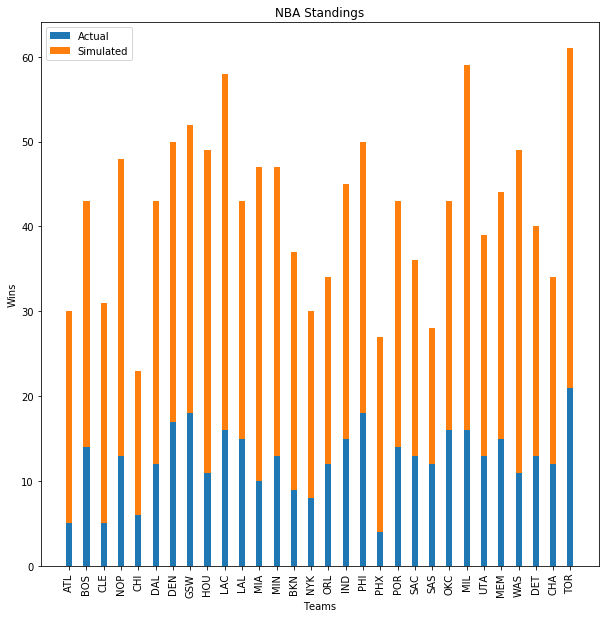

In [536]:

width = 0.35
x = np.arange(len(init_rec))
plt.figure(figsize=(10,10))
p1 = plt.bar(x,init_rec,width)
p2 = plt.bar(x,np.subtract(final_rec,init_rec),width,bottom=init_rec )
plt.ylabel("Wins")
plt.xlabel("Teams")
plt.xticks(x,nba,rotation='vertical')
plt.yticks(np.arange(0,61,10))
plt.legend((p1[0], p2[0]), ('Actual', 'Simulated'))
plt.title("NBA Standings")
plt.savefig("record")

In [548]:
import operator
init_dic = dict(zip(nba,init_rec))
fin_dic = dict(zip(nba,final_rec))
sorted_fin = sorted(fin_dic.items(), key=operator.itemgetter(1))
sorted_init = sorted(init_dic.items(), key=operator.itemgetter(1))


[('PHX', 4),
 ('ATL', 5),
 ('CLE', 5),
 ('CHI', 6),
 ('NYK', 8),
 ('BKN', 9),
 ('MIA', 10),
 ('HOU', 11),
 ('WAS', 11),
 ('DAL', 12),
 ('ORL', 12),
 ('SAS', 12),
 ('CHA', 12),
 ('NOP', 13),
 ('MIN', 13),
 ('SAC', 13),
 ('UTA', 13),
 ('DET', 13),
 ('BOS', 14),
 ('POR', 14),
 ('LAL', 15),
 ('IND', 15),
 ('MEM', 15),
 ('LAC', 16),
 ('OKC', 16),
 ('MIL', 16),
 ('DEN', 17),
 ('GSW', 18),
 ('PHI', 18),
 ('TOR', 21)]

In [554]:
teams = [i[0] for i in sorted_init]
wins = [i[1] for i in sorted_init]
win_fin = []
for i in sorted_init:
    win_fin.append(fin_dic[i[0]])
print(win_fin)

[27, 30, 31, 23, 30, 37, 47, 49, 49, 43, 34, 28, 34, 48, 47, 36, 39, 40, 43, 43, 43, 45, 44, 58, 43, 59, 50, 52, 50, 61]


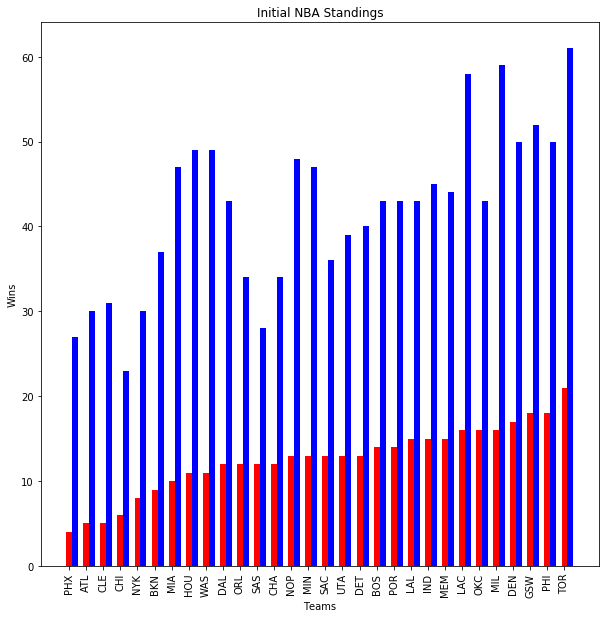

In [559]:
width = 0.35
x = np.arange(len(init_rec))
plt.figure(figsize=(10,10))
p1 = plt.bar(x,wins,width,color = "red")
p2 = plt.bar(x+width,win_fin,width, color = "blue")
plt.ylabel("Wins")
plt.xlabel("Teams")
plt.xticks(x,teams,rotation='vertical')
plt.yticks(np.arange(0,61,10))
#plt.legend((p1[0], p2[0]), ('Actual', 'Simulated'))
plt.title("Initial NBA Standings")
plt.savefig("record")